In [1]:
from IPython.display import clear_output
from typing import List, Optional

import datetime
import functools
import gpflow as gpf
import hydra
import math
import matplotlib.pyplot as plt
import numpy as np
import os
import palettable
import tensorflow as tf
import tensor_annotations.tensorflow as ttf
import tensorflow_probability as tfp

from gpflow import default_float, default_jitter
from gpflow.conditionals import uncertain_conditional, base_conditional
from matplotlib import cm
from numpy import random
from omegaconf import DictConfig
from simenvs import make

from modeopt.cost_functions import ControlQuadraticCostFunction, TargetStateCostFunction, StateDiffCostFunction, quadratic_cost_fn
from modeopt.controllers.utils import initialise_deterministic_trajectory, build_mode_variational_objective
from modeopt.controllers import TrajectoryOptimisationController
from modeopt.constraints import build_mode_chance_constraints_scipy
from modeopt.custom_types import Dataset
from modeopt.dynamics.conditionals import svgp_covariance_conditional
from modeopt.plotting import ModeOptContourPlotter
from modeopt.rollouts import rollout_controls_in_dynamics, rollout_controller_in_dynamics, rollout_controller_in_env, collect_data_from_env
from modeopt.trajectories import ControlTrajectoryDist
from modeopt.utils import model_from_DictConfig, combine_state_controls_to_input, append_zero_control
from modeopt.mode_opt import ModeOpt
from mogpe.keras.callbacks.tensorboard import PlotFn, TensorboardImageCallback
from mogpe.keras.mixture_of_experts import MixtureOfSVGPExperts
from mogpe.keras.plotting import MixtureOfSVGPExpertsContourPlotter
from mogpe.keras.utils import sample_mosvgpe_inducing_inputs_from_data, model_from_yaml

%matplotlib inline

tfd = tfp.distributions

CMAP = palettable.scientific.sequential.Bilbao_15.mpl_colormap

meaning_of_life = 42
# meaning_of_life = 10
tf.random.set_seed(meaning_of_life)
np.random.seed(meaning_of_life)

## Initialise environment

In [2]:
env_name = "velocity-controlled-point-mass/scenario-7"

In [3]:
env = make(env_name)
state_dim = env.observation_spec().shape[0]
control_dim = env.action_spec().shape[0]

No constant_error found in toml config so using default : 0.0


## ModeOpt config

In [4]:
start_state = np.array([[-1.0, -2.0]])
target_state = np.array([[1.7, 3.0]])
mode_satisfaction_prob = 0.8
# mode_satisfaction_prob = 0.9

## Sample initial data set from desired mode

(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)
(1, 2)
(2,)
(15, 2)
(2,)


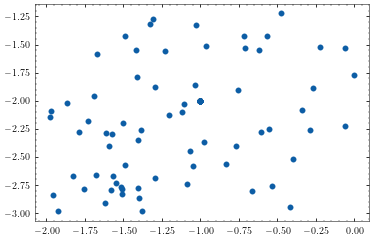

In [5]:
def sample_env_trajectories(horizon=15, num_trajectories=10):
    X, Y = [], []
    for i in range(num_trajectories):
        controls = np.random.uniform(
            env.action_spec().minimum,
            env.action_spec().maximum,
            (horizon, env.action_spec().shape[-1]),
        )
        X_, Y_ = collect_data_from_env(env, start_state=start_state, controls=controls)
        X.append(X_)
        Y.append(Y_)
    X = np.concatenate(X, 0)
    Y = np.concatenate(Y, 0)
    width = 1.0
    mask_1 = X[:, 0] > start_state[0, 0] - width
    mask_2 = X[:, 0] < start_state[0, 0] + width
    mask_3 = X[:, 1] > start_state[0, 1] - width
    mask_4 = X[:, 1] < start_state[0, 1] + width
    mask = mask_1 & mask_2 & mask_3 & mask_4
    X_trimmed = X[mask]
    Y_trimmed = Y[mask]
    print(X_trimmed.shape)
    print(Y_trimmed.shape)
    return (X_trimmed, Y_trimmed)

initial_dataset = sample_env_trajectories(horizon = 15, num_trajectories=50)
dataset = initial_dataset
plt.scatter(dataset[0][:, 0], dataset[0][:, 1])
plt.show()

## Train dynamics on initial data set or load from config

In [6]:
initial_num_epochs = 20000
# num_epochs = 300
num_epochs = 1500
# batch_size = 128
batch_size = initial_dataset[0].shape[0]
dynamics_logging_epoch_freq = 100

load_from_config = True
# load_from_config = False
yaml_cfg_filename = "./keras_configs/mode_opt_explore_scenario_7.yaml"
load_ckpt_dir = "./experiments/exploration-prob-0.8/2022-03-29-18-14/ckpts"
load_ckpt_dir = "./experiments/exploration-prob-0.8/2022-03-30-13-33/ckpts"
load_ckpt_dir = "./saved_experiments/exploration-prob-0.8/2022-03-30-14-22/ckpts"

In [7]:
now_time = datetime.datetime.now().strftime('%Y-%m-%d-%H-%M') #  now
# log_dir = os.path.join(f"./experiments/mvn-full-cov/explorative-prob-{mode_satisfaction_prob}", now_time)
log_dir = f"./experiments/mvn-full-cov/explorative-prob-{mode_satisfaction_prob}"

In [8]:
if load_from_config:
    mode_optimiser = ModeOpt.load(load_ckpt_dir)
    mode_optimiser.log_dir = log_dir
else:
    mode_optimiser = model_from_yaml(yaml_cfg_filename, custom_objects={"ModeOpt": ModeOpt})
    mode_optimiser.log_dir = log_dir
    mode_optimiser.dataset = (tf.constant(initial_dataset[0], dtype=default_float()),
                              tf.constant(initial_dataset[1], dtype=default_float())
                             )
    sample_mosvgpe_inducing_inputs_from_data(initial_dataset[0], mode_optimiser.dynamics.mosvgpe)
    mode_optimiser.dynamics_fit_kwargs.update({"epochs": initial_num_epochs, "batch_size": batch_size, "validation_split": 0.2})
#     dynamics_plotting_callbacks = build_contour_plotter_callbacks(mode_optimiser.dynamics.mosvgpe, logging_epoch_freq=dynamics_logging_epoch_freq, log_dir=mode_optimiser.log_dir)
#     mode_optimiser.add_dynamics_callbacks(dynamics_plotting_callbacks)
#     gpf.utilities.set_trainable(mode_optimiser.dynamics.mosvgpe.gating_network.gp.inducing_variable, False)
    mode_optimiser.optimise_dynamics()
#     gpf.utilities.set_trainable(mode_optimiser.dynamics.mosvgpe.gating_network.gp.kernel, False)

2022-04-22 12:25:44.809438: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


setting desired mode to 1
╒════════════════════════════════════════════════════════════════╤═══════════╤════════════════╤═════════╤═════════════╤═════════════╤═════════╤══════════════════════════════════════════╕
│ name                                                           │ class     │ transform      │ prior   │ trainable   │ shape       │ dtype   │ value                                    │
╞════════════════════════════════════════════════════════════════╪═══════════╪════════════════╪═════════╪═════════════╪═════════════╪═════════╪══════════════════════════════════════════╡
│ IndependentPosteriorMultiOutput.kernel.kernels[0].variance     │ Parameter │ Softplus       │         │ True        │ ()          │ float64 │ 1.4978003107997662                       │
├────────────────────────────────────────────────────────────────┼───────────┼────────────────┼─────────┼─────────────┼─────────────┼─────────┼──────────────────────────────────────────┤
│ IndependentPosteriorMultiOutput.kerne

2022-04-22 12:25:45.126412: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 12:25:45.126426: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.
2022-04-22 12:25:45.126725: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 12:25:45.306994: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 12:25:45.307006: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.
2022-04-22 12:25:45.307027: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.


Update the data set.

In [9]:
mode_optimiser.start_state = tf.constant(start_state, dtype=default_float())
# mode_optimiser.num_explorative_trajectories = 4

Set the correct desired dynamics mode.

In [10]:
def which_desired_mode(mode_optimiser, initial_dataset):
    probs = mode_optimiser.dynamics.mosvgpe.gating_network.predict_mixing_probs(initial_dataset[0])
    mean_probs = tf.reduce_mean(probs, 0)
    return int(tf.math.argmax(mean_probs))

desired_mode = which_desired_mode(mode_optimiser, initial_dataset)
print("Desired mode is {}".format(desired_mode))
mode_optimiser.desired_mode = desired_mode

Desired mode is 1


Save the learned dynamics model.

In [11]:
mode_optimiser.save()

In [12]:
# gpf.utilities.print_summary(mode_optimiser.dynamics.mosvgpe, fmt="notebook")

## Configure the explorative controller

In [13]:
horizon = 15
max_iterations = 1000
keep_last_solution = True
# keep_last_solution = False
method = "SLSQP"

In [14]:
terminal_state_cost_matrix = tf.eye(state_dim, dtype=default_float()) * 100
state_diff_cost_matrix = tf.eye(state_dim, dtype=default_float()) * 0.01
state_diff_cost_matrix = tf.eye(state_dim, dtype=default_float()) * 1.0
state_diff_cost_matrix = tf.eye(state_dim, dtype=default_float()) * 2.0
# control_cost_matrix = tf.eye(control_dim, dtype=default_float()) * 0.1
control_cost_matrix = tf.eye(control_dim, dtype=default_float()) * 1.0

# terminal_cost_fn = TargetStateCostFunction(weight_matrix=terminal_state_cost_matrix, target_state=start_state)
terminal_cost_fn = TargetStateCostFunction(weight_matrix=terminal_state_cost_matrix, target_state=target_state)
control_cost_fn = ControlQuadraticCostFunction(weight_matrix=control_cost_matrix)
state_diff_cost_fn = StateDiffCostFunction(weight_matrix=state_diff_cost_matrix, target_state=target_state)

cost_fn = control_cost_fn + state_diff_cost_fn
# cost_fn = state_diff_cost_fn
# cost_fn = control_cost_fn
# cost_fn = control_cost_fn + state_diff_cost_fn + terminal_cost_fn
# cost_fn = state_diff_cost_fn
# cost_fn = terminal_cost_fn + state_diff_cost_fn

In [15]:
def explorative_objective(initial_solution: ControlTrajectoryDist) -> ttf.Tensor0:
    control_means = initial_solution(variance=False)
    control_vars = None
    state_means, state_vars = rollout_controls_in_dynamics(
        dynamics=mode_optimiser.dynamics,
        start_state=start_state,
        control_means=control_means,
        control_vars=control_vars,
    )
    
    input_means, input_vars = combine_state_controls_to_input(
        state_means[1:, :], control_means, state_vars[1:, :], control_vars
    )
    h_means, h_vars = mode_optimiser.dynamics.mosvgpe.gating_network.gp.predict_f(input_means, full_cov=True)
    h_vars = h_vars + tf.eye(h_vars.shape[1], h_vars.shape[2], dtype=default_float()) * 1e-6
    h_dist = tfd.MultivariateNormalFullCovariance(h_means, h_vars[0, :, :]**2)
    gating_entropy = h_dist.entropy()
#     h_dist_diag = tfd.MultivariateNormalDiag(h_means, tf.linalg.diag_part(h_vars[0, :, :])**2)
#     h_dist = tfd.MultivariateNormalFullCovariance(h_means[:, mode_optimiser.desired_mode], h_vars[0, :, :])
#     gating_entropy_diag = h_dist_diag.entropy()
#     tf.print('mvn')
#     tf.print(tf.reduce_sum(gating_entropy))
#     tf.print('DIAG mvn')
#     tf.print(tf.reduce_sum(gating_entropy))
#     tf.print(cost_fn(state_means, control_means, state_vars, control_vars))
    return -tf.reduce_sum(gating_entropy) + cost_fn(state_means, control_means, state_vars, control_vars)

In [16]:
def find_initial_solution_in_desired_mode():
    fake_target_state_in_mode_idx = np.random.choice(np.arange(len(mode_optimiser.dataset[0])), size=1)
    fake_target_state_in_mode = mode_optimiser.dataset[0][fake_target_state_in_mode_idx[0], :state_dim]
    fake_target_state_in_mode = tf.constant([[0, -1]], dtype=default_float())
    
    terminal_state_cost_matrix = tf.eye(state_dim, dtype=default_float()) * 100.0
    control_cost_matrix = tf.eye(control_dim, dtype=default_float())
    
    terminal_cost_fn = TargetStateCostFunction(weight_matrix=terminal_state_cost_matrix, 
                                               target_state=fake_target_state_in_mode)
    control_cost_fn = ControlQuadraticCostFunction(weight_matrix=control_cost_matrix)
    initial_cost_fn = terminal_cost_fn + control_cost_fn

    initial_solution = initialise_deterministic_trajectory(horizon, control_dim)
    objective_fn = build_mode_variational_objective(mode_optimiser.dynamics, initial_cost_fn, start_state)
    explorative_controller = TrajectoryOptimisationController(
        max_iterations=max_iterations,
        initial_solution=initial_solution,
        objective_fn=objective_fn,
        method=method,
    )
    explorative_controller.optimise()
    return explorative_controller.previous_solution

initial_solution_in_mode = find_initial_solution_in_desired_mode()

2022-04-22 12:25:45.525077: W tensorflow/python/util/util.cc:348] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


Xnew.shape
(256, 15, 4)
gating_means.shape
(256, 15, 1)
input_mean.shape
(15, 4)
(15, 4)
var_exp: Tensor("Sum_218:0", shape=(15, 1), dtype=float64)
mode_var_exp: Tensor("Sum_219:0", shape=(), dtype=float64)


2022-04-22 12:26:02.763126: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Optimisation result:
     fun: array([66.59696742])
     jac: array([2.69513992e-04, 7.56009729e-04, 5.53638984e-04, 6.17919925e-04,
       8.24734830e-05, 6.56961782e-04, 1.17365008e-04, 7.29399697e-04,
       4.05722417e-04, 7.39736557e-04, 4.61553437e-04, 6.91946622e-04,
       2.84344129e-04, 5.91346487e-04, 9.81022855e-05, 4.57220948e-04,
       7.90776870e-05, 4.21872280e-04, 1.69593489e-04, 5.53104525e-04,
       2.26450631e-04, 7.32156357e-04, 1.44979967e-04, 7.40807270e-04,
       7.21748549e-05, 4.30802069e-04, 1.85513109e-04, 2.63013167e-05,
       3.66076753e-04, 9.75111871e-05])
 message: 'Optimization terminated successfully'
    nfev: 32
     nit: 15
    njev: 15
  status: 0
 success: True
       x: array([-0.23821481,  2.13424601, -0.13510465,  1.95088118, -0.07097346,
        1.82675821, -0.02716002,  1.7448613 ,  0.00669778,  1.69276623,
        0.03689614,  1.66185601,  0.0678676 ,  1.64643057,  0.10312259,
        1.6430313 ,  0.14580199,  1.65000104,  0.1990902 ,  

In [17]:
mode_chance_constraints = build_mode_chance_constraints_scipy(mode_optimiser.dynamics, 
                                                              start_state, 
                                                              horizon, 
                                                              control_dim=control_dim,
                                                              lower_bound=mode_satisfaction_prob)
explorative_controller = TrajectoryOptimisationController(
    max_iterations=max_iterations,
    initial_solution=initial_solution_in_mode,
    objective_fn=explorative_objective,
    keep_last_solution=keep_last_solution,
    constraints=[mode_chance_constraints],
    method=method,
)
mode_optimiser.explorative_controller = explorative_controller

updated ckpt manager


## Configure plotter

In [18]:
def create_test_inputs(x_min=[-3, -3], x_max=[3, 3], input_dim=4, num_test: int = 1600, factor: float = 1.2):
    sqrtN = int(np.sqrt(num_test))
    xx = np.linspace(x_min[0] * factor, x_max[0] * factor, sqrtN)
    yy = np.linspace(x_min[1] * factor, x_max[1] * factor, sqrtN)
    xx, yy = np.meshgrid(xx, yy)
    test_inputs = np.column_stack([xx.reshape(-1), yy.reshape(-1)])
    if input_dim > 2:
        zeros = np.zeros((num_test, input_dim - 2))
        test_inputs = np.concatenate([test_inputs, zeros], -1)
    return test_inputs, xx, yy

test_inputs, xx, yy = create_test_inputs()
plotter = ModeOptContourPlotter(mode_optimiser, test_inputs=test_inputs, static=False, explorative=True)

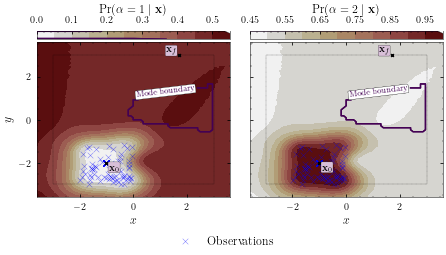

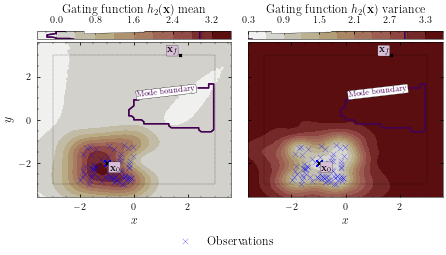

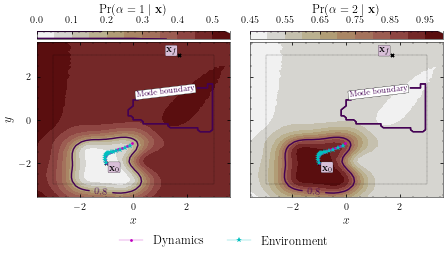

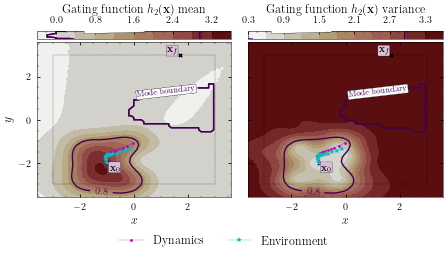

In [19]:
image_save_dir = os.path.join(mode_optimiser.log_dir, "images")
try:
    os.makedirs(image_save_dir)
except FileExistsError:
    pass

def plot_data_over_gating_network_and_save(step: int, epoch: int, save: bool = True):
    plotter.plot_data_over_mixing_probs()
    if save:
        save_filename = os.path.join(image_save_dir, "data_over_mixing_probs_step_{}_epoch_{}.pdf".format(step, epoch))
        plt.savefig(save_filename, transparent=True)
    
    plotter.plot_data_over_desired_gating_network_gp()
    if save:
        save_filename = os.path.join(image_save_dir, "data_over_desired_gating_gp_step_{}_epoch_{}.pdf".format(step, epoch))
        plt.savefig(save_filename, transparent=True)

def plot_trajectories_over_gating_network_and_save(step: int, save: bool = True):
    plotter.plot_trajectories_over_mixing_probs(plot_satisfaction_prob=True)
    if save:
        save_filename = os.path.join(image_save_dir, "trajectories_over_mixing_probs_step_{}.pdf".format(step))
        plt.savefig(save_filename, transparent=True)
    
    plotter.plot_trajectories_over_desired_gating_network_gp(plot_satisfaction_prob=True)
    if save:
        save_filename = os.path.join(image_save_dir, "trajectories_over_desired_gating_gp_step_{}.pdf".format(step))
        plt.savefig(save_filename, transparent=True)

plot_data_over_gating_network_and_save(step=0, epoch=0)
plot_trajectories_over_gating_network_and_save(step=0)

In [20]:
def plot_trajectories_over_desired_mixing_prob(iteration):
    fig = plt.figure(figsize=(plotter.mosvgpe_plotter.figsize[0] / 2, plotter.mosvgpe_plotter.figsize[1]))
    gs = fig.add_gridspec(1, 1)
    ax = gs.subplots(sharex=True, sharey=True)
    mixing_probs = mode_optimiser.dynamics.mosvgpe.gating_network.predict_mixing_probs(test_inputs)
    if iteration == 0:
        label="$\Pr(\\alpha=" + str(mode_optimiser.desired_mode + 1) + " \mid \mathbf{x}, \mathcal{D}_{0})$"
    else:
        label="$\Pr(\\alpha=" + str(mode_optimiser.desired_mode + 1) + " \mid \mathbf{x}, \mathcal{D}_{0:" + str(iteration) + "})$"
    plotter.mosvgpe_plotter.plot_contf(
        ax,
        mixing_probs[:, mode_optimiser.desired_mode],
        label=label
    )
    ax.set_ylabel("$y$")
    ax.set_xlabel("$x$")
    plotter.plot_env_no_obs_start_end_given_fig(fig)
    plotter.plot_trajectories_given_fig(fig, plot_satisfaction_prob=True)
#     fig.get_gca().get_legend().remove()
    fig.tight_layout()
    return fig

def plot_trajectories_over_gating_function_variance(iteration):
    fig = plt.figure(figsize=(plotter.mosvgpe_plotter.figsize[0] / 2, plotter.mosvgpe_plotter.figsize[1]))
    gs = fig.add_gridspec(1, 1)
    ax = gs.subplots(sharex=True, sharey=True)
    h_means, h_vars = mode_optimiser.dynamics.mosvgpe.gating_network.predict_h(test_inputs)
    if iteration == 0:
        label="$\mathbb{V}[h_{" + str(mode_optimiser.desired_mode + 1) + "}(\mathbf{x}) \mid \mathcal{D}_{0}]$"
    else:
        label="$\mathbb{V}[h_{" + str(mode_optimiser.desired_mode + 1) + "}(\mathbf{x}) \mid \mathcal{D}_{0:" + str(iteration) + "}]$"

    plotter.mosvgpe_plotter.plot_contf(
        ax,
        h_vars[:, mode_optimiser.desired_mode],
        label=label,
    )
    ax.set_ylabel("$y$")
    ax.set_xlabel("$x$")
#     plotter.plot_env_no_obs_start_end_given_fig(fig)
    plotter.plot_trajectories_given_fig(fig, plot_satisfaction_prob=True)

#     fig.get_legend().remove()
    fig.tight_layout()
    return fig

def plot_data_over_desired_mixing_prob(iteration, epoch):
    fig = plt.figure(figsize=(plotter.mosvgpe_plotter.figsize[0] / 2, plotter.mosvgpe_plotter.figsize[1]))
    gs = fig.add_gridspec(1, 1)
    ax = gs.subplots(sharex=True, sharey=True)
    mixing_probs = mode_optimiser.dynamics.mosvgpe.gating_network.predict_mixing_probs(test_inputs)
    if iteration == 0:
        label="$\mathcal{D}_{0} \\text{ over } \Pr(\\alpha=" + str(mode_optimiser.desired_mode + 1) + " \mid \mathbf{x}, \mathcal{D}_{0})$"
    else:
        if epoch == 0:
            if iteration-1 == 0:
                label="$\mathcal{D}_{0:" + str(iteration) + "} \\text{ over } \Pr(\\alpha=" + str(mode_optimiser.desired_mode + 1) + " \mid \mathbf{x}, \mathcal{D}_{0})$"
            else:
                label="$\mathcal{D}_{0:" + str(iteration) + "} \\text{ over } \Pr(\\alpha=" + str(mode_optimiser.desired_mode + 1) + " \mid \mathbf{x}, \mathcal{D}_{0:" + str(iteration-1) + "})$"
        else:
            label="$\mathcal{D}_{0:" + str(iteration) + "} \\text{ over } \Pr(\\alpha=" + str(mode_optimiser.desired_mode + 1) + " \mid \mathbf{x}, \mathcal{D}_{0:" + str(iteration) + "})$"
    plotter.mosvgpe_plotter.plot_contf(
        ax,
        mixing_probs[:, mode_optimiser.desired_mode],
        label=label
    )
    ax.set_ylabel("$y$")
    ax.set_xlabel("$x$")
    plotter.plot_env_no_obs_start_end_given_fig(fig)
    plotter.plot_data_given_fig(fig)
#     ax.get_legend().remove()
    fig.tight_layout()
    return fig

def plot_data_over_gating_function_variance(iteration, epoch):
    fig = plt.figure(figsize=(plotter.mosvgpe_plotter.figsize[0] / 2, plotter.mosvgpe_plotter.figsize[1]))
    gs = fig.add_gridspec(1, 1)
    ax = gs.subplots(sharex=True, sharey=True)
    h_means, h_vars = mode_optimiser.dynamics.mosvgpe.gating_network.predict_h(test_inputs)
    if iteration == 0:
        label="$\mathcal{D}_{0} \\text{ over } \mathbb{V}[h_{" + str(mode_optimiser.desired_mode + 1) + "}(\mathbf{x}) \mid \mathcal{D}_{0}]$"
    else:
        if epoch == 0:
            if iteration-1 == 0:
                label="$\mathcal{D}_{0:" + str(iteration) + "} \\text{ over } \mathbb{V}[h_{" + str(mode_optimiser.desired_mode + 1) + "}(\mathbf{x}) \mid \mathcal{D}_{0}]$"
            else:
                label="$\mathcal{D}_{0:" + str(iteration) + "} \\text{ over } \mathbb{V}[h_{" + str(mode_optimiser.desired_mode + 1) + "}(\mathbf{x}) \mid \mathcal{D}_{0:" + str(iteration-1) + "}]$"
        else:
            label="$\mathcal{D}_{0:" + str(iteration) + "} \\text{ over } \mathbb{V}[h_{" + str(mode_optimiser.desired_mode + 1) + "}(\mathbf{x}) \mid \mathcal{D}_{0:" + str(iteration) + "}]$"

    plotter.mosvgpe_plotter.plot_contf(
        ax,
        h_vars[:, mode_optimiser.desired_mode],
        label=label
    )
    ax.set_ylabel("$y$")
    ax.set_xlabel("$x$")
    plotter.plot_data_given_fig(fig)
#     ax.get_legend().remove()
    fig.tight_layout()
    return fig

In [21]:
image_save_dir = os.path.join(mode_optimiser.log_dir, "images")
try:
    os.makedirs(image_save_dir)
except FileExistsError:
    pass

def plot_data_over_gating_network_and_save(step: int, epoch: int, save: bool = True):
    plot_data_over_desired_mixing_prob(iteration=step, epoch=epoch)
    if save:
        save_filename = os.path.join(image_save_dir, "data_over_desired_mixing_probs_step_{}_epoch_{}.pdf".format(step, epoch))
        plt.savefig(save_filename, transparent=True)
    
    plot_data_over_gating_function_variance(iteration=step, epoch=epoch)
    if save:
        save_filename = os.path.join(image_save_dir, "data_over_gating_variance_step_{}_epoch_{}.pdf".format(step, epoch))
        plt.savefig(save_filename, transparent=True)

def plot_trajectories_over_gating_network_and_save(step: int, save: bool = True):
    plot_trajectories_over_desired_mixing_prob(iteration=step-1)
    if save:
        save_filename = os.path.join(image_save_dir, "trajectories_over_desired_mixing_probs_step_{}.pdf".format(step))
        plt.savefig(save_filename, transparent=True)
    
#     plotter.plot_trajectories_over_desired_gating_network_gp(plot_satisfaction_prob=True)
    plot_trajectories_over_gating_function_variance(iteration=step-1)
    if save:
        save_filename = os.path.join(image_save_dir, "trajectories_over_gating_variance_step_{}.pdf".format(step))
        plt.savefig(save_filename, transparent=True)

# plot_data_over_gating_network_and_save(step=0, epoch=0)
# plot_trajectories_over_gating_network_and_save(step=0)

## Configure ModeOpt and callbacks

In [22]:
# logging_epoch_freq = 60
num_epochs = 10000
# logging_epoch_freq = math.floor((num_epochs)/5)
save_epoch_freq = math.floor((num_epochs)/5)
logging_epoch_freq = 1000
num_steps = 35
dataset = initial_dataset
# batch_size = 128
# batch_size = mode_optimiser.dataset[0].shape[0]

# mode_optimiser.dynamics_fit_kwargs.update({"epochs": num_epochs, "batch_size": batch_size, "validation_split": 0.2})
# mode_optimiser.dynamics_fit_kwargs

Callbacks for dynamics learning.

In [23]:
class PlottingCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        if epoch % logging_epoch_freq == 0:
            plot_data_over_gating_network_and_save(step=step, epoch=epoch)

class CustomSaver(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        if epoch % save_epoch_freq == 0:  # or save after some epoch, each k-th epoch etc.
            self.model.save(os.path.join(mode_optimiser.ckpt_dir, "step_{}_epoch_{}".format(step, epoch)), save_format="tf")
            
early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor="loss",
    min_delta=0,
    patience=1200,
    verbose=0,
    mode="auto",
    baseline=None,
    restore_best_weights=False,
)
callbacks = [
#     PlottingCallback(),
             CustomSaver(),
             early_stopping_cb,
#              tf.keras.callbacks.ModelCheckpoint(
#                  filepath=os.path.join(save_dir + "ckpts/ModeOptDynamics"),
#                  monitor="loss",
#                  save_format="tf",
#                  save_best_only=False,
#                  save_freq=500),
             tf.keras.callbacks.TensorBoard(log_dir=mode_optimiser.log_dir)
            ]

2022-04-22 12:26:34.342715: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 12:26:34.342731: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.
2022-04-22 12:26:34.342970: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.


In [24]:
mode_optimiser.dynamics(dataset[0]) # call ModeOptDynamics to build it for saving
mode_optimiser.dynamics_callbacks = []
mode_optimiser.add_dynamics_callbacks(callbacks)

In [25]:
# gpf.utilities.set_trainable(mode_optimiser.dynamics.mosvgpe.gating_network.gp.kernel, False)
# gpf.utilities.set_trainable(mode_optimiser.dynamics.mosvgpe.gating_network.gp.kernel.lengthscales, False)
# gpf.utilities.set_trainable(mode_optimiser.dynamics.mosvgpe.experts_list[desired_mode].gp.kernel, False)
# lengthscales = gpf.Parameter([[1.0, 0.9]])
# mode_optimiser.dynamics.mosvgpe.gating_network.gp.kernel.lengthscales = lengthscales
# gpf.utilities.set_trainable(mode_optimiser.dynamics.mosvgpe.gating_network.gp.kernel, False)
# gpf.utilities.print_summary(mode_optimiser.dynamics.mosvgpe, fmt="notebook")

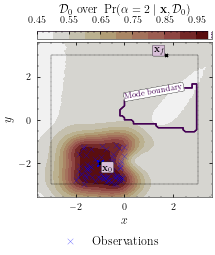

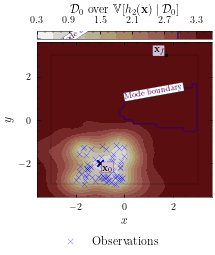

In [26]:
plot_data_over_gating_network_and_save(step=0, epoch=0)
# plot_trajectories_over_gating_network_and_save(step=0)

Instructions for updating:
`MultivariateNormalFullCovariance` is deprecated, use `MultivariateNormalTriL(loc=loc, scale_tril=tf.linalg.cholesky(covariance_matrix))` instead.
Optimisation result:
     fun: 532.6409732126169
     jac: array([-49.89113079, -72.67732203, -47.32454763, -74.69659451,
       -47.51522323, -66.13392579, -48.01193268, -68.81529006,
       -45.81520065, -35.94160479, -50.62084518, -27.83039087,
       -40.93245167,  -5.85233305, -41.46728959,  -4.65010262,
       -43.54513449,  -4.91621041, -44.56543814,  -6.15948427,
       -43.88677241,  -7.5266388 , -28.31145973,  -8.5531792 ,
       -15.97275943,  -2.82352096, -14.5753186 ,  -3.22968629,
        -9.22294024,  -2.14188553])
 message: 'Optimization terminated successfully'
    nfev: 124
     nit: 71
    njev: 71
  status: 0
 success: True
       x: array([-9.14772930e-01,  3.72715139e+00, -3.45078020e-01,  3.67703533e+00,
        9.79204841e-01,  9.58505049e-01,  1.96447211e+00,  2.47992521e+00,
       -9.7219

2022-04-22 12:28:25.658638: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 12:28:25.658654: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.
2022-04-22 12:28:25.678075: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 12:28:25.711110: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 12:28:25.741837: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_12_28_25

2022-04-22 12:28:25.752345: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_12_28_25/dr-robots-mbp.local.trace.json.gz
2022-04-22 12:28:25.806908: I tensorflow/core/profiler/rp

Mixing probs: (1, None, 2)
Experts probs: (None, None, 2)
3/3 [==============================] - 19s 2s/step - loss: -728.3936 - val_loss: -800.0584
Instructions for updating:
`min_event_ndims` is now static for all bijectors; this property is no longer needed.
INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_1_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 19ms/step - loss: -729.5067 - val_loss: -708.2232
Epoch 3/20000
3/3 [==============================] - 0s 18ms/step - loss: -747.1039 - val_loss: -810.7737
Epoch 4/20000
3/3 [==============================] - 0s 19ms/step - loss: -782.2685 - val_loss: -841.9781
Epoch 5/20000
3/3 [==============================] - 0s 17ms/step - loss: -744.8821 - val_loss: -827.3483
Epoch 6/20000
3/3 [==============================] - 0s 18ms/step - loss: -800.9177 - val_loss: -858.6773
Epoch 7/20000
3/3 [==============================] - 0s 19ms/step - loss: -783.1225 - val_loss: -872.2034
Epoch 8/20000
3/3 [==============================] - 0s 19ms/step - loss: -824.0673 - val_loss: -836.0003
Epoch 9/20000
3/3 [==============================] - 0s 18ms/step - loss: -832.7365 - val_loss: -908.9989
Epoch 10/20000
3/3 [==============================] - 0s 18ms/step - loss: -842.3782 - val_loss: -840.5581
Epoch 11/20000
3/3 [=========================

3/3 [==============================] - 0s 17ms/step - loss: -675.5143 - val_loss: -277.3687
Epoch 77/20000
3/3 [==============================] - 0s 17ms/step - loss: -530.7562 - val_loss: -620.9141
Epoch 78/20000
3/3 [==============================] - 0s 17ms/step - loss: -505.8187 - val_loss: -666.3154
Epoch 79/20000
3/3 [==============================] - 0s 17ms/step - loss: -285.0040 - val_loss: -675.6940
Epoch 80/20000
3/3 [==============================] - 0s 17ms/step - loss: -612.4052 - val_loss: -506.5306
Epoch 81/20000
3/3 [==============================] - 0s 17ms/step - loss: -512.5173 - val_loss: -624.1832
Epoch 82/20000
3/3 [==============================] - 0s 17ms/step - loss: -603.5875 - val_loss: -733.8585
Epoch 83/20000
3/3 [==============================] - 0s 18ms/step - loss: -592.1745 - val_loss: -609.0875
Epoch 84/20000
3/3 [==============================] - 0s 17ms/step - loss: -580.7432 - val_loss: -585.9492
Epoch 85/20000
3/3 [==============================] 

3/3 [==============================] - 0s 17ms/step - loss: -735.0693 - val_loss: -838.7596
Epoch 153/20000
3/3 [==============================] - 0s 18ms/step - loss: -701.5969 - val_loss: -805.2500
Epoch 154/20000
3/3 [==============================] - 0s 18ms/step - loss: -709.1919 - val_loss: -836.9231
Epoch 155/20000
3/3 [==============================] - 0s 18ms/step - loss: -757.0965 - val_loss: -811.2112
Epoch 156/20000
3/3 [==============================] - 0s 18ms/step - loss: -763.3750 - val_loss: -863.8802
Epoch 157/20000
3/3 [==============================] - 0s 18ms/step - loss: -779.2998 - val_loss: -843.3766
Epoch 158/20000
3/3 [==============================] - 0s 18ms/step - loss: -744.1295 - val_loss: -886.4895
Epoch 159/20000
3/3 [==============================] - 0s 18ms/step - loss: -777.5846 - val_loss: -888.3159
Epoch 160/20000
3/3 [==============================] - 0s 18ms/step - loss: -793.6360 - val_loss: -823.7121
Epoch 161/20000
3/3 [=======================

3/3 [==============================] - 0s 20ms/step - loss: -634.1028 - val_loss: -754.5995
Epoch 229/20000
3/3 [==============================] - 0s 20ms/step - loss: -731.5152 - val_loss: -818.2928
Epoch 230/20000
3/3 [==============================] - 0s 19ms/step - loss: -749.1884 - val_loss: -829.4378
Epoch 231/20000
3/3 [==============================] - 0s 20ms/step - loss: -602.4848 - val_loss: -889.1078
Epoch 232/20000
3/3 [==============================] - 0s 19ms/step - loss: -698.5562 - val_loss: -827.3767
Epoch 233/20000
3/3 [==============================] - 0s 20ms/step - loss: -695.7344 - val_loss: -841.5966
Epoch 234/20000
3/3 [==============================] - 0s 20ms/step - loss: -730.8343 - val_loss: -857.9173
Epoch 235/20000
3/3 [==============================] - 0s 20ms/step - loss: -749.2411 - val_loss: -769.2616
Epoch 236/20000
3/3 [==============================] - 0s 20ms/step - loss: -730.9906 - val_loss: -867.5807
Epoch 237/20000
3/3 [=======================

Epoch 304/20000
3/3 [==============================] - 0s 20ms/step - loss: -603.9414 - val_loss: -820.6060
Epoch 305/20000
3/3 [==============================] - 0s 20ms/step - loss: -271.1989 - val_loss: -847.7713
Epoch 306/20000
3/3 [==============================] - 0s 20ms/step - loss: -165.5951 - val_loss: -841.3015
Epoch 307/20000
3/3 [==============================] - 0s 20ms/step - loss: -390.7134 - val_loss: -471.9700
Epoch 308/20000
3/3 [==============================] - 0s 20ms/step - loss: -581.8357 - val_loss: -818.9556
Epoch 309/20000
3/3 [==============================] - 0s 20ms/step - loss: -733.4533 - val_loss: -874.2769
Epoch 310/20000
3/3 [==============================] - 0s 20ms/step - loss: -500.5661 - val_loss: -876.3292
Epoch 311/20000
3/3 [==============================] - 0s 20ms/step - loss: -571.6045 - val_loss: -721.3068
Epoch 312/20000
3/3 [==============================] - 0s 20ms/step - loss: -719.4546 - val_loss: -714.2078
Epoch 313/20000
3/3 [=======

Epoch 380/20000
3/3 [==============================] - 0s 21ms/step - loss: -901.0918 - val_loss: -841.3863
Epoch 381/20000
3/3 [==============================] - 0s 21ms/step - loss: -870.1866 - val_loss: -915.4904
Epoch 382/20000
3/3 [==============================] - 0s 21ms/step - loss: -896.2663 - val_loss: -959.9804
Epoch 383/20000
3/3 [==============================] - 0s 21ms/step - loss: -891.8727 - val_loss: -964.2913
Epoch 384/20000
3/3 [==============================] - 0s 22ms/step - loss: -865.1638 - val_loss: -1008.6628
Epoch 385/20000
3/3 [==============================] - 0s 21ms/step - loss: -899.2274 - val_loss: -997.6489
Epoch 386/20000
3/3 [==============================] - 0s 21ms/step - loss: -934.5246 - val_loss: -969.8478
Epoch 387/20000
3/3 [==============================] - 0s 21ms/step - loss: -847.5804 - val_loss: -939.5900
Epoch 388/20000
3/3 [==============================] - 0s 21ms/step - loss: -929.6449 - val_loss: -1006.2361
Epoch 389/20000
3/3 [=====

Epoch 456/20000
3/3 [==============================] - 0s 21ms/step - loss: -656.4238 - val_loss: -341.7217
Epoch 457/20000
3/3 [==============================] - 0s 21ms/step - loss: -666.1964 - val_loss: -640.0071
Epoch 458/20000
3/3 [==============================] - 0s 21ms/step - loss: -670.0805 - val_loss: -631.8749
Epoch 459/20000
3/3 [==============================] - 0s 21ms/step - loss: -745.5532 - val_loss: -653.1636
Epoch 460/20000
3/3 [==============================] - 0s 21ms/step - loss: -757.0475 - val_loss: -482.6120
Epoch 461/20000
3/3 [==============================] - 0s 20ms/step - loss: -429.2613 - val_loss: -775.0328
Epoch 462/20000
3/3 [==============================] - 0s 21ms/step - loss: -686.1956 - val_loss: -287.3196
Epoch 463/20000
3/3 [==============================] - 0s 21ms/step - loss: -358.4235 - val_loss: -545.0912
Epoch 464/20000
3/3 [==============================] - 0s 21ms/step - loss: -796.4073 - val_loss: 24.1147
Epoch 465/20000
3/3 [=========

Epoch 532/20000
3/3 [==============================] - 0s 22ms/step - loss: -804.5161 - val_loss: -821.1318
Epoch 533/20000
3/3 [==============================] - 0s 21ms/step - loss: -781.9910 - val_loss: -913.7678
Epoch 534/20000
3/3 [==============================] - 0s 21ms/step - loss: -817.4842 - val_loss: -832.3885
Epoch 535/20000
3/3 [==============================] - 0s 22ms/step - loss: -741.7435 - val_loss: -960.1808
Epoch 536/20000
3/3 [==============================] - 0s 23ms/step - loss: -810.0982 - val_loss: -746.1351
Epoch 537/20000
3/3 [==============================] - 0s 21ms/step - loss: -722.4055 - val_loss: -960.8092
Epoch 538/20000
3/3 [==============================] - 0s 21ms/step - loss: -724.9100 - val_loss: -958.5023
Epoch 539/20000
3/3 [==============================] - 0s 22ms/step - loss: -834.6330 - val_loss: -951.2605
Epoch 540/20000
3/3 [==============================] - 0s 22ms/step - loss: -888.9748 - val_loss: -673.1889
Epoch 541/20000
3/3 [=======

Epoch 608/20000
3/3 [==============================] - 0s 21ms/step - loss: -611.0151 - val_loss: -921.5197
Epoch 609/20000
3/3 [==============================] - 0s 22ms/step - loss: -458.5684 - val_loss: -241.3659
Epoch 610/20000
3/3 [==============================] - 0s 21ms/step - loss: -374.1311 - val_loss: -71.1585
Epoch 611/20000
3/3 [==============================] - 0s 21ms/step - loss: -574.9300 - val_loss: -591.2344
Epoch 612/20000
3/3 [==============================] - 0s 22ms/step - loss: -710.4242 - val_loss: -643.1199
Epoch 613/20000
3/3 [==============================] - 0s 22ms/step - loss: -685.3962 - val_loss: -845.9165
Epoch 614/20000
3/3 [==============================] - 0s 21ms/step - loss: -655.2774 - val_loss: -841.3523
Epoch 615/20000
3/3 [==============================] - 0s 21ms/step - loss: -596.5657 - val_loss: -834.0757
Epoch 616/20000
3/3 [==============================] - 0s 23ms/step - loss: -792.0456 - val_loss: -865.0575
Epoch 617/20000
3/3 [========

Epoch 684/20000
3/3 [==============================] - 0s 21ms/step - loss: -505.0513 - val_loss: -857.8836
Epoch 685/20000
3/3 [==============================] - 0s 21ms/step - loss: -680.0135 - val_loss: -819.5643
Epoch 686/20000
3/3 [==============================] - 0s 21ms/step - loss: -843.1299 - val_loss: -925.1846
Epoch 687/20000
3/3 [==============================] - 0s 22ms/step - loss: -228.9385 - val_loss: -688.8965
Epoch 688/20000
3/3 [==============================] - 0s 21ms/step - loss: -718.3185 - val_loss: -784.3293
Epoch 689/20000
3/3 [==============================] - 0s 21ms/step - loss: -638.5974 - val_loss: -868.5126
Epoch 690/20000
3/3 [==============================] - 0s 22ms/step - loss: -818.1541 - val_loss: -782.0537
Epoch 691/20000
3/3 [==============================] - 0s 22ms/step - loss: -682.2998 - val_loss: -912.4767
Epoch 692/20000
3/3 [==============================] - 0s 21ms/step - loss: -622.3449 - val_loss: -853.5721
Epoch 693/20000
3/3 [=======

Epoch 760/20000
3/3 [==============================] - 0s 22ms/step - loss: -608.3589 - val_loss: -145.1533
Epoch 761/20000
3/3 [==============================] - 0s 22ms/step - loss: -619.5070 - val_loss: -681.8572
Epoch 762/20000
3/3 [==============================] - 0s 22ms/step - loss: -436.7258 - val_loss: -21.3258
Epoch 763/20000
3/3 [==============================] - 0s 22ms/step - loss: -453.3633 - val_loss: -323.2150
Epoch 764/20000
3/3 [==============================] - 0s 23ms/step - loss: -513.8275 - val_loss: 19.4574
Epoch 765/20000
3/3 [==============================] - 0s 22ms/step - loss: -65.4758 - val_loss: -332.9226
Epoch 766/20000
3/3 [==============================] - 0s 25ms/step - loss: -317.1923 - val_loss: -549.6149
Epoch 767/20000
3/3 [==============================] - 0s 23ms/step - loss: -527.9138 - val_loss: -686.6324
Epoch 768/20000
3/3 [==============================] - 0s 23ms/step - loss: -307.7013 - val_loss: -751.5713
Epoch 769/20000
3/3 [===========

Epoch 836/20000
3/3 [==============================] - 0s 25ms/step - loss: -786.4314 - val_loss: -858.5957
Epoch 837/20000
3/3 [==============================] - 0s 23ms/step - loss: -706.4327 - val_loss: -903.5691
Epoch 838/20000
3/3 [==============================] - 0s 24ms/step - loss: -803.9182 - val_loss: -760.7859
Epoch 839/20000
3/3 [==============================] - 0s 24ms/step - loss: -834.3786 - val_loss: -856.0260
Epoch 840/20000
3/3 [==============================] - 0s 23ms/step - loss: -666.0021 - val_loss: -577.5559
Epoch 841/20000
3/3 [==============================] - 0s 23ms/step - loss: -726.4691 - val_loss: -927.4036
Epoch 842/20000
3/3 [==============================] - 0s 23ms/step - loss: -799.3028 - val_loss: -805.4841
Epoch 843/20000
3/3 [==============================] - 0s 23ms/step - loss: -715.5059 - val_loss: -879.9483
Epoch 844/20000
3/3 [==============================] - 0s 24ms/step - loss: -768.9795 - val_loss: -900.1806
Epoch 845/20000
3/3 [=======

Epoch 912/20000
3/3 [==============================] - 0s 22ms/step - loss: -679.9767 - val_loss: -911.4987
Epoch 913/20000
3/3 [==============================] - 0s 22ms/step - loss: -636.1659 - val_loss: -717.5324
Epoch 914/20000
3/3 [==============================] - 0s 22ms/step - loss: -680.7055 - val_loss: -837.9503
Epoch 915/20000
3/3 [==============================] - 0s 22ms/step - loss: -815.9192 - val_loss: -598.4363
Epoch 916/20000
3/3 [==============================] - 0s 22ms/step - loss: -779.7670 - val_loss: -796.0055
Epoch 917/20000
3/3 [==============================] - 0s 22ms/step - loss: -715.8342 - val_loss: -558.6446
Epoch 918/20000
3/3 [==============================] - 0s 22ms/step - loss: -757.6925 - val_loss: -813.3436
Epoch 919/20000
3/3 [==============================] - 0s 22ms/step - loss: -640.2688 - val_loss: -714.8873
Epoch 920/20000
3/3 [==============================] - 0s 23ms/step - loss: -693.9369 - val_loss: -649.6011
Epoch 921/20000
3/3 [=======

Epoch 988/20000
3/3 [==============================] - 0s 22ms/step - loss: -771.1562 - val_loss: -479.2304
Epoch 989/20000
3/3 [==============================] - 0s 22ms/step - loss: -786.1982 - val_loss: -261.3248
Epoch 990/20000
3/3 [==============================] - 0s 22ms/step - loss: -464.2466 - val_loss: -194.0324
Epoch 991/20000
3/3 [==============================] - 0s 22ms/step - loss: -776.3370 - val_loss: 500.3157
Epoch 992/20000
3/3 [==============================] - 0s 22ms/step - loss: -303.9203 - val_loss: -166.6022
Epoch 993/20000
3/3 [==============================] - 0s 22ms/step - loss: -713.8690 - val_loss: -540.4596
Epoch 994/20000
3/3 [==============================] - 0s 22ms/step - loss: -586.5762 - val_loss: -833.0079
Epoch 995/20000
3/3 [==============================] - 0s 22ms/step - loss: -359.8226 - val_loss: -300.3283
Epoch 996/20000
3/3 [==============================] - 0s 22ms/step - loss: -357.5486 - val_loss: -553.8921
Epoch 997/20000
3/3 [========

3/3 [==============================] - 0s 22ms/step - loss: -756.9109 - val_loss: -554.4193
Epoch 1064/20000
3/3 [==============================] - 0s 23ms/step - loss: -699.6820 - val_loss: -896.4499
Epoch 1065/20000
3/3 [==============================] - 0s 22ms/step - loss: -683.7109 - val_loss: -771.5805
Epoch 1066/20000
3/3 [==============================] - 0s 22ms/step - loss: -659.6371 - val_loss: -547.4669
Epoch 1067/20000
3/3 [==============================] - 0s 21ms/step - loss: -703.2481 - val_loss: -879.0142
Epoch 1068/20000
3/3 [==============================] - 0s 23ms/step - loss: -784.9098 - val_loss: -623.6470
Epoch 1069/20000
3/3 [==============================] - 0s 23ms/step - loss: -763.2071 - val_loss: -881.5509
Epoch 1070/20000
3/3 [==============================] - 0s 22ms/step - loss: -790.2439 - val_loss: -805.2276
Epoch 1071/20000
3/3 [==============================] - 0s 23ms/step - loss: -716.5805 - val_loss: -871.7314
Epoch 1072/20000
3/3 [==============

3/3 [==============================] - 0s 22ms/step - loss: -867.3309 - val_loss: -749.5010
Epoch 1139/20000
3/3 [==============================] - 0s 22ms/step - loss: -702.5358 - val_loss: -802.0765
Epoch 1140/20000
3/3 [==============================] - 0s 22ms/step - loss: -859.8992 - val_loss: -942.6906
Epoch 1141/20000
3/3 [==============================] - 0s 22ms/step - loss: -767.4630 - val_loss: -913.0721
Epoch 1142/20000
3/3 [==============================] - 0s 22ms/step - loss: -700.0840 - val_loss: -742.1226
Epoch 1143/20000
3/3 [==============================] - 0s 22ms/step - loss: -802.7105 - val_loss: -906.1772
Epoch 1144/20000
3/3 [==============================] - 0s 22ms/step - loss: -718.0697 - val_loss: -982.2851
Epoch 1145/20000
3/3 [==============================] - 0s 22ms/step - loss: -819.5760 - val_loss: -955.7820
Epoch 1146/20000
3/3 [==============================] - 0s 22ms/step - loss: -401.2425 - val_loss: -663.1406
Epoch 1147/20000
3/3 [==============

3/3 [==============================] - 0s 22ms/step - loss: -839.7806 - val_loss: -926.8059
Epoch 1214/20000
3/3 [==============================] - 0s 21ms/step - loss: -870.8997 - val_loss: -622.3409
Epoch 1215/20000
3/3 [==============================] - 0s 22ms/step - loss: -867.3640 - val_loss: -905.1728
Epoch 1216/20000
3/3 [==============================] - 0s 21ms/step - loss: -772.7381 - val_loss: -504.3979
Epoch 1217/20000
3/3 [==============================] - 0s 22ms/step - loss: -447.8092 - val_loss: -868.3455
Epoch 1218/20000
3/3 [==============================] - 0s 21ms/step - loss: -876.6236 - val_loss: -961.9165
Epoch 1219/20000
3/3 [==============================] - 0s 21ms/step - loss: -832.0528 - val_loss: -950.6888
Epoch 1220/20000
3/3 [==============================] - 0s 22ms/step - loss: -718.6453 - val_loss: -916.5677
Epoch 1221/20000
3/3 [==============================] - 0s 22ms/step - loss: -677.4779 - val_loss: -751.5709
Epoch 1222/20000
3/3 [==============

3/3 [==============================] - 0s 21ms/step - loss: -612.3206 - val_loss: -497.6447
Epoch 1289/20000
3/3 [==============================] - 0s 22ms/step - loss: -560.8620 - val_loss: -678.7032
Epoch 1290/20000
3/3 [==============================] - 0s 22ms/step - loss: -564.4139 - val_loss: -642.0454
Epoch 1291/20000
3/3 [==============================] - 0s 22ms/step - loss: -667.8901 - val_loss: -733.2506
Epoch 1292/20000
3/3 [==============================] - 0s 21ms/step - loss: -616.0341 - val_loss: -629.2788
Epoch 1293/20000
3/3 [==============================] - 0s 22ms/step - loss: -611.0499 - val_loss: -665.2130
Epoch 1294/20000
3/3 [==============================] - 0s 22ms/step - loss: -635.0013 - val_loss: -627.8690
Epoch 1295/20000
3/3 [==============================] - 0s 22ms/step - loss: -564.8966 - val_loss: -646.4498
Epoch 1296/20000
3/3 [==============================] - 0s 21ms/step - loss: -579.8716 - val_loss: -353.9402
Epoch 1297/20000
3/3 [==============

3/3 [==============================] - 0s 21ms/step - loss: -716.5513 - val_loss: -893.5518
Epoch 1364/20000
3/3 [==============================] - 0s 21ms/step - loss: -805.6640 - val_loss: -743.8154
Epoch 1365/20000
3/3 [==============================] - 0s 23ms/step - loss: -745.5639 - val_loss: -875.9820
Epoch 1366/20000
3/3 [==============================] - 0s 21ms/step - loss: -747.7040 - val_loss: -911.9681
Epoch 1367/20000
3/3 [==============================] - 0s 22ms/step - loss: -699.6366 - val_loss: -709.5947
Epoch 1368/20000
3/3 [==============================] - 0s 22ms/step - loss: -775.5879 - val_loss: -940.8368
Epoch 1369/20000
3/3 [==============================] - 0s 21ms/step - loss: -737.6718 - val_loss: -845.8531
Epoch 1370/20000
3/3 [==============================] - 0s 21ms/step - loss: -775.2475 - val_loss: -846.9282
Epoch 1371/20000
3/3 [==============================] - 0s 23ms/step - loss: -748.4094 - val_loss: -553.7227
Epoch 1372/20000
3/3 [==============

3/3 [==============================] - 0s 24ms/step - loss: -802.5186 - val_loss: -900.3406
Epoch 1439/20000
3/3 [==============================] - 0s 22ms/step - loss: -764.9188 - val_loss: -926.7229
Epoch 1440/20000
3/3 [==============================] - 0s 24ms/step - loss: -738.4000 - val_loss: -954.1941
Epoch 1441/20000
3/3 [==============================] - 0s 22ms/step - loss: -795.8420 - val_loss: -933.5419
Epoch 1442/20000
3/3 [==============================] - 0s 22ms/step - loss: -743.3055 - val_loss: -1010.3677
Epoch 1443/20000
3/3 [==============================] - 0s 22ms/step - loss: -821.8892 - val_loss: -561.3250
Epoch 1444/20000
3/3 [==============================] - 0s 22ms/step - loss: -591.1492 - val_loss: -952.3262
Epoch 1445/20000
3/3 [==============================] - 0s 22ms/step - loss: -857.2306 - val_loss: -554.9830
Epoch 1446/20000
3/3 [==============================] - 0s 23ms/step - loss: -255.6752 - val_loss: -257.7194
Epoch 1447/20000
3/3 [=============

3/3 [==============================] - 0s 23ms/step - loss: -641.9724 - val_loss: -910.2068
Epoch 1514/20000
3/3 [==============================] - 0s 22ms/step - loss: -838.7335 - val_loss: -842.9693
Epoch 1515/20000
3/3 [==============================] - 0s 23ms/step - loss: -754.0492 - val_loss: -857.9793
Epoch 1516/20000
3/3 [==============================] - 0s 23ms/step - loss: -837.0276 - val_loss: -991.3498
Epoch 1517/20000
3/3 [==============================] - 0s 23ms/step - loss: -826.6496 - val_loss: -920.3491
Epoch 1518/20000
3/3 [==============================] - 0s 22ms/step - loss: -836.2748 - val_loss: -903.4474
Epoch 1519/20000
3/3 [==============================] - 0s 22ms/step - loss: -652.6592 - val_loss: -746.4782
Epoch 1520/20000
3/3 [==============================] - 0s 25ms/step - loss: -835.8159 - val_loss: -917.0226
Epoch 1521/20000
3/3 [==============================] - 0s 22ms/step - loss: -859.4827 - val_loss: -936.9041
Epoch 1522/20000
3/3 [==============

3/3 [==============================] - 0s 22ms/step - loss: -790.7598 - val_loss: -1037.4246
Epoch 1589/20000
3/3 [==============================] - 0s 22ms/step - loss: -887.5517 - val_loss: -1050.4419
Epoch 1590/20000
3/3 [==============================] - 0s 22ms/step - loss: -870.0330 - val_loss: -936.3333
Epoch 1591/20000
3/3 [==============================] - 0s 22ms/step - loss: -932.5682 - val_loss: -797.1749
Epoch 1592/20000
3/3 [==============================] - 0s 22ms/step - loss: -926.4366 - val_loss: -923.0275
Epoch 1593/20000
3/3 [==============================] - 0s 22ms/step - loss: -891.4989 - val_loss: -812.1094
Epoch 1594/20000
3/3 [==============================] - 0s 22ms/step - loss: -949.8106 - val_loss: -874.8529
Epoch 1595/20000
3/3 [==============================] - 0s 22ms/step - loss: -865.6778 - val_loss: -1018.6399
Epoch 1596/20000
3/3 [==============================] - 0s 22ms/step - loss: -899.1909 - val_loss: -1047.1406
Epoch 1597/20000
3/3 [==========

3/3 [==============================] - 0s 23ms/step - loss: -741.2584 - val_loss: -760.9900
Epoch 1664/20000
3/3 [==============================] - 0s 23ms/step - loss: -614.4144 - val_loss: -327.7495
Epoch 1665/20000
3/3 [==============================] - 0s 23ms/step - loss: -609.5020 - val_loss: -399.2035
Epoch 1666/20000
3/3 [==============================] - 0s 23ms/step - loss: -778.5727 - val_loss: -782.4930
Epoch 1667/20000
3/3 [==============================] - 0s 23ms/step - loss: -51.0538 - val_loss: -873.2177
Epoch 1668/20000
3/3 [==============================] - 0s 23ms/step - loss: -686.6240 - val_loss: -709.0430
Epoch 1669/20000
3/3 [==============================] - 0s 23ms/step - loss: -750.7980 - val_loss: -851.0544
Epoch 1670/20000
3/3 [==============================] - 0s 22ms/step - loss: -595.7807 - val_loss: -792.5391
Epoch 1671/20000
3/3 [==============================] - 0s 24ms/step - loss: -738.2075 - val_loss: -886.4425
Epoch 1672/20000
3/3 [===============

3/3 [==============================] - 0s 24ms/step - loss: -842.3486 - val_loss: -894.9408
Epoch 1739/20000
3/3 [==============================] - 0s 25ms/step - loss: -535.8333 - val_loss: -129.9184
Epoch 1740/20000
3/3 [==============================] - 0s 24ms/step - loss: -699.5650 - val_loss: 30.8754
Epoch 1741/20000
3/3 [==============================] - 0s 24ms/step - loss: -490.9116 - val_loss: -698.9351
Epoch 1742/20000
3/3 [==============================] - 0s 25ms/step - loss: -764.1717 - val_loss: -719.9846
Epoch 1743/20000
3/3 [==============================] - 0s 23ms/step - loss: -658.7754 - val_loss: -231.8137
Epoch 1744/20000
3/3 [==============================] - 0s 24ms/step - loss: -560.3349 - val_loss: -884.1147
Epoch 1745/20000
3/3 [==============================] - 0s 24ms/step - loss: -696.7493 - val_loss: -619.9432
Epoch 1746/20000
3/3 [==============================] - 0s 23ms/step - loss: -580.8430 - val_loss: -606.8366
Epoch 1747/20000
3/3 [================

3/3 [==============================] - 0s 22ms/step - loss: -729.3207 - val_loss: -486.6662
Epoch 1814/20000
3/3 [==============================] - 0s 22ms/step - loss: -774.8324 - val_loss: -612.0707
Epoch 1815/20000
3/3 [==============================] - 0s 22ms/step - loss: -774.7920 - val_loss: -1008.4733
Epoch 1816/20000
3/3 [==============================] - 0s 22ms/step - loss: -833.8563 - val_loss: -1028.1386
Epoch 1817/20000
3/3 [==============================] - 0s 22ms/step - loss: -750.0360 - val_loss: -531.2262
Epoch 1818/20000
3/3 [==============================] - 0s 22ms/step - loss: -887.7199 - val_loss: -829.7227
Epoch 1819/20000
3/3 [==============================] - 0s 22ms/step - loss: -884.5564 - val_loss: -782.3145
Epoch 1820/20000
3/3 [==============================] - 0s 22ms/step - loss: -913.7554 - val_loss: -925.7730
Epoch 1821/20000
3/3 [==============================] - 0s 22ms/step - loss: -928.6637 - val_loss: -845.7873
Epoch 1822/20000
3/3 [============

3/3 [==============================] - 0s 21ms/step - loss: -253.7316 - val_loss: 1033.2599
Epoch 1889/20000
3/3 [==============================] - 0s 21ms/step - loss: -220.2598 - val_loss: -728.1860
Epoch 1890/20000
3/3 [==============================] - 0s 21ms/step - loss: -455.8149 - val_loss: 321.3901
Epoch 1891/20000
3/3 [==============================] - 0s 21ms/step - loss: -660.0456 - val_loss: -751.6146
Epoch 1892/20000
3/3 [==============================] - 0s 21ms/step - loss: -295.9477 - val_loss: 409.7281
Epoch 1893/20000
3/3 [==============================] - 0s 21ms/step - loss: -478.3888 - val_loss: -885.0653
Epoch 1894/20000
3/3 [==============================] - 0s 21ms/step - loss: -169.0797 - val_loss: -422.6011
Epoch 1895/20000
3/3 [==============================] - 0s 21ms/step - loss: -582.2345 - val_loss: -735.7837
Epoch 1896/20000
3/3 [==============================] - 0s 21ms/step - loss: -364.0107 - val_loss: -765.5330
Epoch 1897/20000
3/3 [================

3/3 [==============================] - 0s 21ms/step - loss: -119.5995 - val_loss: -440.2270
Epoch 1964/20000
3/3 [==============================] - 0s 20ms/step - loss: -483.6928 - val_loss: -405.7307
Epoch 1965/20000
3/3 [==============================] - 0s 21ms/step - loss: -467.7021 - val_loss: -548.2447
Epoch 1966/20000
3/3 [==============================] - 0s 24ms/step - loss: -415.8938 - val_loss: -650.1580
Epoch 1967/20000
3/3 [==============================] - 0s 24ms/step - loss: -652.1872 - val_loss: -456.8624
Epoch 1968/20000
3/3 [==============================] - 0s 22ms/step - loss: -605.7209 - val_loss: -624.3402
Epoch 1969/20000
3/3 [==============================] - 0s 21ms/step - loss: -641.2859 - val_loss: -347.0646
Epoch 1970/20000
3/3 [==============================] - 0s 23ms/step - loss: -635.0962 - val_loss: -640.2729
Epoch 1971/20000
3/3 [==============================] - 0s 23ms/step - loss: -525.9228 - val_loss: -798.5420
Epoch 1972/20000
3/3 [==============

/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2002/20000
3/3 [==============================] - 0s 18ms/step - loss: -816.4724 - val_loss: -825.5383
Epoch 2003/20000
3/3 [==============================] - 0s 18ms/step - loss: -773.8605 - val_loss: -794.9636
Epoch 2004/20000
3/3 [==============================] - 0s 18ms/step - loss: -793.4053 - val_loss: -944.3393
Epoch 2005/20000
3/3 [==============================] - 0s 18ms/step - loss: -822.2491 - val_loss: -844.4415
Epoch 2006/20000
3/3 [==============================] - 0s 18ms/step - loss: -830.5416 - val_loss: -859.8632
Epoch 2007/20000
3/3 [==============================] - 0s 18ms/step - loss: -827.6875 - val_loss: -983.2971
Epoch 2008/20000
3/3 [==============================] - 0s 18ms/step - loss: -761.2890 - val_loss: -509.0614
Epoch 2009/20000
3/3 [==============================] - 0s 18ms/step - loss: -828.3939 - val_loss: -986.5459
Epoch 2010/20000
3/3 [==============================] - 0s 19ms/step - loss: -878.2944 - val_loss: -988.9064
Epoch 2011/20000
3/

3/3 [==============================] - 0s 19ms/step - loss: -540.2562 - val_loss: -565.6895
Epoch 2078/20000
3/3 [==============================] - 0s 19ms/step - loss: -647.1880 - val_loss: -730.6004
Epoch 2079/20000
3/3 [==============================] - 0s 19ms/step - loss: -652.9711 - val_loss: -751.5292
Epoch 2080/20000
3/3 [==============================] - 0s 19ms/step - loss: -692.0829 - val_loss: -794.1107
Epoch 2081/20000
3/3 [==============================] - 0s 19ms/step - loss: -593.9336 - val_loss: -564.4900
Epoch 2082/20000
3/3 [==============================] - 0s 19ms/step - loss: -661.9954 - val_loss: -785.2620
Epoch 2083/20000
3/3 [==============================] - 0s 19ms/step - loss: -547.0802 - val_loss: -719.7644
Epoch 2084/20000
3/3 [==============================] - 0s 19ms/step - loss: -613.1000 - val_loss: -701.1346
Epoch 2085/20000
3/3 [==============================] - 0s 19ms/step - loss: -667.7861 - val_loss: -752.3506
Epoch 2086/20000
3/3 [==============

3/3 [==============================] - 0s 20ms/step - loss: -862.8442 - val_loss: -786.6796
Epoch 2153/20000
3/3 [==============================] - 0s 19ms/step - loss: -769.2075 - val_loss: -807.8583
Epoch 2154/20000
3/3 [==============================] - 0s 19ms/step - loss: -847.7033 - val_loss: -829.8120
Epoch 2155/20000
3/3 [==============================] - 0s 20ms/step - loss: -869.1019 - val_loss: -896.7009
Epoch 2156/20000
3/3 [==============================] - 0s 19ms/step - loss: -698.0063 - val_loss: -939.6914
Epoch 2157/20000
3/3 [==============================] - 0s 20ms/step - loss: -861.8481 - val_loss: -898.2069
Epoch 2158/20000
3/3 [==============================] - 0s 19ms/step - loss: -740.1302 - val_loss: -859.3430
Epoch 2159/20000
3/3 [==============================] - 0s 20ms/step - loss: -771.9319 - val_loss: -968.9045
Epoch 2160/20000
3/3 [==============================] - 0s 19ms/step - loss: -782.5042 - val_loss: -768.6740
Epoch 2161/20000
3/3 [==============

3/3 [==============================] - 0s 20ms/step - loss: -683.3326 - val_loss: -675.0608
Epoch 2228/20000
3/3 [==============================] - 0s 20ms/step - loss: -625.6418 - val_loss: -642.9318
Epoch 2229/20000
3/3 [==============================] - 0s 20ms/step - loss: -607.8201 - val_loss: -497.4094
Epoch 2230/20000
3/3 [==============================] - 0s 22ms/step - loss: -568.9897 - val_loss: -730.1764
Epoch 2231/20000
3/3 [==============================] - 0s 22ms/step - loss: -631.5704 - val_loss: -770.7460
Epoch 2232/20000
3/3 [==============================] - 0s 21ms/step - loss: -740.7093 - val_loss: -642.0436
Epoch 2233/20000
3/3 [==============================] - 0s 20ms/step - loss: -753.3510 - val_loss: -806.2215
Epoch 2234/20000
3/3 [==============================] - 0s 21ms/step - loss: -670.2453 - val_loss: -820.5995
Epoch 2235/20000
3/3 [==============================] - 0s 21ms/step - loss: -757.8859 - val_loss: -874.2654
Epoch 2236/20000
3/3 [==============

3/3 [==============================] - 0s 21ms/step - loss: -762.5296 - val_loss: -909.0578
Epoch 2303/20000
3/3 [==============================] - 0s 20ms/step - loss: -794.0359 - val_loss: -868.6624
Epoch 2304/20000
3/3 [==============================] - 0s 20ms/step - loss: -725.3865 - val_loss: -899.6895
Epoch 2305/20000
3/3 [==============================] - 0s 20ms/step - loss: -851.3686 - val_loss: -924.4663
Epoch 2306/20000
3/3 [==============================] - 0s 20ms/step - loss: -907.9928 - val_loss: -956.0397
Epoch 2307/20000
3/3 [==============================] - 0s 20ms/step - loss: -825.1057 - val_loss: -958.3910
Epoch 2308/20000
3/3 [==============================] - 0s 20ms/step - loss: -907.7834 - val_loss: -782.4467
Epoch 2309/20000
3/3 [==============================] - 0s 20ms/step - loss: -869.0749 - val_loss: -946.6829
Epoch 2310/20000
3/3 [==============================] - 0s 20ms/step - loss: -899.3742 - val_loss: -893.4489
Epoch 2311/20000
3/3 [==============

3/3 [==============================] - 0s 20ms/step - loss: -852.4870 - val_loss: -935.0084
Epoch 2378/20000
3/3 [==============================] - 0s 20ms/step - loss: -925.6279 - val_loss: -976.5576
Epoch 2379/20000
3/3 [==============================] - 0s 20ms/step - loss: -759.4256 - val_loss: -1017.3228
Epoch 2380/20000
3/3 [==============================] - 0s 20ms/step - loss: -888.0319 - val_loss: -995.4062
Epoch 2381/20000
3/3 [==============================] - 0s 20ms/step - loss: -783.2776 - val_loss: -877.8102
Epoch 2382/20000
3/3 [==============================] - 0s 20ms/step - loss: -896.7299 - val_loss: -904.2369
Epoch 2383/20000
3/3 [==============================] - 0s 20ms/step - loss: -835.3940 - val_loss: -735.1316
Epoch 2384/20000
3/3 [==============================] - 0s 20ms/step - loss: -877.5041 - val_loss: -911.2491
Epoch 2385/20000
3/3 [==============================] - 0s 20ms/step - loss: -860.9596 - val_loss: -411.2477
Epoch 2386/20000
3/3 [=============

3/3 [==============================] - 0s 20ms/step - loss: -975.6665 - val_loss: -923.7143
Epoch 2453/20000
3/3 [==============================] - 0s 20ms/step - loss: -969.9294 - val_loss: -1021.4542
Epoch 2454/20000
3/3 [==============================] - 0s 20ms/step - loss: -917.9285 - val_loss: -1050.5695
Epoch 2455/20000
3/3 [==============================] - 0s 20ms/step - loss: -954.5679 - val_loss: -1010.4511
Epoch 2456/20000
3/3 [==============================] - 0s 20ms/step - loss: -970.5873 - val_loss: -1052.3464
Epoch 2457/20000
3/3 [==============================] - 0s 20ms/step - loss: -943.2482 - val_loss: -907.3537
Epoch 2458/20000
3/3 [==============================] - 0s 20ms/step - loss: -952.9641 - val_loss: -973.9844
Epoch 2459/20000
3/3 [==============================] - 0s 20ms/step - loss: -965.2570 - val_loss: -862.0576
Epoch 2460/20000
3/3 [==============================] - 0s 20ms/step - loss: -861.3942 - val_loss: -1034.1432
Epoch 2461/20000
3/3 [=========

Epoch 2527/20000
3/3 [==============================] - 0s 21ms/step - loss: -696.0261 - val_loss: -1056.4893
Epoch 2528/20000
3/3 [==============================] - 0s 21ms/step - loss: -944.1552 - val_loss: -144.5158
Epoch 2529/20000
3/3 [==============================] - 0s 20ms/step - loss: -547.3097 - val_loss: -892.8686
Epoch 2530/20000
3/3 [==============================] - 0s 22ms/step - loss: -677.9914 - val_loss: -154.1345
Epoch 2531/20000
3/3 [==============================] - 0s 20ms/step - loss: -612.4745 - val_loss: -1061.5792
Epoch 2532/20000
3/3 [==============================] - 0s 20ms/step - loss: -646.6673 - val_loss: -864.5437
Epoch 2533/20000
3/3 [==============================] - 0s 21ms/step - loss: -704.0064 - val_loss: -962.8532
Epoch 2534/20000
3/3 [==============================] - 0s 21ms/step - loss: -684.5176 - val_loss: -981.6949
Epoch 2535/20000
3/3 [==============================] - 0s 21ms/step - loss: -702.5010 - val_loss: -971.2262
Epoch 2536/20000


3/3 [==============================] - 0s 20ms/step - loss: -623.8184 - val_loss: 134.2762
Epoch 2603/20000
3/3 [==============================] - 0s 20ms/step - loss: -692.6523 - val_loss: -504.6656
Epoch 2604/20000
3/3 [==============================] - 0s 20ms/step - loss: -697.1934 - val_loss: -681.1217
Epoch 2605/20000
3/3 [==============================] - 0s 20ms/step - loss: -673.7501 - val_loss: -872.2026
Epoch 2606/20000
3/3 [==============================] - 0s 20ms/step - loss: -692.8993 - val_loss: -485.3440
Epoch 2607/20000
3/3 [==============================] - 0s 20ms/step - loss: -624.5977 - val_loss: -724.0731
Epoch 2608/20000
3/3 [==============================] - 0s 20ms/step - loss: -680.8567 - val_loss: -798.8741
Epoch 2609/20000
3/3 [==============================] - 0s 20ms/step - loss: -618.2919 - val_loss: -838.2764
Epoch 2610/20000
3/3 [==============================] - 0s 20ms/step - loss: -678.3253 - val_loss: -906.6812
Epoch 2611/20000
3/3 [===============

3/3 [==============================] - 0s 20ms/step - loss: -764.4276 - val_loss: -850.1579
Epoch 2678/20000
3/3 [==============================] - 0s 20ms/step - loss: -850.0502 - val_loss: -878.5948
Epoch 2679/20000
3/3 [==============================] - 0s 20ms/step - loss: -641.5334 - val_loss: -937.7213
Epoch 2680/20000
3/3 [==============================] - 0s 20ms/step - loss: -789.6836 - val_loss: -772.9472
Epoch 2681/20000
3/3 [==============================] - 0s 19ms/step - loss: -833.2177 - val_loss: -876.1307
Epoch 2682/20000
3/3 [==============================] - 0s 20ms/step - loss: -658.2576 - val_loss: -517.8361
Epoch 2683/20000
3/3 [==============================] - 0s 20ms/step - loss: -845.2766 - val_loss: -920.0998
Epoch 2684/20000
3/3 [==============================] - 0s 20ms/step - loss: -688.9708 - val_loss: -724.5801
Epoch 2685/20000
3/3 [==============================] - 0s 20ms/step - loss: -743.5214 - val_loss: -700.7053
Epoch 2686/20000
3/3 [==============

3/3 [==============================] - 0s 21ms/step - loss: -739.2116 - val_loss: -871.0976
Epoch 2753/20000
3/3 [==============================] - 0s 21ms/step - loss: -761.4229 - val_loss: -701.2795
Epoch 2754/20000
3/3 [==============================] - 0s 22ms/step - loss: -846.7008 - val_loss: -987.3939
Epoch 2755/20000
3/3 [==============================] - 0s 24ms/step - loss: -781.3440 - val_loss: -943.2845
Epoch 2756/20000
3/3 [==============================] - 0s 22ms/step - loss: -617.2390 - val_loss: -544.3700
Epoch 2757/20000
3/3 [==============================] - 0s 22ms/step - loss: -620.1826 - val_loss: -931.1802
Epoch 2758/20000
3/3 [==============================] - 0s 23ms/step - loss: -714.7596 - val_loss: -629.2090
Epoch 2759/20000
3/3 [==============================] - 0s 22ms/step - loss: -623.7802 - val_loss: -332.1674
Epoch 2760/20000
3/3 [==============================] - 0s 21ms/step - loss: -834.6361 - val_loss: 22.1953
Epoch 2761/20000
3/3 [================

3/3 [==============================] - 0s 21ms/step - loss: -643.4560 - val_loss: -929.5177
Epoch 2828/20000
3/3 [==============================] - 0s 21ms/step - loss: -795.5474 - val_loss: -872.8198
Epoch 2829/20000
3/3 [==============================] - 0s 21ms/step - loss: -807.4091 - val_loss: -759.5122
Epoch 2830/20000
3/3 [==============================] - 0s 20ms/step - loss: -829.4042 - val_loss: -956.3001
Epoch 2831/20000
3/3 [==============================] - 0s 20ms/step - loss: -792.6789 - val_loss: -877.4178
Epoch 2832/20000
3/3 [==============================] - 0s 21ms/step - loss: -674.9368 - val_loss: -876.7716
Epoch 2833/20000
3/3 [==============================] - 0s 20ms/step - loss: -670.1444 - val_loss: -764.7219
Epoch 2834/20000
3/3 [==============================] - 0s 21ms/step - loss: -764.0159 - val_loss: -784.9601
Epoch 2835/20000
3/3 [==============================] - 0s 21ms/step - loss: -793.6995 - val_loss: -386.6963
Epoch 2836/20000
3/3 [==============

3/3 [==============================] - 0s 21ms/step - loss: -740.3504 - val_loss: -737.5726
Epoch 2903/20000
3/3 [==============================] - 0s 21ms/step - loss: -669.4955 - val_loss: -819.7771
Epoch 2904/20000
3/3 [==============================] - 0s 21ms/step - loss: -714.4438 - val_loss: -816.3756
Epoch 2905/20000
3/3 [==============================] - 0s 21ms/step - loss: -778.0584 - val_loss: -717.4603
Epoch 2906/20000
3/3 [==============================] - 0s 20ms/step - loss: -775.7773 - val_loss: -805.7988
Epoch 2907/20000
3/3 [==============================] - 0s 21ms/step - loss: -770.9775 - val_loss: -639.1218
Epoch 2908/20000
3/3 [==============================] - 0s 21ms/step - loss: -709.4506 - val_loss: -840.2374
Epoch 2909/20000
3/3 [==============================] - 0s 21ms/step - loss: -755.9604 - val_loss: -765.4034
Epoch 2910/20000
3/3 [==============================] - 0s 20ms/step - loss: -769.7982 - val_loss: -813.6613
Epoch 2911/20000
3/3 [==============

3/3 [==============================] - 0s 21ms/step - loss: -937.6083 - val_loss: -946.9433
Epoch 2978/20000
3/3 [==============================] - 0s 20ms/step - loss: -919.2907 - val_loss: -967.0995
Epoch 2979/20000
3/3 [==============================] - 0s 21ms/step - loss: -854.3949 - val_loss: -934.5250
Epoch 2980/20000
3/3 [==============================] - 0s 21ms/step - loss: -949.9507 - val_loss: -1009.6088
Epoch 2981/20000
3/3 [==============================] - 0s 21ms/step - loss: -938.6384 - val_loss: -1043.8416
Epoch 2982/20000
3/3 [==============================] - 0s 22ms/step - loss: -911.4184 - val_loss: -926.7596
Epoch 2983/20000
3/3 [==============================] - 0s 22ms/step - loss: -834.3160 - val_loss: -1034.4933
Epoch 2984/20000
3/3 [==============================] - 0s 25ms/step - loss: -811.3845 - val_loss: -910.7495
Epoch 2985/20000
3/3 [==============================] - 0s 23ms/step - loss: -932.5628 - val_loss: -975.2132
Epoch 2986/20000
3/3 [===========

3/3 [==============================] - 0s 22ms/step - loss: -764.7264 - val_loss: -813.6471
Epoch 3053/20000
3/3 [==============================] - 0s 21ms/step - loss: -839.2532 - val_loss: -982.1097
Epoch 3054/20000
3/3 [==============================] - 0s 21ms/step - loss: -819.5938 - val_loss: -982.1960
Epoch 3055/20000
3/3 [==============================] - 0s 20ms/step - loss: -839.9153 - val_loss: -983.3257
Epoch 3056/20000
3/3 [==============================] - 0s 21ms/step - loss: -829.5228 - val_loss: -998.1077
Epoch 3057/20000
3/3 [==============================] - 0s 20ms/step - loss: -901.1678 - val_loss: -898.2240
Epoch 3058/20000
3/3 [==============================] - 0s 20ms/step - loss: -852.2475 - val_loss: -1010.2694
Epoch 3059/20000
3/3 [==============================] - 0s 20ms/step - loss: -868.5909 - val_loss: -1013.8475
Epoch 3060/20000
3/3 [==============================] - 0s 20ms/step - loss: -881.3882 - val_loss: -982.8385
Epoch 3061/20000
3/3 [============

3/3 [==============================] - 0s 21ms/step - loss: -815.8276 - val_loss: -849.5285
Epoch 3128/20000
3/3 [==============================] - 0s 21ms/step - loss: -854.8135 - val_loss: -618.2973
Epoch 3129/20000
3/3 [==============================] - 0s 20ms/step - loss: -811.1710 - val_loss: -1074.1009
Epoch 3130/20000
3/3 [==============================] - 0s 20ms/step - loss: -894.8609 - val_loss: -945.9305
Epoch 3131/20000
3/3 [==============================] - 0s 20ms/step - loss: -826.0953 - val_loss: -871.1923
Epoch 3132/20000
3/3 [==============================] - 0s 21ms/step - loss: -926.1232 - val_loss: -985.7517
Epoch 3133/20000
3/3 [==============================] - 0s 20ms/step - loss: -871.7484 - val_loss: -888.2928
Epoch 3134/20000
3/3 [==============================] - 0s 21ms/step - loss: -898.2393 - val_loss: -1079.4052
Epoch 3135/20000
3/3 [==============================] - 0s 20ms/step - loss: -927.6930 - val_loss: -502.7419
Epoch 3136/20000
3/3 [============

3/3 [==============================] - 0s 25ms/step - loss: -909.6065 - val_loss: -994.5960
Epoch 3203/20000
3/3 [==============================] - 0s 21ms/step - loss: -940.0870 - val_loss: -962.4820
Epoch 3204/20000
3/3 [==============================] - 0s 21ms/step - loss: -947.2168 - val_loss: -997.7594
Epoch 3205/20000
3/3 [==============================] - 0s 20ms/step - loss: -951.5337 - val_loss: -1014.5426
Epoch 3206/20000
3/3 [==============================] - 0s 21ms/step - loss: -943.0328 - val_loss: -898.4982
Epoch 3207/20000
3/3 [==============================] - 0s 21ms/step - loss: -960.5593 - val_loss: -983.8928
Epoch 3208/20000
3/3 [==============================] - 0s 21ms/step - loss: -947.6434 - val_loss: -984.9281
Epoch 3209/20000
3/3 [==============================] - 0s 20ms/step - loss: -952.1585 - val_loss: -1038.4692
Epoch 3210/20000
3/3 [==============================] - 0s 20ms/step - loss: -975.8387 - val_loss: -974.6167
Epoch 3211/20000
3/3 [============

Epoch 3277/20000
3/3 [==============================] - 0s 22ms/step - loss: -616.3862 - val_loss: -872.6816
Epoch 3278/20000
3/3 [==============================] - 0s 22ms/step - loss: -907.3938 - val_loss: -1019.9818
Epoch 3279/20000
3/3 [==============================] - 0s 22ms/step - loss: -789.6501 - val_loss: -889.8727
Epoch 3280/20000
3/3 [==============================] - 0s 23ms/step - loss: -881.8288 - val_loss: 1228.3843
Epoch 3281/20000
3/3 [==============================] - 0s 22ms/step - loss: 48.3860 - val_loss: -938.1171
Epoch 3282/20000
3/3 [==============================] - 0s 22ms/step - loss: -576.3847 - val_loss: -471.6287
Epoch 3283/20000
3/3 [==============================] - 0s 22ms/step - loss: -545.0623 - val_loss: -824.5279
Epoch 3284/20000
3/3 [==============================] - 0s 21ms/step - loss: -787.0951 - val_loss: -686.8110
Epoch 3285/20000
3/3 [==============================] - 0s 22ms/step - loss: -776.4275 - val_loss: -830.8870
Epoch 3286/20000
3/3

3/3 [==============================] - 0s 21ms/step - loss: -776.1266 - val_loss: -838.8171
Epoch 3353/20000
3/3 [==============================] - 0s 21ms/step - loss: -641.8901 - val_loss: -327.5131
Epoch 3354/20000
3/3 [==============================] - 0s 21ms/step - loss: 85.7883 - val_loss: -231.4648
Epoch 3355/20000
3/3 [==============================] - 0s 21ms/step - loss: -412.2468 - val_loss: -887.6293
Epoch 3356/20000
3/3 [==============================] - 0s 21ms/step - loss: -631.9811 - val_loss: 96.6962
Epoch 3357/20000
3/3 [==============================] - 0s 21ms/step - loss: -309.3994 - val_loss: -824.5690
Epoch 3358/20000
3/3 [==============================] - 0s 21ms/step - loss: -722.0357 - val_loss: -639.9845
Epoch 3359/20000
3/3 [==============================] - 0s 21ms/step - loss: -807.9759 - val_loss: -542.2618
Epoch 3360/20000
3/3 [==============================] - 0s 21ms/step - loss: -545.0238 - val_loss: -496.3693
Epoch 3361/20000
3/3 [==================

3/3 [==============================] - 0s 21ms/step - loss: -539.8054 - val_loss: -821.4594
Epoch 3428/20000
3/3 [==============================] - 0s 22ms/step - loss: -743.2853 - val_loss: -834.1381
Epoch 3429/20000
3/3 [==============================] - 0s 21ms/step - loss: -49.4998 - val_loss: -894.0426
Epoch 3430/20000
3/3 [==============================] - 0s 21ms/step - loss: -785.4843 - val_loss: -865.4327
Epoch 3431/20000
3/3 [==============================] - 0s 21ms/step - loss: -405.5026 - val_loss: -583.8207
Epoch 3432/20000
3/3 [==============================] - 0s 22ms/step - loss: -786.8325 - val_loss: -864.5020
Epoch 3433/20000
3/3 [==============================] - 0s 22ms/step - loss: -381.6254 - val_loss: -488.9530
Epoch 3434/20000
3/3 [==============================] - 0s 22ms/step - loss: -598.5587 - val_loss: 4.1789
Epoch 3435/20000
3/3 [==============================] - 0s 22ms/step - loss: -510.3773 - val_loss: -857.9191
Epoch 3436/20000
3/3 [==================

3/3 [==============================] - 0s 22ms/step - loss: -822.3842 - val_loss: -847.1921
Epoch 3503/20000
3/3 [==============================] - 0s 23ms/step - loss: -701.2467 - val_loss: -542.3879
Epoch 3504/20000
3/3 [==============================] - 0s 22ms/step - loss: -728.2100 - val_loss: -899.3411
Epoch 3505/20000
3/3 [==============================] - 0s 22ms/step - loss: -716.3915 - val_loss: -848.3537
Epoch 3506/20000
3/3 [==============================] - 0s 23ms/step - loss: -784.1069 - val_loss: -797.8480
Epoch 3507/20000
3/3 [==============================] - 0s 21ms/step - loss: -819.7300 - val_loss: -829.3512
Epoch 3508/20000
3/3 [==============================] - 0s 21ms/step - loss: -651.9635 - val_loss: -933.6488
Epoch 3509/20000
3/3 [==============================] - 0s 22ms/step - loss: -737.9942 - val_loss: -938.3389
Epoch 3510/20000
3/3 [==============================] - 0s 22ms/step - loss: -867.4374 - val_loss: -82.3386
Epoch 3511/20000
3/3 [===============

3/3 [==============================] - 0s 22ms/step - loss: -814.3004 - val_loss: -846.4322
Epoch 3578/20000
3/3 [==============================] - 0s 22ms/step - loss: -821.5627 - val_loss: -916.0942
Epoch 3579/20000
3/3 [==============================] - 0s 21ms/step - loss: -788.5498 - val_loss: -921.8876
Epoch 3580/20000
3/3 [==============================] - 0s 22ms/step - loss: -803.5839 - val_loss: -921.1823
Epoch 3581/20000
3/3 [==============================] - 0s 21ms/step - loss: -837.8122 - val_loss: -822.6112
Epoch 3582/20000
3/3 [==============================] - 0s 21ms/step - loss: -779.3183 - val_loss: -939.9728
Epoch 3583/20000
3/3 [==============================] - 0s 21ms/step - loss: -767.1210 - val_loss: -912.4577
Epoch 3584/20000
3/3 [==============================] - 0s 21ms/step - loss: -847.4337 - val_loss: -716.7698
Epoch 3585/20000
3/3 [==============================] - 0s 22ms/step - loss: -916.6235 - val_loss: -894.2162
Epoch 3586/20000
3/3 [==============

3/3 [==============================] - 0s 21ms/step - loss: -899.6738 - val_loss: -965.3238
Epoch 3653/20000
3/3 [==============================] - 0s 21ms/step - loss: -912.5738 - val_loss: -987.6976
Epoch 3654/20000
3/3 [==============================] - 0s 21ms/step - loss: -920.9164 - val_loss: -842.0802
Epoch 3655/20000
3/3 [==============================] - 0s 21ms/step - loss: -917.8503 - val_loss: -968.8604
Epoch 3656/20000
3/3 [==============================] - 0s 22ms/step - loss: -935.8722 - val_loss: -948.5885
Epoch 3657/20000
3/3 [==============================] - 0s 22ms/step - loss: -953.2372 - val_loss: -990.5169
Epoch 3658/20000
3/3 [==============================] - 0s 21ms/step - loss: -886.8839 - val_loss: -904.8231
Epoch 3659/20000
3/3 [==============================] - 0s 22ms/step - loss: -855.3687 - val_loss: -957.9676
Epoch 3660/20000
3/3 [==============================] - 0s 22ms/step - loss: -922.1211 - val_loss: -897.1712
Epoch 3661/20000
3/3 [==============

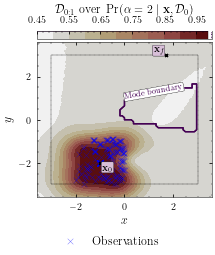

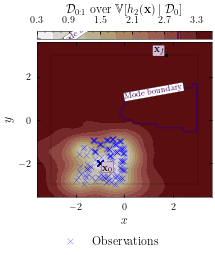

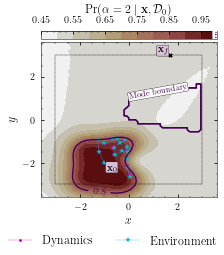

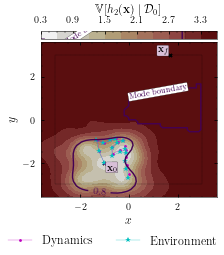

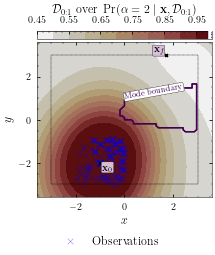

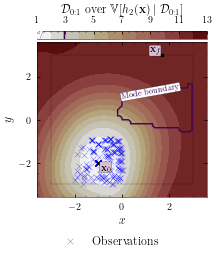

Optimisation result:
     fun: 267.14404087285254
     jac: array([-36.55999889, -28.83578794, -35.05903665, -28.70703808,
       -34.60197978, -30.22720966, -32.4291492 , -30.12355899,
       -32.03934738, -22.92227131, -33.80207945, -25.8142284 ,
       -33.13964151, -25.1675654 , -29.20303685, -13.75340422,
       -30.22323178, -14.03067834, -31.29158542, -15.75934358,
       -31.16522627, -16.66175151, -19.93562045,  -9.57428062,
       -11.71677457,  -2.35154268,  -4.57387051,   0.2653643 ,
        -4.7415216 ,   0.19937737])
 message: 'Optimization terminated successfully'
    nfev: 66
     nit: 37
    njev: 37
  status: 0
 success: True
       x: array([-0.4112549 ,  4.43578567, -1.70312971,  4.12432855,  0.9543614 ,
        4.27019765, -0.62985511,  3.95788994, -1.184781  ,  0.87627332,
        3.59819215,  2.71845317,  2.56316521,  1.1884661 , -0.02685517,
       -0.02193456,  0.41958287, -0.68737461,  2.19332194,  1.51246098,
        1.58355606,  1.97881265, -0.92569721,  2.6

2022-04-22 12:33:31.010760: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 12:33:31.010776: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


3/3 [==============================] - 2s 971ms/step - loss: -810.0965 - val_loss: -364.9558


2022-04-22 12:33:32.371311: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 12:33:32.379564: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 12:33:32.385070: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_12_33_32

2022-04-22 12:33:32.389581: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_12_33_32/dr-robots-mbp.local.trace.json.gz
2022-04-22 12:33:32.405661: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_12_33_32

2022-04-22 12:33:32.405846: I tensorflow/core/profiler/rpc/client/s

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_2_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 17ms/step - loss: -814.5808 - val_loss: -145.5765
Epoch 3/20000
3/3 [==============================] - 0s 18ms/step - loss: -801.4871 - val_loss: 190.0793
Epoch 4/20000
3/3 [==============================] - 0s 17ms/step - loss: -847.7774 - val_loss: 44.7820
Epoch 5/20000
3/3 [==============================] - 0s 17ms/step - loss: -829.2298 - val_loss: -478.8265
Epoch 6/20000
3/3 [==============================] - 0s 17ms/step - loss: -821.4607 - val_loss: -454.7757
Epoch 7/20000
3/3 [==============================] - 0s 17ms/step - loss: -812.5296 - val_loss: -147.7961
Epoch 8/20000
3/3 [==============================] - 0s 17ms/step - loss: -789.3508 - val_loss: -517.4319
Epoch 9/20000
3/3 [==============================] - 0s 17ms/step - loss: -792.9745 - val_loss: -560.4323
Epoch 10/20000
3/3 [==============================] - 0s 17ms/step - loss: -818.0120 - val_loss: -392.0759
Epoch 11/20000
3/3 [============================

3/3 [==============================] - 0s 17ms/step - loss: -815.4536 - val_loss: -534.5076
Epoch 77/20000
3/3 [==============================] - 0s 17ms/step - loss: -781.7350 - val_loss: -486.7207
Epoch 78/20000
3/3 [==============================] - 0s 17ms/step - loss: -839.5055 - val_loss: -319.6642
Epoch 79/20000
3/3 [==============================] - 0s 17ms/step - loss: -817.3897 - val_loss: -455.7407
Epoch 80/20000
3/3 [==============================] - 0s 17ms/step - loss: -837.9203 - val_loss: -10.3438
Epoch 81/20000
3/3 [==============================] - 0s 17ms/step - loss: -859.8187 - val_loss: -640.9057
Epoch 82/20000
3/3 [==============================] - 0s 19ms/step - loss: -882.6352 - val_loss: -410.1209
Epoch 83/20000
3/3 [==============================] - 0s 17ms/step - loss: -854.4254 - val_loss: -607.8467
Epoch 84/20000
3/3 [==============================] - 0s 17ms/step - loss: -904.1444 - val_loss: -658.6890
Epoch 85/20000
3/3 [==============================] -

3/3 [==============================] - 0s 20ms/step - loss: -905.3712 - val_loss: -664.5139
Epoch 153/20000
3/3 [==============================] - 0s 20ms/step - loss: -920.7564 - val_loss: -704.0953
Epoch 154/20000
3/3 [==============================] - 0s 20ms/step - loss: -880.9934 - val_loss: -686.9607
Epoch 155/20000
3/3 [==============================] - 0s 20ms/step - loss: -938.9401 - val_loss: -614.9406
Epoch 156/20000
3/3 [==============================] - 0s 20ms/step - loss: -909.7632 - val_loss: -727.1372
Epoch 157/20000
3/3 [==============================] - 0s 20ms/step - loss: -950.3755 - val_loss: -648.4877
Epoch 158/20000
3/3 [==============================] - 0s 20ms/step - loss: -947.0701 - val_loss: -582.5319
Epoch 159/20000
3/3 [==============================] - 0s 20ms/step - loss: -957.1672 - val_loss: -734.3200
Epoch 160/20000
3/3 [==============================] - 0s 20ms/step - loss: -951.3850 - val_loss: -736.6499
Epoch 161/20000
3/3 [=======================

3/3 [==============================] - 0s 20ms/step - loss: -765.3657 - val_loss: -426.8641
Epoch 229/20000
3/3 [==============================] - 0s 20ms/step - loss: -720.1461 - val_loss: -570.2896
Epoch 230/20000
3/3 [==============================] - 0s 20ms/step - loss: -347.3605 - val_loss: -684.4329
Epoch 231/20000
3/3 [==============================] - 0s 20ms/step - loss: -714.7016 - val_loss: -627.3570
Epoch 232/20000
3/3 [==============================] - 0s 20ms/step - loss: -826.1070 - val_loss: -274.4615
Epoch 233/20000
3/3 [==============================] - 0s 20ms/step - loss: 329.4068 - val_loss: -628.4843
Epoch 234/20000
3/3 [==============================] - 0s 21ms/step - loss: -785.9242 - val_loss: -546.0137
Epoch 235/20000
3/3 [==============================] - 0s 20ms/step - loss: -803.9166 - val_loss: -463.6544
Epoch 236/20000
3/3 [==============================] - 0s 21ms/step - loss: -626.1826 - val_loss: -579.1249
Epoch 237/20000
3/3 [========================

3/3 [==============================] - 0s 21ms/step - loss: -808.9019 - val_loss: -719.3517
Epoch 305/20000
3/3 [==============================] - 0s 21ms/step - loss: -897.6836 - val_loss: -738.2362
Epoch 306/20000
3/3 [==============================] - 0s 20ms/step - loss: -934.6444 - val_loss: -691.1181
Epoch 307/20000
3/3 [==============================] - 0s 21ms/step - loss: -901.6239 - val_loss: -749.2883
Epoch 308/20000
3/3 [==============================] - 0s 21ms/step - loss: -965.9062 - val_loss: -574.1131
Epoch 309/20000
3/3 [==============================] - 0s 20ms/step - loss: -800.8323 - val_loss: -761.9702
Epoch 310/20000
3/3 [==============================] - 0s 21ms/step - loss: -800.3885 - val_loss: -692.2589
Epoch 311/20000
3/3 [==============================] - 0s 21ms/step - loss: -912.3562 - val_loss: -623.2425
Epoch 312/20000
3/3 [==============================] - 0s 21ms/step - loss: -909.3058 - val_loss: -724.5059
Epoch 313/20000
3/3 [=======================

3/3 [==============================] - 0s 22ms/step - loss: -826.0967 - val_loss: -525.4427
Epoch 381/20000
3/3 [==============================] - 0s 21ms/step - loss: -825.0445 - val_loss: -435.2839
Epoch 382/20000
3/3 [==============================] - 0s 21ms/step - loss: -793.8529 - val_loss: -566.3433
Epoch 383/20000
3/3 [==============================] - 0s 21ms/step - loss: -753.0798 - val_loss: -624.6488
Epoch 384/20000
3/3 [==============================] - 0s 21ms/step - loss: -693.7396 - val_loss: -280.8613
Epoch 385/20000
3/3 [==============================] - 0s 21ms/step - loss: -360.9228 - val_loss: -758.7504
Epoch 386/20000
3/3 [==============================] - 0s 22ms/step - loss: -847.1458 - val_loss: -458.6999
Epoch 387/20000
3/3 [==============================] - 0s 21ms/step - loss: -528.4202 - val_loss: -612.7904
Epoch 388/20000
3/3 [==============================] - 0s 22ms/step - loss: -735.2083 - val_loss: -336.3772
Epoch 389/20000
3/3 [=======================

3/3 [==============================] - 0s 21ms/step - loss: -890.9568 - val_loss: -609.5704
Epoch 457/20000
3/3 [==============================] - 0s 22ms/step - loss: -940.7878 - val_loss: -645.7925
Epoch 458/20000
3/3 [==============================] - 0s 21ms/step - loss: -843.9092 - val_loss: -635.0201
Epoch 459/20000
3/3 [==============================] - 0s 21ms/step - loss: -934.0868 - val_loss: -694.9680
Epoch 460/20000
3/3 [==============================] - 0s 22ms/step - loss: -938.0245 - val_loss: -637.9255
Epoch 461/20000
3/3 [==============================] - 0s 21ms/step - loss: -941.8481 - val_loss: -669.9615
Epoch 462/20000
3/3 [==============================] - 0s 22ms/step - loss: -934.0829 - val_loss: -651.8123
Epoch 463/20000
3/3 [==============================] - 0s 22ms/step - loss: -927.9903 - val_loss: -737.8983
Epoch 464/20000
3/3 [==============================] - 0s 22ms/step - loss: -962.2990 - val_loss: -676.0023
Epoch 465/20000
3/3 [=======================

Epoch 532/20000
3/3 [==============================] - 0s 21ms/step - loss: -975.9211 - val_loss: -685.8486
Epoch 533/20000
3/3 [==============================] - 0s 22ms/step - loss: -937.8781 - val_loss: -739.5142
Epoch 534/20000
3/3 [==============================] - 0s 28ms/step - loss: -840.1691 - val_loss: -584.5923
Epoch 535/20000
3/3 [==============================] - 0s 21ms/step - loss: -965.5192 - val_loss: -607.3129
Epoch 536/20000
3/3 [==============================] - 0s 21ms/step - loss: -964.2831 - val_loss: -694.9634
Epoch 537/20000
3/3 [==============================] - 0s 21ms/step - loss: -950.2833 - val_loss: -707.2082
Epoch 538/20000
3/3 [==============================] - 0s 21ms/step - loss: -986.4394 - val_loss: -664.6823
Epoch 539/20000
3/3 [==============================] - 0s 21ms/step - loss: -960.1869 - val_loss: -688.0071
Epoch 540/20000
3/3 [==============================] - 0s 21ms/step - loss: -932.1793 - val_loss: -668.5777
Epoch 541/20000
3/3 [=======

Epoch 608/20000
3/3 [==============================] - 0s 24ms/step - loss: -968.3859 - val_loss: -681.1839
Epoch 609/20000
3/3 [==============================] - 0s 23ms/step - loss: -903.7865 - val_loss: -716.9364
Epoch 610/20000
3/3 [==============================] - 0s 24ms/step - loss: -860.7436 - val_loss: -734.3171
Epoch 611/20000
3/3 [==============================] - 0s 25ms/step - loss: -896.6309 - val_loss: -766.9286
Epoch 612/20000
3/3 [==============================] - 0s 23ms/step - loss: -942.9468 - val_loss: -695.8613
Epoch 613/20000
3/3 [==============================] - 0s 23ms/step - loss: -935.2972 - val_loss: -688.5227
Epoch 614/20000
3/3 [==============================] - 0s 24ms/step - loss: -845.5472 - val_loss: -712.5189
Epoch 615/20000
3/3 [==============================] - 0s 24ms/step - loss: -734.8946 - val_loss: -438.7536
Epoch 616/20000
3/3 [==============================] - 0s 24ms/step - loss: -706.9214 - val_loss: -637.5489
Epoch 617/20000
3/3 [=======

Epoch 684/20000
3/3 [==============================] - 0s 22ms/step - loss: -951.8314 - val_loss: -679.3647
Epoch 685/20000
3/3 [==============================] - 0s 22ms/step - loss: -969.3188 - val_loss: -722.9716
Epoch 686/20000
3/3 [==============================] - 0s 22ms/step - loss: -978.9754 - val_loss: -681.8324
Epoch 687/20000
3/3 [==============================] - 0s 22ms/step - loss: -902.3739 - val_loss: -753.6518
Epoch 688/20000
3/3 [==============================] - 0s 22ms/step - loss: -951.5858 - val_loss: -728.0565
Epoch 689/20000
3/3 [==============================] - 0s 22ms/step - loss: -920.5312 - val_loss: -573.0670
Epoch 690/20000
3/3 [==============================] - 0s 22ms/step - loss: -947.7812 - val_loss: -676.1552
Epoch 691/20000
3/3 [==============================] - 0s 22ms/step - loss: -891.2674 - val_loss: -745.1017
Epoch 692/20000
3/3 [==============================] - 0s 22ms/step - loss: -966.2461 - val_loss: -715.7550
Epoch 693/20000
3/3 [=======

Epoch 760/20000
3/3 [==============================] - 0s 22ms/step - loss: -914.5376 - val_loss: -607.5230
Epoch 761/20000
3/3 [==============================] - 0s 22ms/step - loss: -835.9265 - val_loss: -595.7469
Epoch 762/20000
3/3 [==============================] - 0s 22ms/step - loss: -943.1073 - val_loss: -663.5021
Epoch 763/20000
3/3 [==============================] - 0s 23ms/step - loss: -905.9233 - val_loss: -633.5578
Epoch 764/20000
3/3 [==============================] - 0s 22ms/step - loss: -953.1525 - val_loss: -657.6842
Epoch 765/20000
3/3 [==============================] - 0s 22ms/step - loss: -958.1137 - val_loss: -623.8322
Epoch 766/20000
3/3 [==============================] - 0s 22ms/step - loss: -939.3299 - val_loss: -646.8323
Epoch 767/20000
3/3 [==============================] - 0s 22ms/step - loss: -956.3457 - val_loss: -586.7921
Epoch 768/20000
3/3 [==============================] - 0s 22ms/step - loss: -927.2325 - val_loss: -673.0060
Epoch 769/20000
3/3 [=======

Epoch 836/20000
3/3 [==============================] - 0s 23ms/step - loss: -969.7955 - val_loss: -655.6122
Epoch 837/20000
3/3 [==============================] - 0s 24ms/step - loss: -984.5186 - val_loss: -641.8681
Epoch 838/20000
3/3 [==============================] - 0s 23ms/step - loss: -954.6535 - val_loss: -631.1671
Epoch 839/20000
3/3 [==============================] - 0s 24ms/step - loss: -943.2879 - val_loss: -610.0609
Epoch 840/20000
3/3 [==============================] - 0s 24ms/step - loss: -945.7792 - val_loss: -633.4340
Epoch 841/20000
3/3 [==============================] - 0s 24ms/step - loss: -934.4867 - val_loss: -499.0973
Epoch 842/20000
3/3 [==============================] - 0s 24ms/step - loss: -899.6996 - val_loss: -454.0086
Epoch 843/20000
3/3 [==============================] - 0s 23ms/step - loss: -900.4906 - val_loss: -619.0297
Epoch 844/20000
3/3 [==============================] - 0s 24ms/step - loss: -947.4051 - val_loss: -593.0487
Epoch 845/20000
3/3 [=======

Epoch 912/20000
3/3 [==============================] - 0s 23ms/step - loss: -893.3696 - val_loss: -400.6484
Epoch 913/20000
3/3 [==============================] - 0s 22ms/step - loss: -857.0638 - val_loss: -478.2955
Epoch 914/20000
3/3 [==============================] - 0s 23ms/step - loss: -925.0918 - val_loss: -432.6284
Epoch 915/20000
3/3 [==============================] - 0s 24ms/step - loss: -883.0827 - val_loss: -409.4257
Epoch 916/20000
3/3 [==============================] - 0s 23ms/step - loss: -831.9810 - val_loss: -183.3928
Epoch 917/20000
3/3 [==============================] - 0s 23ms/step - loss: -949.9292 - val_loss: -232.0856
Epoch 918/20000
3/3 [==============================] - 0s 22ms/step - loss: -782.8319 - val_loss: -311.6593
Epoch 919/20000
3/3 [==============================] - 0s 24ms/step - loss: -777.7591 - val_loss: -301.8643
Epoch 920/20000
3/3 [==============================] - 0s 24ms/step - loss: -898.4492 - val_loss: -409.4317
Epoch 921/20000
3/3 [=======

Epoch 988/20000
3/3 [==============================] - 0s 23ms/step - loss: -989.9806 - val_loss: -375.0315
Epoch 989/20000
3/3 [==============================] - 0s 22ms/step - loss: -966.7799 - val_loss: -343.8317
Epoch 990/20000
3/3 [==============================] - 0s 23ms/step - loss: -999.2233 - val_loss: -379.0372
Epoch 991/20000
3/3 [==============================] - 0s 22ms/step - loss: -986.4073 - val_loss: -299.9208
Epoch 992/20000
3/3 [==============================] - 0s 23ms/step - loss: -1001.5053 - val_loss: -340.7456
Epoch 993/20000
3/3 [==============================] - 0s 23ms/step - loss: -1024.6516 - val_loss: -291.5482
Epoch 994/20000
3/3 [==============================] - 0s 22ms/step - loss: -980.0027 - val_loss: -351.9904
Epoch 995/20000
3/3 [==============================] - 0s 23ms/step - loss: -961.8659 - val_loss: -342.6862
Epoch 996/20000
3/3 [==============================] - 0s 23ms/step - loss: -1025.4197 - val_loss: -297.2040
Epoch 997/20000
3/3 [====

3/3 [==============================] - 0s 25ms/step - loss: -947.2661 - val_loss: -149.9376
Epoch 1064/20000
3/3 [==============================] - 0s 27ms/step - loss: -941.0107 - val_loss: 108.6559
Epoch 1065/20000
3/3 [==============================] - 0s 25ms/step - loss: -989.2653 - val_loss: -86.0469
Epoch 1066/20000
3/3 [==============================] - 0s 25ms/step - loss: -940.0596 - val_loss: -106.7664
Epoch 1067/20000
3/3 [==============================] - 0s 27ms/step - loss: -863.1440 - val_loss: -3.5439
Epoch 1068/20000
3/3 [==============================] - 0s 23ms/step - loss: -901.0568 - val_loss: 1.5111
Epoch 1069/20000
3/3 [==============================] - 0s 24ms/step - loss: -777.8169 - val_loss: 148.9813
Epoch 1070/20000
3/3 [==============================] - 0s 25ms/step - loss: -780.6399 - val_loss: 130.7467
Epoch 1071/20000
3/3 [==============================] - 0s 25ms/step - loss: -842.3552 - val_loss: -34.5458
Epoch 1072/20000
3/3 [========================

3/3 [==============================] - 0s 22ms/step - loss: -906.6933 - val_loss: 118.5439
Epoch 1140/20000
3/3 [==============================] - 0s 22ms/step - loss: -895.7276 - val_loss: 87.6987
Epoch 1141/20000
3/3 [==============================] - 0s 23ms/step - loss: -895.5925 - val_loss: 23.6809
Epoch 1142/20000
3/3 [==============================] - 0s 23ms/step - loss: -921.6332 - val_loss: 77.3222
Epoch 1143/20000
3/3 [==============================] - 0s 23ms/step - loss: -884.5259 - val_loss: 50.9483
Epoch 1144/20000
3/3 [==============================] - 0s 24ms/step - loss: -929.2261 - val_loss: 60.0313
Epoch 1145/20000
3/3 [==============================] - 0s 23ms/step - loss: -909.7134 - val_loss: 132.3863
Epoch 1146/20000
3/3 [==============================] - 0s 23ms/step - loss: -790.2584 - val_loss: 73.9291
Epoch 1147/20000
3/3 [==============================] - 0s 23ms/step - loss: -887.9372 - val_loss: 115.6752
Epoch 1148/20000
3/3 [=============================

3/3 [==============================] - 0s 22ms/step - loss: -864.6395 - val_loss: 261.1837
Epoch 1216/20000
3/3 [==============================] - 0s 23ms/step - loss: -954.8132 - val_loss: 216.0878
Epoch 1217/20000
3/3 [==============================] - 0s 23ms/step - loss: -959.1550 - val_loss: 295.8522
Epoch 1218/20000
3/3 [==============================] - 0s 23ms/step - loss: -973.7923 - val_loss: 245.8092
Epoch 1219/20000
3/3 [==============================] - 0s 22ms/step - loss: -948.1869 - val_loss: 263.5655
Epoch 1220/20000
3/3 [==============================] - 0s 23ms/step - loss: -974.1582 - val_loss: 248.8555
Epoch 1221/20000
3/3 [==============================] - 0s 23ms/step - loss: -915.5515 - val_loss: 205.8116
Epoch 1222/20000
3/3 [==============================] - 0s 22ms/step - loss: -954.9132 - val_loss: 239.3881
Epoch 1223/20000
3/3 [==============================] - 0s 22ms/step - loss: -994.5537 - val_loss: 301.1889
Epoch 1224/20000
3/3 [=======================

Epoch 1291/20000
3/3 [==============================] - 0s 25ms/step - loss: -937.5067 - val_loss: 311.8763
Epoch 1292/20000
3/3 [==============================] - 0s 24ms/step - loss: -998.7749 - val_loss: 363.5222
Epoch 1293/20000
3/3 [==============================] - 0s 25ms/step - loss: -869.1280 - val_loss: 266.3237
Epoch 1294/20000
3/3 [==============================] - 0s 24ms/step - loss: -979.1352 - val_loss: 249.5424
Epoch 1295/20000
3/3 [==============================] - 0s 25ms/step - loss: -810.4926 - val_loss: 245.5672
Epoch 1296/20000
3/3 [==============================] - 0s 24ms/step - loss: -900.3712 - val_loss: 418.9534
Epoch 1297/20000
3/3 [==============================] - 0s 24ms/step - loss: -888.5825 - val_loss: 435.8895
Epoch 1298/20000
3/3 [==============================] - 0s 23ms/step - loss: -890.7952 - val_loss: 265.4595
Epoch 1299/20000
3/3 [==============================] - 0s 25ms/step - loss: -967.1914 - val_loss: 203.6929
Epoch 1300/20000
3/3 [======

3/3 [==============================] - 0s 23ms/step - loss: -772.1316 - val_loss: 373.3445
Epoch 1367/20000
3/3 [==============================] - 0s 22ms/step - loss: -843.4268 - val_loss: 235.9893
Epoch 1368/20000
3/3 [==============================] - 0s 23ms/step - loss: -460.5852 - val_loss: 432.1982
Epoch 1369/20000
3/3 [==============================] - 0s 23ms/step - loss: -829.5072 - val_loss: 372.8713
Epoch 1370/20000
3/3 [==============================] - 0s 23ms/step - loss: -799.1012 - val_loss: 475.5219
Epoch 1371/20000
3/3 [==============================] - 0s 23ms/step - loss: -885.9452 - val_loss: 335.2419
Epoch 1372/20000
3/3 [==============================] - 0s 22ms/step - loss: -964.6450 - val_loss: 524.1624
Epoch 1373/20000
3/3 [==============================] - 0s 23ms/step - loss: -860.8282 - val_loss: 397.8222
Epoch 1374/20000
3/3 [==============================] - 0s 23ms/step - loss: -970.5257 - val_loss: 431.0294
Epoch 1375/20000
3/3 [=======================

Epoch 1442/20000
3/3 [==============================] - 0s 21ms/step - loss: -928.7533 - val_loss: -184.0026
Epoch 1443/20000
3/3 [==============================] - 0s 22ms/step - loss: -922.9047 - val_loss: -194.0671
Epoch 1444/20000
3/3 [==============================] - 0s 22ms/step - loss: -953.7951 - val_loss: -168.0913
Epoch 1445/20000
3/3 [==============================] - 0s 22ms/step - loss: -940.9007 - val_loss: -178.1022
Epoch 1446/20000
3/3 [==============================] - 0s 22ms/step - loss: -950.5225 - val_loss: -106.7862
Epoch 1447/20000
3/3 [==============================] - 0s 22ms/step - loss: -963.5733 - val_loss: -100.8015
Epoch 1448/20000
3/3 [==============================] - 0s 22ms/step - loss: -965.1573 - val_loss: -164.9555
Epoch 1449/20000
3/3 [==============================] - 0s 22ms/step - loss: -977.3244 - val_loss: -200.3050
Epoch 1450/20000
3/3 [==============================] - 0s 22ms/step - loss: -971.6612 - val_loss: -204.8216
Epoch 1451/20000
3/

3/3 [==============================] - 0s 21ms/step - loss: -978.3429 - val_loss: -91.5504
Epoch 1518/20000
3/3 [==============================] - 0s 21ms/step - loss: -1029.6475 - val_loss: -146.3112
Epoch 1519/20000
3/3 [==============================] - 0s 21ms/step - loss: -1004.5013 - val_loss: -163.1875
Epoch 1520/20000
3/3 [==============================] - 0s 21ms/step - loss: -937.0104 - val_loss: -147.2775
Epoch 1521/20000
3/3 [==============================] - 0s 22ms/step - loss: -1033.9423 - val_loss: 25.9887
Epoch 1522/20000
3/3 [==============================] - 0s 25ms/step - loss: -985.0588 - val_loss: 27.3065
Epoch 1523/20000
3/3 [==============================] - 0s 22ms/step - loss: -860.4256 - val_loss: 13.0804
Epoch 1524/20000
3/3 [==============================] - 0s 22ms/step - loss: -802.7375 - val_loss: -93.9273
Epoch 1525/20000
3/3 [==============================] - 0s 23ms/step - loss: -999.1601 - val_loss: -33.1536
Epoch 1526/20000
3/3 [====================

3/3 [==============================] - 0s 21ms/step - loss: -989.0115 - val_loss: 42.1931
Epoch 1594/20000
3/3 [==============================] - 0s 21ms/step - loss: -1000.7687 - val_loss: -39.6573
Epoch 1595/20000
3/3 [==============================] - 0s 21ms/step - loss: -1029.8726 - val_loss: 22.5922
Epoch 1596/20000
3/3 [==============================] - 0s 21ms/step - loss: -987.0162 - val_loss: 155.6415
Epoch 1597/20000
3/3 [==============================] - 0s 21ms/step - loss: -1025.7262 - val_loss: -41.4924
Epoch 1598/20000
3/3 [==============================] - 0s 21ms/step - loss: -1008.3899 - val_loss: 4.8602
Epoch 1599/20000
3/3 [==============================] - 0s 22ms/step - loss: -968.0254 - val_loss: 55.1967
Epoch 1600/20000
3/3 [==============================] - 0s 31ms/step - loss: -1014.6054 - val_loss: 63.2190
Epoch 1601/20000
3/3 [==============================] - 0s 21ms/step - loss: -1025.9086 - val_loss: 6.0121
Epoch 1602/20000
3/3 [=========================

3/3 [==============================] - 0s 21ms/step - loss: -892.1288 - val_loss: -529.4923
Epoch 1669/20000
3/3 [==============================] - 0s 21ms/step - loss: -872.2888 - val_loss: 305.2691
Epoch 1670/20000
3/3 [==============================] - 0s 22ms/step - loss: -898.2429 - val_loss: -369.7366
Epoch 1671/20000
3/3 [==============================] - 0s 21ms/step - loss: -888.3071 - val_loss: -312.2173
Epoch 1672/20000
3/3 [==============================] - 0s 21ms/step - loss: -903.5889 - val_loss: -303.0397
Epoch 1673/20000
3/3 [==============================] - 0s 21ms/step - loss: -913.0720 - val_loss: 226.0931
Epoch 1674/20000
3/3 [==============================] - 0s 21ms/step - loss: -924.3173 - val_loss: 79.5476
Epoch 1675/20000
3/3 [==============================] - 0s 21ms/step - loss: -841.3705 - val_loss: 197.5713
Epoch 1676/20000
3/3 [==============================] - 0s 21ms/step - loss: -857.2219 - val_loss: -635.7778
Epoch 1677/20000
3/3 [===================

3/3 [==============================] - 0s 22ms/step - loss: -929.9159 - val_loss: -459.3944
Epoch 1744/20000
3/3 [==============================] - 0s 21ms/step - loss: -913.8942 - val_loss: -604.1712
Epoch 1745/20000
3/3 [==============================] - 0s 21ms/step - loss: -893.0356 - val_loss: -708.0180
Epoch 1746/20000
3/3 [==============================] - 0s 21ms/step - loss: -904.0197 - val_loss: -746.4763
Epoch 1747/20000
3/3 [==============================] - 0s 21ms/step - loss: -877.7840 - val_loss: -672.5655
Epoch 1748/20000
3/3 [==============================] - 0s 23ms/step - loss: -917.1869 - val_loss: -240.5261
Epoch 1749/20000
3/3 [==============================] - 0s 21ms/step - loss: -945.8915 - val_loss: -371.3569
Epoch 1750/20000
3/3 [==============================] - 0s 21ms/step - loss: -911.2330 - val_loss: -340.2635
Epoch 1751/20000
3/3 [==============================] - 0s 20ms/step - loss: -879.0898 - val_loss: -696.3813
Epoch 1752/20000
3/3 [==============

3/3 [==============================] - 0s 23ms/step - loss: -932.9869 - val_loss: -493.9001
Epoch 1819/20000
3/3 [==============================] - 0s 22ms/step - loss: -864.6635 - val_loss: -746.6460
Epoch 1820/20000
3/3 [==============================] - 0s 22ms/step - loss: -915.0524 - val_loss: -717.8774
Epoch 1821/20000
3/3 [==============================] - 0s 23ms/step - loss: -903.3274 - val_loss: -661.0779
Epoch 1822/20000
3/3 [==============================] - 0s 22ms/step - loss: -658.9085 - val_loss: -651.4445
Epoch 1823/20000
3/3 [==============================] - 0s 22ms/step - loss: -853.4334 - val_loss: -602.5399
Epoch 1824/20000
3/3 [==============================] - 0s 23ms/step - loss: -913.9587 - val_loss: -746.0743
Epoch 1825/20000
3/3 [==============================] - 0s 22ms/step - loss: -946.5702 - val_loss: -633.8289
Epoch 1826/20000
3/3 [==============================] - 0s 22ms/step - loss: -846.7947 - val_loss: -616.9261
Epoch 1827/20000
3/3 [==============

3/3 [==============================] - 0s 22ms/step - loss: -752.0941 - val_loss: -764.2259
Epoch 1894/20000
3/3 [==============================] - 0s 21ms/step - loss: -679.3865 - val_loss: -659.7279
Epoch 1895/20000
3/3 [==============================] - 0s 22ms/step - loss: -884.6840 - val_loss: -524.6213
Epoch 1896/20000
3/3 [==============================] - 0s 23ms/step - loss: -885.9451 - val_loss: -566.2367
Epoch 1897/20000
3/3 [==============================] - 0s 22ms/step - loss: -774.8110 - val_loss: -603.5734
Epoch 1898/20000
3/3 [==============================] - 0s 22ms/step - loss: -567.5740 - val_loss: 1204.2179
Epoch 1899/20000
3/3 [==============================] - 0s 22ms/step - loss: -724.2986 - val_loss: -568.9058
Epoch 1900/20000
3/3 [==============================] - 0s 22ms/step - loss: -650.6601 - val_loss: -27.5997
Epoch 1901/20000
3/3 [==============================] - 0s 22ms/step - loss: -781.0103 - val_loss: -577.7597
Epoch 1902/20000
3/3 [===============

3/3 [==============================] - 0s 22ms/step - loss: -807.9971 - val_loss: -452.7795
Epoch 1969/20000
3/3 [==============================] - 0s 22ms/step - loss: -717.8861 - val_loss: 42.1974
Epoch 1970/20000
3/3 [==============================] - 0s 21ms/step - loss: -711.9209 - val_loss: -458.9912
Epoch 1971/20000
3/3 [==============================] - 0s 22ms/step - loss: -747.4304 - val_loss: -494.0094
Epoch 1972/20000
3/3 [==============================] - 0s 22ms/step - loss: -782.5028 - val_loss: -420.0458
Epoch 1973/20000
3/3 [==============================] - 0s 22ms/step - loss: -801.5088 - val_loss: -660.6514
Epoch 1974/20000
3/3 [==============================] - 0s 21ms/step - loss: -814.5367 - val_loss: -645.0998
Epoch 1975/20000
3/3 [==============================] - 0s 22ms/step - loss: -779.7059 - val_loss: -448.5613
Epoch 1976/20000
3/3 [==============================] - 0s 22ms/step - loss: -794.7616 - val_loss: -602.0012
Epoch 1977/20000
3/3 [================

/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2002/20000
3/3 [==============================] - 0s 20ms/step - loss: -783.0233 - val_loss: -679.4094
Epoch 2003/20000
3/3 [==============================] - 0s 19ms/step - loss: -834.4490 - val_loss: -536.4379
Epoch 2004/20000
3/3 [==============================] - 0s 19ms/step - loss: -790.2099 - val_loss: -484.5999
Epoch 2005/20000
3/3 [==============================] - 0s 18ms/step - loss: -800.1622 - val_loss: -537.7199
Epoch 2006/20000
3/3 [==============================] - 0s 18ms/step - loss: -832.6159 - val_loss: -348.3799
Epoch 2007/20000
3/3 [==============================] - 0s 19ms/step - loss: -771.9405 - val_loss: -660.2850
Epoch 2008/20000
3/3 [==============================] - 0s 19ms/step - loss: -722.5010 - val_loss: -637.5783
Epoch 2009/20000
3/3 [==============================] - 0s 18ms/step - loss: -728.9325 - val_loss: -630.2207
Epoch 2010/20000
3/3 [==============================] - 0s 19ms/step - loss: -829.2990 - val_loss: -510.7339
Epoch 2011/20000
3/

3/3 [==============================] - 0s 19ms/step - loss: -853.7946 - val_loss: -621.3232
Epoch 2078/20000
3/3 [==============================] - 0s 19ms/step - loss: -699.6140 - val_loss: -605.7673
Epoch 2079/20000
3/3 [==============================] - 0s 20ms/step - loss: -856.4313 - val_loss: -416.7619
Epoch 2080/20000
3/3 [==============================] - 0s 19ms/step - loss: -785.1394 - val_loss: -307.9408
Epoch 2081/20000
3/3 [==============================] - 0s 19ms/step - loss: -844.5622 - val_loss: -519.0980
Epoch 2082/20000
3/3 [==============================] - 0s 19ms/step - loss: -774.1042 - val_loss: -661.5608
Epoch 2083/20000
3/3 [==============================] - 0s 18ms/step - loss: -810.9136 - val_loss: -546.5747
Epoch 2084/20000
3/3 [==============================] - 0s 19ms/step - loss: -755.9451 - val_loss: -218.1333
Epoch 2085/20000
3/3 [==============================] - 0s 18ms/step - loss: -851.8724 - val_loss: -631.8487
Epoch 2086/20000
3/3 [==============

3/3 [==============================] - 0s 20ms/step - loss: -817.8754 - val_loss: -683.8943
Epoch 2153/20000
3/3 [==============================] - 0s 20ms/step - loss: -807.8980 - val_loss: -597.2776
Epoch 2154/20000
3/3 [==============================] - 0s 20ms/step - loss: -744.7971 - val_loss: -333.1739
Epoch 2155/20000
3/3 [==============================] - 0s 20ms/step - loss: -944.9235 - val_loss: -623.9797
Epoch 2156/20000
3/3 [==============================] - 0s 20ms/step - loss: -889.2772 - val_loss: -518.2513
Epoch 2157/20000
3/3 [==============================] - 0s 20ms/step - loss: -651.7254 - val_loss: -441.8556
Epoch 2158/20000
3/3 [==============================] - 0s 20ms/step - loss: -872.3217 - val_loss: -686.0966
Epoch 2159/20000
3/3 [==============================] - 0s 20ms/step - loss: -597.0300 - val_loss: 711.3513
Epoch 2160/20000
3/3 [==============================] - 0s 20ms/step - loss: 137.5963 - val_loss: -717.3463
Epoch 2161/20000
3/3 [================

3/3 [==============================] - 0s 20ms/step - loss: -396.8010 - val_loss: -516.0364
Epoch 2228/20000
3/3 [==============================] - 0s 20ms/step - loss: -744.5139 - val_loss: -110.2298
Epoch 2229/20000
3/3 [==============================] - 0s 20ms/step - loss: -129.7645 - val_loss: -603.2219
Epoch 2230/20000
3/3 [==============================] - 0s 20ms/step - loss: -754.9849 - val_loss: -44.4871
Epoch 2231/20000
3/3 [==============================] - 0s 21ms/step - loss: -656.7316 - val_loss: -169.8870
Epoch 2232/20000
3/3 [==============================] - 0s 20ms/step - loss: -349.6208 - val_loss: -124.6022
Epoch 2233/20000
3/3 [==============================] - 0s 20ms/step - loss: -678.3842 - val_loss: -593.7141
Epoch 2234/20000
3/3 [==============================] - 0s 20ms/step - loss: -701.1375 - val_loss: -514.4957
Epoch 2235/20000
3/3 [==============================] - 0s 21ms/step - loss: -670.6075 - val_loss: -555.0178
Epoch 2236/20000
3/3 [===============

3/3 [==============================] - 0s 22ms/step - loss: -609.0822 - val_loss: -618.0990
Epoch 2303/20000
3/3 [==============================] - 0s 22ms/step - loss: -955.1601 - val_loss: -736.1732
Epoch 2304/20000
3/3 [==============================] - 0s 22ms/step - loss: -862.7714 - val_loss: -655.9762
Epoch 2305/20000
3/3 [==============================] - 0s 22ms/step - loss: -852.5208 - val_loss: -581.6319
Epoch 2306/20000
3/3 [==============================] - 0s 23ms/step - loss: -869.4888 - val_loss: -548.0177
Epoch 2307/20000
3/3 [==============================] - 0s 22ms/step - loss: -814.4384 - val_loss: -683.4878
Epoch 2308/20000
3/3 [==============================] - 0s 21ms/step - loss: -912.9398 - val_loss: -383.9186
Epoch 2309/20000
3/3 [==============================] - 0s 21ms/step - loss: -669.2141 - val_loss: -576.4529
Epoch 2310/20000
3/3 [==============================] - 0s 21ms/step - loss: -837.6038 - val_loss: -578.4890
Epoch 2311/20000
3/3 [==============

3/3 [==============================] - 0s 21ms/step - loss: -841.1183 - val_loss: -646.9633
Epoch 2378/20000
3/3 [==============================] - 0s 21ms/step - loss: -851.2109 - val_loss: -591.7286
Epoch 2379/20000
3/3 [==============================] - 0s 21ms/step - loss: -759.7796 - val_loss: -560.9779
Epoch 2380/20000
3/3 [==============================] - 0s 21ms/step - loss: -865.0310 - val_loss: -369.5649
Epoch 2381/20000
3/3 [==============================] - 0s 22ms/step - loss: -690.2139 - val_loss: -223.4676
Epoch 2382/20000
3/3 [==============================] - 0s 21ms/step - loss: -673.3336 - val_loss: -647.0702
Epoch 2383/20000
3/3 [==============================] - 0s 22ms/step - loss: -762.6609 - val_loss: -632.2752
Epoch 2384/20000
3/3 [==============================] - 0s 21ms/step - loss: -706.1716 - val_loss: -642.1165
Epoch 2385/20000
3/3 [==============================] - 0s 21ms/step - loss: -808.2065 - val_loss: -633.5576
Epoch 2386/20000
3/3 [==============

3/3 [==============================] - 0s 21ms/step - loss: -952.2173 - val_loss: -569.0561
Epoch 2453/20000
3/3 [==============================] - 0s 21ms/step - loss: -928.7769 - val_loss: -737.7925
Epoch 2454/20000
3/3 [==============================] - 0s 22ms/step - loss: -966.5253 - val_loss: -759.8692
Epoch 2455/20000
3/3 [==============================] - 0s 21ms/step - loss: -975.7915 - val_loss: -777.1169
Epoch 2456/20000
3/3 [==============================] - 0s 20ms/step - loss: -976.5240 - val_loss: -725.1053
Epoch 2457/20000
3/3 [==============================] - 0s 21ms/step - loss: -983.6017 - val_loss: -714.6979
Epoch 2458/20000
3/3 [==============================] - 0s 21ms/step - loss: -949.3153 - val_loss: -720.4680
Epoch 2459/20000
3/3 [==============================] - 0s 21ms/step - loss: -1001.8087 - val_loss: -751.7276
Epoch 2460/20000
3/3 [==============================] - 0s 21ms/step - loss: -968.8941 - val_loss: -693.5090
Epoch 2461/20000
3/3 [=============

3/3 [==============================] - 0s 23ms/step - loss: -895.7354 - val_loss: -594.8103
Epoch 2528/20000
3/3 [==============================] - 0s 24ms/step - loss: -967.5085 - val_loss: -716.9897
Epoch 2529/20000
3/3 [==============================] - 0s 25ms/step - loss: -921.6776 - val_loss: -634.9605
Epoch 2530/20000
3/3 [==============================] - 0s 27ms/step - loss: -957.7849 - val_loss: -732.6291
Epoch 2531/20000
3/3 [==============================] - 0s 23ms/step - loss: -919.6291 - val_loss: -609.5814
Epoch 2532/20000
3/3 [==============================] - 0s 22ms/step - loss: -958.8845 - val_loss: -696.4748
Epoch 2533/20000
3/3 [==============================] - 0s 21ms/step - loss: -968.1205 - val_loss: -627.7384
Epoch 2534/20000
3/3 [==============================] - 0s 22ms/step - loss: -813.3864 - val_loss: -662.2216
Epoch 2535/20000
3/3 [==============================] - 0s 22ms/step - loss: -916.8757 - val_loss: -606.4766
Epoch 2536/20000
3/3 [==============

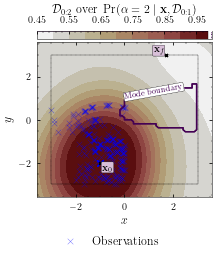

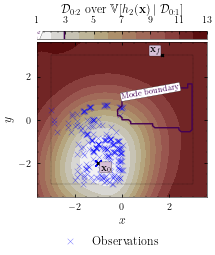

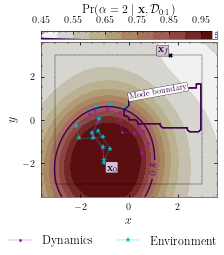

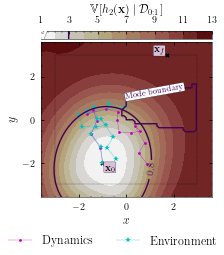

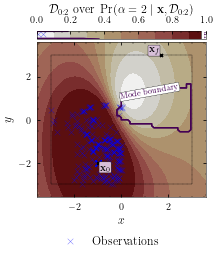

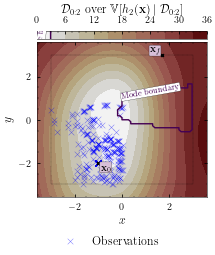

Optimisation result:
     fun: 244.50251792805005
     jac: array([-28.2813661 , -29.71164624, -27.27742225, -29.73663211,
       -27.51466411, -29.43945515, -26.93985828, -28.96423106,
       -28.91572081, -28.70961563, -28.88658453, -27.85651307,
       -28.9752162 , -25.52035879, -23.1937858 , -15.68399475,
       -24.60802434, -15.91649705, -20.33482569, -11.64917567,
       -21.27972618, -12.39364199, -19.35149129, -10.81903507,
       -17.93306852,  -9.87333749,  -5.77466427,  -2.02101047,
        -5.80446296,  -2.09267509])
 message: 'Optimization terminated successfully'
    nfev: 61
     nit: 34
    njev: 34
  status: 0
 success: True
       x: array([-0.66062795,  4.48322863, -2.51256451,  4.06635734, -2.17558611,
        4.48539418, -2.33193351,  3.7193825 ,  1.14497618,  4.40309517,
        1.31190438,  4.21082632,  1.94825921,  1.5106081 , -0.18773031,
       -0.19917732,  1.86690569,  0.74482217, -0.23972902, -0.72460734,
        2.10876144,  0.62298498,  1.57504325, -0.8

2022-04-22 12:37:29.490352: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 12:37:29.490368: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


3/3 [==============================] - 2s 888ms/step - loss: -825.2052 - val_loss: -354.4156


2022-04-22 12:37:30.681557: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 12:37:30.690423: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 12:37:30.696114: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_12_37_30

2022-04-22 12:37:30.700583: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_12_37_30/dr-robots-mbp.local.trace.json.gz
2022-04-22 12:37:30.717139: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_12_37_30

2022-04-22 12:37:30.717363: I tensorflow/core/profiler/rpc/client/s

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_3_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 18ms/step - loss: -422.6060 - val_loss: -334.9526
Epoch 3/20000
3/3 [==============================] - 0s 18ms/step - loss: -205.1315 - val_loss: -578.3711
Epoch 4/20000
3/3 [==============================] - 0s 17ms/step - loss: -717.5927 - val_loss: -652.2810
Epoch 5/20000
3/3 [==============================] - 0s 18ms/step - loss: -521.8251 - val_loss: -391.9963
Epoch 6/20000
3/3 [==============================] - 0s 17ms/step - loss: -743.1245 - val_loss: -525.5478
Epoch 7/20000
3/3 [==============================] - 0s 17ms/step - loss: -735.7099 - val_loss: -560.5192
Epoch 8/20000
3/3 [==============================] - 0s 17ms/step - loss: -787.3389 - val_loss: -486.5748
Epoch 9/20000
3/3 [==============================] - 0s 17ms/step - loss: -699.1639 - val_loss: -603.6616
Epoch 10/20000
3/3 [==============================] - 0s 17ms/step - loss: -695.4242 - val_loss: -646.6203
Epoch 11/20000
3/3 [=========================

3/3 [==============================] - 0s 20ms/step - loss: -642.4868 - val_loss: -684.2290
Epoch 77/20000
3/3 [==============================] - 0s 18ms/step - loss: -838.2429 - val_loss: -748.2615
Epoch 78/20000
3/3 [==============================] - 0s 18ms/step - loss: -890.6163 - val_loss: -656.4532
Epoch 79/20000
3/3 [==============================] - 0s 18ms/step - loss: -849.5388 - val_loss: -702.4336
Epoch 80/20000
3/3 [==============================] - 0s 20ms/step - loss: -839.6676 - val_loss: -725.0200
Epoch 81/20000
3/3 [==============================] - 0s 18ms/step - loss: -855.8404 - val_loss: -713.4700
Epoch 82/20000
3/3 [==============================] - 0s 18ms/step - loss: -815.6019 - val_loss: -704.4432
Epoch 83/20000
3/3 [==============================] - 0s 18ms/step - loss: -879.3121 - val_loss: -625.2090
Epoch 84/20000
3/3 [==============================] - 0s 19ms/step - loss: -867.9000 - val_loss: -733.0201
Epoch 85/20000
3/3 [==============================] 

3/3 [==============================] - 0s 20ms/step - loss: -804.2466 - val_loss: -295.3580
Epoch 153/20000
3/3 [==============================] - 0s 20ms/step - loss: -807.2975 - val_loss: -708.9009
Epoch 154/20000
3/3 [==============================] - 0s 21ms/step - loss: -835.1037 - val_loss: -697.7028
Epoch 155/20000
3/3 [==============================] - 0s 20ms/step - loss: -804.4663 - val_loss: -704.2806
Epoch 156/20000
3/3 [==============================] - 0s 21ms/step - loss: -864.3658 - val_loss: -526.6285
Epoch 157/20000
3/3 [==============================] - 0s 20ms/step - loss: -851.7165 - val_loss: -722.3976
Epoch 158/20000
3/3 [==============================] - 0s 21ms/step - loss: -875.6958 - val_loss: -658.7429
Epoch 159/20000
3/3 [==============================] - 0s 21ms/step - loss: -870.5988 - val_loss: -641.4186
Epoch 160/20000
3/3 [==============================] - 0s 20ms/step - loss: -793.8138 - val_loss: -713.4287
Epoch 161/20000
3/3 [=======================

3/3 [==============================] - 0s 21ms/step - loss: -846.8274 - val_loss: -709.2466
Epoch 229/20000
3/3 [==============================] - 0s 21ms/step - loss: -815.8157 - val_loss: -692.1043
Epoch 230/20000
3/3 [==============================] - 0s 21ms/step - loss: -891.8775 - val_loss: -703.0738
Epoch 231/20000
3/3 [==============================] - 0s 21ms/step - loss: -875.1964 - val_loss: -736.9331
Epoch 232/20000
3/3 [==============================] - 0s 21ms/step - loss: -770.5348 - val_loss: -693.8791
Epoch 233/20000
3/3 [==============================] - 0s 21ms/step - loss: -828.7725 - val_loss: -714.0196
Epoch 234/20000
3/3 [==============================] - 0s 21ms/step - loss: -869.1171 - val_loss: -725.4712
Epoch 235/20000
3/3 [==============================] - 0s 21ms/step - loss: -894.2739 - val_loss: -726.8644
Epoch 236/20000
3/3 [==============================] - 0s 20ms/step - loss: -914.2365 - val_loss: -737.2147
Epoch 237/20000
3/3 [=======================

3/3 [==============================] - 0s 21ms/step - loss: -831.0511 - val_loss: -707.2674
Epoch 305/20000
3/3 [==============================] - 0s 20ms/step - loss: -865.3921 - val_loss: -698.8761
Epoch 306/20000
3/3 [==============================] - 0s 22ms/step - loss: -826.8620 - val_loss: -619.1220
Epoch 307/20000
3/3 [==============================] - 0s 21ms/step - loss: -816.7514 - val_loss: -666.0216
Epoch 308/20000
3/3 [==============================] - 0s 21ms/step - loss: -854.2071 - val_loss: -744.4294
Epoch 309/20000
3/3 [==============================] - 0s 21ms/step - loss: -880.4531 - val_loss: -617.2635
Epoch 310/20000
3/3 [==============================] - 0s 21ms/step - loss: -872.6380 - val_loss: -728.8283
Epoch 311/20000
3/3 [==============================] - 0s 21ms/step - loss: -824.5551 - val_loss: -711.6035
Epoch 312/20000
3/3 [==============================] - 0s 21ms/step - loss: -922.9097 - val_loss: -765.8341
Epoch 313/20000
3/3 [=======================

3/3 [==============================] - 0s 23ms/step - loss: -938.0224 - val_loss: -741.8060
Epoch 381/20000
3/3 [==============================] - 0s 22ms/step - loss: -831.7711 - val_loss: -673.2713
Epoch 382/20000
3/3 [==============================] - 0s 22ms/step - loss: -826.3565 - val_loss: -778.3330
Epoch 383/20000
3/3 [==============================] - 0s 22ms/step - loss: -829.1725 - val_loss: -688.4429
Epoch 384/20000
3/3 [==============================] - 0s 22ms/step - loss: -931.4879 - val_loss: -737.6515
Epoch 385/20000
3/3 [==============================] - 0s 23ms/step - loss: -929.5799 - val_loss: -741.9236
Epoch 386/20000
3/3 [==============================] - 0s 23ms/step - loss: -848.3565 - val_loss: -651.5349
Epoch 387/20000
3/3 [==============================] - 0s 22ms/step - loss: -541.0658 - val_loss: -713.2619
Epoch 388/20000
3/3 [==============================] - 0s 23ms/step - loss: -855.5949 - val_loss: -754.2277
Epoch 389/20000
3/3 [=======================

3/3 [==============================] - 0s 23ms/step - loss: -801.3022 - val_loss: -758.6019
Epoch 457/20000
3/3 [==============================] - 0s 31ms/step - loss: -813.4018 - val_loss: -735.7507
Epoch 458/20000
3/3 [==============================] - 0s 23ms/step - loss: -866.6106 - val_loss: -811.8311
Epoch 459/20000
3/3 [==============================] - 0s 23ms/step - loss: -903.2226 - val_loss: -723.5634
Epoch 460/20000
3/3 [==============================] - 0s 23ms/step - loss: -934.5706 - val_loss: -765.2997
Epoch 461/20000
3/3 [==============================] - 0s 23ms/step - loss: -858.3763 - val_loss: -798.7216
Epoch 462/20000
3/3 [==============================] - 0s 22ms/step - loss: -955.9173 - val_loss: -827.9262
Epoch 463/20000
3/3 [==============================] - 0s 23ms/step - loss: -953.7714 - val_loss: -738.0494
Epoch 464/20000
3/3 [==============================] - 0s 22ms/step - loss: -861.9671 - val_loss: -644.2238
Epoch 465/20000
3/3 [=======================

3/3 [==============================] - 0s 22ms/step - loss: -754.1685 - val_loss: -676.3962
Epoch 533/20000
3/3 [==============================] - 0s 22ms/step - loss: -746.4199 - val_loss: -748.4906
Epoch 534/20000
3/3 [==============================] - 0s 22ms/step - loss: -710.1882 - val_loss: -650.9713
Epoch 535/20000
3/3 [==============================] - 0s 22ms/step - loss: -832.0228 - val_loss: -747.8070
Epoch 536/20000
3/3 [==============================] - 0s 21ms/step - loss: -787.1668 - val_loss: -701.3104
Epoch 537/20000
3/3 [==============================] - 0s 22ms/step - loss: -843.2348 - val_loss: -742.3179
Epoch 538/20000
3/3 [==============================] - 0s 21ms/step - loss: -837.7382 - val_loss: -646.2868
Epoch 539/20000
3/3 [==============================] - 0s 21ms/step - loss: -897.4965 - val_loss: -728.2117
Epoch 540/20000
3/3 [==============================] - 0s 22ms/step - loss: -832.5198 - val_loss: -650.2309
Epoch 541/20000
3/3 [=======================

Epoch 608/20000
3/3 [==============================] - 0s 22ms/step - loss: -836.7873 - val_loss: -726.8991
Epoch 609/20000
3/3 [==============================] - 0s 22ms/step - loss: -656.2868 - val_loss: -755.4410
Epoch 610/20000
3/3 [==============================] - 0s 23ms/step - loss: -806.4629 - val_loss: -552.1261
Epoch 611/20000
3/3 [==============================] - 0s 23ms/step - loss: -852.6619 - val_loss: -672.4887
Epoch 612/20000
3/3 [==============================] - 0s 22ms/step - loss: -811.2372 - val_loss: -704.8366
Epoch 613/20000
3/3 [==============================] - 0s 22ms/step - loss: -797.4117 - val_loss: -703.2984
Epoch 614/20000
3/3 [==============================] - 0s 22ms/step - loss: -901.9053 - val_loss: -756.0757
Epoch 615/20000
3/3 [==============================] - 0s 21ms/step - loss: -873.7322 - val_loss: -737.1014
Epoch 616/20000
3/3 [==============================] - 0s 22ms/step - loss: -763.4575 - val_loss: -728.9199
Epoch 617/20000
3/3 [=======

Epoch 684/20000
3/3 [==============================] - 0s 23ms/step - loss: -596.8377 - val_loss: -730.8934
Epoch 685/20000
3/3 [==============================] - 0s 22ms/step - loss: -821.8721 - val_loss: -702.5271
Epoch 686/20000
3/3 [==============================] - 0s 22ms/step - loss: -863.7921 - val_loss: -620.7446
Epoch 687/20000
3/3 [==============================] - 0s 22ms/step - loss: -862.4297 - val_loss: -634.2257
Epoch 688/20000
3/3 [==============================] - 0s 22ms/step - loss: -869.7048 - val_loss: -560.6465
Epoch 689/20000
3/3 [==============================] - 0s 22ms/step - loss: -867.7396 - val_loss: -773.1791
Epoch 690/20000
3/3 [==============================] - 0s 22ms/step - loss: -642.2259 - val_loss: -736.9979
Epoch 691/20000
3/3 [==============================] - 0s 22ms/step - loss: -891.8886 - val_loss: -683.5645
Epoch 692/20000
3/3 [==============================] - 0s 22ms/step - loss: -808.3797 - val_loss: -756.4462
Epoch 693/20000
3/3 [=======

Epoch 760/20000
3/3 [==============================] - 0s 22ms/step - loss: -912.6192 - val_loss: -791.3835
Epoch 761/20000
3/3 [==============================] - 0s 22ms/step - loss: -936.3925 - val_loss: -798.7850
Epoch 762/20000
3/3 [==============================] - 0s 27ms/step - loss: -896.8045 - val_loss: -798.5082
Epoch 763/20000
3/3 [==============================] - 0s 22ms/step - loss: -949.4003 - val_loss: -808.8199
Epoch 764/20000
3/3 [==============================] - 0s 21ms/step - loss: -944.7475 - val_loss: -700.1959
Epoch 765/20000
3/3 [==============================] - 0s 22ms/step - loss: -945.7158 - val_loss: -737.4381
Epoch 766/20000
3/3 [==============================] - 0s 22ms/step - loss: -909.9030 - val_loss: -756.8454
Epoch 767/20000
3/3 [==============================] - 0s 22ms/step - loss: -931.9669 - val_loss: -739.7415
Epoch 768/20000
3/3 [==============================] - 0s 22ms/step - loss: -812.6488 - val_loss: -866.4453
Epoch 769/20000
3/3 [=======

Epoch 836/20000
3/3 [==============================] - 0s 26ms/step - loss: -838.1280 - val_loss: -497.7352
Epoch 837/20000
3/3 [==============================] - 0s 24ms/step - loss: -744.9477 - val_loss: -723.7020
Epoch 838/20000
3/3 [==============================] - 0s 24ms/step - loss: -714.1542 - val_loss: -663.1049
Epoch 839/20000
3/3 [==============================] - 0s 24ms/step - loss: -868.7504 - val_loss: -795.2716
Epoch 840/20000
3/3 [==============================] - 0s 25ms/step - loss: -871.3711 - val_loss: -696.3161
Epoch 841/20000
3/3 [==============================] - 0s 24ms/step - loss: -898.6069 - val_loss: -743.5017
Epoch 842/20000
3/3 [==============================] - 0s 24ms/step - loss: -899.2457 - val_loss: -821.6509
Epoch 843/20000
3/3 [==============================] - 0s 24ms/step - loss: -901.6450 - val_loss: -773.0564
Epoch 844/20000
3/3 [==============================] - 0s 24ms/step - loss: -926.4022 - val_loss: -803.4775
Epoch 845/20000
3/3 [=======

Epoch 912/20000
3/3 [==============================] - 0s 24ms/step - loss: -911.1130 - val_loss: -635.3718
Epoch 913/20000
3/3 [==============================] - 0s 23ms/step - loss: -872.8859 - val_loss: -784.1351
Epoch 914/20000
3/3 [==============================] - 0s 24ms/step - loss: -864.6709 - val_loss: -761.0297
Epoch 915/20000
3/3 [==============================] - 0s 23ms/step - loss: -901.3104 - val_loss: -764.7333
Epoch 916/20000
3/3 [==============================] - 0s 23ms/step - loss: -906.7420 - val_loss: -810.9196
Epoch 917/20000
3/3 [==============================] - 0s 24ms/step - loss: -926.3921 - val_loss: -793.5554
Epoch 918/20000
3/3 [==============================] - 0s 23ms/step - loss: -943.5684 - val_loss: -803.9089
Epoch 919/20000
3/3 [==============================] - 0s 23ms/step - loss: -953.4395 - val_loss: -796.7400
Epoch 920/20000
3/3 [==============================] - 0s 25ms/step - loss: -943.4262 - val_loss: -840.1689
Epoch 921/20000
3/3 [=======

Epoch 988/20000
3/3 [==============================] - 0s 23ms/step - loss: -894.2616 - val_loss: -795.9343
Epoch 989/20000
3/3 [==============================] - 0s 23ms/step - loss: -978.7432 - val_loss: -833.5340
Epoch 990/20000
3/3 [==============================] - 0s 24ms/step - loss: -960.7460 - val_loss: -901.2843
Epoch 991/20000
3/3 [==============================] - 0s 23ms/step - loss: -929.2649 - val_loss: -850.1724
Epoch 992/20000
3/3 [==============================] - 0s 23ms/step - loss: -969.0491 - val_loss: -875.2424
Epoch 993/20000
3/3 [==============================] - 0s 24ms/step - loss: -971.9294 - val_loss: -863.5174
Epoch 994/20000
3/3 [==============================] - 0s 24ms/step - loss: -987.4405 - val_loss: -926.0139
Epoch 995/20000
3/3 [==============================] - 0s 23ms/step - loss: -976.7244 - val_loss: -895.5714
Epoch 996/20000
3/3 [==============================] - 0s 23ms/step - loss: -1019.7404 - val_loss: -871.6308
Epoch 997/20000
3/3 [======

3/3 [==============================] - 0s 25ms/step - loss: -977.2469 - val_loss: -835.3474
Epoch 1064/20000
3/3 [==============================] - 0s 24ms/step - loss: -975.6069 - val_loss: -823.0546
Epoch 1065/20000
3/3 [==============================] - 0s 24ms/step - loss: -967.8249 - val_loss: -830.7446
Epoch 1066/20000
3/3 [==============================] - 0s 25ms/step - loss: -974.5118 - val_loss: -837.6742
Epoch 1067/20000
3/3 [==============================] - 0s 24ms/step - loss: -994.2952 - val_loss: -867.6717
Epoch 1068/20000
3/3 [==============================] - 0s 24ms/step - loss: -993.8561 - val_loss: -885.8343
Epoch 1069/20000
3/3 [==============================] - 0s 24ms/step - loss: -1015.8339 - val_loss: -877.0015
Epoch 1070/20000
3/3 [==============================] - 0s 24ms/step - loss: -1006.8675 - val_loss: -843.4967
Epoch 1071/20000
3/3 [==============================] - 0s 24ms/step - loss: -1002.1339 - val_loss: -852.2986
Epoch 1072/20000
3/3 [===========

3/3 [==============================] - 0s 31ms/step - loss: -1046.6486 - val_loss: -883.1121
Epoch 1139/20000
3/3 [==============================] - 0s 23ms/step - loss: -981.7285 - val_loss: -847.0527
Epoch 1140/20000
3/3 [==============================] - 0s 23ms/step - loss: -1020.0171 - val_loss: -751.0978
Epoch 1141/20000
3/3 [==============================] - 0s 23ms/step - loss: -989.4828 - val_loss: -781.3923
Epoch 1142/20000
3/3 [==============================] - 0s 23ms/step - loss: -1017.3234 - val_loss: -813.3588
Epoch 1143/20000
3/3 [==============================] - 0s 23ms/step - loss: -989.2734 - val_loss: -651.5363
Epoch 1144/20000
3/3 [==============================] - 0s 23ms/step - loss: -943.8141 - val_loss: -788.1589
Epoch 1145/20000
3/3 [==============================] - 0s 23ms/step - loss: -958.7472 - val_loss: -829.9326
Epoch 1146/20000
3/3 [==============================] - 0s 23ms/step - loss: -699.8289 - val_loss: -821.7981
Epoch 1147/20000
3/3 [===========

3/3 [==============================] - 0s 23ms/step - loss: -934.7902 - val_loss: -854.0252
Epoch 1214/20000
3/3 [==============================] - 0s 24ms/step - loss: -947.0658 - val_loss: -835.4576
Epoch 1215/20000
3/3 [==============================] - 0s 23ms/step - loss: -939.0616 - val_loss: -736.2878
Epoch 1216/20000
3/3 [==============================] - 0s 23ms/step - loss: -922.9522 - val_loss: -808.4532
Epoch 1217/20000
3/3 [==============================] - 0s 24ms/step - loss: -909.5021 - val_loss: -485.8429
Epoch 1218/20000
3/3 [==============================] - 0s 23ms/step - loss: -886.8585 - val_loss: -813.5805
Epoch 1219/20000
3/3 [==============================] - 0s 23ms/step - loss: -813.6504 - val_loss: -819.8962
Epoch 1220/20000
3/3 [==============================] - 0s 23ms/step - loss: -810.8272 - val_loss: -839.5894
Epoch 1221/20000
3/3 [==============================] - 0s 24ms/step - loss: -859.1929 - val_loss: -756.0223
Epoch 1222/20000
3/3 [==============

3/3 [==============================] - 0s 26ms/step - loss: -407.1355 - val_loss: -823.3507
Epoch 1289/20000
3/3 [==============================] - 0s 25ms/step - loss: -558.3747 - val_loss: -847.9844
Epoch 1290/20000
3/3 [==============================] - 0s 23ms/step - loss: -419.1531 - val_loss: -783.7668
Epoch 1291/20000
3/3 [==============================] - 0s 23ms/step - loss: -802.3408 - val_loss: -740.1107
Epoch 1292/20000
3/3 [==============================] - 0s 23ms/step - loss: -690.8942 - val_loss: -836.7372
Epoch 1293/20000
3/3 [==============================] - 0s 23ms/step - loss: -858.4951 - val_loss: -685.3514
Epoch 1294/20000
3/3 [==============================] - 0s 24ms/step - loss: -599.6313 - val_loss: -785.4609
Epoch 1295/20000
3/3 [==============================] - 0s 24ms/step - loss: -819.4337 - val_loss: -704.1446
Epoch 1296/20000
3/3 [==============================] - 0s 23ms/step - loss: -879.9911 - val_loss: -701.8772
Epoch 1297/20000
3/3 [==============

3/3 [==============================] - 0s 22ms/step - loss: -735.6453 - val_loss: -740.1889
Epoch 1364/20000
3/3 [==============================] - 0s 22ms/step - loss: -588.8859 - val_loss: -559.0494
Epoch 1365/20000
3/3 [==============================] - 0s 23ms/step - loss: -781.0294 - val_loss: -763.8596
Epoch 1366/20000
3/3 [==============================] - 0s 22ms/step - loss: -760.0445 - val_loss: -715.5112
Epoch 1367/20000
3/3 [==============================] - 0s 22ms/step - loss: -679.3494 - val_loss: -768.5838
Epoch 1368/20000
3/3 [==============================] - 0s 22ms/step - loss: -672.3427 - val_loss: -275.7465
Epoch 1369/20000
3/3 [==============================] - 0s 22ms/step - loss: -785.0736 - val_loss: -746.3780
Epoch 1370/20000
3/3 [==============================] - 0s 23ms/step - loss: -692.9491 - val_loss: -640.8722
Epoch 1371/20000
3/3 [==============================] - 0s 22ms/step - loss: -810.3507 - val_loss: -662.5561
Epoch 1372/20000
3/3 [==============

3/3 [==============================] - 0s 22ms/step - loss: -941.1186 - val_loss: -878.0365
Epoch 1439/20000
3/3 [==============================] - 0s 23ms/step - loss: -957.9241 - val_loss: -817.0271
Epoch 1440/20000
3/3 [==============================] - 0s 22ms/step - loss: -957.2056 - val_loss: -853.6174
Epoch 1441/20000
3/3 [==============================] - 0s 22ms/step - loss: -943.1643 - val_loss: -855.9243
Epoch 1442/20000
3/3 [==============================] - 0s 22ms/step - loss: -975.7888 - val_loss: -823.6400
Epoch 1443/20000
3/3 [==============================] - 0s 22ms/step - loss: -885.5124 - val_loss: -871.7724
Epoch 1444/20000
3/3 [==============================] - 0s 21ms/step - loss: -947.6470 - val_loss: -862.7134
Epoch 1445/20000
3/3 [==============================] - 0s 22ms/step - loss: -948.1170 - val_loss: -642.5132
Epoch 1446/20000
3/3 [==============================] - 0s 22ms/step - loss: -912.2663 - val_loss: -855.5631
Epoch 1447/20000
3/3 [==============

3/3 [==============================] - 0s 24ms/step - loss: -956.8382 - val_loss: -798.2511
Epoch 1514/20000
3/3 [==============================] - 0s 25ms/step - loss: -965.5910 - val_loss: -899.8817
Epoch 1515/20000
3/3 [==============================] - 0s 26ms/step - loss: -957.5269 - val_loss: -812.5022
Epoch 1516/20000
3/3 [==============================] - 0s 24ms/step - loss: -986.9599 - val_loss: -813.0963
Epoch 1517/20000
3/3 [==============================] - 0s 23ms/step - loss: -975.0843 - val_loss: -832.7813
Epoch 1518/20000
3/3 [==============================] - 0s 25ms/step - loss: -986.7519 - val_loss: -885.8298
Epoch 1519/20000
3/3 [==============================] - 0s 25ms/step - loss: -994.3396 - val_loss: -849.9202
Epoch 1520/20000
3/3 [==============================] - 0s 22ms/step - loss: -971.0483 - val_loss: -830.6006
Epoch 1521/20000
3/3 [==============================] - 0s 24ms/step - loss: -974.0321 - val_loss: -895.8267
Epoch 1522/20000
3/3 [==============

3/3 [==============================] - 0s 22ms/step - loss: -903.9768 - val_loss: -759.6001
Epoch 1589/20000
3/3 [==============================] - 0s 21ms/step - loss: -896.9412 - val_loss: -731.8710
Epoch 1590/20000
3/3 [==============================] - 0s 21ms/step - loss: -921.6490 - val_loss: -761.8833
Epoch 1591/20000
3/3 [==============================] - 0s 22ms/step - loss: -921.4841 - val_loss: -808.5562
Epoch 1592/20000
3/3 [==============================] - 0s 21ms/step - loss: -921.7896 - val_loss: -811.6361
Epoch 1593/20000
3/3 [==============================] - 0s 22ms/step - loss: -927.2056 - val_loss: -807.8270
Epoch 1594/20000
3/3 [==============================] - 0s 22ms/step - loss: -947.4469 - val_loss: -750.4791
Epoch 1595/20000
3/3 [==============================] - 0s 22ms/step - loss: -907.6495 - val_loss: -793.0835
Epoch 1596/20000
3/3 [==============================] - 0s 21ms/step - loss: -964.1604 - val_loss: -828.5432
Epoch 1597/20000
3/3 [==============

3/3 [==============================] - 0s 21ms/step - loss: -713.7740 - val_loss: -449.2788
Epoch 1664/20000
3/3 [==============================] - 0s 22ms/step - loss: -624.3631 - val_loss: -185.1513
Epoch 1665/20000
3/3 [==============================] - 0s 22ms/step - loss: -734.7586 - val_loss: -673.4468
Epoch 1666/20000
3/3 [==============================] - 0s 22ms/step - loss: -477.7315 - val_loss: -370.5105
Epoch 1667/20000
3/3 [==============================] - 0s 22ms/step - loss: -612.1062 - val_loss: -565.4982
Epoch 1668/20000
3/3 [==============================] - 0s 22ms/step - loss: -672.8331 - val_loss: -411.7912
Epoch 1669/20000
3/3 [==============================] - 0s 23ms/step - loss: -762.3684 - val_loss: 619.9664
Epoch 1670/20000
3/3 [==============================] - 0s 21ms/step - loss: -748.8554 - val_loss: -51.4258
Epoch 1671/20000
3/3 [==============================] - 0s 22ms/step - loss: -719.3242 - val_loss: 414.6530
Epoch 1672/20000
3/3 [=================

3/3 [==============================] - 0s 23ms/step - loss: -843.6896 - val_loss: -468.2716
Epoch 1739/20000
3/3 [==============================] - 0s 25ms/step - loss: -812.5246 - val_loss: -785.4226
Epoch 1740/20000
3/3 [==============================] - 0s 24ms/step - loss: -895.3439 - val_loss: -827.4924
Epoch 1741/20000
3/3 [==============================] - 0s 23ms/step - loss: -566.6720 - val_loss: -664.1525
Epoch 1742/20000
3/3 [==============================] - 0s 25ms/step - loss: -821.7404 - val_loss: -518.9186
Epoch 1743/20000
3/3 [==============================] - 0s 24ms/step - loss: -811.7251 - val_loss: -633.1383
Epoch 1744/20000
3/3 [==============================] - 0s 23ms/step - loss: -887.3351 - val_loss: -769.9067
Epoch 1745/20000
3/3 [==============================] - 0s 23ms/step - loss: -772.1712 - val_loss: -776.4011
Epoch 1746/20000
3/3 [==============================] - 0s 24ms/step - loss: -843.4248 - val_loss: -800.1617
Epoch 1747/20000
3/3 [==============

3/3 [==============================] - 0s 21ms/step - loss: -920.9613 - val_loss: -863.2250
Epoch 1814/20000
3/3 [==============================] - 0s 21ms/step - loss: -971.7630 - val_loss: -891.1668
Epoch 1815/20000
3/3 [==============================] - 0s 22ms/step - loss: -965.5795 - val_loss: -880.3615
Epoch 1816/20000
3/3 [==============================] - 0s 22ms/step - loss: -991.7392 - val_loss: -898.7215
Epoch 1817/20000
3/3 [==============================] - 0s 21ms/step - loss: -915.9410 - val_loss: -826.7288
Epoch 1818/20000
3/3 [==============================] - 0s 22ms/step - loss: -952.5994 - val_loss: -887.9524
Epoch 1819/20000
3/3 [==============================] - 0s 21ms/step - loss: -995.4457 - val_loss: -904.5908
Epoch 1820/20000
3/3 [==============================] - 0s 21ms/step - loss: -979.9676 - val_loss: -847.8213
Epoch 1821/20000
3/3 [==============================] - 0s 21ms/step - loss: -988.5494 - val_loss: -888.5076
Epoch 1822/20000
3/3 [==============

3/3 [==============================] - 0s 22ms/step - loss: -874.3505 - val_loss: -815.2562
Epoch 1889/20000
3/3 [==============================] - 0s 21ms/step - loss: -892.7569 - val_loss: -819.3999
Epoch 1890/20000
3/3 [==============================] - 0s 21ms/step - loss: -867.5859 - val_loss: -856.0060
Epoch 1891/20000
3/3 [==============================] - 0s 22ms/step - loss: -905.9937 - val_loss: -881.3437
Epoch 1892/20000
3/3 [==============================] - 0s 21ms/step - loss: -932.6874 - val_loss: -883.9456
Epoch 1893/20000
3/3 [==============================] - 0s 21ms/step - loss: -902.7079 - val_loss: -870.2392
Epoch 1894/20000
3/3 [==============================] - 0s 21ms/step - loss: -880.0587 - val_loss: -871.8619
Epoch 1895/20000
3/3 [==============================] - 0s 22ms/step - loss: -949.9445 - val_loss: -889.3027
Epoch 1896/20000
3/3 [==============================] - 0s 22ms/step - loss: -909.6122 - val_loss: -793.6119
Epoch 1897/20000
3/3 [==============

3/3 [==============================] - 0s 21ms/step - loss: -965.0175 - val_loss: -850.2813
Epoch 1964/20000
3/3 [==============================] - 0s 21ms/step - loss: -928.2841 - val_loss: -821.5647
Epoch 1965/20000
3/3 [==============================] - 0s 22ms/step - loss: -903.0397 - val_loss: -753.4432
Epoch 1966/20000
3/3 [==============================] - 0s 22ms/step - loss: -984.2138 - val_loss: -853.4541
Epoch 1967/20000
3/3 [==============================] - 0s 21ms/step - loss: -945.0850 - val_loss: -818.0895
Epoch 1968/20000
3/3 [==============================] - 0s 21ms/step - loss: -898.6054 - val_loss: -508.7935
Epoch 1969/20000
3/3 [==============================] - 0s 22ms/step - loss: -851.7206 - val_loss: -860.1994
Epoch 1970/20000
3/3 [==============================] - 0s 21ms/step - loss: -828.0733 - val_loss: -845.7299
Epoch 1971/20000
3/3 [==============================] - 0s 22ms/step - loss: -918.5677 - val_loss: -801.6160
Epoch 1972/20000
3/3 [==============

/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2002/20000
3/3 [==============================] - 0s 19ms/step - loss: -878.2928 - val_loss: -811.4351
Epoch 2003/20000
3/3 [==============================] - 0s 21ms/step - loss: -824.9886 - val_loss: -839.7967
Epoch 2004/20000
3/3 [==============================] - 0s 21ms/step - loss: -787.1681 - val_loss: -744.3460
Epoch 2005/20000
3/3 [==============================] - 0s 21ms/step - loss: -889.0045 - val_loss: -773.7984
Epoch 2006/20000
3/3 [==============================] - 0s 20ms/step - loss: -865.8357 - val_loss: -846.2387
Epoch 2007/20000
3/3 [==============================] - 0s 21ms/step - loss: -853.6541 - val_loss: -851.6189
Epoch 2008/20000
3/3 [==============================] - 0s 20ms/step - loss: -913.0431 - val_loss: -868.2107
Epoch 2009/20000
3/3 [==============================] - 0s 20ms/step - loss: -919.0831 - val_loss: -872.8676
Epoch 2010/20000
3/3 [==============================] - 0s 20ms/step - loss: -953.0086 - val_loss: -879.6413
Epoch 2011/20000
3/

3/3 [==============================] - 0s 19ms/step - loss: -1041.0199 - val_loss: -941.3824
Epoch 2078/20000
3/3 [==============================] - 0s 19ms/step - loss: -1024.5924 - val_loss: -895.5781
Epoch 2079/20000
3/3 [==============================] - 0s 19ms/step - loss: -910.6199 - val_loss: -919.6452
Epoch 2080/20000
3/3 [==============================] - 0s 19ms/step - loss: -1007.8981 - val_loss: -887.1689
Epoch 2081/20000
3/3 [==============================] - 0s 19ms/step - loss: -943.3756 - val_loss: -926.4733
Epoch 2082/20000
3/3 [==============================] - 0s 19ms/step - loss: -943.6820 - val_loss: -881.7192
Epoch 2083/20000
3/3 [==============================] - 0s 19ms/step - loss: -678.2678 - val_loss: -807.4164
Epoch 2084/20000
3/3 [==============================] - 0s 19ms/step - loss: -936.3520 - val_loss: -629.1823
Epoch 2085/20000
3/3 [==============================] - 0s 19ms/step - loss: -836.5551 - val_loss: -882.3105
Epoch 2086/20000
3/3 [===========

3/3 [==============================] - 0s 20ms/step - loss: -969.8387 - val_loss: -843.2502
Epoch 2153/20000
3/3 [==============================] - 0s 21ms/step - loss: -896.3567 - val_loss: -787.4270
Epoch 2154/20000
3/3 [==============================] - 0s 20ms/step - loss: -963.2935 - val_loss: -669.3925
Epoch 2155/20000
3/3 [==============================] - 0s 20ms/step - loss: -931.2962 - val_loss: -922.8675
Epoch 2156/20000
3/3 [==============================] - 0s 20ms/step - loss: -988.8953 - val_loss: -851.1862
Epoch 2157/20000
3/3 [==============================] - 0s 20ms/step - loss: -1007.9182 - val_loss: -896.1869
Epoch 2158/20000
3/3 [==============================] - 0s 20ms/step - loss: -981.2431 - val_loss: -855.2345
Epoch 2159/20000
3/3 [==============================] - 0s 20ms/step - loss: -998.8931 - val_loss: -764.3608
Epoch 2160/20000
3/3 [==============================] - 0s 20ms/step - loss: -959.9686 - val_loss: -904.7271
Epoch 2161/20000
3/3 [=============

3/3 [==============================] - 0s 21ms/step - loss: -934.7391 - val_loss: -643.4774
Epoch 2228/20000
3/3 [==============================] - 0s 20ms/step - loss: -856.4247 - val_loss: -620.8061
Epoch 2229/20000
3/3 [==============================] - 0s 21ms/step - loss: -940.9734 - val_loss: -813.6456
Epoch 2230/20000
3/3 [==============================] - 0s 21ms/step - loss: -934.1080 - val_loss: -744.4740
Epoch 2231/20000
3/3 [==============================] - 0s 21ms/step - loss: -807.0983 - val_loss: -778.5366
Epoch 2232/20000
3/3 [==============================] - 0s 21ms/step - loss: -889.7285 - val_loss: -773.1461
Epoch 2233/20000
3/3 [==============================] - 0s 20ms/step - loss: -915.2028 - val_loss: -872.3802
Epoch 2234/20000
3/3 [==============================] - 0s 21ms/step - loss: -916.2127 - val_loss: -858.4669
Epoch 2235/20000
3/3 [==============================] - 0s 21ms/step - loss: -689.6425 - val_loss: -820.6659
Epoch 2236/20000
3/3 [==============

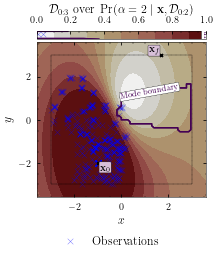

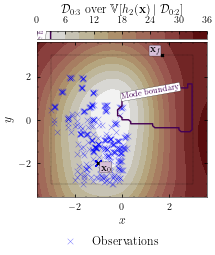

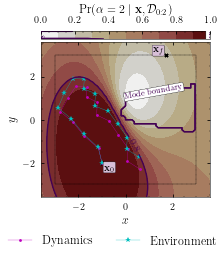

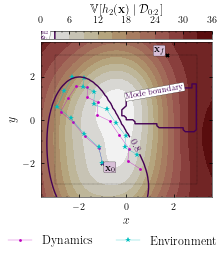

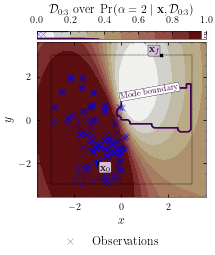

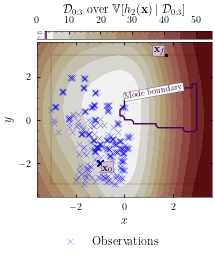

Optimisation result:
     fun: 186.11716559776266
     jac: array([-22.88942873, -19.43453886, -22.18664973, -19.4515331 ,
       -22.68539948, -18.96997447, -21.57609792, -19.31056077,
       -22.47147373, -18.43015018, -20.94236253, -17.84271588,
       -22.14698852, -16.51967478, -22.06914051, -15.30581647,
       -21.95442734, -13.56408246, -16.68896128,  -8.46646992,
       -17.66179169,  -7.73503217,  -6.57949983,  -2.65057372,
        -6.90473272,  -2.55136016,  -1.00998206,  -0.39782659,
        -1.04739111,  -0.40225385])
 message: 'Optimization terminated successfully'
    nfev: 59
     nit: 36
    njev: 36
  status: 0
 success: True
       x: array([-1.05371049,  4.36803808, -2.65284594,  4.24525596, -1.20529412,
        5.18897872, -2.66011334,  3.47289387,  0.06169775,  4.99328934,
       -2.3163354 ,  3.83020654,  1.19898495,  4.40520095,  2.00169033,
        3.33076774,  1.90286493,  1.45031004, -0.49942638, -1.00068891,
        1.49703695, -0.23433081, -0.63103625, -1.0

2022-04-22 12:41:16.161799: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 12:41:16.161817: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


3/3 [==============================] - 2s 926ms/step - loss: -757.8419 - val_loss: -731.2297


2022-04-22 12:41:17.360681: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 12:41:17.369163: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 12:41:17.374742: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_12_41_17

2022-04-22 12:41:17.379411: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_12_41_17/dr-robots-mbp.local.trace.json.gz
2022-04-22 12:41:17.395827: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_12_41_17

2022-04-22 12:41:17.395998: I tensorflow/core/profiler/rpc/client/s

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_4_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 18ms/step - loss: -909.6176 - val_loss: -385.4309
Epoch 3/20000
3/3 [==============================] - 0s 18ms/step - loss: -937.1316 - val_loss: -756.3507
Epoch 4/20000
3/3 [==============================] - 0s 18ms/step - loss: -935.7566 - val_loss: -731.6475
Epoch 5/20000
3/3 [==============================] - 0s 18ms/step - loss: -919.0365 - val_loss: -643.2587
Epoch 6/20000
3/3 [==============================] - 0s 19ms/step - loss: -895.7249 - val_loss: -693.8585
Epoch 7/20000
3/3 [==============================] - 0s 18ms/step - loss: -506.9780 - val_loss: -678.1640
Epoch 8/20000
3/3 [==============================] - 0s 18ms/step - loss: -789.9971 - val_loss: -566.9710
Epoch 9/20000
3/3 [==============================] - 0s 18ms/step - loss: -892.4327 - val_loss: -310.4684
Epoch 10/20000
3/3 [==============================] - 0s 18ms/step - loss: -517.1639 - val_loss: -359.1034
Epoch 11/20000
3/3 [=========================

3/3 [==============================] - 0s 17ms/step - loss: -914.3196 - val_loss: -712.4622
Epoch 77/20000
3/3 [==============================] - 0s 17ms/step - loss: -873.5653 - val_loss: -682.5512
Epoch 78/20000
3/3 [==============================] - 0s 18ms/step - loss: -887.7392 - val_loss: -791.4016
Epoch 79/20000
3/3 [==============================] - 0s 18ms/step - loss: -861.9495 - val_loss: -768.5702
Epoch 80/20000
3/3 [==============================] - 0s 17ms/step - loss: -594.3906 - val_loss: -567.1869
Epoch 81/20000
3/3 [==============================] - 0s 17ms/step - loss: -607.4339 - val_loss: -661.2924
Epoch 82/20000
3/3 [==============================] - 0s 17ms/step - loss: -566.0177 - val_loss: -582.3487
Epoch 83/20000
3/3 [==============================] - 0s 17ms/step - loss: -752.0899 - val_loss: -700.4273
Epoch 84/20000
3/3 [==============================] - 0s 17ms/step - loss: -682.5566 - val_loss: -713.5059
Epoch 85/20000
3/3 [==============================] 

3/3 [==============================] - 0s 21ms/step - loss: -827.2405 - val_loss: -580.1940
Epoch 153/20000
3/3 [==============================] - 0s 21ms/step - loss: -838.7597 - val_loss: -734.1891
Epoch 154/20000
3/3 [==============================] - 0s 21ms/step - loss: -523.6872 - val_loss: -769.5637
Epoch 155/20000
3/3 [==============================] - 0s 20ms/step - loss: -666.1527 - val_loss: -653.1885
Epoch 156/20000
3/3 [==============================] - 0s 21ms/step - loss: -773.2878 - val_loss: -799.1543
Epoch 157/20000
3/3 [==============================] - 0s 21ms/step - loss: -698.5325 - val_loss: -735.1072
Epoch 158/20000
3/3 [==============================] - 0s 21ms/step - loss: -862.9128 - val_loss: -414.5296
Epoch 159/20000
3/3 [==============================] - 0s 22ms/step - loss: -787.6916 - val_loss: -674.8951
Epoch 160/20000
3/3 [==============================] - 0s 22ms/step - loss: -653.2143 - val_loss: -677.3542
Epoch 161/20000
3/3 [=======================

3/3 [==============================] - 0s 21ms/step - loss: -807.0029 - val_loss: -630.3611
Epoch 229/20000
3/3 [==============================] - 0s 21ms/step - loss: -810.6761 - val_loss: -693.5603
Epoch 230/20000
3/3 [==============================] - 0s 21ms/step - loss: -705.0046 - val_loss: -621.0384
Epoch 231/20000
3/3 [==============================] - 0s 21ms/step - loss: -843.6886 - val_loss: -656.9203
Epoch 232/20000
3/3 [==============================] - 0s 22ms/step - loss: -809.6063 - val_loss: -686.4069
Epoch 233/20000
3/3 [==============================] - 0s 21ms/step - loss: -820.0032 - val_loss: -661.7288
Epoch 234/20000
3/3 [==============================] - 0s 21ms/step - loss: -855.2213 - val_loss: -680.0685
Epoch 235/20000
3/3 [==============================] - 0s 21ms/step - loss: -887.7479 - val_loss: -731.1523
Epoch 236/20000
3/3 [==============================] - 0s 21ms/step - loss: -846.6090 - val_loss: -583.5203
Epoch 237/20000
3/3 [=======================

3/3 [==============================] - 0s 21ms/step - loss: -871.1985 - val_loss: -417.9029
Epoch 305/20000
3/3 [==============================] - 0s 21ms/step - loss: -874.3770 - val_loss: -656.8594
Epoch 306/20000
3/3 [==============================] - 0s 21ms/step - loss: -815.2202 - val_loss: -590.1847
Epoch 307/20000
3/3 [==============================] - 0s 21ms/step - loss: -842.9264 - val_loss: -737.2336
Epoch 308/20000
3/3 [==============================] - 0s 21ms/step - loss: -935.8930 - val_loss: -699.2813
Epoch 309/20000
3/3 [==============================] - 0s 21ms/step - loss: -922.3973 - val_loss: -633.9290
Epoch 310/20000
3/3 [==============================] - 0s 21ms/step - loss: -880.5541 - val_loss: -688.3785
Epoch 311/20000
3/3 [==============================] - 0s 23ms/step - loss: -869.5166 - val_loss: -688.8676
Epoch 312/20000
3/3 [==============================] - 0s 22ms/step - loss: -886.1491 - val_loss: -721.1504
Epoch 313/20000
3/3 [=======================

Epoch 380/20000
3/3 [==============================] - 0s 22ms/step - loss: -954.3144 - val_loss: -794.3944
Epoch 381/20000
3/3 [==============================] - 0s 22ms/step - loss: -811.9593 - val_loss: -854.1724
Epoch 382/20000
3/3 [==============================] - 0s 22ms/step - loss: -919.7416 - val_loss: -821.6108
Epoch 383/20000
3/3 [==============================] - 0s 21ms/step - loss: -958.1103 - val_loss: -829.0278
Epoch 384/20000
3/3 [==============================] - 0s 21ms/step - loss: -973.4245 - val_loss: -764.0805
Epoch 385/20000
3/3 [==============================] - 0s 22ms/step - loss: -979.9612 - val_loss: -745.3404
Epoch 386/20000
3/3 [==============================] - 0s 21ms/step - loss: -920.0897 - val_loss: -782.4202
Epoch 387/20000
3/3 [==============================] - 0s 21ms/step - loss: -798.1187 - val_loss: -807.7764
Epoch 388/20000
3/3 [==============================] - 0s 21ms/step - loss: -988.1760 - val_loss: -645.7103
Epoch 389/20000
3/3 [=======

Epoch 456/20000
3/3 [==============================] - 0s 22ms/step - loss: -971.9774 - val_loss: -691.5542
Epoch 457/20000
3/3 [==============================] - 0s 21ms/step - loss: -898.7662 - val_loss: -865.4377
Epoch 458/20000
3/3 [==============================] - 0s 21ms/step - loss: -820.0890 - val_loss: -288.4356
Epoch 459/20000
3/3 [==============================] - 0s 21ms/step - loss: -767.5112 - val_loss: -756.9123
Epoch 460/20000
3/3 [==============================] - 0s 21ms/step - loss: -757.5535 - val_loss: -540.4272
Epoch 461/20000
3/3 [==============================] - 0s 21ms/step - loss: -623.0354 - val_loss: -637.8063
Epoch 462/20000
3/3 [==============================] - 0s 21ms/step - loss: -839.8847 - val_loss: -845.0152
Epoch 463/20000
3/3 [==============================] - 0s 21ms/step - loss: -909.8070 - val_loss: -723.9623
Epoch 464/20000
3/3 [==============================] - 0s 21ms/step - loss: -954.7788 - val_loss: -780.7263
Epoch 465/20000
3/3 [=======

Epoch 532/20000
3/3 [==============================] - 0s 21ms/step - loss: -953.3351 - val_loss: -824.4204
Epoch 533/20000
3/3 [==============================] - 0s 21ms/step - loss: -964.7172 - val_loss: -803.4994
Epoch 534/20000
3/3 [==============================] - 0s 21ms/step - loss: -920.9562 - val_loss: -820.9523
Epoch 535/20000
3/3 [==============================] - 0s 21ms/step - loss: -976.0073 - val_loss: -814.0153
Epoch 536/20000
3/3 [==============================] - 0s 20ms/step - loss: -975.9677 - val_loss: -814.2612
Epoch 537/20000
3/3 [==============================] - 0s 21ms/step - loss: -974.0249 - val_loss: -669.8046
Epoch 538/20000
3/3 [==============================] - 0s 21ms/step - loss: -991.8820 - val_loss: -805.5848
Epoch 539/20000
3/3 [==============================] - 0s 21ms/step - loss: -966.7871 - val_loss: -849.1677
Epoch 540/20000
3/3 [==============================] - 0s 21ms/step - loss: -978.6618 - val_loss: -771.6059
Epoch 541/20000
3/3 [=======

Epoch 608/20000
3/3 [==============================] - 0s 24ms/step - loss: -665.7297 - val_loss: -744.3931
Epoch 609/20000
3/3 [==============================] - 0s 24ms/step - loss: -856.1228 - val_loss: -686.5370
Epoch 610/20000
3/3 [==============================] - 0s 25ms/step - loss: -851.0621 - val_loss: -762.7108
Epoch 611/20000
3/3 [==============================] - 0s 25ms/step - loss: -905.8932 - val_loss: -779.3452
Epoch 612/20000
3/3 [==============================] - 0s 25ms/step - loss: -838.1222 - val_loss: -781.5771
Epoch 613/20000
3/3 [==============================] - 0s 24ms/step - loss: -874.7303 - val_loss: -801.0762
Epoch 614/20000
3/3 [==============================] - 0s 23ms/step - loss: -918.3344 - val_loss: -723.6826
Epoch 615/20000
3/3 [==============================] - 0s 25ms/step - loss: -936.6304 - val_loss: -749.9462
Epoch 616/20000
3/3 [==============================] - 0s 25ms/step - loss: -924.4127 - val_loss: -778.7529
Epoch 617/20000
3/3 [=======

Epoch 684/20000
3/3 [==============================] - 0s 23ms/step - loss: -996.5363 - val_loss: -831.1316
Epoch 685/20000
3/3 [==============================] - 0s 23ms/step - loss: -1001.2182 - val_loss: -834.1016
Epoch 686/20000
3/3 [==============================] - 0s 23ms/step - loss: -1019.0946 - val_loss: -820.2333
Epoch 687/20000
3/3 [==============================] - 0s 23ms/step - loss: -1011.9273 - val_loss: -824.2225
Epoch 688/20000
3/3 [==============================] - 0s 23ms/step - loss: -1003.2495 - val_loss: -904.2602
Epoch 689/20000
3/3 [==============================] - 0s 23ms/step - loss: -947.6405 - val_loss: -783.3165
Epoch 690/20000
3/3 [==============================] - 0s 22ms/step - loss: -984.2523 - val_loss: -878.6914
Epoch 691/20000
3/3 [==============================] - 0s 22ms/step - loss: -988.0049 - val_loss: -689.3980
Epoch 692/20000
3/3 [==============================] - 0s 23ms/step - loss: -991.0312 - val_loss: -843.1007
Epoch 693/20000
3/3 [===

Epoch 760/20000
3/3 [==============================] - 0s 23ms/step - loss: -927.7735 - val_loss: -685.6034
Epoch 761/20000
3/3 [==============================] - 0s 23ms/step - loss: -834.0474 - val_loss: -818.5756
Epoch 762/20000
3/3 [==============================] - 0s 22ms/step - loss: -909.4679 - val_loss: -786.2301
Epoch 763/20000
3/3 [==============================] - 0s 23ms/step - loss: -958.5306 - val_loss: -736.1534
Epoch 764/20000
3/3 [==============================] - 0s 24ms/step - loss: -939.6667 - val_loss: -759.0419
Epoch 765/20000
3/3 [==============================] - 0s 23ms/step - loss: -947.9117 - val_loss: -760.7426
Epoch 766/20000
3/3 [==============================] - 0s 23ms/step - loss: -866.8717 - val_loss: -814.2572
Epoch 767/20000
3/3 [==============================] - 0s 22ms/step - loss: -966.8220 - val_loss: -887.1993
Epoch 768/20000
3/3 [==============================] - 0s 22ms/step - loss: -954.5710 - val_loss: -856.1724
Epoch 769/20000
3/3 [=======

Epoch 836/20000
3/3 [==============================] - 0s 25ms/step - loss: -655.1153 - val_loss: -492.7710
Epoch 837/20000
3/3 [==============================] - 0s 24ms/step - loss: -632.5544 - val_loss: -605.1570
Epoch 838/20000
3/3 [==============================] - 0s 24ms/step - loss: -772.5252 - val_loss: -653.7768
Epoch 839/20000
3/3 [==============================] - 0s 23ms/step - loss: -827.5300 - val_loss: -638.1096
Epoch 840/20000
3/3 [==============================] - 0s 23ms/step - loss: -850.0651 - val_loss: -775.5729
Epoch 841/20000
3/3 [==============================] - 0s 24ms/step - loss: -794.7816 - val_loss: -681.5101
Epoch 842/20000
3/3 [==============================] - 0s 25ms/step - loss: -770.0377 - val_loss: -675.0183
Epoch 843/20000
3/3 [==============================] - 0s 24ms/step - loss: -817.5117 - val_loss: -638.9981
Epoch 844/20000
3/3 [==============================] - 0s 24ms/step - loss: -839.2918 - val_loss: -794.0000
Epoch 845/20000
3/3 [=======

Epoch 912/20000
3/3 [==============================] - 0s 23ms/step - loss: -967.0351 - val_loss: -711.1491
Epoch 913/20000
3/3 [==============================] - 0s 22ms/step - loss: -928.7802 - val_loss: -855.1438
Epoch 914/20000
3/3 [==============================] - 0s 22ms/step - loss: -975.5363 - val_loss: -837.3747
Epoch 915/20000
3/3 [==============================] - 0s 22ms/step - loss: -974.6595 - val_loss: -803.4339
Epoch 916/20000
3/3 [==============================] - 0s 22ms/step - loss: -923.9361 - val_loss: -828.1042
Epoch 917/20000
3/3 [==============================] - 0s 22ms/step - loss: -986.0978 - val_loss: -842.2784
Epoch 918/20000
3/3 [==============================] - 0s 22ms/step - loss: -974.1516 - val_loss: -800.7361
Epoch 919/20000
3/3 [==============================] - 0s 22ms/step - loss: -930.9745 - val_loss: -783.1493
Epoch 920/20000
3/3 [==============================] - 0s 22ms/step - loss: -988.7015 - val_loss: -813.0094
Epoch 921/20000
3/3 [=======

3/3 [==============================] - 0s 23ms/step - loss: -934.1282 - val_loss: -877.7276
Epoch 988/20000
3/3 [==============================] - 0s 22ms/step - loss: -938.6608 - val_loss: -681.7437
Epoch 989/20000
3/3 [==============================] - 0s 23ms/step - loss: -882.2688 - val_loss: -888.2190
Epoch 990/20000
3/3 [==============================] - 0s 22ms/step - loss: -894.1009 - val_loss: -730.1737
Epoch 991/20000
3/3 [==============================] - 0s 23ms/step - loss: -923.1082 - val_loss: -848.7831
Epoch 992/20000
3/3 [==============================] - 0s 22ms/step - loss: -862.5297 - val_loss: -872.4516
Epoch 993/20000
3/3 [==============================] - 0s 22ms/step - loss: -793.5717 - val_loss: -875.9089
Epoch 994/20000
3/3 [==============================] - 0s 22ms/step - loss: -1001.8626 - val_loss: -693.1043
Epoch 995/20000
3/3 [==============================] - 0s 23ms/step - loss: -935.9863 - val_loss: -626.2932
Epoch 996/20000
3/3 [======================

3/3 [==============================] - 0s 25ms/step - loss: -847.6781 - val_loss: -867.0184
Epoch 1063/20000
3/3 [==============================] - 0s 25ms/step - loss: -695.6755 - val_loss: -852.0235
Epoch 1064/20000
3/3 [==============================] - 0s 26ms/step - loss: -877.2477 - val_loss: -701.7601
Epoch 1065/20000
3/3 [==============================] - 0s 27ms/step - loss: -773.0479 - val_loss: -220.6981
Epoch 1066/20000
3/3 [==============================] - 0s 26ms/step - loss: -546.4938 - val_loss: 482.1931
Epoch 1067/20000
3/3 [==============================] - 0s 34ms/step - loss: -537.9787 - val_loss: -400.2900
Epoch 1068/20000
3/3 [==============================] - 0s 27ms/step - loss: -399.1337 - val_loss: -842.6283
Epoch 1069/20000
3/3 [==============================] - 0s 27ms/step - loss: -825.4883 - val_loss: 195.8053
Epoch 1070/20000
3/3 [==============================] - 0s 25ms/step - loss: -673.9484 - val_loss: -726.4708
Epoch 1071/20000
3/3 [================

3/3 [==============================] - 0s 24ms/step - loss: -682.7919 - val_loss: -665.8454
Epoch 1138/20000
3/3 [==============================] - 0s 24ms/step - loss: -762.0105 - val_loss: -741.4680
Epoch 1139/20000
3/3 [==============================] - 0s 23ms/step - loss: -829.3664 - val_loss: -674.7972
Epoch 1140/20000
3/3 [==============================] - 0s 24ms/step - loss: -848.2648 - val_loss: -735.5583
Epoch 1141/20000
3/3 [==============================] - 0s 23ms/step - loss: -847.2431 - val_loss: -709.9146
Epoch 1142/20000
3/3 [==============================] - 0s 23ms/step - loss: -840.6402 - val_loss: -799.7760
Epoch 1143/20000
3/3 [==============================] - 0s 23ms/step - loss: -898.8973 - val_loss: -690.7698
Epoch 1144/20000
3/3 [==============================] - 0s 24ms/step - loss: -802.3596 - val_loss: -721.8039
Epoch 1145/20000
3/3 [==============================] - 0s 23ms/step - loss: -885.9494 - val_loss: -806.1604
Epoch 1146/20000
3/3 [==============

3/3 [==============================] - 0s 23ms/step - loss: -994.1857 - val_loss: -850.7230
Epoch 1213/20000
3/3 [==============================] - 0s 23ms/step - loss: -979.4283 - val_loss: -938.7575
Epoch 1214/20000
3/3 [==============================] - 0s 23ms/step - loss: -967.1897 - val_loss: -879.3957
Epoch 1215/20000
3/3 [==============================] - 0s 23ms/step - loss: -995.8690 - val_loss: -876.0612
Epoch 1216/20000
3/3 [==============================] - 0s 23ms/step - loss: -969.5991 - val_loss: -850.3817
Epoch 1217/20000
3/3 [==============================] - 0s 23ms/step - loss: -954.1147 - val_loss: -862.0542
Epoch 1218/20000
3/3 [==============================] - 0s 24ms/step - loss: -1024.8445 - val_loss: -849.1374
Epoch 1219/20000
3/3 [==============================] - 0s 23ms/step - loss: -1013.0705 - val_loss: -889.3292
Epoch 1220/20000
3/3 [==============================] - 0s 23ms/step - loss: -1007.1482 - val_loss: -917.6585
Epoch 1221/20000
3/3 [===========

3/3 [==============================] - 0s 26ms/step - loss: -957.7135 - val_loss: -855.5942
Epoch 1288/20000
3/3 [==============================] - 0s 26ms/step - loss: -951.6185 - val_loss: -870.4964
Epoch 1289/20000
3/3 [==============================] - 0s 28ms/step - loss: -988.0435 - val_loss: -816.9972
Epoch 1290/20000
3/3 [==============================] - 0s 37ms/step - loss: -973.6977 - val_loss: -846.4840
Epoch 1291/20000
3/3 [==============================] - 0s 28ms/step - loss: -1003.2291 - val_loss: -828.9195
Epoch 1292/20000
3/3 [==============================] - 0s 27ms/step - loss: -981.3528 - val_loss: -857.5959
Epoch 1293/20000
3/3 [==============================] - 0s 27ms/step - loss: -995.7202 - val_loss: -899.3237
Epoch 1294/20000
3/3 [==============================] - 0s 28ms/step - loss: -1003.8742 - val_loss: -844.6589
Epoch 1295/20000
3/3 [==============================] - 0s 28ms/step - loss: -1018.8009 - val_loss: -820.4610
Epoch 1296/20000
3/3 [===========

3/3 [==============================] - 0s 23ms/step - loss: -961.7595 - val_loss: -778.0411
Epoch 1363/20000
3/3 [==============================] - 0s 23ms/step - loss: -890.9679 - val_loss: -681.5477
Epoch 1364/20000
3/3 [==============================] - 0s 23ms/step - loss: -931.1050 - val_loss: -918.6895
Epoch 1365/20000
3/3 [==============================] - 0s 24ms/step - loss: -893.7627 - val_loss: -845.1954
Epoch 1366/20000
3/3 [==============================] - 0s 24ms/step - loss: -897.7718 - val_loss: -701.1272
Epoch 1367/20000
3/3 [==============================] - 0s 23ms/step - loss: -946.6083 - val_loss: -843.3012
Epoch 1368/20000
3/3 [==============================] - 0s 23ms/step - loss: -965.9651 - val_loss: -833.9832
Epoch 1369/20000
3/3 [==============================] - 0s 23ms/step - loss: -957.2279 - val_loss: -830.1720
Epoch 1370/20000
3/3 [==============================] - 0s 23ms/step - loss: -950.8602 - val_loss: -799.3538
Epoch 1371/20000
3/3 [==============

3/3 [==============================] - 0s 23ms/step - loss: -858.8652 - val_loss: -812.0493
Epoch 1438/20000
3/3 [==============================] - 0s 24ms/step - loss: -928.4273 - val_loss: -825.2469
Epoch 1439/20000
3/3 [==============================] - 0s 23ms/step - loss: -951.2191 - val_loss: -745.7382
Epoch 1440/20000
3/3 [==============================] - 0s 23ms/step - loss: -935.2104 - val_loss: -838.0114
Epoch 1441/20000
3/3 [==============================] - 0s 24ms/step - loss: -978.7829 - val_loss: -743.1953
Epoch 1442/20000
3/3 [==============================] - 0s 25ms/step - loss: -965.1396 - val_loss: -823.6673
Epoch 1443/20000
3/3 [==============================] - 0s 23ms/step - loss: -974.3479 - val_loss: -824.9345
Epoch 1444/20000
3/3 [==============================] - 0s 24ms/step - loss: -992.6369 - val_loss: -888.0567
Epoch 1445/20000
3/3 [==============================] - 0s 23ms/step - loss: -989.8986 - val_loss: -858.4712
Epoch 1446/20000
3/3 [==============

3/3 [==============================] - 0s 30ms/step - loss: -795.4104 - val_loss: -787.1844
Epoch 1513/20000
3/3 [==============================] - 0s 28ms/step - loss: -892.8943 - val_loss: -774.1940
Epoch 1514/20000
3/3 [==============================] - 0s 25ms/step - loss: -874.3844 - val_loss: -652.7228
Epoch 1515/20000
3/3 [==============================] - 0s 25ms/step - loss: -854.7800 - val_loss: -776.7036
Epoch 1516/20000
3/3 [==============================] - 0s 26ms/step - loss: -859.7956 - val_loss: -795.8566
Epoch 1517/20000
3/3 [==============================] - 0s 25ms/step - loss: -910.1871 - val_loss: -774.6969
Epoch 1518/20000
3/3 [==============================] - 0s 27ms/step - loss: -913.4796 - val_loss: -781.0066
Epoch 1519/20000
3/3 [==============================] - 0s 25ms/step - loss: -936.2609 - val_loss: -778.7004
Epoch 1520/20000
3/3 [==============================] - 0s 25ms/step - loss: -938.8248 - val_loss: -801.9492
Epoch 1521/20000
3/3 [==============

3/3 [==============================] - 0s 22ms/step - loss: -1003.0707 - val_loss: -768.0229
Epoch 1588/20000
3/3 [==============================] - 0s 22ms/step - loss: -923.6048 - val_loss: -523.1640
Epoch 1589/20000
3/3 [==============================] - 0s 23ms/step - loss: -930.2426 - val_loss: -890.0534
Epoch 1590/20000
3/3 [==============================] - 0s 23ms/step - loss: -977.4014 - val_loss: -752.8042
Epoch 1591/20000
3/3 [==============================] - 0s 22ms/step - loss: -929.8907 - val_loss: -783.5547
Epoch 1592/20000
3/3 [==============================] - 0s 22ms/step - loss: -942.0119 - val_loss: -780.6447
Epoch 1593/20000
3/3 [==============================] - 0s 23ms/step - loss: -951.7809 - val_loss: -892.7013
Epoch 1594/20000
3/3 [==============================] - 0s 22ms/step - loss: -1027.9212 - val_loss: -849.0815
Epoch 1595/20000
3/3 [==============================] - 0s 23ms/step - loss: -1001.1064 - val_loss: -843.7175
Epoch 1596/20000
3/3 [===========

3/3 [==============================] - 0s 22ms/step - loss: -986.7821 - val_loss: -855.2108
Epoch 1663/20000
3/3 [==============================] - 0s 22ms/step - loss: -983.2166 - val_loss: -217.1697
Epoch 1664/20000
3/3 [==============================] - 0s 23ms/step - loss: -673.6884 - val_loss: -853.9799
Epoch 1665/20000
3/3 [==============================] - 0s 23ms/step - loss: -949.8230 - val_loss: -698.8427
Epoch 1666/20000
3/3 [==============================] - 0s 22ms/step - loss: -855.9078 - val_loss: -901.8776
Epoch 1667/20000
3/3 [==============================] - 0s 22ms/step - loss: -833.6087 - val_loss: -347.2977
Epoch 1668/20000
3/3 [==============================] - 0s 22ms/step - loss: -969.7848 - val_loss: -213.6207
Epoch 1669/20000
3/3 [==============================] - 0s 23ms/step - loss: -959.7219 - val_loss: -795.3126
Epoch 1670/20000
3/3 [==============================] - 0s 22ms/step - loss: -966.0467 - val_loss: -773.2453
Epoch 1671/20000
3/3 [==============

3/3 [==============================] - 0s 22ms/step - loss: -941.7460 - val_loss: -923.1870
Epoch 1738/20000
3/3 [==============================] - 0s 22ms/step - loss: -1014.7702 - val_loss: -886.7102
Epoch 1739/20000
3/3 [==============================] - 0s 22ms/step - loss: -1005.3077 - val_loss: -836.4582
Epoch 1740/20000
3/3 [==============================] - 0s 22ms/step - loss: -954.8495 - val_loss: -874.6685
Epoch 1741/20000
3/3 [==============================] - 0s 22ms/step - loss: -1003.4450 - val_loss: -820.8134
Epoch 1742/20000
3/3 [==============================] - 0s 22ms/step - loss: -1021.5756 - val_loss: -897.9269
Epoch 1743/20000
3/3 [==============================] - 0s 22ms/step - loss: -1020.4665 - val_loss: -842.8465
Epoch 1744/20000
3/3 [==============================] - 0s 21ms/step - loss: -1016.9039 - val_loss: -861.1887
Epoch 1745/20000
3/3 [==============================] - 0s 22ms/step - loss: -1046.8992 - val_loss: -676.7930
Epoch 1746/20000
3/3 [=======

3/3 [==============================] - 0s 22ms/step - loss: -956.7864 - val_loss: -823.2994
Epoch 1813/20000
3/3 [==============================] - 0s 23ms/step - loss: -964.7564 - val_loss: -835.3743
Epoch 1814/20000
3/3 [==============================] - 0s 22ms/step - loss: -954.7098 - val_loss: -839.8857
Epoch 1815/20000
3/3 [==============================] - 0s 22ms/step - loss: -977.7099 - val_loss: -756.2020
Epoch 1816/20000
3/3 [==============================] - 0s 22ms/step - loss: -997.3082 - val_loss: -809.2657
Epoch 1817/20000
3/3 [==============================] - 0s 32ms/step - loss: -983.7407 - val_loss: -848.3737
Epoch 1818/20000
3/3 [==============================] - 0s 23ms/step - loss: -968.7069 - val_loss: -886.5323
Epoch 1819/20000
3/3 [==============================] - 0s 22ms/step - loss: -991.9160 - val_loss: -826.9732
Epoch 1820/20000
3/3 [==============================] - 0s 22ms/step - loss: -984.1985 - val_loss: -789.2543
Epoch 1821/20000
3/3 [==============

3/3 [==============================] - 0s 22ms/step - loss: -1006.6884 - val_loss: -826.9996
Epoch 1888/20000
3/3 [==============================] - 0s 22ms/step - loss: -1003.2885 - val_loss: -858.1048
Epoch 1889/20000
3/3 [==============================] - 0s 26ms/step - loss: -1008.5791 - val_loss: -861.4187
Epoch 1890/20000
3/3 [==============================] - 0s 21ms/step - loss: -966.8535 - val_loss: -900.4906
Epoch 1891/20000
3/3 [==============================] - 0s 22ms/step - loss: -884.6770 - val_loss: -859.5333
Epoch 1892/20000
3/3 [==============================] - 0s 22ms/step - loss: -975.5726 - val_loss: -886.3443
Epoch 1893/20000
3/3 [==============================] - 0s 21ms/step - loss: -828.5331 - val_loss: -823.6560
Epoch 1894/20000
3/3 [==============================] - 0s 22ms/step - loss: -945.5317 - val_loss: -761.0449
Epoch 1895/20000
3/3 [==============================] - 0s 21ms/step - loss: -991.0089 - val_loss: -786.6978
Epoch 1896/20000
3/3 [===========

3/3 [==============================] - 0s 22ms/step - loss: -1008.1078 - val_loss: -831.3495
Epoch 1963/20000
3/3 [==============================] - 0s 22ms/step - loss: -1015.2675 - val_loss: -867.5426
Epoch 1964/20000
3/3 [==============================] - 0s 21ms/step - loss: -1010.2794 - val_loss: -867.3930
Epoch 1965/20000
3/3 [==============================] - 0s 22ms/step - loss: -1021.5453 - val_loss: -908.7826
Epoch 1966/20000
3/3 [==============================] - 0s 22ms/step - loss: -1014.4347 - val_loss: -894.7007
Epoch 1967/20000
3/3 [==============================] - 0s 22ms/step - loss: -1027.5608 - val_loss: -877.9769
Epoch 1968/20000
3/3 [==============================] - 0s 21ms/step - loss: -1013.8536 - val_loss: -756.7627
Epoch 1969/20000
3/3 [==============================] - 0s 22ms/step - loss: -1038.4333 - val_loss: -846.8603
Epoch 1970/20000
3/3 [==============================] - 0s 22ms/step - loss: -1043.9500 - val_loss: -861.0032
Epoch 1971/20000
3/3 [=====

/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2002/20000
3/3 [==============================] - 0s 21ms/step - loss: -950.0507 - val_loss: -711.6897
Epoch 2003/20000
3/3 [==============================] - 0s 20ms/step - loss: -847.3419 - val_loss: -827.0511
Epoch 2004/20000
3/3 [==============================] - 0s 20ms/step - loss: -688.8926 - val_loss: -549.0663
Epoch 2005/20000
3/3 [==============================] - 0s 20ms/step - loss: -724.1113 - val_loss: -398.6002
Epoch 2006/20000
3/3 [==============================] - 0s 20ms/step - loss: -802.8533 - val_loss: -734.4236
Epoch 2007/20000
3/3 [==============================] - 0s 29ms/step - loss: -731.5058 - val_loss: -614.3218
Epoch 2008/20000
3/3 [==============================] - 0s 22ms/step - loss: -885.7700 - val_loss: -741.6985
Epoch 2009/20000
3/3 [==============================] - 0s 20ms/step - loss: -830.1019 - val_loss: -756.0203
Epoch 2010/20000
3/3 [==============================] - 0s 23ms/step - loss: -878.7759 - val_loss: -512.1879
Epoch 2011/20000
3/

3/3 [==============================] - 0s 29ms/step - loss: -756.9058 - val_loss: -655.5690
Epoch 2078/20000
3/3 [==============================] - 0s 29ms/step - loss: -737.5107 - val_loss: -695.4840
Epoch 2079/20000
3/3 [==============================] - 0s 23ms/step - loss: -790.3813 - val_loss: -679.6348
Epoch 2080/20000
3/3 [==============================] - 0s 23ms/step - loss: -803.9846 - val_loss: -640.2903
Epoch 2081/20000
3/3 [==============================] - 0s 23ms/step - loss: -786.9906 - val_loss: -616.3895
Epoch 2082/20000
3/3 [==============================] - 0s 28ms/step - loss: -761.0149 - val_loss: -711.2083
Epoch 2083/20000
3/3 [==============================] - 0s 25ms/step - loss: -834.5718 - val_loss: -670.0407
Epoch 2084/20000
3/3 [==============================] - 0s 23ms/step - loss: -817.5301 - val_loss: -718.4958
Epoch 2085/20000
3/3 [==============================] - 0s 23ms/step - loss: -769.2076 - val_loss: -716.0082
Epoch 2086/20000
3/3 [==============

3/3 [==============================] - 0s 24ms/step - loss: -641.1244 - val_loss: -873.0328
Epoch 2153/20000
3/3 [==============================] - 0s 25ms/step - loss: -686.8764 - val_loss: -345.4488
Epoch 2154/20000
3/3 [==============================] - 0s 25ms/step - loss: -866.0165 - val_loss: 669.8244
Epoch 2155/20000
3/3 [==============================] - 0s 25ms/step - loss: -543.8993 - val_loss: -690.7532
Epoch 2156/20000
3/3 [==============================] - 0s 24ms/step - loss: -448.8537 - val_loss: 447.0295
Epoch 2157/20000
3/3 [==============================] - 0s 25ms/step - loss: -824.3186 - val_loss: 534.0829
Epoch 2158/20000
3/3 [==============================] - 0s 24ms/step - loss: -765.7767 - val_loss: -449.4181
Epoch 2159/20000
3/3 [==============================] - 0s 24ms/step - loss: -753.9182 - val_loss: -686.8403
Epoch 2160/20000
3/3 [==============================] - 0s 25ms/step - loss: -680.9539 - val_loss: -746.0131
Epoch 2161/20000
3/3 [=================

3/3 [==============================] - 0s 25ms/step - loss: -1027.6285 - val_loss: -793.2850
Epoch 2228/20000
3/3 [==============================] - 0s 24ms/step - loss: -898.3183 - val_loss: -709.4632
Epoch 2229/20000
3/3 [==============================] - 0s 25ms/step - loss: -1026.0580 - val_loss: -749.8619
Epoch 2230/20000
3/3 [==============================] - 0s 25ms/step - loss: -923.4402 - val_loss: -945.3616
Epoch 2231/20000
3/3 [==============================] - 0s 24ms/step - loss: -1014.3394 - val_loss: -897.1746
Epoch 2232/20000
3/3 [==============================] - 0s 23ms/step - loss: -788.6785 - val_loss: -886.2001
Epoch 2233/20000
3/3 [==============================] - 0s 25ms/step - loss: -969.7285 - val_loss: -917.3120
Epoch 2234/20000
3/3 [==============================] - 0s 25ms/step - loss: -935.4352 - val_loss: -839.7332
Epoch 2235/20000
3/3 [==============================] - 0s 25ms/step - loss: -957.8825 - val_loss: -693.9172
Epoch 2236/20000
3/3 [===========

3/3 [==============================] - 0s 24ms/step - loss: -919.4518 - val_loss: -819.4217
Epoch 2303/20000
3/3 [==============================] - 0s 24ms/step - loss: -887.8744 - val_loss: -787.9527
Epoch 2304/20000
3/3 [==============================] - 0s 25ms/step - loss: -890.2697 - val_loss: -784.4239
Epoch 2305/20000
3/3 [==============================] - 0s 24ms/step - loss: -866.0297 - val_loss: -880.4098
Epoch 2306/20000
3/3 [==============================] - 0s 24ms/step - loss: -905.9494 - val_loss: -789.1816
Epoch 2307/20000
3/3 [==============================] - 0s 25ms/step - loss: -884.2180 - val_loss: -760.7433
Epoch 2308/20000
3/3 [==============================] - 0s 24ms/step - loss: -874.5001 - val_loss: -797.7922
Epoch 2309/20000
3/3 [==============================] - 0s 36ms/step - loss: -909.0032 - val_loss: -830.1692
Epoch 2310/20000
3/3 [==============================] - 0s 31ms/step - loss: -891.8051 - val_loss: -853.5660
Epoch 2311/20000
3/3 [==============

3/3 [==============================] - 0s 24ms/step - loss: -770.9135 - val_loss: -728.4951
Epoch 2378/20000
3/3 [==============================] - 0s 24ms/step - loss: -912.5230 - val_loss: -794.6967
Epoch 2379/20000
3/3 [==============================] - 0s 24ms/step - loss: -806.0817 - val_loss: -685.9333
Epoch 2380/20000
3/3 [==============================] - 0s 24ms/step - loss: -903.1329 - val_loss: -833.5184
Epoch 2381/20000
3/3 [==============================] - 0s 23ms/step - loss: -815.9298 - val_loss: -418.1555
Epoch 2382/20000
3/3 [==============================] - 0s 23ms/step - loss: -901.9086 - val_loss: -662.0424
Epoch 2383/20000
3/3 [==============================] - 0s 24ms/step - loss: -353.0427 - val_loss: -642.9369
Epoch 2384/20000
3/3 [==============================] - 0s 24ms/step - loss: -890.0515 - val_loss: -799.7106
Epoch 2385/20000
3/3 [==============================] - 0s 24ms/step - loss: -888.2400 - val_loss: -807.0462
Epoch 2386/20000
3/3 [==============

3/3 [==============================] - 0s 24ms/step - loss: -827.0157 - val_loss: -654.2380
Epoch 2453/20000
3/3 [==============================] - 0s 23ms/step - loss: -728.8031 - val_loss: -730.3549
Epoch 2454/20000
3/3 [==============================] - 0s 24ms/step - loss: -693.1533 - val_loss: -712.6952
Epoch 2455/20000
3/3 [==============================] - 0s 24ms/step - loss: -766.4619 - val_loss: -645.1555
Epoch 2456/20000
3/3 [==============================] - 0s 24ms/step - loss: -827.0503 - val_loss: -587.9561
Epoch 2457/20000
3/3 [==============================] - 0s 23ms/step - loss: -798.7847 - val_loss: -762.1381
Epoch 2458/20000
3/3 [==============================] - 0s 24ms/step - loss: -877.0849 - val_loss: -488.8248
Epoch 2459/20000
3/3 [==============================] - 0s 24ms/step - loss: -821.5072 - val_loss: -700.5242
Epoch 2460/20000
3/3 [==============================] - 0s 23ms/step - loss: -887.2335 - val_loss: -625.0388
Epoch 2461/20000
3/3 [==============

3/3 [==============================] - 0s 24ms/step - loss: -873.5352 - val_loss: -726.0128
Epoch 2528/20000
3/3 [==============================] - 0s 25ms/step - loss: -869.7628 - val_loss: -750.5157
Epoch 2529/20000
3/3 [==============================] - 0s 25ms/step - loss: -816.2151 - val_loss: -372.8442
Epoch 2530/20000
3/3 [==============================] - 0s 26ms/step - loss: -815.1400 - val_loss: -515.6125
Epoch 2531/20000
3/3 [==============================] - 0s 25ms/step - loss: -811.5441 - val_loss: -559.1182
Epoch 2532/20000
3/3 [==============================] - 0s 27ms/step - loss: -905.8483 - val_loss: -754.6701
Epoch 2533/20000
3/3 [==============================] - 0s 25ms/step - loss: -788.1903 - val_loss: -714.0321
Epoch 2534/20000
3/3 [==============================] - 0s 26ms/step - loss: -877.3022 - val_loss: -520.3622
Epoch 2535/20000
3/3 [==============================] - 0s 26ms/step - loss: -848.9146 - val_loss: -674.7533
Epoch 2536/20000
3/3 [==============

3/3 [==============================] - 0s 25ms/step - loss: -951.7421 - val_loss: -611.8297
Epoch 2603/20000
3/3 [==============================] - 0s 24ms/step - loss: -907.3684 - val_loss: -562.1547
Epoch 2604/20000
3/3 [==============================] - 0s 24ms/step - loss: -931.6808 - val_loss: -208.8316
Epoch 2605/20000
3/3 [==============================] - 0s 24ms/step - loss: -805.5674 - val_loss: -779.9010
Epoch 2606/20000
3/3 [==============================] - 0s 23ms/step - loss: -926.7663 - val_loss: -634.6760
Epoch 2607/20000
3/3 [==============================] - 0s 24ms/step - loss: -891.6710 - val_loss: -590.3180
Epoch 2608/20000
3/3 [==============================] - 0s 24ms/step - loss: -835.0628 - val_loss: -739.4166
Epoch 2609/20000
3/3 [==============================] - 0s 24ms/step - loss: -856.5060 - val_loss: -734.2511
Epoch 2610/20000
3/3 [==============================] - 0s 25ms/step - loss: -914.4492 - val_loss: -655.6745
Epoch 2611/20000
3/3 [==============

3/3 [==============================] - 0s 24ms/step - loss: -903.6601 - val_loss: -773.1618
Epoch 2678/20000
3/3 [==============================] - 0s 25ms/step - loss: -892.5499 - val_loss: -634.4538
Epoch 2679/20000
3/3 [==============================] - 0s 23ms/step - loss: -931.1212 - val_loss: -792.9938
Epoch 2680/20000
3/3 [==============================] - 0s 24ms/step - loss: -904.7506 - val_loss: -723.7054
Epoch 2681/20000
3/3 [==============================] - 0s 24ms/step - loss: -945.0876 - val_loss: -616.0069
Epoch 2682/20000
3/3 [==============================] - 0s 23ms/step - loss: -918.6221 - val_loss: -751.5248
Epoch 2683/20000
3/3 [==============================] - 0s 24ms/step - loss: -973.0970 - val_loss: -754.9014
Epoch 2684/20000
3/3 [==============================] - 0s 23ms/step - loss: -895.3216 - val_loss: -689.2964
Epoch 2685/20000
3/3 [==============================] - 0s 24ms/step - loss: -947.8673 - val_loss: -569.2815
Epoch 2686/20000
3/3 [==============

3/3 [==============================] - 0s 23ms/step - loss: -798.1888 - val_loss: -601.8681
Epoch 2753/20000
3/3 [==============================] - 0s 23ms/step - loss: -899.4699 - val_loss: -678.3198
Epoch 2754/20000
3/3 [==============================] - 0s 23ms/step - loss: -810.0539 - val_loss: -705.2955
Epoch 2755/20000
3/3 [==============================] - 0s 23ms/step - loss: -901.6715 - val_loss: -703.0561
Epoch 2756/20000
3/3 [==============================] - 0s 23ms/step - loss: -775.8314 - val_loss: -706.3861
Epoch 2757/20000
3/3 [==============================] - 0s 23ms/step - loss: -885.5108 - val_loss: -453.0517
Epoch 2758/20000
3/3 [==============================] - 0s 24ms/step - loss: -871.9371 - val_loss: -595.5866
Epoch 2759/20000
3/3 [==============================] - 0s 25ms/step - loss: -861.9448 - val_loss: -599.3195
Epoch 2760/20000
3/3 [==============================] - 0s 26ms/step - loss: -877.0277 - val_loss: -560.9388
Epoch 2761/20000
3/3 [==============

3/3 [==============================] - 0s 24ms/step - loss: -947.4131 - val_loss: -704.3404
Epoch 2828/20000
3/3 [==============================] - 0s 24ms/step - loss: -949.7289 - val_loss: -750.9616
Epoch 2829/20000
3/3 [==============================] - 0s 23ms/step - loss: -960.7528 - val_loss: -788.6519
Epoch 2830/20000
3/3 [==============================] - 0s 23ms/step - loss: -948.6739 - val_loss: -792.6802
Epoch 2831/20000
3/3 [==============================] - 0s 23ms/step - loss: -940.5334 - val_loss: -837.1879
Epoch 2832/20000
3/3 [==============================] - 0s 23ms/step - loss: -954.9845 - val_loss: -729.5000
Epoch 2833/20000
3/3 [==============================] - 0s 23ms/step - loss: -906.9024 - val_loss: -769.5739
Epoch 2834/20000
3/3 [==============================] - 0s 22ms/step - loss: -971.3237 - val_loss: -691.1506
Epoch 2835/20000
3/3 [==============================] - 0s 23ms/step - loss: -944.5640 - val_loss: -740.7213
Epoch 2836/20000
3/3 [==============

3/3 [==============================] - 0s 24ms/step - loss: -948.7015 - val_loss: -643.6287
Epoch 2903/20000
3/3 [==============================] - 0s 27ms/step - loss: -950.6238 - val_loss: -771.4725
Epoch 2904/20000
3/3 [==============================] - 0s 25ms/step - loss: -949.2445 - val_loss: -756.8648
Epoch 2905/20000
3/3 [==============================] - 0s 24ms/step - loss: -961.0825 - val_loss: -695.1251
Epoch 2906/20000
3/3 [==============================] - 0s 24ms/step - loss: -964.1725 - val_loss: -772.8073
Epoch 2907/20000
3/3 [==============================] - 0s 24ms/step - loss: -916.4090 - val_loss: -804.9237
Epoch 2908/20000
3/3 [==============================] - 0s 24ms/step - loss: -949.1295 - val_loss: -753.1335
Epoch 2909/20000
3/3 [==============================] - 0s 24ms/step - loss: -944.3768 - val_loss: -772.4222
Epoch 2910/20000
3/3 [==============================] - 0s 23ms/step - loss: -978.7030 - val_loss: -715.7603
Epoch 2911/20000
3/3 [==============

3/3 [==============================] - 0s 24ms/step - loss: -953.4725 - val_loss: -779.5422
Epoch 2978/20000
3/3 [==============================] - 0s 23ms/step - loss: -820.4131 - val_loss: -681.9458
Epoch 2979/20000
3/3 [==============================] - 0s 24ms/step - loss: -958.5683 - val_loss: -821.0982
Epoch 2980/20000
3/3 [==============================] - 0s 23ms/step - loss: -935.8691 - val_loss: -659.8171
Epoch 2981/20000
3/3 [==============================] - 0s 23ms/step - loss: -765.0917 - val_loss: -818.2061
Epoch 2982/20000
3/3 [==============================] - 0s 23ms/step - loss: -864.5938 - val_loss: -743.0962
Epoch 2983/20000
3/3 [==============================] - 0s 24ms/step - loss: -908.9846 - val_loss: -768.8503
Epoch 2984/20000
3/3 [==============================] - 0s 26ms/step - loss: -935.2722 - val_loss: -821.0768
Epoch 2985/20000
3/3 [==============================] - 0s 27ms/step - loss: -935.5230 - val_loss: -737.4472
Epoch 2986/20000
3/3 [==============

3/3 [==============================] - 0s 25ms/step - loss: -756.8759 - val_loss: -732.7389
Epoch 3053/20000
3/3 [==============================] - 0s 25ms/step - loss: -768.5882 - val_loss: -619.6646
Epoch 3054/20000
3/3 [==============================] - 0s 25ms/step - loss: -707.4254 - val_loss: -707.2123
Epoch 3055/20000
3/3 [==============================] - 0s 25ms/step - loss: -760.0891 - val_loss: -658.4628
Epoch 3056/20000
3/3 [==============================] - 0s 25ms/step - loss: -753.1378 - val_loss: -630.2846
Epoch 3057/20000
3/3 [==============================] - 0s 25ms/step - loss: -647.1061 - val_loss: -672.1736
Epoch 3058/20000
3/3 [==============================] - 0s 25ms/step - loss: -724.8226 - val_loss: -654.9245
Epoch 3059/20000
3/3 [==============================] - 0s 25ms/step - loss: -700.0467 - val_loss: -668.0953
Epoch 3060/20000
3/3 [==============================] - 0s 25ms/step - loss: -650.1916 - val_loss: -521.7642
Epoch 3061/20000
3/3 [==============

3/3 [==============================] - 0s 25ms/step - loss: -514.1744 - val_loss: -150.8771
Epoch 3128/20000
3/3 [==============================] - 0s 25ms/step - loss: -834.6349 - val_loss: -414.3754
Epoch 3129/20000
3/3 [==============================] - 0s 25ms/step - loss: -822.4168 - val_loss: -88.0838
Epoch 3130/20000
3/3 [==============================] - 0s 25ms/step - loss: -748.5459 - val_loss: -188.4080
Epoch 3131/20000
3/3 [==============================] - 0s 25ms/step - loss: -569.4735 - val_loss: -555.8146
Epoch 3132/20000
3/3 [==============================] - 0s 25ms/step - loss: -777.4355 - val_loss: -565.1553
Epoch 3133/20000
3/3 [==============================] - 0s 25ms/step - loss: -760.1095 - val_loss: -699.8215
Epoch 3134/20000
3/3 [==============================] - 0s 25ms/step - loss: -327.4007 - val_loss: -620.2449
Epoch 3135/20000
3/3 [==============================] - 0s 25ms/step - loss: -627.6165 - val_loss: -671.7112
Epoch 3136/20000
3/3 [===============

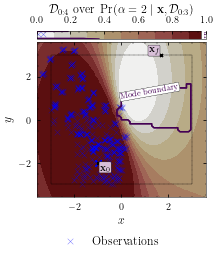

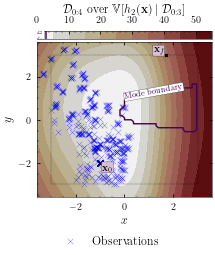

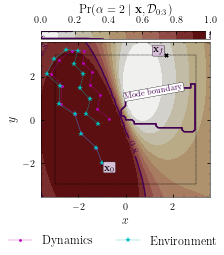

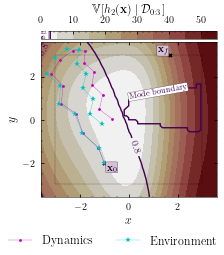

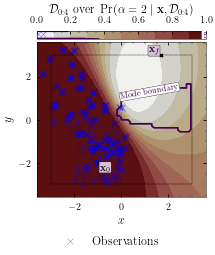

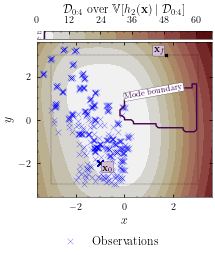

Optimisation result:
     fun: 317.3975137343393
     jac: array([-27.89256861, -19.84760833, -26.20223551, -19.96859161,
       -26.90001855, -19.4273828 , -25.9103726 , -19.87276849,
       -27.99985091, -18.68683012, -26.30699857, -18.65426164,
       -28.18367473, -17.55065932, -28.02951349, -16.94177261,
       -28.16941718, -16.03674185, -18.82198672,  -9.93564792,
       -19.78301699,  -9.51464266,  -8.23097327,  -4.16216912,
        -8.59488147,  -4.11341129,  -1.6604674 ,  -0.95202031,
        -1.70829709,  -0.96141064])
 message: 'Optimization terminated successfully'
    nfev: 48
     nit: 24
    njev: 24
  status: 0
 success: True
       x: array([-0.86178296,  4.08699842, -2.81755289,  4.15559142, -2.00487128,
        5.02340269, -3.00750448,  3.41720977, -0.14680682,  5.18177204,
       -2.26465714,  4.24240518,  1.27923479,  4.51386758,  1.38263331,
        4.15243124,  1.70258885,  1.34886024, -0.42579042, -0.86248459,
        1.50169073, -0.25925427, -0.48797965, -1.08

2022-04-22 12:45:58.234954: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 12:45:58.234970: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


3/3 [==============================] - 2s 876ms/step - loss: -689.8098 - val_loss: 222.5543


2022-04-22 12:45:59.425280: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 12:45:59.434904: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 12:45:59.441465: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_12_45_59

2022-04-22 12:45:59.446225: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_12_45_59/dr-robots-mbp.local.trace.json.gz
2022-04-22 12:45:59.464621: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_12_45_59

2022-04-22 12:45:59.464807: I tensorflow/core/profiler/rpc/client/s

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_5_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 18ms/step - loss: -468.2048 - val_loss: -272.3359
Epoch 3/20000
3/3 [==============================] - 0s 18ms/step - loss: -629.6607 - val_loss: -638.7110
Epoch 4/20000
3/3 [==============================] - 0s 18ms/step - loss: -757.2628 - val_loss: -584.7059
Epoch 5/20000
3/3 [==============================] - 0s 18ms/step - loss: -688.8977 - val_loss: -507.2281
Epoch 6/20000
3/3 [==============================] - 0s 18ms/step - loss: -657.8212 - val_loss: -683.2459
Epoch 7/20000
3/3 [==============================] - 0s 18ms/step - loss: -484.1361 - val_loss: -412.0742
Epoch 8/20000
3/3 [==============================] - 0s 18ms/step - loss: -642.0183 - val_loss: -592.4806
Epoch 9/20000
3/3 [==============================] - 0s 19ms/step - loss: -723.8200 - val_loss: -320.6307
Epoch 10/20000
3/3 [==============================] - 0s 17ms/step - loss: -748.6182 - val_loss: -307.0694
Epoch 11/20000
3/3 [=========================

3/3 [==============================] - 0s 19ms/step - loss: -746.2011 - val_loss: -778.4652
Epoch 77/20000
3/3 [==============================] - 0s 18ms/step - loss: -814.6123 - val_loss: -176.8632
Epoch 78/20000
3/3 [==============================] - 0s 18ms/step - loss: -480.0509 - val_loss: -553.7885
Epoch 79/20000
3/3 [==============================] - 0s 18ms/step - loss: -696.7712 - val_loss: -521.7756
Epoch 80/20000
3/3 [==============================] - 0s 18ms/step - loss: -386.1290 - val_loss: -343.6496
Epoch 81/20000
3/3 [==============================] - 0s 18ms/step - loss: -296.8857 - val_loss: 961.7731
Epoch 82/20000
3/3 [==============================] - 0s 18ms/step - loss: -392.4635 - val_loss: -115.1363
Epoch 83/20000
3/3 [==============================] - 0s 19ms/step - loss: -417.0514 - val_loss: 228.6675
Epoch 84/20000
3/3 [==============================] - 0s 18ms/step - loss: -384.9594 - val_loss: -500.7113
Epoch 85/20000
3/3 [==============================] - 

3/3 [==============================] - 0s 23ms/step - loss: -785.0715 - val_loss: -765.6825
Epoch 153/20000
3/3 [==============================] - 0s 22ms/step - loss: -821.2186 - val_loss: -711.5978
Epoch 154/20000
3/3 [==============================] - 0s 22ms/step - loss: -785.1402 - val_loss: -745.3814
Epoch 155/20000
3/3 [==============================] - 0s 22ms/step - loss: -810.0765 - val_loss: -784.4437
Epoch 156/20000
3/3 [==============================] - 0s 21ms/step - loss: -809.0210 - val_loss: -763.0329
Epoch 157/20000
3/3 [==============================] - 0s 22ms/step - loss: -828.5520 - val_loss: -770.8824
Epoch 158/20000
3/3 [==============================] - 0s 21ms/step - loss: -792.7779 - val_loss: -747.8247
Epoch 159/20000
3/3 [==============================] - 0s 22ms/step - loss: -821.3474 - val_loss: -773.1185
Epoch 160/20000
3/3 [==============================] - 0s 21ms/step - loss: -789.1737 - val_loss: -742.5029
Epoch 161/20000
3/3 [=======================

3/3 [==============================] - 0s 22ms/step - loss: -628.0082 - val_loss: -808.4882
Epoch 229/20000
3/3 [==============================] - 0s 22ms/step - loss: -718.0250 - val_loss: -732.1073
Epoch 230/20000
3/3 [==============================] - 0s 22ms/step - loss: -855.1379 - val_loss: -774.3623
Epoch 231/20000
3/3 [==============================] - 0s 23ms/step - loss: -700.6643 - val_loss: -816.6639
Epoch 232/20000
3/3 [==============================] - 0s 22ms/step - loss: -853.0722 - val_loss: -792.3578
Epoch 233/20000
3/3 [==============================] - 0s 22ms/step - loss: -819.9473 - val_loss: -773.6317
Epoch 234/20000
3/3 [==============================] - 0s 22ms/step - loss: -839.7479 - val_loss: -787.7726
Epoch 235/20000
3/3 [==============================] - 0s 22ms/step - loss: -865.0947 - val_loss: -649.3711
Epoch 236/20000
3/3 [==============================] - 0s 22ms/step - loss: -701.9226 - val_loss: -737.3453
Epoch 237/20000
3/3 [=======================

3/3 [==============================] - 0s 26ms/step - loss: -806.5848 - val_loss: -773.2204
Epoch 305/20000
3/3 [==============================] - 0s 23ms/step - loss: -824.5500 - val_loss: -581.9121
Epoch 306/20000
3/3 [==============================] - 0s 24ms/step - loss: -777.4197 - val_loss: -756.8473
Epoch 307/20000
3/3 [==============================] - 0s 23ms/step - loss: -856.0365 - val_loss: -719.2481
Epoch 308/20000
3/3 [==============================] - 0s 23ms/step - loss: -782.4943 - val_loss: -713.6044
Epoch 309/20000
3/3 [==============================] - 0s 24ms/step - loss: -719.5503 - val_loss: -748.6287
Epoch 310/20000
3/3 [==============================] - 0s 23ms/step - loss: -754.8189 - val_loss: -796.0750
Epoch 311/20000
3/3 [==============================] - 0s 23ms/step - loss: -832.0897 - val_loss: -532.8451
Epoch 312/20000
3/3 [==============================] - 0s 23ms/step - loss: -794.5740 - val_loss: -796.0053
Epoch 313/20000
3/3 [=======================

3/3 [==============================] - 0s 24ms/step - loss: -860.6758 - val_loss: -894.2385
Epoch 381/20000
3/3 [==============================] - 0s 24ms/step - loss: -867.1164 - val_loss: -878.2752
Epoch 382/20000
3/3 [==============================] - 0s 25ms/step - loss: -875.9538 - val_loss: -697.8309
Epoch 383/20000
3/3 [==============================] - 0s 23ms/step - loss: -701.8814 - val_loss: -844.7392
Epoch 384/20000
3/3 [==============================] - 0s 23ms/step - loss: -682.3886 - val_loss: -238.0050
Epoch 385/20000
3/3 [==============================] - 0s 25ms/step - loss: -769.4859 - val_loss: -771.3115
Epoch 386/20000
3/3 [==============================] - 0s 24ms/step - loss: -824.2607 - val_loss: -464.5044
Epoch 387/20000
3/3 [==============================] - 0s 23ms/step - loss: -782.5173 - val_loss: -815.9010
Epoch 388/20000
3/3 [==============================] - 0s 24ms/step - loss: -621.7920 - val_loss: -832.3242
Epoch 389/20000
3/3 [=======================

3/3 [==============================] - 0s 24ms/step - loss: -848.8650 - val_loss: -826.1271
Epoch 457/20000
3/3 [==============================] - 0s 25ms/step - loss: -700.1850 - val_loss: -839.6303
Epoch 458/20000
3/3 [==============================] - 0s 25ms/step - loss: -856.5533 - val_loss: -767.7265
Epoch 459/20000
3/3 [==============================] - 0s 24ms/step - loss: -903.4740 - val_loss: -784.1475
Epoch 460/20000
3/3 [==============================] - 0s 24ms/step - loss: -858.9145 - val_loss: -845.3943
Epoch 461/20000
3/3 [==============================] - 0s 25ms/step - loss: -842.5720 - val_loss: -628.7956
Epoch 462/20000
3/3 [==============================] - 0s 24ms/step - loss: -860.5607 - val_loss: -766.1463
Epoch 463/20000
3/3 [==============================] - 0s 23ms/step - loss: -892.5191 - val_loss: -836.1061
Epoch 464/20000
3/3 [==============================] - 0s 24ms/step - loss: -764.0110 - val_loss: -566.8984
Epoch 465/20000
3/3 [=======================

3/3 [==============================] - 0s 25ms/step - loss: -797.5383 - val_loss: -906.2514
Epoch 533/20000
3/3 [==============================] - 0s 26ms/step - loss: -751.2621 - val_loss: -903.6449
Epoch 534/20000
3/3 [==============================] - 0s 26ms/step - loss: -772.0817 - val_loss: -750.2362
Epoch 535/20000
3/3 [==============================] - 0s 27ms/step - loss: -822.6893 - val_loss: -805.1293
Epoch 536/20000
3/3 [==============================] - 0s 25ms/step - loss: -887.8293 - val_loss: -867.3959
Epoch 537/20000
3/3 [==============================] - 0s 26ms/step - loss: -717.1754 - val_loss: -715.9120
Epoch 538/20000
3/3 [==============================] - 0s 27ms/step - loss: -780.2253 - val_loss: -786.3806
Epoch 539/20000
3/3 [==============================] - 0s 26ms/step - loss: -677.3162 - val_loss: -697.7890
Epoch 540/20000
3/3 [==============================] - 0s 30ms/step - loss: -810.0388 - val_loss: -849.3778
Epoch 541/20000
3/3 [=======================

3/3 [==============================] - 0s 25ms/step - loss: -924.5679 - val_loss: -736.2854
Epoch 609/20000
3/3 [==============================] - 0s 26ms/step - loss: -938.5777 - val_loss: -928.3296
Epoch 610/20000
3/3 [==============================] - 0s 27ms/step - loss: -945.1110 - val_loss: -897.7469
Epoch 611/20000
3/3 [==============================] - 0s 25ms/step - loss: -903.5196 - val_loss: -741.0638
Epoch 612/20000
3/3 [==============================] - 0s 26ms/step - loss: -858.8750 - val_loss: -895.4869
Epoch 613/20000
3/3 [==============================] - 0s 26ms/step - loss: -960.1465 - val_loss: -916.4446
Epoch 614/20000
3/3 [==============================] - 0s 25ms/step - loss: -927.7105 - val_loss: -913.7004
Epoch 615/20000
3/3 [==============================] - 0s 26ms/step - loss: -954.9670 - val_loss: -967.4318
Epoch 616/20000
3/3 [==============================] - 0s 25ms/step - loss: -983.7038 - val_loss: -843.7039
Epoch 617/20000
3/3 [=======================

3/3 [==============================] - 0s 25ms/step - loss: -898.2497 - val_loss: -780.0593
Epoch 685/20000
3/3 [==============================] - 0s 26ms/step - loss: -890.6216 - val_loss: -888.3841
Epoch 686/20000
3/3 [==============================] - 0s 25ms/step - loss: -918.6763 - val_loss: -889.0620
Epoch 687/20000
3/3 [==============================] - 0s 25ms/step - loss: -954.8700 - val_loss: -894.6502
Epoch 688/20000
3/3 [==============================] - 0s 26ms/step - loss: -903.4589 - val_loss: -799.1486
Epoch 689/20000
3/3 [==============================] - 0s 25ms/step - loss: -932.2533 - val_loss: -833.7031
Epoch 690/20000
3/3 [==============================] - 0s 25ms/step - loss: -924.5905 - val_loss: -778.3675
Epoch 691/20000
3/3 [==============================] - 0s 26ms/step - loss: -927.3313 - val_loss: -879.9213
Epoch 692/20000
3/3 [==============================] - 0s 25ms/step - loss: -956.0511 - val_loss: -811.1740
Epoch 693/20000
3/3 [=======================

3/3 [==============================] - 0s 24ms/step - loss: -991.2181 - val_loss: -920.5397
Epoch 761/20000
3/3 [==============================] - 0s 24ms/step - loss: -891.8694 - val_loss: -877.9722
Epoch 762/20000
3/3 [==============================] - 0s 24ms/step - loss: -967.9483 - val_loss: -927.4858
Epoch 763/20000
3/3 [==============================] - 0s 24ms/step - loss: -990.8570 - val_loss: -918.6572
Epoch 764/20000
3/3 [==============================] - 0s 24ms/step - loss: -996.9986 - val_loss: -963.4447
Epoch 765/20000
3/3 [==============================] - 0s 25ms/step - loss: -986.5092 - val_loss: -941.2104
Epoch 766/20000
3/3 [==============================] - 0s 24ms/step - loss: -1001.2227 - val_loss: -870.9112
Epoch 767/20000
3/3 [==============================] - 0s 24ms/step - loss: -993.2550 - val_loss: -942.4216
Epoch 768/20000
3/3 [==============================] - 0s 25ms/step - loss: -961.8413 - val_loss: -929.3546
Epoch 769/20000
3/3 [======================

Epoch 836/20000
3/3 [==============================] - 0s 25ms/step - loss: -944.4200 - val_loss: -885.4197
Epoch 837/20000
3/3 [==============================] - 0s 25ms/step - loss: -987.7620 - val_loss: -812.1333
Epoch 838/20000
3/3 [==============================] - 0s 24ms/step - loss: -858.6256 - val_loss: -957.3051
Epoch 839/20000
3/3 [==============================] - 0s 26ms/step - loss: -912.3923 - val_loss: -765.2061
Epoch 840/20000
3/3 [==============================] - 0s 24ms/step - loss: -945.0805 - val_loss: -967.8925
Epoch 841/20000
3/3 [==============================] - 0s 25ms/step - loss: -965.2129 - val_loss: -675.2795
Epoch 842/20000
3/3 [==============================] - 0s 25ms/step - loss: -939.6478 - val_loss: -824.0199
Epoch 843/20000
3/3 [==============================] - 0s 25ms/step - loss: -938.5940 - val_loss: -950.1525
Epoch 844/20000
3/3 [==============================] - 0s 24ms/step - loss: -818.2843 - val_loss: -820.3937
Epoch 845/20000
3/3 [=======

Epoch 912/20000
3/3 [==============================] - 0s 28ms/step - loss: -870.8155 - val_loss: -883.8984
Epoch 913/20000
3/3 [==============================] - 0s 28ms/step - loss: -964.0161 - val_loss: -775.6536
Epoch 914/20000
3/3 [==============================] - 0s 28ms/step - loss: -860.2105 - val_loss: -894.0710
Epoch 915/20000
3/3 [==============================] - 0s 28ms/step - loss: -885.4322 - val_loss: -723.5814
Epoch 916/20000
3/3 [==============================] - 0s 31ms/step - loss: -819.1548 - val_loss: -785.3653
Epoch 917/20000
3/3 [==============================] - 0s 29ms/step - loss: -861.8747 - val_loss: -469.8798
Epoch 918/20000
3/3 [==============================] - 0s 30ms/step - loss: -955.4575 - val_loss: -838.0729
Epoch 919/20000
3/3 [==============================] - 0s 31ms/step - loss: -903.4109 - val_loss: -486.5174
Epoch 920/20000
3/3 [==============================] - 0s 29ms/step - loss: -913.5630 - val_loss: -785.4997
Epoch 921/20000
3/3 [=======

Epoch 988/20000
3/3 [==============================] - 0s 25ms/step - loss: -973.1301 - val_loss: -929.3917
Epoch 989/20000
3/3 [==============================] - 0s 25ms/step - loss: -970.2791 - val_loss: -868.5089
Epoch 990/20000
3/3 [==============================] - 0s 25ms/step - loss: -973.0682 - val_loss: -857.9402
Epoch 991/20000
3/3 [==============================] - 0s 25ms/step - loss: -980.8826 - val_loss: -904.9330
Epoch 992/20000
3/3 [==============================] - 0s 26ms/step - loss: -992.2364 - val_loss: -920.5509
Epoch 993/20000
3/3 [==============================] - 0s 25ms/step - loss: -987.8129 - val_loss: -920.0114
Epoch 994/20000
3/3 [==============================] - 0s 25ms/step - loss: -998.6447 - val_loss: -926.7504
Epoch 995/20000
3/3 [==============================] - 0s 25ms/step - loss: -997.6461 - val_loss: -944.8500
Epoch 996/20000
3/3 [==============================] - 0s 24ms/step - loss: -993.6558 - val_loss: -916.8626
Epoch 997/20000
3/3 [=======

3/3 [==============================] - 0s 25ms/step - loss: -956.8207 - val_loss: -875.3423
Epoch 1064/20000
3/3 [==============================] - 0s 24ms/step - loss: -976.9250 - val_loss: -949.8607
Epoch 1065/20000
3/3 [==============================] - 0s 25ms/step - loss: -927.0867 - val_loss: -769.9131
Epoch 1066/20000
3/3 [==============================] - 0s 25ms/step - loss: -966.5212 - val_loss: -967.2357
Epoch 1067/20000
3/3 [==============================] - 0s 25ms/step - loss: -930.1749 - val_loss: -908.8436
Epoch 1068/20000
3/3 [==============================] - 0s 25ms/step - loss: -992.6922 - val_loss: -952.2191
Epoch 1069/20000
3/3 [==============================] - 0s 26ms/step - loss: -1008.5942 - val_loss: -948.2065
Epoch 1070/20000
3/3 [==============================] - 0s 25ms/step - loss: -971.5751 - val_loss: -933.2612
Epoch 1071/20000
3/3 [==============================] - 0s 25ms/step - loss: -985.2259 - val_loss: -926.1197
Epoch 1072/20000
3/3 [=============

3/3 [==============================] - 0s 36ms/step - loss: -1005.9935 - val_loss: -931.3745
Epoch 1139/20000
3/3 [==============================] - 0s 32ms/step - loss: -1018.4897 - val_loss: -973.4874
Epoch 1140/20000
3/3 [==============================] - 0s 26ms/step - loss: -1032.9702 - val_loss: -909.9527
Epoch 1141/20000
3/3 [==============================] - 0s 25ms/step - loss: -1014.2222 - val_loss: -974.8858
Epoch 1142/20000
3/3 [==============================] - 0s 26ms/step - loss: -1017.4676 - val_loss: -951.1733
Epoch 1143/20000
3/3 [==============================] - 0s 26ms/step - loss: -1011.9905 - val_loss: -957.1821
Epoch 1144/20000
3/3 [==============================] - 0s 24ms/step - loss: -1007.9425 - val_loss: -879.2608
Epoch 1145/20000
3/3 [==============================] - 0s 27ms/step - loss: -1024.7049 - val_loss: -1000.9866
Epoch 1146/20000
3/3 [==============================] - 0s 26ms/step - loss: -1013.5237 - val_loss: -896.8549
Epoch 1147/20000
3/3 [====

3/3 [==============================] - 0s 24ms/step - loss: -983.7331 - val_loss: -820.0586
Epoch 1214/20000
3/3 [==============================] - 0s 25ms/step - loss: -975.7552 - val_loss: -944.7797
Epoch 1215/20000
3/3 [==============================] - 0s 26ms/step - loss: -982.0111 - val_loss: -892.5988
Epoch 1216/20000
3/3 [==============================] - 0s 25ms/step - loss: -999.4682 - val_loss: -916.9832
Epoch 1217/20000
3/3 [==============================] - 0s 24ms/step - loss: -987.4550 - val_loss: -906.3229
Epoch 1218/20000
3/3 [==============================] - 0s 23ms/step - loss: -1016.6162 - val_loss: -966.0868
Epoch 1219/20000
3/3 [==============================] - 0s 23ms/step - loss: -1009.2902 - val_loss: -931.6683
Epoch 1220/20000
3/3 [==============================] - 0s 23ms/step - loss: -1000.3596 - val_loss: -981.5116
Epoch 1221/20000
3/3 [==============================] - 0s 23ms/step - loss: -972.6808 - val_loss: -918.5657
Epoch 1222/20000
3/3 [===========

3/3 [==============================] - 0s 23ms/step - loss: -890.2926 - val_loss: -862.4557
Epoch 1289/20000
3/3 [==============================] - 0s 23ms/step - loss: -776.6365 - val_loss: -634.3627
Epoch 1290/20000
3/3 [==============================] - 0s 24ms/step - loss: -764.4595 - val_loss: -585.9418
Epoch 1291/20000
3/3 [==============================] - 0s 23ms/step - loss: -877.5376 - val_loss: -779.7400
Epoch 1292/20000
3/3 [==============================] - 0s 23ms/step - loss: -832.5151 - val_loss: -869.3415
Epoch 1293/20000
3/3 [==============================] - 0s 24ms/step - loss: -948.4159 - val_loss: -815.5516
Epoch 1294/20000
3/3 [==============================] - 0s 23ms/step - loss: -889.4564 - val_loss: -873.5372
Epoch 1295/20000
3/3 [==============================] - 0s 23ms/step - loss: -900.6704 - val_loss: -814.3676
Epoch 1296/20000
3/3 [==============================] - 0s 24ms/step - loss: -961.1934 - val_loss: -799.1346
Epoch 1297/20000
3/3 [==============

3/3 [==============================] - 0s 30ms/step - loss: -944.7906 - val_loss: -901.8674
Epoch 1364/20000
3/3 [==============================] - 0s 30ms/step - loss: -983.5475 - val_loss: -894.6450
Epoch 1365/20000
3/3 [==============================] - 0s 24ms/step - loss: -922.7888 - val_loss: -700.2885
Epoch 1366/20000
3/3 [==============================] - 0s 25ms/step - loss: -953.5773 - val_loss: -802.0705
Epoch 1367/20000
3/3 [==============================] - 0s 25ms/step - loss: -961.4327 - val_loss: -857.4189
Epoch 1368/20000
3/3 [==============================] - 0s 25ms/step - loss: -992.0602 - val_loss: -920.0766
Epoch 1369/20000
3/3 [==============================] - 0s 26ms/step - loss: -1015.9855 - val_loss: -961.1802
Epoch 1370/20000
3/3 [==============================] - 0s 27ms/step - loss: -980.2813 - val_loss: -899.8193
Epoch 1371/20000
3/3 [==============================] - 0s 26ms/step - loss: -957.1243 - val_loss: -792.9559
Epoch 1372/20000
3/3 [=============

3/3 [==============================] - 0s 24ms/step - loss: -930.2114 - val_loss: -887.9703
Epoch 1439/20000
3/3 [==============================] - 0s 24ms/step - loss: -951.8793 - val_loss: -743.9180
Epoch 1440/20000
3/3 [==============================] - 0s 25ms/step - loss: -968.5551 - val_loss: -860.7680
Epoch 1441/20000
3/3 [==============================] - 0s 24ms/step - loss: -958.6367 - val_loss: -955.5471
Epoch 1442/20000
3/3 [==============================] - 0s 24ms/step - loss: -835.9589 - val_loss: -839.2500
Epoch 1443/20000
3/3 [==============================] - 0s 23ms/step - loss: -879.8702 - val_loss: -957.2852
Epoch 1444/20000
3/3 [==============================] - 0s 23ms/step - loss: -798.4388 - val_loss: -963.3887
Epoch 1445/20000
3/3 [==============================] - 0s 24ms/step - loss: -594.3526 - val_loss: -733.1657
Epoch 1446/20000
3/3 [==============================] - 0s 24ms/step - loss: -944.6027 - val_loss: -964.8659
Epoch 1447/20000
3/3 [==============

3/3 [==============================] - 0s 23ms/step - loss: -949.1482 - val_loss: -895.0253
Epoch 1514/20000
3/3 [==============================] - 0s 23ms/step - loss: -928.3431 - val_loss: -913.4250
Epoch 1515/20000
3/3 [==============================] - 0s 22ms/step - loss: -925.9615 - val_loss: -897.0639
Epoch 1516/20000
3/3 [==============================] - 0s 23ms/step - loss: -952.8402 - val_loss: -917.4556
Epoch 1517/20000
3/3 [==============================] - 0s 23ms/step - loss: -934.2896 - val_loss: -890.8064
Epoch 1518/20000
3/3 [==============================] - 0s 23ms/step - loss: -960.0458 - val_loss: -942.5723
Epoch 1519/20000
3/3 [==============================] - 0s 23ms/step - loss: -963.5822 - val_loss: -912.5884
Epoch 1520/20000
3/3 [==============================] - 0s 22ms/step - loss: -939.8646 - val_loss: -802.6008
Epoch 1521/20000
3/3 [==============================] - 0s 24ms/step - loss: -999.7956 - val_loss: -800.2868
Epoch 1522/20000
3/3 [==============

3/3 [==============================] - 0s 25ms/step - loss: -833.1554 - val_loss: -685.7481
Epoch 1589/20000
3/3 [==============================] - 0s 26ms/step - loss: -884.2876 - val_loss: -876.1445
Epoch 1590/20000
3/3 [==============================] - 0s 26ms/step - loss: -834.3976 - val_loss: -780.3039
Epoch 1591/20000
3/3 [==============================] - 0s 25ms/step - loss: -874.3521 - val_loss: -806.8506
Epoch 1592/20000
3/3 [==============================] - 0s 25ms/step - loss: -849.5922 - val_loss: -726.1547
Epoch 1593/20000
3/3 [==============================] - 0s 26ms/step - loss: -854.8467 - val_loss: -884.7800
Epoch 1594/20000
3/3 [==============================] - 0s 27ms/step - loss: -895.8029 - val_loss: -889.5221
Epoch 1595/20000
3/3 [==============================] - 0s 26ms/step - loss: -902.0667 - val_loss: -861.9247
Epoch 1596/20000
3/3 [==============================] - 0s 27ms/step - loss: -926.6575 - val_loss: -881.7252
Epoch 1597/20000
3/3 [==============

3/3 [==============================] - 0s 24ms/step - loss: -950.2609 - val_loss: -893.3486
Epoch 1664/20000
3/3 [==============================] - 0s 24ms/step - loss: -972.7207 - val_loss: -939.7060
Epoch 1665/20000
3/3 [==============================] - 0s 24ms/step - loss: -974.0104 - val_loss: -913.4909
Epoch 1666/20000
3/3 [==============================] - 0s 24ms/step - loss: -927.9419 - val_loss: -919.2344
Epoch 1667/20000
3/3 [==============================] - 0s 25ms/step - loss: -961.8340 - val_loss: -695.6168
Epoch 1668/20000
3/3 [==============================] - 0s 24ms/step - loss: -966.3033 - val_loss: -923.5126
Epoch 1669/20000
3/3 [==============================] - 0s 26ms/step - loss: -937.5344 - val_loss: -960.7316
Epoch 1670/20000
3/3 [==============================] - 0s 24ms/step - loss: -949.2434 - val_loss: -943.3180
Epoch 1671/20000
3/3 [==============================] - 0s 25ms/step - loss: -941.3167 - val_loss: -845.3094
Epoch 1672/20000
3/3 [==============

3/3 [==============================] - 0s 24ms/step - loss: -1018.8568 - val_loss: -931.5029
Epoch 1739/20000
3/3 [==============================] - 0s 25ms/step - loss: -960.8146 - val_loss: -948.3884
Epoch 1740/20000
3/3 [==============================] - 0s 26ms/step - loss: -1019.5902 - val_loss: -992.6855
Epoch 1741/20000
3/3 [==============================] - 0s 26ms/step - loss: -905.0767 - val_loss: -938.2478
Epoch 1742/20000
3/3 [==============================] - 0s 25ms/step - loss: -1010.7736 - val_loss: -897.1807
Epoch 1743/20000
3/3 [==============================] - 0s 25ms/step - loss: -935.6364 - val_loss: -971.4875
Epoch 1744/20000
3/3 [==============================] - 0s 24ms/step - loss: -1030.6686 - val_loss: -928.1376
Epoch 1745/20000
3/3 [==============================] - 0s 24ms/step - loss: -928.1804 - val_loss: -864.7149
Epoch 1746/20000
3/3 [==============================] - 0s 24ms/step - loss: -984.9169 - val_loss: -881.6150
Epoch 1747/20000
3/3 [==========

3/3 [==============================] - 0s 29ms/step - loss: -925.8894 - val_loss: -926.8559
Epoch 1814/20000
3/3 [==============================] - 0s 27ms/step - loss: -946.9217 - val_loss: -965.7220
Epoch 1815/20000
3/3 [==============================] - 0s 28ms/step - loss: -982.9330 - val_loss: -895.4889
Epoch 1816/20000
3/3 [==============================] - 0s 27ms/step - loss: -1011.9052 - val_loss: -974.6906
Epoch 1817/20000
3/3 [==============================] - 0s 27ms/step - loss: -952.4777 - val_loss: -993.1485
Epoch 1818/20000
3/3 [==============================] - 0s 28ms/step - loss: -988.2534 - val_loss: -918.3260
Epoch 1819/20000
3/3 [==============================] - 0s 29ms/step - loss: -963.5634 - val_loss: -852.0190
Epoch 1820/20000
3/3 [==============================] - 0s 28ms/step - loss: -965.2449 - val_loss: -999.2872
Epoch 1821/20000
3/3 [==============================] - 0s 25ms/step - loss: -977.5122 - val_loss: -997.2366
Epoch 1822/20000
3/3 [=============

3/3 [==============================] - 0s 24ms/step - loss: -996.0877 - val_loss: -993.0057
Epoch 1889/20000
3/3 [==============================] - 0s 24ms/step - loss: -1048.6531 - val_loss: -932.2511
Epoch 1890/20000
3/3 [==============================] - 0s 26ms/step - loss: -1005.8599 - val_loss: -997.5132
Epoch 1891/20000
3/3 [==============================] - 0s 25ms/step - loss: -1001.9504 - val_loss: -985.5667
Epoch 1892/20000
3/3 [==============================] - 0s 24ms/step - loss: -981.6898 - val_loss: -811.7259
Epoch 1893/20000
3/3 [==============================] - 0s 24ms/step - loss: -1030.0946 - val_loss: -979.1672
Epoch 1894/20000
3/3 [==============================] - 0s 25ms/step - loss: -948.2855 - val_loss: -999.9858
Epoch 1895/20000
3/3 [==============================] - 0s 25ms/step - loss: -999.6182 - val_loss: -968.9857
Epoch 1896/20000
3/3 [==============================] - 0s 24ms/step - loss: -992.0955 - val_loss: -865.0706
Epoch 1897/20000
3/3 [==========

3/3 [==============================] - 0s 23ms/step - loss: -903.6090 - val_loss: -906.5021
Epoch 1964/20000
3/3 [==============================] - 0s 23ms/step - loss: -924.3468 - val_loss: -903.7527
Epoch 1965/20000
3/3 [==============================] - 0s 24ms/step - loss: -982.1190 - val_loss: -940.2340
Epoch 1966/20000
3/3 [==============================] - 0s 23ms/step - loss: -954.2157 - val_loss: -926.0378
Epoch 1967/20000
3/3 [==============================] - 0s 23ms/step - loss: -965.4878 - val_loss: -914.9023
Epoch 1968/20000
3/3 [==============================] - 0s 23ms/step - loss: -984.6311 - val_loss: -928.4833
Epoch 1969/20000
3/3 [==============================] - 0s 23ms/step - loss: -987.6668 - val_loss: -941.0834
Epoch 1970/20000
3/3 [==============================] - 0s 23ms/step - loss: -1025.4363 - val_loss: -982.3684
Epoch 1971/20000
3/3 [==============================] - 0s 23ms/step - loss: -1001.6445 - val_loss: -913.2763
Epoch 1972/20000
3/3 [============

/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2002/20000
3/3 [==============================] - 0s 23ms/step - loss: -863.5942 - val_loss: -903.5986
Epoch 2003/20000
3/3 [==============================] - 0s 22ms/step - loss: -800.8423 - val_loss: -647.1626
Epoch 2004/20000
3/3 [==============================] - 0s 20ms/step - loss: -612.0024 - val_loss: -832.4115
Epoch 2005/20000
3/3 [==============================] - 0s 19ms/step - loss: -953.5307 - val_loss: -707.6789
Epoch 2006/20000
3/3 [==============================] - 0s 21ms/step - loss: -838.4718 - val_loss: -801.4442
Epoch 2007/20000
3/3 [==============================] - 0s 21ms/step - loss: -685.4737 - val_loss: -833.4382
Epoch 2008/20000
3/3 [==============================] - 0s 20ms/step - loss: -816.2886 - val_loss: -788.9316
Epoch 2009/20000
3/3 [==============================] - 0s 21ms/step - loss: -846.6436 - val_loss: 157.0309
Epoch 2010/20000
3/3 [==============================] - 0s 21ms/step - loss: -498.2829 - val_loss: -937.7817
Epoch 2011/20000
3/3

3/3 [==============================] - 0s 24ms/step - loss: -830.9815 - val_loss: -608.7408
Epoch 2078/20000
3/3 [==============================] - 0s 23ms/step - loss: -791.2907 - val_loss: -758.0330
Epoch 2079/20000
3/3 [==============================] - 0s 23ms/step - loss: -715.2983 - val_loss: -480.9696
Epoch 2080/20000
3/3 [==============================] - 0s 23ms/step - loss: -804.2703 - val_loss: -207.0333
Epoch 2081/20000
3/3 [==============================] - 0s 23ms/step - loss: -808.3033 - val_loss: -557.1615
Epoch 2082/20000
3/3 [==============================] - 0s 24ms/step - loss: -826.9285 - val_loss: -765.5483
Epoch 2083/20000
3/3 [==============================] - 0s 24ms/step - loss: -833.0341 - val_loss: -374.7577
Epoch 2084/20000
3/3 [==============================] - 0s 23ms/step - loss: -857.6706 - val_loss: -787.5975
Epoch 2085/20000
3/3 [==============================] - 0s 22ms/step - loss: -844.0232 - val_loss: -785.6709
Epoch 2086/20000
3/3 [==============

3/3 [==============================] - 0s 23ms/step - loss: -860.0225 - val_loss: -770.9638
Epoch 2153/20000
3/3 [==============================] - 0s 24ms/step - loss: -852.2615 - val_loss: -809.8613
Epoch 2154/20000
3/3 [==============================] - 0s 23ms/step - loss: -872.9450 - val_loss: -781.0438
Epoch 2155/20000
3/3 [==============================] - 0s 23ms/step - loss: -866.6556 - val_loss: -817.5543
Epoch 2156/20000
3/3 [==============================] - 0s 23ms/step - loss: -804.1977 - val_loss: -785.2703
Epoch 2157/20000
3/3 [==============================] - 0s 23ms/step - loss: -796.3309 - val_loss: -831.2791
Epoch 2158/20000
3/3 [==============================] - 0s 23ms/step - loss: -890.2946 - val_loss: -929.1414
Epoch 2159/20000
3/3 [==============================] - 0s 23ms/step - loss: -815.9302 - val_loss: -881.9156
Epoch 2160/20000
3/3 [==============================] - 0s 23ms/step - loss: -905.2191 - val_loss: -844.2847
Epoch 2161/20000
3/3 [==============

3/3 [==============================] - 0s 25ms/step - loss: -909.2067 - val_loss: -917.0559
Epoch 2228/20000
3/3 [==============================] - 0s 26ms/step - loss: -925.5147 - val_loss: -741.3287
Epoch 2229/20000
3/3 [==============================] - 0s 26ms/step - loss: -883.8046 - val_loss: -832.5609
Epoch 2230/20000
3/3 [==============================] - 0s 25ms/step - loss: -865.4135 - val_loss: -931.1428
Epoch 2231/20000
3/3 [==============================] - 0s 27ms/step - loss: -882.8372 - val_loss: -851.8357
Epoch 2232/20000
3/3 [==============================] - 0s 26ms/step - loss: -868.5900 - val_loss: -966.6005
Epoch 2233/20000
3/3 [==============================] - 0s 28ms/step - loss: -852.7533 - val_loss: -571.4635
Epoch 2234/20000
3/3 [==============================] - 0s 26ms/step - loss: -932.8069 - val_loss: -925.8108
Epoch 2235/20000
3/3 [==============================] - 0s 28ms/step - loss: -861.4024 - val_loss: -922.4279
Epoch 2236/20000
3/3 [==============

3/3 [==============================] - 0s 26ms/step - loss: -978.5641 - val_loss: -922.1450
Epoch 2303/20000
3/3 [==============================] - 0s 26ms/step - loss: -978.9259 - val_loss: -898.8189
Epoch 2304/20000
3/3 [==============================] - 0s 27ms/step - loss: -927.5695 - val_loss: -926.4452
Epoch 2305/20000
3/3 [==============================] - 0s 28ms/step - loss: -954.7390 - val_loss: -743.2784
Epoch 2306/20000
3/3 [==============================] - 0s 26ms/step - loss: -934.7471 - val_loss: -915.7659
Epoch 2307/20000
3/3 [==============================] - 0s 27ms/step - loss: -978.9209 - val_loss: -770.3230
Epoch 2308/20000
3/3 [==============================] - 0s 26ms/step - loss: -972.5056 - val_loss: -438.4541
Epoch 2309/20000
3/3 [==============================] - 0s 25ms/step - loss: -976.4744 - val_loss: -935.4034
Epoch 2310/20000
3/3 [==============================] - 0s 25ms/step - loss: -961.7211 - val_loss: -878.5304
Epoch 2311/20000
3/3 [==============

3/3 [==============================] - 0s 26ms/step - loss: -927.9351 - val_loss: -936.0512
Epoch 2378/20000
3/3 [==============================] - 0s 27ms/step - loss: -1011.3097 - val_loss: -706.4242
Epoch 2379/20000
3/3 [==============================] - 0s 27ms/step - loss: -922.1755 - val_loss: -965.5692
Epoch 2380/20000
3/3 [==============================] - 0s 27ms/step - loss: -1006.5318 - val_loss: -942.3961
Epoch 2381/20000
3/3 [==============================] - 0s 27ms/step - loss: -979.5649 - val_loss: -927.4048
Epoch 2382/20000
3/3 [==============================] - 0s 26ms/step - loss: -992.1523 - val_loss: -979.3287
Epoch 2383/20000
3/3 [==============================] - 0s 26ms/step - loss: -992.7824 - val_loss: -722.8961
Epoch 2384/20000
3/3 [==============================] - 0s 26ms/step - loss: -998.5948 - val_loss: -978.1241
Epoch 2385/20000
3/3 [==============================] - 0s 26ms/step - loss: -1002.3223 - val_loss: -879.4071
Epoch 2386/20000
3/3 [===========

3/3 [==============================] - 0s 29ms/step - loss: -861.2225 - val_loss: -938.8729
Epoch 2453/20000
3/3 [==============================] - 0s 30ms/step - loss: -837.5337 - val_loss: -558.2808
Epoch 2454/20000
3/3 [==============================] - 0s 29ms/step - loss: -841.1100 - val_loss: -853.7878
Epoch 2455/20000
3/3 [==============================] - 0s 29ms/step - loss: -781.5205 - val_loss: -871.9434
Epoch 2456/20000
3/3 [==============================] - 0s 30ms/step - loss: -770.3006 - val_loss: -806.6040
Epoch 2457/20000
3/3 [==============================] - 0s 30ms/step - loss: -901.4655 - val_loss: -879.8639
Epoch 2458/20000
3/3 [==============================] - 0s 28ms/step - loss: -892.7954 - val_loss: -764.5919
Epoch 2459/20000
3/3 [==============================] - 0s 29ms/step - loss: -984.6512 - val_loss: -804.5916
Epoch 2460/20000
3/3 [==============================] - 0s 29ms/step - loss: -919.2940 - val_loss: -704.7990
Epoch 2461/20000
3/3 [==============

3/3 [==============================] - 0s 26ms/step - loss: -958.3035 - val_loss: -935.1851
Epoch 2528/20000
3/3 [==============================] - 0s 26ms/step - loss: -899.4527 - val_loss: -691.3872
Epoch 2529/20000
3/3 [==============================] - 0s 26ms/step - loss: -925.6343 - val_loss: -752.3435
Epoch 2530/20000
3/3 [==============================] - 0s 26ms/step - loss: -988.3821 - val_loss: -986.4104
Epoch 2531/20000
3/3 [==============================] - 0s 26ms/step - loss: -907.9601 - val_loss: -965.6279
Epoch 2532/20000
3/3 [==============================] - 0s 26ms/step - loss: -981.9959 - val_loss: -862.2789
Epoch 2533/20000
3/3 [==============================] - 0s 26ms/step - loss: -938.2734 - val_loss: -884.7501
Epoch 2534/20000
3/3 [==============================] - 0s 26ms/step - loss: -948.6467 - val_loss: -767.1203
Epoch 2535/20000
3/3 [==============================] - 0s 26ms/step - loss: -823.3117 - val_loss: -853.2630
Epoch 2536/20000
3/3 [==============

3/3 [==============================] - 0s 26ms/step - loss: -951.9096 - val_loss: -895.1398
Epoch 2603/20000
3/3 [==============================] - 0s 25ms/step - loss: -1004.1936 - val_loss: -979.3919
Epoch 2604/20000
3/3 [==============================] - 0s 26ms/step - loss: -954.4406 - val_loss: -957.4181
Epoch 2605/20000
3/3 [==============================] - 0s 26ms/step - loss: -1003.3696 - val_loss: -999.1743
Epoch 2606/20000
3/3 [==============================] - 0s 25ms/step - loss: -999.9972 - val_loss: -876.4264
Epoch 2607/20000
3/3 [==============================] - 0s 26ms/step - loss: -969.7809 - val_loss: -971.7151
Epoch 2608/20000
3/3 [==============================] - 0s 26ms/step - loss: -842.4464 - val_loss: -997.2913
Epoch 2609/20000
3/3 [==============================] - 0s 25ms/step - loss: -982.7406 - val_loss: -905.0723
Epoch 2610/20000
3/3 [==============================] - 0s 26ms/step - loss: -999.7687 - val_loss: -763.0711
Epoch 2611/20000
3/3 [============

3/3 [==============================] - 0s 25ms/step - loss: -902.4211 - val_loss: -90.6642
Epoch 2678/20000
3/3 [==============================] - 0s 26ms/step - loss: -888.9213 - val_loss: -854.5605
Epoch 2679/20000
3/3 [==============================] - 0s 27ms/step - loss: -740.2622 - val_loss: -817.4666
Epoch 2680/20000
3/3 [==============================] - 0s 25ms/step - loss: -650.9846 - val_loss: -702.4719
Epoch 2681/20000
3/3 [==============================] - 0s 26ms/step - loss: -940.4367 - val_loss: -901.9385
Epoch 2682/20000
3/3 [==============================] - 0s 26ms/step - loss: -901.9002 - val_loss: -949.5149
Epoch 2683/20000
3/3 [==============================] - 0s 25ms/step - loss: -837.5727 - val_loss: -471.2844
Epoch 2684/20000
3/3 [==============================] - 0s 26ms/step - loss: -935.9556 - val_loss: -852.8514
Epoch 2685/20000
3/3 [==============================] - 0s 26ms/step - loss: -745.3759 - val_loss: -969.2063
Epoch 2686/20000
3/3 [===============

3/3 [==============================] - 0s 25ms/step - loss: -1003.0122 - val_loss: -956.6113
Epoch 2753/20000
3/3 [==============================] - 0s 25ms/step - loss: -1005.0188 - val_loss: -889.9950
Epoch 2754/20000
3/3 [==============================] - 0s 25ms/step - loss: -1007.5033 - val_loss: -1000.1075
Epoch 2755/20000
3/3 [==============================] - 0s 25ms/step - loss: -1039.7529 - val_loss: -975.8346
Epoch 2756/20000
3/3 [==============================] - 0s 25ms/step - loss: -1029.2357 - val_loss: -996.2590
Epoch 2757/20000
3/3 [==============================] - 0s 26ms/step - loss: -1007.0537 - val_loss: -1005.0659
Epoch 2758/20000
3/3 [==============================] - 0s 26ms/step - loss: -1036.9406 - val_loss: -926.0714
Epoch 2759/20000
3/3 [==============================] - 0s 25ms/step - loss: -1042.1157 - val_loss: -990.7051
Epoch 2760/20000
3/3 [==============================] - 0s 26ms/step - loss: -1052.4118 - val_loss: -983.0638
Epoch 2761/20000
3/3 [===

Epoch 2827/20000
3/3 [==============================] - 0s 25ms/step - loss: -1048.1232 - val_loss: -1005.5042
Epoch 2828/20000
3/3 [==============================] - 0s 25ms/step - loss: -1026.9929 - val_loss: -998.9611
Epoch 2829/20000
3/3 [==============================] - 0s 24ms/step - loss: -1021.2756 - val_loss: -815.6772
Epoch 2830/20000
3/3 [==============================] - 0s 24ms/step - loss: -1041.6368 - val_loss: -1057.4879
Epoch 2831/20000
3/3 [==============================] - 0s 25ms/step - loss: -1031.0526 - val_loss: -1058.1896
Epoch 2832/20000
3/3 [==============================] - 0s 25ms/step - loss: -1038.9530 - val_loss: -999.3402
Epoch 2833/20000
3/3 [==============================] - 0s 25ms/step - loss: -1039.7366 - val_loss: -999.1501
Epoch 2834/20000
3/3 [==============================] - 0s 25ms/step - loss: -958.2315 - val_loss: -943.5809
Epoch 2835/20000
3/3 [==============================] - 0s 25ms/step - loss: -1012.8359 - val_loss: -1003.2778
Epoch 2

Epoch 2902/20000
3/3 [==============================] - 0s 25ms/step - loss: -1023.0377 - val_loss: -949.4609
Epoch 2903/20000
3/3 [==============================] - 0s 25ms/step - loss: -1026.4573 - val_loss: -951.9977
Epoch 2904/20000
3/3 [==============================] - 0s 24ms/step - loss: -1031.5142 - val_loss: -985.2753
Epoch 2905/20000
3/3 [==============================] - 0s 27ms/step - loss: -995.6051 - val_loss: -955.3998
Epoch 2906/20000
3/3 [==============================] - 0s 25ms/step - loss: -1024.7657 - val_loss: -1043.7511
Epoch 2907/20000
3/3 [==============================] - 0s 25ms/step - loss: -984.0574 - val_loss: -957.3693
Epoch 2908/20000
3/3 [==============================] - 0s 24ms/step - loss: -1042.3059 - val_loss: -953.5932
Epoch 2909/20000
3/3 [==============================] - 0s 25ms/step - loss: -1044.2731 - val_loss: -986.4706
Epoch 2910/20000
3/3 [==============================] - 0s 24ms/step - loss: -910.1715 - val_loss: -869.3547
Epoch 2911/2

3/3 [==============================] - 0s 24ms/step - loss: -1002.5397 - val_loss: -914.6214
Epoch 2977/20000
3/3 [==============================] - 0s 23ms/step - loss: -925.7331 - val_loss: -887.7269
Epoch 2978/20000
3/3 [==============================] - 0s 24ms/step - loss: -925.0607 - val_loss: -870.8355
Epoch 2979/20000
3/3 [==============================] - 0s 24ms/step - loss: -925.9780 - val_loss: -972.2038
Epoch 2980/20000
3/3 [==============================] - 0s 24ms/step - loss: -888.6341 - val_loss: -939.7846
Epoch 2981/20000
3/3 [==============================] - 0s 23ms/step - loss: -882.7825 - val_loss: -921.1659
Epoch 2982/20000
3/3 [==============================] - 0s 24ms/step - loss: -941.3229 - val_loss: -952.0152
Epoch 2983/20000
3/3 [==============================] - 0s 24ms/step - loss: -928.1987 - val_loss: -967.2221
Epoch 2984/20000
3/3 [==============================] - 0s 24ms/step - loss: -950.9738 - val_loss: -867.9630
Epoch 2985/20000
3/3 [=============

3/3 [==============================] - 0s 28ms/step - loss: -1018.5773 - val_loss: -999.9959
Epoch 3052/20000
3/3 [==============================] - 0s 32ms/step - loss: -1015.3441 - val_loss: -842.5613
Epoch 3053/20000
3/3 [==============================] - 0s 28ms/step - loss: -1018.3183 - val_loss: -873.3059
Epoch 3054/20000
3/3 [==============================] - 0s 27ms/step - loss: -965.1470 - val_loss: -968.7188
Epoch 3055/20000
3/3 [==============================] - 0s 25ms/step - loss: -990.3165 - val_loss: -967.6450
Epoch 3056/20000
3/3 [==============================] - 0s 25ms/step - loss: -991.4129 - val_loss: -995.2031
Epoch 3057/20000
3/3 [==============================] - 0s 33ms/step - loss: -958.0874 - val_loss: -858.4356
Epoch 3058/20000
3/3 [==============================] - 0s 26ms/step - loss: -967.8222 - val_loss: -1040.8211
Epoch 3059/20000
3/3 [==============================] - 0s 25ms/step - loss: -915.0305 - val_loss: -976.4552
Epoch 3060/20000
3/3 [==========

3/3 [==============================] - 0s 24ms/step - loss: -952.7608 - val_loss: -879.8950
Epoch 3127/20000
3/3 [==============================] - 0s 24ms/step - loss: -987.9703 - val_loss: -1008.0884
Epoch 3128/20000
3/3 [==============================] - 0s 25ms/step - loss: -1073.3692 - val_loss: -1030.9083
Epoch 3129/20000
3/3 [==============================] - 0s 26ms/step - loss: -919.9474 - val_loss: -831.8216
Epoch 3130/20000
3/3 [==============================] - 0s 27ms/step - loss: -1005.8223 - val_loss: -967.8458
Epoch 3131/20000
3/3 [==============================] - 0s 28ms/step - loss: -886.6143 - val_loss: -989.0223
Epoch 3132/20000
3/3 [==============================] - 0s 26ms/step - loss: -973.2675 - val_loss: -1059.8806
Epoch 3133/20000
3/3 [==============================] - 0s 25ms/step - loss: -947.0504 - val_loss: -668.6503
Epoch 3134/20000
3/3 [==============================] - 0s 26ms/step - loss: -900.4083 - val_loss: -899.1054
Epoch 3135/20000
3/3 [=========

Epoch 3201/20000
3/3 [==============================] - 0s 28ms/step - loss: -891.6438 - val_loss: -769.0099
Epoch 3202/20000
3/3 [==============================] - 0s 28ms/step - loss: -1000.1048 - val_loss: -992.3732
Epoch 3203/20000
3/3 [==============================] - 0s 27ms/step - loss: -916.4141 - val_loss: -887.1011
Epoch 3204/20000
3/3 [==============================] - 0s 27ms/step - loss: -1024.4570 - val_loss: -974.9765
Epoch 3205/20000
3/3 [==============================] - 0s 39ms/step - loss: -958.1620 - val_loss: -1018.8603
Epoch 3206/20000
3/3 [==============================] - 0s 35ms/step - loss: -1008.4486 - val_loss: -838.7803
Epoch 3207/20000
3/3 [==============================] - 0s 39ms/step - loss: -732.0847 - val_loss: -894.5921
Epoch 3208/20000
3/3 [==============================] - 0s 37ms/step - loss: -723.2194 - val_loss: -954.1147
Epoch 3209/20000
3/3 [==============================] - 0s 39ms/step - loss: -879.7595 - val_loss: -950.4358
Epoch 3210/2000

Epoch 3276/20000
3/3 [==============================] - 0s 27ms/step - loss: -627.7648 - val_loss: -749.9573
Epoch 3277/20000
3/3 [==============================] - 0s 28ms/step - loss: -756.3638 - val_loss: -714.0253
Epoch 3278/20000
3/3 [==============================] - 0s 29ms/step - loss: -550.5621 - val_loss: -801.6124
Epoch 3279/20000
3/3 [==============================] - 0s 30ms/step - loss: -761.6702 - val_loss: -880.1462
Epoch 3280/20000
3/3 [==============================] - 0s 30ms/step - loss: -855.0279 - val_loss: -845.4086
Epoch 3281/20000
3/3 [==============================] - 0s 31ms/step - loss: -761.6588 - val_loss: -813.3994
Epoch 3282/20000
3/3 [==============================] - 0s 30ms/step - loss: -917.2853 - val_loss: -650.4110
Epoch 3283/20000
3/3 [==============================] - 0s 32ms/step - loss: -921.4562 - val_loss: -770.3404
Epoch 3284/20000
3/3 [==============================] - 0s 30ms/step - loss: -880.9341 - val_loss: -887.9015
Epoch 3285/20000
3/

Epoch 3351/20000
3/3 [==============================] - 0s 27ms/step - loss: -1003.0288 - val_loss: -788.0092
Epoch 3352/20000
3/3 [==============================] - 0s 27ms/step - loss: -855.9221 - val_loss: -1019.6491
Epoch 3353/20000
3/3 [==============================] - 0s 27ms/step - loss: -886.5695 - val_loss: -873.1942
Epoch 3354/20000
3/3 [==============================] - 0s 26ms/step - loss: -89.6607 - val_loss: -776.0387
Epoch 3355/20000
3/3 [==============================] - 0s 28ms/step - loss: -626.5415 - val_loss: -987.1060
Epoch 3356/20000
3/3 [==============================] - 0s 26ms/step - loss: -338.4495 - val_loss: -401.0816
Epoch 3357/20000
3/3 [==============================] - 0s 26ms/step - loss: 47.5064 - val_loss: 673.3532
Epoch 3358/20000
3/3 [==============================] - 0s 27ms/step - loss: 170.6313 - val_loss: -205.1974
Epoch 3359/20000
3/3 [==============================] - 0s 26ms/step - loss: 127.7824 - val_loss: -343.9983
Epoch 3360/20000
3/3 [=

3/3 [==============================] - 0s 29ms/step - loss: -982.3874 - val_loss: -968.5768
Epoch 3427/20000
3/3 [==============================] - 0s 28ms/step - loss: -989.4404 - val_loss: -992.1037
Epoch 3428/20000
3/3 [==============================] - 0s 27ms/step - loss: -996.6648 - val_loss: -992.8702
Epoch 3429/20000
3/3 [==============================] - 0s 29ms/step - loss: -1041.0191 - val_loss: -1020.5965
Epoch 3430/20000
3/3 [==============================] - 0s 28ms/step - loss: -976.6573 - val_loss: -962.2907
Epoch 3431/20000
3/3 [==============================] - 0s 26ms/step - loss: -1025.9550 - val_loss: -958.5693
Epoch 3432/20000
3/3 [==============================] - 0s 26ms/step - loss: -1028.9290 - val_loss: -854.2777
Epoch 3433/20000
3/3 [==============================] - 0s 26ms/step - loss: -998.0395 - val_loss: -983.0984
Epoch 3434/20000
3/3 [==============================] - 0s 26ms/step - loss: -1030.4077 - val_loss: -733.0178
Epoch 3435/20000
3/3 [=========

Epoch 3501/20000
3/3 [==============================] - 0s 48ms/step - loss: -781.3046 - val_loss: -914.5776
Epoch 3502/20000
3/3 [==============================] - 0s 30ms/step - loss: -488.9666 - val_loss: -564.5570
Epoch 3503/20000
3/3 [==============================] - 0s 33ms/step - loss: -704.6705 - val_loss: -895.4752
Epoch 3504/20000
3/3 [==============================] - 0s 31ms/step - loss: -917.4445 - val_loss: -889.4016
Epoch 3505/20000
3/3 [==============================] - 0s 32ms/step - loss: -816.4120 - val_loss: -913.2909
Epoch 3506/20000
3/3 [==============================] - 0s 31ms/step - loss: -883.7768 - val_loss: -756.4427
Epoch 3507/20000
3/3 [==============================] - 0s 32ms/step - loss: -936.3684 - val_loss: -807.4383
Epoch 3508/20000
3/3 [==============================] - 0s 30ms/step - loss: -790.3359 - val_loss: -799.6345
Epoch 3509/20000
3/3 [==============================] - 0s 30ms/step - loss: -853.2297 - val_loss: -912.3589
Epoch 3510/20000
3/

Epoch 3576/20000
3/3 [==============================] - 0s 26ms/step - loss: -923.1665 - val_loss: -868.6836
Epoch 3577/20000
3/3 [==============================] - 0s 25ms/step - loss: -916.6209 - val_loss: -858.9401
Epoch 3578/20000
3/3 [==============================] - 0s 26ms/step - loss: -982.4872 - val_loss: -888.8611
Epoch 3579/20000
3/3 [==============================] - 0s 26ms/step - loss: -832.7971 - val_loss: -894.5514
Epoch 3580/20000
3/3 [==============================] - 0s 26ms/step - loss: -806.7674 - val_loss: -919.7451
Epoch 3581/20000
3/3 [==============================] - 0s 26ms/step - loss: -872.1362 - val_loss: -911.2061
Epoch 3582/20000
3/3 [==============================] - 0s 27ms/step - loss: -947.9467 - val_loss: -632.5948
Epoch 3583/20000
3/3 [==============================] - 0s 28ms/step - loss: -881.7583 - val_loss: -524.7817
Epoch 3584/20000
3/3 [==============================] - 0s 27ms/step - loss: -996.8094 - val_loss: -806.8544
Epoch 3585/20000
3/

Epoch 3651/20000
3/3 [==============================] - 0s 27ms/step - loss: -1000.0609 - val_loss: -995.7045
Epoch 3652/20000
3/3 [==============================] - 0s 26ms/step - loss: -996.9858 - val_loss: -938.2107
Epoch 3653/20000
3/3 [==============================] - 0s 26ms/step - loss: -1012.3684 - val_loss: -972.5291
Epoch 3654/20000
3/3 [==============================] - 0s 27ms/step - loss: -944.7786 - val_loss: -933.1717
Epoch 3655/20000
3/3 [==============================] - 0s 25ms/step - loss: -1015.0727 - val_loss: -876.6814
Epoch 3656/20000
3/3 [==============================] - 0s 34ms/step - loss: -993.0120 - val_loss: -946.5679
Epoch 3657/20000
3/3 [==============================] - 0s 28ms/step - loss: -989.0272 - val_loss: -963.6265
Epoch 3658/20000
3/3 [==============================] - 0s 27ms/step - loss: -949.2371 - val_loss: -999.7779
Epoch 3659/20000
3/3 [==============================] - 0s 27ms/step - loss: -993.7357 - val_loss: -981.2420
Epoch 3660/20000

Epoch 3726/20000
3/3 [==============================] - 0s 26ms/step - loss: -1048.7040 - val_loss: -995.9128
Epoch 3727/20000
3/3 [==============================] - 0s 27ms/step - loss: -998.5960 - val_loss: -346.2586
Epoch 3728/20000
3/3 [==============================] - 0s 26ms/step - loss: -987.4828 - val_loss: -1044.2504
Epoch 3729/20000
3/3 [==============================] - 0s 26ms/step - loss: -1010.1665 - val_loss: -655.8566
Epoch 3730/20000
3/3 [==============================] - 0s 27ms/step - loss: -972.7702 - val_loss: -995.2112
Epoch 3731/20000
3/3 [==============================] - 0s 27ms/step - loss: -1063.9430 - val_loss: -1056.0748
Epoch 3732/20000
3/3 [==============================] - 0s 26ms/step - loss: -1062.2594 - val_loss: -1023.4457
Epoch 3733/20000
3/3 [==============================] - 0s 27ms/step - loss: -1045.5113 - val_loss: -1035.5292
Epoch 3734/20000
3/3 [==============================] - 0s 26ms/step - loss: -1014.8372 - val_loss: -1051.2393
Epoch 37

Epoch 3801/20000
3/3 [==============================] - 0s 39ms/step - loss: -778.6026 - val_loss: -757.1452
Epoch 3802/20000
3/3 [==============================] - 0s 32ms/step - loss: -770.6879 - val_loss: -792.6295
Epoch 3803/20000
3/3 [==============================] - 0s 31ms/step - loss: -814.3466 - val_loss: -804.2704
Epoch 3804/20000
3/3 [==============================] - 0s 27ms/step - loss: -775.6066 - val_loss: -801.5825
Epoch 3805/20000
3/3 [==============================] - 0s 27ms/step - loss: -802.6377 - val_loss: -731.6067
Epoch 3806/20000
3/3 [==============================] - 0s 28ms/step - loss: -839.4222 - val_loss: -558.2536
Epoch 3807/20000
3/3 [==============================] - 0s 37ms/step - loss: -803.1060 - val_loss: -771.4436
Epoch 3808/20000
3/3 [==============================] - 0s 29ms/step - loss: -784.7520 - val_loss: -688.6282
Epoch 3809/20000
3/3 [==============================] - 0s 45ms/step - loss: -845.6821 - val_loss: -856.9170
Epoch 3810/20000
3/

Epoch 3876/20000
3/3 [==============================] - 0s 32ms/step - loss: -906.4127 - val_loss: -846.2032
Epoch 3877/20000
3/3 [==============================] - 0s 31ms/step - loss: -890.1560 - val_loss: -909.8644
Epoch 3878/20000
3/3 [==============================] - 0s 31ms/step - loss: -898.1791 - val_loss: -718.4270
Epoch 3879/20000
3/3 [==============================] - 0s 30ms/step - loss: -987.0004 - val_loss: -730.5519
Epoch 3880/20000
3/3 [==============================] - 0s 31ms/step - loss: -938.1863 - val_loss: -824.3022
Epoch 3881/20000
3/3 [==============================] - 0s 31ms/step - loss: -922.5224 - val_loss: -834.5547
Epoch 3882/20000
3/3 [==============================] - 0s 31ms/step - loss: -1016.5656 - val_loss: -952.2621
Epoch 3883/20000
3/3 [==============================] - 0s 32ms/step - loss: -920.0755 - val_loss: -979.3444
Epoch 3884/20000
3/3 [==============================] - 0s 29ms/step - loss: -882.8651 - val_loss: -996.2807
Epoch 3885/20000
3

3/3 [==============================] - 0s 25ms/step - loss: -742.5489 - val_loss: -991.2387
Epoch 3951/20000
3/3 [==============================] - 0s 26ms/step - loss: -530.0555 - val_loss: -929.5020
Epoch 3952/20000
3/3 [==============================] - 0s 25ms/step - loss: -697.0165 - val_loss: -755.2392
Epoch 3953/20000
3/3 [==============================] - 0s 26ms/step - loss: -530.9896 - val_loss: -972.7614
Epoch 3954/20000
3/3 [==============================] - 0s 25ms/step - loss: -938.9410 - val_loss: -885.6756
Epoch 3955/20000
3/3 [==============================] - 0s 25ms/step - loss: -678.4009 - val_loss: -825.4483
Epoch 3956/20000
3/3 [==============================] - 0s 25ms/step - loss: -789.2053 - val_loss: -842.0460
Epoch 3957/20000
3/3 [==============================] - 0s 25ms/step - loss: -782.9713 - val_loss: -837.6340
Epoch 3958/20000
3/3 [==============================] - 0s 25ms/step - loss: -869.7626 - val_loss: -813.2782
Epoch 3959/20000
3/3 [==============

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_5_epoch_4000/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 4002/20000
3/3 [==============================] - 0s 18ms/step - loss: -997.9366 - val_loss: -810.2356
Epoch 4003/20000
3/3 [==============================] - 0s 18ms/step - loss: -964.5504 - val_loss: -861.2473
Epoch 4004/20000
3/3 [==============================] - 0s 18ms/step - loss: -1033.0274 - val_loss: -919.6185
Epoch 4005/20000
3/3 [==============================] - 0s 18ms/step - loss: -1011.2211 - val_loss: -934.6159
Epoch 4006/20000
3/3 [==============================] - 0s 20ms/step - loss: -995.0594 - val_loss: -749.7937
Epoch 4007/20000
3/3 [==============================] - 0s 21ms/step - loss: -982.6259 - val_loss: -927.4360
Epoch 4008/20000
3/3 [==============================] - 0s 19ms/step - loss: -1010.2152 - val_loss: -893.6896
Epoch 4009/20000
3/3 [==============================] - 0s 18ms/step - loss: -943.4200 - val_loss: -384.7545
Epoch 4010/20000
3/3 [==============================] - 0s 19ms/step - loss: -767.5906 - val_loss: -899.9168
Epoch 4011/20000

Epoch 4077/20000
3/3 [==============================] - 0s 18ms/step - loss: -865.4793 - val_loss: -809.0350
Epoch 4078/20000
3/3 [==============================] - 0s 18ms/step - loss: -872.6152 - val_loss: -796.4898
Epoch 4079/20000
3/3 [==============================] - 0s 18ms/step - loss: -832.0203 - val_loss: -859.7399
Epoch 4080/20000
3/3 [==============================] - 0s 18ms/step - loss: -801.0644 - val_loss: -887.3564
Epoch 4081/20000
3/3 [==============================] - 0s 18ms/step - loss: -888.7361 - val_loss: -909.2600
Epoch 4082/20000
3/3 [==============================] - 0s 18ms/step - loss: -890.2378 - val_loss: -917.6379
Epoch 4083/20000
3/3 [==============================] - 0s 18ms/step - loss: -910.3432 - val_loss: -874.5000
Epoch 4084/20000
3/3 [==============================] - 0s 18ms/step - loss: -902.3859 - val_loss: -926.6962
Epoch 4085/20000
3/3 [==============================] - 0s 18ms/step - loss: -906.5855 - val_loss: -896.3421
Epoch 4086/20000
3/

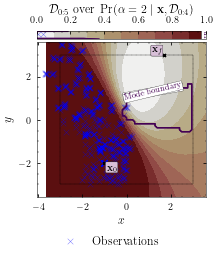

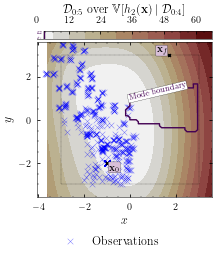

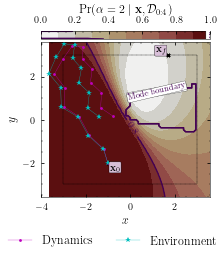

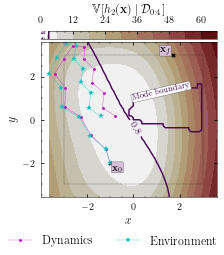

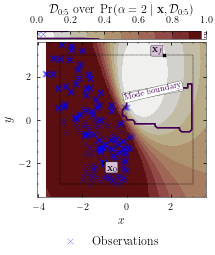

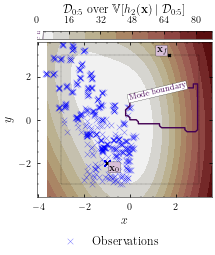

Optimisation result:
     fun: 197.66782134807283
     jac: array([-2.87211926e+01, -1.00271863e+01, -2.73963645e+01, -1.01006527e+01,
       -2.74087369e+01, -9.83248469e+00, -2.68870865e+01, -9.73843560e+00,
       -2.80254135e+01, -9.04840749e+00, -2.66406024e+01, -9.15364112e+00,
       -2.72374153e+01, -8.49823580e+00, -2.66567246e+01, -8.26630724e+00,
       -2.64594350e+01, -7.87162067e+00, -1.78883330e+01, -5.18992390e+00,
       -1.83880318e+01, -4.78672456e+00, -4.87251458e+00, -1.49165971e+00,
       -5.02253681e+00, -1.42636242e+00, -2.89932985e-04,  5.10785130e-04,
       -2.21808288e-04,  1.45406838e-04])
 message: 'Optimization terminated successfully'
    nfev: 53
     nit: 30
    njev: 30
  status: 0
 success: True
       x: array([-0.60716607,  4.82201849, -2.44902394,  4.84711731, -2.12240339,
        5.22782277, -2.51997392,  4.35734003,  0.9488776 ,  5.27223226,
       -1.42879374,  4.88755733,  2.10413142,  4.24825013,  1.64170894,
        4.40002469,  2.10099347,

2022-04-22 12:52:20.525751: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 12:52:20.525767: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.
2022-04-22 12:52:21.690235: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 12:52:21.698864: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 12:52:21.703958: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_12_52_21

2022-04-22 12:52:23.118193: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_12_52_21/dr-robots-mbp.local.trace.json.gz
2022-04-22 12:52:23.134795: I tensorflow/core/profiler/rp

3/3 [==============================] - 4s 2s/step - loss: -808.0514 - val_loss: -847.7777


2022-04-22 12:52:23.584514: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_12_52_21/dr-robots-mbp.local.memory_profile.json.gz
2022-04-22 12:52:23.590334: I tensorflow/core/profiler/rpc/client/capture_profile.cc:251] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_12_52_21
Dumped tool data for xplane.pb to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_12_52_21/dr-robots-mbp.local.xplane.pb
Dumped tool data for overview_page.pb to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_12_52_21/dr-robots-mbp.local.overview_page.pb
Dumped tool data for input_pipeline.pb to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_0

/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_6_epoch_0/assets
Epoch 2/20000
3/3 [==============================] - 0s 18ms/step - loss: -910.6042 - val_loss: -841.9696
Epoch 3/20000
3/3 [==============================] - 0s 19ms/step - loss: -771.5470 - val_loss: -920.7020
Epoch 4/20000
3/3 [==============================] - 0s 19ms/step - loss: -853.6268 - val_loss: -879.5394
Epoch 5/20000
3/3 [==============================] - 0s 18ms/step - loss: -887.9594 - val_loss: -832.0840
Epoch 6/20000
3/3 [==============================] - 0s 19ms/step - loss: -1013.5536 - val_loss: -685.8162
Epoch 7/20000
3/3 [==============================] - 0s 19ms/step - loss: -885.3857 - val_loss: -763.4722
Epoch 8/20000
3/3 [==============================] - 0s 19ms/step - loss: -909.3368 - val_loss: -607.9379
Epoch 9/20000
3/3 [==============================] - 0s 18ms/step - loss: -853.0009 - val_loss: -767.3481
Epoch 10/20000
3/3 [===

3/3 [==============================] - 0s 18ms/step - loss: -968.3049 - val_loss: -874.1586
Epoch 76/20000
3/3 [==============================] - 0s 18ms/step - loss: -954.8568 - val_loss: -833.9894
Epoch 77/20000
3/3 [==============================] - 0s 18ms/step - loss: -973.6471 - val_loss: -532.5668
Epoch 78/20000
3/3 [==============================] - 0s 18ms/step - loss: -948.6975 - val_loss: -960.2307
Epoch 79/20000
3/3 [==============================] - 0s 18ms/step - loss: -926.8807 - val_loss: -892.4462
Epoch 80/20000
3/3 [==============================] - 0s 18ms/step - loss: -984.6928 - val_loss: -921.8542
Epoch 81/20000
3/3 [==============================] - 0s 18ms/step - loss: -985.2679 - val_loss: -919.2090
Epoch 82/20000
3/3 [==============================] - 0s 18ms/step - loss: -1055.6538 - val_loss: -852.4019
Epoch 83/20000
3/3 [==============================] - 0s 18ms/step - loss: -928.6224 - val_loss: -800.8121
Epoch 84/20000
3/3 [==============================]

Epoch 151/20000
3/3 [==============================] - 0s 19ms/step - loss: -946.2809 - val_loss: -959.5408
Epoch 152/20000
3/3 [==============================] - 0s 19ms/step - loss: -1007.8998 - val_loss: -857.3455
Epoch 153/20000
3/3 [==============================] - 0s 20ms/step - loss: -1036.0608 - val_loss: -843.9355
Epoch 154/20000
3/3 [==============================] - 0s 19ms/step - loss: -1030.7220 - val_loss: -954.7937
Epoch 155/20000
3/3 [==============================] - 0s 19ms/step - loss: -1018.3893 - val_loss: -981.3553
Epoch 156/20000
3/3 [==============================] - 0s 19ms/step - loss: -977.7450 - val_loss: -763.6646
Epoch 157/20000
3/3 [==============================] - 0s 19ms/step - loss: -920.5446 - val_loss: -854.6229
Epoch 158/20000
3/3 [==============================] - 0s 19ms/step - loss: -1016.7125 - val_loss: -921.4590
Epoch 159/20000
3/3 [==============================] - 0s 20ms/step - loss: -868.8238 - val_loss: -718.1354
Epoch 160/20000
3/3 [==

3/3 [==============================] - 0s 20ms/step - loss: -1030.4114 - val_loss: -968.5804
Epoch 227/20000
3/3 [==============================] - 0s 23ms/step - loss: -1034.1999 - val_loss: -989.7679
Epoch 228/20000
3/3 [==============================] - 0s 21ms/step - loss: -1063.1536 - val_loss: -974.4635
Epoch 229/20000
3/3 [==============================] - 0s 21ms/step - loss: -1061.6794 - val_loss: -953.6461
Epoch 230/20000
3/3 [==============================] - 0s 22ms/step - loss: -1053.4451 - val_loss: -964.8906
Epoch 231/20000
3/3 [==============================] - 0s 22ms/step - loss: -1059.6982 - val_loss: -920.3500
Epoch 232/20000
3/3 [==============================] - 0s 23ms/step - loss: -1085.7640 - val_loss: -955.1922
Epoch 233/20000
3/3 [==============================] - 0s 21ms/step - loss: -1063.6951 - val_loss: -937.0842
Epoch 234/20000
3/3 [==============================] - 0s 22ms/step - loss: -1074.4917 - val_loss: -958.1677
Epoch 235/20000
3/3 [==============

Epoch 302/20000
3/3 [==============================] - 0s 22ms/step - loss: -970.0908 - val_loss: -906.5049
Epoch 303/20000
3/3 [==============================] - 0s 22ms/step - loss: -856.9189 - val_loss: -908.3034
Epoch 304/20000
3/3 [==============================] - 0s 21ms/step - loss: -896.8131 - val_loss: -886.9893
Epoch 305/20000
3/3 [==============================] - 0s 21ms/step - loss: -942.0075 - val_loss: -776.9302
Epoch 306/20000
3/3 [==============================] - 0s 21ms/step - loss: -953.9242 - val_loss: -870.1262
Epoch 307/20000
3/3 [==============================] - 0s 22ms/step - loss: -919.8627 - val_loss: -809.0413
Epoch 308/20000
3/3 [==============================] - 0s 22ms/step - loss: -881.1956 - val_loss: -831.1500
Epoch 309/20000
3/3 [==============================] - 0s 22ms/step - loss: -695.6971 - val_loss: -788.7564
Epoch 310/20000
3/3 [==============================] - 0s 21ms/step - loss: -816.1038 - val_loss: -794.6721
Epoch 311/20000
3/3 [=======

Epoch 378/20000
3/3 [==============================] - 0s 22ms/step - loss: -883.7540 - val_loss: -891.0671
Epoch 379/20000
3/3 [==============================] - 0s 21ms/step - loss: -930.4891 - val_loss: -816.0611
Epoch 380/20000
3/3 [==============================] - 0s 21ms/step - loss: -954.5186 - val_loss: -852.6384
Epoch 381/20000
3/3 [==============================] - 0s 21ms/step - loss: -984.5820 - val_loss: -780.0081
Epoch 382/20000
3/3 [==============================] - 0s 22ms/step - loss: -911.9917 - val_loss: -888.7052
Epoch 383/20000
3/3 [==============================] - 0s 21ms/step - loss: -955.8954 - val_loss: -936.2592
Epoch 384/20000
3/3 [==============================] - 0s 21ms/step - loss: -978.5021 - val_loss: -926.4305
Epoch 385/20000
3/3 [==============================] - 0s 21ms/step - loss: -971.3357 - val_loss: -782.4928
Epoch 386/20000
3/3 [==============================] - 0s 22ms/step - loss: -955.7612 - val_loss: -904.2672
Epoch 387/20000
3/3 [=======

Epoch 454/20000
3/3 [==============================] - 0s 22ms/step - loss: -762.7725 - val_loss: -139.4414
Epoch 455/20000
3/3 [==============================] - 0s 22ms/step - loss: -198.0850 - val_loss: -785.6601
Epoch 456/20000
3/3 [==============================] - 0s 22ms/step - loss: -258.7905 - val_loss: -676.2283
Epoch 457/20000
3/3 [==============================] - 0s 22ms/step - loss: -702.7550 - val_loss: -769.9695
Epoch 458/20000
3/3 [==============================] - 0s 22ms/step - loss: -605.5560 - val_loss: -737.3606
Epoch 459/20000
3/3 [==============================] - 0s 22ms/step - loss: 192.9146 - val_loss: 1213.7096
Epoch 460/20000
3/3 [==============================] - 0s 22ms/step - loss: -346.2840 - val_loss: 603.8064
Epoch 461/20000
3/3 [==============================] - 0s 22ms/step - loss: -326.2152 - val_loss: -739.5192
Epoch 462/20000
3/3 [==============================] - 0s 22ms/step - loss: -353.0282 - val_loss: -542.3483
Epoch 463/20000
3/3 [=========

Epoch 530/20000
3/3 [==============================] - 0s 23ms/step - loss: -625.2899 - val_loss: -381.4339
Epoch 531/20000
3/3 [==============================] - 0s 24ms/step - loss: -538.2662 - val_loss: -141.9665
Epoch 532/20000
3/3 [==============================] - 0s 25ms/step - loss: -776.3272 - val_loss: -130.1143
Epoch 533/20000
3/3 [==============================] - 0s 25ms/step - loss: -745.4727 - val_loss: -18.0835
Epoch 534/20000
3/3 [==============================] - 0s 23ms/step - loss: -577.6394 - val_loss: -477.8890
Epoch 535/20000
3/3 [==============================] - 0s 24ms/step - loss: -628.3573 - val_loss: -628.2874
Epoch 536/20000
3/3 [==============================] - 0s 24ms/step - loss: -674.7398 - val_loss: -744.6667
Epoch 537/20000
3/3 [==============================] - 0s 25ms/step - loss: -593.3890 - val_loss: -799.9359
Epoch 538/20000
3/3 [==============================] - 0s 24ms/step - loss: -670.3567 - val_loss: -774.3452
Epoch 539/20000
3/3 [========

Epoch 606/20000
3/3 [==============================] - 0s 23ms/step - loss: -791.3091 - val_loss: -639.2524
Epoch 607/20000
3/3 [==============================] - 0s 23ms/step - loss: -758.2723 - val_loss: -725.8728
Epoch 608/20000
3/3 [==============================] - 0s 23ms/step - loss: -766.9672 - val_loss: -809.1237
Epoch 609/20000
3/3 [==============================] - 0s 23ms/step - loss: -688.7641 - val_loss: -502.4623
Epoch 610/20000
3/3 [==============================] - 0s 22ms/step - loss: -770.6322 - val_loss: -791.4373
Epoch 611/20000
3/3 [==============================] - 0s 23ms/step - loss: -794.0363 - val_loss: -376.5169
Epoch 612/20000
3/3 [==============================] - 0s 23ms/step - loss: -794.0292 - val_loss: -646.9541
Epoch 613/20000
3/3 [==============================] - 0s 23ms/step - loss: -830.5014 - val_loss: -445.8410
Epoch 614/20000
3/3 [==============================] - 0s 23ms/step - loss: -573.8760 - val_loss: -759.2675
Epoch 615/20000
3/3 [=======

Epoch 682/20000
3/3 [==============================] - 0s 24ms/step - loss: -650.0980 - val_loss: 419.5068
Epoch 683/20000
3/3 [==============================] - 0s 23ms/step - loss: -754.4881 - val_loss: -738.2269
Epoch 684/20000
3/3 [==============================] - 0s 23ms/step - loss: -734.4082 - val_loss: -312.1251
Epoch 685/20000
3/3 [==============================] - 0s 23ms/step - loss: -574.0759 - val_loss: -684.3958
Epoch 686/20000
3/3 [==============================] - 0s 23ms/step - loss: -628.1367 - val_loss: -243.2885
Epoch 687/20000
3/3 [==============================] - 0s 23ms/step - loss: -719.7116 - val_loss: -575.8232
Epoch 688/20000
3/3 [==============================] - 0s 23ms/step - loss: -719.5495 - val_loss: -683.6392
Epoch 689/20000
3/3 [==============================] - 0s 23ms/step - loss: -711.2139 - val_loss: -398.0413
Epoch 690/20000
3/3 [==============================] - 0s 22ms/step - loss: -695.1786 - val_loss: -552.7063
Epoch 691/20000
3/3 [========

Epoch 758/20000
3/3 [==============================] - 0s 25ms/step - loss: -848.3531 - val_loss: -229.2278
Epoch 759/20000
3/3 [==============================] - 0s 26ms/step - loss: -743.4096 - val_loss: -800.4603
Epoch 760/20000
3/3 [==============================] - 0s 25ms/step - loss: -801.1892 - val_loss: -749.8646
Epoch 761/20000
3/3 [==============================] - 0s 24ms/step - loss: -767.6556 - val_loss: -561.2784
Epoch 762/20000
3/3 [==============================] - 0s 25ms/step - loss: -749.0948 - val_loss: -798.0225
Epoch 763/20000
3/3 [==============================] - 0s 25ms/step - loss: -859.0049 - val_loss: -667.9756
Epoch 764/20000
3/3 [==============================] - 0s 24ms/step - loss: -841.6680 - val_loss: -713.8629
Epoch 765/20000
3/3 [==============================] - 0s 25ms/step - loss: -880.1996 - val_loss: -851.0479
Epoch 766/20000
3/3 [==============================] - 0s 25ms/step - loss: -877.9461 - val_loss: -828.1204
Epoch 767/20000
3/3 [=======

Epoch 834/20000
3/3 [==============================] - 0s 23ms/step - loss: -893.0758 - val_loss: -498.3982
Epoch 835/20000
3/3 [==============================] - 0s 22ms/step - loss: -843.5828 - val_loss: -830.7362
Epoch 836/20000
3/3 [==============================] - 0s 22ms/step - loss: -778.2096 - val_loss: -738.2282
Epoch 837/20000
3/3 [==============================] - 0s 23ms/step - loss: -802.5303 - val_loss: -850.2299
Epoch 838/20000
3/3 [==============================] - 0s 23ms/step - loss: -858.5847 - val_loss: -895.4903
Epoch 839/20000
3/3 [==============================] - 0s 22ms/step - loss: -834.8168 - val_loss: -803.6449
Epoch 840/20000
3/3 [==============================] - 0s 22ms/step - loss: -854.0541 - val_loss: -893.7218
Epoch 841/20000
3/3 [==============================] - 0s 22ms/step - loss: -906.6793 - val_loss: -879.3242
Epoch 842/20000
3/3 [==============================] - 0s 22ms/step - loss: -869.6203 - val_loss: -452.7852
Epoch 843/20000
3/3 [=======

Epoch 910/20000
3/3 [==============================] - 0s 22ms/step - loss: -840.4061 - val_loss: -841.2086
Epoch 911/20000
3/3 [==============================] - 0s 22ms/step - loss: -922.0319 - val_loss: -932.3244
Epoch 912/20000
3/3 [==============================] - 0s 22ms/step - loss: -854.5693 - val_loss: -919.4471
Epoch 913/20000
3/3 [==============================] - 0s 22ms/step - loss: -901.5942 - val_loss: -889.3461
Epoch 914/20000
3/3 [==============================] - 0s 22ms/step - loss: -938.4609 - val_loss: -732.9784
Epoch 915/20000
3/3 [==============================] - 0s 22ms/step - loss: -928.8864 - val_loss: -842.5918
Epoch 916/20000
3/3 [==============================] - 0s 22ms/step - loss: -808.3663 - val_loss: -632.7100
Epoch 917/20000
3/3 [==============================] - 0s 22ms/step - loss: -943.9799 - val_loss: -821.9722
Epoch 918/20000
3/3 [==============================] - 0s 22ms/step - loss: -885.7354 - val_loss: -728.7714
Epoch 919/20000
3/3 [=======

Epoch 986/20000
3/3 [==============================] - 0s 23ms/step - loss: -879.1101 - val_loss: -925.2519
Epoch 987/20000
3/3 [==============================] - 0s 24ms/step - loss: -935.1063 - val_loss: -760.8972
Epoch 988/20000
3/3 [==============================] - 0s 24ms/step - loss: -931.2710 - val_loss: -759.7468
Epoch 989/20000
3/3 [==============================] - 0s 24ms/step - loss: -826.1317 - val_loss: -840.2885
Epoch 990/20000
3/3 [==============================] - 0s 24ms/step - loss: -720.4743 - val_loss: -811.2051
Epoch 991/20000
3/3 [==============================] - 0s 24ms/step - loss: -792.1320 - val_loss: -458.6540
Epoch 992/20000
3/3 [==============================] - 0s 25ms/step - loss: -618.8619 - val_loss: -405.6727
Epoch 993/20000
3/3 [==============================] - 0s 24ms/step - loss: -889.8229 - val_loss: -726.1050
Epoch 994/20000
3/3 [==============================] - 0s 26ms/step - loss: -815.6265 - val_loss: -844.5097
Epoch 995/20000
3/3 [=======

3/3 [==============================] - 0s 22ms/step - loss: -855.8738 - val_loss: -214.0772
Epoch 1062/20000
3/3 [==============================] - 0s 23ms/step - loss: -801.2838 - val_loss: -859.6585
Epoch 1063/20000
3/3 [==============================] - 0s 23ms/step - loss: -707.2879 - val_loss: -745.8548
Epoch 1064/20000
3/3 [==============================] - 0s 22ms/step - loss: -663.7009 - val_loss: -370.3038
Epoch 1065/20000
3/3 [==============================] - 0s 22ms/step - loss: -317.3292 - val_loss: -772.7300
Epoch 1066/20000
3/3 [==============================] - 0s 22ms/step - loss: -648.7091 - val_loss: -683.8808
Epoch 1067/20000
3/3 [==============================] - 0s 23ms/step - loss: -793.6489 - val_loss: -673.6682
Epoch 1068/20000
3/3 [==============================] - 0s 23ms/step - loss: -614.3747 - val_loss: -283.9174
Epoch 1069/20000
3/3 [==============================] - 0s 23ms/step - loss: -780.6171 - val_loss: -775.4083
Epoch 1070/20000
3/3 [==============

3/3 [==============================] - 0s 22ms/step - loss: -901.8196 - val_loss: -613.8272
Epoch 1137/20000
3/3 [==============================] - 0s 23ms/step - loss: -899.2691 - val_loss: -166.2454
Epoch 1138/20000
3/3 [==============================] - 0s 23ms/step - loss: -748.5150 - val_loss: -876.6043
Epoch 1139/20000
3/3 [==============================] - 0s 22ms/step - loss: -948.2259 - val_loss: -837.6967
Epoch 1140/20000
3/3 [==============================] - 0s 23ms/step - loss: -834.3219 - val_loss: -745.7713
Epoch 1141/20000
3/3 [==============================] - 0s 23ms/step - loss: -813.6111 - val_loss: -498.8038
Epoch 1142/20000
3/3 [==============================] - 0s 24ms/step - loss: -935.9147 - val_loss: -857.9413
Epoch 1143/20000
3/3 [==============================] - 0s 23ms/step - loss: -878.9817 - val_loss: -891.7688
Epoch 1144/20000
3/3 [==============================] - 0s 23ms/step - loss: -897.1054 - val_loss: -353.2278
Epoch 1145/20000
3/3 [==============

3/3 [==============================] - 0s 24ms/step - loss: -751.3786 - val_loss: -937.0035
Epoch 1212/20000
3/3 [==============================] - 0s 24ms/step - loss: -832.3874 - val_loss: -702.7228
Epoch 1213/20000
3/3 [==============================] - 0s 23ms/step - loss: -402.7982 - val_loss: -851.5375
Epoch 1214/20000
3/3 [==============================] - 0s 24ms/step - loss: -834.7106 - val_loss: -666.4876
Epoch 1215/20000
3/3 [==============================] - 0s 25ms/step - loss: -864.0688 - val_loss: -808.7575
Epoch 1216/20000
3/3 [==============================] - 0s 24ms/step - loss: -671.1456 - val_loss: -766.1879
Epoch 1217/20000
3/3 [==============================] - 0s 23ms/step - loss: -607.2165 - val_loss: -625.9063
Epoch 1218/20000
3/3 [==============================] - 0s 24ms/step - loss: -761.0892 - val_loss: -823.7880
Epoch 1219/20000
3/3 [==============================] - 0s 24ms/step - loss: -906.7550 - val_loss: -715.3247
Epoch 1220/20000
3/3 [==============

3/3 [==============================] - 0s 23ms/step - loss: -750.0195 - val_loss: -591.8994
Epoch 1287/20000
3/3 [==============================] - 0s 23ms/step - loss: -926.7844 - val_loss: -649.7838
Epoch 1288/20000
3/3 [==============================] - 0s 22ms/step - loss: -590.5218 - val_loss: -648.4533
Epoch 1289/20000
3/3 [==============================] - 0s 23ms/step - loss: -892.3262 - val_loss: -421.2826
Epoch 1290/20000
3/3 [==============================] - 0s 23ms/step - loss: -771.4450 - val_loss: 638.4226
Epoch 1291/20000
3/3 [==============================] - 0s 23ms/step - loss: -460.0152 - val_loss: -808.3057
Epoch 1292/20000
3/3 [==============================] - 0s 23ms/step - loss: -408.9236 - val_loss: -837.3209
Epoch 1293/20000
3/3 [==============================] - 0s 23ms/step - loss: -839.3932 - val_loss: -255.3038
Epoch 1294/20000
3/3 [==============================] - 0s 22ms/step - loss: -690.9356 - val_loss: -708.0477
Epoch 1295/20000
3/3 [===============

3/3 [==============================] - 0s 23ms/step - loss: -875.7173 - val_loss: -793.7428
Epoch 1362/20000
3/3 [==============================] - 0s 23ms/step - loss: -884.5466 - val_loss: -853.5698
Epoch 1363/20000
3/3 [==============================] - 0s 23ms/step - loss: -940.2082 - val_loss: -810.5898
Epoch 1364/20000
3/3 [==============================] - 0s 23ms/step - loss: -923.6877 - val_loss: -715.8870
Epoch 1365/20000
3/3 [==============================] - 0s 22ms/step - loss: -953.8928 - val_loss: -853.8941
Epoch 1366/20000
3/3 [==============================] - 0s 23ms/step - loss: -943.2354 - val_loss: -905.9281
Epoch 1367/20000
3/3 [==============================] - 0s 22ms/step - loss: -946.7586 - val_loss: -844.2862
Epoch 1368/20000
3/3 [==============================] - 0s 22ms/step - loss: -948.2298 - val_loss: -920.8720
Epoch 1369/20000
3/3 [==============================] - 0s 23ms/step - loss: -934.0035 - val_loss: -845.0233
Epoch 1370/20000
3/3 [==============

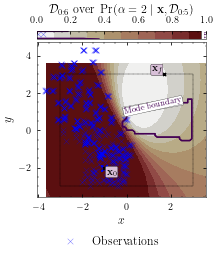

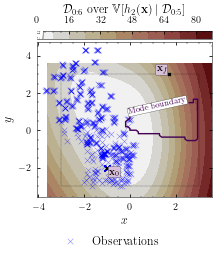

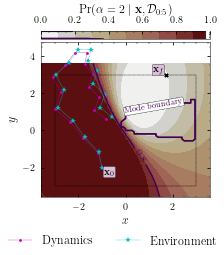

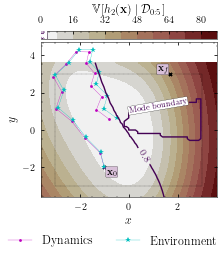

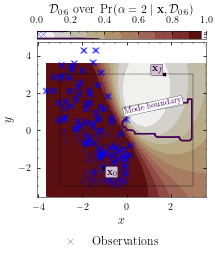

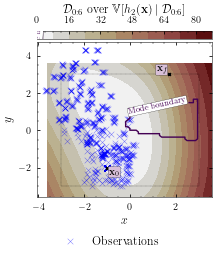

Optimisation result:
     fun: 211.569084066048
     jac: array([-33.33698954,  -9.99706982, -31.81575263, -10.09149614,
       -32.23095945,  -9.79133003, -31.14907578,  -9.89827211,
       -32.34669889,  -9.30102907, -30.5218889 ,  -9.54098655,
       -30.92360361,  -9.10426258, -29.95555942,  -9.09419982,
       -29.36050361,  -8.88731509, -20.32740083,  -6.19903726,
       -20.84183212,  -5.88255949,  -7.28848194,  -2.50086109,
        -7.50390185,  -2.47608447,  -1.04267722,  -0.47552836,
        -1.06686271,  -0.48187969])
 message: 'Optimization terminated successfully'
    nfev: 377
     nit: 73
    njev: 72
  status: 0
 success: True
       x: array([-0.77452506,  4.73110619, -2.67976516,  4.71822165, -1.8869576 ,
        5.39527736, -2.74306858,  4.14262698,  0.59339335,  5.34406975,
       -1.5794058 ,  4.87032583,  1.97065536,  4.31894992,  1.60076588,
        4.37208204,  1.97109788,  1.50202604, -0.62629068, -0.92568202,
        1.25183008, -0.6162871 , -0.7192561 , -1.17

2022-04-22 12:55:41.650906: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 12:55:41.650922: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


3/3 [==============================] - 2s 858ms/step - loss: -899.9918 - val_loss: -828.9446


2022-04-22 12:55:42.803792: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 12:55:42.813164: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 12:55:42.818695: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_12_55_42

2022-04-22 12:55:42.823106: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_12_55_42/dr-robots-mbp.local.trace.json.gz
2022-04-22 12:55:42.839880: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_12_55_42

2022-04-22 12:55:42.840054: I tensorflow/core/profiler/rpc/client/s

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_7_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 20ms/step - loss: -913.9597 - val_loss: -897.8844
Epoch 3/20000
3/3 [==============================] - 0s 21ms/step - loss: -929.2070 - val_loss: -881.5259
Epoch 4/20000
3/3 [==============================] - 0s 20ms/step - loss: -892.9324 - val_loss: -838.0875
Epoch 5/20000
3/3 [==============================] - 0s 20ms/step - loss: -925.4479 - val_loss: -876.6516
Epoch 6/20000
3/3 [==============================] - 0s 21ms/step - loss: -923.5148 - val_loss: -445.8923
Epoch 7/20000
3/3 [==============================] - 0s 21ms/step - loss: -937.4036 - val_loss: -904.0037
Epoch 8/20000
3/3 [==============================] - 0s 20ms/step - loss: -930.1618 - val_loss: -903.4627
Epoch 9/20000
3/3 [==============================] - 0s 21ms/step - loss: -941.5365 - val_loss: -863.7495
Epoch 10/20000
3/3 [==============================] - 0s 21ms/step - loss: -964.1699 - val_loss: -824.5407
Epoch 11/20000
3/3 [=========================

3/3 [==============================] - 0s 19ms/step - loss: -926.4052 - val_loss: -690.8027
Epoch 77/20000
3/3 [==============================] - 0s 19ms/step - loss: -963.0580 - val_loss: -866.7901
Epoch 78/20000
3/3 [==============================] - 0s 19ms/step - loss: -920.3989 - val_loss: -955.9397
Epoch 79/20000
3/3 [==============================] - 0s 18ms/step - loss: -945.8401 - val_loss: -910.2368
Epoch 80/20000
3/3 [==============================] - 0s 19ms/step - loss: -931.1617 - val_loss: -921.8119
Epoch 81/20000
3/3 [==============================] - 0s 19ms/step - loss: -962.5976 - val_loss: -863.4614
Epoch 82/20000
3/3 [==============================] - 0s 19ms/step - loss: -977.2855 - val_loss: -708.1644
Epoch 83/20000
3/3 [==============================] - 0s 18ms/step - loss: -794.7593 - val_loss: -552.0114
Epoch 84/20000
3/3 [==============================] - 0s 19ms/step - loss: -834.4199 - val_loss: -929.5571
Epoch 85/20000
3/3 [==============================] 

3/3 [==============================] - 0s 18ms/step - loss: -950.1593 - val_loss: -969.6817
Epoch 153/20000
3/3 [==============================] - 0s 19ms/step - loss: -940.4584 - val_loss: -958.2021
Epoch 154/20000
3/3 [==============================] - 0s 19ms/step - loss: -861.8631 - val_loss: -620.0418
Epoch 155/20000
3/3 [==============================] - 0s 19ms/step - loss: -919.6654 - val_loss: -751.5741
Epoch 156/20000
3/3 [==============================] - 0s 19ms/step - loss: -903.1557 - val_loss: -671.9832
Epoch 157/20000
3/3 [==============================] - 0s 19ms/step - loss: -829.6750 - val_loss: -776.6023
Epoch 158/20000
3/3 [==============================] - 0s 19ms/step - loss: -892.9507 - val_loss: -859.0730
Epoch 159/20000
3/3 [==============================] - 0s 19ms/step - loss: -865.5631 - val_loss: -941.8709
Epoch 160/20000
3/3 [==============================] - 0s 19ms/step - loss: -923.9302 - val_loss: -518.6903
Epoch 161/20000
3/3 [=======================

Epoch 228/20000
3/3 [==============================] - 0s 20ms/step - loss: -959.3296 - val_loss: -935.0922
Epoch 229/20000
3/3 [==============================] - 0s 20ms/step - loss: -997.5627 - val_loss: -909.6314
Epoch 230/20000
3/3 [==============================] - 0s 20ms/step - loss: -923.1861 - val_loss: -910.6340
Epoch 231/20000
3/3 [==============================] - 0s 20ms/step - loss: -985.8812 - val_loss: -903.1890
Epoch 232/20000
3/3 [==============================] - 0s 20ms/step - loss: -970.5147 - val_loss: -962.6047
Epoch 233/20000
3/3 [==============================] - 0s 20ms/step - loss: -951.0684 - val_loss: -991.4345
Epoch 234/20000
3/3 [==============================] - 0s 20ms/step - loss: -979.0335 - val_loss: -799.5364
Epoch 235/20000
3/3 [==============================] - 0s 20ms/step - loss: -985.6278 - val_loss: -916.7791
Epoch 236/20000
3/3 [==============================] - 0s 22ms/step - loss: -907.5240 - val_loss: -949.3622
Epoch 237/20000
3/3 [=======

Epoch 304/20000
3/3 [==============================] - 0s 22ms/step - loss: -837.4286 - val_loss: -940.3588
Epoch 305/20000
3/3 [==============================] - 0s 22ms/step - loss: -846.8700 - val_loss: -909.4263
Epoch 306/20000
3/3 [==============================] - 0s 22ms/step - loss: -943.2160 - val_loss: -507.2709
Epoch 307/20000
3/3 [==============================] - 0s 22ms/step - loss: -759.3189 - val_loss: -826.3705
Epoch 308/20000
3/3 [==============================] - 0s 22ms/step - loss: -848.0716 - val_loss: -545.1472
Epoch 309/20000
3/3 [==============================] - 0s 22ms/step - loss: -714.0897 - val_loss: -897.4303
Epoch 310/20000
3/3 [==============================] - 0s 22ms/step - loss: -879.3194 - val_loss: -833.2430
Epoch 311/20000
3/3 [==============================] - 0s 22ms/step - loss: -853.0715 - val_loss: -929.3890
Epoch 312/20000
3/3 [==============================] - 0s 22ms/step - loss: -809.5900 - val_loss: -952.3759
Epoch 313/20000
3/3 [=======

Epoch 380/20000
3/3 [==============================] - 0s 22ms/step - loss: -871.7838 - val_loss: -747.6772
Epoch 381/20000
3/3 [==============================] - 0s 22ms/step - loss: -967.8037 - val_loss: -899.7813
Epoch 382/20000
3/3 [==============================] - 0s 23ms/step - loss: -928.6872 - val_loss: -946.3272
Epoch 383/20000
3/3 [==============================] - 0s 22ms/step - loss: -868.6884 - val_loss: -693.6311
Epoch 384/20000
3/3 [==============================] - 0s 22ms/step - loss: -918.6553 - val_loss: -757.7423
Epoch 385/20000
3/3 [==============================] - 0s 22ms/step - loss: -959.8862 - val_loss: -855.0370
Epoch 386/20000
3/3 [==============================] - 0s 22ms/step - loss: -789.1590 - val_loss: -814.5146
Epoch 387/20000
3/3 [==============================] - 0s 22ms/step - loss: -655.2618 - val_loss: -605.0472
Epoch 388/20000
3/3 [==============================] - 0s 22ms/step - loss: -524.1852 - val_loss: -860.0975
Epoch 389/20000
3/3 [=======

Epoch 456/20000
3/3 [==============================] - 0s 22ms/step - loss: -969.8867 - val_loss: -710.8428
Epoch 457/20000
3/3 [==============================] - 0s 22ms/step - loss: -910.7903 - val_loss: -958.5929
Epoch 458/20000
3/3 [==============================] - 0s 22ms/step - loss: -863.6679 - val_loss: -805.5111
Epoch 459/20000
3/3 [==============================] - 0s 22ms/step - loss: -999.0507 - val_loss: -103.4766
Epoch 460/20000
3/3 [==============================] - 0s 22ms/step - loss: -786.5239 - val_loss: -540.8285
Epoch 461/20000
3/3 [==============================] - 0s 22ms/step - loss: -544.8037 - val_loss: -814.3231
Epoch 462/20000
3/3 [==============================] - 0s 22ms/step - loss: -923.1572 - val_loss: -459.5769
Epoch 463/20000
3/3 [==============================] - 0s 22ms/step - loss: -685.6789 - val_loss: -931.7465
Epoch 464/20000
3/3 [==============================] - 0s 22ms/step - loss: -756.9690 - val_loss: -931.0710
Epoch 465/20000
3/3 [=======

Epoch 532/20000
3/3 [==============================] - 0s 23ms/step - loss: -970.7451 - val_loss: -924.5161
Epoch 533/20000
3/3 [==============================] - 0s 23ms/step - loss: -947.7274 - val_loss: -907.5985
Epoch 534/20000
3/3 [==============================] - 0s 22ms/step - loss: -994.5396 - val_loss: -968.2212
Epoch 535/20000
3/3 [==============================] - 0s 23ms/step - loss: -906.2403 - val_loss: -957.2367
Epoch 536/20000
3/3 [==============================] - 0s 23ms/step - loss: -1008.1837 - val_loss: -824.7514
Epoch 537/20000
3/3 [==============================] - 0s 23ms/step - loss: -996.1269 - val_loss: -808.0480
Epoch 538/20000
3/3 [==============================] - 0s 23ms/step - loss: -918.0211 - val_loss: -863.5483
Epoch 539/20000
3/3 [==============================] - 0s 22ms/step - loss: -937.5171 - val_loss: -966.5919
Epoch 540/20000
3/3 [==============================] - 0s 22ms/step - loss: -995.8936 - val_loss: -968.0471
Epoch 541/20000
3/3 [======

Epoch 608/20000
3/3 [==============================] - 0s 23ms/step - loss: -859.5306 - val_loss: -831.8048
Epoch 609/20000
3/3 [==============================] - 0s 23ms/step - loss: -930.3208 - val_loss: -843.9490
Epoch 610/20000
3/3 [==============================] - 0s 22ms/step - loss: -859.2586 - val_loss: -914.8534
Epoch 611/20000
3/3 [==============================] - 0s 23ms/step - loss: -651.2855 - val_loss: -927.6903
Epoch 612/20000
3/3 [==============================] - 0s 23ms/step - loss: -756.9802 - val_loss: -862.2793
Epoch 613/20000
3/3 [==============================] - 0s 22ms/step - loss: -754.9160 - val_loss: -899.9313
Epoch 614/20000
3/3 [==============================] - 0s 22ms/step - loss: -821.7488 - val_loss: -763.3634
Epoch 615/20000
3/3 [==============================] - 0s 22ms/step - loss: -839.9037 - val_loss: -815.4820
Epoch 616/20000
3/3 [==============================] - 0s 23ms/step - loss: -318.2052 - val_loss: 882.8494
Epoch 617/20000
3/3 [========

Epoch 684/20000
3/3 [==============================] - 0s 22ms/step - loss: -995.6693 - val_loss: -1023.1083
Epoch 685/20000
3/3 [==============================] - 0s 22ms/step - loss: -901.6832 - val_loss: -935.0983
Epoch 686/20000
3/3 [==============================] - 0s 23ms/step - loss: -916.7076 - val_loss: -931.9437
Epoch 687/20000
3/3 [==============================] - 0s 23ms/step - loss: -922.9861 - val_loss: -911.7716
Epoch 688/20000
3/3 [==============================] - 0s 23ms/step - loss: -895.0730 - val_loss: -930.7008
Epoch 689/20000
3/3 [==============================] - 0s 23ms/step - loss: -832.7612 - val_loss: -937.4862
Epoch 690/20000
3/3 [==============================] - 0s 23ms/step - loss: -455.9815 - val_loss: -799.2361
Epoch 691/20000
3/3 [==============================] - 0s 22ms/step - loss: -737.6010 - val_loss: -635.5485
Epoch 692/20000
3/3 [==============================] - 0s 23ms/step - loss: -665.1701 - val_loss: -847.5565
Epoch 693/20000
3/3 [======

Epoch 760/20000
3/3 [==============================] - 0s 25ms/step - loss: -548.6080 - val_loss: -941.6543
Epoch 761/20000
3/3 [==============================] - 0s 24ms/step - loss: -181.3667 - val_loss: -168.0779
Epoch 762/20000
3/3 [==============================] - 0s 24ms/step - loss: -607.7184 - val_loss: -744.9689
Epoch 763/20000
3/3 [==============================] - 0s 24ms/step - loss: -894.1820 - val_loss: -787.6277
Epoch 764/20000
3/3 [==============================] - 0s 24ms/step - loss: -805.5358 - val_loss: -900.0237
Epoch 765/20000
3/3 [==============================] - 0s 24ms/step - loss: -803.9369 - val_loss: -384.5950
Epoch 766/20000
3/3 [==============================] - 0s 24ms/step - loss: -889.3828 - val_loss: -887.5709
Epoch 767/20000
3/3 [==============================] - 0s 25ms/step - loss: -850.1625 - val_loss: -917.8204
Epoch 768/20000
3/3 [==============================] - 0s 24ms/step - loss: -919.0819 - val_loss: -871.8770
Epoch 769/20000
3/3 [=======

Epoch 836/20000
3/3 [==============================] - 0s 24ms/step - loss: -568.7510 - val_loss: -725.7053
Epoch 837/20000
3/3 [==============================] - 0s 25ms/step - loss: -333.3278 - val_loss: -848.9459
Epoch 838/20000
3/3 [==============================] - 0s 24ms/step - loss: -648.3514 - val_loss: -630.6359
Epoch 839/20000
3/3 [==============================] - 0s 25ms/step - loss: -344.2291 - val_loss: -886.6284
Epoch 840/20000
3/3 [==============================] - 0s 24ms/step - loss: -515.4372 - val_loss: -848.4192
Epoch 841/20000
3/3 [==============================] - 0s 24ms/step - loss: -788.4064 - val_loss: -698.1465
Epoch 842/20000
3/3 [==============================] - 0s 24ms/step - loss: -801.8372 - val_loss: -703.0813
Epoch 843/20000
3/3 [==============================] - 0s 24ms/step - loss: -708.7897 - val_loss: -780.6647
Epoch 844/20000
3/3 [==============================] - 0s 24ms/step - loss: -837.0661 - val_loss: -543.9863
Epoch 845/20000
3/3 [=======

3/3 [==============================] - 0s 27ms/step - loss: -819.8823 - val_loss: -742.2660
Epoch 912/20000
3/3 [==============================] - 0s 26ms/step - loss: -954.0873 - val_loss: -898.1025
Epoch 913/20000
3/3 [==============================] - 0s 26ms/step - loss: -912.7615 - val_loss: -750.0682
Epoch 914/20000
3/3 [==============================] - 0s 26ms/step - loss: -881.9242 - val_loss: -975.4695
Epoch 915/20000
3/3 [==============================] - 0s 26ms/step - loss: -824.1610 - val_loss: -888.9488
Epoch 916/20000
3/3 [==============================] - 0s 25ms/step - loss: -803.5806 - val_loss: -936.6918
Epoch 917/20000
3/3 [==============================] - 0s 25ms/step - loss: -864.7377 - val_loss: -884.3904
Epoch 918/20000
3/3 [==============================] - 0s 25ms/step - loss: -671.3297 - val_loss: -907.1172
Epoch 919/20000
3/3 [==============================] - 0s 25ms/step - loss: -934.0521 - val_loss: -908.3283
Epoch 920/20000
3/3 [=======================

Epoch 987/20000
3/3 [==============================] - 0s 24ms/step - loss: -673.6343 - val_loss: -808.6994
Epoch 988/20000
3/3 [==============================] - 0s 24ms/step - loss: -847.2667 - val_loss: -843.4819
Epoch 989/20000
3/3 [==============================] - 0s 23ms/step - loss: -818.8002 - val_loss: -827.7751
Epoch 990/20000
3/3 [==============================] - 0s 23ms/step - loss: -853.6458 - val_loss: -848.0906
Epoch 991/20000
3/3 [==============================] - 0s 24ms/step - loss: -893.9566 - val_loss: -837.1074
Epoch 992/20000
3/3 [==============================] - 0s 24ms/step - loss: -890.2517 - val_loss: -865.1394
Epoch 993/20000
3/3 [==============================] - 0s 23ms/step - loss: -869.0920 - val_loss: -820.5661
Epoch 994/20000
3/3 [==============================] - 0s 24ms/step - loss: -899.4552 - val_loss: -877.6813
Epoch 995/20000
3/3 [==============================] - 0s 23ms/step - loss: -908.5214 - val_loss: -872.1607
Epoch 996/20000
3/3 [=======

3/3 [==============================] - 0s 24ms/step - loss: -951.4151 - val_loss: -960.5642
Epoch 1063/20000
3/3 [==============================] - 0s 24ms/step - loss: -937.2806 - val_loss: -918.6862
Epoch 1064/20000
3/3 [==============================] - 0s 23ms/step - loss: -945.3341 - val_loss: -870.5310
Epoch 1065/20000
3/3 [==============================] - 0s 24ms/step - loss: -958.4481 - val_loss: -722.6359
Epoch 1066/20000
3/3 [==============================] - 0s 23ms/step - loss: -902.3220 - val_loss: -906.9722
Epoch 1067/20000
3/3 [==============================] - 0s 24ms/step - loss: -937.6552 - val_loss: -899.2342
Epoch 1068/20000
3/3 [==============================] - 0s 24ms/step - loss: -925.0380 - val_loss: -868.8992
Epoch 1069/20000
3/3 [==============================] - 0s 24ms/step - loss: -945.3114 - val_loss: -855.1944
Epoch 1070/20000
3/3 [==============================] - 0s 23ms/step - loss: -989.8289 - val_loss: -958.4963
Epoch 1071/20000
3/3 [==============

3/3 [==============================] - 0s 25ms/step - loss: -1014.1098 - val_loss: -963.7742
Epoch 1138/20000
3/3 [==============================] - 0s 24ms/step - loss: -1021.3470 - val_loss: -978.8679
Epoch 1139/20000
3/3 [==============================] - 0s 24ms/step - loss: -987.7635 - val_loss: -680.8702
Epoch 1140/20000
3/3 [==============================] - 0s 24ms/step - loss: -1050.3559 - val_loss: -1009.2847
Epoch 1141/20000
3/3 [==============================] - 0s 24ms/step - loss: -1017.1925 - val_loss: -832.4342
Epoch 1142/20000
3/3 [==============================] - 0s 25ms/step - loss: -1035.1641 - val_loss: -824.1850
Epoch 1143/20000
3/3 [==============================] - 0s 25ms/step - loss: -1051.5724 - val_loss: -1034.3219
Epoch 1144/20000
3/3 [==============================] - 0s 24ms/step - loss: -988.5968 - val_loss: -953.9479
Epoch 1145/20000
3/3 [==============================] - 0s 25ms/step - loss: -1026.0020 - val_loss: -979.9209
Epoch 1146/20000
3/3 [=====

3/3 [==============================] - 0s 23ms/step - loss: -984.9346 - val_loss: -997.6677
Epoch 1213/20000
3/3 [==============================] - 0s 22ms/step - loss: -1053.1827 - val_loss: -947.2507
Epoch 1214/20000
3/3 [==============================] - 0s 23ms/step - loss: -1007.1692 - val_loss: -1018.4816
Epoch 1215/20000
3/3 [==============================] - 0s 23ms/step - loss: -1044.0539 - val_loss: -1015.4282
Epoch 1216/20000
3/3 [==============================] - 0s 22ms/step - loss: -1018.6875 - val_loss: -921.5216
Epoch 1217/20000
3/3 [==============================] - 0s 22ms/step - loss: -1058.5864 - val_loss: -976.8789
Epoch 1218/20000
3/3 [==============================] - 0s 23ms/step - loss: -1020.0232 - val_loss: -985.6098
Epoch 1219/20000
3/3 [==============================] - 0s 22ms/step - loss: -1068.9656 - val_loss: -969.5351
Epoch 1220/20000
3/3 [==============================] - 0s 22ms/step - loss: -1035.3640 - val_loss: -986.8432
Epoch 1221/20000
3/3 [====

3/3 [==============================] - 0s 23ms/step - loss: -795.1701 - val_loss: -929.7144
Epoch 1288/20000
3/3 [==============================] - 0s 22ms/step - loss: -901.4194 - val_loss: -895.8267
Epoch 1289/20000
3/3 [==============================] - 0s 22ms/step - loss: -961.1025 - val_loss: -857.4603
Epoch 1290/20000
3/3 [==============================] - 0s 23ms/step - loss: -950.9683 - val_loss: -926.8773
Epoch 1291/20000
3/3 [==============================] - 0s 22ms/step - loss: -1031.8696 - val_loss: -938.6636
Epoch 1292/20000
3/3 [==============================] - 0s 22ms/step - loss: -962.9506 - val_loss: -923.6637
Epoch 1293/20000
3/3 [==============================] - 0s 22ms/step - loss: -976.3757 - val_loss: -950.3032
Epoch 1294/20000
3/3 [==============================] - 0s 23ms/step - loss: -1005.3977 - val_loss: -713.2841
Epoch 1295/20000
3/3 [==============================] - 0s 22ms/step - loss: -962.1944 - val_loss: -951.6149
Epoch 1296/20000
3/3 [============

Epoch 1362/20000
3/3 [==============================] - 0s 24ms/step - loss: -1020.3970 - val_loss: -924.4807
Epoch 1363/20000
3/3 [==============================] - 0s 25ms/step - loss: -884.1930 - val_loss: -950.2239
Epoch 1364/20000
3/3 [==============================] - 0s 24ms/step - loss: -1008.2356 - val_loss: -989.5322
Epoch 1365/20000
3/3 [==============================] - 0s 25ms/step - loss: -1015.9205 - val_loss: -918.8568
Epoch 1366/20000
3/3 [==============================] - 0s 25ms/step - loss: -992.5125 - val_loss: -995.9034
Epoch 1367/20000
3/3 [==============================] - 0s 24ms/step - loss: -1016.4171 - val_loss: -968.1548
Epoch 1368/20000
3/3 [==============================] - 0s 24ms/step - loss: -1027.3965 - val_loss: -1011.8778
Epoch 1369/20000
3/3 [==============================] - 0s 25ms/step - loss: -1018.0148 - val_loss: -950.0739
Epoch 1370/20000
3/3 [==============================] - 0s 24ms/step - loss: -1023.3691 - val_loss: -958.8891
Epoch 1371/

Epoch 1437/20000
3/3 [==============================] - 0s 23ms/step - loss: -940.1108 - val_loss: -963.8384
Epoch 1438/20000
3/3 [==============================] - 0s 24ms/step - loss: -994.1471 - val_loss: -940.2518
Epoch 1439/20000
3/3 [==============================] - 0s 24ms/step - loss: -1012.2985 - val_loss: -904.1685
Epoch 1440/20000
3/3 [==============================] - 0s 23ms/step - loss: -1033.6506 - val_loss: -951.9267
Epoch 1441/20000
3/3 [==============================] - 0s 23ms/step - loss: -1010.9685 - val_loss: -980.7213
Epoch 1442/20000
3/3 [==============================] - 0s 23ms/step - loss: -1038.6213 - val_loss: -983.7566
Epoch 1443/20000
3/3 [==============================] - 0s 22ms/step - loss: -1045.3013 - val_loss: -991.4032
Epoch 1444/20000
3/3 [==============================] - 0s 23ms/step - loss: -1021.3549 - val_loss: -943.8248
Epoch 1445/20000
3/3 [==============================] - 0s 24ms/step - loss: -1036.9858 - val_loss: -995.1096
Epoch 1446/2

3/3 [==============================] - 0s 23ms/step - loss: -996.9689 - val_loss: -914.3189
Epoch 1512/20000
3/3 [==============================] - 0s 23ms/step - loss: -945.5781 - val_loss: -1007.9679
Epoch 1513/20000
3/3 [==============================] - 0s 23ms/step - loss: -980.3687 - val_loss: -692.3946
Epoch 1514/20000
3/3 [==============================] - 0s 23ms/step - loss: -856.1965 - val_loss: -930.7499
Epoch 1515/20000
3/3 [==============================] - 0s 23ms/step - loss: -965.4911 - val_loss: -985.1038
Epoch 1516/20000
3/3 [==============================] - 0s 23ms/step - loss: -932.3348 - val_loss: -830.9681
Epoch 1517/20000
3/3 [==============================] - 0s 22ms/step - loss: -975.8051 - val_loss: -957.0824
Epoch 1518/20000
3/3 [==============================] - 0s 22ms/step - loss: -1008.9722 - val_loss: -911.6708
Epoch 1519/20000
3/3 [==============================] - 0s 23ms/step - loss: -1007.3828 - val_loss: -1004.3866
Epoch 1520/20000
3/3 [==========

3/3 [==============================] - 0s 25ms/step - loss: -943.6224 - val_loss: -925.7900
Epoch 1586/20000
3/3 [==============================] - 0s 25ms/step - loss: -1025.0714 - val_loss: -917.9341
Epoch 1587/20000
3/3 [==============================] - 0s 24ms/step - loss: -1011.2367 - val_loss: -885.2175
Epoch 1588/20000
3/3 [==============================] - 0s 25ms/step - loss: -983.8648 - val_loss: -926.2930
Epoch 1589/20000
3/3 [==============================] - 0s 25ms/step - loss: -977.2657 - val_loss: -972.2907
Epoch 1590/20000
3/3 [==============================] - 0s 24ms/step - loss: -1026.0672 - val_loss: -914.0592
Epoch 1591/20000
3/3 [==============================] - 0s 25ms/step - loss: -1002.8811 - val_loss: -945.4374
Epoch 1592/20000
3/3 [==============================] - 0s 27ms/step - loss: -1012.4016 - val_loss: -976.4934
Epoch 1593/20000
3/3 [==============================] - 0s 25ms/step - loss: -1042.8435 - val_loss: -982.9226
Epoch 1594/20000
3/3 [========

Epoch 1660/20000
3/3 [==============================] - 0s 23ms/step - loss: -1006.8359 - val_loss: -959.0589
Epoch 1661/20000
3/3 [==============================] - 0s 23ms/step - loss: -987.1611 - val_loss: -904.9242
Epoch 1662/20000
3/3 [==============================] - 0s 23ms/step - loss: -935.6892 - val_loss: -953.0048
Epoch 1663/20000
3/3 [==============================] - 0s 23ms/step - loss: -1008.6208 - val_loss: -953.5576
Epoch 1664/20000
3/3 [==============================] - 0s 22ms/step - loss: -1024.0615 - val_loss: -989.2126
Epoch 1665/20000
3/3 [==============================] - 0s 22ms/step - loss: -1021.2275 - val_loss: -973.6275
Epoch 1666/20000
3/3 [==============================] - 0s 22ms/step - loss: -1024.9058 - val_loss: -1000.2728
Epoch 1667/20000
3/3 [==============================] - 0s 24ms/step - loss: -1031.2058 - val_loss: -998.1065
Epoch 1668/20000
3/3 [==============================] - 0s 24ms/step - loss: -1023.6074 - val_loss: -976.4581
Epoch 1669/

Epoch 1735/20000
3/3 [==============================] - 0s 23ms/step - loss: -1010.7434 - val_loss: -1013.0107
Epoch 1736/20000
3/3 [==============================] - 0s 22ms/step - loss: -1025.1775 - val_loss: -864.9509
Epoch 1737/20000
3/3 [==============================] - 0s 23ms/step - loss: -1017.7502 - val_loss: -966.6941
Epoch 1738/20000
3/3 [==============================] - 0s 22ms/step - loss: -998.9446 - val_loss: -1006.6935
Epoch 1739/20000
3/3 [==============================] - 0s 22ms/step - loss: -1022.5593 - val_loss: -967.2181
Epoch 1740/20000
3/3 [==============================] - 0s 22ms/step - loss: -1026.9888 - val_loss: -984.2675
Epoch 1741/20000
3/3 [==============================] - 0s 23ms/step - loss: -1051.5548 - val_loss: -949.8102
Epoch 1742/20000
3/3 [==============================] - 0s 22ms/step - loss: -995.5427 - val_loss: -900.2505
Epoch 1743/20000
3/3 [==============================] - 0s 23ms/step - loss: -648.1106 - val_loss: -996.9364
Epoch 1744/

Epoch 1810/20000
3/3 [==============================] - 0s 24ms/step - loss: -533.0030 - val_loss: -897.2310
Epoch 1811/20000
3/3 [==============================] - 0s 24ms/step - loss: -211.4890 - val_loss: -847.0882
Epoch 1812/20000
3/3 [==============================] - 0s 25ms/step - loss: -859.0150 - val_loss: -742.3144
Epoch 1813/20000
3/3 [==============================] - 0s 25ms/step - loss: -574.8601 - val_loss: -677.2610
Epoch 1814/20000
3/3 [==============================] - 0s 25ms/step - loss: -818.6573 - val_loss: -798.0396
Epoch 1815/20000
3/3 [==============================] - 0s 25ms/step - loss: -942.7974 - val_loss: -889.8894
Epoch 1816/20000
3/3 [==============================] - 0s 25ms/step - loss: -892.9582 - val_loss: -692.1924
Epoch 1817/20000
3/3 [==============================] - 0s 25ms/step - loss: -692.8367 - val_loss: -816.0937
Epoch 1818/20000
3/3 [==============================] - 0s 25ms/step - loss: -838.4450 - val_loss: -802.9471
Epoch 1819/20000
3/

Epoch 1885/20000
3/3 [==============================] - 0s 23ms/step - loss: -917.7622 - val_loss: -841.3084
Epoch 1886/20000
3/3 [==============================] - 0s 23ms/step - loss: -904.2262 - val_loss: -843.5355
Epoch 1887/20000
3/3 [==============================] - 0s 23ms/step - loss: -938.8939 - val_loss: -931.5697
Epoch 1888/20000
3/3 [==============================] - 0s 23ms/step - loss: -879.7011 - val_loss: -893.0509
Epoch 1889/20000
3/3 [==============================] - 0s 22ms/step - loss: -928.3021 - val_loss: -784.9891
Epoch 1890/20000
3/3 [==============================] - 0s 25ms/step - loss: -943.7729 - val_loss: -891.4466
Epoch 1891/20000
3/3 [==============================] - 0s 24ms/step - loss: -918.1442 - val_loss: -887.8435
Epoch 1892/20000
3/3 [==============================] - 0s 23ms/step - loss: -956.2832 - val_loss: -929.3578
Epoch 1893/20000
3/3 [==============================] - 0s 24ms/step - loss: -978.9785 - val_loss: -902.5666
Epoch 1894/20000
3/

3/3 [==============================] - 0s 23ms/step - loss: -743.3977 - val_loss: -851.5257
Epoch 1961/20000
3/3 [==============================] - 0s 22ms/step - loss: -834.3176 - val_loss: -675.3299
Epoch 1962/20000
3/3 [==============================] - 0s 23ms/step - loss: -754.1039 - val_loss: -884.9843
Epoch 1963/20000
3/3 [==============================] - 0s 23ms/step - loss: -857.5858 - val_loss: -895.4558
Epoch 1964/20000
3/3 [==============================] - 0s 23ms/step - loss: -916.2640 - val_loss: -678.6081
Epoch 1965/20000
3/3 [==============================] - 0s 22ms/step - loss: -890.6849 - val_loss: -752.8942
Epoch 1966/20000
3/3 [==============================] - 0s 23ms/step - loss: -910.1979 - val_loss: -919.7333
Epoch 1967/20000
3/3 [==============================] - 0s 23ms/step - loss: -931.7881 - val_loss: -831.5686
Epoch 1968/20000
3/3 [==============================] - 0s 22ms/step - loss: -961.1939 - val_loss: -936.9293
Epoch 1969/20000
3/3 [==============

/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2002/20000
3/3 [==============================] - 0s 19ms/step - loss: -897.1664 - val_loss: -1032.6799
Epoch 2003/20000
3/3 [==============================] - 0s 19ms/step - loss: -999.2273 - val_loss: -983.2422
Epoch 2004/20000
3/3 [==============================] - 0s 19ms/step - loss: -1060.9818 - val_loss: -854.1428
Epoch 2005/20000
3/3 [==============================] - 0s 19ms/step - loss: -1016.4539 - val_loss: -697.0052
Epoch 2006/20000
3/3 [==============================] - 0s 19ms/step - loss: -737.7983 - val_loss: -994.3242
Epoch 2007/20000
3/3 [==============================] - 0s 19ms/step - loss: -918.7124 - val_loss: -938.4109
Epoch 2008/20000
3/3 [==============================] - 0s 19ms/step - loss: -995.4616 - val_loss: -910.5314
Epoch 2009/20000
3/3 [==============================] - 0s 19ms/step - loss: -938.8520 - val_loss: -972.6400
Epoch 2010/20000
3/3 [==============================] - 0s 19ms/step - loss: -924.0137 - val_loss: -788.8632
Epoch 2011/20000

Epoch 2077/20000
3/3 [==============================] - 0s 20ms/step - loss: -970.0502 - val_loss: -924.9386
Epoch 2078/20000
3/3 [==============================] - 0s 19ms/step - loss: -964.4176 - val_loss: -898.0498
Epoch 2079/20000
3/3 [==============================] - 0s 19ms/step - loss: -884.7676 - val_loss: -936.0856
Epoch 2080/20000
3/3 [==============================] - 0s 19ms/step - loss: 22.6192 - val_loss: -699.3652
Epoch 2081/20000
3/3 [==============================] - 0s 19ms/step - loss: -223.6536 - val_loss: 454.9212
Epoch 2082/20000
3/3 [==============================] - 0s 20ms/step - loss: -808.1558 - val_loss: 1402.8393
Epoch 2083/20000
3/3 [==============================] - 0s 20ms/step - loss: -38.2048 - val_loss: 349.3836
Epoch 2084/20000
3/3 [==============================] - 0s 20ms/step - loss: -722.6256 - val_loss: -813.1940
Epoch 2085/20000
3/3 [==============================] - 0s 20ms/step - loss: -598.2396 - val_loss: -763.2972
Epoch 2086/20000
3/3 [==

Epoch 2152/20000
3/3 [==============================] - 0s 23ms/step - loss: -1013.3464 - val_loss: -976.8925
Epoch 2153/20000
3/3 [==============================] - 0s 23ms/step - loss: -1030.0136 - val_loss: -994.9629
Epoch 2154/20000
3/3 [==============================] - 0s 23ms/step - loss: -1017.3361 - val_loss: -942.6889
Epoch 2155/20000
3/3 [==============================] - 0s 23ms/step - loss: -1020.0068 - val_loss: -1052.8542
Epoch 2156/20000
3/3 [==============================] - 0s 23ms/step - loss: -1011.8065 - val_loss: -981.1451
Epoch 2157/20000
3/3 [==============================] - 0s 23ms/step - loss: -961.5963 - val_loss: -1071.7667
Epoch 2158/20000
3/3 [==============================] - 0s 23ms/step - loss: -998.0616 - val_loss: -1034.1087
Epoch 2159/20000
3/3 [==============================] - 0s 22ms/step - loss: -932.9775 - val_loss: -849.2403
Epoch 2160/20000
3/3 [==============================] - 0s 23ms/step - loss: -993.9167 - val_loss: -961.0197
Epoch 2161/

Epoch 2227/20000
3/3 [==============================] - 0s 22ms/step - loss: -964.6460 - val_loss: -980.3874
Epoch 2228/20000
3/3 [==============================] - 0s 22ms/step - loss: -900.7612 - val_loss: -796.2607
Epoch 2229/20000
3/3 [==============================] - 0s 22ms/step - loss: -945.8194 - val_loss: -957.7461
Epoch 2230/20000
3/3 [==============================] - 0s 22ms/step - loss: -991.0625 - val_loss: -947.1707
Epoch 2231/20000
3/3 [==============================] - 0s 23ms/step - loss: -976.2028 - val_loss: -433.7884
Epoch 2232/20000
3/3 [==============================] - 0s 22ms/step - loss: -983.5034 - val_loss: -978.8881
Epoch 2233/20000
3/3 [==============================] - 0s 22ms/step - loss: -887.3064 - val_loss: -967.5264
Epoch 2234/20000
3/3 [==============================] - 0s 22ms/step - loss: -1019.2186 - val_loss: -991.3500
Epoch 2235/20000
3/3 [==============================] - 0s 23ms/step - loss: -949.4718 - val_loss: -938.6263
Epoch 2236/20000
3

Epoch 2302/20000
3/3 [==============================] - 0s 22ms/step - loss: -1041.7384 - val_loss: -931.5665
Epoch 2303/20000
3/3 [==============================] - 0s 22ms/step - loss: -1015.3088 - val_loss: -974.1498
Epoch 2304/20000
3/3 [==============================] - 0s 22ms/step - loss: -1071.8134 - val_loss: -964.2809
Epoch 2305/20000
3/3 [==============================] - 0s 22ms/step - loss: -1063.3081 - val_loss: -964.4735
Epoch 2306/20000
3/3 [==============================] - 0s 22ms/step - loss: -989.5843 - val_loss: -987.2106
Epoch 2307/20000
3/3 [==============================] - 0s 22ms/step - loss: -1063.5133 - val_loss: -988.7054
Epoch 2308/20000
3/3 [==============================] - 0s 22ms/step - loss: -970.2033 - val_loss: -1039.5129
Epoch 2309/20000
3/3 [==============================] - 0s 22ms/step - loss: -1002.1330 - val_loss: -1037.6230
Epoch 2310/20000
3/3 [==============================] - 0s 22ms/step - loss: -1027.6034 - val_loss: -1016.7863
Epoch 231

3/3 [==============================] - 0s 23ms/step - loss: -1043.2994 - val_loss: -1044.1877
Epoch 2377/20000
3/3 [==============================] - 0s 23ms/step - loss: -1080.9895 - val_loss: -980.5133
Epoch 2378/20000
3/3 [==============================] - 0s 22ms/step - loss: -1036.4536 - val_loss: -956.2522
Epoch 2379/20000
3/3 [==============================] - 0s 24ms/step - loss: -1042.4612 - val_loss: -991.9261
Epoch 2380/20000
3/3 [==============================] - 0s 23ms/step - loss: -999.2525 - val_loss: -964.1405
Epoch 2381/20000
3/3 [==============================] - 0s 23ms/step - loss: -1031.3428 - val_loss: -1049.8801
Epoch 2382/20000
3/3 [==============================] - 0s 24ms/step - loss: -1055.9277 - val_loss: -995.3536
Epoch 2383/20000
3/3 [==============================] - 0s 23ms/step - loss: -1057.2888 - val_loss: -1002.8676
Epoch 2384/20000
3/3 [==============================] - 0s 23ms/step - loss: -1073.1551 - val_loss: -1013.4071
Epoch 2385/20000
3/3 [==

Epoch 2451/20000
3/3 [==============================] - 0s 22ms/step - loss: -923.9408 - val_loss: -990.4374
Epoch 2452/20000
3/3 [==============================] - 0s 23ms/step - loss: -977.6692 - val_loss: -887.6922
Epoch 2453/20000
3/3 [==============================] - 0s 22ms/step - loss: -984.2664 - val_loss: -1020.9910
Epoch 2454/20000
3/3 [==============================] - 0s 21ms/step - loss: -945.0488 - val_loss: -917.7842
Epoch 2455/20000
3/3 [==============================] - 0s 22ms/step - loss: -981.9343 - val_loss: -956.7395
Epoch 2456/20000
3/3 [==============================] - 0s 22ms/step - loss: -576.2105 - val_loss: -161.6196
Epoch 2457/20000
3/3 [==============================] - 0s 22ms/step - loss: -737.2412 - val_loss: -819.2192
Epoch 2458/20000
3/3 [==============================] - 0s 22ms/step - loss: -680.3498 - val_loss: -794.5462
Epoch 2459/20000
3/3 [==============================] - 0s 22ms/step - loss: -697.9226 - val_loss: -912.5855
Epoch 2460/20000
3

Epoch 2526/20000
3/3 [==============================] - 0s 23ms/step - loss: -922.9781 - val_loss: -935.8718
Epoch 2527/20000
3/3 [==============================] - 0s 23ms/step - loss: -917.9493 - val_loss: -967.9242
Epoch 2528/20000
3/3 [==============================] - 0s 23ms/step - loss: -943.0559 - val_loss: -969.7947
Epoch 2529/20000
3/3 [==============================] - 0s 23ms/step - loss: -910.2885 - val_loss: -798.4931
Epoch 2530/20000
3/3 [==============================] - 0s 23ms/step - loss: -830.6898 - val_loss: -961.4495
Epoch 2531/20000
3/3 [==============================] - 0s 22ms/step - loss: -959.7504 - val_loss: -903.8326
Epoch 2532/20000
3/3 [==============================] - 0s 23ms/step - loss: -959.7459 - val_loss: -840.6971
Epoch 2533/20000
3/3 [==============================] - 0s 23ms/step - loss: -927.3590 - val_loss: -884.9435
Epoch 2534/20000
3/3 [==============================] - 0s 23ms/step - loss: -888.5659 - val_loss: -969.7262
Epoch 2535/20000
3/

Epoch 2601/20000
3/3 [==============================] - 0s 24ms/step - loss: -1065.6885 - val_loss: -1038.5813
Epoch 2602/20000
3/3 [==============================] - 0s 23ms/step - loss: -987.6692 - val_loss: -961.4249
Epoch 2603/20000
3/3 [==============================] - 0s 24ms/step - loss: -1020.9588 - val_loss: -989.9099
Epoch 2604/20000
3/3 [==============================] - 0s 24ms/step - loss: -1018.3513 - val_loss: -787.8446
Epoch 2605/20000
3/3 [==============================] - 0s 23ms/step - loss: -1040.0876 - val_loss: -995.6595
Epoch 2606/20000
3/3 [==============================] - 0s 25ms/step - loss: -929.3152 - val_loss: -987.1583
Epoch 2607/20000
3/3 [==============================] - 0s 23ms/step - loss: -1070.4718 - val_loss: -1056.6150
Epoch 2608/20000
3/3 [==============================] - 0s 23ms/step - loss: -971.7801 - val_loss: -945.9395
Epoch 2609/20000
3/3 [==============================] - 0s 24ms/step - loss: -1016.1742 - val_loss: -1059.3402
Epoch 2610

3/3 [==============================] - 0s 23ms/step - loss: -1053.2286 - val_loss: -1018.3684
Epoch 2676/20000
3/3 [==============================] - 0s 24ms/step - loss: -1072.9398 - val_loss: -1028.0485
Epoch 2677/20000
3/3 [==============================] - 0s 24ms/step - loss: -1078.2697 - val_loss: -1000.1148
Epoch 2678/20000
3/3 [==============================] - 0s 23ms/step - loss: -905.0048 - val_loss: -1052.7503
Epoch 2679/20000
3/3 [==============================] - 0s 23ms/step - loss: -1090.2756 - val_loss: -997.4005
Epoch 2680/20000
3/3 [==============================] - 0s 24ms/step - loss: -955.5142 - val_loss: -992.1240
Epoch 2681/20000
3/3 [==============================] - 0s 24ms/step - loss: -1086.8235 - val_loss: -1054.4674
Epoch 2682/20000
3/3 [==============================] - 0s 39ms/step - loss: -1031.5251 - val_loss: -1044.3815
Epoch 2683/20000
3/3 [==============================] - 0s 26ms/step - loss: -1048.2564 - val_loss: -1004.7643
Epoch 2684/20000
3/3 [

Epoch 2750/20000
3/3 [==============================] - 0s 24ms/step - loss: -974.3645 - val_loss: -899.3640
Epoch 2751/20000
3/3 [==============================] - 0s 25ms/step - loss: -982.0514 - val_loss: -742.9481
Epoch 2752/20000
3/3 [==============================] - 0s 24ms/step - loss: -956.7638 - val_loss: -852.5032
Epoch 2753/20000
3/3 [==============================] - 0s 24ms/step - loss: -943.2290 - val_loss: -977.1736
Epoch 2754/20000
3/3 [==============================] - 0s 24ms/step - loss: -967.5007 - val_loss: -969.8785
Epoch 2755/20000
3/3 [==============================] - 0s 24ms/step - loss: -1012.4879 - val_loss: -960.5845
Epoch 2756/20000
3/3 [==============================] - 0s 25ms/step - loss: -975.8471 - val_loss: -839.7717
Epoch 2757/20000
3/3 [==============================] - 0s 25ms/step - loss: -1013.8484 - val_loss: -911.8551
Epoch 2758/20000
3/3 [==============================] - 0s 25ms/step - loss: -992.5398 - val_loss: -975.3491
Epoch 2759/20000


3/3 [==============================] - 0s 25ms/step - loss: -1055.2509 - val_loss: -1060.2158
Epoch 2825/20000
3/3 [==============================] - 0s 24ms/step - loss: -1063.9640 - val_loss: -1007.7536
Epoch 2826/20000
3/3 [==============================] - 0s 24ms/step - loss: -1059.9899 - val_loss: -1063.4895
Epoch 2827/20000
3/3 [==============================] - 0s 24ms/step - loss: -921.0744 - val_loss: -999.2298
Epoch 2828/20000
3/3 [==============================] - 0s 24ms/step - loss: -948.9724 - val_loss: -980.9226
Epoch 2829/20000
3/3 [==============================] - 0s 24ms/step - loss: 203.1801 - val_loss: -309.8034
Epoch 2830/20000
3/3 [==============================] - 0s 24ms/step - loss: 243.2305 - val_loss: -1048.2228
Epoch 2831/20000
3/3 [==============================] - 0s 24ms/step - loss: -390.2765 - val_loss: 431.7137
Epoch 2832/20000
3/3 [==============================] - 0s 24ms/step - loss: -92.2637 - val_loss: 469.5577
Epoch 2833/20000
3/3 [============

3/3 [==============================] - 0s 23ms/step - loss: -1001.6728 - val_loss: -1049.7729
Epoch 2900/20000
3/3 [==============================] - 0s 23ms/step - loss: -980.0272 - val_loss: -976.8784
Epoch 2901/20000
3/3 [==============================] - 0s 24ms/step - loss: -966.8495 - val_loss: -937.1136
Epoch 2902/20000
3/3 [==============================] - 0s 23ms/step - loss: -998.0561 - val_loss: -1035.8552
Epoch 2903/20000
3/3 [==============================] - 0s 23ms/step - loss: -1039.3288 - val_loss: -996.4156
Epoch 2904/20000
3/3 [==============================] - 0s 24ms/step - loss: -1023.5774 - val_loss: -977.9880
Epoch 2905/20000
3/3 [==============================] - 0s 23ms/step - loss: -1045.4077 - val_loss: -1056.7254
Epoch 2906/20000
3/3 [==============================] - 0s 23ms/step - loss: -1054.9831 - val_loss: -1048.2204
Epoch 2907/20000
3/3 [==============================] - 0s 23ms/step - loss: -1073.9732 - val_loss: -961.7570
Epoch 2908/20000
3/3 [====

3/3 [==============================] - 0s 23ms/step - loss: -1041.5999 - val_loss: -765.0040
Epoch 2974/20000
3/3 [==============================] - 0s 23ms/step - loss: -834.8946 - val_loss: -992.3457
Epoch 2975/20000
3/3 [==============================] - 0s 23ms/step - loss: -1009.5290 - val_loss: -920.9883
Epoch 2976/20000
3/3 [==============================] - 0s 23ms/step - loss: -955.8263 - val_loss: -704.3325
Epoch 2977/20000
3/3 [==============================] - 0s 24ms/step - loss: -1032.3426 - val_loss: -1007.3838
Epoch 2978/20000
3/3 [==============================] - 0s 24ms/step - loss: -1030.3982 - val_loss: -979.4653
Epoch 2979/20000
3/3 [==============================] - 0s 24ms/step - loss: -947.5979 - val_loss: -1042.6971
Epoch 2980/20000
3/3 [==============================] - 0s 24ms/step - loss: -1027.4366 - val_loss: -927.4667
Epoch 2981/20000
3/3 [==============================] - 0s 24ms/step - loss: -946.2353 - val_loss: -955.5323
Epoch 2982/20000
3/3 [=======

Epoch 3048/20000
3/3 [==============================] - 0s 22ms/step - loss: -1001.1269 - val_loss: -931.0196
Epoch 3049/20000
3/3 [==============================] - 0s 22ms/step - loss: -627.0185 - val_loss: -969.7830
Epoch 3050/20000
3/3 [==============================] - 0s 22ms/step - loss: -728.7096 - val_loss: -946.7592
Epoch 3051/20000
3/3 [==============================] - 0s 22ms/step - loss: -964.7988 - val_loss: -839.2965
Epoch 3052/20000
3/3 [==============================] - 0s 23ms/step - loss: -957.9990 - val_loss: -834.7091
Epoch 3053/20000
3/3 [==============================] - 0s 23ms/step - loss: -885.2836 - val_loss: -781.3252
Epoch 3054/20000
3/3 [==============================] - 0s 22ms/step - loss: -962.3209 - val_loss: -978.3063
Epoch 3055/20000
3/3 [==============================] - 0s 23ms/step - loss: -966.7713 - val_loss: -922.6216
Epoch 3056/20000
3/3 [==============================] - 0s 23ms/step - loss: -972.5512 - val_loss: -978.1706
Epoch 3057/20000
3

3/3 [==============================] - 0s 22ms/step - loss: -819.6465 - val_loss: -815.6978
Epoch 3123/20000
3/3 [==============================] - 0s 22ms/step - loss: -748.6424 - val_loss: -846.7758
Epoch 3124/20000
3/3 [==============================] - 0s 23ms/step - loss: -825.2979 - val_loss: -857.7874
Epoch 3125/20000
3/3 [==============================] - 0s 23ms/step - loss: -909.5333 - val_loss: -804.9905
Epoch 3126/20000
3/3 [==============================] - 0s 22ms/step - loss: -863.4635 - val_loss: -772.5832
Epoch 3127/20000
3/3 [==============================] - 0s 23ms/step - loss: -880.0972 - val_loss: -867.7220
Epoch 3128/20000
3/3 [==============================] - 0s 23ms/step - loss: -872.3930 - val_loss: -844.6501
Epoch 3129/20000
3/3 [==============================] - 0s 23ms/step - loss: -934.8762 - val_loss: -843.3243
Epoch 3130/20000
3/3 [==============================] - 0s 23ms/step - loss: -937.0982 - val_loss: -872.2711
Epoch 3131/20000
3/3 [==============

3/3 [==============================] - 0s 23ms/step - loss: -937.5996 - val_loss: -837.7063
Epoch 3197/20000
3/3 [==============================] - 0s 22ms/step - loss: -890.4791 - val_loss: -1001.3563
Epoch 3198/20000
3/3 [==============================] - 0s 22ms/step - loss: -984.4223 - val_loss: -980.7711
Epoch 3199/20000
3/3 [==============================] - 0s 22ms/step - loss: -1039.9787 - val_loss: -1022.4346
Epoch 3200/20000
3/3 [==============================] - 0s 22ms/step - loss: -1032.7246 - val_loss: -1012.2159
Epoch 3201/20000
3/3 [==============================] - 0s 23ms/step - loss: -1007.7794 - val_loss: -1021.2344
Epoch 3202/20000
3/3 [==============================] - 0s 22ms/step - loss: -952.7430 - val_loss: -985.7797
Epoch 3203/20000
3/3 [==============================] - 0s 23ms/step - loss: -1036.3004 - val_loss: -962.6980
Epoch 3204/20000
3/3 [==============================] - 0s 23ms/step - loss: -1008.3959 - val_loss: -965.5741
Epoch 3205/20000
3/3 [=====

Epoch 3271/20000
3/3 [==============================] - 0s 23ms/step - loss: -923.7785 - val_loss: -851.7408
Epoch 3272/20000
3/3 [==============================] - 0s 22ms/step - loss: -951.5555 - val_loss: -908.9645
Epoch 3273/20000
3/3 [==============================] - 0s 23ms/step - loss: -927.3836 - val_loss: -934.1758
Epoch 3274/20000
3/3 [==============================] - 0s 23ms/step - loss: -939.6145 - val_loss: -935.0596
Epoch 3275/20000
3/3 [==============================] - 0s 22ms/step - loss: -909.7947 - val_loss: -918.6817
Epoch 3276/20000
3/3 [==============================] - 0s 22ms/step - loss: -968.6969 - val_loss: -910.7924
Epoch 3277/20000
3/3 [==============================] - 0s 22ms/step - loss: -980.2110 - val_loss: -970.9888
Epoch 3278/20000
3/3 [==============================] - 0s 23ms/step - loss: -894.5907 - val_loss: -956.3067
Epoch 3279/20000
3/3 [==============================] - 0s 22ms/step - loss: -955.3684 - val_loss: -890.8675
Epoch 3280/20000
3/

3/3 [==============================] - 0s 23ms/step - loss: -1032.6677 - val_loss: -936.7221
Epoch 3346/20000
3/3 [==============================] - 0s 23ms/step - loss: -1008.4914 - val_loss: -904.9257
Epoch 3347/20000
3/3 [==============================] - 0s 22ms/step - loss: -934.1425 - val_loss: -866.4437
Epoch 3348/20000
3/3 [==============================] - 0s 22ms/step - loss: -896.1644 - val_loss: -563.5170
Epoch 3349/20000
3/3 [==============================] - 0s 22ms/step - loss: -889.1097 - val_loss: -932.6204
Epoch 3350/20000
3/3 [==============================] - 0s 23ms/step - loss: -446.9953 - val_loss: -887.2283
Epoch 3351/20000
3/3 [==============================] - 0s 22ms/step - loss: -787.4179 - val_loss: -679.6670
Epoch 3352/20000
3/3 [==============================] - 0s 23ms/step - loss: -769.0552 - val_loss: -783.9859
Epoch 3353/20000
3/3 [==============================] - 0s 23ms/step - loss: -690.1943 - val_loss: -422.4482
Epoch 3354/20000
3/3 [============

Epoch 3420/20000
3/3 [==============================] - 0s 21ms/step - loss: -868.3761 - val_loss: -855.6410
Epoch 3421/20000
3/3 [==============================] - 0s 22ms/step - loss: -962.1537 - val_loss: -962.0364
Epoch 3422/20000
3/3 [==============================] - 0s 22ms/step - loss: -970.7652 - val_loss: -878.0561
Epoch 3423/20000
3/3 [==============================] - 0s 22ms/step - loss: -982.7713 - val_loss: -963.4093
Epoch 3424/20000
3/3 [==============================] - 0s 22ms/step - loss: -966.5905 - val_loss: -920.6791
Epoch 3425/20000
3/3 [==============================] - 0s 22ms/step - loss: -973.5379 - val_loss: -955.2964
Epoch 3426/20000
3/3 [==============================] - 0s 21ms/step - loss: -995.1525 - val_loss: -972.9938
Epoch 3427/20000
3/3 [==============================] - 0s 22ms/step - loss: -969.4653 - val_loss: -946.8932
Epoch 3428/20000
3/3 [==============================] - 0s 22ms/step - loss: -1003.7733 - val_loss: -918.3314
Epoch 3429/20000
3

Epoch 3495/20000
3/3 [==============================] - 0s 22ms/step - loss: -975.9769 - val_loss: -946.4296
Epoch 3496/20000
3/3 [==============================] - 0s 22ms/step - loss: -971.3615 - val_loss: -957.3043
Epoch 3497/20000
3/3 [==============================] - 0s 22ms/step - loss: -988.8366 - val_loss: -944.3378
Epoch 3498/20000
3/3 [==============================] - 0s 22ms/step - loss: -998.3083 - val_loss: -980.3615
Epoch 3499/20000
3/3 [==============================] - 0s 22ms/step - loss: -997.7969 - val_loss: -982.4277
Epoch 3500/20000
3/3 [==============================] - 0s 21ms/step - loss: -1003.0819 - val_loss: -979.3573
Epoch 3501/20000
3/3 [==============================] - 0s 22ms/step - loss: -1006.4635 - val_loss: -970.5561
Epoch 3502/20000
3/3 [==============================] - 0s 22ms/step - loss: -1018.0786 - val_loss: -807.4302
Epoch 3503/20000
3/3 [==============================] - 0s 22ms/step - loss: -1004.2601 - val_loss: -986.1880
Epoch 3504/2000

3/3 [==============================] - 0s 22ms/step - loss: -1059.6489 - val_loss: -1050.6909
Epoch 3570/20000
3/3 [==============================] - 0s 22ms/step - loss: -1064.6856 - val_loss: -992.7433
Epoch 3571/20000
3/3 [==============================] - 0s 23ms/step - loss: -1076.9745 - val_loss: -1035.2650
Epoch 3572/20000
3/3 [==============================] - 0s 23ms/step - loss: -1043.8006 - val_loss: -1053.1535
Epoch 3573/20000
3/3 [==============================] - 0s 22ms/step - loss: -1073.2991 - val_loss: -1059.4957
Epoch 3574/20000
3/3 [==============================] - 0s 22ms/step - loss: -1071.8881 - val_loss: -878.3165
Epoch 3575/20000
3/3 [==============================] - 0s 21ms/step - loss: -1088.0327 - val_loss: -1000.6351
Epoch 3576/20000
3/3 [==============================] - 0s 22ms/step - loss: -1073.8028 - val_loss: -1060.8551
Epoch 3577/20000
3/3 [==============================] - 0s 22ms/step - loss: -1057.4465 - val_loss: -1067.7166
Epoch 3578/20000
3/3

3/3 [==============================] - 0s 23ms/step - loss: -975.0192 - val_loss: -836.0769
Epoch 3644/20000
3/3 [==============================] - 0s 23ms/step - loss: -855.3353 - val_loss: -1001.0963
Epoch 3645/20000
3/3 [==============================] - 0s 23ms/step - loss: -952.6065 - val_loss: -853.5967
Epoch 3646/20000
3/3 [==============================] - 0s 22ms/step - loss: -996.0632 - val_loss: -951.9454
Epoch 3647/20000
3/3 [==============================] - 0s 22ms/step - loss: -947.0266 - val_loss: -961.4417
Epoch 3648/20000
3/3 [==============================] - 0s 23ms/step - loss: -1004.4045 - val_loss: -866.3959
Epoch 3649/20000
3/3 [==============================] - 0s 22ms/step - loss: -970.9585 - val_loss: -995.6798
Epoch 3650/20000
3/3 [==============================] - 0s 22ms/step - loss: -979.3401 - val_loss: -972.9208
Epoch 3651/20000
3/3 [==============================] - 0s 23ms/step - loss: -1040.3764 - val_loss: -932.1933
Epoch 3652/20000
3/3 [===========

Epoch 3718/20000
3/3 [==============================] - 0s 22ms/step - loss: -979.2260 - val_loss: -949.0161
Epoch 3719/20000
3/3 [==============================] - 0s 22ms/step - loss: -1014.9622 - val_loss: -927.2394
Epoch 3720/20000
3/3 [==============================] - 0s 23ms/step - loss: -1032.8520 - val_loss: -850.5521
Epoch 3721/20000
3/3 [==============================] - 0s 23ms/step - loss: -996.8997 - val_loss: -901.2304
Epoch 3722/20000
3/3 [==============================] - 0s 23ms/step - loss: -988.8489 - val_loss: -884.2991
Epoch 3723/20000
3/3 [==============================] - 0s 22ms/step - loss: -1006.2583 - val_loss: -967.8588
Epoch 3724/20000
3/3 [==============================] - 0s 23ms/step - loss: -1011.8070 - val_loss: -982.9349
Epoch 3725/20000
3/3 [==============================] - 0s 23ms/step - loss: -1037.4308 - val_loss: -1005.4859
Epoch 3726/20000
3/3 [==============================] - 0s 22ms/step - loss: -1038.7217 - val_loss: -1004.1857
Epoch 3727/

Epoch 3793/20000
3/3 [==============================] - 0s 23ms/step - loss: -887.3972 - val_loss: -1019.7960
Epoch 3794/20000
3/3 [==============================] - 0s 22ms/step - loss: -1050.5040 - val_loss: -984.5880
Epoch 3795/20000
3/3 [==============================] - 0s 22ms/step - loss: -994.3434 - val_loss: -1051.3835
Epoch 3796/20000
3/3 [==============================] - 0s 23ms/step - loss: -1059.1656 - val_loss: -851.5460
Epoch 3797/20000
3/3 [==============================] - 0s 22ms/step - loss: -1043.4381 - val_loss: -1056.2780
Epoch 3798/20000
3/3 [==============================] - 0s 22ms/step - loss: -1007.7968 - val_loss: -976.6916
Epoch 3799/20000
3/3 [==============================] - 0s 23ms/step - loss: -1005.7199 - val_loss: -722.6274
Epoch 3800/20000
3/3 [==============================] - 0s 22ms/step - loss: -1046.4665 - val_loss: -975.4964
Epoch 3801/20000
3/3 [==============================] - 0s 23ms/step - loss: -1029.1708 - val_loss: -1049.5381
Epoch 38

3/3 [==============================] - 0s 22ms/step - loss: -990.2295 - val_loss: -922.6923
Epoch 3868/20000
3/3 [==============================] - 0s 23ms/step - loss: -806.7710 - val_loss: -1010.8247
Epoch 3869/20000
3/3 [==============================] - 0s 22ms/step - loss: -881.0090 - val_loss: -875.9023
Epoch 3870/20000
3/3 [==============================] - 0s 22ms/step - loss: -967.7998 - val_loss: -951.8916
Epoch 3871/20000
3/3 [==============================] - 0s 23ms/step - loss: -948.9857 - val_loss: -875.4983
Epoch 3872/20000
3/3 [==============================] - 0s 22ms/step - loss: -858.2859 - val_loss: -773.9752
Epoch 3873/20000
3/3 [==============================] - 0s 22ms/step - loss: -874.4975 - val_loss: -906.9580
Epoch 3874/20000
3/3 [==============================] - 0s 23ms/step - loss: -995.1225 - val_loss: -988.4245
Epoch 3875/20000
3/3 [==============================] - 0s 23ms/step - loss: -1028.4463 - val_loss: -1003.1175
Epoch 3876/20000
3/3 [===========

3/3 [==============================] - 0s 23ms/step - loss: -1094.1287 - val_loss: -1018.8531
Epoch 3942/20000
3/3 [==============================] - 0s 23ms/step - loss: -1070.4778 - val_loss: -948.1037
Epoch 3943/20000
3/3 [==============================] - 0s 23ms/step - loss: -1099.9693 - val_loss: -991.0122
Epoch 3944/20000
3/3 [==============================] - 0s 23ms/step - loss: -1094.4373 - val_loss: -1092.0875
Epoch 3945/20000
3/3 [==============================] - 0s 23ms/step - loss: -1037.6749 - val_loss: -1106.1672
Epoch 3946/20000
3/3 [==============================] - 0s 23ms/step - loss: -1085.8562 - val_loss: -1032.3364
Epoch 3947/20000
3/3 [==============================] - 0s 22ms/step - loss: -1044.2538 - val_loss: -977.9708
Epoch 3948/20000
3/3 [==============================] - 0s 22ms/step - loss: -1022.0388 - val_loss: -1074.2730
Epoch 3949/20000
3/3 [==============================] - 0s 22ms/step - loss: -998.2901 - val_loss: -549.3803
Epoch 3950/20000
3/3 [=

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_7_epoch_4000/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 4002/20000
3/3 [==============================] - 0s 19ms/step - loss: -993.0236 - val_loss: -988.6036
Epoch 4003/20000
3/3 [==============================] - 0s 19ms/step - loss: -944.6431 - val_loss: -1028.8583
Epoch 4004/20000
3/3 [==============================] - 0s 19ms/step - loss: -957.2527 - val_loss: -968.4042
Epoch 4005/20000
3/3 [==============================] - 0s 19ms/step - loss: -1027.8742 - val_loss: -1074.0039
Epoch 4006/20000
3/3 [==============================] - 0s 19ms/step - loss: -1015.0435 - val_loss: -1056.8021
Epoch 4007/20000
3/3 [==============================] - 0s 19ms/step - loss: -1029.2917 - val_loss: -1008.0171
Epoch 4008/20000
3/3 [==============================] - 0s 19ms/step - loss: -971.2469 - val_loss: -1002.8031
Epoch 4009/20000
3/3 [==============================] - 0s 19ms/step - loss: -997.2659 - val_loss: -1039.9930
Epoch 4010/20000
3/3 [==============================] - 0s 19ms/step - loss: -1043.8473 - val_loss: -966.8430
Epoch 401

3/3 [==============================] - 0s 20ms/step - loss: -1015.5317 - val_loss: -1047.8914
Epoch 4077/20000
3/3 [==============================] - 0s 20ms/step - loss: -1076.8963 - val_loss: -1055.0588
Epoch 4078/20000
3/3 [==============================] - 0s 20ms/step - loss: -1048.0452 - val_loss: -1035.8402
Epoch 4079/20000
3/3 [==============================] - 0s 21ms/step - loss: -1081.5986 - val_loss: -1053.0033
Epoch 4080/20000
3/3 [==============================] - 0s 21ms/step - loss: -1078.2844 - val_loss: -1011.6941
Epoch 4081/20000
3/3 [==============================] - 0s 21ms/step - loss: -1056.4182 - val_loss: -1027.7180
Epoch 4082/20000
3/3 [==============================] - 0s 20ms/step - loss: -1064.6800 - val_loss: -958.4284
Epoch 4083/20000
3/3 [==============================] - 0s 21ms/step - loss: -1073.0292 - val_loss: -1004.0237
Epoch 4084/20000
3/3 [==============================] - 0s 21ms/step - loss: -1070.0544 - val_loss: -1097.5595
Epoch 4085/20000
3/

Epoch 4151/20000
3/3 [==============================] - 0s 23ms/step - loss: -1023.5045 - val_loss: -1000.7317
Epoch 4152/20000
3/3 [==============================] - 0s 23ms/step - loss: -1014.0009 - val_loss: -975.9627
Epoch 4153/20000
3/3 [==============================] - 0s 22ms/step - loss: -999.0870 - val_loss: -1005.5430
Epoch 4154/20000
3/3 [==============================] - 0s 22ms/step - loss: -1000.1765 - val_loss: -988.5760
Epoch 4155/20000
3/3 [==============================] - 0s 22ms/step - loss: -1033.5575 - val_loss: -984.5577
Epoch 4156/20000
3/3 [==============================] - 0s 22ms/step - loss: -1040.0676 - val_loss: -1014.3680
Epoch 4157/20000
3/3 [==============================] - 0s 22ms/step - loss: -1020.2227 - val_loss: -1023.2301
Epoch 4158/20000
3/3 [==============================] - 0s 22ms/step - loss: -1062.2578 - val_loss: -1014.1236
Epoch 4159/20000
3/3 [==============================] - 0s 22ms/step - loss: -1056.8394 - val_loss: -1043.2737
Epoch

3/3 [==============================] - 0s 22ms/step - loss: -990.3319 - val_loss: -972.4210
Epoch 4226/20000
3/3 [==============================] - 0s 24ms/step - loss: -663.0093 - val_loss: -978.5385
Epoch 4227/20000
3/3 [==============================] - 0s 23ms/step - loss: -995.5717 - val_loss: -921.1376
Epoch 4228/20000
3/3 [==============================] - 0s 22ms/step - loss: -1023.9043 - val_loss: -989.9472
Epoch 4229/20000
3/3 [==============================] - 0s 23ms/step - loss: -957.0763 - val_loss: -935.1204
Epoch 4230/20000
3/3 [==============================] - 0s 23ms/step - loss: -978.4278 - val_loss: -938.7671
Epoch 4231/20000
3/3 [==============================] - 0s 23ms/step - loss: -942.9778 - val_loss: -896.6497
Epoch 4232/20000
3/3 [==============================] - 0s 24ms/step - loss: -934.0494 - val_loss: -1004.6430
Epoch 4233/20000
3/3 [==============================] - 0s 23ms/step - loss: -1010.6494 - val_loss: -981.2042
Epoch 4234/20000
3/3 [===========

Epoch 4300/20000
3/3 [==============================] - 0s 24ms/step - loss: -870.4347 - val_loss: -888.4172
Epoch 4301/20000
3/3 [==============================] - 0s 24ms/step - loss: -841.2993 - val_loss: -880.1143
Epoch 4302/20000
3/3 [==============================] - 0s 24ms/step - loss: -912.6162 - val_loss: -860.7747
Epoch 4303/20000
3/3 [==============================] - 0s 25ms/step - loss: -873.2259 - val_loss: -684.1828
Epoch 4304/20000
3/3 [==============================] - 0s 24ms/step - loss: -906.0823 - val_loss: -840.9092
Epoch 4305/20000
3/3 [==============================] - 0s 24ms/step - loss: -896.5455 - val_loss: -860.1042
Epoch 4306/20000
3/3 [==============================] - 0s 25ms/step - loss: -946.4425 - val_loss: -962.2778
Epoch 4307/20000
3/3 [==============================] - 0s 25ms/step - loss: -936.6682 - val_loss: -952.7093
Epoch 4308/20000
3/3 [==============================] - 0s 24ms/step - loss: -972.3062 - val_loss: -963.5415
Epoch 4309/20000
3/

3/3 [==============================] - 0s 23ms/step - loss: -749.5789 - val_loss: -789.8511
Epoch 4375/20000
3/3 [==============================] - 0s 23ms/step - loss: -817.5671 - val_loss: -820.3984
Epoch 4376/20000
3/3 [==============================] - 0s 23ms/step - loss: -822.3672 - val_loss: -785.4074
Epoch 4377/20000
3/3 [==============================] - 0s 23ms/step - loss: -796.0097 - val_loss: -815.1430
Epoch 4378/20000
3/3 [==============================] - 0s 22ms/step - loss: -853.9998 - val_loss: -774.7240
Epoch 4379/20000
3/3 [==============================] - 0s 22ms/step - loss: -798.3221 - val_loss: -831.6038
Epoch 4380/20000
3/3 [==============================] - 0s 22ms/step - loss: -874.9514 - val_loss: -846.5313
Epoch 4381/20000
3/3 [==============================] - 0s 22ms/step - loss: -834.3021 - val_loss: -833.1444
Epoch 4382/20000
3/3 [==============================] - 0s 22ms/step - loss: -873.4805 - val_loss: -842.1379
Epoch 4383/20000
3/3 [==============

3/3 [==============================] - 0s 23ms/step - loss: -973.3658 - val_loss: -806.8976
Epoch 4450/20000
3/3 [==============================] - 0s 23ms/step - loss: -986.6812 - val_loss: -972.7115
Epoch 4451/20000
3/3 [==============================] - 0s 24ms/step - loss: -1009.3303 - val_loss: -976.2533
Epoch 4452/20000
3/3 [==============================] - 0s 23ms/step - loss: -1019.3851 - val_loss: -974.6325
Epoch 4453/20000
3/3 [==============================] - 0s 22ms/step - loss: -999.4904 - val_loss: -987.0718
Epoch 4454/20000
3/3 [==============================] - 0s 23ms/step - loss: -993.2671 - val_loss: -965.1759
Epoch 4455/20000
3/3 [==============================] - 0s 23ms/step - loss: -1024.2169 - val_loss: -774.9436
Epoch 4456/20000
3/3 [==============================] - 0s 22ms/step - loss: -1038.8383 - val_loss: -796.2254
Epoch 4457/20000
3/3 [==============================] - 0s 22ms/step - loss: -1048.6696 - val_loss: -1004.7778
Epoch 4458/20000
3/3 [========

3/3 [==============================] - 0s 22ms/step - loss: -877.4517 - val_loss: -985.9962
Epoch 4524/20000
3/3 [==============================] - 0s 21ms/step - loss: -1012.5892 - val_loss: -504.6809
Epoch 4525/20000
3/3 [==============================] - 0s 21ms/step - loss: -992.4743 - val_loss: -977.4631
Epoch 4526/20000
3/3 [==============================] - 0s 21ms/step - loss: -993.3376 - val_loss: -880.1957
Epoch 4527/20000
3/3 [==============================] - 0s 21ms/step - loss: -925.9121 - val_loss: -889.1306
Epoch 4528/20000
3/3 [==============================] - 0s 21ms/step - loss: -995.7948 - val_loss: -1022.2218
Epoch 4529/20000
3/3 [==============================] - 0s 21ms/step - loss: -1019.6651 - val_loss: -990.7141
Epoch 4530/20000
3/3 [==============================] - 0s 23ms/step - loss: -986.8623 - val_loss: -1041.3755
Epoch 4531/20000
3/3 [==============================] - 0s 23ms/step - loss: -1036.6948 - val_loss: -1059.0457
Epoch 4532/20000
3/3 [========

Epoch 4598/20000
3/3 [==============================] - 0s 22ms/step - loss: -1081.2793 - val_loss: -1057.0724
Epoch 4599/20000
3/3 [==============================] - 0s 22ms/step - loss: -1059.4845 - val_loss: -1042.6801
Epoch 4600/20000
3/3 [==============================] - 0s 23ms/step - loss: -1064.1257 - val_loss: -1048.4525
Epoch 4601/20000
3/3 [==============================] - 0s 22ms/step - loss: -1050.1774 - val_loss: -986.6689
Epoch 4602/20000
3/3 [==============================] - 0s 22ms/step - loss: -1082.9475 - val_loss: -1057.5999
Epoch 4603/20000
3/3 [==============================] - 0s 22ms/step - loss: -1030.6063 - val_loss: -995.0556
Epoch 4604/20000
3/3 [==============================] - 0s 22ms/step - loss: -1030.1855 - val_loss: -984.2733
Epoch 4605/20000
3/3 [==============================] - 0s 22ms/step - loss: -1078.6355 - val_loss: -1037.4942
Epoch 4606/20000
3/3 [==============================] - 0s 22ms/step - loss: -1069.1135 - val_loss: -1003.9363
Epoc

3/3 [==============================] - 0s 23ms/step - loss: -994.6881 - val_loss: -925.4248
Epoch 4673/20000
3/3 [==============================] - 0s 23ms/step - loss: -1004.9227 - val_loss: -1002.5401
Epoch 4674/20000
3/3 [==============================] - 0s 23ms/step - loss: -971.7935 - val_loss: -995.6406
Epoch 4675/20000
3/3 [==============================] - 0s 23ms/step - loss: -1002.4615 - val_loss: -970.4901
Epoch 4676/20000
3/3 [==============================] - 0s 23ms/step - loss: -1015.5570 - val_loss: -1016.6272
Epoch 4677/20000
3/3 [==============================] - 0s 22ms/step - loss: -1023.6750 - val_loss: -941.3471
Epoch 4678/20000
3/3 [==============================] - 0s 22ms/step - loss: -1019.3585 - val_loss: -1006.4487
Epoch 4679/20000
3/3 [==============================] - 0s 23ms/step - loss: -1028.4762 - val_loss: -1005.4933
Epoch 4680/20000
3/3 [==============================] - 0s 23ms/step - loss: -1039.3149 - val_loss: -985.7138
Epoch 4681/20000
3/3 [===

3/3 [==============================] - 0s 22ms/step - loss: -932.3699 - val_loss: -962.9204
Epoch 4747/20000
3/3 [==============================] - 0s 22ms/step - loss: -1005.4057 - val_loss: -865.7403
Epoch 4748/20000
3/3 [==============================] - 0s 22ms/step - loss: -1018.3441 - val_loss: -877.3937
Epoch 4749/20000
3/3 [==============================] - 0s 22ms/step - loss: -1012.7923 - val_loss: -958.5030
Epoch 4750/20000
3/3 [==============================] - 0s 22ms/step - loss: -1013.8939 - val_loss: -969.0535
Epoch 4751/20000
3/3 [==============================] - 0s 22ms/step - loss: -998.7894 - val_loss: -1019.3958
Epoch 4752/20000
3/3 [==============================] - 0s 23ms/step - loss: -1043.9616 - val_loss: -1005.4219
Epoch 4753/20000
3/3 [==============================] - 0s 23ms/step - loss: -1019.5322 - val_loss: -1001.4379
Epoch 4754/20000
3/3 [==============================] - 0s 23ms/step - loss: -1006.5251 - val_loss: -1012.7158
Epoch 4755/20000
3/3 [===

3/3 [==============================] - 0s 22ms/step - loss: -972.8324 - val_loss: -958.4661
Epoch 4821/20000
3/3 [==============================] - 0s 22ms/step - loss: -1021.9796 - val_loss: -1005.3627
Epoch 4822/20000
3/3 [==============================] - 0s 22ms/step - loss: -990.8111 - val_loss: -1041.4874
Epoch 4823/20000
3/3 [==============================] - 0s 22ms/step - loss: -1031.2379 - val_loss: -1017.1747
Epoch 4824/20000
3/3 [==============================] - 0s 22ms/step - loss: -1032.9191 - val_loss: -979.1492
Epoch 4825/20000
3/3 [==============================] - 0s 22ms/step - loss: -1045.3868 - val_loss: -1045.6842
Epoch 4826/20000
3/3 [==============================] - 0s 22ms/step - loss: -1029.7579 - val_loss: -974.1982
Epoch 4827/20000
3/3 [==============================] - 0s 22ms/step - loss: -981.3855 - val_loss: -1021.9942
Epoch 4828/20000
3/3 [==============================] - 0s 23ms/step - loss: -1069.1591 - val_loss: -1023.6196
Epoch 4829/20000
3/3 [==

3/3 [==============================] - 0s 23ms/step - loss: -839.6393 - val_loss: -916.6396
Epoch 4895/20000
3/3 [==============================] - 0s 23ms/step - loss: -895.0684 - val_loss: -1055.1717
Epoch 4896/20000
3/3 [==============================] - 0s 23ms/step - loss: -978.8923 - val_loss: -1010.7238
Epoch 4897/20000
3/3 [==============================] - 0s 23ms/step - loss: -992.6792 - val_loss: -750.1503
Epoch 4898/20000
3/3 [==============================] - 0s 23ms/step - loss: -855.2884 - val_loss: -1016.4843
Epoch 4899/20000
3/3 [==============================] - 0s 23ms/step - loss: -1023.7666 - val_loss: -846.7953
Epoch 4900/20000
3/3 [==============================] - 0s 23ms/step - loss: -952.2073 - val_loss: -823.1636
Epoch 4901/20000
3/3 [==============================] - 0s 24ms/step - loss: -979.9669 - val_loss: -999.1827
Epoch 4902/20000
3/3 [==============================] - 0s 23ms/step - loss: -946.2870 - val_loss: -991.9672
Epoch 4903/20000
3/3 [==========

3/3 [==============================] - 0s 23ms/step - loss: -958.3865 - val_loss: -782.3122
Epoch 4969/20000
3/3 [==============================] - 0s 23ms/step - loss: -936.4952 - val_loss: -962.6390
Epoch 4970/20000
3/3 [==============================] - 0s 23ms/step - loss: -901.6971 - val_loss: 8.5612
Epoch 4971/20000
3/3 [==============================] - 0s 23ms/step - loss: -229.8864 - val_loss: -992.4368
Epoch 4972/20000
3/3 [==============================] - 0s 23ms/step - loss: -801.4831 - val_loss: -667.2221
Epoch 4973/20000
3/3 [==============================] - 0s 22ms/step - loss: -914.9455 - val_loss: -938.9943
Epoch 4974/20000
3/3 [==============================] - 0s 22ms/step - loss: -367.5079 - val_loss: -710.7302
Epoch 4975/20000
3/3 [==============================] - 0s 22ms/step - loss: -543.5857 - val_loss: -189.6270
Epoch 4976/20000
3/3 [==============================] - 0s 22ms/step - loss: -847.4686 - val_loss: -768.9653
Epoch 4977/20000
3/3 [=================

Epoch 5043/20000
3/3 [==============================] - 0s 22ms/step - loss: -843.2968 - val_loss: -248.3639
Epoch 5044/20000
3/3 [==============================] - 0s 23ms/step - loss: -1044.6336 - val_loss: 278.0720
Epoch 5045/20000
3/3 [==============================] - 0s 22ms/step - loss: -288.3899 - val_loss: -406.4992
Epoch 5046/20000
3/3 [==============================] - 0s 22ms/step - loss: -641.0978 - val_loss: -739.4015
Epoch 5047/20000
3/3 [==============================] - 0s 23ms/step - loss: -335.2649 - val_loss: -490.8542
Epoch 5048/20000
3/3 [==============================] - 0s 22ms/step - loss: -805.4401 - val_loss: -653.0139
Epoch 5049/20000
3/3 [==============================] - 0s 22ms/step - loss: -292.4660 - val_loss: -416.7139
Epoch 5050/20000
3/3 [==============================] - 0s 22ms/step - loss: -531.4910 - val_loss: -790.7344
Epoch 5051/20000
3/3 [==============================] - 0s 23ms/step - loss: -666.1931 - val_loss: -590.9475
Epoch 5052/20000
3/

3/3 [==============================] - 0s 24ms/step - loss: -1059.1445 - val_loss: -1058.8876
Epoch 5118/20000
3/3 [==============================] - 0s 23ms/step - loss: -1061.8454 - val_loss: -1067.6406
Epoch 5119/20000
3/3 [==============================] - 0s 23ms/step - loss: -984.2934 - val_loss: -1010.1341
Epoch 5120/20000
3/3 [==============================] - 0s 23ms/step - loss: -1038.7328 - val_loss: -980.3800
Epoch 5121/20000
3/3 [==============================] - 0s 24ms/step - loss: -996.3497 - val_loss: -1044.3475
Epoch 5122/20000
3/3 [==============================] - 0s 23ms/step - loss: -1006.5945 - val_loss: -1026.7115
Epoch 5123/20000
3/3 [==============================] - 0s 23ms/step - loss: -993.1306 - val_loss: -580.6777
Epoch 5124/20000
3/3 [==============================] - 0s 23ms/step - loss: -1020.8062 - val_loss: -1064.5028
Epoch 5125/20000
3/3 [==============================] - 0s 24ms/step - loss: -1002.5127 - val_loss: -1010.0081
Epoch 5126/20000
3/3 [=

Epoch 5192/20000
3/3 [==============================] - 0s 23ms/step - loss: -957.8800 - val_loss: -991.1471
Epoch 5193/20000
3/3 [==============================] - 0s 22ms/step - loss: -762.6292 - val_loss: -854.4164
Epoch 5194/20000
3/3 [==============================] - 0s 22ms/step - loss: -833.6811 - val_loss: -965.6021
Epoch 5195/20000
3/3 [==============================] - 0s 23ms/step - loss: -834.5473 - val_loss: -909.9976
Epoch 5196/20000
3/3 [==============================] - 0s 23ms/step - loss: -964.2437 - val_loss: -919.7421
Epoch 5197/20000
3/3 [==============================] - 0s 22ms/step - loss: -843.1211 - val_loss: -950.4444
Epoch 5198/20000
3/3 [==============================] - 0s 23ms/step - loss: -976.7142 - val_loss: -950.7987
Epoch 5199/20000
3/3 [==============================] - 0s 23ms/step - loss: -921.9802 - val_loss: -922.1503
Epoch 5200/20000
3/3 [==============================] - 0s 25ms/step - loss: -980.7218 - val_loss: -987.9811
Epoch 5201/20000
3/

3/3 [==============================] - 0s 23ms/step - loss: -1039.8295 - val_loss: -1014.3843
Epoch 5267/20000
3/3 [==============================] - 0s 22ms/step - loss: -1067.6608 - val_loss: -1000.2415
Epoch 5268/20000
3/3 [==============================] - 0s 23ms/step - loss: -666.1121 - val_loss: 2610.2384
Epoch 5269/20000
3/3 [==============================] - 0s 23ms/step - loss: -86.0808 - val_loss: -1005.3544
Epoch 5270/20000
3/3 [==============================] - 0s 23ms/step - loss: -147.2499 - val_loss: 2264.8984
Epoch 5271/20000
3/3 [==============================] - 0s 22ms/step - loss: 87.0150 - val_loss: -57.5831
Epoch 5272/20000
3/3 [==============================] - 0s 23ms/step - loss: -765.7502 - val_loss: -845.6057
Epoch 5273/20000
3/3 [==============================] - 0s 23ms/step - loss: -631.3363 - val_loss: 1054.6562
Epoch 5274/20000
3/3 [==============================] - 0s 23ms/step - loss: -698.7944 - val_loss: -686.6226
Epoch 5275/20000
3/3 [=============

3/3 [==============================] - 0s 24ms/step - loss: -1052.6977 - val_loss: -885.6923
Epoch 5342/20000
3/3 [==============================] - 0s 23ms/step - loss: -950.7716 - val_loss: -1052.3195
Epoch 5343/20000
3/3 [==============================] - 0s 24ms/step - loss: -850.8133 - val_loss: -1019.2183
Epoch 5344/20000
3/3 [==============================] - 0s 24ms/step - loss: -1067.9512 - val_loss: -976.3584
Epoch 5345/20000
3/3 [==============================] - 0s 23ms/step - loss: -1016.3163 - val_loss: -901.1660
Epoch 5346/20000
3/3 [==============================] - 0s 24ms/step - loss: -1057.1455 - val_loss: -857.7968
Epoch 5347/20000
3/3 [==============================] - 0s 23ms/step - loss: -1023.2783 - val_loss: -276.6865
Epoch 5348/20000
3/3 [==============================] - 0s 24ms/step - loss: -838.8049 - val_loss: -727.3985
Epoch 5349/20000
3/3 [==============================] - 0s 24ms/step - loss: -937.6080 - val_loss: -972.9054
Epoch 5350/20000
3/3 [=======

3/3 [==============================] - 0s 23ms/step - loss: -1080.2230 - val_loss: -1042.7239
Epoch 5416/20000
3/3 [==============================] - 0s 23ms/step - loss: -1096.4461 - val_loss: -1027.0087
Epoch 5417/20000
3/3 [==============================] - 0s 23ms/step - loss: -1091.3458 - val_loss: -931.6672
Epoch 5418/20000
3/3 [==============================] - 0s 23ms/step - loss: -1045.1702 - val_loss: -1060.5135
Epoch 5419/20000
3/3 [==============================] - 0s 23ms/step - loss: -1060.8196 - val_loss: -1087.2286
Epoch 5420/20000
3/3 [==============================] - 0s 23ms/step - loss: -1072.1236 - val_loss: -1000.4855
Epoch 5421/20000
3/3 [==============================] - 0s 24ms/step - loss: -1068.5754 - val_loss: -1086.1543
Epoch 5422/20000
3/3 [==============================] - 0s 23ms/step - loss: -1067.7098 - val_loss: -1027.4152
Epoch 5423/20000
3/3 [==============================] - 0s 23ms/step - loss: -1081.4350 - val_loss: -1049.7328
Epoch 5424/20000
3/

3/3 [==============================] - 0s 24ms/step - loss: -1011.6980 - val_loss: -1061.8533
Epoch 5490/20000
3/3 [==============================] - 0s 23ms/step - loss: -1027.0615 - val_loss: -1068.8934
Epoch 5491/20000
3/3 [==============================] - 0s 23ms/step - loss: -1032.0408 - val_loss: -857.0008
Epoch 5492/20000
3/3 [==============================] - 0s 23ms/step - loss: -695.7469 - val_loss: -969.8865
Epoch 5493/20000
3/3 [==============================] - 0s 23ms/step - loss: -909.4836 - val_loss: 540.5302
Epoch 5494/20000
3/3 [==============================] - 0s 23ms/step - loss: -851.5081 - val_loss: -334.6538
Epoch 5495/20000
3/3 [==============================] - 0s 23ms/step - loss: -522.7495 - val_loss: 194.7589
Epoch 5496/20000
3/3 [==============================] - 0s 23ms/step - loss: -46.3339 - val_loss: -793.4813
Epoch 5497/20000
3/3 [==============================] - 0s 23ms/step - loss: -776.8982 - val_loss: -911.2521
Epoch 5498/20000
3/3 [============

3/3 [==============================] - 0s 23ms/step - loss: 115.1487 - val_loss: -650.1885
Epoch 5564/20000
3/3 [==============================] - 0s 24ms/step - loss: -462.7457 - val_loss: -716.2772
Epoch 5565/20000
3/3 [==============================] - 0s 25ms/step - loss: -685.0084 - val_loss: -719.0813
Epoch 5566/20000
3/3 [==============================] - 0s 26ms/step - loss: -677.7203 - val_loss: -759.2113
Epoch 5567/20000
3/3 [==============================] - 0s 24ms/step - loss: -528.7396 - val_loss: -896.6183
Epoch 5568/20000
3/3 [==============================] - 0s 23ms/step - loss: -505.5471 - val_loss: -910.7475
Epoch 5569/20000
3/3 [==============================] - 0s 24ms/step - loss: -806.9450 - val_loss: -580.3775
Epoch 5570/20000
3/3 [==============================] - 0s 24ms/step - loss: -625.9982 - val_loss: -574.6569
Epoch 5571/20000
3/3 [==============================] - 0s 23ms/step - loss: -818.5978 - val_loss: -838.4488
Epoch 5572/20000
3/3 [===============

3/3 [==============================] - 0s 22ms/step - loss: -1061.2810 - val_loss: -1033.0439
Epoch 5639/20000
3/3 [==============================] - 0s 22ms/step - loss: -1069.2912 - val_loss: -1085.7327
Epoch 5640/20000
3/3 [==============================] - 0s 22ms/step - loss: -1058.5187 - val_loss: -1014.3721
Epoch 5641/20000
3/3 [==============================] - 0s 22ms/step - loss: -1073.4131 - val_loss: -1027.8070
Epoch 5642/20000
3/3 [==============================] - 0s 22ms/step - loss: -1017.1886 - val_loss: -1084.8698
Epoch 5643/20000
3/3 [==============================] - 0s 22ms/step - loss: -1060.0106 - val_loss: -1047.2815
Epoch 5644/20000
3/3 [==============================] - 0s 22ms/step - loss: -1070.5809 - val_loss: -967.8409
Epoch 5645/20000
3/3 [==============================] - 0s 22ms/step - loss: -1092.7076 - val_loss: -1048.3303
Epoch 5646/20000
3/3 [==============================] - 0s 22ms/step - loss: -1094.3605 - val_loss: -1085.4981
Epoch 5647/20000
3/

Epoch 5713/20000
3/3 [==============================] - 0s 22ms/step - loss: -963.1032 - val_loss: -883.0202
Epoch 5714/20000
3/3 [==============================] - 0s 23ms/step - loss: -975.7684 - val_loss: -979.5841
Epoch 5715/20000
3/3 [==============================] - 0s 22ms/step - loss: -920.3933 - val_loss: -136.7388
Epoch 5716/20000
3/3 [==============================] - 0s 22ms/step - loss: -590.2856 - val_loss: -832.4001
Epoch 5717/20000
3/3 [==============================] - 0s 22ms/step - loss: -152.9787 - val_loss: -787.1845
Epoch 5718/20000
3/3 [==============================] - 0s 22ms/step - loss: -931.3104 - val_loss: -760.2851
Epoch 5719/20000
3/3 [==============================] - 0s 22ms/step - loss: -337.3774 - val_loss: -933.0462
Epoch 5720/20000
3/3 [==============================] - 0s 22ms/step - loss: -844.1768 - val_loss: -955.6991
Epoch 5721/20000
3/3 [==============================] - 0s 23ms/step - loss: -551.0483 - val_loss: -921.4077
Epoch 5722/20000
3/

3/3 [==============================] - 0s 22ms/step - loss: -914.3079 - val_loss: -769.1167
Epoch 5788/20000
3/3 [==============================] - 0s 23ms/step - loss: -909.2794 - val_loss: -738.4263
Epoch 5789/20000
3/3 [==============================] - 0s 23ms/step - loss: -1000.0534 - val_loss: -1018.3148
Epoch 5790/20000
3/3 [==============================] - 0s 23ms/step - loss: -893.6475 - val_loss: -651.9054
Epoch 5791/20000
3/3 [==============================] - 0s 23ms/step - loss: -956.9159 - val_loss: -867.0718
Epoch 5792/20000
3/3 [==============================] - 0s 23ms/step - loss: -1002.7752 - val_loss: -915.7850
Epoch 5793/20000
3/3 [==============================] - 0s 23ms/step - loss: -886.6426 - val_loss: -1023.6262
Epoch 5794/20000
3/3 [==============================] - 0s 23ms/step - loss: -1022.2525 - val_loss: -1014.3082
Epoch 5795/20000
3/3 [==============================] - 0s 23ms/step - loss: -662.3000 - val_loss: -853.5813
Epoch 5796/20000
3/3 [========

Epoch 5862/20000
3/3 [==============================] - 0s 21ms/step - loss: -1027.5795 - val_loss: -1044.7418
Epoch 5863/20000
3/3 [==============================] - 0s 21ms/step - loss: -1043.5883 - val_loss: -1074.4680
Epoch 5864/20000
3/3 [==============================] - 0s 21ms/step - loss: -1036.0896 - val_loss: -967.3478
Epoch 5865/20000
3/3 [==============================] - 0s 22ms/step - loss: -853.0720 - val_loss: -969.7495
Epoch 5866/20000
3/3 [==============================] - 0s 22ms/step - loss: -974.4884 - val_loss: -1060.9506
Epoch 5867/20000
3/3 [==============================] - 0s 22ms/step - loss: -989.5029 - val_loss: -1095.0035
Epoch 5868/20000
3/3 [==============================] - 0s 21ms/step - loss: -1067.4423 - val_loss: -1061.3956
Epoch 5869/20000
3/3 [==============================] - 0s 21ms/step - loss: -1032.8397 - val_loss: -763.0271
Epoch 5870/20000
3/3 [==============================] - 0s 22ms/step - loss: -1014.6843 - val_loss: -1046.0796
Epoch 5

3/3 [==============================] - 0s 22ms/step - loss: -856.5763 - val_loss: -1027.9371
Epoch 5937/20000
3/3 [==============================] - 0s 22ms/step - loss: -1027.4552 - val_loss: -894.0619
Epoch 5938/20000
3/3 [==============================] - 0s 21ms/step - loss: -978.3441 - val_loss: -1003.2702
Epoch 5939/20000
3/3 [==============================] - 0s 21ms/step - loss: -991.1845 - val_loss: -970.0184
Epoch 5940/20000
3/3 [==============================] - 0s 22ms/step - loss: -895.7779 - val_loss: -994.7240
Epoch 5941/20000
3/3 [==============================] - 0s 22ms/step - loss: -869.0686 - val_loss: -917.0964
Epoch 5942/20000
3/3 [==============================] - 0s 22ms/step - loss: -900.5692 - val_loss: -1004.8444
Epoch 5943/20000
3/3 [==============================] - 0s 22ms/step - loss: -1042.6773 - val_loss: -1019.9749
Epoch 5944/20000
3/3 [==============================] - 0s 21ms/step - loss: -969.8351 - val_loss: -865.4279
Epoch 5945/20000
3/3 [========

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_7_epoch_6000/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 6002/20000
3/3 [==============================] - 0s 18ms/step - loss: -1029.3581 - val_loss: -1029.5700
Epoch 6003/20000
3/3 [==============================] - 0s 19ms/step - loss: -963.6648 - val_loss: -1022.2346
Epoch 6004/20000
3/3 [==============================] - 0s 19ms/step - loss: -927.7298 - val_loss: -850.1525
Epoch 6005/20000
3/3 [==============================] - 0s 19ms/step - loss: -1000.6904 - val_loss: -767.6006
Epoch 6006/20000
3/3 [==============================] - 0s 19ms/step - loss: -849.7745 - val_loss: -1021.5807
Epoch 6007/20000
3/3 [==============================] - 0s 19ms/step - loss: -1029.6216 - val_loss: -917.9143
Epoch 6008/20000
3/3 [==============================] - 0s 19ms/step - loss: -972.6388 - val_loss: -887.1001
Epoch 6009/20000
3/3 [==============================] - 0s 19ms/step - loss: -866.5487 - val_loss: -941.7966
Epoch 6010/20000
3/3 [==============================] - 0s 19ms/step - loss: -945.9518 - val_loss: -970.9897
Epoch 6011/20

3/3 [==============================] - 0s 19ms/step - loss: -910.6531 - val_loss: -706.5707
Epoch 6077/20000
3/3 [==============================] - 0s 18ms/step - loss: -958.7659 - val_loss: -817.6193
Epoch 6078/20000
3/3 [==============================] - 0s 19ms/step - loss: -951.5935 - val_loss: -1050.2757
Epoch 6079/20000
3/3 [==============================] - 0s 19ms/step - loss: -917.8167 - val_loss: -818.0480
Epoch 6080/20000
3/3 [==============================] - 0s 19ms/step - loss: -820.9284 - val_loss: -979.0796
Epoch 6081/20000
3/3 [==============================] - 0s 18ms/step - loss: -683.9831 - val_loss: -1002.2701
Epoch 6082/20000
3/3 [==============================] - 0s 18ms/step - loss: -1009.2457 - val_loss: -1016.6542
Epoch 6083/20000
3/3 [==============================] - 0s 20ms/step - loss: -933.1841 - val_loss: -1027.2681
Epoch 6084/20000
3/3 [==============================] - 0s 19ms/step - loss: -900.3333 - val_loss: -1018.4269
Epoch 6085/20000
3/3 [========

3/3 [==============================] - 0s 24ms/step - loss: -987.5315 - val_loss: -983.2687
Epoch 6151/20000
3/3 [==============================] - 0s 23ms/step - loss: -989.1409 - val_loss: -1062.3496
Epoch 6152/20000
3/3 [==============================] - 0s 23ms/step - loss: -1066.0670 - val_loss: -1077.9655
Epoch 6153/20000
3/3 [==============================] - 0s 24ms/step - loss: -1015.4797 - val_loss: -1057.7273
Epoch 6154/20000
3/3 [==============================] - 0s 24ms/step - loss: -1064.8507 - val_loss: -1068.3647
Epoch 6155/20000
3/3 [==============================] - 0s 24ms/step - loss: -844.3500 - val_loss: -991.6524
Epoch 6156/20000
3/3 [==============================] - 0s 23ms/step - loss: -1009.7911 - val_loss: -968.7360
Epoch 6157/20000
3/3 [==============================] - 0s 25ms/step - loss: -935.9446 - val_loss: -1026.4861
Epoch 6158/20000
3/3 [==============================] - 0s 24ms/step - loss: -988.4131 - val_loss: -814.5030
Epoch 6159/20000
3/3 [=====

3/3 [==============================] - 0s 22ms/step - loss: -1080.2195 - val_loss: -1018.3129
Epoch 6225/20000
3/3 [==============================] - 0s 23ms/step - loss: -968.2527 - val_loss: -1042.6601
Epoch 6226/20000
3/3 [==============================] - 0s 23ms/step - loss: -1076.6696 - val_loss: -964.6318
Epoch 6227/20000
3/3 [==============================] - 0s 23ms/step - loss: -1024.3427 - val_loss: -888.2132
Epoch 6228/20000
3/3 [==============================] - 0s 23ms/step - loss: -966.5334 - val_loss: -1031.0918
Epoch 6229/20000
3/3 [==============================] - 0s 23ms/step - loss: -883.1999 - val_loss: -1048.7300
Epoch 6230/20000
3/3 [==============================] - 0s 23ms/step - loss: -825.6944 - val_loss: -1067.1914
Epoch 6231/20000
3/3 [==============================] - 0s 22ms/step - loss: -1021.7394 - val_loss: -949.3051
Epoch 6232/20000
3/3 [==============================] - 0s 23ms/step - loss: -753.5007 - val_loss: -754.9631
Epoch 6233/20000
3/3 [=====

3/3 [==============================] - 0s 23ms/step - loss: -830.9854 - val_loss: -880.3515
Epoch 6299/20000
3/3 [==============================] - 0s 24ms/step - loss: -138.2365 - val_loss: -869.1636
Epoch 6300/20000
3/3 [==============================] - 0s 22ms/step - loss: -660.3122 - val_loss: -165.2704
Epoch 6301/20000
3/3 [==============================] - 0s 22ms/step - loss: -882.4668 - val_loss: -894.3212
Epoch 6302/20000
3/3 [==============================] - 0s 22ms/step - loss: -563.6605 - val_loss: -896.6179
Epoch 6303/20000
3/3 [==============================] - 0s 22ms/step - loss: -903.7435 - val_loss: -880.1564
Epoch 6304/20000
3/3 [==============================] - 0s 23ms/step - loss: -808.3537 - val_loss: -785.8902
Epoch 6305/20000
3/3 [==============================] - 0s 23ms/step - loss: -932.4791 - val_loss: -701.6062
Epoch 6306/20000
3/3 [==============================] - 0s 23ms/step - loss: -692.0630 - val_loss: -819.7347
Epoch 6307/20000
3/3 [==============

Epoch 6373/20000
3/3 [==============================] - 0s 24ms/step - loss: -1062.8899 - val_loss: -1029.4598
Epoch 6374/20000
3/3 [==============================] - 0s 23ms/step - loss: -1046.8757 - val_loss: -1033.2333
Epoch 6375/20000
3/3 [==============================] - 0s 22ms/step - loss: -1056.1412 - val_loss: -1016.9911
Epoch 6376/20000
3/3 [==============================] - 0s 22ms/step - loss: -1063.7351 - val_loss: -945.8754
Epoch 6377/20000
3/3 [==============================] - 0s 23ms/step - loss: -1072.6769 - val_loss: -1032.3201
Epoch 6378/20000
3/3 [==============================] - 0s 23ms/step - loss: -1031.1047 - val_loss: -1060.1217
Epoch 6379/20000
3/3 [==============================] - 0s 23ms/step - loss: -1067.7860 - val_loss: -1047.0674
Epoch 6380/20000
3/3 [==============================] - 0s 23ms/step - loss: -1076.4117 - val_loss: -1033.7572
Epoch 6381/20000
3/3 [==============================] - 0s 23ms/step - loss: -1029.8996 - val_loss: -1058.5904
Ep

3/3 [==============================] - 0s 21ms/step - loss: -1074.3637 - val_loss: -1008.9175
Epoch 6448/20000
3/3 [==============================] - 0s 22ms/step - loss: -1083.7907 - val_loss: -1034.7186
Epoch 6449/20000
3/3 [==============================] - 0s 21ms/step - loss: -1090.2007 - val_loss: -1013.6940
Epoch 6450/20000
3/3 [==============================] - 0s 22ms/step - loss: -1068.5831 - val_loss: -1001.1952
Epoch 6451/20000
3/3 [==============================] - 0s 22ms/step - loss: -1037.2639 - val_loss: -1103.5592
Epoch 6452/20000
3/3 [==============================] - 0s 22ms/step - loss: -1082.3372 - val_loss: -1045.8050
Epoch 6453/20000
3/3 [==============================] - 0s 22ms/step - loss: -1095.9885 - val_loss: -987.4297
Epoch 6454/20000
3/3 [==============================] - 0s 21ms/step - loss: -1104.5824 - val_loss: -981.4903
Epoch 6455/20000
3/3 [==============================] - 0s 21ms/step - loss: -1037.1371 - val_loss: -993.2637
Epoch 6456/20000
3/3 

3/3 [==============================] - 0s 21ms/step - loss: -1007.8152 - val_loss: -911.3094
Epoch 6522/20000
3/3 [==============================] - 0s 22ms/step - loss: -934.6846 - val_loss: -967.7723
Epoch 6523/20000
3/3 [==============================] - 0s 21ms/step - loss: -935.4622 - val_loss: -885.0408
Epoch 6524/20000
3/3 [==============================] - 0s 22ms/step - loss: -974.9239 - val_loss: -992.9403
Epoch 6525/20000
3/3 [==============================] - 0s 22ms/step - loss: -1027.3249 - val_loss: -982.6470
Epoch 6526/20000
3/3 [==============================] - 0s 22ms/step - loss: -974.8937 - val_loss: -985.0772
Epoch 6527/20000
3/3 [==============================] - 0s 22ms/step - loss: -972.5180 - val_loss: -906.7036
Epoch 6528/20000
3/3 [==============================] - 0s 21ms/step - loss: -923.8940 - val_loss: -921.6040
Epoch 6529/20000
3/3 [==============================] - 0s 22ms/step - loss: -1004.3235 - val_loss: -970.1142
Epoch 6530/20000
3/3 [===========

3/3 [==============================] - 0s 22ms/step - loss: -975.9630 - val_loss: -898.0754
Epoch 6596/20000
3/3 [==============================] - 0s 22ms/step - loss: -928.1999 - val_loss: -998.2848
Epoch 6597/20000
3/3 [==============================] - 0s 22ms/step - loss: -972.7774 - val_loss: -1006.6390
Epoch 6598/20000
3/3 [==============================] - 0s 24ms/step - loss: -945.6449 - val_loss: -1020.2692
Epoch 6599/20000
3/3 [==============================] - 0s 23ms/step - loss: -964.0613 - val_loss: -973.8073
Epoch 6600/20000
3/3 [==============================] - 0s 23ms/step - loss: -954.7033 - val_loss: -985.8458
Epoch 6601/20000
3/3 [==============================] - 0s 23ms/step - loss: -963.6203 - val_loss: -956.3095
Epoch 6602/20000
3/3 [==============================] - 0s 24ms/step - loss: -1026.2843 - val_loss: -1003.8894
Epoch 6603/20000
3/3 [==============================] - 0s 24ms/step - loss: -1020.0041 - val_loss: -937.9139
Epoch 6604/20000
3/3 [=========

3/3 [==============================] - 0s 22ms/step - loss: -980.7445 - val_loss: -1025.4829
Epoch 6670/20000
3/3 [==============================] - 0s 22ms/step - loss: -993.6065 - val_loss: -862.4555
Epoch 6671/20000
3/3 [==============================] - 0s 22ms/step - loss: -967.9487 - val_loss: -1041.0598
Epoch 6672/20000
3/3 [==============================] - 0s 22ms/step - loss: -1049.8559 - val_loss: -874.8414
Epoch 6673/20000
3/3 [==============================] - 0s 22ms/step - loss: -980.3358 - val_loss: -1021.3148
Epoch 6674/20000
3/3 [==============================] - 0s 22ms/step - loss: -1065.8244 - val_loss: -1051.5069
Epoch 6675/20000
3/3 [==============================] - 0s 22ms/step - loss: -1058.5882 - val_loss: -1025.6184
Epoch 6676/20000
3/3 [==============================] - 0s 22ms/step - loss: -1071.2979 - val_loss: -1065.6269
Epoch 6677/20000
3/3 [==============================] - 0s 22ms/step - loss: -1069.2175 - val_loss: -1077.0002
Epoch 6678/20000
3/3 [==

3/3 [==============================] - 0s 24ms/step - loss: -993.3342 - val_loss: -1029.1085
Epoch 6744/20000
3/3 [==============================] - 0s 22ms/step - loss: -1012.1610 - val_loss: -1029.5454
Epoch 6745/20000
3/3 [==============================] - 0s 22ms/step - loss: -1052.4523 - val_loss: -1021.4940
Epoch 6746/20000
3/3 [==============================] - 0s 22ms/step - loss: -1041.4460 - val_loss: -961.1218
Epoch 6747/20000
3/3 [==============================] - 0s 22ms/step - loss: -1047.2290 - val_loss: -1055.3755
Epoch 6748/20000
3/3 [==============================] - 0s 22ms/step - loss: -1024.8373 - val_loss: -1024.3193
Epoch 6749/20000
3/3 [==============================] - 0s 22ms/step - loss: -1049.2201 - val_loss: -1004.5021
Epoch 6750/20000
3/3 [==============================] - 0s 22ms/step - loss: -1060.8591 - val_loss: -1022.9416
Epoch 6751/20000
3/3 [==============================] - 0s 22ms/step - loss: -1046.3636 - val_loss: -1036.0626
Epoch 6752/20000
3/3

Epoch 6818/20000
3/3 [==============================] - 0s 23ms/step - loss: -687.6145 - val_loss: -260.9353
Epoch 6819/20000
3/3 [==============================] - 0s 22ms/step - loss: -497.0297 - val_loss: -618.1822
Epoch 6820/20000
3/3 [==============================] - 0s 22ms/step - loss: -730.0067 - val_loss: -581.7456
Epoch 6821/20000
3/3 [==============================] - 0s 22ms/step - loss: -675.7983 - val_loss: -752.0563
Epoch 6822/20000
3/3 [==============================] - 0s 23ms/step - loss: -724.6799 - val_loss: -580.2681
Epoch 6823/20000
3/3 [==============================] - 0s 23ms/step - loss: -651.8926 - val_loss: -751.3615
Epoch 6824/20000
3/3 [==============================] - 0s 22ms/step - loss: -701.2073 - val_loss: -739.4348
Epoch 6825/20000
3/3 [==============================] - 0s 23ms/step - loss: -722.4368 - val_loss: -812.4800
Epoch 6826/20000
3/3 [==============================] - 0s 25ms/step - loss: -743.8600 - val_loss: -794.3943
Epoch 6827/20000
3/

3/3 [==============================] - 0s 22ms/step - loss: -820.1516 - val_loss: -932.0312
Epoch 6894/20000
3/3 [==============================] - 0s 22ms/step - loss: -920.0056 - val_loss: -903.6045
Epoch 6895/20000
3/3 [==============================] - 0s 23ms/step - loss: -817.5603 - val_loss: -939.6153
Epoch 6896/20000
3/3 [==============================] - 0s 22ms/step - loss: -806.7191 - val_loss: -883.5465
Epoch 6897/20000
3/3 [==============================] - 0s 22ms/step - loss: -956.8388 - val_loss: -409.9070
Epoch 6898/20000
3/3 [==============================] - 0s 22ms/step - loss: -756.4429 - val_loss: -885.5642
Epoch 6899/20000
3/3 [==============================] - 0s 22ms/step - loss: -811.4228 - val_loss: -970.9646
Epoch 6900/20000
3/3 [==============================] - 0s 22ms/step - loss: -838.4686 - val_loss: -280.4031
Epoch 6901/20000
3/3 [==============================] - 0s 23ms/step - loss: -469.2578 - val_loss: -374.7127
Epoch 6902/20000
3/3 [==============

3/3 [==============================] - 0s 23ms/step - loss: -964.0938 - val_loss: -993.3300
Epoch 6969/20000
3/3 [==============================] - 0s 24ms/step - loss: -948.9845 - val_loss: -982.8933
Epoch 6970/20000
3/3 [==============================] - 0s 23ms/step - loss: -994.8098 - val_loss: -958.2240
Epoch 6971/20000
3/3 [==============================] - 0s 23ms/step - loss: -999.8415 - val_loss: -913.9822
Epoch 6972/20000
3/3 [==============================] - 0s 24ms/step - loss: -914.1480 - val_loss: -974.9906
Epoch 6973/20000
3/3 [==============================] - 0s 22ms/step - loss: -962.1433 - val_loss: -985.5141
Epoch 6974/20000
3/3 [==============================] - 0s 22ms/step - loss: -916.8543 - val_loss: -991.5037
Epoch 6975/20000
3/3 [==============================] - 0s 23ms/step - loss: -929.6311 - val_loss: -879.1845
Epoch 6976/20000
3/3 [==============================] - 0s 23ms/step - loss: -888.2340 - val_loss: -966.9060
Epoch 6977/20000
3/3 [==============

3/3 [==============================] - 0s 23ms/step - loss: -944.7307 - val_loss: -914.8605
Epoch 7044/20000
3/3 [==============================] - 0s 23ms/step - loss: -939.6512 - val_loss: -954.7052
Epoch 7045/20000
3/3 [==============================] - 0s 22ms/step - loss: -882.1912 - val_loss: -934.9542
Epoch 7046/20000
3/3 [==============================] - 0s 22ms/step - loss: -972.6206 - val_loss: -931.3029
Epoch 7047/20000
3/3 [==============================] - 0s 23ms/step - loss: -975.6032 - val_loss: -986.2677
Epoch 7048/20000
3/3 [==============================] - 0s 22ms/step - loss: -974.0759 - val_loss: -976.1374
Epoch 7049/20000
3/3 [==============================] - 0s 23ms/step - loss: -969.2032 - val_loss: -990.7541
Epoch 7050/20000
3/3 [==============================] - 0s 22ms/step - loss: -936.8759 - val_loss: -1000.5891
Epoch 7051/20000
3/3 [==============================] - 0s 22ms/step - loss: -995.4159 - val_loss: -996.9172
Epoch 7052/20000
3/3 [=============

3/3 [==============================] - 0s 23ms/step - loss: -1000.2505 - val_loss: -947.8478
Epoch 7119/20000
3/3 [==============================] - 0s 23ms/step - loss: -967.8700 - val_loss: -1023.1969
Epoch 7120/20000
3/3 [==============================] - 0s 23ms/step - loss: -1007.7378 - val_loss: -1041.2877
Epoch 7121/20000
3/3 [==============================] - 0s 23ms/step - loss: -943.8826 - val_loss: -990.1230
Epoch 7122/20000
3/3 [==============================] - 0s 24ms/step - loss: -1042.9160 - val_loss: -879.3731
Epoch 7123/20000
3/3 [==============================] - 0s 23ms/step - loss: -901.1289 - val_loss: -969.8947
Epoch 7124/20000
3/3 [==============================] - 0s 23ms/step - loss: -994.3301 - val_loss: -905.2480
Epoch 7125/20000
3/3 [==============================] - 0s 23ms/step - loss: -766.1314 - val_loss: -925.7791
Epoch 7126/20000
3/3 [==============================] - 0s 23ms/step - loss: -937.7397 - val_loss: -1018.9652
Epoch 7127/20000
3/3 [========

Epoch 7193/20000
3/3 [==============================] - 0s 23ms/step - loss: -976.3925 - val_loss: -778.4898
Epoch 7194/20000
3/3 [==============================] - 0s 23ms/step - loss: -1003.2417 - val_loss: -1011.3468
Epoch 7195/20000
3/3 [==============================] - 0s 23ms/step - loss: -1002.5876 - val_loss: -1034.6274
Epoch 7196/20000
3/3 [==============================] - 0s 23ms/step - loss: -971.0598 - val_loss: -996.2078
Epoch 7197/20000
3/3 [==============================] - 0s 23ms/step - loss: -945.7475 - val_loss: -1038.8872
Epoch 7198/20000
3/3 [==============================] - 0s 23ms/step - loss: -969.9632 - val_loss: -1035.5546
Epoch 7199/20000
3/3 [==============================] - 0s 23ms/step - loss: -1022.9736 - val_loss: -856.8166
Epoch 7200/20000
3/3 [==============================] - 0s 23ms/step - loss: -980.6254 - val_loss: -1002.9202
Epoch 7201/20000
3/3 [==============================] - 0s 23ms/step - loss: -990.9108 - val_loss: -1026.8394
Epoch 7202

3/3 [==============================] - 0s 24ms/step - loss: -970.2710 - val_loss: -1002.7519
Epoch 7268/20000
3/3 [==============================] - 0s 23ms/step - loss: -1024.3736 - val_loss: -1053.2611
Epoch 7269/20000
3/3 [==============================] - 0s 23ms/step - loss: -1005.4986 - val_loss: -992.7616
Epoch 7270/20000
3/3 [==============================] - 0s 23ms/step - loss: -1014.5209 - val_loss: -749.6367
Epoch 7271/20000
3/3 [==============================] - 0s 23ms/step - loss: -506.5687 - val_loss: -912.2227
Epoch 7272/20000
3/3 [==============================] - 0s 24ms/step - loss: -811.0410 - val_loss: -482.8719
Epoch 7273/20000
3/3 [==============================] - 0s 25ms/step - loss: -772.5822 - val_loss: -701.2987
Epoch 7274/20000
3/3 [==============================] - 0s 25ms/step - loss: -894.0541 - val_loss: -901.6488
Epoch 7275/20000
3/3 [==============================] - 0s 24ms/step - loss: -967.0000 - val_loss: -1010.9371
Epoch 7276/20000
3/3 [========

3/3 [==============================] - 0s 23ms/step - loss: -339.7671 - val_loss: -843.7592
Epoch 7342/20000
3/3 [==============================] - 0s 23ms/step - loss: -812.4419 - val_loss: -702.6449
Epoch 7343/20000
3/3 [==============================] - 0s 23ms/step - loss: -981.0285 - val_loss: -970.6144
Epoch 7344/20000
3/3 [==============================] - 0s 23ms/step - loss: -893.5587 - val_loss: -553.7517
Epoch 7345/20000
3/3 [==============================] - 0s 23ms/step - loss: -670.8781 - val_loss: -739.0337
Epoch 7346/20000
3/3 [==============================] - 0s 23ms/step - loss: -756.8942 - val_loss: -862.2808
Epoch 7347/20000
3/3 [==============================] - 0s 23ms/step - loss: -865.8970 - val_loss: -667.3770
Epoch 7348/20000
3/3 [==============================] - 0s 22ms/step - loss: -849.9321 - val_loss: -871.9084
Epoch 7349/20000
3/3 [==============================] - 0s 23ms/step - loss: -875.1703 - val_loss: -844.7508
Epoch 7350/20000
3/3 [==============

Epoch 7416/20000
3/3 [==============================] - 0s 22ms/step - loss: -952.8334 - val_loss: -1036.1088
Epoch 7417/20000
3/3 [==============================] - 0s 22ms/step - loss: -743.3388 - val_loss: -1064.6838
Epoch 7418/20000
3/3 [==============================] - 0s 22ms/step - loss: -961.4980 - val_loss: -1027.2978
Epoch 7419/20000
3/3 [==============================] - 0s 22ms/step - loss: -1045.3767 - val_loss: -804.6920
Epoch 7420/20000
3/3 [==============================] - 0s 22ms/step - loss: -986.9521 - val_loss: -1066.1226
Epoch 7421/20000
3/3 [==============================] - 0s 22ms/step - loss: -607.7372 - val_loss: -695.3475
Epoch 7422/20000
3/3 [==============================] - 0s 22ms/step - loss: -749.9696 - val_loss: -643.1631
Epoch 7423/20000
3/3 [==============================] - 0s 22ms/step - loss: -583.3465 - val_loss: -719.0267
Epoch 7424/20000
3/3 [==============================] - 0s 22ms/step - loss: -699.1047 - val_loss: -840.4157
Epoch 7425/200

3/3 [==============================] - 0s 21ms/step - loss: -1001.1183 - val_loss: -844.6421
Epoch 7491/20000
3/3 [==============================] - 0s 22ms/step - loss: -886.0209 - val_loss: -641.7753
Epoch 7492/20000
3/3 [==============================] - 0s 21ms/step - loss: -1044.2461 - val_loss: -951.0089
Epoch 7493/20000
3/3 [==============================] - 0s 22ms/step - loss: -875.8940 - val_loss: -833.8185
Epoch 7494/20000
3/3 [==============================] - 0s 21ms/step - loss: -864.9502 - val_loss: -953.5138
Epoch 7495/20000
3/3 [==============================] - 0s 22ms/step - loss: -1026.9883 - val_loss: -899.2397
Epoch 7496/20000
3/3 [==============================] - 0s 21ms/step - loss: -949.1356 - val_loss: -729.1733
Epoch 7497/20000
3/3 [==============================] - 0s 22ms/step - loss: -887.0718 - val_loss: -982.9573
Epoch 7498/20000
3/3 [==============================] - 0s 23ms/step - loss: -595.7675 - val_loss: -1043.2709
Epoch 7499/20000
3/3 [==========

3/3 [==============================] - 0s 22ms/step - loss: -1021.3010 - val_loss: -1084.6661
Epoch 7565/20000
3/3 [==============================] - 0s 22ms/step - loss: -1087.8277 - val_loss: -975.5458
Epoch 7566/20000
3/3 [==============================] - 0s 22ms/step - loss: -1012.0055 - val_loss: -643.5700
Epoch 7567/20000
3/3 [==============================] - 0s 22ms/step - loss: -1033.6157 - val_loss: -1054.1033
Epoch 7568/20000
3/3 [==============================] - 0s 22ms/step - loss: -1033.8718 - val_loss: -945.1980
Epoch 7569/20000
3/3 [==============================] - 0s 22ms/step - loss: -1037.5002 - val_loss: -886.7369
Epoch 7570/20000
3/3 [==============================] - 0s 21ms/step - loss: -1068.9441 - val_loss: -1083.6823
Epoch 7571/20000
3/3 [==============================] - 0s 22ms/step - loss: -974.5719 - val_loss: -1080.9947
Epoch 7572/20000
3/3 [==============================] - 0s 21ms/step - loss: -993.3879 - val_loss: -1090.3211
Epoch 7573/20000
3/3 [==

Epoch 7639/20000
3/3 [==============================] - 0s 23ms/step - loss: -1113.0036 - val_loss: -1066.3390
Epoch 7640/20000
3/3 [==============================] - 0s 22ms/step - loss: -1085.0046 - val_loss: -1103.9327
Epoch 7641/20000
3/3 [==============================] - 0s 21ms/step - loss: -1111.1540 - val_loss: -1119.9402
Epoch 7642/20000
3/3 [==============================] - 0s 21ms/step - loss: -1032.3731 - val_loss: -1106.8592
Epoch 7643/20000
3/3 [==============================] - 0s 21ms/step - loss: -1089.8462 - val_loss: -1118.3328
Epoch 7644/20000
3/3 [==============================] - 0s 22ms/step - loss: -1007.3852 - val_loss: -995.2220
Epoch 7645/20000
3/3 [==============================] - 0s 22ms/step - loss: -974.3048 - val_loss: -869.4585
Epoch 7646/20000
3/3 [==============================] - 0s 22ms/step - loss: -952.8040 - val_loss: -1034.2610
Epoch 7647/20000
3/3 [==============================] - 0s 21ms/step - loss: -1033.7089 - val_loss: -1077.3972
Epoch

Epoch 7714/20000
3/3 [==============================] - 0s 21ms/step - loss: -708.5962 - val_loss: -525.9439
Epoch 7715/20000
3/3 [==============================] - 0s 21ms/step - loss: -773.0116 - val_loss: -823.1447
Epoch 7716/20000
3/3 [==============================] - 0s 22ms/step - loss: -773.4029 - val_loss: -398.3857
Epoch 7717/20000
3/3 [==============================] - 0s 22ms/step - loss: -383.3759 - val_loss: -730.0068
Epoch 7718/20000
3/3 [==============================] - 0s 21ms/step - loss: -649.9660 - val_loss: -701.3189
Epoch 7719/20000
3/3 [==============================] - 0s 22ms/step - loss: -788.3919 - val_loss: -596.4790
Epoch 7720/20000
3/3 [==============================] - 0s 22ms/step - loss: -731.0837 - val_loss: -825.3635
Epoch 7721/20000
3/3 [==============================] - 0s 22ms/step - loss: -621.1209 - val_loss: -741.9971
Epoch 7722/20000
3/3 [==============================] - 0s 22ms/step - loss: -724.2450 - val_loss: -682.5698
Epoch 7723/20000
3/

3/3 [==============================] - 0s 23ms/step - loss: -717.9049 - val_loss: -781.0761
Epoch 7790/20000
3/3 [==============================] - 0s 23ms/step - loss: -682.3051 - val_loss: -567.1553
Epoch 7791/20000
3/3 [==============================] - 0s 23ms/step - loss: -764.3765 - val_loss: -680.8525
Epoch 7792/20000
3/3 [==============================] - 0s 23ms/step - loss: -753.7865 - val_loss: -837.6580
Epoch 7793/20000
3/3 [==============================] - 0s 23ms/step - loss: -787.3987 - val_loss: -746.8545
Epoch 7794/20000
3/3 [==============================] - 0s 23ms/step - loss: -540.2964 - val_loss: -764.3413
Epoch 7795/20000
3/3 [==============================] - 0s 23ms/step - loss: -794.7864 - val_loss: -608.6603
Epoch 7796/20000
3/3 [==============================] - 0s 23ms/step - loss: -565.7612 - val_loss: -507.1175
Epoch 7797/20000
3/3 [==============================] - 0s 23ms/step - loss: -509.5117 - val_loss: -662.0852
Epoch 7798/20000
3/3 [==============

Epoch 7864/20000
3/3 [==============================] - 0s 24ms/step - loss: -650.7257 - val_loss: -589.6841
Epoch 7865/20000
3/3 [==============================] - 0s 23ms/step - loss: -811.6105 - val_loss: -583.1465
Epoch 7866/20000
3/3 [==============================] - 0s 25ms/step - loss: -688.3019 - val_loss: -792.6996
Epoch 7867/20000
3/3 [==============================] - 0s 23ms/step - loss: -757.0154 - val_loss: -661.9749
Epoch 7868/20000
3/3 [==============================] - 0s 23ms/step - loss: -805.8388 - val_loss: -757.8216
Epoch 7869/20000
3/3 [==============================] - 0s 23ms/step - loss: -743.5513 - val_loss: -878.8194
Epoch 7870/20000
3/3 [==============================] - 0s 22ms/step - loss: -778.8740 - val_loss: -916.3814
Epoch 7871/20000
3/3 [==============================] - 0s 23ms/step - loss: -820.2379 - val_loss: -864.8008
Epoch 7872/20000
3/3 [==============================] - 0s 23ms/step - loss: -802.2762 - val_loss: -837.2115
Epoch 7873/20000
3/

3/3 [==============================] - 0s 22ms/step - loss: -802.4145 - val_loss: -791.5611
Epoch 7940/20000
3/3 [==============================] - 0s 22ms/step - loss: -835.6013 - val_loss: -792.9449
Epoch 7941/20000
3/3 [==============================] - 0s 22ms/step - loss: -835.1833 - val_loss: -879.8382
Epoch 7942/20000
3/3 [==============================] - 0s 22ms/step - loss: -648.0426 - val_loss: -290.4641
Epoch 7943/20000
3/3 [==============================] - 0s 22ms/step - loss: -843.1351 - val_loss: -888.0423
Epoch 7944/20000
3/3 [==============================] - 0s 22ms/step - loss: -849.5934 - val_loss: -915.3335
Epoch 7945/20000
3/3 [==============================] - 0s 22ms/step - loss: -854.2520 - val_loss: -811.8116
Epoch 7946/20000
3/3 [==============================] - 0s 23ms/step - loss: -749.6336 - val_loss: -832.9407
Epoch 7947/20000
3/3 [==============================] - 0s 22ms/step - loss: -836.7429 - val_loss: -893.0564
Epoch 7948/20000
3/3 [==============

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_7_epoch_8000/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 8002/20000
3/3 [==============================] - 0s 18ms/step - loss: -744.6023 - val_loss: -818.4951
Epoch 8003/20000
3/3 [==============================] - 0s 19ms/step - loss: -735.2713 - val_loss: -861.7242
Epoch 8004/20000
3/3 [==============================] - 0s 19ms/step - loss: -839.1195 - val_loss: -864.0704
Epoch 8005/20000
3/3 [==============================] - 0s 19ms/step - loss: -830.2928 - val_loss: -761.7481
Epoch 8006/20000
3/3 [==============================] - 0s 19ms/step - loss: -809.9618 - val_loss: -637.2652
Epoch 8007/20000
3/3 [==============================] - 0s 19ms/step - loss: -782.9728 - val_loss: -838.6765
Epoch 8008/20000
3/3 [==============================] - 0s 19ms/step - loss: -826.2737 - val_loss: -813.6515
Epoch 8009/20000
3/3 [==============================] - 0s 19ms/step - loss: -880.4628 - val_loss: -682.0785
Epoch 8010/20000
3/3 [==============================] - 0s 19ms/step - loss: -820.2461 - val_loss: -719.4503
Epoch 8011/20000
3/

3/3 [==============================] - 0s 19ms/step - loss: -811.7718 - val_loss: -682.9959
Epoch 8078/20000
3/3 [==============================] - 0s 19ms/step - loss: -822.4622 - val_loss: -843.2609
Epoch 8079/20000
3/3 [==============================] - 0s 20ms/step - loss: -866.2403 - val_loss: -783.6495
Epoch 8080/20000
3/3 [==============================] - 0s 19ms/step - loss: -864.9488 - val_loss: -916.5363
Epoch 8081/20000
3/3 [==============================] - 0s 19ms/step - loss: -882.4200 - val_loss: -905.7571
Epoch 8082/20000
3/3 [==============================] - 0s 19ms/step - loss: -860.4372 - val_loss: -919.2831
Epoch 8083/20000
3/3 [==============================] - 0s 19ms/step - loss: -886.3736 - val_loss: -717.2975
Epoch 8084/20000
3/3 [==============================] - 0s 19ms/step - loss: -892.2533 - val_loss: -933.2136
Epoch 8085/20000
3/3 [==============================] - 0s 19ms/step - loss: -835.4685 - val_loss: -929.6879
Epoch 8086/20000
3/3 [==============

3/3 [==============================] - 0s 19ms/step - loss: -835.7856 - val_loss: -816.8601
Epoch 8153/20000
3/3 [==============================] - 0s 19ms/step - loss: -902.4667 - val_loss: -900.0648
Epoch 8154/20000
3/3 [==============================] - 0s 19ms/step - loss: -864.9558 - val_loss: -913.7743
Epoch 8155/20000
3/3 [==============================] - 0s 19ms/step - loss: -581.8023 - val_loss: -860.2986
Epoch 8156/20000
3/3 [==============================] - 0s 19ms/step - loss: -874.7539 - val_loss: -922.4866
Epoch 8157/20000
3/3 [==============================] - 0s 19ms/step - loss: -916.8818 - val_loss: -849.2680
Epoch 8158/20000
3/3 [==============================] - 0s 19ms/step - loss: -731.8058 - val_loss: -825.8255
Epoch 8159/20000
3/3 [==============================] - 0s 19ms/step - loss: -831.0843 - val_loss: -884.3125
Epoch 8160/20000
3/3 [==============================] - 0s 19ms/step - loss: -849.8178 - val_loss: -861.0643
Epoch 8161/20000
3/3 [==============

3/3 [==============================] - 0s 24ms/step - loss: -958.4632 - val_loss: -774.0700
Epoch 8228/20000
3/3 [==============================] - 0s 24ms/step - loss: -979.2078 - val_loss: -970.3261
Epoch 8229/20000
3/3 [==============================] - 0s 24ms/step - loss: -962.3593 - val_loss: -986.5491
Epoch 8230/20000
3/3 [==============================] - 0s 24ms/step - loss: -936.7314 - val_loss: -984.0713
Epoch 8231/20000
3/3 [==============================] - 0s 24ms/step - loss: -947.3651 - val_loss: -988.3898
Epoch 8232/20000
3/3 [==============================] - 0s 23ms/step - loss: -961.4175 - val_loss: -942.4921
Epoch 8233/20000
3/3 [==============================] - 0s 24ms/step - loss: -953.1749 - val_loss: -1023.7341
Epoch 8234/20000
3/3 [==============================] - 0s 23ms/step - loss: -961.4364 - val_loss: -1022.4224
Epoch 8235/20000
3/3 [==============================] - 0s 22ms/step - loss: -971.0982 - val_loss: -821.7252
Epoch 8236/20000
3/3 [============

3/3 [==============================] - 0s 24ms/step - loss: -875.7076 - val_loss: -985.8016
Epoch 8303/20000
3/3 [==============================] - 0s 24ms/step - loss: -962.7792 - val_loss: -986.2661
Epoch 8304/20000
3/3 [==============================] - 0s 24ms/step - loss: -931.3388 - val_loss: -946.8937
Epoch 8305/20000
3/3 [==============================] - 0s 23ms/step - loss: -895.9903 - val_loss: -792.9246
Epoch 8306/20000
3/3 [==============================] - 0s 23ms/step - loss: -928.0298 - val_loss: -953.1032
Epoch 8307/20000
3/3 [==============================] - 0s 23ms/step - loss: -954.8142 - val_loss: -977.6824
Epoch 8308/20000
3/3 [==============================] - 0s 24ms/step - loss: -953.4583 - val_loss: -999.4946
Epoch 8309/20000
3/3 [==============================] - 0s 23ms/step - loss: -980.8344 - val_loss: -987.9735
Epoch 8310/20000
3/3 [==============================] - 0s 23ms/step - loss: -935.4692 - val_loss: -1004.9264
Epoch 8311/20000
3/3 [=============

3/3 [==============================] - 0s 22ms/step - loss: -972.0264 - val_loss: -945.0430
Epoch 8378/20000
3/3 [==============================] - 0s 22ms/step - loss: -1012.9425 - val_loss: -1017.7401
Epoch 8379/20000
3/3 [==============================] - 0s 23ms/step - loss: -940.3266 - val_loss: -990.8408
Epoch 8380/20000
3/3 [==============================] - 0s 23ms/step - loss: -1006.3151 - val_loss: -997.6594
Epoch 8381/20000
3/3 [==============================] - 0s 23ms/step - loss: -966.1412 - val_loss: -1020.9417
Epoch 8382/20000
3/3 [==============================] - 0s 22ms/step - loss: -981.0187 - val_loss: -1012.3583
Epoch 8383/20000
3/3 [==============================] - 0s 22ms/step - loss: -1022.2836 - val_loss: -897.4926
Epoch 8384/20000
3/3 [==============================] - 0s 22ms/step - loss: -988.7577 - val_loss: -975.3340
Epoch 8385/20000
3/3 [==============================] - 0s 22ms/step - loss: -974.6252 - val_loss: -610.1072
Epoch 8386/20000
3/3 [========

3/3 [==============================] - 0s 24ms/step - loss: -979.4660 - val_loss: -1000.2468
Epoch 8453/20000
3/3 [==============================] - 0s 25ms/step - loss: -966.5608 - val_loss: -951.5745
Epoch 8454/20000
3/3 [==============================] - 0s 25ms/step - loss: -928.6573 - val_loss: -1003.5447
Epoch 8455/20000
3/3 [==============================] - 0s 24ms/step - loss: -988.3977 - val_loss: -908.7999
Epoch 8456/20000
3/3 [==============================] - 0s 25ms/step - loss: -960.2737 - val_loss: -933.0974
Epoch 8457/20000
3/3 [==============================] - 0s 25ms/step - loss: -985.4560 - val_loss: -976.7862
Epoch 8458/20000
3/3 [==============================] - 0s 24ms/step - loss: -966.5044 - val_loss: -951.8398
Epoch 8459/20000
3/3 [==============================] - 0s 24ms/step - loss: -971.7387 - val_loss: -998.4883
Epoch 8460/20000
3/3 [==============================] - 0s 23ms/step - loss: -973.1993 - val_loss: -1022.2268
Epoch 8461/20000
3/3 [===========

3/3 [==============================] - 0s 24ms/step - loss: -1013.1899 - val_loss: -1007.5540
Epoch 8528/20000
3/3 [==============================] - 0s 25ms/step - loss: -964.2153 - val_loss: -967.4563
Epoch 8529/20000
3/3 [==============================] - 0s 24ms/step - loss: -968.7118 - val_loss: -1032.4677
Epoch 8530/20000
3/3 [==============================] - 0s 24ms/step - loss: -938.4618 - val_loss: -948.6484
Epoch 8531/20000
3/3 [==============================] - 0s 23ms/step - loss: -909.8473 - val_loss: -951.1943
Epoch 8532/20000
3/3 [==============================] - 0s 24ms/step - loss: -918.6671 - val_loss: -1013.3882
Epoch 8533/20000
3/3 [==============================] - 0s 24ms/step - loss: -991.6416 - val_loss: -859.4768
Epoch 8534/20000
3/3 [==============================] - 0s 24ms/step - loss: -955.4234 - val_loss: -981.7552
Epoch 8535/20000
3/3 [==============================] - 0s 26ms/step - loss: -594.1821 - val_loss: -946.1754
Epoch 8536/20000
3/3 [==========

3/3 [==============================] - 0s 23ms/step - loss: -655.3619 - val_loss: -478.3951
Epoch 8603/20000
3/3 [==============================] - 0s 23ms/step - loss: -928.4096 - val_loss: -750.2867
Epoch 8604/20000
3/3 [==============================] - 0s 23ms/step - loss: -884.9023 - val_loss: -686.3548
Epoch 8605/20000
3/3 [==============================] - 0s 23ms/step - loss: -869.5070 - val_loss: -868.4262
Epoch 8606/20000
3/3 [==============================] - 0s 24ms/step - loss: -844.1057 - val_loss: -924.6850
Epoch 8607/20000
3/3 [==============================] - 0s 23ms/step - loss: -917.6739 - val_loss: -906.5722
Epoch 8608/20000
3/3 [==============================] - 0s 23ms/step - loss: -906.0385 - val_loss: -930.4189
Epoch 8609/20000
3/3 [==============================] - 0s 23ms/step - loss: -934.5432 - val_loss: -893.1750
Epoch 8610/20000
3/3 [==============================] - 0s 23ms/step - loss: -935.0870 - val_loss: -800.6331
Epoch 8611/20000
3/3 [==============

3/3 [==============================] - 0s 24ms/step - loss: -1008.3063 - val_loss: -969.0262
Epoch 8678/20000
3/3 [==============================] - 0s 24ms/step - loss: -883.6261 - val_loss: -657.1037
Epoch 8679/20000
3/3 [==============================] - 0s 24ms/step - loss: -839.3252 - val_loss: -1043.2819
Epoch 8680/20000
3/3 [==============================] - 0s 23ms/step - loss: -896.7384 - val_loss: -684.8710
Epoch 8681/20000
3/3 [==============================] - 0s 23ms/step - loss: -870.5484 - val_loss: -814.5155
Epoch 8682/20000
3/3 [==============================] - 0s 23ms/step - loss: -751.4241 - val_loss: -345.0008
Epoch 8683/20000
3/3 [==============================] - 0s 23ms/step - loss: -791.0888 - val_loss: -1007.2093
Epoch 8684/20000
3/3 [==============================] - 0s 23ms/step - loss: -799.2470 - val_loss: -620.6036
Epoch 8685/20000
3/3 [==============================] - 0s 23ms/step - loss: -831.3480 - val_loss: -809.6049
Epoch 8686/20000
3/3 [===========

3/3 [==============================] - 0s 24ms/step - loss: -811.1487 - val_loss: -823.8196
Epoch 8753/20000
3/3 [==============================] - 0s 24ms/step - loss: -890.5698 - val_loss: -818.1306
Epoch 8754/20000
3/3 [==============================] - 0s 24ms/step - loss: -756.5311 - val_loss: -702.9788
Epoch 8755/20000
3/3 [==============================] - 0s 24ms/step - loss: -847.4273 - val_loss: -965.5891
Epoch 8756/20000
3/3 [==============================] - 0s 24ms/step - loss: -958.0486 - val_loss: -447.8195
Epoch 8757/20000
3/3 [==============================] - 0s 24ms/step - loss: -906.3261 - val_loss: -796.6492
Epoch 8758/20000
3/3 [==============================] - 0s 24ms/step - loss: -722.7802 - val_loss: -858.4916
Epoch 8759/20000
3/3 [==============================] - 0s 23ms/step - loss: -672.6458 - val_loss: -881.0771
Epoch 8760/20000
3/3 [==============================] - 0s 24ms/step - loss: -591.5720 - val_loss: -687.5732
Epoch 8761/20000
3/3 [==============

3/3 [==============================] - 0s 24ms/step - loss: -939.1737 - val_loss: -786.5134
Epoch 8828/20000
3/3 [==============================] - 0s 23ms/step - loss: -857.2525 - val_loss: -868.3050
Epoch 8829/20000
3/3 [==============================] - 0s 23ms/step - loss: -793.7852 - val_loss: -1026.5362
Epoch 8830/20000
3/3 [==============================] - 0s 23ms/step - loss: -932.6387 - val_loss: -811.8808
Epoch 8831/20000
3/3 [==============================] - 0s 23ms/step - loss: -923.9217 - val_loss: -904.2641
Epoch 8832/20000
3/3 [==============================] - 0s 22ms/step - loss: -853.6992 - val_loss: -831.3681
Epoch 8833/20000
3/3 [==============================] - 0s 23ms/step - loss: -864.5588 - val_loss: -480.3406
Epoch 8834/20000
3/3 [==============================] - 0s 23ms/step - loss: -929.6719 - val_loss: -600.8541
Epoch 8835/20000
3/3 [==============================] - 0s 23ms/step - loss: -751.2885 - val_loss: 79.5451
Epoch 8836/20000
3/3 [===============

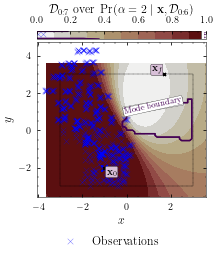

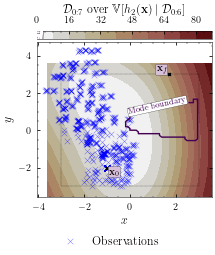

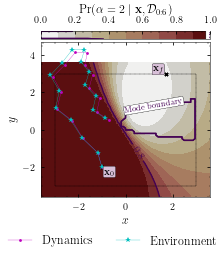

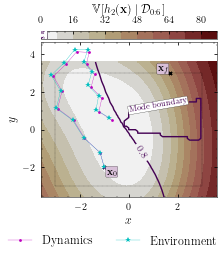

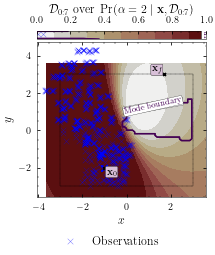

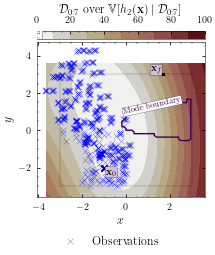

Optimisation result:
     fun: 125.86698234809757
     jac: array([-3.02880851e+01, -3.58190427e+00, -2.91964392e+01, -3.52546772e+00,
       -2.89276043e+01, -3.34638310e+00, -2.86682496e+01, -3.14154398e+00,
       -2.95988696e+01, -2.87776378e+00, -2.82758795e+01, -2.98530040e+00,
       -2.85559971e+01, -2.77552051e+00, -2.79160598e+01, -2.83162079e+00,
       -2.74760824e+01, -2.68660221e+00, -1.93872066e+01, -1.78480047e+00,
       -1.99947320e+01, -1.56903377e+00, -5.28720215e+00, -6.75432974e-01,
       -5.50328666e+00, -6.50075155e-01, -1.03253522e-04, -2.86825346e-05,
        1.77490824e-04, -6.90968753e-05])
 message: 'Optimization terminated successfully'
    nfev: 129
     nit: 36
    njev: 36
  status: 0
 success: True
       x: array([-0.900618  ,  5.35406665, -2.19540481,  5.45924503, -2.20549333,
        5.40187968, -2.08874891,  5.02136531,  1.54731916,  5.05649481,
       -0.86182226,  5.15599334,  2.46296441,  3.89122538,  1.8679856 ,
        4.25681906,  2.2327453 

2022-04-22 13:07:01.814421: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 13:07:01.814437: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


3/3 [==============================] - 2s 861ms/step - loss: -698.0124 - val_loss: -725.7431


2022-04-22 13:07:02.971215: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 13:07:02.979447: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 13:07:02.985257: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_07_02

2022-04-22 13:07:02.989565: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_07_02/dr-robots-mbp.local.trace.json.gz
2022-04-22 13:07:03.006504: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_07_02

2022-04-22 13:07:03.006717: I tensorflow/core/profiler/rpc/client/s

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_8_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 19ms/step - loss: -871.2544 - val_loss: -801.9611
Epoch 3/20000
3/3 [==============================] - 0s 19ms/step - loss: -737.4453 - val_loss: -895.0544
Epoch 4/20000
3/3 [==============================] - 0s 19ms/step - loss: -861.0993 - val_loss: -699.8325
Epoch 5/20000
3/3 [==============================] - 0s 19ms/step - loss: -886.5405 - val_loss: -558.7783
Epoch 6/20000
3/3 [==============================] - 0s 19ms/step - loss: -792.4050 - val_loss: -883.4443
Epoch 7/20000
3/3 [==============================] - 0s 20ms/step - loss: -933.3003 - val_loss: -754.4607
Epoch 8/20000
3/3 [==============================] - 0s 19ms/step - loss: -928.2407 - val_loss: -703.5371
Epoch 9/20000
3/3 [==============================] - 0s 19ms/step - loss: -794.9887 - val_loss: -877.7882
Epoch 10/20000
3/3 [==============================] - 0s 20ms/step - loss: -905.2134 - val_loss: -939.1990
Epoch 11/20000
3/3 [=========================

3/3 [==============================] - 0s 18ms/step - loss: -796.4521 - val_loss: -856.7231
Epoch 77/20000
3/3 [==============================] - 0s 19ms/step - loss: -706.7590 - val_loss: -871.1774
Epoch 78/20000
3/3 [==============================] - 0s 19ms/step - loss: -894.3740 - val_loss: -876.9777
Epoch 79/20000
3/3 [==============================] - 0s 19ms/step - loss: -854.4134 - val_loss: -955.1721
Epoch 80/20000
3/3 [==============================] - 0s 18ms/step - loss: -937.6304 - val_loss: -904.8788
Epoch 81/20000
3/3 [==============================] - 0s 19ms/step - loss: -686.0066 - val_loss: -908.0490
Epoch 82/20000
3/3 [==============================] - 0s 19ms/step - loss: -893.6090 - val_loss: -631.5206
Epoch 83/20000
3/3 [==============================] - 0s 19ms/step - loss: -248.8643 - val_loss: -885.9561
Epoch 84/20000
3/3 [==============================] - 0s 19ms/step - loss: -907.2813 - val_loss: -830.5035
Epoch 85/20000
3/3 [==============================] 

Epoch 152/20000
3/3 [==============================] - 0s 19ms/step - loss: -780.2573 - val_loss: -623.2405
Epoch 153/20000
3/3 [==============================] - 0s 19ms/step - loss: -883.4508 - val_loss: -566.1611
Epoch 154/20000
3/3 [==============================] - 0s 18ms/step - loss: -951.4632 - val_loss: -964.3292
Epoch 155/20000
3/3 [==============================] - 0s 19ms/step - loss: -954.4189 - val_loss: -934.8702
Epoch 156/20000
3/3 [==============================] - 0s 19ms/step - loss: -727.6716 - val_loss: -881.1523
Epoch 157/20000
3/3 [==============================] - 0s 18ms/step - loss: -821.1889 - val_loss: -985.8087
Epoch 158/20000
3/3 [==============================] - 0s 19ms/step - loss: -934.1829 - val_loss: -936.8718
Epoch 159/20000
3/3 [==============================] - 0s 19ms/step - loss: -807.0821 - val_loss: -897.3138
Epoch 160/20000
3/3 [==============================] - 0s 18ms/step - loss: -1002.8702 - val_loss: -960.1448
Epoch 161/20000
3/3 [======

Epoch 228/20000
3/3 [==============================] - 0s 22ms/step - loss: -913.4699 - val_loss: -793.6387
Epoch 229/20000
3/3 [==============================] - 0s 21ms/step - loss: -932.7723 - val_loss: -886.7122
Epoch 230/20000
3/3 [==============================] - 0s 21ms/step - loss: -886.2003 - val_loss: -887.0199
Epoch 231/20000
3/3 [==============================] - 0s 21ms/step - loss: -931.1827 - val_loss: -895.6311
Epoch 232/20000
3/3 [==============================] - 0s 22ms/step - loss: -862.8680 - val_loss: -921.7973
Epoch 233/20000
3/3 [==============================] - 0s 21ms/step - loss: -925.3681 - val_loss: -809.7285
Epoch 234/20000
3/3 [==============================] - 0s 22ms/step - loss: -941.0339 - val_loss: -814.7190
Epoch 235/20000
3/3 [==============================] - 0s 21ms/step - loss: -929.8765 - val_loss: -933.8705
Epoch 236/20000
3/3 [==============================] - 0s 21ms/step - loss: -919.7882 - val_loss: -881.8211
Epoch 237/20000
3/3 [=======

Epoch 304/20000
3/3 [==============================] - 0s 22ms/step - loss: -939.1783 - val_loss: -925.1928
Epoch 305/20000
3/3 [==============================] - 0s 22ms/step - loss: -943.2411 - val_loss: -802.0986
Epoch 306/20000
3/3 [==============================] - 0s 22ms/step - loss: -955.5276 - val_loss: -936.1015
Epoch 307/20000
3/3 [==============================] - 0s 22ms/step - loss: -985.9683 - val_loss: -938.3905
Epoch 308/20000
3/3 [==============================] - 0s 22ms/step - loss: -977.7836 - val_loss: -970.2782
Epoch 309/20000
3/3 [==============================] - 0s 22ms/step - loss: -955.8760 - val_loss: -970.0269
Epoch 310/20000
3/3 [==============================] - 0s 22ms/step - loss: -970.1868 - val_loss: -951.0859
Epoch 311/20000
3/3 [==============================] - 0s 22ms/step - loss: -968.6192 - val_loss: -957.0302
Epoch 312/20000
3/3 [==============================] - 0s 23ms/step - loss: -971.6283 - val_loss: -926.3052
Epoch 313/20000
3/3 [=======

3/3 [==============================] - 0s 22ms/step - loss: -1045.4266 - val_loss: -1040.6125
Epoch 380/20000
3/3 [==============================] - 0s 22ms/step - loss: -1034.5847 - val_loss: -941.8551
Epoch 381/20000
3/3 [==============================] - 0s 22ms/step - loss: -1050.9248 - val_loss: -1019.1412
Epoch 382/20000
3/3 [==============================] - 0s 22ms/step - loss: -1034.4799 - val_loss: -1072.7372
Epoch 383/20000
3/3 [==============================] - 0s 22ms/step - loss: -961.8404 - val_loss: -966.9042
Epoch 384/20000
3/3 [==============================] - 0s 22ms/step - loss: -942.5308 - val_loss: -992.5756
Epoch 385/20000
3/3 [==============================] - 0s 22ms/step - loss: -760.4251 - val_loss: -977.4662
Epoch 386/20000
3/3 [==============================] - 0s 22ms/step - loss: -902.5285 - val_loss: -988.8308
Epoch 387/20000
3/3 [==============================] - 0s 21ms/step - loss: -706.5983 - val_loss: -934.2985
Epoch 388/20000
3/3 [================

Epoch 455/20000
3/3 [==============================] - 0s 23ms/step - loss: -994.3844 - val_loss: -791.7422
Epoch 456/20000
3/3 [==============================] - 0s 23ms/step - loss: -764.1038 - val_loss: -1020.3777
Epoch 457/20000
3/3 [==============================] - 0s 23ms/step - loss: -878.1258 - val_loss: -776.0654
Epoch 458/20000
3/3 [==============================] - 0s 23ms/step - loss: -922.4325 - val_loss: -953.4533
Epoch 459/20000
3/3 [==============================] - 0s 23ms/step - loss: -761.9381 - val_loss: -909.1808
Epoch 460/20000
3/3 [==============================] - 0s 23ms/step - loss: -962.0569 - val_loss: -890.2788
Epoch 461/20000
3/3 [==============================] - 0s 23ms/step - loss: -902.7265 - val_loss: -937.2862
Epoch 462/20000
3/3 [==============================] - 0s 23ms/step - loss: -1046.1073 - val_loss: -959.2195
Epoch 463/20000
3/3 [==============================] - 0s 22ms/step - loss: -992.8897 - val_loss: -957.5582
Epoch 464/20000
3/3 [=====

3/3 [==============================] - 0s 23ms/step - loss: -1050.6606 - val_loss: -927.1907
Epoch 531/20000
3/3 [==============================] - 0s 23ms/step - loss: -1013.1487 - val_loss: -956.8472
Epoch 532/20000
3/3 [==============================] - 0s 23ms/step - loss: -1038.9026 - val_loss: -1057.9801
Epoch 533/20000
3/3 [==============================] - 0s 23ms/step - loss: -975.5929 - val_loss: -913.8325
Epoch 534/20000
3/3 [==============================] - 0s 23ms/step - loss: -983.8112 - val_loss: -981.0738
Epoch 535/20000
3/3 [==============================] - 0s 23ms/step - loss: -999.1147 - val_loss: -963.5677
Epoch 536/20000
3/3 [==============================] - 0s 22ms/step - loss: -974.6618 - val_loss: -1068.3692
Epoch 537/20000
3/3 [==============================] - 0s 22ms/step - loss: -901.7407 - val_loss: -1012.6645
Epoch 538/20000
3/3 [==============================] - 0s 23ms/step - loss: -935.8539 - val_loss: -995.7256
Epoch 539/20000
3/3 [=================

3/3 [==============================] - 0s 23ms/step - loss: -790.2408 - val_loss: -781.1870
Epoch 606/20000
3/3 [==============================] - 0s 23ms/step - loss: -607.1838 - val_loss: -606.9369
Epoch 607/20000
3/3 [==============================] - 0s 23ms/step - loss: -732.4411 - val_loss: -927.4228
Epoch 608/20000
3/3 [==============================] - 0s 22ms/step - loss: -906.0892 - val_loss: -694.0366
Epoch 609/20000
3/3 [==============================] - 0s 23ms/step - loss: -570.1091 - val_loss: -3.5386
Epoch 610/20000
3/3 [==============================] - 0s 23ms/step - loss: -745.2027 - val_loss: -853.1718
Epoch 611/20000
3/3 [==============================] - 0s 22ms/step - loss: -724.0347 - val_loss: -743.2699
Epoch 612/20000
3/3 [==============================] - 0s 22ms/step - loss: -631.7490 - val_loss: -860.0551
Epoch 613/20000
3/3 [==============================] - 0s 23ms/step - loss: -885.6021 - val_loss: -931.1073
Epoch 614/20000
3/3 [=========================

3/3 [==============================] - 0s 23ms/step - loss: -879.5104 - val_loss: -646.8816
Epoch 681/20000
3/3 [==============================] - 0s 23ms/step - loss: -1018.8271 - val_loss: -818.8313
Epoch 682/20000
3/3 [==============================] - 0s 23ms/step - loss: -1009.8712 - val_loss: -995.4621
Epoch 683/20000
3/3 [==============================] - 0s 23ms/step - loss: -1007.7310 - val_loss: -830.8325
Epoch 684/20000
3/3 [==============================] - 0s 23ms/step - loss: -934.1899 - val_loss: -939.6672
Epoch 685/20000
3/3 [==============================] - 0s 23ms/step - loss: -1000.1532 - val_loss: -993.0907
Epoch 686/20000
3/3 [==============================] - 0s 22ms/step - loss: -908.9098 - val_loss: -882.1577
Epoch 687/20000
3/3 [==============================] - 0s 22ms/step - loss: -916.0847 - val_loss: -921.6832
Epoch 688/20000
3/3 [==============================] - 0s 23ms/step - loss: -782.2072 - val_loss: -895.5965
Epoch 689/20000
3/3 [===================

3/3 [==============================] - 0s 23ms/step - loss: -919.5025 - val_loss: -896.6525
Epoch 756/20000
3/3 [==============================] - 0s 23ms/step - loss: -922.6752 - val_loss: -850.4488
Epoch 757/20000
3/3 [==============================] - 0s 24ms/step - loss: -960.3034 - val_loss: -879.7082
Epoch 758/20000
3/3 [==============================] - 0s 23ms/step - loss: -782.1254 - val_loss: -986.2415
Epoch 759/20000
3/3 [==============================] - 0s 23ms/step - loss: -991.1344 - val_loss: -746.4767
Epoch 760/20000
3/3 [==============================] - 0s 24ms/step - loss: -872.6316 - val_loss: -961.7249
Epoch 761/20000
3/3 [==============================] - 0s 24ms/step - loss: -811.0866 - val_loss: -800.5403
Epoch 762/20000
3/3 [==============================] - 0s 24ms/step - loss: -766.2004 - val_loss: -924.8012
Epoch 763/20000
3/3 [==============================] - 0s 24ms/step - loss: -803.9311 - val_loss: -853.1477
Epoch 764/20000
3/3 [=======================

3/3 [==============================] - 0s 23ms/step - loss: -1030.6681 - val_loss: -1045.7522
Epoch 831/20000
3/3 [==============================] - 0s 23ms/step - loss: -912.6560 - val_loss: -1084.4299
Epoch 832/20000
3/3 [==============================] - 0s 23ms/step - loss: -1037.1727 - val_loss: -995.5417
Epoch 833/20000
3/3 [==============================] - 0s 24ms/step - loss: -955.4943 - val_loss: -988.1647
Epoch 834/20000
3/3 [==============================] - 0s 24ms/step - loss: -1022.8998 - val_loss: -1048.3455
Epoch 835/20000
3/3 [==============================] - 0s 24ms/step - loss: -835.4958 - val_loss: -1011.7705
Epoch 836/20000
3/3 [==============================] - 0s 24ms/step - loss: -769.8126 - val_loss: -828.8101
Epoch 837/20000
3/3 [==============================] - 0s 23ms/step - loss: -938.6263 - val_loss: -1032.6993
Epoch 838/20000
3/3 [==============================] - 0s 23ms/step - loss: -834.7705 - val_loss: -910.1653
Epoch 839/20000
3/3 [===============

3/3 [==============================] - 0s 25ms/step - loss: -937.4403 - val_loss: -823.0319
Epoch 906/20000
3/3 [==============================] - 0s 24ms/step - loss: -860.3985 - val_loss: -700.9383
Epoch 907/20000
3/3 [==============================] - 0s 25ms/step - loss: -972.0749 - val_loss: -510.1560
Epoch 908/20000
3/3 [==============================] - 0s 23ms/step - loss: -983.1914 - val_loss: -940.1360
Epoch 909/20000
3/3 [==============================] - 0s 23ms/step - loss: -944.4285 - val_loss: -798.0784
Epoch 910/20000
3/3 [==============================] - 0s 23ms/step - loss: -905.4177 - val_loss: -1016.6306
Epoch 911/20000
3/3 [==============================] - 0s 23ms/step - loss: -870.1733 - val_loss: -1057.0159
Epoch 912/20000
3/3 [==============================] - 0s 23ms/step - loss: -996.6480 - val_loss: -934.4542
Epoch 913/20000
3/3 [==============================] - 0s 24ms/step - loss: -888.4228 - val_loss: -983.5071
Epoch 914/20000
3/3 [=====================

3/3 [==============================] - 0s 23ms/step - loss: -1029.6313 - val_loss: -1048.4231
Epoch 981/20000
3/3 [==============================] - 0s 23ms/step - loss: -1018.2326 - val_loss: -1045.5354
Epoch 982/20000
3/3 [==============================] - 0s 23ms/step - loss: -1077.8409 - val_loss: -1010.2559
Epoch 983/20000
3/3 [==============================] - 0s 23ms/step - loss: -908.5385 - val_loss: -991.4652
Epoch 984/20000
3/3 [==============================] - 0s 23ms/step - loss: -1032.1507 - val_loss: -893.6451
Epoch 985/20000
3/3 [==============================] - 0s 24ms/step - loss: -976.5874 - val_loss: -1006.4070
Epoch 986/20000
3/3 [==============================] - 0s 23ms/step - loss: -1013.8377 - val_loss: -930.2725
Epoch 987/20000
3/3 [==============================] - 0s 24ms/step - loss: -1007.7058 - val_loss: -1005.0358
Epoch 988/20000
3/3 [==============================] - 0s 24ms/step - loss: -1032.5284 - val_loss: -929.2589
Epoch 989/20000
3/3 [===========

Epoch 1055/20000
3/3 [==============================] - 0s 23ms/step - loss: -1102.7247 - val_loss: -1023.2384
Epoch 1056/20000
3/3 [==============================] - 0s 23ms/step - loss: -1020.7925 - val_loss: -1052.9400
Epoch 1057/20000
3/3 [==============================] - 0s 23ms/step - loss: -1017.6295 - val_loss: -896.0275
Epoch 1058/20000
3/3 [==============================] - 0s 23ms/step - loss: -857.0491 - val_loss: -748.3232
Epoch 1059/20000
3/3 [==============================] - 0s 23ms/step - loss: -1007.7281 - val_loss: -992.3624
Epoch 1060/20000
3/3 [==============================] - 0s 23ms/step - loss: -956.6768 - val_loss: -957.6374
Epoch 1061/20000
3/3 [==============================] - 0s 24ms/step - loss: -862.3186 - val_loss: -706.1776
Epoch 1062/20000
3/3 [==============================] - 0s 25ms/step - loss: -808.2676 - val_loss: -902.8967
Epoch 1063/20000
3/3 [==============================] - 0s 27ms/step - loss: -978.2482 - val_loss: -1043.6408
Epoch 1064/2

3/3 [==============================] - 0s 24ms/step - loss: -892.6996 - val_loss: -885.1241
Epoch 1130/20000
3/3 [==============================] - 0s 23ms/step - loss: -809.4508 - val_loss: -1006.9221
Epoch 1131/20000
3/3 [==============================] - 0s 23ms/step - loss: -925.9404 - val_loss: -937.5961
Epoch 1132/20000
3/3 [==============================] - 0s 23ms/step - loss: -849.4659 - val_loss: -982.0480
Epoch 1133/20000
3/3 [==============================] - 0s 23ms/step - loss: -982.1545 - val_loss: -807.8436
Epoch 1134/20000
3/3 [==============================] - 0s 24ms/step - loss: -929.0460 - val_loss: -994.0418
Epoch 1135/20000
3/3 [==============================] - 0s 24ms/step - loss: -943.7853 - val_loss: -591.5008
Epoch 1136/20000
3/3 [==============================] - 0s 23ms/step - loss: -804.7946 - val_loss: -860.6353
Epoch 1137/20000
3/3 [==============================] - 0s 23ms/step - loss: -649.7006 - val_loss: -896.9402
Epoch 1138/20000
3/3 [=============

3/3 [==============================] - 0s 23ms/step - loss: 438.9730 - val_loss: -841.0897
Epoch 1204/20000
3/3 [==============================] - 0s 23ms/step - loss: -764.0851 - val_loss: 345.1373
Epoch 1205/20000
3/3 [==============================] - 0s 23ms/step - loss: -330.2249 - val_loss: 212.2968
Epoch 1206/20000
3/3 [==============================] - 0s 23ms/step - loss: -793.8697 - val_loss: 297.9589
Epoch 1207/20000
3/3 [==============================] - 0s 24ms/step - loss: -135.9491 - val_loss: -753.6621
Epoch 1208/20000
3/3 [==============================] - 0s 23ms/step - loss: -267.6265 - val_loss: 33.1879
Epoch 1209/20000
3/3 [==============================] - 0s 23ms/step - loss: -580.1187 - val_loss: -830.5383
Epoch 1210/20000
3/3 [==============================] - 0s 22ms/step - loss: -508.8296 - val_loss: 173.8123
Epoch 1211/20000
3/3 [==============================] - 0s 22ms/step - loss: -232.5616 - val_loss: -614.3194
Epoch 1212/20000
3/3 [=====================

3/3 [==============================] - 0s 23ms/step - loss: -988.3631 - val_loss: -958.6826
Epoch 1279/20000
3/3 [==============================] - 0s 23ms/step - loss: -933.4036 - val_loss: -975.8575
Epoch 1280/20000
3/3 [==============================] - 0s 22ms/step - loss: -959.1920 - val_loss: -953.7394
Epoch 1281/20000
3/3 [==============================] - 0s 23ms/step - loss: -974.9361 - val_loss: -947.6756
Epoch 1282/20000
3/3 [==============================] - 0s 25ms/step - loss: -848.6365 - val_loss: -867.5339
Epoch 1283/20000
3/3 [==============================] - 0s 26ms/step - loss: -869.7227 - val_loss: -906.6701
Epoch 1284/20000
3/3 [==============================] - 0s 24ms/step - loss: -913.5251 - val_loss: -984.9985
Epoch 1285/20000
3/3 [==============================] - 0s 25ms/step - loss: -908.3059 - val_loss: -831.0190
Epoch 1286/20000
3/3 [==============================] - 0s 26ms/step - loss: -899.6606 - val_loss: -957.2117
Epoch 1287/20000
3/3 [==============

Epoch 1353/20000
3/3 [==============================] - 0s 23ms/step - loss: -1043.4702 - val_loss: -952.9061
Epoch 1354/20000
3/3 [==============================] - 0s 22ms/step - loss: -997.1114 - val_loss: -1017.6913
Epoch 1355/20000
3/3 [==============================] - 0s 23ms/step - loss: -1027.1265 - val_loss: -1011.7697
Epoch 1356/20000
3/3 [==============================] - 0s 22ms/step - loss: -1047.8077 - val_loss: -1016.6660
Epoch 1357/20000
3/3 [==============================] - 0s 22ms/step - loss: -1057.9521 - val_loss: -1010.9142
Epoch 1358/20000
3/3 [==============================] - 0s 22ms/step - loss: -1075.0890 - val_loss: -1048.7062
Epoch 1359/20000
3/3 [==============================] - 0s 23ms/step - loss: -1070.2202 - val_loss: -1019.0938
Epoch 1360/20000
3/3 [==============================] - 0s 24ms/step - loss: -1042.3762 - val_loss: -1010.1853
Epoch 1361/20000
3/3 [==============================] - 0s 24ms/step - loss: -1071.0548 - val_loss: -1057.9054
Epo

3/3 [==============================] - 0s 22ms/step - loss: -1084.5857 - val_loss: -1008.0379
Epoch 1428/20000
3/3 [==============================] - 0s 23ms/step - loss: -1043.3198 - val_loss: -1019.6458
Epoch 1429/20000
3/3 [==============================] - 0s 23ms/step - loss: -1088.3806 - val_loss: -878.9111
Epoch 1430/20000
3/3 [==============================] - 0s 22ms/step - loss: -1057.5474 - val_loss: -973.8698
Epoch 1431/20000
3/3 [==============================] - 0s 22ms/step - loss: -1062.4024 - val_loss: -1014.7691
Epoch 1432/20000
3/3 [==============================] - 0s 22ms/step - loss: -1044.3763 - val_loss: -1071.1224
Epoch 1433/20000
3/3 [==============================] - 0s 23ms/step - loss: -1080.1843 - val_loss: -1017.5157
Epoch 1434/20000
3/3 [==============================] - 0s 22ms/step - loss: -1077.3029 - val_loss: -1080.2272
Epoch 1435/20000
3/3 [==============================] - 0s 23ms/step - loss: -1087.5450 - val_loss: -1050.0254
Epoch 1436/20000
3/3

Epoch 1502/20000
3/3 [==============================] - 0s 23ms/step - loss: -858.6824 - val_loss: -951.0203
Epoch 1503/20000
3/3 [==============================] - 0s 22ms/step - loss: -1002.4904 - val_loss: -984.4844
Epoch 1504/20000
3/3 [==============================] - 0s 22ms/step - loss: -1000.8643 - val_loss: -929.4519
Epoch 1505/20000
3/3 [==============================] - 0s 23ms/step - loss: -972.9777 - val_loss: -778.0689
Epoch 1506/20000
3/3 [==============================] - 0s 26ms/step - loss: -958.0777 - val_loss: -1017.4300
Epoch 1507/20000
3/3 [==============================] - 0s 25ms/step - loss: -999.0692 - val_loss: -980.9689
Epoch 1508/20000
3/3 [==============================] - 0s 24ms/step - loss: -1002.4007 - val_loss: -991.6579
Epoch 1509/20000
3/3 [==============================] - 0s 25ms/step - loss: -1017.4556 - val_loss: -1027.9445
Epoch 1510/20000
3/3 [==============================] - 0s 25ms/step - loss: -996.0799 - val_loss: -990.0161
Epoch 1511/20

3/3 [==============================] - 0s 23ms/step - loss: -1051.0797 - val_loss: -1034.4355
Epoch 1577/20000
3/3 [==============================] - 0s 23ms/step - loss: -1048.0942 - val_loss: -917.0741
Epoch 1578/20000
3/3 [==============================] - 0s 22ms/step - loss: -1036.0313 - val_loss: -1056.3412
Epoch 1579/20000
3/3 [==============================] - 0s 23ms/step - loss: -1061.3328 - val_loss: -1039.8337
Epoch 1580/20000
3/3 [==============================] - 0s 24ms/step - loss: -1015.7867 - val_loss: -1002.6930
Epoch 1581/20000
3/3 [==============================] - 0s 24ms/step - loss: -1044.3685 - val_loss: -953.3033
Epoch 1582/20000
3/3 [==============================] - 0s 26ms/step - loss: -1060.1926 - val_loss: -1013.8106
Epoch 1583/20000
3/3 [==============================] - 0s 24ms/step - loss: -1048.8284 - val_loss: -1002.3876
Epoch 1584/20000
3/3 [==============================] - 0s 23ms/step - loss: -1039.1983 - val_loss: -1069.0404
Epoch 1585/20000
3/3

Epoch 1651/20000
3/3 [==============================] - 0s 23ms/step - loss: -1002.1619 - val_loss: -1076.2136
Epoch 1652/20000
3/3 [==============================] - 0s 23ms/step - loss: -1052.7770 - val_loss: -1044.8148
Epoch 1653/20000
3/3 [==============================] - 0s 24ms/step - loss: -1054.0590 - val_loss: -1052.7850
Epoch 1654/20000
3/3 [==============================] - 0s 24ms/step - loss: -1007.9118 - val_loss: -961.1676
Epoch 1655/20000
3/3 [==============================] - 0s 24ms/step - loss: -1062.8098 - val_loss: -1041.6636
Epoch 1656/20000
3/3 [==============================] - 0s 23ms/step - loss: -1041.7299 - val_loss: -965.2881
Epoch 1657/20000
3/3 [==============================] - 0s 23ms/step - loss: -987.8216 - val_loss: -1046.0583
Epoch 1658/20000
3/3 [==============================] - 0s 23ms/step - loss: -1029.2562 - val_loss: -1029.9334
Epoch 1659/20000
3/3 [==============================] - 0s 24ms/step - loss: -1060.7950 - val_loss: -979.9701
Epoch

3/3 [==============================] - 0s 25ms/step - loss: -1020.5992 - val_loss: -1060.4915
Epoch 1726/20000
3/3 [==============================] - 0s 28ms/step - loss: -1060.1154 - val_loss: -961.1571
Epoch 1727/20000
3/3 [==============================] - 0s 25ms/step - loss: -1062.3737 - val_loss: -1016.6091
Epoch 1728/20000
3/3 [==============================] - 0s 25ms/step - loss: -1069.2509 - val_loss: -1077.6440
Epoch 1729/20000
3/3 [==============================] - 0s 26ms/step - loss: -1050.6406 - val_loss: -932.0466
Epoch 1730/20000
3/3 [==============================] - 0s 26ms/step - loss: -1058.7212 - val_loss: -1018.1369
Epoch 1731/20000
3/3 [==============================] - 0s 24ms/step - loss: -1091.4000 - val_loss: -1015.7428
Epoch 1732/20000
3/3 [==============================] - 0s 25ms/step - loss: -890.7166 - val_loss: -1039.0805
Epoch 1733/20000
3/3 [==============================] - 0s 26ms/step - loss: -1096.4151 - val_loss: -1020.9879
Epoch 1734/20000
3/3 

3/3 [==============================] - 0s 24ms/step - loss: -984.9972 - val_loss: -1069.5785
Epoch 1800/20000
3/3 [==============================] - 0s 24ms/step - loss: -956.6549 - val_loss: -913.8536
Epoch 1801/20000
3/3 [==============================] - 0s 25ms/step - loss: -1004.0589 - val_loss: -1050.3075
Epoch 1802/20000
3/3 [==============================] - 0s 24ms/step - loss: -1029.0304 - val_loss: -972.8669
Epoch 1803/20000
3/3 [==============================] - 0s 24ms/step - loss: -1060.0222 - val_loss: -896.4689
Epoch 1804/20000
3/3 [==============================] - 0s 24ms/step - loss: -916.5710 - val_loss: -1000.1971
Epoch 1805/20000
3/3 [==============================] - 0s 25ms/step - loss: -724.2355 - val_loss: -1042.3176
Epoch 1806/20000
3/3 [==============================] - 0s 24ms/step - loss: -948.5658 - val_loss: -859.7006
Epoch 1807/20000
3/3 [==============================] - 0s 24ms/step - loss: -1009.0744 - val_loss: -980.9797
Epoch 1808/20000
3/3 [======

3/3 [==============================] - 0s 23ms/step - loss: -1055.8963 - val_loss: -987.1861
Epoch 1874/20000
3/3 [==============================] - 0s 23ms/step - loss: -1018.6310 - val_loss: -1012.4685
Epoch 1875/20000
3/3 [==============================] - 0s 23ms/step - loss: -963.4738 - val_loss: -1080.1099
Epoch 1876/20000
3/3 [==============================] - 0s 23ms/step - loss: -1029.9515 - val_loss: -942.9461
Epoch 1877/20000
3/3 [==============================] - 0s 23ms/step - loss: -1031.4101 - val_loss: -1018.3915
Epoch 1878/20000
3/3 [==============================] - 0s 23ms/step - loss: -1038.3189 - val_loss: -1014.2424
Epoch 1879/20000
3/3 [==============================] - 0s 23ms/step - loss: -1054.5326 - val_loss: -993.9223
Epoch 1880/20000
3/3 [==============================] - 0s 23ms/step - loss: -843.6890 - val_loss: -981.4340
Epoch 1881/20000
3/3 [==============================] - 0s 23ms/step - loss: -953.3382 - val_loss: -1072.0183
Epoch 1882/20000
3/3 [===

3/3 [==============================] - 0s 24ms/step - loss: -1029.1569 - val_loss: -934.4775
Epoch 1948/20000
3/3 [==============================] - 0s 25ms/step - loss: -1059.8246 - val_loss: -1027.1741
Epoch 1949/20000
3/3 [==============================] - 0s 26ms/step - loss: -1039.4328 - val_loss: -1026.1516
Epoch 1950/20000
3/3 [==============================] - 0s 24ms/step - loss: -1067.2571 - val_loss: -974.7120
Epoch 1951/20000
3/3 [==============================] - 0s 25ms/step - loss: -1030.5418 - val_loss: -964.8558
Epoch 1952/20000
3/3 [==============================] - 0s 25ms/step - loss: -1038.8949 - val_loss: -1006.6267
Epoch 1953/20000
3/3 [==============================] - 0s 24ms/step - loss: -1055.7276 - val_loss: -1060.8975
Epoch 1954/20000
3/3 [==============================] - 0s 24ms/step - loss: -1090.5075 - val_loss: -1058.5277
Epoch 1955/20000
3/3 [==============================] - 0s 25ms/step - loss: -1070.7815 - val_loss: -1024.0984
Epoch 1956/20000
3/3 

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_8_epoch_2000/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2002/20000
3/3 [==============================] - 0s 18ms/step - loss: -1018.4343 - val_loss: -733.6908
Epoch 2003/20000
3/3 [==============================] - 0s 19ms/step - loss: -12.2890 - val_loss: 496.2337
Epoch 2004/20000
3/3 [==============================] - 0s 19ms/step - loss: -687.3881 - val_loss: 671.8680
Epoch 2005/20000
3/3 [==============================] - 0s 19ms/step - loss: -292.7168 - val_loss: -486.5644
Epoch 2006/20000
3/3 [==============================] - 0s 19ms/step - loss: -52.5309 - val_loss: -398.3674
Epoch 2007/20000
3/3 [==============================] - 0s 19ms/step - loss: -609.6161 - val_loss: -454.4824
Epoch 2008/20000
3/3 [==============================] - 0s 19ms/step - loss: -514.1052 - val_loss: -644.0626
Epoch 2009/20000
3/3 [==============================] - 0s 19ms/step - loss: -740.2005 - val_loss: 179.4790
Epoch 2010/20000
3/3 [==============================] - 0s 19ms/step - loss: -748.9873 - val_loss: -366.9001
Epoch 2011/20000
3/3 [=

Epoch 2077/20000
3/3 [==============================] - 0s 18ms/step - loss: -1077.0546 - val_loss: -1030.8410
Epoch 2078/20000
3/3 [==============================] - 0s 19ms/step - loss: -1078.7777 - val_loss: -1046.0304
Epoch 2079/20000
3/3 [==============================] - 0s 18ms/step - loss: -1121.4639 - val_loss: -1063.9796
Epoch 2080/20000
3/3 [==============================] - 0s 19ms/step - loss: -1089.9840 - val_loss: -1093.1271
Epoch 2081/20000
3/3 [==============================] - 0s 18ms/step - loss: -1078.4761 - val_loss: -1020.7414
Epoch 2082/20000
3/3 [==============================] - 0s 18ms/step - loss: -1078.9878 - val_loss: -972.0508
Epoch 2083/20000
3/3 [==============================] - 0s 19ms/step - loss: -1044.4856 - val_loss: -1093.4906
Epoch 2084/20000
3/3 [==============================] - 0s 18ms/step - loss: -1105.7745 - val_loss: -1088.3347
Epoch 2085/20000
3/3 [==============================] - 0s 19ms/step - loss: -1099.2792 - val_loss: -1064.0904
Ep

3/3 [==============================] - 0s 21ms/step - loss: -1019.8409 - val_loss: -953.6119
Epoch 2153/20000
3/3 [==============================] - 0s 21ms/step - loss: -1031.2379 - val_loss: -981.7085
Epoch 2154/20000
3/3 [==============================] - 0s 20ms/step - loss: -1039.6695 - val_loss: -973.4257
Epoch 2155/20000
3/3 [==============================] - 0s 21ms/step - loss: -1027.2345 - val_loss: -980.8696
Epoch 2156/20000
3/3 [==============================] - 0s 21ms/step - loss: -1040.7897 - val_loss: -986.3510
Epoch 2157/20000
3/3 [==============================] - 0s 20ms/step - loss: -1044.2532 - val_loss: -1017.6576
Epoch 2158/20000
3/3 [==============================] - 0s 21ms/step - loss: -1060.0306 - val_loss: -1002.1668
Epoch 2159/20000
3/3 [==============================] - 0s 21ms/step - loss: -1057.3103 - val_loss: -998.5441
Epoch 2160/20000
3/3 [==============================] - 0s 20ms/step - loss: -1069.3203 - val_loss: -993.3124
Epoch 2161/20000
3/3 [===

3/3 [==============================] - 0s 23ms/step - loss: -598.3020 - val_loss: -646.2713
Epoch 2227/20000
3/3 [==============================] - 0s 23ms/step - loss: -511.3119 - val_loss: -806.7969
Epoch 2228/20000
3/3 [==============================] - 0s 23ms/step - loss: -759.7396 - val_loss: -675.9536
Epoch 2229/20000
3/3 [==============================] - 0s 24ms/step - loss: -433.1430 - val_loss: -782.5075
Epoch 2230/20000
3/3 [==============================] - 0s 23ms/step - loss: -478.4925 - val_loss: -271.5968
Epoch 2231/20000
3/3 [==============================] - 0s 24ms/step - loss: -735.3623 - val_loss: -701.8322
Epoch 2232/20000
3/3 [==============================] - 0s 24ms/step - loss: -529.5557 - val_loss: -817.0226
Epoch 2233/20000
3/3 [==============================] - 0s 24ms/step - loss: -229.6950 - val_loss: -696.7872
Epoch 2234/20000
3/3 [==============================] - 0s 24ms/step - loss: -673.7858 - val_loss: -689.7207
Epoch 2235/20000
3/3 [==============

3/3 [==============================] - 0s 23ms/step - loss: -927.5043 - val_loss: -824.4734
Epoch 2302/20000
3/3 [==============================] - 0s 23ms/step - loss: -968.5973 - val_loss: -1021.2306
Epoch 2303/20000
3/3 [==============================] - 0s 23ms/step - loss: -992.7128 - val_loss: -986.4230
Epoch 2304/20000
3/3 [==============================] - 0s 23ms/step - loss: -997.0106 - val_loss: -1034.9932
Epoch 2305/20000
3/3 [==============================] - 0s 23ms/step - loss: -938.5766 - val_loss: -1015.7014
Epoch 2306/20000
3/3 [==============================] - 0s 22ms/step - loss: -947.5338 - val_loss: -1026.7788
Epoch 2307/20000
3/3 [==============================] - 0s 22ms/step - loss: -878.5595 - val_loss: -987.7171
Epoch 2308/20000
3/3 [==============================] - 0s 22ms/step - loss: -966.6931 - val_loss: -937.2140
Epoch 2309/20000
3/3 [==============================] - 0s 22ms/step - loss: -967.3291 - val_loss: -674.8127
Epoch 2310/20000
3/3 [==========

3/3 [==============================] - 0s 22ms/step - loss: -948.5781 - val_loss: -855.5630
Epoch 2377/20000
3/3 [==============================] - 0s 23ms/step - loss: -877.9180 - val_loss: -960.9860
Epoch 2378/20000
3/3 [==============================] - 0s 23ms/step - loss: -926.0623 - val_loss: -994.1125
Epoch 2379/20000
3/3 [==============================] - 0s 22ms/step - loss: -927.6978 - val_loss: -943.0582
Epoch 2380/20000
3/3 [==============================] - 0s 22ms/step - loss: -909.8358 - val_loss: -941.4266
Epoch 2381/20000
3/3 [==============================] - 0s 22ms/step - loss: -973.6767 - val_loss: -796.8424
Epoch 2382/20000
3/3 [==============================] - 0s 22ms/step - loss: -834.1238 - val_loss: -936.4899
Epoch 2383/20000
3/3 [==============================] - 0s 22ms/step - loss: -935.1062 - val_loss: -934.1142
Epoch 2384/20000
3/3 [==============================] - 0s 23ms/step - loss: -967.7518 - val_loss: -895.2975
Epoch 2385/20000
3/3 [==============

3/3 [==============================] - 0s 22ms/step - loss: -891.8081 - val_loss: -476.0464
Epoch 2452/20000
3/3 [==============================] - 0s 23ms/step - loss: -513.2833 - val_loss: -751.0177
Epoch 2453/20000
3/3 [==============================] - 0s 24ms/step - loss: -717.0418 - val_loss: -913.6918
Epoch 2454/20000
3/3 [==============================] - 0s 23ms/step - loss: -833.5865 - val_loss: -886.1889
Epoch 2455/20000
3/3 [==============================] - 0s 22ms/step - loss: -936.9470 - val_loss: -852.9301
Epoch 2456/20000
3/3 [==============================] - 0s 23ms/step - loss: -896.6713 - val_loss: -893.4590
Epoch 2457/20000
3/3 [==============================] - 0s 25ms/step - loss: -864.2201 - val_loss: -460.9253
Epoch 2458/20000
3/3 [==============================] - 0s 24ms/step - loss: -852.6046 - val_loss: -967.0716
Epoch 2459/20000
3/3 [==============================] - 0s 24ms/step - loss: -826.2943 - val_loss: -852.3719
Epoch 2460/20000
3/3 [==============

3/3 [==============================] - 0s 23ms/step - loss: -942.0152 - val_loss: -876.1843
Epoch 2527/20000
3/3 [==============================] - 0s 23ms/step - loss: -914.2790 - val_loss: -893.5351
Epoch 2528/20000
3/3 [==============================] - 0s 22ms/step - loss: -900.3158 - val_loss: -910.5566
Epoch 2529/20000
3/3 [==============================] - 0s 23ms/step - loss: -877.7268 - val_loss: -914.8833
Epoch 2530/20000
3/3 [==============================] - 0s 22ms/step - loss: -954.1860 - val_loss: -918.3242
Epoch 2531/20000
3/3 [==============================] - 0s 22ms/step - loss: -912.1132 - val_loss: -917.8287
Epoch 2532/20000
3/3 [==============================] - 0s 22ms/step - loss: -872.1408 - val_loss: -928.5974
Epoch 2533/20000
3/3 [==============================] - 0s 24ms/step - loss: -950.7014 - val_loss: -933.2514
Epoch 2534/20000
3/3 [==============================] - 0s 22ms/step - loss: -881.7946 - val_loss: -947.7317
Epoch 2535/20000
3/3 [==============

Epoch 2601/20000
3/3 [==============================] - 0s 22ms/step - loss: -1060.7857 - val_loss: -966.2559
Epoch 2602/20000
3/3 [==============================] - 0s 22ms/step - loss: -1030.0478 - val_loss: -977.6743
Epoch 2603/20000
3/3 [==============================] - 0s 22ms/step - loss: -993.6894 - val_loss: -1029.6614
Epoch 2604/20000
3/3 [==============================] - 0s 23ms/step - loss: -1031.3405 - val_loss: -1014.5436
Epoch 2605/20000
3/3 [==============================] - 0s 22ms/step - loss: -1032.1734 - val_loss: -1020.4900
Epoch 2606/20000
3/3 [==============================] - 0s 22ms/step - loss: -1036.3336 - val_loss: -563.3040
Epoch 2607/20000
3/3 [==============================] - 0s 23ms/step - loss: -1045.7641 - val_loss: -1050.4821
Epoch 2608/20000
3/3 [==============================] - 0s 23ms/step - loss: -895.1577 - val_loss: -1025.9420
Epoch 2609/20000
3/3 [==============================] - 0s 23ms/step - loss: -1038.8760 - val_loss: -879.0200
Epoch 2

Epoch 2676/20000
3/3 [==============================] - 0s 24ms/step - loss: -871.8890 - val_loss: -858.2424
Epoch 2677/20000
3/3 [==============================] - 0s 24ms/step - loss: -905.5377 - val_loss: -644.1294
Epoch 2678/20000
3/3 [==============================] - 0s 25ms/step - loss: -840.8890 - val_loss: -823.3769
Epoch 2679/20000
3/3 [==============================] - 0s 25ms/step - loss: -868.4485 - val_loss: -881.8292
Epoch 2680/20000
3/3 [==============================] - 0s 24ms/step - loss: -896.7600 - val_loss: -898.2727
Epoch 2681/20000
3/3 [==============================] - 0s 24ms/step - loss: -891.0476 - val_loss: -855.2803
Epoch 2682/20000
3/3 [==============================] - 0s 23ms/step - loss: -881.5095 - val_loss: -909.3395
Epoch 2683/20000
3/3 [==============================] - 0s 24ms/step - loss: -928.3611 - val_loss: -892.2988
Epoch 2684/20000
3/3 [==============================] - 0s 24ms/step - loss: -914.0407 - val_loss: -859.7230
Epoch 2685/20000
3/

3/3 [==============================] - 0s 24ms/step - loss: -476.2091 - val_loss: -970.2413
Epoch 2751/20000
3/3 [==============================] - 0s 23ms/step - loss: -502.2837 - val_loss: -599.0609
Epoch 2752/20000
3/3 [==============================] - 0s 23ms/step - loss: -895.1902 - val_loss: -705.5262
Epoch 2753/20000
3/3 [==============================] - 0s 23ms/step - loss: -885.0403 - val_loss: -703.2498
Epoch 2754/20000
3/3 [==============================] - 0s 23ms/step - loss: -465.6296 - val_loss: -980.9020
Epoch 2755/20000
3/3 [==============================] - 0s 23ms/step - loss: -359.2695 - val_loss: -315.4892
Epoch 2756/20000
3/3 [==============================] - 0s 23ms/step - loss: -296.7933 - val_loss: -678.0702
Epoch 2757/20000
3/3 [==============================] - 0s 22ms/step - loss: -864.1396 - val_loss: -871.9993
Epoch 2758/20000
3/3 [==============================] - 0s 23ms/step - loss: -578.6610 - val_loss: -578.9953
Epoch 2759/20000
3/3 [==============

Epoch 2825/20000
3/3 [==============================] - 0s 23ms/step - loss: -1069.4090 - val_loss: -1045.1445
Epoch 2826/20000
3/3 [==============================] - 0s 22ms/step - loss: -1075.9172 - val_loss: -1039.7550
Epoch 2827/20000
3/3 [==============================] - 0s 22ms/step - loss: -1071.7188 - val_loss: -1091.7802
Epoch 2828/20000
3/3 [==============================] - 0s 22ms/step - loss: -1079.4612 - val_loss: -1022.4771
Epoch 2829/20000
3/3 [==============================] - 0s 22ms/step - loss: -1088.5169 - val_loss: -1086.7723
Epoch 2830/20000
3/3 [==============================] - 0s 23ms/step - loss: -1060.2600 - val_loss: -999.5632
Epoch 2831/20000
3/3 [==============================] - 0s 22ms/step - loss: -1084.6784 - val_loss: -1057.6826
Epoch 2832/20000
3/3 [==============================] - 0s 22ms/step - loss: -1090.9171 - val_loss: -1067.5640
Epoch 2833/20000
3/3 [==============================] - 0s 23ms/step - loss: -1032.4954 - val_loss: -1004.2873
Ep

Epoch 2900/20000
3/3 [==============================] - 0s 25ms/step - loss: -804.4584 - val_loss: -889.4486
Epoch 2901/20000
3/3 [==============================] - 0s 25ms/step - loss: -888.6174 - val_loss: -769.5344
Epoch 2902/20000
3/3 [==============================] - 0s 25ms/step - loss: -835.6459 - val_loss: -856.5355
Epoch 2903/20000
3/3 [==============================] - 0s 24ms/step - loss: -893.5943 - val_loss: -714.0000
Epoch 2904/20000
3/3 [==============================] - 0s 24ms/step - loss: -913.4741 - val_loss: -926.3021
Epoch 2905/20000
3/3 [==============================] - 0s 24ms/step - loss: -908.5391 - val_loss: -867.0733
Epoch 2906/20000
3/3 [==============================] - 0s 25ms/step - loss: -937.5244 - val_loss: -945.2838
Epoch 2907/20000
3/3 [==============================] - 0s 24ms/step - loss: -909.9759 - val_loss: -936.4756
Epoch 2908/20000
3/3 [==============================] - 0s 24ms/step - loss: -953.2027 - val_loss: -920.1116
Epoch 2909/20000
3/

3/3 [==============================] - 0s 23ms/step - loss: -657.5172 - val_loss: -771.1973
Epoch 2976/20000
3/3 [==============================] - 0s 23ms/step - loss: -564.8180 - val_loss: -806.7054
Epoch 2977/20000
3/3 [==============================] - 0s 22ms/step - loss: -808.0739 - val_loss: -745.7096
Epoch 2978/20000
3/3 [==============================] - 0s 23ms/step - loss: -770.8309 - val_loss: -733.6968
Epoch 2979/20000
3/3 [==============================] - 0s 23ms/step - loss: -750.4609 - val_loss: -789.5029
Epoch 2980/20000
3/3 [==============================] - 0s 23ms/step - loss: -759.4508 - val_loss: -729.7519
Epoch 2981/20000
3/3 [==============================] - 0s 24ms/step - loss: -762.5557 - val_loss: -812.4944
Epoch 2982/20000
3/3 [==============================] - 0s 23ms/step - loss: -814.8225 - val_loss: -809.4949
Epoch 2983/20000
3/3 [==============================] - 0s 23ms/step - loss: -823.6304 - val_loss: -776.6666
Epoch 2984/20000
3/3 [==============

Epoch 3050/20000
3/3 [==============================] - 0s 23ms/step - loss: -898.5756 - val_loss: -831.0255
Epoch 3051/20000
3/3 [==============================] - 0s 24ms/step - loss: -991.4241 - val_loss: -976.8620
Epoch 3052/20000
3/3 [==============================] - 0s 24ms/step - loss: -875.3418 - val_loss: -1015.6857
Epoch 3053/20000
3/3 [==============================] - 0s 23ms/step - loss: -1012.7658 - val_loss: -995.9782
Epoch 3054/20000
3/3 [==============================] - 0s 23ms/step - loss: -1002.6065 - val_loss: -1043.0693
Epoch 3055/20000
3/3 [==============================] - 0s 24ms/step - loss: -1009.3755 - val_loss: -954.3160
Epoch 3056/20000
3/3 [==============================] - 0s 24ms/step - loss: -927.5447 - val_loss: -947.7606
Epoch 3057/20000
3/3 [==============================] - 0s 23ms/step - loss: -989.5934 - val_loss: -1000.1684
Epoch 3058/20000
3/3 [==============================] - 0s 23ms/step - loss: -998.0666 - val_loss: -940.5401
Epoch 3059/20

3/3 [==============================] - 0s 25ms/step - loss: -1072.1690 - val_loss: -1045.3621
Epoch 3125/20000
3/3 [==============================] - 0s 24ms/step - loss: -992.1166 - val_loss: -1003.4852
Epoch 3126/20000
3/3 [==============================] - 0s 24ms/step - loss: -1095.5956 - val_loss: -1023.4957
Epoch 3127/20000
3/3 [==============================] - 0s 25ms/step - loss: -1064.7186 - val_loss: -956.3249
Epoch 3128/20000
3/3 [==============================] - 0s 25ms/step - loss: -1069.6481 - val_loss: -1065.8156
Epoch 3129/20000
3/3 [==============================] - 0s 26ms/step - loss: -1019.3770 - val_loss: -1079.6977
Epoch 3130/20000
3/3 [==============================] - 0s 25ms/step - loss: -1030.5104 - val_loss: -894.3920
Epoch 3131/20000
3/3 [==============================] - 0s 24ms/step - loss: -1070.3593 - val_loss: -974.4581
Epoch 3132/20000
3/3 [==============================] - 0s 26ms/step - loss: -993.5019 - val_loss: -1017.3713
Epoch 3133/20000
3/3 [=

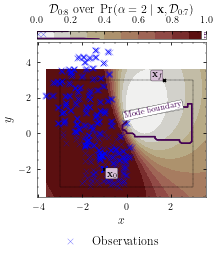

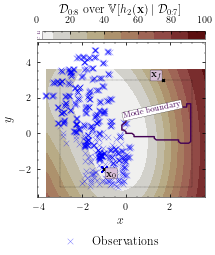

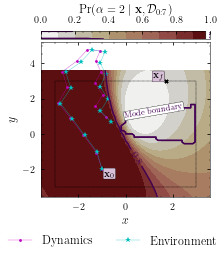

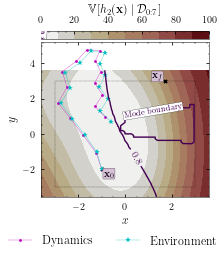

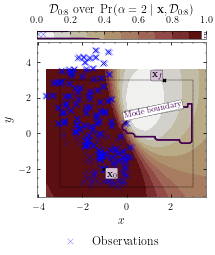

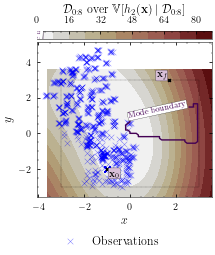

Optimisation result:
     fun: 174.33132896249924
     jac: array([-29.54924518,  -3.46490471, -28.25077574,  -3.45389995,
       -28.31221814,  -3.26168731, -27.71796148,  -3.14296014,
       -28.8725451 ,  -2.78049433, -27.56898666,  -3.04372393,
       -28.12852097,  -2.78133271, -27.54935265,  -2.95124372,
       -27.36324395,  -2.96443991, -19.51771724,  -2.21491495,
       -20.12231178,  -2.06499152,  -5.5763104 ,  -0.87007313,
        -5.81647455,  -0.84913867,  -0.30549971,  -0.08810624,
        -0.31849771,  -0.08850071])
 message: 'Optimization terminated successfully'
    nfev: 56
     nit: 27
    njev: 27
  status: 0
 success: True
       x: array([-0.82800784,  5.36536802, -2.36712272,  5.40906895, -1.92205661,
        5.67428718, -2.37227663,  4.81698017,  1.22148391,  5.26933017,
       -1.05949397,  5.20572606,  2.33454233,  3.95884094,  1.75645009,
        4.35406253,  2.21646373,  1.37706407, -0.89571937, -0.83097727,
        0.93490268, -0.82907129, -1.14558854, -1.0

2022-04-22 13:11:41.137459: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 13:11:41.137474: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


3/3 [==============================] - 2s 900ms/step - loss: -1069.4748 - val_loss: -985.7260


2022-04-22 13:11:42.339088: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 13:11:42.350041: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 13:11:42.357492: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_11_42

2022-04-22 13:11:42.361973: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_11_42/dr-robots-mbp.local.trace.json.gz
2022-04-22 13:11:42.380532: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_11_42

2022-04-22 13:11:42.380750: I tensorflow/core/profiler/rpc/client/s

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_9_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 21ms/step - loss: -945.8596 - val_loss: -1014.3926
Epoch 3/20000
3/3 [==============================] - 0s 20ms/step - loss: -1015.7620 - val_loss: -978.0220
Epoch 4/20000
3/3 [==============================] - 0s 20ms/step - loss: -1035.1159 - val_loss: -1002.2673
Epoch 5/20000
3/3 [==============================] - 0s 21ms/step - loss: -1056.7264 - val_loss: -993.9027
Epoch 6/20000
3/3 [==============================] - 0s 20ms/step - loss: -982.8335 - val_loss: -908.7485
Epoch 7/20000
3/3 [==============================] - 0s 21ms/step - loss: -1007.4977 - val_loss: -865.0806
Epoch 8/20000
3/3 [==============================] - 0s 21ms/step - loss: -1014.2254 - val_loss: -892.5585
Epoch 9/20000
3/3 [==============================] - 0s 20ms/step - loss: -981.2985 - val_loss: -964.4685
Epoch 10/20000
3/3 [==============================] - 0s 19ms/step - loss: -997.2702 - val_loss: -934.6923
Epoch 11/20000
3/3 [==================

Epoch 76/20000
3/3 [==============================] - 0s 19ms/step - loss: -1082.3783 - val_loss: -1012.8524
Epoch 77/20000
3/3 [==============================] - 0s 19ms/step - loss: -1059.1821 - val_loss: -982.4241
Epoch 78/20000
3/3 [==============================] - 0s 19ms/step - loss: -1080.2253 - val_loss: -1022.3840
Epoch 79/20000
3/3 [==============================] - 0s 19ms/step - loss: -1083.5918 - val_loss: -1029.4105
Epoch 80/20000
3/3 [==============================] - 0s 19ms/step - loss: -1089.1905 - val_loss: -1005.0574
Epoch 81/20000
3/3 [==============================] - 0s 19ms/step - loss: -1075.3258 - val_loss: -977.5062
Epoch 82/20000
3/3 [==============================] - 0s 19ms/step - loss: -1082.7836 - val_loss: -964.3336
Epoch 83/20000
3/3 [==============================] - 0s 20ms/step - loss: -1025.2015 - val_loss: -1078.7736
Epoch 84/20000
3/3 [==============================] - 0s 19ms/step - loss: -1093.5206 - val_loss: -963.2435
Epoch 85/20000
3/3 [===

3/3 [==============================] - 0s 19ms/step - loss: -1072.0540 - val_loss: -1047.1905
Epoch 152/20000
3/3 [==============================] - 0s 19ms/step - loss: -1072.0765 - val_loss: -1017.9696
Epoch 153/20000
3/3 [==============================] - 0s 19ms/step - loss: -1081.7711 - val_loss: -1023.8804
Epoch 154/20000
3/3 [==============================] - 0s 19ms/step - loss: -1096.7478 - val_loss: -1026.4865
Epoch 155/20000
3/3 [==============================] - 0s 19ms/step - loss: -1095.2074 - val_loss: -993.7050
Epoch 156/20000
3/3 [==============================] - 0s 20ms/step - loss: -1094.9161 - val_loss: -1000.9482
Epoch 157/20000
3/3 [==============================] - 0s 20ms/step - loss: -1079.4067 - val_loss: -977.4467
Epoch 158/20000
3/3 [==============================] - 0s 19ms/step - loss: -1091.5008 - val_loss: -993.6404
Epoch 159/20000
3/3 [==============================] - 0s 19ms/step - loss: -1070.1559 - val_loss: -1048.3475
Epoch 160/20000
3/3 [========

3/3 [==============================] - 0s 25ms/step - loss: -991.0528 - val_loss: -980.8562
Epoch 227/20000
3/3 [==============================] - 0s 24ms/step - loss: -1067.7393 - val_loss: -984.4318
Epoch 228/20000
3/3 [==============================] - 0s 29ms/step - loss: -1037.8010 - val_loss: -974.0801
Epoch 229/20000
3/3 [==============================] - 0s 24ms/step - loss: -1075.5084 - val_loss: -954.0168
Epoch 230/20000
3/3 [==============================] - 0s 25ms/step - loss: -1079.3780 - val_loss: -958.9219
Epoch 231/20000
3/3 [==============================] - 0s 23ms/step - loss: -1074.1226 - val_loss: -1011.7923
Epoch 232/20000
3/3 [==============================] - 0s 24ms/step - loss: -1069.6294 - val_loss: -1074.2207
Epoch 233/20000
3/3 [==============================] - 0s 25ms/step - loss: -1096.8935 - val_loss: -1060.0869
Epoch 234/20000
3/3 [==============================] - 0s 23ms/step - loss: -1046.3501 - val_loss: -1006.0413
Epoch 235/20000
3/3 [===========

3/3 [==============================] - 0s 24ms/step - loss: -618.8608 - val_loss: -871.2010
Epoch 302/20000
3/3 [==============================] - 0s 24ms/step - loss: -760.3715 - val_loss: -748.8450
Epoch 303/20000
3/3 [==============================] - 0s 23ms/step - loss: -948.8555 - val_loss: -850.1206
Epoch 304/20000
3/3 [==============================] - 0s 23ms/step - loss: -952.1868 - val_loss: -215.5146
Epoch 305/20000
3/3 [==============================] - 0s 23ms/step - loss: -762.5978 - val_loss: -699.1247
Epoch 306/20000
3/3 [==============================] - 0s 23ms/step - loss: -480.6668 - val_loss: -938.4530
Epoch 307/20000
3/3 [==============================] - 0s 23ms/step - loss: -1006.3196 - val_loss: -915.1908
Epoch 308/20000
3/3 [==============================] - 0s 23ms/step - loss: -868.7351 - val_loss: -795.3378
Epoch 309/20000
3/3 [==============================] - 0s 23ms/step - loss: -727.2718 - val_loss: -841.8689
Epoch 310/20000
3/3 [======================

3/3 [==============================] - 0s 23ms/step - loss: -1041.3987 - val_loss: -1023.9942
Epoch 377/20000
3/3 [==============================] - 0s 23ms/step - loss: -1086.8429 - val_loss: -1025.1058
Epoch 378/20000
3/3 [==============================] - 0s 23ms/step - loss: -1004.1237 - val_loss: -1035.8911
Epoch 379/20000
3/3 [==============================] - 0s 23ms/step - loss: -1069.9280 - val_loss: -998.2598
Epoch 380/20000
3/3 [==============================] - 0s 22ms/step - loss: -1062.5252 - val_loss: -889.0885
Epoch 381/20000
3/3 [==============================] - 0s 23ms/step - loss: -944.7389 - val_loss: -1046.5730
Epoch 382/20000
3/3 [==============================] - 0s 22ms/step - loss: -1072.6739 - val_loss: -1008.5933
Epoch 383/20000
3/3 [==============================] - 0s 23ms/step - loss: -1022.4193 - val_loss: -1025.0237
Epoch 384/20000
3/3 [==============================] - 0s 23ms/step - loss: -978.6292 - val_loss: -1000.0088
Epoch 385/20000
3/3 [=========

3/3 [==============================] - 0s 23ms/step - loss: -971.0997 - val_loss: -1024.5832
Epoch 452/20000
3/3 [==============================] - 0s 24ms/step - loss: -1006.3850 - val_loss: -943.6585
Epoch 453/20000
3/3 [==============================] - 0s 23ms/step - loss: -992.6620 - val_loss: -994.5201
Epoch 454/20000
3/3 [==============================] - 0s 25ms/step - loss: -1058.7622 - val_loss: -825.0382
Epoch 455/20000
3/3 [==============================] - 0s 24ms/step - loss: -1063.8669 - val_loss: -988.7788
Epoch 456/20000
3/3 [==============================] - 0s 24ms/step - loss: -1057.2668 - val_loss: -1005.2262
Epoch 457/20000
3/3 [==============================] - 0s 24ms/step - loss: -1031.4783 - val_loss: -935.0577
Epoch 458/20000
3/3 [==============================] - 0s 25ms/step - loss: -960.9901 - val_loss: -1008.3557
Epoch 459/20000
3/3 [==============================] - 0s 25ms/step - loss: -1079.5039 - val_loss: -1012.7578
Epoch 460/20000
3/3 [=============

3/3 [==============================] - 0s 24ms/step - loss: -1042.4745 - val_loss: -907.0126
Epoch 527/20000
3/3 [==============================] - 0s 25ms/step - loss: -1019.6187 - val_loss: -1003.9029
Epoch 528/20000
3/3 [==============================] - 0s 24ms/step - loss: -950.5421 - val_loss: -885.3848
Epoch 529/20000
3/3 [==============================] - 0s 23ms/step - loss: -801.2888 - val_loss: -892.5881
Epoch 530/20000
3/3 [==============================] - 0s 23ms/step - loss: -935.2016 - val_loss: -994.7276
Epoch 531/20000
3/3 [==============================] - 0s 23ms/step - loss: -904.1015 - val_loss: -1026.5814
Epoch 532/20000
3/3 [==============================] - 0s 25ms/step - loss: -827.7589 - val_loss: -902.8005
Epoch 533/20000
3/3 [==============================] - 0s 24ms/step - loss: -895.0016 - val_loss: -847.9061
Epoch 534/20000
3/3 [==============================] - 0s 24ms/step - loss: -909.9061 - val_loss: -987.1827
Epoch 535/20000
3/3 [===================

3/3 [==============================] - 0s 24ms/step - loss: -1015.5855 - val_loss: -947.5950
Epoch 602/20000
3/3 [==============================] - 0s 23ms/step - loss: -843.1720 - val_loss: -952.4901
Epoch 603/20000
3/3 [==============================] - 0s 24ms/step - loss: -929.6998 - val_loss: -995.4122
Epoch 604/20000
3/3 [==============================] - 0s 23ms/step - loss: -861.0814 - val_loss: -1034.7405
Epoch 605/20000
3/3 [==============================] - 0s 23ms/step - loss: -988.9418 - val_loss: -941.7078
Epoch 606/20000
3/3 [==============================] - 0s 23ms/step - loss: -959.4626 - val_loss: -815.7956
Epoch 607/20000
3/3 [==============================] - 0s 24ms/step - loss: -950.8302 - val_loss: -926.8745
Epoch 608/20000
3/3 [==============================] - 0s 24ms/step - loss: -714.3823 - val_loss: 72.6448
Epoch 609/20000
3/3 [==============================] - 0s 23ms/step - loss: -824.4074 - val_loss: -954.8728
Epoch 610/20000
3/3 [=======================

Epoch 677/20000
3/3 [==============================] - 0s 24ms/step - loss: -864.9333 - val_loss: -620.8986
Epoch 678/20000
3/3 [==============================] - 0s 26ms/step - loss: -761.3088 - val_loss: -916.6417
Epoch 679/20000
3/3 [==============================] - 0s 24ms/step - loss: -975.9065 - val_loss: -969.9049
Epoch 680/20000
3/3 [==============================] - 0s 24ms/step - loss: -671.7342 - val_loss: -835.6993
Epoch 681/20000
3/3 [==============================] - 0s 25ms/step - loss: -915.0627 - val_loss: -944.3793
Epoch 682/20000
3/3 [==============================] - 0s 24ms/step - loss: -973.0018 - val_loss: -951.7589
Epoch 683/20000
3/3 [==============================] - 0s 24ms/step - loss: -951.1262 - val_loss: -892.5569
Epoch 684/20000
3/3 [==============================] - 0s 24ms/step - loss: -987.8464 - val_loss: -953.1720
Epoch 685/20000
3/3 [==============================] - 0s 24ms/step - loss: -948.1351 - val_loss: -863.4310
Epoch 686/20000
3/3 [=======

3/3 [==============================] - 0s 24ms/step - loss: -969.0145 - val_loss: -988.6795
Epoch 753/20000
3/3 [==============================] - 0s 24ms/step - loss: -994.9693 - val_loss: -978.4604
Epoch 754/20000
3/3 [==============================] - 0s 24ms/step - loss: -1025.4718 - val_loss: -968.9067
Epoch 755/20000
3/3 [==============================] - 0s 24ms/step - loss: -1010.4853 - val_loss: -979.0339
Epoch 756/20000
3/3 [==============================] - 0s 24ms/step - loss: -999.9561 - val_loss: -959.0933
Epoch 757/20000
3/3 [==============================] - 0s 24ms/step - loss: -1031.4186 - val_loss: -977.1662
Epoch 758/20000
3/3 [==============================] - 0s 24ms/step - loss: -1026.7075 - val_loss: -989.0855
Epoch 759/20000
3/3 [==============================] - 0s 24ms/step - loss: -1047.5670 - val_loss: -1004.3417
Epoch 760/20000
3/3 [==============================] - 0s 24ms/step - loss: -1028.9610 - val_loss: -998.8446
Epoch 761/20000
3/3 [================

3/3 [==============================] - 0s 27ms/step - loss: -1091.9378 - val_loss: -1017.7819
Epoch 828/20000
3/3 [==============================] - 0s 29ms/step - loss: -1074.9491 - val_loss: -1035.7426
Epoch 829/20000
3/3 [==============================] - 0s 26ms/step - loss: -1092.7621 - val_loss: -992.0567
Epoch 830/20000
3/3 [==============================] - 0s 27ms/step - loss: -1078.8190 - val_loss: -1036.3158
Epoch 831/20000
3/3 [==============================] - 0s 26ms/step - loss: -1109.4879 - val_loss: -1013.6097
Epoch 832/20000
3/3 [==============================] - 0s 26ms/step - loss: -1084.7006 - val_loss: -936.9845
Epoch 833/20000
3/3 [==============================] - 0s 26ms/step - loss: -1086.3608 - val_loss: -1050.0115
Epoch 834/20000
3/3 [==============================] - 0s 26ms/step - loss: -1015.9367 - val_loss: -789.9477
Epoch 835/20000
3/3 [==============================] - 0s 26ms/step - loss: -1056.8843 - val_loss: -1055.1298
Epoch 836/20000
3/3 [========

3/3 [==============================] - 0s 24ms/step - loss: -942.8494 - val_loss: -1043.7902
Epoch 903/20000
3/3 [==============================] - 0s 24ms/step - loss: -1057.6408 - val_loss: -962.6398
Epoch 904/20000
3/3 [==============================] - 0s 24ms/step - loss: -1038.5476 - val_loss: -984.8961
Epoch 905/20000
3/3 [==============================] - 0s 24ms/step - loss: -1076.2839 - val_loss: -1055.4850
Epoch 906/20000
3/3 [==============================] - 0s 24ms/step - loss: -1058.9702 - val_loss: -998.7430
Epoch 907/20000
3/3 [==============================] - 0s 24ms/step - loss: -1026.0398 - val_loss: -900.4351
Epoch 908/20000
3/3 [==============================] - 0s 25ms/step - loss: -1079.7924 - val_loss: -1012.3701
Epoch 909/20000
3/3 [==============================] - 0s 24ms/step - loss: -1033.3143 - val_loss: -798.3610
Epoch 910/20000
3/3 [==============================] - 0s 24ms/step - loss: -881.1478 - val_loss: -398.0073
Epoch 911/20000
3/3 [=============

3/3 [==============================] - 0s 24ms/step - loss: -1112.2211 - val_loss: -1044.9909
Epoch 978/20000
3/3 [==============================] - 0s 25ms/step - loss: -993.7318 - val_loss: -970.9598
Epoch 979/20000
3/3 [==============================] - 0s 24ms/step - loss: -1021.1286 - val_loss: -992.5628
Epoch 980/20000
3/3 [==============================] - 0s 25ms/step - loss: -911.1392 - val_loss: -975.2768
Epoch 981/20000
3/3 [==============================] - 0s 25ms/step - loss: -988.7074 - val_loss: -1019.8618
Epoch 982/20000
3/3 [==============================] - 0s 24ms/step - loss: -1020.3526 - val_loss: -1029.5787
Epoch 983/20000
3/3 [==============================] - 0s 24ms/step - loss: -907.2132 - val_loss: -981.8444
Epoch 984/20000
3/3 [==============================] - 0s 25ms/step - loss: -1034.3406 - val_loss: -813.9188
Epoch 985/20000
3/3 [==============================] - 0s 24ms/step - loss: -855.4719 - val_loss: -962.3868
Epoch 986/20000
3/3 [================

Epoch 1052/20000
3/3 [==============================] - 0s 26ms/step - loss: -990.4487 - val_loss: -734.1136
Epoch 1053/20000
3/3 [==============================] - 0s 26ms/step - loss: -935.7496 - val_loss: -968.8979
Epoch 1054/20000
3/3 [==============================] - 0s 28ms/step - loss: -1068.8527 - val_loss: -765.6632
Epoch 1055/20000
3/3 [==============================] - 0s 26ms/step - loss: -1074.8685 - val_loss: -579.3549
Epoch 1056/20000
3/3 [==============================] - 0s 26ms/step - loss: -859.9098 - val_loss: -954.7069
Epoch 1057/20000
3/3 [==============================] - 0s 27ms/step - loss: -732.8384 - val_loss: -867.8657
Epoch 1058/20000
3/3 [==============================] - 0s 26ms/step - loss: -1018.1290 - val_loss: -765.5568
Epoch 1059/20000
3/3 [==============================] - 0s 26ms/step - loss: -1051.0192 - val_loss: -942.2093
Epoch 1060/20000
3/3 [==============================] - 0s 27ms/step - loss: -947.7431 - val_loss: -1064.3525
Epoch 1061/200

3/3 [==============================] - 0s 25ms/step - loss: -1120.8390 - val_loss: -1024.2444
Epoch 1127/20000
3/3 [==============================] - 0s 24ms/step - loss: -1052.8507 - val_loss: -939.1848
Epoch 1128/20000
3/3 [==============================] - 0s 24ms/step - loss: -1112.7180 - val_loss: -944.1501
Epoch 1129/20000
3/3 [==============================] - 0s 25ms/step - loss: -1102.0511 - val_loss: -1012.2173
Epoch 1130/20000
3/3 [==============================] - 0s 24ms/step - loss: -1076.2811 - val_loss: -837.4188
Epoch 1131/20000
3/3 [==============================] - 0s 24ms/step - loss: -785.2163 - val_loss: -1034.1841
Epoch 1132/20000
3/3 [==============================] - 0s 24ms/step - loss: -373.9928 - val_loss: -1036.7256
Epoch 1133/20000
3/3 [==============================] - 0s 24ms/step - loss: -868.0019 - val_loss: -954.2630
Epoch 1134/20000
3/3 [==============================] - 0s 24ms/step - loss: -669.6607 - val_loss: -1016.5618
Epoch 1135/20000
3/3 [====

3/3 [==============================] - 0s 24ms/step - loss: -923.2522 - val_loss: -1020.0836
Epoch 1201/20000
3/3 [==============================] - 0s 24ms/step - loss: -907.6358 - val_loss: 227.8310
Epoch 1202/20000
3/3 [==============================] - 0s 24ms/step - loss: -921.2393 - val_loss: -704.8248
Epoch 1203/20000
3/3 [==============================] - 0s 24ms/step - loss: -940.8625 - val_loss: -307.2888
Epoch 1204/20000
3/3 [==============================] - 0s 23ms/step - loss: -917.5254 - val_loss: -601.7948
Epoch 1205/20000
3/3 [==============================] - 0s 24ms/step - loss: -647.2036 - val_loss: -842.1685
Epoch 1206/20000
3/3 [==============================] - 0s 23ms/step - loss: -607.1196 - val_loss: -967.0114
Epoch 1207/20000
3/3 [==============================] - 0s 23ms/step - loss: -830.7607 - val_loss: -796.4083
Epoch 1208/20000
3/3 [==============================] - 0s 24ms/step - loss: -854.8960 - val_loss: -1031.4002
Epoch 1209/20000
3/3 [=============

3/3 [==============================] - 0s 24ms/step - loss: -1051.4446 - val_loss: -949.9734
Epoch 1275/20000
3/3 [==============================] - 0s 25ms/step - loss: -849.7606 - val_loss: -856.0599
Epoch 1276/20000
3/3 [==============================] - 0s 27ms/step - loss: -950.2333 - val_loss: -1025.6604
Epoch 1277/20000
3/3 [==============================] - 0s 24ms/step - loss: -946.3282 - val_loss: -958.9893
Epoch 1278/20000
3/3 [==============================] - 0s 24ms/step - loss: -978.5486 - val_loss: -946.0315
Epoch 1279/20000
3/3 [==============================] - 0s 24ms/step - loss: -959.3284 - val_loss: -1015.5774
Epoch 1280/20000
3/3 [==============================] - 0s 24ms/step - loss: -977.7248 - val_loss: -1014.7599
Epoch 1281/20000
3/3 [==============================] - 0s 24ms/step - loss: -1011.6636 - val_loss: -902.7315
Epoch 1282/20000
3/3 [==============================] - 0s 25ms/step - loss: -955.5816 - val_loss: -947.8547
Epoch 1283/20000
3/3 [=========

3/3 [==============================] - 0s 23ms/step - loss: -1089.9508 - val_loss: -991.4766
Epoch 1349/20000
3/3 [==============================] - 0s 23ms/step - loss: -1097.1275 - val_loss: -1057.0189
Epoch 1350/20000
3/3 [==============================] - 0s 23ms/step - loss: -1097.0200 - val_loss: -1053.4150
Epoch 1351/20000
3/3 [==============================] - 0s 24ms/step - loss: -1095.8202 - val_loss: -984.3934
Epoch 1352/20000
3/3 [==============================] - 0s 29ms/step - loss: -1099.7643 - val_loss: -982.8662
Epoch 1353/20000
3/3 [==============================] - 0s 23ms/step - loss: -1077.1830 - val_loss: -1070.0806
Epoch 1354/20000
3/3 [==============================] - 0s 23ms/step - loss: -1107.0124 - val_loss: -1040.8154
Epoch 1355/20000
3/3 [==============================] - 0s 23ms/step - loss: -1101.4768 - val_loss: -993.2433
Epoch 1356/20000
3/3 [==============================] - 0s 23ms/step - loss: -1101.0720 - val_loss: -1057.4016
Epoch 1357/20000
3/3 [

3/3 [==============================] - 0s 22ms/step - loss: -1046.7140 - val_loss: -968.1789
Epoch 1423/20000
3/3 [==============================] - 0s 22ms/step - loss: -1063.7166 - val_loss: -1015.1617
Epoch 1424/20000
3/3 [==============================] - 0s 22ms/step - loss: -1054.6777 - val_loss: -1062.1130
Epoch 1425/20000
3/3 [==============================] - 0s 23ms/step - loss: -1094.4749 - val_loss: -1065.1340
Epoch 1426/20000
3/3 [==============================] - 0s 23ms/step - loss: -1063.8165 - val_loss: -1053.8959
Epoch 1427/20000
3/3 [==============================] - 0s 23ms/step - loss: -1097.7104 - val_loss: -939.9381
Epoch 1428/20000
3/3 [==============================] - 0s 22ms/step - loss: -1064.1446 - val_loss: -984.3364
Epoch 1429/20000
3/3 [==============================] - 0s 23ms/step - loss: -1106.1969 - val_loss: -1033.3801
Epoch 1430/20000
3/3 [==============================] - 0s 23ms/step - loss: -1073.0571 - val_loss: -770.0350
Epoch 1431/20000
3/3 [

Epoch 1497/20000
3/3 [==============================] - 0s 26ms/step - loss: -1058.5002 - val_loss: -970.9968
Epoch 1498/20000
3/3 [==============================] - 0s 24ms/step - loss: -1079.3217 - val_loss: -993.3567
Epoch 1499/20000
3/3 [==============================] - 0s 24ms/step - loss: -1083.8543 - val_loss: -1040.3022
Epoch 1500/20000
3/3 [==============================] - 0s 25ms/step - loss: -1074.5714 - val_loss: -1004.8756
Epoch 1501/20000
3/3 [==============================] - 0s 25ms/step - loss: -1070.3416 - val_loss: -1029.7505
Epoch 1502/20000
3/3 [==============================] - 0s 24ms/step - loss: -1084.9832 - val_loss: -1040.8659
Epoch 1503/20000
3/3 [==============================] - 0s 24ms/step - loss: -1092.5247 - val_loss: -1035.3795
Epoch 1504/20000
3/3 [==============================] - 0s 24ms/step - loss: -1103.9623 - val_loss: -1020.3285
Epoch 1505/20000
3/3 [==============================] - 0s 23ms/step - loss: -1089.2709 - val_loss: -1074.5686
Epo

3/3 [==============================] - 0s 24ms/step - loss: -675.8869 - val_loss: -839.8027
Epoch 1572/20000
3/3 [==============================] - 0s 23ms/step - loss: -853.1771 - val_loss: -811.9485
Epoch 1573/20000
3/3 [==============================] - 0s 24ms/step - loss: -998.0844 - val_loss: -811.6683
Epoch 1574/20000
3/3 [==============================] - 0s 24ms/step - loss: -888.3580 - val_loss: -977.1240
Epoch 1575/20000
3/3 [==============================] - 0s 23ms/step - loss: -988.0466 - val_loss: -970.2570
Epoch 1576/20000
3/3 [==============================] - 0s 23ms/step - loss: -1026.4018 - val_loss: -1009.5876
Epoch 1577/20000
3/3 [==============================] - 0s 24ms/step - loss: -1010.5621 - val_loss: -889.1244
Epoch 1578/20000
3/3 [==============================] - 0s 23ms/step - loss: -1022.1283 - val_loss: -958.5235
Epoch 1579/20000
3/3 [==============================] - 0s 23ms/step - loss: -1045.3045 - val_loss: -996.2484
Epoch 1580/20000
3/3 [=========

3/3 [==============================] - 0s 23ms/step - loss: -1084.6247 - val_loss: -1036.5746
Epoch 1646/20000
3/3 [==============================] - 0s 28ms/step - loss: -1055.0393 - val_loss: -762.0378
Epoch 1647/20000
3/3 [==============================] - 0s 24ms/step - loss: -1074.2545 - val_loss: -931.6404
Epoch 1648/20000
3/3 [==============================] - 0s 23ms/step - loss: -1070.2541 - val_loss: -1008.9871
Epoch 1649/20000
3/3 [==============================] - 0s 23ms/step - loss: -1028.3965 - val_loss: -801.1274
Epoch 1650/20000
3/3 [==============================] - 0s 23ms/step - loss: -982.0571 - val_loss: -942.5774
Epoch 1651/20000
3/3 [==============================] - 0s 23ms/step - loss: -1029.2452 - val_loss: 78.8848
Epoch 1652/20000
3/3 [==============================] - 0s 23ms/step - loss: -421.7363 - val_loss: -815.3270
Epoch 1653/20000
3/3 [==============================] - 0s 23ms/step - loss: -1009.7332 - val_loss: -1030.1419
Epoch 1654/20000
3/3 [======

Epoch 1720/20000
3/3 [==============================] - 0s 24ms/step - loss: -996.4898 - val_loss: -894.6635
Epoch 1721/20000
3/3 [==============================] - 0s 24ms/step - loss: -1008.8716 - val_loss: -1050.4488
Epoch 1722/20000
3/3 [==============================] - 0s 24ms/step - loss: -1039.5804 - val_loss: -982.1107
Epoch 1723/20000
3/3 [==============================] - 0s 24ms/step - loss: -898.5813 - val_loss: -918.8900
Epoch 1724/20000
3/3 [==============================] - 0s 24ms/step - loss: -1030.0177 - val_loss: -989.7848
Epoch 1725/20000
3/3 [==============================] - 0s 25ms/step - loss: -1010.4922 - val_loss: -1021.6831
Epoch 1726/20000
3/3 [==============================] - 0s 25ms/step - loss: -1020.7166 - val_loss: -1021.9994
Epoch 1727/20000
3/3 [==============================] - 0s 24ms/step - loss: -1048.5665 - val_loss: -1022.6091
Epoch 1728/20000
3/3 [==============================] - 0s 25ms/step - loss: -973.0521 - val_loss: -891.4276
Epoch 172

3/3 [==============================] - 0s 23ms/step - loss: -769.8695 - val_loss: -725.8775
Epoch 1796/20000
3/3 [==============================] - 0s 23ms/step - loss: -894.0415 - val_loss: 347.6437
Epoch 1797/20000
3/3 [==============================] - 0s 23ms/step - loss: -725.9662 - val_loss: -500.0145
Epoch 1798/20000
3/3 [==============================] - 0s 24ms/step - loss: -849.3471 - val_loss: -797.3984
Epoch 1799/20000
3/3 [==============================] - 0s 23ms/step - loss: -764.8665 - val_loss: -554.8097
Epoch 1800/20000
3/3 [==============================] - 0s 24ms/step - loss: -865.7054 - val_loss: -761.0969
Epoch 1801/20000
3/3 [==============================] - 0s 24ms/step - loss: -830.3773 - val_loss: -854.4330
Epoch 1802/20000
3/3 [==============================] - 0s 23ms/step - loss: -856.9413 - val_loss: -888.6531
Epoch 1803/20000
3/3 [==============================] - 0s 23ms/step - loss: -825.2594 - val_loss: -860.1588
Epoch 1804/20000
3/3 [===============

3/3 [==============================] - 0s 24ms/step - loss: -874.4734 - val_loss: -565.9428
Epoch 1871/20000
3/3 [==============================] - 0s 24ms/step - loss: -769.4439 - val_loss: -851.8546
Epoch 1872/20000
3/3 [==============================] - 0s 24ms/step - loss: -898.6180 - val_loss: -920.5719
Epoch 1873/20000
3/3 [==============================] - 0s 23ms/step - loss: -817.7023 - val_loss: -879.5719
Epoch 1874/20000
3/3 [==============================] - 0s 23ms/step - loss: -813.0361 - val_loss: -106.6140
Epoch 1875/20000
3/3 [==============================] - 0s 23ms/step - loss: -690.3037 - val_loss: -417.7291
Epoch 1876/20000
3/3 [==============================] - 0s 24ms/step - loss: -885.4353 - val_loss: -567.6401
Epoch 1877/20000
3/3 [==============================] - 0s 23ms/step - loss: -867.2218 - val_loss: -870.0686
Epoch 1878/20000
3/3 [==============================] - 0s 24ms/step - loss: -844.0896 - val_loss: -844.6602
Epoch 1879/20000
3/3 [==============

3/3 [==============================] - 0s 25ms/step - loss: -981.3754 - val_loss: -676.2222
Epoch 1946/20000
3/3 [==============================] - 0s 24ms/step - loss: -953.4000 - val_loss: -850.0849
Epoch 1947/20000
3/3 [==============================] - 0s 25ms/step - loss: -908.4980 - val_loss: -969.0405
Epoch 1948/20000
3/3 [==============================] - 0s 24ms/step - loss: -916.7898 - val_loss: -751.5517
Epoch 1949/20000
3/3 [==============================] - 0s 25ms/step - loss: -852.2462 - val_loss: 145.7998
Epoch 1950/20000
3/3 [==============================] - 0s 24ms/step - loss: -351.1945 - val_loss: -459.9781
Epoch 1951/20000
3/3 [==============================] - 0s 25ms/step - loss: -323.4982 - val_loss: -682.4605
Epoch 1952/20000
3/3 [==============================] - 0s 24ms/step - loss: -601.4708 - val_loss: -832.0209
Epoch 1953/20000
3/3 [==============================] - 0s 24ms/step - loss: -770.9247 - val_loss: -677.1340
Epoch 1954/20000
3/3 [===============

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_9_epoch_2000/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2002/20000
3/3 [==============================] - 0s 20ms/step - loss: -753.4675 - val_loss: -930.8258
Epoch 2003/20000
3/3 [==============================] - 0s 19ms/step - loss: -873.0490 - val_loss: -717.1183
Epoch 2004/20000
3/3 [==============================] - 0s 20ms/step - loss: -758.3858 - val_loss: -983.2638
Epoch 2005/20000
3/3 [==============================] - 0s 19ms/step - loss: -912.9613 - val_loss: -728.3034
Epoch 2006/20000
3/3 [==============================] - 0s 20ms/step - loss: -959.4126 - val_loss: -881.2942
Epoch 2007/20000
3/3 [==============================] - 0s 20ms/step - loss: -907.0116 - val_loss: -829.5635
Epoch 2008/20000
3/3 [==============================] - 0s 19ms/step - loss: -834.9021 - val_loss: -878.5900
Epoch 2009/20000
3/3 [==============================] - 0s 20ms/step - loss: -840.4972 - val_loss: -821.2863
Epoch 2010/20000
3/3 [==============================] - 0s 20ms/step - loss: -666.2677 - val_loss: -742.2616
Epoch 2011/20000
3/

3/3 [==============================] - 0s 20ms/step - loss: -588.9387 - val_loss: -747.6926
Epoch 2078/20000
3/3 [==============================] - 0s 20ms/step - loss: -721.8856 - val_loss: -626.8816
Epoch 2079/20000
3/3 [==============================] - 0s 21ms/step - loss: -747.5619 - val_loss: -587.2624
Epoch 2080/20000
3/3 [==============================] - 0s 21ms/step - loss: -461.1173 - val_loss: -716.1536
Epoch 2081/20000
3/3 [==============================] - 0s 20ms/step - loss: -733.0735 - val_loss: -754.3624
Epoch 2082/20000
3/3 [==============================] - 0s 20ms/step - loss: -719.8808 - val_loss: -775.0257
Epoch 2083/20000
3/3 [==============================] - 0s 20ms/step - loss: -706.2506 - val_loss: -694.9726
Epoch 2084/20000
3/3 [==============================] - 0s 20ms/step - loss: -644.7219 - val_loss: -665.6715
Epoch 2085/20000
3/3 [==============================] - 0s 20ms/step - loss: -789.9976 - val_loss: -773.3441
Epoch 2086/20000
3/3 [==============

3/3 [==============================] - 0s 24ms/step - loss: -818.2711 - val_loss: -918.0297
Epoch 2153/20000
3/3 [==============================] - 0s 23ms/step - loss: -931.5940 - val_loss: -553.8343
Epoch 2154/20000
3/3 [==============================] - 0s 28ms/step - loss: -788.5594 - val_loss: -806.6808
Epoch 2155/20000
3/3 [==============================] - 0s 24ms/step - loss: -783.8628 - val_loss: -983.2947
Epoch 2156/20000
3/3 [==============================] - 0s 23ms/step - loss: -920.3705 - val_loss: -841.7773
Epoch 2157/20000
3/3 [==============================] - 0s 24ms/step - loss: -783.1627 - val_loss: -831.7087
Epoch 2158/20000
3/3 [==============================] - 0s 23ms/step - loss: -949.9330 - val_loss: -977.7599
Epoch 2159/20000
3/3 [==============================] - 0s 25ms/step - loss: -645.6587 - val_loss: -871.4645
Epoch 2160/20000
3/3 [==============================] - 0s 24ms/step - loss: -883.4736 - val_loss: -514.9410
Epoch 2161/20000
3/3 [==============

3/3 [==============================] - 0s 23ms/step - loss: -854.4069 - val_loss: -856.4839
Epoch 2228/20000
3/3 [==============================] - 0s 25ms/step - loss: -998.4569 - val_loss: -900.8038
Epoch 2229/20000
3/3 [==============================] - 0s 24ms/step - loss: -911.3914 - val_loss: -998.4294
Epoch 2230/20000
3/3 [==============================] - 0s 23ms/step - loss: -983.8013 - val_loss: -1021.6898
Epoch 2231/20000
3/3 [==============================] - 0s 23ms/step - loss: -908.9855 - val_loss: -857.9470
Epoch 2232/20000
3/3 [==============================] - 0s 23ms/step - loss: -941.8196 - val_loss: -852.9060
Epoch 2233/20000
3/3 [==============================] - 0s 23ms/step - loss: -944.9265 - val_loss: -834.2981
Epoch 2234/20000
3/3 [==============================] - 0s 23ms/step - loss: -958.7178 - val_loss: -962.4614
Epoch 2235/20000
3/3 [==============================] - 0s 23ms/step - loss: -954.0007 - val_loss: -770.4547
Epoch 2236/20000
3/3 [=============

Epoch 2302/20000
3/3 [==============================] - 0s 23ms/step - loss: -999.3066 - val_loss: -961.9134
Epoch 2303/20000
3/3 [==============================] - 0s 22ms/step - loss: -1063.6246 - val_loss: -903.9567
Epoch 2304/20000
3/3 [==============================] - 0s 23ms/step - loss: -1026.6597 - val_loss: -994.3462
Epoch 2305/20000
3/3 [==============================] - 0s 23ms/step - loss: -852.1131 - val_loss: -964.6260
Epoch 2306/20000
3/3 [==============================] - 0s 23ms/step - loss: -975.4130 - val_loss: -971.5106
Epoch 2307/20000
3/3 [==============================] - 0s 23ms/step - loss: -922.7459 - val_loss: -479.8379
Epoch 2308/20000
3/3 [==============================] - 0s 23ms/step - loss: -913.2499 - val_loss: -943.1274
Epoch 2309/20000
3/3 [==============================] - 0s 23ms/step - loss: -1021.1822 - val_loss: -932.2855
Epoch 2310/20000
3/3 [==============================] - 0s 22ms/step - loss: -316.5034 - val_loss: -855.1371
Epoch 2311/20000

3/3 [==============================] - 0s 24ms/step - loss: -1056.4875 - val_loss: -1001.7092
Epoch 2377/20000
3/3 [==============================] - 0s 23ms/step - loss: -1054.3135 - val_loss: -1047.7876
Epoch 2378/20000
3/3 [==============================] - 0s 24ms/step - loss: -1032.3791 - val_loss: -924.5132
Epoch 2379/20000
3/3 [==============================] - 0s 25ms/step - loss: -1030.0771 - val_loss: -1049.3586
Epoch 2380/20000
3/3 [==============================] - 0s 24ms/step - loss: -1059.2908 - val_loss: -790.2436
Epoch 2381/20000
3/3 [==============================] - 0s 24ms/step - loss: -1054.0484 - val_loss: -1014.6918
Epoch 2382/20000
3/3 [==============================] - 0s 24ms/step - loss: -1069.2293 - val_loss: -1077.6694
Epoch 2383/20000
3/3 [==============================] - 0s 23ms/step - loss: -1034.6235 - val_loss: -1051.0675
Epoch 2384/20000
3/3 [==============================] - 0s 24ms/step - loss: -1054.4265 - val_loss: -1045.0449
Epoch 2385/20000
3/3

3/3 [==============================] - 0s 23ms/step - loss: -938.9738 - val_loss: -961.1054
Epoch 2451/20000
3/3 [==============================] - 0s 23ms/step - loss: -1040.7523 - val_loss: -930.1337
Epoch 2452/20000
3/3 [==============================] - 0s 24ms/step - loss: -1025.3178 - val_loss: -1026.1123
Epoch 2453/20000
3/3 [==============================] - 0s 24ms/step - loss: -996.0363 - val_loss: -783.4036
Epoch 2454/20000
3/3 [==============================] - 0s 24ms/step - loss: -1041.8647 - val_loss: -1004.9383
Epoch 2455/20000
3/3 [==============================] - 0s 24ms/step - loss: -975.9766 - val_loss: -944.0139
Epoch 2456/20000
3/3 [==============================] - 0s 24ms/step - loss: -1053.6239 - val_loss: -885.2798
Epoch 2457/20000
3/3 [==============================] - 0s 24ms/step - loss: -1037.5922 - val_loss: -982.3568
Epoch 2458/20000
3/3 [==============================] - 0s 24ms/step - loss: -1036.5633 - val_loss: -1002.3840
Epoch 2459/20000
3/3 [=====

Epoch 2525/20000
3/3 [==============================] - 0s 24ms/step - loss: -956.9006 - val_loss: -1035.7507
Epoch 2526/20000
3/3 [==============================] - 0s 24ms/step - loss: -1059.5465 - val_loss: -1024.3000
Epoch 2527/20000
3/3 [==============================] - 0s 24ms/step - loss: -996.4265 - val_loss: -982.7547
Epoch 2528/20000
3/3 [==============================] - 0s 23ms/step - loss: -1044.4297 - val_loss: -860.9093
Epoch 2529/20000
3/3 [==============================] - 0s 24ms/step - loss: -966.1470 - val_loss: -655.8982
Epoch 2530/20000
3/3 [==============================] - 0s 24ms/step - loss: -1086.6606 - val_loss: -667.1331
Epoch 2531/20000
3/3 [==============================] - 0s 23ms/step - loss: -1006.4503 - val_loss: -809.3058
Epoch 2532/20000
3/3 [==============================] - 0s 23ms/step - loss: -1036.6016 - val_loss: -1004.9874
Epoch 2533/20000
3/3 [==============================] - 0s 24ms/step - loss: -1078.6468 - val_loss: -1071.3069
Epoch 253

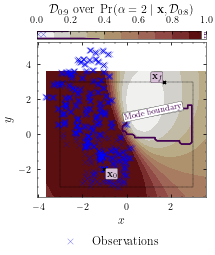

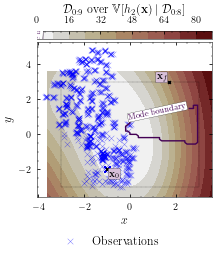

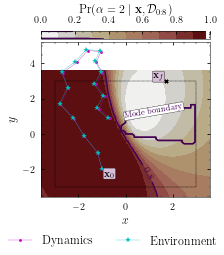

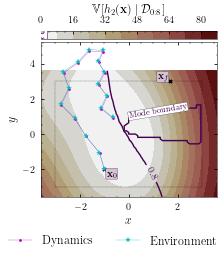

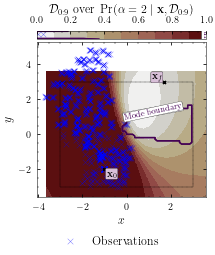

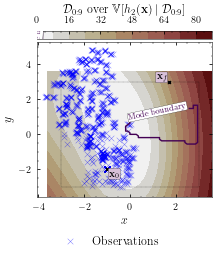

Optimisation result:
     fun: 175.59947892789916
     jac: array([-2.81393867e+01, -3.40430263e+00, -2.68202858e+01, -3.43639430e+00,
       -2.67384950e+01, -3.31513822e+00, -2.65948237e+01, -3.19653498e+00,
       -2.77999537e+01, -2.88839253e+00, -2.66075025e+01, -3.17186352e+00,
       -2.72788876e+01, -2.93261340e+00, -2.67691616e+01, -3.08122532e+00,
       -2.66913221e+01, -3.03291454e+00, -1.84163750e+01, -2.09707942e+00,
       -1.90541745e+01, -1.96161959e+00, -4.58294789e+00, -6.55059268e-01,
       -4.78828959e+00, -6.39868681e-01,  3.68583988e-05,  2.88062868e-05,
        9.65659510e-05, -9.79073785e-06])
 message: 'Optimization terminated successfully'
    nfev: 120
     nit: 37
    njev: 37
  status: 0
 success: True
       x: array([-0.72778074,  5.39093871, -2.26102424,  5.46525368, -2.10095309,
        5.6066756 , -1.99896484,  5.21267278,  1.64910868,  5.21884183,
       -0.71930402,  5.34627706,  2.49766315,  3.89176548,  1.79717299,
        4.48239097,  2.29998103

2022-04-22 13:15:57.105573: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 13:15:57.105590: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


3/3 [==============================] - 2s 883ms/step - loss: -64.3029 - val_loss: -779.3167


2022-04-22 13:15:58.296975: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 13:15:58.305033: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 13:15:58.310609: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_15_58

2022-04-22 13:15:58.314991: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_15_58/dr-robots-mbp.local.trace.json.gz
2022-04-22 13:15:58.331541: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_15_58

2022-04-22 13:15:58.331709: I tensorflow/core/profiler/rpc/client/s

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_10_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 20ms/step - loss: -892.0996 - val_loss: -828.9533
Epoch 3/20000
3/3 [==============================] - 0s 20ms/step - loss: -883.6521 - val_loss: -630.3619
Epoch 4/20000
3/3 [==============================] - 0s 19ms/step - loss: -803.3621 - val_loss: -888.4008
Epoch 5/20000
3/3 [==============================] - 0s 20ms/step - loss: -897.1306 - val_loss: -761.1051
Epoch 6/20000
3/3 [==============================] - 0s 19ms/step - loss: -887.0890 - val_loss: -907.0442
Epoch 7/20000
3/3 [==============================] - 0s 20ms/step - loss: -949.4384 - val_loss: -892.4643
Epoch 8/20000
3/3 [==============================] - 0s 20ms/step - loss: -970.9294 - val_loss: -882.5739
Epoch 9/20000
3/3 [==============================] - 0s 19ms/step - loss: -984.9191 - val_loss: -926.3282
Epoch 10/20000
3/3 [==============================] - 0s 19ms/step - loss: -961.6474 - val_loss: -894.2295
Epoch 11/20000
3/3 [=========================

Epoch 76/20000
3/3 [==============================] - 0s 20ms/step - loss: -1029.2424 - val_loss: -1017.5057
Epoch 77/20000
3/3 [==============================] - 0s 19ms/step - loss: -1011.6794 - val_loss: -1017.0998
Epoch 78/20000
3/3 [==============================] - 0s 20ms/step - loss: -899.7094 - val_loss: -573.6526
Epoch 79/20000
3/3 [==============================] - 0s 20ms/step - loss: -557.1378 - val_loss: -876.3849
Epoch 80/20000
3/3 [==============================] - 0s 20ms/step - loss: 191.4568 - val_loss: 883.4653
Epoch 81/20000
3/3 [==============================] - 0s 20ms/step - loss: 254.8282 - val_loss: 310.0521
Epoch 82/20000
3/3 [==============================] - 0s 20ms/step - loss: 133.5796 - val_loss: -703.1955
Epoch 83/20000
3/3 [==============================] - 0s 19ms/step - loss: -161.4675 - val_loss: -955.2802
Epoch 84/20000
3/3 [==============================] - 0s 19ms/step - loss: 244.1741 - val_loss: 667.7863
Epoch 85/20000
3/3 [====================

Epoch 152/20000
3/3 [==============================] - 0s 26ms/step - loss: -979.2500 - val_loss: -953.4624
Epoch 153/20000
3/3 [==============================] - 0s 25ms/step - loss: -1051.6474 - val_loss: -1023.2648
Epoch 154/20000
3/3 [==============================] - 0s 25ms/step - loss: -1075.2022 - val_loss: -1057.4469
Epoch 155/20000
3/3 [==============================] - 0s 26ms/step - loss: -995.4756 - val_loss: -1046.6663
Epoch 156/20000
3/3 [==============================] - 0s 25ms/step - loss: -1040.9334 - val_loss: -930.4477
Epoch 157/20000
3/3 [==============================] - 0s 25ms/step - loss: -983.2627 - val_loss: -1011.3362
Epoch 158/20000
3/3 [==============================] - 0s 26ms/step - loss: -983.0063 - val_loss: -1008.6474
Epoch 159/20000
3/3 [==============================] - 0s 26ms/step - loss: -1056.8042 - val_loss: -937.9349
Epoch 160/20000
3/3 [==============================] - 0s 25ms/step - loss: -968.7644 - val_loss: -1028.2436
Epoch 161/20000
3/

3/3 [==============================] - 0s 25ms/step - loss: -772.4518 - val_loss: -259.1875
Epoch 228/20000
3/3 [==============================] - 0s 25ms/step - loss: -744.9129 - val_loss: -916.5514
Epoch 229/20000
3/3 [==============================] - 0s 24ms/step - loss: -752.0778 - val_loss: -692.2980
Epoch 230/20000
3/3 [==============================] - 0s 23ms/step - loss: -711.3952 - val_loss: -843.8619
Epoch 231/20000
3/3 [==============================] - 0s 23ms/step - loss: -892.6894 - val_loss: 122.7561
Epoch 232/20000
3/3 [==============================] - 0s 24ms/step - loss: -904.8011 - val_loss: -848.7979
Epoch 233/20000
3/3 [==============================] - 0s 24ms/step - loss: -814.1704 - val_loss: -836.9640
Epoch 234/20000
3/3 [==============================] - 0s 24ms/step - loss: -831.3821 - val_loss: -905.6391
Epoch 235/20000
3/3 [==============================] - 0s 24ms/step - loss: -902.5675 - val_loss: -865.4779
Epoch 236/20000
3/3 [========================

Epoch 303/20000
3/3 [==============================] - 0s 22ms/step - loss: -653.3480 - val_loss: -796.2048
Epoch 304/20000
3/3 [==============================] - 0s 22ms/step - loss: -742.6680 - val_loss: -815.0857
Epoch 305/20000
3/3 [==============================] - 0s 23ms/step - loss: -535.4634 - val_loss: -777.5332
Epoch 306/20000
3/3 [==============================] - 0s 22ms/step - loss: -716.2441 - val_loss: -758.3185
Epoch 307/20000
3/3 [==============================] - 0s 22ms/step - loss: -531.1974 - val_loss: -417.1338
Epoch 308/20000
3/3 [==============================] - 0s 23ms/step - loss: -711.7108 - val_loss: -784.9329
Epoch 309/20000
3/3 [==============================] - 0s 23ms/step - loss: -789.5226 - val_loss: -567.1045
Epoch 310/20000
3/3 [==============================] - 0s 23ms/step - loss: -838.9193 - val_loss: -780.7038
Epoch 311/20000
3/3 [==============================] - 0s 22ms/step - loss: -775.1425 - val_loss: -707.7387
Epoch 312/20000
3/3 [=======

3/3 [==============================] - 0s 26ms/step - loss: -1010.2600 - val_loss: -1007.0144
Epoch 379/20000
3/3 [==============================] - 0s 25ms/step - loss: -1033.1001 - val_loss: -878.2378
Epoch 380/20000
3/3 [==============================] - 0s 26ms/step - loss: -1019.0323 - val_loss: -579.0310
Epoch 381/20000
3/3 [==============================] - 0s 26ms/step - loss: -1034.7313 - val_loss: -994.6782
Epoch 382/20000
3/3 [==============================] - 0s 23ms/step - loss: -1012.2085 - val_loss: -950.4548
Epoch 383/20000
3/3 [==============================] - 0s 23ms/step - loss: -972.6225 - val_loss: -1028.4292
Epoch 384/20000
3/3 [==============================] - 0s 23ms/step - loss: -1044.7771 - val_loss: -894.0964
Epoch 385/20000
3/3 [==============================] - 0s 23ms/step - loss: -1009.3029 - val_loss: -1064.6803
Epoch 386/20000
3/3 [==============================] - 0s 24ms/step - loss: -1037.9094 - val_loss: -1056.6942
Epoch 387/20000
3/3 [===========

Epoch 454/20000
3/3 [==============================] - 0s 24ms/step - loss: -949.7900 - val_loss: -981.1824
Epoch 455/20000
3/3 [==============================] - 0s 24ms/step - loss: -990.9043 - val_loss: -909.0358
Epoch 456/20000
3/3 [==============================] - 0s 24ms/step - loss: -976.9051 - val_loss: -968.0723
Epoch 457/20000
3/3 [==============================] - 0s 24ms/step - loss: -970.2705 - val_loss: -905.4409
Epoch 458/20000
3/3 [==============================] - 0s 24ms/step - loss: -999.4567 - val_loss: -891.4605
Epoch 459/20000
3/3 [==============================] - 0s 24ms/step - loss: -958.7964 - val_loss: -1010.9382
Epoch 460/20000
3/3 [==============================] - 0s 23ms/step - loss: -1015.1977 - val_loss: -963.5382
Epoch 461/20000
3/3 [==============================] - 0s 24ms/step - loss: -1016.5828 - val_loss: -937.0916
Epoch 462/20000
3/3 [==============================] - 0s 24ms/step - loss: -935.9660 - val_loss: -984.1817
Epoch 463/20000
3/3 [====

3/3 [==============================] - 0s 24ms/step - loss: -994.3163 - val_loss: -898.4433
Epoch 530/20000
3/3 [==============================] - 0s 23ms/step - loss: -1004.2534 - val_loss: -899.0834
Epoch 531/20000
3/3 [==============================] - 0s 24ms/step - loss: -1039.2545 - val_loss: -983.5653
Epoch 532/20000
3/3 [==============================] - 0s 23ms/step - loss: -932.9867 - val_loss: -1010.4179
Epoch 533/20000
3/3 [==============================] - 0s 24ms/step - loss: -1025.3197 - val_loss: -923.8137
Epoch 534/20000
3/3 [==============================] - 0s 24ms/step - loss: -1032.0039 - val_loss: -1047.0624
Epoch 535/20000
3/3 [==============================] - 0s 24ms/step - loss: -984.6853 - val_loss: -921.4665
Epoch 536/20000
3/3 [==============================] - 0s 23ms/step - loss: -921.2102 - val_loss: -1009.7936
Epoch 537/20000
3/3 [==============================] - 0s 23ms/step - loss: -1025.4127 - val_loss: -1011.6080
Epoch 538/20000
3/3 [==============

3/3 [==============================] - 0s 26ms/step - loss: -915.4697 - val_loss: -961.3138
Epoch 605/20000
3/3 [==============================] - 0s 25ms/step - loss: -567.4938 - val_loss: -858.4809
Epoch 606/20000
3/3 [==============================] - 0s 25ms/step - loss: -780.2044 - val_loss: -950.0249
Epoch 607/20000
3/3 [==============================] - 0s 24ms/step - loss: -867.2663 - val_loss: -882.9891
Epoch 608/20000
3/3 [==============================] - 0s 25ms/step - loss: -940.0363 - val_loss: -937.3211
Epoch 609/20000
3/3 [==============================] - 0s 25ms/step - loss: -912.4577 - val_loss: -905.7701
Epoch 610/20000
3/3 [==============================] - 0s 24ms/step - loss: -951.5956 - val_loss: -927.7227
Epoch 611/20000
3/3 [==============================] - 0s 25ms/step - loss: -898.8202 - val_loss: -922.5798
Epoch 612/20000
3/3 [==============================] - 0s 24ms/step - loss: -930.1506 - val_loss: -920.1795
Epoch 613/20000
3/3 [=======================

3/3 [==============================] - 0s 24ms/step - loss: -1052.5192 - val_loss: -1041.1784
Epoch 680/20000
3/3 [==============================] - 0s 24ms/step - loss: -1021.0256 - val_loss: -959.1824
Epoch 681/20000
3/3 [==============================] - 0s 24ms/step - loss: -1043.4994 - val_loss: -937.9811
Epoch 682/20000
3/3 [==============================] - 0s 25ms/step - loss: -1037.3164 - val_loss: -965.6457
Epoch 683/20000
3/3 [==============================] - 0s 25ms/step - loss: -1051.7423 - val_loss: -996.6876
Epoch 684/20000
3/3 [==============================] - 0s 24ms/step - loss: -1007.6563 - val_loss: -989.7156
Epoch 685/20000
3/3 [==============================] - 0s 25ms/step - loss: -1056.7632 - val_loss: -1027.6593
Epoch 686/20000
3/3 [==============================] - 0s 24ms/step - loss: -846.2492 - val_loss: -1065.7685
Epoch 687/20000
3/3 [==============================] - 0s 25ms/step - loss: -890.2157 - val_loss: -960.3262
Epoch 688/20000
3/3 [=============

3/3 [==============================] - 0s 24ms/step - loss: -1039.5003 - val_loss: -1026.5873
Epoch 755/20000
3/3 [==============================] - 0s 23ms/step - loss: -1058.3666 - val_loss: -1008.8161
Epoch 756/20000
3/3 [==============================] - 0s 23ms/step - loss: -1030.5956 - val_loss: -1013.2162
Epoch 757/20000
3/3 [==============================] - 0s 23ms/step - loss: -985.9443 - val_loss: -959.5165
Epoch 758/20000
3/3 [==============================] - 0s 23ms/step - loss: -1050.5169 - val_loss: -1010.3750
Epoch 759/20000
3/3 [==============================] - 0s 24ms/step - loss: -1028.2501 - val_loss: -945.6355
Epoch 760/20000
3/3 [==============================] - 0s 24ms/step - loss: -1048.9428 - val_loss: -954.7806
Epoch 761/20000
3/3 [==============================] - 0s 24ms/step - loss: -878.0257 - val_loss: -941.5872
Epoch 762/20000
3/3 [==============================] - 0s 24ms/step - loss: -1059.3433 - val_loss: -991.2555
Epoch 763/20000
3/3 [============

3/3 [==============================] - 0s 24ms/step - loss: -1093.9933 - val_loss: -1065.9254
Epoch 830/20000
3/3 [==============================] - 0s 25ms/step - loss: -1039.3608 - val_loss: -984.9649
Epoch 831/20000
3/3 [==============================] - 0s 25ms/step - loss: -1094.7517 - val_loss: -1022.1304
Epoch 832/20000
3/3 [==============================] - 0s 25ms/step - loss: -1104.0115 - val_loss: -891.0036
Epoch 833/20000
3/3 [==============================] - 0s 25ms/step - loss: -988.8202 - val_loss: -936.9393
Epoch 834/20000
3/3 [==============================] - 0s 24ms/step - loss: -1034.6594 - val_loss: -937.3772
Epoch 835/20000
3/3 [==============================] - 0s 25ms/step - loss: -992.6054 - val_loss: -1093.6932
Epoch 836/20000
3/3 [==============================] - 0s 24ms/step - loss: -1016.4552 - val_loss: -1006.8285
Epoch 837/20000
3/3 [==============================] - 0s 25ms/step - loss: -1080.1317 - val_loss: -962.9374
Epoch 838/20000
3/3 [============

3/3 [==============================] - 0s 24ms/step - loss: -1007.5417 - val_loss: -1004.8206
Epoch 905/20000
3/3 [==============================] - 0s 25ms/step - loss: -1024.5646 - val_loss: -918.3658
Epoch 906/20000
3/3 [==============================] - 0s 24ms/step - loss: -1031.6562 - val_loss: -964.5256
Epoch 907/20000
3/3 [==============================] - 0s 24ms/step - loss: -979.9186 - val_loss: -1031.4599
Epoch 908/20000
3/3 [==============================] - 0s 25ms/step - loss: -1033.6817 - val_loss: -1005.7276
Epoch 909/20000
3/3 [==============================] - 0s 24ms/step - loss: -1036.1163 - val_loss: -1008.1285
Epoch 910/20000
3/3 [==============================] - 0s 24ms/step - loss: -1056.6365 - val_loss: -855.7736
Epoch 911/20000
3/3 [==============================] - 0s 25ms/step - loss: -1014.9800 - val_loss: -1016.3386
Epoch 912/20000
3/3 [==============================] - 0s 25ms/step - loss: -1055.4036 - val_loss: -1044.4454
Epoch 913/20000
3/3 [=========

3/3 [==============================] - 0s 24ms/step - loss: -988.5433 - val_loss: -950.8061
Epoch 980/20000
3/3 [==============================] - 0s 25ms/step - loss: -989.0686 - val_loss: -958.7437
Epoch 981/20000
3/3 [==============================] - 0s 27ms/step - loss: -1014.8460 - val_loss: -935.1381
Epoch 982/20000
3/3 [==============================] - 0s 31ms/step - loss: -992.9737 - val_loss: -999.0596
Epoch 983/20000
3/3 [==============================] - 0s 26ms/step - loss: -986.2180 - val_loss: -976.8606
Epoch 984/20000
3/3 [==============================] - 0s 27ms/step - loss: -987.4029 - val_loss: -941.8942
Epoch 985/20000
3/3 [==============================] - 0s 28ms/step - loss: -982.8618 - val_loss: -931.3539
Epoch 986/20000
3/3 [==============================] - 0s 29ms/step - loss: -1019.8967 - val_loss: -903.7576
Epoch 987/20000
3/3 [==============================] - 0s 26ms/step - loss: -1041.0387 - val_loss: -996.2729
Epoch 988/20000
3/3 [====================

3/3 [==============================] - 0s 25ms/step - loss: -1034.5972 - val_loss: -1052.8353
Epoch 1054/20000
3/3 [==============================] - 0s 24ms/step - loss: -1070.5695 - val_loss: -1043.6929
Epoch 1055/20000
3/3 [==============================] - 0s 24ms/step - loss: -1092.4669 - val_loss: -1015.6907
Epoch 1056/20000
3/3 [==============================] - 0s 25ms/step - loss: -993.8879 - val_loss: -1038.9989
Epoch 1057/20000
3/3 [==============================] - 0s 24ms/step - loss: -996.3501 - val_loss: -1036.9523
Epoch 1058/20000
3/3 [==============================] - 0s 24ms/step - loss: -1084.7378 - val_loss: -1030.4254
Epoch 1059/20000
3/3 [==============================] - 0s 25ms/step - loss: -1086.4808 - val_loss: -1064.7395
Epoch 1060/20000
3/3 [==============================] - 0s 25ms/step - loss: -1093.3574 - val_loss: -1073.5436
Epoch 1061/20000
3/3 [==============================] - 0s 25ms/step - loss: -1053.9307 - val_loss: -1018.6511
Epoch 1062/20000
3/3

3/3 [==============================] - 0s 24ms/step - loss: -747.0561 - val_loss: -1010.0245
Epoch 1128/20000
3/3 [==============================] - 0s 23ms/step - loss: -1031.3688 - val_loss: -846.8126
Epoch 1129/20000
3/3 [==============================] - 0s 24ms/step - loss: -1046.8995 - val_loss: -955.2585
Epoch 1130/20000
3/3 [==============================] - 0s 23ms/step - loss: -959.9735 - val_loss: -1041.0700
Epoch 1131/20000
3/3 [==============================] - 0s 24ms/step - loss: -1031.6729 - val_loss: -1032.7343
Epoch 1132/20000
3/3 [==============================] - 0s 23ms/step - loss: -1022.7227 - val_loss: -1037.9297
Epoch 1133/20000
3/3 [==============================] - 0s 23ms/step - loss: -1037.4181 - val_loss: -1060.5554
Epoch 1134/20000
3/3 [==============================] - 0s 23ms/step - loss: -1055.7248 - val_loss: -964.9402
Epoch 1135/20000
3/3 [==============================] - 0s 23ms/step - loss: -1073.4777 - val_loss: -979.5496
Epoch 1136/20000
3/3 [==

3/3 [==============================] - 0s 24ms/step - loss: -775.8214 - val_loss: -821.3734
Epoch 1202/20000
3/3 [==============================] - 0s 26ms/step - loss: -707.4884 - val_loss: -861.6788
Epoch 1203/20000
3/3 [==============================] - 0s 27ms/step - loss: -375.0675 - val_loss: -1012.8913
Epoch 1204/20000
3/3 [==============================] - 0s 25ms/step - loss: -965.6393 - val_loss: -315.0895
Epoch 1205/20000
3/3 [==============================] - 0s 26ms/step - loss: -371.1671 - val_loss: -957.8649
Epoch 1206/20000
3/3 [==============================] - 0s 26ms/step - loss: -853.2449 - val_loss: -612.4539
Epoch 1207/20000
3/3 [==============================] - 0s 26ms/step - loss: -967.6299 - val_loss: -260.3278
Epoch 1208/20000
3/3 [==============================] - 0s 25ms/step - loss: -852.3189 - val_loss: -934.1123
Epoch 1209/20000
3/3 [==============================] - 0s 26ms/step - loss: -576.8239 - val_loss: -874.7153
Epoch 1210/20000
3/3 [=============

3/3 [==============================] - 0s 24ms/step - loss: -1124.4760 - val_loss: -1080.9855
Epoch 1276/20000
3/3 [==============================] - 0s 24ms/step - loss: -1115.8737 - val_loss: -1078.5734
Epoch 1277/20000
3/3 [==============================] - 0s 23ms/step - loss: -1081.2105 - val_loss: -1047.5699
Epoch 1278/20000
3/3 [==============================] - 0s 24ms/step - loss: -1112.5253 - val_loss: -1051.3772
Epoch 1279/20000
3/3 [==============================] - 0s 23ms/step - loss: -1086.9973 - val_loss: -944.5654
Epoch 1280/20000
3/3 [==============================] - 0s 24ms/step - loss: -1097.4879 - val_loss: -1007.2117
Epoch 1281/20000
3/3 [==============================] - 0s 24ms/step - loss: -1027.7779 - val_loss: -1073.8437
Epoch 1282/20000
3/3 [==============================] - 0s 23ms/step - loss: -1074.3762 - val_loss: -987.4138
Epoch 1283/20000
3/3 [==============================] - 0s 23ms/step - loss: -1095.4262 - val_loss: -1105.9486
Epoch 1284/20000
3/3

3/3 [==============================] - 0s 24ms/step - loss: -1114.9347 - val_loss: -1046.4656
Epoch 1350/20000
3/3 [==============================] - 0s 23ms/step - loss: -1075.3248 - val_loss: -1083.6394
Epoch 1351/20000
3/3 [==============================] - 0s 23ms/step - loss: -1095.1964 - val_loss: -1084.0390
Epoch 1352/20000
3/3 [==============================] - 0s 24ms/step - loss: -1107.2730 - val_loss: -1070.9746
Epoch 1353/20000
3/3 [==============================] - 0s 23ms/step - loss: -1077.6931 - val_loss: -1061.9135
Epoch 1354/20000
3/3 [==============================] - 0s 24ms/step - loss: -1043.0554 - val_loss: -1081.7040
Epoch 1355/20000
3/3 [==============================] - 0s 24ms/step - loss: -995.1162 - val_loss: -1019.2930
Epoch 1356/20000
3/3 [==============================] - 0s 23ms/step - loss: -1092.9890 - val_loss: -1060.6016
Epoch 1357/20000
3/3 [==============================] - 0s 23ms/step - loss: -1089.0101 - val_loss: -1070.9103
Epoch 1358/20000
3/

3/3 [==============================] - 0s 26ms/step - loss: -1080.1641 - val_loss: -860.1652
Epoch 1424/20000
3/3 [==============================] - 0s 26ms/step - loss: -1022.7698 - val_loss: -687.2191
Epoch 1425/20000
3/3 [==============================] - 0s 27ms/step - loss: -1014.5170 - val_loss: -1052.8280
Epoch 1426/20000
3/3 [==============================] - 0s 27ms/step - loss: -855.6823 - val_loss: -1025.3829
Epoch 1427/20000
3/3 [==============================] - 0s 25ms/step - loss: -1052.1820 - val_loss: -711.2884
Epoch 1428/20000
3/3 [==============================] - 0s 25ms/step - loss: -986.9960 - val_loss: -1081.2693
Epoch 1429/20000
3/3 [==============================] - 0s 26ms/step - loss: -1033.8917 - val_loss: -1032.4691
Epoch 1430/20000
3/3 [==============================] - 0s 27ms/step - loss: -1049.3507 - val_loss: -847.7615
Epoch 1431/20000
3/3 [==============================] - 0s 26ms/step - loss: -1103.5634 - val_loss: -980.6193
Epoch 1432/20000
3/3 [===

3/3 [==============================] - 0s 24ms/step - loss: -959.9821 - val_loss: -596.3859
Epoch 1498/20000
3/3 [==============================] - 0s 24ms/step - loss: -989.4373 - val_loss: -892.8215
Epoch 1499/20000
3/3 [==============================] - 0s 23ms/step - loss: -921.8066 - val_loss: -977.6965
Epoch 1500/20000
3/3 [==============================] - 0s 24ms/step - loss: -1013.7902 - val_loss: -999.3374
Epoch 1501/20000
3/3 [==============================] - 0s 23ms/step - loss: -838.5857 - val_loss: -906.0345
Epoch 1502/20000
3/3 [==============================] - 0s 23ms/step - loss: -887.6482 - val_loss: -863.3845
Epoch 1503/20000
3/3 [==============================] - 0s 24ms/step - loss: -973.8522 - val_loss: -885.8017
Epoch 1504/20000
3/3 [==============================] - 0s 23ms/step - loss: -1012.9466 - val_loss: -762.4986
Epoch 1505/20000
3/3 [==============================] - 0s 24ms/step - loss: -786.8189 - val_loss: -967.7571
Epoch 1506/20000
3/3 [============

3/3 [==============================] - 0s 24ms/step - loss: -1001.3566 - val_loss: -1008.8726
Epoch 1572/20000
3/3 [==============================] - 0s 25ms/step - loss: -1071.5479 - val_loss: -905.4008
Epoch 1573/20000
3/3 [==============================] - 0s 23ms/step - loss: -844.1122 - val_loss: -1033.9003
Epoch 1574/20000
3/3 [==============================] - 0s 24ms/step - loss: -941.2594 - val_loss: -862.8092
Epoch 1575/20000
3/3 [==============================] - 0s 23ms/step - loss: -1089.8675 - val_loss: -1025.9055
Epoch 1576/20000
3/3 [==============================] - 0s 23ms/step - loss: -1078.6979 - val_loss: -976.2860
Epoch 1577/20000
3/3 [==============================] - 0s 23ms/step - loss: -1086.5323 - val_loss: -1063.1374
Epoch 1578/20000
3/3 [==============================] - 0s 28ms/step - loss: -1104.6544 - val_loss: -1075.9180
Epoch 1579/20000
3/3 [==============================] - 0s 23ms/step - loss: -1061.4425 - val_loss: -1014.5968
Epoch 1580/20000
3/3 [=

3/3 [==============================] - 0s 25ms/step - loss: -1128.3560 - val_loss: -1046.8549
Epoch 1646/20000
3/3 [==============================] - 0s 26ms/step - loss: -1081.2965 - val_loss: -1041.5957
Epoch 1647/20000
3/3 [==============================] - 0s 25ms/step - loss: -1083.2736 - val_loss: -1087.5109
Epoch 1648/20000
3/3 [==============================] - 0s 26ms/step - loss: -1094.5730 - val_loss: -1074.4182
Epoch 1649/20000
3/3 [==============================] - 0s 26ms/step - loss: -1070.8381 - val_loss: -1053.6114
Epoch 1650/20000
3/3 [==============================] - 0s 26ms/step - loss: -1075.0330 - val_loss: -1068.2596
Epoch 1651/20000
3/3 [==============================] - 0s 27ms/step - loss: -1061.8851 - val_loss: -1043.8846
Epoch 1652/20000
3/3 [==============================] - 0s 27ms/step - loss: -1023.8356 - val_loss: -1081.3279
Epoch 1653/20000
3/3 [==============================] - 0s 25ms/step - loss: -1103.6840 - val_loss: -1028.9500
Epoch 1654/20000
3

3/3 [==============================] - 0s 24ms/step - loss: -918.6963 - val_loss: -490.2648
Epoch 1720/20000
3/3 [==============================] - 0s 24ms/step - loss: -872.6158 - val_loss: -890.8641
Epoch 1721/20000
3/3 [==============================] - 0s 24ms/step - loss: -951.2850 - val_loss: -840.2712
Epoch 1722/20000
3/3 [==============================] - 0s 24ms/step - loss: -1021.7712 - val_loss: -980.4420
Epoch 1723/20000
3/3 [==============================] - 0s 24ms/step - loss: -1062.7050 - val_loss: -1074.0531
Epoch 1724/20000
3/3 [==============================] - 0s 23ms/step - loss: -987.7366 - val_loss: -981.9486
Epoch 1725/20000
3/3 [==============================] - 0s 23ms/step - loss: -1054.6353 - val_loss: -1055.7677
Epoch 1726/20000
3/3 [==============================] - 0s 23ms/step - loss: -1049.5685 - val_loss: -984.2540
Epoch 1727/20000
3/3 [==============================] - 0s 23ms/step - loss: -1030.4540 - val_loss: -1061.7394
Epoch 1728/20000
3/3 [======

3/3 [==============================] - 0s 24ms/step - loss: -1043.4781 - val_loss: -976.1798
Epoch 1794/20000
3/3 [==============================] - 0s 25ms/step - loss: -1040.5079 - val_loss: -1018.7645
Epoch 1795/20000
3/3 [==============================] - 0s 33ms/step - loss: -1039.3641 - val_loss: -997.1222
Epoch 1796/20000
3/3 [==============================] - 0s 27ms/step - loss: -1055.1641 - val_loss: -1017.0042
Epoch 1797/20000
3/3 [==============================] - 0s 28ms/step - loss: -1064.0344 - val_loss: -992.3257
Epoch 1798/20000
3/3 [==============================] - 0s 24ms/step - loss: -1065.9446 - val_loss: -1039.1954
Epoch 1799/20000
3/3 [==============================] - 0s 25ms/step - loss: -1068.9160 - val_loss: -1069.2098
Epoch 1800/20000
3/3 [==============================] - 0s 24ms/step - loss: -1082.7790 - val_loss: -1034.9062
Epoch 1801/20000
3/3 [==============================] - 0s 24ms/step - loss: -1082.3375 - val_loss: -1060.6481
Epoch 1802/20000
3/3 

3/3 [==============================] - 0s 27ms/step - loss: 184.8262 - val_loss: 1546.8098
Epoch 1868/20000
3/3 [==============================] - 0s 28ms/step - loss: 497.5897 - val_loss: 928.1608
Epoch 1869/20000
3/3 [==============================] - 0s 28ms/step - loss: -408.4191 - val_loss: 5.2629
Epoch 1870/20000
3/3 [==============================] - 0s 26ms/step - loss: -333.7523 - val_loss: 454.2205
Epoch 1871/20000
3/3 [==============================] - 0s 27ms/step - loss: -708.9405 - val_loss: 880.0267
Epoch 1872/20000
3/3 [==============================] - 0s 27ms/step - loss: -628.6210 - val_loss: 725.4004
Epoch 1873/20000
3/3 [==============================] - 0s 28ms/step - loss: -269.6933 - val_loss: -271.2499
Epoch 1874/20000
3/3 [==============================] - 0s 29ms/step - loss: -89.0741 - val_loss: -80.0130
Epoch 1875/20000
3/3 [==============================] - 0s 28ms/step - loss: -416.3070 - val_loss: -702.1938
Epoch 1876/20000
3/3 [=========================

3/3 [==============================] - 0s 24ms/step - loss: -904.6333 - val_loss: -971.1630
Epoch 1943/20000
3/3 [==============================] - 0s 24ms/step - loss: -836.4102 - val_loss: -788.2654
Epoch 1944/20000
3/3 [==============================] - 0s 24ms/step - loss: -991.0927 - val_loss: -1005.4879
Epoch 1945/20000
3/3 [==============================] - 0s 24ms/step - loss: -911.1619 - val_loss: -311.1846
Epoch 1946/20000
3/3 [==============================] - 0s 24ms/step - loss: -916.5745 - val_loss: -681.5932
Epoch 1947/20000
3/3 [==============================] - 0s 25ms/step - loss: -886.0466 - val_loss: -746.3983
Epoch 1948/20000
3/3 [==============================] - 0s 24ms/step - loss: -846.5907 - val_loss: -908.0049
Epoch 1949/20000
3/3 [==============================] - 0s 25ms/step - loss: -829.1083 - val_loss: -970.4769
Epoch 1950/20000
3/3 [==============================] - 0s 25ms/step - loss: -840.6906 - val_loss: -605.2968
Epoch 1951/20000
3/3 [=============

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_10_epoch_2000/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2002/20000
3/3 [==============================] - 0s 20ms/step - loss: -902.9420 - val_loss: -827.3347
Epoch 2003/20000
3/3 [==============================] - 0s 23ms/step - loss: -522.2338 - val_loss: -952.3978
Epoch 2004/20000
3/3 [==============================] - 0s 20ms/step - loss: -953.6131 - val_loss: -944.7093
Epoch 2005/20000
3/3 [==============================] - 0s 20ms/step - loss: -873.1527 - val_loss: -960.0769
Epoch 2006/20000
3/3 [==============================] - 0s 20ms/step - loss: -877.7279 - val_loss: -989.7468
Epoch 2007/20000
3/3 [==============================] - 0s 19ms/step - loss: -962.0317 - val_loss: -828.7438
Epoch 2008/20000
3/3 [==============================] - 0s 20ms/step - loss: -836.9518 - val_loss: -714.9706
Epoch 2009/20000
3/3 [==============================] - 0s 19ms/step - loss: -949.6804 - val_loss: -885.2791
Epoch 2010/20000
3/3 [==============================] - 0s 20ms/step - loss: -968.0683 - val_loss: -711.1993
Epoch 2011/20000
3/

3/3 [==============================] - 0s 20ms/step - loss: -946.3405 - val_loss: -787.7404
Epoch 2078/20000
3/3 [==============================] - 0s 19ms/step - loss: -882.0883 - val_loss: -697.4426
Epoch 2079/20000
3/3 [==============================] - 0s 20ms/step - loss: -764.9046 - val_loss: -927.9283
Epoch 2080/20000
3/3 [==============================] - 0s 20ms/step - loss: -930.8640 - val_loss: -887.9989
Epoch 2081/20000
3/3 [==============================] - 0s 19ms/step - loss: -842.7275 - val_loss: -978.9753
Epoch 2082/20000
3/3 [==============================] - 0s 20ms/step - loss: -920.1187 - val_loss: -768.8594
Epoch 2083/20000
3/3 [==============================] - 0s 20ms/step - loss: -842.1355 - val_loss: -1007.9036
Epoch 2084/20000
3/3 [==============================] - 0s 20ms/step - loss: -816.2295 - val_loss: -791.4730
Epoch 2085/20000
3/3 [==============================] - 0s 20ms/step - loss: -883.8559 - val_loss: -931.5872
Epoch 2086/20000
3/3 [=============

3/3 [==============================] - 0s 21ms/step - loss: -837.6887 - val_loss: -878.2606
Epoch 2153/20000
3/3 [==============================] - 0s 21ms/step - loss: -735.0236 - val_loss: -902.0716
Epoch 2154/20000
3/3 [==============================] - 0s 21ms/step - loss: -878.1696 - val_loss: -827.5466
Epoch 2155/20000
3/3 [==============================] - 0s 21ms/step - loss: -830.0019 - val_loss: -474.8589
Epoch 2156/20000
3/3 [==============================] - 0s 22ms/step - loss: -827.4543 - val_loss: -722.5383
Epoch 2157/20000
3/3 [==============================] - 0s 22ms/step - loss: -847.8076 - val_loss: -866.0404
Epoch 2158/20000
3/3 [==============================] - 0s 22ms/step - loss: -914.0980 - val_loss: -807.6795
Epoch 2159/20000
3/3 [==============================] - 0s 22ms/step - loss: -880.4224 - val_loss: -862.8684
Epoch 2160/20000
3/3 [==============================] - 0s 22ms/step - loss: -886.0991 - val_loss: -885.5061
Epoch 2161/20000
3/3 [==============

Epoch 2227/20000
3/3 [==============================] - 0s 22ms/step - loss: -982.7549 - val_loss: -965.6925
Epoch 2228/20000
3/3 [==============================] - 0s 22ms/step - loss: -928.9365 - val_loss: -487.5462
Epoch 2229/20000
3/3 [==============================] - 0s 22ms/step - loss: -939.7951 - val_loss: -881.0502
Epoch 2230/20000
3/3 [==============================] - 0s 22ms/step - loss: -829.2650 - val_loss: -984.1017
Epoch 2231/20000
3/3 [==============================] - 0s 22ms/step - loss: -857.3385 - val_loss: -834.4598
Epoch 2232/20000
3/3 [==============================] - 0s 22ms/step - loss: -803.3061 - val_loss: -847.2635
Epoch 2233/20000
3/3 [==============================] - 0s 22ms/step - loss: -906.7974 - val_loss: -807.1695
Epoch 2234/20000
3/3 [==============================] - 0s 22ms/step - loss: -573.4759 - val_loss: -928.2198
Epoch 2235/20000
3/3 [==============================] - 0s 22ms/step - loss: -806.0976 - val_loss: -723.6847
Epoch 2236/20000
3/

Epoch 2302/20000
3/3 [==============================] - 0s 24ms/step - loss: -962.7559 - val_loss: -828.1472
Epoch 2303/20000
3/3 [==============================] - 0s 24ms/step - loss: -1001.1478 - val_loss: -999.6323
Epoch 2304/20000
3/3 [==============================] - 0s 24ms/step - loss: -915.1975 - val_loss: -843.8132
Epoch 2305/20000
3/3 [==============================] - 0s 24ms/step - loss: -868.3918 - val_loss: -642.1117
Epoch 2306/20000
3/3 [==============================] - 0s 24ms/step - loss: -817.6748 - val_loss: -975.6077
Epoch 2307/20000
3/3 [==============================] - 0s 24ms/step - loss: -599.5669 - val_loss: -683.4521
Epoch 2308/20000
3/3 [==============================] - 0s 24ms/step - loss: -714.0364 - val_loss: -961.2793
Epoch 2309/20000
3/3 [==============================] - 0s 24ms/step - loss: -909.0917 - val_loss: -714.0986
Epoch 2310/20000
3/3 [==============================] - 0s 25ms/step - loss: -162.8084 - val_loss: -1004.7007
Epoch 2311/20000


3/3 [==============================] - 0s 24ms/step - loss: -1004.5638 - val_loss: -1016.5975
Epoch 2378/20000
3/3 [==============================] - 0s 24ms/step - loss: -1047.8627 - val_loss: -937.1696
Epoch 2379/20000
3/3 [==============================] - 0s 24ms/step - loss: -1041.4958 - val_loss: -263.4044
Epoch 2380/20000
3/3 [==============================] - 0s 24ms/step - loss: -1031.6671 - val_loss: -957.7452
Epoch 2381/20000
3/3 [==============================] - 0s 24ms/step - loss: -1059.6446 - val_loss: -973.8668
Epoch 2382/20000
3/3 [==============================] - 0s 24ms/step - loss: -978.1478 - val_loss: -1028.6869
Epoch 2383/20000
3/3 [==============================] - 0s 24ms/step - loss: -1023.0083 - val_loss: -1045.4567
Epoch 2384/20000
3/3 [==============================] - 0s 24ms/step - loss: -1021.0426 - val_loss: -1068.1639
Epoch 2385/20000
3/3 [==============================] - 0s 24ms/step - loss: -1045.5933 - val_loss: -1028.5986
Epoch 2386/20000
3/3 [=

Epoch 2452/20000
3/3 [==============================] - 0s 23ms/step - loss: -1048.7036 - val_loss: -1070.5439
Epoch 2453/20000
3/3 [==============================] - 0s 23ms/step - loss: -1030.2982 - val_loss: -1006.7542
Epoch 2454/20000
3/3 [==============================] - 0s 23ms/step - loss: -1022.0523 - val_loss: -985.9670
Epoch 2455/20000
3/3 [==============================] - 0s 24ms/step - loss: -1039.5840 - val_loss: -906.4869
Epoch 2456/20000
3/3 [==============================] - 0s 24ms/step - loss: -1055.4418 - val_loss: -1000.6567
Epoch 2457/20000
3/3 [==============================] - 0s 23ms/step - loss: -1065.0322 - val_loss: -970.8429
Epoch 2458/20000
3/3 [==============================] - 0s 24ms/step - loss: -1020.3120 - val_loss: -1019.6115
Epoch 2459/20000
3/3 [==============================] - 0s 24ms/step - loss: -1019.6974 - val_loss: -1069.7245
Epoch 2460/20000
3/3 [==============================] - 0s 24ms/step - loss: -1034.5738 - val_loss: -1001.0235
Epoc

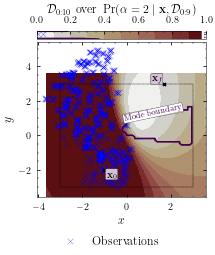

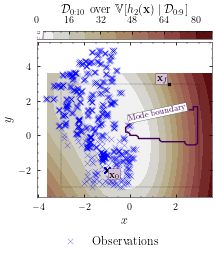

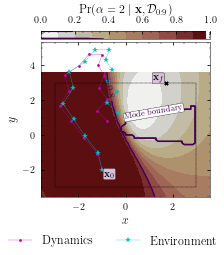

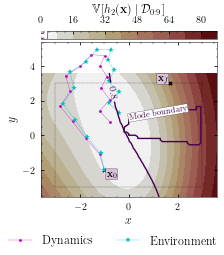

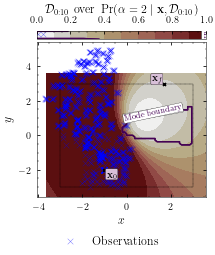

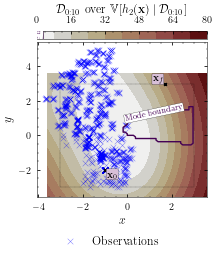

Optimisation result:
     fun: 57.14145545745225
     jac: array([-3.45358990e+01,  2.14705819e+00, -3.37261234e+01,  2.23475332e+00,
       -3.50311777e+01,  2.65565774e+00, -3.32455916e+01,  2.49697289e+00,
       -3.42673903e+01,  2.88098677e+00, -3.28496256e+01,  2.71580997e+00,
       -3.33968744e+01,  3.14579160e+00, -3.28535684e+01,  2.94036592e+00,
       -3.25507994e+01,  2.91711463e+00, -2.74619191e+01,  2.96672946e+00,
       -2.82923426e+01,  3.18556652e+00, -1.36519463e+01,  1.38518702e+00,
       -1.43064236e+01,  1.48065469e+00, -3.42864712e+00, -3.10257944e-03,
       -3.60895400e+00,  9.85202009e-03])
 message: 'Optimization terminated successfully'
    nfev: 39
     nit: 21
    njev: 21
  status: 0
 success: True
       x: array([-1.36955338,  6.15203747, -2.09478789,  5.95279141,  0.63706945,
        5.93639214, -1.9031122 ,  5.40000552,  0.97644717,  5.66525075,
       -1.03245076,  5.28276413,  2.4893731 ,  4.30267775,  2.25364959,
        4.41800626,  2.56392913, 

2022-04-22 13:19:59.041253: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 13:19:59.041272: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


3/3 [==============================] - 2s 868ms/step - loss: -892.2946 - val_loss: -669.8938


2022-04-22 13:20:00.188738: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 13:20:00.196676: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 13:20:00.203119: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_20_00

2022-04-22 13:20:00.209793: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_20_00/dr-robots-mbp.local.trace.json.gz
2022-04-22 13:20:00.226917: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_20_00

2022-04-22 13:20:00.227100: I tensorflow/core/profiler/rpc/client/s

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_11_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 20ms/step - loss: -1014.3039 - val_loss: -914.7266
Epoch 3/20000
3/3 [==============================] - 0s 20ms/step - loss: -927.9183 - val_loss: -1027.6406
Epoch 4/20000
3/3 [==============================] - 0s 20ms/step - loss: -986.5917 - val_loss: -436.9571
Epoch 5/20000
3/3 [==============================] - 0s 20ms/step - loss: -821.5253 - val_loss: -975.2820
Epoch 6/20000
3/3 [==============================] - 0s 20ms/step - loss: -919.9027 - val_loss: -955.2814
Epoch 7/20000
3/3 [==============================] - 0s 21ms/step - loss: -1035.6143 - val_loss: -805.6714
Epoch 8/20000
3/3 [==============================] - 0s 20ms/step - loss: -924.3433 - val_loss: -1006.9348
Epoch 9/20000
3/3 [==============================] - 0s 20ms/step - loss: -1038.9331 - val_loss: -921.5264
Epoch 10/20000
3/3 [==============================] - 0s 20ms/step - loss: -1000.9649 - val_loss: -1044.7756
Epoch 11/20000
3/3 [==================

3/3 [==============================] - 0s 20ms/step - loss: -822.5290 - val_loss: -723.4878
Epoch 77/20000
3/3 [==============================] - 0s 20ms/step - loss: -868.1533 - val_loss: -887.8237
Epoch 78/20000
3/3 [==============================] - 0s 20ms/step - loss: -930.7320 - val_loss: -764.8182
Epoch 79/20000
3/3 [==============================] - 0s 20ms/step - loss: -856.8650 - val_loss: -884.0548
Epoch 80/20000
3/3 [==============================] - 0s 20ms/step - loss: -872.2665 - val_loss: -869.1002
Epoch 81/20000
3/3 [==============================] - 0s 20ms/step - loss: -939.8061 - val_loss: -837.8415
Epoch 82/20000
3/3 [==============================] - 0s 20ms/step - loss: -962.6360 - val_loss: -915.6748
Epoch 83/20000
3/3 [==============================] - 0s 19ms/step - loss: -924.7903 - val_loss: -908.2221
Epoch 84/20000
3/3 [==============================] - 0s 20ms/step - loss: -960.1882 - val_loss: -805.4254
Epoch 85/20000
3/3 [==============================] 

3/3 [==============================] - 0s 27ms/step - loss: -911.6702 - val_loss: -906.8043
Epoch 152/20000
3/3 [==============================] - 0s 24ms/step - loss: -963.5182 - val_loss: -991.4451
Epoch 153/20000
3/3 [==============================] - 0s 24ms/step - loss: -928.2632 - val_loss: -977.4012
Epoch 154/20000
3/3 [==============================] - 0s 26ms/step - loss: -970.7926 - val_loss: -889.4677
Epoch 155/20000
3/3 [==============================] - 0s 24ms/step - loss: -982.3845 - val_loss: -839.9632
Epoch 156/20000
3/3 [==============================] - 0s 25ms/step - loss: -1009.7736 - val_loss: -957.5102
Epoch 157/20000
3/3 [==============================] - 0s 22ms/step - loss: -995.6622 - val_loss: -975.5272
Epoch 158/20000
3/3 [==============================] - 0s 22ms/step - loss: -999.6792 - val_loss: -954.8923
Epoch 159/20000
3/3 [==============================] - 0s 22ms/step - loss: -1004.1724 - val_loss: -445.6001
Epoch 160/20000
3/3 [=====================

3/3 [==============================] - 0s 23ms/step - loss: -858.7697 - val_loss: -934.6095
Epoch 227/20000
3/3 [==============================] - 0s 23ms/step - loss: -951.3472 - val_loss: -945.1617
Epoch 228/20000
3/3 [==============================] - 0s 22ms/step - loss: -990.4222 - val_loss: -954.7845
Epoch 229/20000
3/3 [==============================] - 0s 23ms/step - loss: -940.9598 - val_loss: -1047.5357
Epoch 230/20000
3/3 [==============================] - 0s 23ms/step - loss: -809.5751 - val_loss: -965.8197
Epoch 231/20000
3/3 [==============================] - 0s 23ms/step - loss: -971.9726 - val_loss: -813.8208
Epoch 232/20000
3/3 [==============================] - 0s 23ms/step - loss: -640.5402 - val_loss: -962.3804
Epoch 233/20000
3/3 [==============================] - 0s 23ms/step - loss: -911.2719 - val_loss: -599.7561
Epoch 234/20000
3/3 [==============================] - 0s 23ms/step - loss: -821.5052 - val_loss: -851.4432
Epoch 235/20000
3/3 [======================

3/3 [==============================] - 0s 23ms/step - loss: -1047.9286 - val_loss: -998.1769
Epoch 302/20000
3/3 [==============================] - 0s 24ms/step - loss: -1005.4951 - val_loss: -1017.0681
Epoch 303/20000
3/3 [==============================] - 0s 23ms/step - loss: -1034.6307 - val_loss: -1050.0146
Epoch 304/20000
3/3 [==============================] - 0s 24ms/step - loss: -1027.1517 - val_loss: -1062.9444
Epoch 305/20000
3/3 [==============================] - 0s 23ms/step - loss: -986.6166 - val_loss: -992.7174
Epoch 306/20000
3/3 [==============================] - 0s 23ms/step - loss: -1081.1327 - val_loss: -968.8872
Epoch 307/20000
3/3 [==============================] - 0s 23ms/step - loss: -1021.5445 - val_loss: -998.6226
Epoch 308/20000
3/3 [==============================] - 0s 24ms/step - loss: -1055.9712 - val_loss: -957.1942
Epoch 309/20000
3/3 [==============================] - 0s 23ms/step - loss: -1009.4547 - val_loss: -917.3486
Epoch 310/20000
3/3 [============

3/3 [==============================] - 0s 26ms/step - loss: -1083.5430 - val_loss: -964.0927
Epoch 377/20000
3/3 [==============================] - 0s 25ms/step - loss: -1092.8731 - val_loss: -996.5331
Epoch 378/20000
3/3 [==============================] - 0s 24ms/step - loss: -1097.3281 - val_loss: -1043.6189
Epoch 379/20000
3/3 [==============================] - 0s 25ms/step - loss: -1092.5096 - val_loss: -1029.9062
Epoch 380/20000
3/3 [==============================] - 0s 25ms/step - loss: -1064.3646 - val_loss: -1029.7064
Epoch 381/20000
3/3 [==============================] - 0s 23ms/step - loss: -1104.6076 - val_loss: -1076.9899
Epoch 382/20000
3/3 [==============================] - 0s 24ms/step - loss: -1097.6765 - val_loss: -1060.0348
Epoch 383/20000
3/3 [==============================] - 0s 24ms/step - loss: -1060.6775 - val_loss: -992.5086
Epoch 384/20000
3/3 [==============================] - 0s 24ms/step - loss: -1055.7003 - val_loss: -1080.5536
Epoch 385/20000
3/3 [========

3/3 [==============================] - 0s 24ms/step - loss: -644.4559 - val_loss: -842.0393
Epoch 452/20000
3/3 [==============================] - 0s 24ms/step - loss: -632.8157 - val_loss: -692.3650
Epoch 453/20000
3/3 [==============================] - 0s 24ms/step - loss: -864.9445 - val_loss: -869.6691
Epoch 454/20000
3/3 [==============================] - 0s 24ms/step - loss: -524.9885 - val_loss: -284.0965
Epoch 455/20000
3/3 [==============================] - 0s 25ms/step - loss: -973.5084 - val_loss: -937.2686
Epoch 456/20000
3/3 [==============================] - 0s 24ms/step - loss: -1026.3224 - val_loss: -977.5692
Epoch 457/20000
3/3 [==============================] - 0s 24ms/step - loss: -925.4328 - val_loss: -969.9007
Epoch 458/20000
3/3 [==============================] - 0s 24ms/step - loss: -963.1185 - val_loss: -861.7740
Epoch 459/20000
3/3 [==============================] - 0s 24ms/step - loss: -931.7496 - val_loss: -970.6197
Epoch 460/20000
3/3 [======================

3/3 [==============================] - 0s 25ms/step - loss: -989.5546 - val_loss: -1000.0708
Epoch 527/20000
3/3 [==============================] - 0s 24ms/step - loss: -1022.8748 - val_loss: -963.5799
Epoch 528/20000
3/3 [==============================] - 0s 24ms/step - loss: -1002.8902 - val_loss: -976.5627
Epoch 529/20000
3/3 [==============================] - 0s 24ms/step - loss: -1007.7200 - val_loss: -1029.5665
Epoch 530/20000
3/3 [==============================] - 0s 24ms/step - loss: -1071.6505 - val_loss: -926.7032
Epoch 531/20000
3/3 [==============================] - 0s 24ms/step - loss: -952.5972 - val_loss: -956.6779
Epoch 532/20000
3/3 [==============================] - 0s 25ms/step - loss: -1037.6059 - val_loss: -1018.1998
Epoch 533/20000
3/3 [==============================] - 0s 24ms/step - loss: -1045.2220 - val_loss: -1033.4019
Epoch 534/20000
3/3 [==============================] - 0s 24ms/step - loss: -957.1634 - val_loss: -972.4811
Epoch 535/20000
3/3 [=============

3/3 [==============================] - 0s 26ms/step - loss: -1018.9318 - val_loss: -965.2461
Epoch 602/20000
3/3 [==============================] - 0s 25ms/step - loss: -993.6246 - val_loss: -900.9939
Epoch 603/20000
3/3 [==============================] - 0s 24ms/step - loss: -1003.0336 - val_loss: -1002.6608
Epoch 604/20000
3/3 [==============================] - 0s 25ms/step - loss: -1008.0529 - val_loss: -982.9350
Epoch 605/20000
3/3 [==============================] - 0s 25ms/step - loss: -1045.8169 - val_loss: -958.9709
Epoch 606/20000
3/3 [==============================] - 0s 25ms/step - loss: -1064.1093 - val_loss: -1031.3727
Epoch 607/20000
3/3 [==============================] - 0s 25ms/step - loss: -1047.2465 - val_loss: -975.9505
Epoch 608/20000
3/3 [==============================] - 0s 25ms/step - loss: -1054.4465 - val_loss: -1062.3873
Epoch 609/20000
3/3 [==============================] - 0s 24ms/step - loss: -1061.0432 - val_loss: -1019.8844
Epoch 610/20000
3/3 [===========

3/3 [==============================] - 0s 25ms/step - loss: -201.4336 - val_loss: -408.6310
Epoch 677/20000
3/3 [==============================] - 0s 25ms/step - loss: -222.0880 - val_loss: -903.3161
Epoch 678/20000
3/3 [==============================] - 0s 25ms/step - loss: -384.5638 - val_loss: -894.2204
Epoch 679/20000
3/3 [==============================] - 0s 25ms/step - loss: -861.9339 - val_loss: -958.3556
Epoch 680/20000
3/3 [==============================] - 0s 25ms/step - loss: -792.0160 - val_loss: -84.4375
Epoch 681/20000
3/3 [==============================] - 0s 25ms/step - loss: -388.4255 - val_loss: -471.2313
Epoch 682/20000
3/3 [==============================] - 0s 25ms/step - loss: -298.1086 - val_loss: -865.3575
Epoch 683/20000
3/3 [==============================] - 0s 25ms/step - loss: -758.6526 - val_loss: -925.2276
Epoch 684/20000
3/3 [==============================] - 0s 25ms/step - loss: -886.2078 - val_loss: -878.7613
Epoch 685/20000
3/3 [========================

3/3 [==============================] - 0s 24ms/step - loss: -940.7350 - val_loss: -949.3950
Epoch 752/20000
3/3 [==============================] - 0s 24ms/step - loss: -1021.3781 - val_loss: -921.2670
Epoch 753/20000
3/3 [==============================] - 0s 25ms/step - loss: -1053.8089 - val_loss: -1008.6603
Epoch 754/20000
3/3 [==============================] - 0s 24ms/step - loss: -1043.8559 - val_loss: -1032.4375
Epoch 755/20000
3/3 [==============================] - 0s 24ms/step - loss: -1065.2297 - val_loss: -984.3774
Epoch 756/20000
3/3 [==============================] - 0s 24ms/step - loss: -1046.0868 - val_loss: -1040.7243
Epoch 757/20000
3/3 [==============================] - 0s 24ms/step - loss: -815.6807 - val_loss: -974.8574
Epoch 758/20000
3/3 [==============================] - 0s 24ms/step - loss: -1055.2889 - val_loss: -988.5859
Epoch 759/20000
3/3 [==============================] - 0s 26ms/step - loss: -1066.1800 - val_loss: -1008.0368
Epoch 760/20000
3/3 [============

3/3 [==============================] - 0s 25ms/step - loss: -1048.8377 - val_loss: -982.1349
Epoch 827/20000
3/3 [==============================] - 0s 24ms/step - loss: -1047.3565 - val_loss: -948.7421
Epoch 828/20000
3/3 [==============================] - 0s 24ms/step - loss: -1010.4729 - val_loss: -1026.2700
Epoch 829/20000
3/3 [==============================] - 0s 24ms/step - loss: -1044.2284 - val_loss: -1013.4660
Epoch 830/20000
3/3 [==============================] - 0s 24ms/step - loss: -1053.7619 - val_loss: -1041.4283
Epoch 831/20000
3/3 [==============================] - 0s 24ms/step - loss: -1079.0380 - val_loss: -1004.3154
Epoch 832/20000
3/3 [==============================] - 0s 24ms/step - loss: -1070.6657 - val_loss: -953.2398
Epoch 833/20000
3/3 [==============================] - 0s 24ms/step - loss: -1053.0471 - val_loss: -908.9497
Epoch 834/20000
3/3 [==============================] - 0s 24ms/step - loss: -1083.9547 - val_loss: -1006.5925
Epoch 835/20000
3/3 [=========

3/3 [==============================] - 0s 24ms/step - loss: -1118.9956 - val_loss: -1053.7835
Epoch 902/20000
3/3 [==============================] - 0s 24ms/step - loss: -1110.4022 - val_loss: -1044.5199
Epoch 903/20000
3/3 [==============================] - 0s 24ms/step - loss: -1108.7912 - val_loss: -1073.5849
Epoch 904/20000
3/3 [==============================] - 0s 24ms/step - loss: -1122.3372 - val_loss: -1090.9569
Epoch 905/20000
3/3 [==============================] - 0s 24ms/step - loss: -1115.1025 - val_loss: -1066.8746
Epoch 906/20000
3/3 [==============================] - 0s 24ms/step - loss: -1116.8133 - val_loss: -1070.3904
Epoch 907/20000
3/3 [==============================] - 0s 25ms/step - loss: -1075.6327 - val_loss: -1052.8073
Epoch 908/20000
3/3 [==============================] - 0s 24ms/step - loss: -1102.8683 - val_loss: -1003.6390
Epoch 909/20000
3/3 [==============================] - 0s 24ms/step - loss: -1076.0416 - val_loss: -999.7238
Epoch 910/20000
3/3 [======

3/3 [==============================] - 0s 29ms/step - loss: -1026.7576 - val_loss: -1041.1272
Epoch 977/20000
3/3 [==============================] - 0s 47ms/step - loss: -1048.7136 - val_loss: -949.0212
Epoch 978/20000
3/3 [==============================] - 0s 29ms/step - loss: -1077.0181 - val_loss: -1008.9148
Epoch 979/20000
3/3 [==============================] - 0s 27ms/step - loss: -1092.7784 - val_loss: -1041.6432
Epoch 980/20000
3/3 [==============================] - 0s 29ms/step - loss: -1039.1661 - val_loss: -1014.6775
Epoch 981/20000
3/3 [==============================] - 0s 26ms/step - loss: -1074.0732 - val_loss: -987.9202
Epoch 982/20000
3/3 [==============================] - 0s 26ms/step - loss: -1070.4926 - val_loss: -1016.3067
Epoch 983/20000
3/3 [==============================] - 0s 26ms/step - loss: -1080.2945 - val_loss: -1025.0344
Epoch 984/20000
3/3 [==============================] - 0s 27ms/step - loss: -1056.8221 - val_loss: -1002.4867
Epoch 985/20000
3/3 [=======

3/3 [==============================] - 0s 25ms/step - loss: -615.1196 - val_loss: -828.7967
Epoch 1052/20000
3/3 [==============================] - 0s 24ms/step - loss: -666.0388 - val_loss: -834.3516
Epoch 1053/20000
3/3 [==============================] - 0s 24ms/step - loss: -799.0977 - val_loss: -559.2904
Epoch 1054/20000
3/3 [==============================] - 0s 24ms/step - loss: -721.5865 - val_loss: -812.6037
Epoch 1055/20000
3/3 [==============================] - 0s 24ms/step - loss: -561.9409 - val_loss: -826.2209
Epoch 1056/20000
3/3 [==============================] - 0s 24ms/step - loss: -812.4969 - val_loss: -838.8696
Epoch 1057/20000
3/3 [==============================] - 0s 24ms/step - loss: -856.7095 - val_loss: -543.5725
Epoch 1058/20000
3/3 [==============================] - 0s 24ms/step - loss: -825.6993 - val_loss: -874.8228
Epoch 1059/20000
3/3 [==============================] - 0s 24ms/step - loss: -811.4556 - val_loss: -800.0741
Epoch 1060/20000
3/3 [==============

Epoch 1126/20000
3/3 [==============================] - 0s 24ms/step - loss: -886.5567 - val_loss: -1074.3379
Epoch 1127/20000
3/3 [==============================] - 0s 25ms/step - loss: -1009.5361 - val_loss: -1105.9206
Epoch 1128/20000
3/3 [==============================] - 0s 25ms/step - loss: -989.3009 - val_loss: -752.3234
Epoch 1129/20000
3/3 [==============================] - 0s 24ms/step - loss: -919.5436 - val_loss: -866.5197
Epoch 1130/20000
3/3 [==============================] - 0s 24ms/step - loss: -946.7983 - val_loss: -1098.2878
Epoch 1131/20000
3/3 [==============================] - 0s 24ms/step - loss: -956.8738 - val_loss: -1046.2745
Epoch 1132/20000
3/3 [==============================] - 0s 25ms/step - loss: -998.1490 - val_loss: -1012.5082
Epoch 1133/20000
3/3 [==============================] - 0s 24ms/step - loss: -353.0173 - val_loss: -872.4839
Epoch 1134/20000
3/3 [==============================] - 0s 24ms/step - loss: -663.9958 - val_loss: -1011.8836
Epoch 1135/2

3/3 [==============================] - 0s 27ms/step - loss: -972.6028 - val_loss: -849.9272
Epoch 1201/20000
3/3 [==============================] - 0s 28ms/step - loss: -918.9877 - val_loss: -882.7816
Epoch 1202/20000
3/3 [==============================] - 0s 28ms/step - loss: -962.5893 - val_loss: -917.6514
Epoch 1203/20000
3/3 [==============================] - 0s 26ms/step - loss: -955.7430 - val_loss: -935.2651
Epoch 1204/20000
3/3 [==============================] - 0s 27ms/step - loss: -963.5382 - val_loss: -940.8587
Epoch 1205/20000
3/3 [==============================] - 0s 28ms/step - loss: -993.5563 - val_loss: -958.8488
Epoch 1206/20000
3/3 [==============================] - 0s 28ms/step - loss: -988.4205 - val_loss: -976.5928
Epoch 1207/20000
3/3 [==============================] - 0s 29ms/step - loss: -971.8446 - val_loss: -985.4396
Epoch 1208/20000
3/3 [==============================] - 0s 28ms/step - loss: -1015.5144 - val_loss: -1003.9310
Epoch 1209/20000
3/3 [============

3/3 [==============================] - 0s 25ms/step - loss: -998.8447 - val_loss: -956.9499
Epoch 1275/20000
3/3 [==============================] - 0s 25ms/step - loss: -1082.5206 - val_loss: -1024.3045
Epoch 1276/20000
3/3 [==============================] - 0s 25ms/step - loss: -1083.7454 - val_loss: -1005.7666
Epoch 1277/20000
3/3 [==============================] - 0s 25ms/step - loss: -1051.4008 - val_loss: -1069.1003
Epoch 1278/20000
3/3 [==============================] - 0s 25ms/step - loss: -1085.4541 - val_loss: -1045.1510
Epoch 1279/20000
3/3 [==============================] - 0s 25ms/step - loss: -1060.2816 - val_loss: -1008.3815
Epoch 1280/20000
3/3 [==============================] - 0s 25ms/step - loss: -1082.6847 - val_loss: -1050.3541
Epoch 1281/20000
3/3 [==============================] - 0s 25ms/step - loss: -1060.5093 - val_loss: -991.1694
Epoch 1282/20000
3/3 [==============================] - 0s 25ms/step - loss: -1076.7481 - val_loss: -1080.9580
Epoch 1283/20000
3/3 

3/3 [==============================] - 0s 26ms/step - loss: -942.6957 - val_loss: -941.4307
Epoch 1349/20000
3/3 [==============================] - 0s 25ms/step - loss: -926.6216 - val_loss: -827.0301
Epoch 1350/20000
3/3 [==============================] - 0s 25ms/step - loss: -980.9585 - val_loss: -962.2537
Epoch 1351/20000
3/3 [==============================] - 0s 25ms/step - loss: -935.1218 - val_loss: -801.7492
Epoch 1352/20000
3/3 [==============================] - 0s 25ms/step - loss: -972.3446 - val_loss: -482.7337
Epoch 1353/20000
3/3 [==============================] - 0s 25ms/step - loss: -987.0245 - val_loss: -707.4202
Epoch 1354/20000
3/3 [==============================] - 0s 25ms/step - loss: -817.7760 - val_loss: -980.0013
Epoch 1355/20000
3/3 [==============================] - 0s 25ms/step - loss: -1029.2440 - val_loss: -997.0860
Epoch 1356/20000
3/3 [==============================] - 0s 24ms/step - loss: -982.5879 - val_loss: -914.9326
Epoch 1357/20000
3/3 [=============

3/3 [==============================] - 0s 24ms/step - loss: -1099.9227 - val_loss: -1028.0490
Epoch 1423/20000
3/3 [==============================] - 0s 24ms/step - loss: -1119.2180 - val_loss: -1013.0785
Epoch 1424/20000
3/3 [==============================] - 0s 24ms/step - loss: -1051.2673 - val_loss: -1041.8584
Epoch 1425/20000
3/3 [==============================] - 0s 24ms/step - loss: -982.6637 - val_loss: -1071.8736
Epoch 1426/20000
3/3 [==============================] - 0s 33ms/step - loss: -1056.3603 - val_loss: -1044.3911
Epoch 1427/20000
3/3 [==============================] - 0s 25ms/step - loss: -1055.4173 - val_loss: -1068.3515
Epoch 1428/20000
3/3 [==============================] - 0s 23ms/step - loss: -1044.5927 - val_loss: -1000.2822
Epoch 1429/20000
3/3 [==============================] - 0s 24ms/step - loss: -1057.3180 - val_loss: -1014.0575
Epoch 1430/20000
3/3 [==============================] - 0s 24ms/step - loss: -1082.7112 - val_loss: -1040.0552
Epoch 1431/20000
3/

3/3 [==============================] - 0s 24ms/step - loss: -1039.3033 - val_loss: -852.6507
Epoch 1497/20000
3/3 [==============================] - 0s 25ms/step - loss: -1082.4284 - val_loss: -880.7186
Epoch 1498/20000
3/3 [==============================] - 0s 24ms/step - loss: -1029.6287 - val_loss: -1006.3504
Epoch 1499/20000
3/3 [==============================] - 0s 24ms/step - loss: -1017.5620 - val_loss: -1045.9741
Epoch 1500/20000
3/3 [==============================] - 0s 24ms/step - loss: -1041.3756 - val_loss: -1074.3408
Epoch 1501/20000
3/3 [==============================] - 0s 25ms/step - loss: -1059.9941 - val_loss: -929.1709
Epoch 1502/20000
3/3 [==============================] - 0s 24ms/step - loss: -380.0269 - val_loss: -844.2706
Epoch 1503/20000
3/3 [==============================] - 0s 24ms/step - loss: -737.9081 - val_loss: -1036.0338
Epoch 1504/20000
3/3 [==============================] - 0s 24ms/step - loss: -768.9951 - val_loss: -227.3443
Epoch 1505/20000
3/3 [====

Epoch 1571/20000
3/3 [==============================] - 0s 24ms/step - loss: -737.4420 - val_loss: -1021.7836
Epoch 1572/20000
3/3 [==============================] - 0s 24ms/step - loss: -964.8978 - val_loss: -920.2772
Epoch 1573/20000
3/3 [==============================] - 0s 24ms/step - loss: -1055.7804 - val_loss: -1014.3334
Epoch 1574/20000
3/3 [==============================] - 0s 24ms/step - loss: -1025.8108 - val_loss: -998.4858
Epoch 1575/20000
3/3 [==============================] - 0s 24ms/step - loss: -1011.1707 - val_loss: -1012.6718
Epoch 1576/20000
3/3 [==============================] - 0s 24ms/step - loss: -1067.7268 - val_loss: -1040.4287
Epoch 1577/20000
3/3 [==============================] - 0s 24ms/step - loss: -1054.8283 - val_loss: -990.1489
Epoch 1578/20000
3/3 [==============================] - 0s 24ms/step - loss: -1053.7521 - val_loss: -1028.6029
Epoch 1579/20000
3/3 [==============================] - 0s 24ms/step - loss: -1019.4737 - val_loss: -970.8435
Epoch 1

3/3 [==============================] - 0s 25ms/step - loss: -1078.2188 - val_loss: -1022.0344
Epoch 1646/20000
3/3 [==============================] - 0s 25ms/step - loss: -868.2218 - val_loss: -991.8515
Epoch 1647/20000
3/3 [==============================] - 0s 24ms/step - loss: -879.8397 - val_loss: -989.0866
Epoch 1648/20000
3/3 [==============================] - 0s 24ms/step - loss: -1008.3769 - val_loss: -889.9524
Epoch 1649/20000
3/3 [==============================] - 0s 24ms/step - loss: -885.9709 - val_loss: -811.3165
Epoch 1650/20000
3/3 [==============================] - 0s 24ms/step - loss: -846.1974 - val_loss: -751.1043
Epoch 1651/20000
3/3 [==============================] - 0s 24ms/step - loss: -834.0697 - val_loss: -734.3213
Epoch 1652/20000
3/3 [==============================] - 0s 24ms/step - loss: -825.8669 - val_loss: -908.4284
Epoch 1653/20000
3/3 [==============================] - 0s 24ms/step - loss: -915.6747 - val_loss: -821.8631
Epoch 1654/20000
3/3 [===========

3/3 [==============================] - 0s 24ms/step - loss: -1087.7870 - val_loss: -963.5582
Epoch 1720/20000
3/3 [==============================] - 0s 24ms/step - loss: -1005.7908 - val_loss: -1000.7654
Epoch 1721/20000
3/3 [==============================] - 0s 24ms/step - loss: -1036.7456 - val_loss: -1039.7697
Epoch 1722/20000
3/3 [==============================] - 0s 23ms/step - loss: -1063.4081 - val_loss: -1021.3519
Epoch 1723/20000
3/3 [==============================] - 0s 23ms/step - loss: -1057.8177 - val_loss: -1044.8633
Epoch 1724/20000
3/3 [==============================] - 0s 24ms/step - loss: -1108.1649 - val_loss: -435.8372
Epoch 1725/20000
3/3 [==============================] - 0s 24ms/step - loss: -1020.0963 - val_loss: -974.3884
Epoch 1726/20000
3/3 [==============================] - 0s 24ms/step - loss: -1080.8480 - val_loss: -969.2394
Epoch 1727/20000
3/3 [==============================] - 0s 24ms/step - loss: -883.0916 - val_loss: -761.2179
Epoch 1728/20000
3/3 [==

3/3 [==============================] - 0s 23ms/step - loss: -1043.6680 - val_loss: -994.9143
Epoch 1794/20000
3/3 [==============================] - 0s 23ms/step - loss: -1030.4233 - val_loss: -1020.1934
Epoch 1795/20000
3/3 [==============================] - 0s 23ms/step - loss: -1049.5410 - val_loss: -951.7226
Epoch 1796/20000
3/3 [==============================] - 0s 24ms/step - loss: -1012.8616 - val_loss: -932.5509
Epoch 1797/20000
3/3 [==============================] - 0s 23ms/step - loss: -890.9185 - val_loss: -831.5611
Epoch 1798/20000
3/3 [==============================] - 0s 24ms/step - loss: -1060.9136 - val_loss: -701.1304
Epoch 1799/20000
3/3 [==============================] - 0s 24ms/step - loss: -933.2016 - val_loss: -1000.9935
Epoch 1800/20000
3/3 [==============================] - 0s 24ms/step - loss: -1030.8172 - val_loss: -1023.8867
Epoch 1801/20000
3/3 [==============================] - 0s 30ms/step - loss: -1000.7883 - val_loss: -939.4604
Epoch 1802/20000
3/3 [====

Epoch 1868/20000
3/3 [==============================] - 0s 24ms/step - loss: -380.6074 - val_loss: -382.0290
Epoch 1869/20000
3/3 [==============================] - 0s 24ms/step - loss: -713.0948 - val_loss: -823.0847
Epoch 1870/20000
3/3 [==============================] - 0s 24ms/step - loss: -578.0152 - val_loss: -266.2401
Epoch 1871/20000
3/3 [==============================] - 0s 24ms/step - loss: -809.7515 - val_loss: -144.9777
Epoch 1872/20000
3/3 [==============================] - 0s 24ms/step - loss: -746.6413 - val_loss: -767.7618
Epoch 1873/20000
3/3 [==============================] - 0s 24ms/step - loss: -857.6600 - val_loss: -470.6446
Epoch 1874/20000
3/3 [==============================] - 0s 24ms/step - loss: -607.5812 - val_loss: -886.0539
Epoch 1875/20000
3/3 [==============================] - 0s 24ms/step - loss: -850.4310 - val_loss: -648.0319
Epoch 1876/20000
3/3 [==============================] - 0s 24ms/step - loss: -826.6427 - val_loss: -609.9357
Epoch 1877/20000
3/

Epoch 1943/20000
3/3 [==============================] - 0s 24ms/step - loss: -987.6092 - val_loss: -983.8631
Epoch 1944/20000
3/3 [==============================] - 0s 24ms/step - loss: -938.9881 - val_loss: -943.9718
Epoch 1945/20000
3/3 [==============================] - 0s 24ms/step - loss: -898.2445 - val_loss: -657.1824
Epoch 1946/20000
3/3 [==============================] - 0s 24ms/step - loss: -682.0303 - val_loss: -1024.0521
Epoch 1947/20000
3/3 [==============================] - 0s 24ms/step - loss: -970.1834 - val_loss: -1056.9441
Epoch 1948/20000
3/3 [==============================] - 0s 24ms/step - loss: -647.9818 - val_loss: -752.9848
Epoch 1949/20000
3/3 [==============================] - 0s 24ms/step - loss: -897.7479 - val_loss: -972.5404
Epoch 1950/20000
3/3 [==============================] - 0s 24ms/step - loss: -938.5207 - val_loss: -927.0776
Epoch 1951/20000
3/3 [==============================] - 0s 24ms/step - loss: -882.0046 - val_loss: 552.8401
Epoch 1952/20000
3

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_11_epoch_2000/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2002/20000
3/3 [==============================] - 0s 20ms/step - loss: -967.3105 - val_loss: -580.2433
Epoch 2003/20000
3/3 [==============================] - 0s 20ms/step - loss: -871.2036 - val_loss: -1013.3419
Epoch 2004/20000
3/3 [==============================] - 0s 21ms/step - loss: -1036.4541 - val_loss: -935.6135
Epoch 2005/20000
3/3 [==============================] - 0s 21ms/step - loss: -1085.9619 - val_loss: -1038.9958
Epoch 2006/20000
3/3 [==============================] - 0s 20ms/step - loss: -932.0516 - val_loss: -1009.6081
Epoch 2007/20000
3/3 [==============================] - 0s 20ms/step - loss: -888.5175 - val_loss: -1030.4183
Epoch 2008/20000
3/3 [==============================] - 0s 21ms/step - loss: -968.6452 - val_loss: -832.4359
Epoch 2009/20000
3/3 [==============================] - 0s 20ms/step - loss: -746.7696 - val_loss: -607.3400
Epoch 2010/20000
3/3 [==============================] - 0s 20ms/step - loss: -865.1089 - val_loss: -936.3851
Epoch 2011/20

3/3 [==============================] - 0s 22ms/step - loss: -1103.2413 - val_loss: -1082.1527
Epoch 2077/20000
3/3 [==============================] - 0s 22ms/step - loss: -1095.5980 - val_loss: -1070.6660
Epoch 2078/20000
3/3 [==============================] - 0s 21ms/step - loss: -1143.7325 - val_loss: -1114.1638
Epoch 2079/20000
3/3 [==============================] - 0s 22ms/step - loss: -1065.7673 - val_loss: -1049.1625
Epoch 2080/20000
3/3 [==============================] - 0s 22ms/step - loss: -1100.8833 - val_loss: -1035.2989
Epoch 2081/20000
3/3 [==============================] - 0s 22ms/step - loss: -1066.6990 - val_loss: -941.6952
Epoch 2082/20000
3/3 [==============================] - 0s 22ms/step - loss: -1066.7650 - val_loss: -948.0218
Epoch 2083/20000
3/3 [==============================] - 0s 22ms/step - loss: -1036.0255 - val_loss: -1057.3494
Epoch 2084/20000
3/3 [==============================] - 0s 22ms/step - loss: -1055.6614 - val_loss: -1011.4424
Epoch 2085/20000
3/3

3/3 [==============================] - 0s 24ms/step - loss: -1030.4280 - val_loss: -866.5555
Epoch 2151/20000
3/3 [==============================] - 0s 24ms/step - loss: -794.3610 - val_loss: -797.7143
Epoch 2152/20000
3/3 [==============================] - 0s 24ms/step - loss: -996.5806 - val_loss: -1048.4040
Epoch 2153/20000
3/3 [==============================] - 0s 24ms/step - loss: -1072.3696 - val_loss: -1089.7850
Epoch 2154/20000
3/3 [==============================] - 0s 24ms/step - loss: -833.6486 - val_loss: -863.3602
Epoch 2155/20000
3/3 [==============================] - 0s 24ms/step - loss: -993.4935 - val_loss: -1013.6285
Epoch 2156/20000
3/3 [==============================] - 0s 24ms/step - loss: -1022.7237 - val_loss: -1013.1437
Epoch 2157/20000
3/3 [==============================] - 0s 24ms/step - loss: -966.8100 - val_loss: -1010.9306
Epoch 2158/20000
3/3 [==============================] - 0s 23ms/step - loss: -929.9082 - val_loss: -999.6930
Epoch 2159/20000
3/3 [======

3/3 [==============================] - 0s 23ms/step - loss: -922.5246 - val_loss: -614.4152
Epoch 2226/20000
3/3 [==============================] - 0s 24ms/step - loss: -876.0009 - val_loss: 64.9142
Epoch 2227/20000
3/3 [==============================] - 0s 23ms/step - loss: -883.7133 - val_loss: -756.4335
Epoch 2228/20000
3/3 [==============================] - 0s 24ms/step - loss: -713.5912 - val_loss: 391.8472
Epoch 2229/20000
3/3 [==============================] - 0s 23ms/step - loss: -923.9682 - val_loss: -808.1529
Epoch 2230/20000
3/3 [==============================] - 0s 24ms/step - loss: -934.6987 - val_loss: -294.9318
Epoch 2231/20000
3/3 [==============================] - 0s 23ms/step - loss: -879.1665 - val_loss: -866.6472
Epoch 2232/20000
3/3 [==============================] - 0s 24ms/step - loss: -893.1916 - val_loss: -757.8191
Epoch 2233/20000
3/3 [==============================] - 0s 24ms/step - loss: -766.0262 - val_loss: -56.0951
Epoch 2234/20000
3/3 [==================

3/3 [==============================] - 0s 24ms/step - loss: -923.9528 - val_loss: -883.2867
Epoch 2301/20000
3/3 [==============================] - 0s 24ms/step - loss: -881.4898 - val_loss: -960.6576
Epoch 2302/20000
3/3 [==============================] - 0s 25ms/step - loss: -881.1973 - val_loss: -973.4006
Epoch 2303/20000
3/3 [==============================] - 0s 24ms/step - loss: -953.5980 - val_loss: -877.2138
Epoch 2304/20000
3/3 [==============================] - 0s 25ms/step - loss: -949.8262 - val_loss: -950.6174
Epoch 2305/20000
3/3 [==============================] - 0s 24ms/step - loss: -936.6899 - val_loss: -944.8278
Epoch 2306/20000
3/3 [==============================] - 0s 25ms/step - loss: -959.9453 - val_loss: -719.9412
Epoch 2307/20000
3/3 [==============================] - 0s 24ms/step - loss: -994.5676 - val_loss: -926.0020
Epoch 2308/20000
3/3 [==============================] - 0s 24ms/step - loss: -954.7356 - val_loss: -884.5506
Epoch 2309/20000
3/3 [==============

3/3 [==============================] - 0s 24ms/step - loss: -621.2893 - val_loss: -638.5435
Epoch 2376/20000
3/3 [==============================] - 0s 24ms/step - loss: -602.7192 - val_loss: -886.7308
Epoch 2377/20000
3/3 [==============================] - 0s 24ms/step - loss: -664.6179 - val_loss: -853.8041
Epoch 2378/20000
3/3 [==============================] - 0s 24ms/step - loss: -166.0352 - val_loss: -776.7023
Epoch 2379/20000
3/3 [==============================] - 0s 25ms/step - loss: -836.9806 - val_loss: -674.7234
Epoch 2380/20000
3/3 [==============================] - 0s 24ms/step - loss: -544.2411 - val_loss: -736.4308
Epoch 2381/20000
3/3 [==============================] - 0s 24ms/step - loss: -363.0727 - val_loss: -737.0258
Epoch 2382/20000
3/3 [==============================] - 0s 24ms/step - loss: -595.4002 - val_loss: -619.1092
Epoch 2383/20000
3/3 [==============================] - 0s 24ms/step - loss: -427.4064 - val_loss: -759.8027
Epoch 2384/20000
3/3 [==============

3/3 [==============================] - 0s 26ms/step - loss: -637.6088 - val_loss: -890.3032
Epoch 2451/20000
3/3 [==============================] - 0s 30ms/step - loss: -816.7037 - val_loss: -852.8949
Epoch 2452/20000
3/3 [==============================] - 0s 27ms/step - loss: -731.6318 - val_loss: -672.7963
Epoch 2453/20000
3/3 [==============================] - 0s 27ms/step - loss: -686.3647 - val_loss: 940.4139
Epoch 2454/20000
3/3 [==============================] - 0s 28ms/step - loss: -366.9451 - val_loss: -973.4679
Epoch 2455/20000
3/3 [==============================] - 0s 28ms/step - loss: -878.8045 - val_loss: -587.0476
Epoch 2456/20000
3/3 [==============================] - 0s 27ms/step - loss: -323.9680 - val_loss: -644.5159
Epoch 2457/20000
3/3 [==============================] - 0s 29ms/step - loss: -818.4358 - val_loss: -804.5171
Epoch 2458/20000
3/3 [==============================] - 0s 28ms/step - loss: -798.1883 - val_loss: -802.7930
Epoch 2459/20000
3/3 [===============

Epoch 2525/20000
3/3 [==============================] - 0s 24ms/step - loss: -577.6440 - val_loss: -923.0200
Epoch 2526/20000
3/3 [==============================] - 0s 24ms/step - loss: -731.2730 - val_loss: -713.9533
Epoch 2527/20000
3/3 [==============================] - 0s 24ms/step - loss: -701.2954 - val_loss: -466.4156
Epoch 2528/20000
3/3 [==============================] - 0s 24ms/step - loss: -619.6147 - val_loss: -945.4962
Epoch 2529/20000
3/3 [==============================] - 0s 24ms/step - loss: -431.7218 - val_loss: -351.2154
Epoch 2530/20000
3/3 [==============================] - 0s 25ms/step - loss: -915.2779 - val_loss: -939.6774
Epoch 2531/20000
3/3 [==============================] - 0s 24ms/step - loss: -34.7119 - val_loss: -364.3645
Epoch 2532/20000
3/3 [==============================] - 0s 24ms/step - loss: -696.3962 - val_loss: -759.3941
Epoch 2533/20000
3/3 [==============================] - 0s 24ms/step - loss: -843.5732 - val_loss: -754.8026
Epoch 2534/20000
3/3

Epoch 2600/20000
3/3 [==============================] - 0s 23ms/step - loss: -893.4119 - val_loss: -949.5743
Epoch 2601/20000
3/3 [==============================] - 0s 24ms/step - loss: -865.3760 - val_loss: -950.8089
Epoch 2602/20000
3/3 [==============================] - 0s 23ms/step - loss: -1003.0426 - val_loss: -858.1849
Epoch 2603/20000
3/3 [==============================] - 0s 24ms/step - loss: -1020.9225 - val_loss: -1028.7683
Epoch 2604/20000
3/3 [==============================] - 0s 23ms/step - loss: -905.4842 - val_loss: -987.8536
Epoch 2605/20000
3/3 [==============================] - 0s 24ms/step - loss: -963.4309 - val_loss: -938.5675
Epoch 2606/20000
3/3 [==============================] - 0s 23ms/step - loss: -1014.8544 - val_loss: -863.1100
Epoch 2607/20000
3/3 [==============================] - 0s 23ms/step - loss: -863.6717 - val_loss: -1008.2448
Epoch 2608/20000
3/3 [==============================] - 0s 23ms/step - loss: -961.0920 - val_loss: -942.6318
Epoch 2609/200

Epoch 2675/20000
3/3 [==============================] - 0s 27ms/step - loss: -1055.1106 - val_loss: -1006.3208
Epoch 2676/20000
3/3 [==============================] - 0s 26ms/step - loss: -1047.4798 - val_loss: -935.5234
Epoch 2677/20000
3/3 [==============================] - 0s 24ms/step - loss: -1042.1109 - val_loss: -989.0871
Epoch 2678/20000
3/3 [==============================] - 0s 26ms/step - loss: -1031.8046 - val_loss: -993.8687
Epoch 2679/20000
3/3 [==============================] - 0s 25ms/step - loss: -995.2411 - val_loss: -988.3412
Epoch 2680/20000
3/3 [==============================] - 0s 27ms/step - loss: -1030.7925 - val_loss: -1050.7887
Epoch 2681/20000
3/3 [==============================] - 0s 26ms/step - loss: -1049.4160 - val_loss: -1021.0537
Epoch 2682/20000
3/3 [==============================] - 0s 26ms/step - loss: -779.1285 - val_loss: -1015.2062
Epoch 2683/20000
3/3 [==============================] - 0s 25ms/step - loss: -851.4615 - val_loss: -1007.9394
Epoch 26

3/3 [==============================] - 0s 24ms/step - loss: -708.0444 - val_loss: -771.1558
Epoch 2750/20000
3/3 [==============================] - 0s 25ms/step - loss: -791.7728 - val_loss: -808.2249
Epoch 2751/20000
3/3 [==============================] - 0s 25ms/step - loss: -853.9479 - val_loss: -637.1441
Epoch 2752/20000
3/3 [==============================] - 0s 25ms/step - loss: -853.4507 - val_loss: -855.5180
Epoch 2753/20000
3/3 [==============================] - 0s 24ms/step - loss: -803.2985 - val_loss: -825.7348
Epoch 2754/20000
3/3 [==============================] - 0s 24ms/step - loss: -665.3074 - val_loss: -787.3054
Epoch 2755/20000
3/3 [==============================] - 0s 24ms/step - loss: -842.5998 - val_loss: -743.3133
Epoch 2756/20000
3/3 [==============================] - 0s 25ms/step - loss: -817.1581 - val_loss: -818.2086
Epoch 2757/20000
3/3 [==============================] - 0s 25ms/step - loss: -853.3506 - val_loss: -847.7543
Epoch 2758/20000
3/3 [==============

3/3 [==============================] - 0s 24ms/step - loss: -878.2088 - val_loss: -936.4397
Epoch 2825/20000
3/3 [==============================] - 0s 24ms/step - loss: -964.3413 - val_loss: -883.2574
Epoch 2826/20000
3/3 [==============================] - 0s 24ms/step - loss: -913.7451 - val_loss: -956.3143
Epoch 2827/20000
3/3 [==============================] - 0s 24ms/step - loss: -932.5394 - val_loss: -945.2106
Epoch 2828/20000
3/3 [==============================] - 0s 24ms/step - loss: -970.6647 - val_loss: -953.6053
Epoch 2829/20000
3/3 [==============================] - 0s 24ms/step - loss: -995.3611 - val_loss: -878.3113
Epoch 2830/20000
3/3 [==============================] - 0s 25ms/step - loss: -990.1024 - val_loss: -950.7828
Epoch 2831/20000
3/3 [==============================] - 0s 24ms/step - loss: -944.1294 - val_loss: -864.7174
Epoch 2832/20000
3/3 [==============================] - 0s 24ms/step - loss: -1000.8712 - val_loss: -987.4082
Epoch 2833/20000
3/3 [=============

Epoch 2899/20000
3/3 [==============================] - 0s 26ms/step - loss: -1009.7801 - val_loss: -963.1106
Epoch 2900/20000
3/3 [==============================] - 0s 27ms/step - loss: -1035.5100 - val_loss: -884.6060
Epoch 2901/20000
3/3 [==============================] - 0s 24ms/step - loss: -1048.7170 - val_loss: -906.1079
Epoch 2902/20000
3/3 [==============================] - 0s 25ms/step - loss: -1058.4856 - val_loss: -1019.7790
Epoch 2903/20000
3/3 [==============================] - 0s 24ms/step - loss: -1068.9344 - val_loss: -1066.0059
Epoch 2904/20000
3/3 [==============================] - 0s 24ms/step - loss: -1061.8977 - val_loss: -1005.7079
Epoch 2905/20000
3/3 [==============================] - 0s 24ms/step - loss: -1066.0023 - val_loss: -931.9632
Epoch 2906/20000
3/3 [==============================] - 0s 24ms/step - loss: -1082.6166 - val_loss: -1017.2270
Epoch 2907/20000
3/3 [==============================] - 0s 24ms/step - loss: -1105.4479 - val_loss: -954.9268
Epoch 

Epoch 2974/20000
3/3 [==============================] - 0s 25ms/step - loss: -968.8890 - val_loss: -887.8480
Epoch 2975/20000
3/3 [==============================] - 0s 24ms/step - loss: -922.8373 - val_loss: -1004.8778
Epoch 2976/20000
3/3 [==============================] - 0s 24ms/step - loss: -1009.2995 - val_loss: -979.6916
Epoch 2977/20000
3/3 [==============================] - 0s 24ms/step - loss: -949.9619 - val_loss: -941.3214
Epoch 2978/20000
3/3 [==============================] - 0s 24ms/step - loss: -959.2564 - val_loss: -792.3794
Epoch 2979/20000
3/3 [==============================] - 0s 24ms/step - loss: -1016.1792 - val_loss: -937.3520
Epoch 2980/20000
3/3 [==============================] - 0s 24ms/step - loss: -974.6108 - val_loss: -1009.0239
Epoch 2981/20000
3/3 [==============================] - 0s 24ms/step - loss: -1008.5318 - val_loss: -1010.2923
Epoch 2982/20000
3/3 [==============================] - 0s 24ms/step - loss: -944.8251 - val_loss: -1022.1056
Epoch 2983/2

3/3 [==============================] - 0s 24ms/step - loss: -909.4913 - val_loss: -1000.2810
Epoch 3049/20000
3/3 [==============================] - 0s 25ms/step - loss: -982.3484 - val_loss: -1016.3805
Epoch 3050/20000
3/3 [==============================] - 0s 24ms/step - loss: -953.1102 - val_loss: -973.4429
Epoch 3051/20000
3/3 [==============================] - 0s 24ms/step - loss: -1017.0290 - val_loss: -996.3980
Epoch 3052/20000
3/3 [==============================] - 0s 24ms/step - loss: -1005.1935 - val_loss: -478.1217
Epoch 3053/20000
3/3 [==============================] - 0s 24ms/step - loss: -966.7752 - val_loss: -980.6883
Epoch 3054/20000
3/3 [==============================] - 0s 24ms/step - loss: -912.2012 - val_loss: -963.6252
Epoch 3055/20000
3/3 [==============================] - 0s 24ms/step - loss: -869.3950 - val_loss: -955.6388
Epoch 3056/20000
3/3 [==============================] - 0s 24ms/step - loss: -946.1142 - val_loss: -1019.4289
Epoch 3057/20000
3/3 [=========

3/3 [==============================] - 0s 24ms/step - loss: -1014.5781 - val_loss: -970.0941
Epoch 3123/20000
3/3 [==============================] - 0s 24ms/step - loss: -1055.1088 - val_loss: -1022.3729
Epoch 3124/20000
3/3 [==============================] - 0s 24ms/step - loss: -955.1009 - val_loss: -1026.4028
Epoch 3125/20000
3/3 [==============================] - 0s 24ms/step - loss: -1045.1836 - val_loss: -1032.0705
Epoch 3126/20000
3/3 [==============================] - 0s 24ms/step - loss: -1076.1412 - val_loss: -1049.0895
Epoch 3127/20000
3/3 [==============================] - 0s 24ms/step - loss: -1029.5310 - val_loss: -1011.4027
Epoch 3128/20000
3/3 [==============================] - 0s 24ms/step - loss: -1076.2413 - val_loss: -887.8368
Epoch 3129/20000
3/3 [==============================] - 0s 24ms/step - loss: -1021.9917 - val_loss: -1033.0473
Epoch 3130/20000
3/3 [==============================] - 0s 25ms/step - loss: -1063.4731 - val_loss: -1017.0956
Epoch 3131/20000
3/3 

3/3 [==============================] - 0s 25ms/step - loss: -810.4724 - val_loss: -777.0707
Epoch 3197/20000
3/3 [==============================] - 0s 25ms/step - loss: -858.6185 - val_loss: -868.8720
Epoch 3198/20000
3/3 [==============================] - 0s 25ms/step - loss: -866.2796 - val_loss: -874.1499
Epoch 3199/20000
3/3 [==============================] - 0s 24ms/step - loss: -907.9754 - val_loss: -857.2170
Epoch 3200/20000
3/3 [==============================] - 0s 25ms/step - loss: -864.8382 - val_loss: -764.1695
Epoch 3201/20000
3/3 [==============================] - 0s 25ms/step - loss: -900.9796 - val_loss: -727.6770
Epoch 3202/20000
3/3 [==============================] - 0s 25ms/step - loss: -930.0219 - val_loss: -861.6341
Epoch 3203/20000
3/3 [==============================] - 0s 25ms/step - loss: -917.6724 - val_loss: -918.7530
Epoch 3204/20000
3/3 [==============================] - 0s 25ms/step - loss: -932.0821 - val_loss: -684.6847
Epoch 3205/20000
3/3 [==============

3/3 [==============================] - 0s 25ms/step - loss: -1090.3990 - val_loss: -1052.8255
Epoch 3271/20000
3/3 [==============================] - 0s 24ms/step - loss: -1043.2492 - val_loss: -1081.1097
Epoch 3272/20000
3/3 [==============================] - 0s 25ms/step - loss: -1072.2890 - val_loss: -1070.4184
Epoch 3273/20000
3/3 [==============================] - 0s 25ms/step - loss: -1055.9783 - val_loss: -1013.9096
Epoch 3274/20000
3/3 [==============================] - 0s 25ms/step - loss: -1073.6380 - val_loss: -1100.5474
Epoch 3275/20000
3/3 [==============================] - 0s 26ms/step - loss: -1104.1366 - val_loss: -970.9939
Epoch 3276/20000
3/3 [==============================] - 0s 25ms/step - loss: -1040.2242 - val_loss: -971.2613
Epoch 3277/20000
3/3 [==============================] - 0s 25ms/step - loss: -977.1240 - val_loss: -1084.6270
Epoch 3278/20000
3/3 [==============================] - 0s 24ms/step - loss: -1009.8162 - val_loss: -913.3931


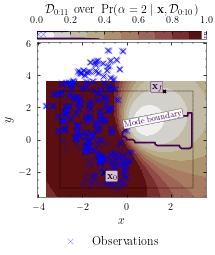

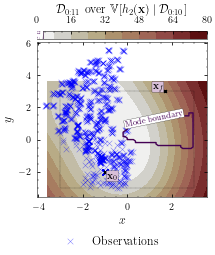

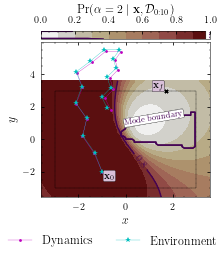

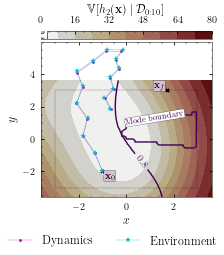

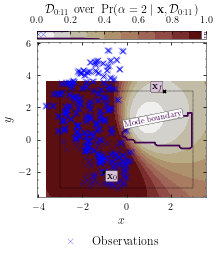

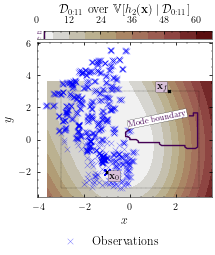

Optimisation result:
     fun: 183.83403733900371
     jac: array([-33.76208944,   2.49356947, -32.5779522 ,   2.58814904,
       -34.32242443,   2.93668505, -32.43900562,   2.76640789,
       -33.60732541,   3.10257294, -32.12991326,   2.86547702,
       -32.67951669,   3.2369355 , -32.20652633,   3.04819712,
       -31.89454369,   2.98582996, -26.38046308,   2.67612523,
       -27.1899797 ,   2.81721721, -11.0539294 ,   0.66698244,
       -11.61269388,   0.70561763,  -2.56195849,  -0.15043318,
        -2.68659129,  -0.1507759 ])
 message: 'Optimization terminated successfully'
    nfev: 38
     nit: 20
    njev: 20
  status: 0
 success: True
       x: array([-1.56340956,  6.11009077, -2.53693796,  5.63842377,  0.58502144,
        5.842844  , -1.98995328,  5.3492391 ,  1.19575351,  5.47401276,
       -1.12575019,  5.227942  ,  2.42480226,  4.35782776,  2.38017245,
        4.21351555,  2.60872803,  1.42237864, -1.33358131, -0.53579895,
        0.25658108, -0.94007535, -1.70894438, -0.6

2022-04-22 13:24:56.454235: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 13:24:56.454252: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


3/3 [==============================] - 2s 862ms/step - loss: -1029.0836 - val_loss: -948.0431


2022-04-22 13:24:57.615266: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 13:24:57.623266: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 13:24:57.629452: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_24_57

2022-04-22 13:24:57.634066: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_24_57/dr-robots-mbp.local.trace.json.gz
2022-04-22 13:24:57.650258: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_24_57

2022-04-22 13:24:57.650421: I tensorflow/core/profiler/rpc/client/s

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_12_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 21ms/step - loss: -1070.5814 - val_loss: -454.3522
Epoch 3/20000
3/3 [==============================] - 0s 22ms/step - loss: -955.0996 - val_loss: -840.6631
Epoch 4/20000
3/3 [==============================] - 0s 21ms/step - loss: -723.1809 - val_loss: -998.4504
Epoch 5/20000
3/3 [==============================] - 0s 20ms/step - loss: -905.8284 - val_loss: -873.0481
Epoch 6/20000
3/3 [==============================] - 0s 21ms/step - loss: -578.2441 - val_loss: -971.7644
Epoch 7/20000
3/3 [==============================] - 0s 21ms/step - loss: -949.4295 - val_loss: -1048.1569
Epoch 8/20000
3/3 [==============================] - 0s 21ms/step - loss: -909.0070 - val_loss: -491.9388
Epoch 9/20000
3/3 [==============================] - 0s 21ms/step - loss: -875.9654 - val_loss: -950.5432
Epoch 10/20000
3/3 [==============================] - 0s 21ms/step - loss: -1018.7052 - val_loss: -218.5435
Epoch 11/20000
3/3 [======================

3/3 [==============================] - 0s 21ms/step - loss: -1033.0483 - val_loss: -983.9604
Epoch 76/20000
3/3 [==============================] - 0s 20ms/step - loss: -1083.3750 - val_loss: -955.3296
Epoch 77/20000
3/3 [==============================] - 0s 21ms/step - loss: -1006.5643 - val_loss: -1011.4576
Epoch 78/20000
3/3 [==============================] - 0s 20ms/step - loss: -1076.4317 - val_loss: -888.9095
Epoch 79/20000
3/3 [==============================] - 0s 20ms/step - loss: -852.5848 - val_loss: -1037.1613
Epoch 80/20000
3/3 [==============================] - 0s 20ms/step - loss: -786.8528 - val_loss: -904.9754
Epoch 81/20000
3/3 [==============================] - 0s 20ms/step - loss: -965.6311 - val_loss: -1035.6855
Epoch 82/20000
3/3 [==============================] - 0s 20ms/step - loss: -801.7247 - val_loss: -1006.5669
Epoch 83/20000
3/3 [==============================] - 0s 20ms/step - loss: -983.5550 - val_loss: -929.7157
Epoch 84/20000
3/3 [========================

Epoch 151/20000
3/3 [==============================] - 0s 24ms/step - loss: -1029.7768 - val_loss: -985.2315
Epoch 152/20000
3/3 [==============================] - 0s 25ms/step - loss: -1079.5047 - val_loss: -1029.2056
Epoch 153/20000
3/3 [==============================] - 0s 26ms/step - loss: -1100.4572 - val_loss: -947.3039
Epoch 154/20000
3/3 [==============================] - 0s 25ms/step - loss: -1074.3417 - val_loss: -1046.7085
Epoch 155/20000
3/3 [==============================] - 0s 25ms/step - loss: -1050.2880 - val_loss: -1023.3078
Epoch 156/20000
3/3 [==============================] - 0s 25ms/step - loss: -999.9406 - val_loss: -1013.3862
Epoch 157/20000
3/3 [==============================] - 0s 25ms/step - loss: -1060.6131 - val_loss: -883.8043
Epoch 158/20000
3/3 [==============================] - 0s 26ms/step - loss: -1001.7544 - val_loss: -858.3806
Epoch 159/20000
3/3 [==============================] - 0s 24ms/step - loss: -989.7576 - val_loss: -996.4960
Epoch 160/20000
3

Epoch 226/20000
3/3 [==============================] - 0s 23ms/step - loss: -931.8555 - val_loss: -1018.8437
Epoch 227/20000
3/3 [==============================] - 0s 23ms/step - loss: -941.6663 - val_loss: -1071.7953
Epoch 228/20000
3/3 [==============================] - 0s 23ms/step - loss: -835.4332 - val_loss: -969.1415
Epoch 229/20000
3/3 [==============================] - 0s 23ms/step - loss: -1092.1363 - val_loss: -898.0680
Epoch 230/20000
3/3 [==============================] - 0s 23ms/step - loss: -1021.8846 - val_loss: -1000.3632
Epoch 231/20000
3/3 [==============================] - 0s 23ms/step - loss: -695.2707 - val_loss: -1052.3995
Epoch 232/20000
3/3 [==============================] - 0s 23ms/step - loss: -1061.3702 - val_loss: -1051.3056
Epoch 233/20000
3/3 [==============================] - 0s 23ms/step - loss: -1001.1845 - val_loss: -982.4659
Epoch 234/20000
3/3 [==============================] - 0s 23ms/step - loss: -1040.1300 - val_loss: -1049.7443
Epoch 235/20000
3

3/3 [==============================] - 0s 24ms/step - loss: -932.8144 - val_loss: -872.7500
Epoch 302/20000
3/3 [==============================] - 0s 24ms/step - loss: -908.1352 - val_loss: -827.1613
Epoch 303/20000
3/3 [==============================] - 0s 23ms/step - loss: -822.0752 - val_loss: -645.9604
Epoch 304/20000
3/3 [==============================] - 0s 23ms/step - loss: -939.2939 - val_loss: -902.4701
Epoch 305/20000
3/3 [==============================] - 0s 23ms/step - loss: -913.0844 - val_loss: -851.0126
Epoch 306/20000
3/3 [==============================] - 0s 23ms/step - loss: -900.9905 - val_loss: -925.0850
Epoch 307/20000
3/3 [==============================] - 0s 23ms/step - loss: -910.5839 - val_loss: -917.6715
Epoch 308/20000
3/3 [==============================] - 0s 24ms/step - loss: -964.8618 - val_loss: -905.7022
Epoch 309/20000
3/3 [==============================] - 0s 23ms/step - loss: -977.1538 - val_loss: -897.8421
Epoch 310/20000
3/3 [=======================

3/3 [==============================] - 0s 27ms/step - loss: -1002.8587 - val_loss: -1015.5804
Epoch 377/20000
3/3 [==============================] - 0s 27ms/step - loss: -1059.9939 - val_loss: -1053.6008
Epoch 378/20000
3/3 [==============================] - 0s 30ms/step - loss: -1067.7801 - val_loss: -1052.4846
Epoch 379/20000
3/3 [==============================] - 0s 28ms/step - loss: -1054.4927 - val_loss: -1029.5075
Epoch 380/20000
3/3 [==============================] - 0s 26ms/step - loss: -1049.4810 - val_loss: -1062.6903
Epoch 381/20000
3/3 [==============================] - 0s 25ms/step - loss: -1049.4342 - val_loss: -1042.0342
Epoch 382/20000
3/3 [==============================] - 0s 26ms/step - loss: -1072.7728 - val_loss: -897.8049
Epoch 383/20000
3/3 [==============================] - 0s 25ms/step - loss: -1083.5049 - val_loss: -956.3569
Epoch 384/20000
3/3 [==============================] - 0s 25ms/step - loss: -1066.1784 - val_loss: -944.2305
Epoch 385/20000
3/3 [========

3/3 [==============================] - 0s 26ms/step - loss: -1065.7764 - val_loss: -1046.8792
Epoch 452/20000
3/3 [==============================] - 0s 26ms/step - loss: -1061.0101 - val_loss: -1038.9548
Epoch 453/20000
3/3 [==============================] - 0s 25ms/step - loss: -1046.8436 - val_loss: -1003.5495
Epoch 454/20000
3/3 [==============================] - 0s 27ms/step - loss: -1083.3564 - val_loss: -1009.6025
Epoch 455/20000
3/3 [==============================] - 0s 25ms/step - loss: -1068.1619 - val_loss: -872.6446
Epoch 456/20000
3/3 [==============================] - 0s 26ms/step - loss: -1067.3983 - val_loss: -855.9086
Epoch 457/20000
3/3 [==============================] - 0s 26ms/step - loss: -1013.4330 - val_loss: -1001.6625
Epoch 458/20000
3/3 [==============================] - 0s 26ms/step - loss: -1031.4920 - val_loss: -1001.4461
Epoch 459/20000
3/3 [==============================] - 0s 26ms/step - loss: -1064.2837 - val_loss: -1038.6142
Epoch 460/20000
3/3 [=======

3/3 [==============================] - 0s 24ms/step - loss: -1034.4167 - val_loss: -854.0787
Epoch 527/20000
3/3 [==============================] - 0s 25ms/step - loss: -1060.5030 - val_loss: -1020.6037
Epoch 528/20000
3/3 [==============================] - 0s 25ms/step - loss: -1071.5274 - val_loss: -1033.3097
Epoch 529/20000
3/3 [==============================] - 0s 24ms/step - loss: -1057.1572 - val_loss: -1013.3179
Epoch 530/20000
3/3 [==============================] - 0s 24ms/step - loss: -1055.0791 - val_loss: -1028.7107
Epoch 531/20000
3/3 [==============================] - 0s 25ms/step - loss: -1063.8106 - val_loss: -1040.5843
Epoch 532/20000
3/3 [==============================] - 0s 25ms/step - loss: -1053.6532 - val_loss: -1032.6016
Epoch 533/20000
3/3 [==============================] - 0s 25ms/step - loss: -1058.3519 - val_loss: -1035.9195
Epoch 534/20000
3/3 [==============================] - 0s 24ms/step - loss: -1094.1288 - val_loss: -1034.8935
Epoch 535/20000
3/3 [======

Epoch 601/20000
3/3 [==============================] - 0s 25ms/step - loss: -1034.9446 - val_loss: -696.7716
Epoch 602/20000
3/3 [==============================] - 0s 24ms/step - loss: -919.0976 - val_loss: -955.5162
Epoch 603/20000
3/3 [==============================] - 0s 24ms/step - loss: -898.5423 - val_loss: -1008.1280
Epoch 604/20000
3/3 [==============================] - 0s 25ms/step - loss: -948.4497 - val_loss: -654.4078
Epoch 605/20000
3/3 [==============================] - 0s 24ms/step - loss: -623.8791 - val_loss: -980.2870
Epoch 606/20000
3/3 [==============================] - 0s 25ms/step - loss: -935.7285 - val_loss: -892.5447
Epoch 607/20000
3/3 [==============================] - 0s 25ms/step - loss: -709.7376 - val_loss: -1046.2228
Epoch 608/20000
3/3 [==============================] - 0s 25ms/step - loss: -943.7554 - val_loss: -560.1250
Epoch 609/20000
3/3 [==============================] - 0s 25ms/step - loss: -838.0011 - val_loss: -979.5901
Epoch 610/20000
3/3 [====

Epoch 676/20000
3/3 [==============================] - 0s 25ms/step - loss: -984.8842 - val_loss: -1044.1965
Epoch 677/20000
3/3 [==============================] - 0s 25ms/step - loss: -988.9885 - val_loss: -939.8795
Epoch 678/20000
3/3 [==============================] - 0s 25ms/step - loss: -1034.8530 - val_loss: -1042.8219
Epoch 679/20000
3/3 [==============================] - 0s 25ms/step - loss: -983.5929 - val_loss: -995.6061
Epoch 680/20000
3/3 [==============================] - 0s 25ms/step - loss: -1039.4181 - val_loss: -1067.2534
Epoch 681/20000
3/3 [==============================] - 0s 26ms/step - loss: -994.2926 - val_loss: -964.0572
Epoch 682/20000
3/3 [==============================] - 0s 33ms/step - loss: -1081.4162 - val_loss: -1014.2563
Epoch 683/20000
3/3 [==============================] - 0s 25ms/step - loss: -1062.7442 - val_loss: -1004.9669
Epoch 684/20000
3/3 [==============================] - 0s 25ms/step - loss: -1054.6048 - val_loss: -1037.8439
Epoch 685/20000
3

3/3 [==============================] - 0s 25ms/step - loss: -1015.2329 - val_loss: -1014.1951
Epoch 752/20000
3/3 [==============================] - 0s 26ms/step - loss: -996.5362 - val_loss: -978.0388
Epoch 753/20000
3/3 [==============================] - 0s 26ms/step - loss: -1014.1101 - val_loss: -950.0680
Epoch 754/20000
3/3 [==============================] - 0s 26ms/step - loss: -1044.3454 - val_loss: -1018.3551
Epoch 755/20000
3/3 [==============================] - 0s 28ms/step - loss: -1040.9537 - val_loss: -1002.3612
Epoch 756/20000
3/3 [==============================] - 0s 27ms/step - loss: -978.8196 - val_loss: -1034.4168
Epoch 757/20000
3/3 [==============================] - 0s 27ms/step - loss: -1043.2084 - val_loss: -1022.6982
Epoch 758/20000
3/3 [==============================] - 0s 27ms/step - loss: -1048.4376 - val_loss: -1013.9829
Epoch 759/20000
3/3 [==============================] - 0s 30ms/step - loss: -1066.2196 - val_loss: -990.8055
Epoch 760/20000
3/3 [==========

3/3 [==============================] - 0s 26ms/step - loss: -1033.9907 - val_loss: -1022.2674
Epoch 827/20000
3/3 [==============================] - 0s 26ms/step - loss: -986.0991 - val_loss: -1061.7935
Epoch 828/20000
3/3 [==============================] - 0s 26ms/step - loss: -991.3357 - val_loss: -854.8947
Epoch 829/20000
3/3 [==============================] - 0s 25ms/step - loss: -1015.9231 - val_loss: -862.7478
Epoch 830/20000
3/3 [==============================] - 0s 26ms/step - loss: -1038.1021 - val_loss: -776.9020
Epoch 831/20000
3/3 [==============================] - 0s 26ms/step - loss: -765.3961 - val_loss: -893.3793
Epoch 832/20000
3/3 [==============================] - 0s 26ms/step - loss: -886.1539 - val_loss: -617.7181
Epoch 833/20000
3/3 [==============================] - 0s 25ms/step - loss: -927.9581 - val_loss: -935.8666
Epoch 834/20000
3/3 [==============================] - 0s 26ms/step - loss: -1022.9107 - val_loss: 253.0290
Epoch 835/20000
3/3 [==================

3/3 [==============================] - 0s 25ms/step - loss: -917.5582 - val_loss: -853.8417
Epoch 902/20000
3/3 [==============================] - 0s 26ms/step - loss: -1010.5679 - val_loss: -1065.3595
Epoch 903/20000
3/3 [==============================] - 0s 25ms/step - loss: -1079.9632 - val_loss: -1017.2329
Epoch 904/20000
3/3 [==============================] - 0s 26ms/step - loss: -1081.7708 - val_loss: -1002.9872
Epoch 905/20000
3/3 [==============================] - 0s 26ms/step - loss: -1036.4979 - val_loss: -1025.8107
Epoch 906/20000
3/3 [==============================] - 0s 26ms/step - loss: -1013.5059 - val_loss: -1071.6555
Epoch 907/20000
3/3 [==============================] - 0s 25ms/step - loss: -1050.6509 - val_loss: -1068.2457
Epoch 908/20000
3/3 [==============================] - 0s 25ms/step - loss: -1085.2939 - val_loss: -1053.9083
Epoch 909/20000
3/3 [==============================] - 0s 26ms/step - loss: -1106.1325 - val_loss: -1055.9413
Epoch 910/20000
3/3 [=======

3/3 [==============================] - 0s 28ms/step - loss: -1111.4934 - val_loss: -1070.8948
Epoch 977/20000
3/3 [==============================] - 0s 29ms/step - loss: -1134.4689 - val_loss: -990.9882
Epoch 978/20000
3/3 [==============================] - 0s 28ms/step - loss: -1061.8250 - val_loss: -1023.4201
Epoch 979/20000
3/3 [==============================] - 0s 26ms/step - loss: -1122.0452 - val_loss: -1075.3856
Epoch 980/20000
3/3 [==============================] - 0s 27ms/step - loss: -1074.6074 - val_loss: -984.3582
Epoch 981/20000
3/3 [==============================] - 0s 27ms/step - loss: -1100.3352 - val_loss: -1051.4746
Epoch 982/20000
3/3 [==============================] - 0s 27ms/step - loss: -1072.5572 - val_loss: -874.4473
Epoch 983/20000
3/3 [==============================] - 0s 28ms/step - loss: -1086.1052 - val_loss: -1033.0314
Epoch 984/20000
3/3 [==============================] - 0s 28ms/step - loss: -1100.9836 - val_loss: -941.6303
Epoch 985/20000
3/3 [=========

3/3 [==============================] - 0s 25ms/step - loss: -1010.9181 - val_loss: -928.6512
Epoch 1051/20000
3/3 [==============================] - 0s 25ms/step - loss: -980.3577 - val_loss: -1046.0066
Epoch 1052/20000
3/3 [==============================] - 0s 25ms/step - loss: -982.7847 - val_loss: -971.1900
Epoch 1053/20000
3/3 [==============================] - 0s 25ms/step - loss: -1032.2095 - val_loss: -1057.1541
Epoch 1054/20000
3/3 [==============================] - 0s 26ms/step - loss: -945.2282 - val_loss: -941.3476
Epoch 1055/20000
3/3 [==============================] - 0s 26ms/step - loss: -921.1516 - val_loss: -1028.7919
Epoch 1056/20000
3/3 [==============================] - 0s 26ms/step - loss: -1050.4950 - val_loss: -972.7272
Epoch 1057/20000
3/3 [==============================] - 0s 25ms/step - loss: -976.3397 - val_loss: -1009.3512
Epoch 1058/20000
3/3 [==============================] - 0s 25ms/step - loss: -1051.6521 - val_loss: -1022.6096
Epoch 1059/20000
3/3 [=====

3/3 [==============================] - 0s 24ms/step - loss: -1036.2548 - val_loss: -939.8700
Epoch 1125/20000
3/3 [==============================] - 0s 24ms/step - loss: -997.6327 - val_loss: -999.6750
Epoch 1126/20000
3/3 [==============================] - 0s 24ms/step - loss: -948.6722 - val_loss: -1034.2978
Epoch 1127/20000
3/3 [==============================] - 0s 24ms/step - loss: -1012.0401 - val_loss: -980.1403
Epoch 1128/20000
3/3 [==============================] - 0s 25ms/step - loss: -1000.3162 - val_loss: -1026.7891
Epoch 1129/20000
3/3 [==============================] - 0s 25ms/step - loss: -932.3197 - val_loss: -1053.5729
Epoch 1130/20000
3/3 [==============================] - 0s 25ms/step - loss: -953.4825 - val_loss: -919.3231
Epoch 1131/20000
3/3 [==============================] - 0s 24ms/step - loss: -1040.0898 - val_loss: -1070.2373
Epoch 1132/20000
3/3 [==============================] - 0s 24ms/step - loss: -1042.7658 - val_loss: -929.5371
Epoch 1133/20000
3/3 [=====

3/3 [==============================] - 0s 26ms/step - loss: -1056.3420 - val_loss: -1015.2983
Epoch 1199/20000
3/3 [==============================] - 0s 25ms/step - loss: -1041.4001 - val_loss: -1044.3561
Epoch 1200/20000
3/3 [==============================] - 0s 26ms/step - loss: -1015.3520 - val_loss: -1036.3129
Epoch 1201/20000
3/3 [==============================] - 0s 25ms/step - loss: -1051.7347 - val_loss: -1055.8342
Epoch 1202/20000
3/3 [==============================] - 0s 26ms/step - loss: -1073.6021 - val_loss: -1049.0929
Epoch 1203/20000
3/3 [==============================] - 0s 25ms/step - loss: -1086.8257 - val_loss: -1031.9093
Epoch 1204/20000
3/3 [==============================] - 0s 26ms/step - loss: -1081.1654 - val_loss: -1026.2101
Epoch 1205/20000
3/3 [==============================] - 0s 26ms/step - loss: -1083.4709 - val_loss: -1055.1494
Epoch 1206/20000
3/3 [==============================] - 0s 25ms/step - loss: -1098.6412 - val_loss: -1041.3953
Epoch 1207/20000
3

3/3 [==============================] - 0s 26ms/step - loss: -1081.8015 - val_loss: -986.5493
Epoch 1273/20000
3/3 [==============================] - 0s 25ms/step - loss: -1079.7627 - val_loss: -1038.4535
Epoch 1274/20000
3/3 [==============================] - 0s 25ms/step - loss: -1088.3651 - val_loss: -985.8914
Epoch 1275/20000
3/3 [==============================] - 0s 25ms/step - loss: -1101.7748 - val_loss: -1062.9795
Epoch 1276/20000
3/3 [==============================] - 0s 26ms/step - loss: -1080.1789 - val_loss: -1070.5397
Epoch 1277/20000
3/3 [==============================] - 0s 26ms/step - loss: -1095.5515 - val_loss: -1073.1325
Epoch 1278/20000
3/3 [==============================] - 0s 25ms/step - loss: -1095.4742 - val_loss: -1068.0494
Epoch 1279/20000
3/3 [==============================] - 0s 25ms/step - loss: -1109.1266 - val_loss: -1070.9305
Epoch 1280/20000
3/3 [==============================] - 0s 26ms/step - loss: -1074.2126 - val_loss: -1085.8508
Epoch 1281/20000
3/3

3/3 [==============================] - 0s 25ms/step - loss: -1094.9777 - val_loss: -1044.2555
Epoch 1347/20000
3/3 [==============================] - 0s 28ms/step - loss: -1071.3570 - val_loss: -1028.7794
Epoch 1348/20000
3/3 [==============================] - 0s 25ms/step - loss: -1045.8095 - val_loss: -1061.3660
Epoch 1349/20000
3/3 [==============================] - 0s 25ms/step - loss: -1083.8643 - val_loss: -1080.9807
Epoch 1350/20000
3/3 [==============================] - 0s 26ms/step - loss: -1088.8625 - val_loss: -1083.2284
Epoch 1351/20000
3/3 [==============================] - 0s 26ms/step - loss: -1094.1547 - val_loss: -1085.9886
Epoch 1352/20000
3/3 [==============================] - 0s 25ms/step - loss: -1103.1840 - val_loss: -1050.6240
Epoch 1353/20000
3/3 [==============================] - 0s 25ms/step - loss: -1028.5390 - val_loss: -965.3882
Epoch 1354/20000
3/3 [==============================] - 0s 29ms/step - loss: -1099.8865 - val_loss: -1051.1714
Epoch 1355/20000
3/

Epoch 1421/20000
3/3 [==============================] - 0s 26ms/step - loss: -738.7995 - val_loss: -94.6423
Epoch 1422/20000
3/3 [==============================] - 0s 26ms/step - loss: -754.7391 - val_loss: -477.5964
Epoch 1423/20000
3/3 [==============================] - 0s 26ms/step - loss: -789.1463 - val_loss: -761.6933
Epoch 1424/20000
3/3 [==============================] - 0s 26ms/step - loss: -776.9549 - val_loss: -153.8471
Epoch 1425/20000
3/3 [==============================] - 0s 25ms/step - loss: -757.6042 - val_loss: 97.6181
Epoch 1426/20000
3/3 [==============================] - 0s 25ms/step - loss: -829.8216 - val_loss: -850.5894
Epoch 1427/20000
3/3 [==============================] - 0s 25ms/step - loss: -825.5905 - val_loss: -801.7941
Epoch 1428/20000
3/3 [==============================] - 0s 25ms/step - loss: -723.8439 - val_loss: -720.8386
Epoch 1429/20000
3/3 [==============================] - 0s 25ms/step - loss: -771.0410 - val_loss: -798.5859
Epoch 1430/20000
3/3 [

3/3 [==============================] - 0s 24ms/step - loss: -784.7821 - val_loss: -835.0166
Epoch 1497/20000
3/3 [==============================] - 0s 24ms/step - loss: -760.8067 - val_loss: -727.6295
Epoch 1498/20000
3/3 [==============================] - 0s 24ms/step - loss: -829.6563 - val_loss: -847.1318
Epoch 1499/20000
3/3 [==============================] - 0s 25ms/step - loss: -658.4852 - val_loss: -718.9038
Epoch 1500/20000
3/3 [==============================] - 0s 25ms/step - loss: -737.0944 - val_loss: -613.6692
Epoch 1501/20000
3/3 [==============================] - 0s 24ms/step - loss: -780.9571 - val_loss: -405.5361
Epoch 1502/20000
3/3 [==============================] - 0s 25ms/step - loss: -797.0394 - val_loss: -812.7862
Epoch 1503/20000
3/3 [==============================] - 0s 25ms/step - loss: -817.5013 - val_loss: -590.1486
Epoch 1504/20000
3/3 [==============================] - 0s 24ms/step - loss: -851.4338 - val_loss: -750.8998
Epoch 1505/20000
3/3 [==============

3/3 [==============================] - 0s 26ms/step - loss: -779.6279 - val_loss: -950.7188
Epoch 1572/20000
3/3 [==============================] - 0s 26ms/step - loss: -639.5258 - val_loss: -890.4656
Epoch 1573/20000
3/3 [==============================] - 0s 26ms/step - loss: -883.5458 - val_loss: 128.0368
Epoch 1574/20000
3/3 [==============================] - 0s 26ms/step - loss: -851.5693 - val_loss: -824.4374
Epoch 1575/20000
3/3 [==============================] - 0s 26ms/step - loss: -823.0908 - val_loss: -757.0749
Epoch 1576/20000
3/3 [==============================] - 0s 26ms/step - loss: -833.9357 - val_loss: -797.9517
Epoch 1577/20000
3/3 [==============================] - 0s 26ms/step - loss: -801.7682 - val_loss: -605.2899
Epoch 1578/20000
3/3 [==============================] - 0s 26ms/step - loss: -901.1253 - val_loss: -889.9213
Epoch 1579/20000
3/3 [==============================] - 0s 27ms/step - loss: -814.3023 - val_loss: -893.0297
Epoch 1580/20000
3/3 [===============

3/3 [==============================] - 0s 24ms/step - loss: -886.9551 - val_loss: -973.2768
Epoch 1647/20000
3/3 [==============================] - 0s 25ms/step - loss: -911.5360 - val_loss: -895.4356
Epoch 1648/20000
3/3 [==============================] - 0s 25ms/step - loss: -889.4121 - val_loss: -1031.4053
Epoch 1649/20000
3/3 [==============================] - 0s 24ms/step - loss: -1003.5388 - val_loss: -966.2440
Epoch 1650/20000
3/3 [==============================] - 0s 24ms/step - loss: -931.6398 - val_loss: -558.7672
Epoch 1651/20000
3/3 [==============================] - 0s 25ms/step - loss: -982.9229 - val_loss: -1022.4777
Epoch 1652/20000
3/3 [==============================] - 0s 24ms/step - loss: -895.5767 - val_loss: -795.1162
Epoch 1653/20000
3/3 [==============================] - 0s 25ms/step - loss: -970.0100 - val_loss: -1011.6422
Epoch 1654/20000
3/3 [==============================] - 0s 24ms/step - loss: -960.7402 - val_loss: -1010.9319
Epoch 1655/20000
3/3 [=========

3/3 [==============================] - 0s 24ms/step - loss: -896.9648 - val_loss: -817.4559
Epoch 1722/20000
3/3 [==============================] - 0s 24ms/step - loss: -896.5402 - val_loss: -931.8620
Epoch 1723/20000
3/3 [==============================] - 0s 24ms/step - loss: -823.2190 - val_loss: -872.8056
Epoch 1724/20000
3/3 [==============================] - 0s 24ms/step - loss: -955.0981 - val_loss: -950.1480
Epoch 1725/20000
3/3 [==============================] - 0s 25ms/step - loss: -842.0806 - val_loss: -847.2286
Epoch 1726/20000
3/3 [==============================] - 0s 24ms/step - loss: -911.1183 - val_loss: -886.8968
Epoch 1727/20000
3/3 [==============================] - 0s 24ms/step - loss: -905.7414 - val_loss: -657.4944
Epoch 1728/20000
3/3 [==============================] - 0s 23ms/step - loss: -908.7775 - val_loss: -848.7381
Epoch 1729/20000
3/3 [==============================] - 0s 24ms/step - loss: -758.8315 - val_loss: -916.7254
Epoch 1730/20000
3/3 [==============

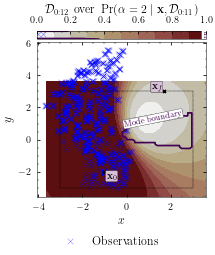

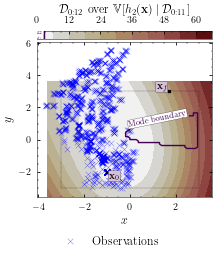

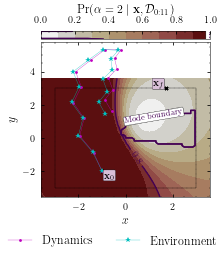

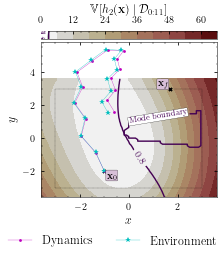

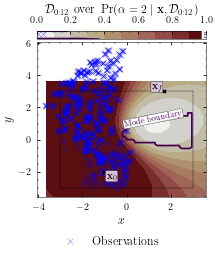

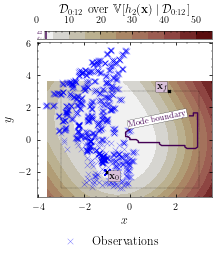

Optimisation result:
     fun: 99.79068826167327
     jac: array([-32.49135533,   7.42971033, -32.38707372,   7.47653619,
       -32.6697114 ,   7.70287278, -31.41274276,   7.74022497,
       -32.21647841,   8.09659598, -31.25756856,   7.85658895,
       -31.22735542,   8.24136243, -30.87625219,   7.9215992 ,
       -30.55580499,   7.8869989 , -27.62031926,   7.89746154,
       -28.42299369,   7.99637251, -16.14915128,   5.22867014,
       -16.94259851,   5.2929462 ,  -6.41146259,   1.78530361,
        -6.7761341 ,   1.79831502])
 message: 'Optimization terminated successfully'
    nfev: 146
     nit: 44
    njev: 44
  status: 0
 success: True
       x: array([-1.35530439e+00,  6.66921399e+00, -1.12169264e+00,  6.75614134e+00,
       -4.36279741e-03,  6.46364981e+00, -1.60477811e+00,  5.73248949e+00,
        1.47778291e+00,  5.40348159e+00, -5.90828918e-01,  5.32278403e+00,
        2.81112385e+00,  3.81459100e+00,  2.47098117e+00,  4.25563234e+00,
        2.67386066e+00,  1.41057999e+0

2022-04-22 13:28:26.419026: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 13:28:26.419043: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


3/3 [==============================] - 2s 910ms/step - loss: -728.1835 - val_loss: 21.2202


2022-04-22 13:28:27.640538: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 13:28:27.649074: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 13:28:27.654774: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_28_27

2022-04-22 13:28:27.659340: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_28_27/dr-robots-mbp.local.trace.json.gz
2022-04-22 13:28:27.676911: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_28_27

2022-04-22 13:28:27.677132: I tensorflow/core/profiler/rpc/client/s

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_13_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 22ms/step - loss: -776.0329 - val_loss: -590.4004
Epoch 3/20000
3/3 [==============================] - 0s 21ms/step - loss: -944.1636 - val_loss: -908.2841
Epoch 4/20000
3/3 [==============================] - 0s 21ms/step - loss: -731.1366 - val_loss: -750.3665
Epoch 5/20000
3/3 [==============================] - 0s 21ms/step - loss: -160.5998 - val_loss: -611.3392
Epoch 6/20000
3/3 [==============================] - 0s 21ms/step - loss: -859.3792 - val_loss: -743.2694
Epoch 7/20000
3/3 [==============================] - 0s 21ms/step - loss: -912.5519 - val_loss: -575.8292
Epoch 8/20000
3/3 [==============================] - 0s 22ms/step - loss: -666.5517 - val_loss: -926.3325
Epoch 9/20000
3/3 [==============================] - 0s 21ms/step - loss: -828.9826 - val_loss: -893.9285
Epoch 10/20000
3/3 [==============================] - 0s 21ms/step - loss: -907.8476 - val_loss: -801.4297
Epoch 11/20000
3/3 [=========================

3/3 [==============================] - 0s 21ms/step - loss: -1008.1775 - val_loss: -685.5639
Epoch 77/20000
3/3 [==============================] - 0s 20ms/step - loss: -1004.2054 - val_loss: -609.8447
Epoch 78/20000
3/3 [==============================] - 0s 20ms/step - loss: -993.0247 - val_loss: -883.8570
Epoch 79/20000
3/3 [==============================] - 0s 21ms/step - loss: -1050.5511 - val_loss: -1000.0379
Epoch 80/20000
3/3 [==============================] - 0s 21ms/step - loss: -940.5228 - val_loss: -713.2969
Epoch 81/20000
3/3 [==============================] - 0s 21ms/step - loss: -1037.9401 - val_loss: -893.7733
Epoch 82/20000
3/3 [==============================] - 0s 20ms/step - loss: -996.6384 - val_loss: -1009.4139
Epoch 83/20000
3/3 [==============================] - 0s 21ms/step - loss: -1022.2800 - val_loss: -801.4845
Epoch 84/20000
3/3 [==============================] - 0s 21ms/step - loss: -1010.8273 - val_loss: -973.2738
Epoch 85/20000
3/3 [========================

Epoch 152/20000
3/3 [==============================] - 0s 22ms/step - loss: -911.3406 - val_loss: -632.6079
Epoch 153/20000
3/3 [==============================] - 0s 23ms/step - loss: -916.1850 - val_loss: -920.4088
Epoch 154/20000
3/3 [==============================] - 0s 23ms/step - loss: -940.6624 - val_loss: -696.0172
Epoch 155/20000
3/3 [==============================] - 0s 24ms/step - loss: -951.4713 - val_loss: -898.5303
Epoch 156/20000
3/3 [==============================] - 0s 23ms/step - loss: -837.5257 - val_loss: -907.8733
Epoch 157/20000
3/3 [==============================] - 0s 23ms/step - loss: -900.9033 - val_loss: -885.8682
Epoch 158/20000
3/3 [==============================] - 0s 30ms/step - loss: -954.5559 - val_loss: -978.3285
Epoch 159/20000
3/3 [==============================] - 0s 25ms/step - loss: -989.8574 - val_loss: -845.1375
Epoch 160/20000
3/3 [==============================] - 0s 24ms/step - loss: -985.4387 - val_loss: -502.5571
Epoch 161/20000
3/3 [=======

3/3 [==============================] - 0s 25ms/step - loss: -1035.7319 - val_loss: -991.1658
Epoch 228/20000
3/3 [==============================] - 0s 25ms/step - loss: -1041.3277 - val_loss: -848.8426
Epoch 229/20000
3/3 [==============================] - 0s 25ms/step - loss: -1005.1339 - val_loss: -1014.3442
Epoch 230/20000
3/3 [==============================] - 0s 26ms/step - loss: -1059.8306 - val_loss: -1019.1217
Epoch 231/20000
3/3 [==============================] - 0s 25ms/step - loss: -992.6428 - val_loss: -883.6997
Epoch 232/20000
3/3 [==============================] - 0s 25ms/step - loss: -1014.2820 - val_loss: -1054.3873
Epoch 233/20000
3/3 [==============================] - 0s 26ms/step - loss: -993.4136 - val_loss: -1015.5262
Epoch 234/20000
3/3 [==============================] - 0s 26ms/step - loss: -1018.9185 - val_loss: -1003.0667
Epoch 235/20000
3/3 [==============================] - 0s 25ms/step - loss: -1064.0911 - val_loss: -1066.6368
Epoch 236/20000
3/3 [==========

3/3 [==============================] - 0s 25ms/step - loss: 299.7197 - val_loss: 1662.9310
Epoch 303/20000
3/3 [==============================] - 0s 25ms/step - loss: -300.5418 - val_loss: 544.1137
Epoch 304/20000
3/3 [==============================] - 0s 25ms/step - loss: -562.7512 - val_loss: -446.8410
Epoch 305/20000
3/3 [==============================] - 0s 26ms/step - loss: -440.9899 - val_loss: -43.4030
Epoch 306/20000
3/3 [==============================] - 0s 25ms/step - loss: -412.5326 - val_loss: 410.0599
Epoch 307/20000
3/3 [==============================] - 0s 25ms/step - loss: -840.8083 - val_loss: -824.7931
Epoch 308/20000
3/3 [==============================] - 0s 26ms/step - loss: -820.4268 - val_loss: -534.0576
Epoch 309/20000
3/3 [==============================] - 0s 25ms/step - loss: -910.1260 - val_loss: -697.2329
Epoch 310/20000
3/3 [==============================] - 0s 25ms/step - loss: -728.9684 - val_loss: -864.9868
Epoch 311/20000
3/3 [===========================

Epoch 378/20000
3/3 [==============================] - 0s 29ms/step - loss: -1064.5126 - val_loss: -1027.6542
Epoch 379/20000
3/3 [==============================] - 0s 29ms/step - loss: -1046.9666 - val_loss: -1036.5659
Epoch 380/20000
3/3 [==============================] - 0s 28ms/step - loss: -1054.0330 - val_loss: -895.9196
Epoch 381/20000
3/3 [==============================] - 0s 29ms/step - loss: -1036.3266 - val_loss: -969.8065
Epoch 382/20000
3/3 [==============================] - 0s 27ms/step - loss: -1091.4687 - val_loss: -890.3140
Epoch 383/20000
3/3 [==============================] - 0s 26ms/step - loss: -1035.0053 - val_loss: -1016.8799
Epoch 384/20000
3/3 [==============================] - 0s 27ms/step - loss: -1032.8586 - val_loss: -989.2231
Epoch 385/20000
3/3 [==============================] - 0s 27ms/step - loss: -975.6589 - val_loss: -796.4774
Epoch 386/20000
3/3 [==============================] - 0s 28ms/step - loss: -1044.8739 - val_loss: -987.2945
Epoch 387/20000
3

3/3 [==============================] - 0s 26ms/step - loss: -974.7678 - val_loss: -837.7910
Epoch 454/20000
3/3 [==============================] - 0s 25ms/step - loss: -992.5358 - val_loss: -1019.2278
Epoch 455/20000
3/3 [==============================] - 0s 25ms/step - loss: -1041.1960 - val_loss: -986.5559
Epoch 456/20000
3/3 [==============================] - 0s 25ms/step - loss: -1003.5751 - val_loss: -1011.8618
Epoch 457/20000
3/3 [==============================] - 0s 25ms/step - loss: -1033.6126 - val_loss: -944.5461
Epoch 458/20000
3/3 [==============================] - 0s 26ms/step - loss: -1006.6490 - val_loss: -1001.0203
Epoch 459/20000
3/3 [==============================] - 0s 25ms/step - loss: -1023.7404 - val_loss: -983.9144
Epoch 460/20000
3/3 [==============================] - 0s 25ms/step - loss: -1030.2902 - val_loss: -1009.1300
Epoch 461/20000
3/3 [==============================] - 0s 25ms/step - loss: -1048.9159 - val_loss: -977.3948
Epoch 462/20000
3/3 [============

3/3 [==============================] - 0s 26ms/step - loss: -998.2509 - val_loss: -838.3285
Epoch 529/20000
3/3 [==============================] - 0s 25ms/step - loss: -759.8225 - val_loss: -340.6809
Epoch 530/20000
3/3 [==============================] - 0s 26ms/step - loss: -652.0301 - val_loss: -865.4903
Epoch 531/20000
3/3 [==============================] - 0s 25ms/step - loss: -851.2632 - val_loss: -763.1182
Epoch 532/20000
3/3 [==============================] - 0s 26ms/step - loss: -799.4589 - val_loss: -503.1459
Epoch 533/20000
3/3 [==============================] - 0s 27ms/step - loss: -753.9599 - val_loss: -850.1060
Epoch 534/20000
3/3 [==============================] - 0s 26ms/step - loss: -741.3666 - val_loss: -835.4351
Epoch 535/20000
3/3 [==============================] - 0s 25ms/step - loss: -679.8901 - val_loss: -803.2089
Epoch 536/20000
3/3 [==============================] - 0s 26ms/step - loss: -879.4667 - val_loss: -845.6964
Epoch 537/20000
3/3 [=======================

3/3 [==============================] - 0s 26ms/step - loss: -1084.6070 - val_loss: -1034.4344
Epoch 604/20000
3/3 [==============================] - 0s 25ms/step - loss: -1058.0358 - val_loss: -1046.2526
Epoch 605/20000
3/3 [==============================] - 0s 25ms/step - loss: -1002.4503 - val_loss: -997.6211
Epoch 606/20000
3/3 [==============================] - 0s 25ms/step - loss: -960.0723 - val_loss: -782.0175
Epoch 607/20000
3/3 [==============================] - 0s 25ms/step - loss: -1086.0947 - val_loss: -971.7859
Epoch 608/20000
3/3 [==============================] - 0s 25ms/step - loss: -919.7111 - val_loss: -1072.7653
Epoch 609/20000
3/3 [==============================] - 0s 26ms/step - loss: -971.5865 - val_loss: -555.5616
Epoch 610/20000
3/3 [==============================] - 0s 26ms/step - loss: -749.9998 - val_loss: -620.7437
Epoch 611/20000
3/3 [==============================] - 0s 25ms/step - loss: -1032.2704 - val_loss: -1002.0817
Epoch 612/20000
3/3 [==============

3/3 [==============================] - 0s 25ms/step - loss: -1104.3967 - val_loss: -1064.0394
Epoch 679/20000
3/3 [==============================] - 0s 25ms/step - loss: -1110.5204 - val_loss: -1017.7185
Epoch 680/20000
3/3 [==============================] - 0s 25ms/step - loss: -1106.3682 - val_loss: -1083.9457
Epoch 681/20000
3/3 [==============================] - 0s 26ms/step - loss: -1125.5834 - val_loss: -1083.2957
Epoch 682/20000
3/3 [==============================] - 0s 25ms/step - loss: -1092.1431 - val_loss: -1036.9302
Epoch 683/20000
3/3 [==============================] - 0s 25ms/step - loss: -1106.0874 - val_loss: -1064.5996
Epoch 684/20000
3/3 [==============================] - 0s 25ms/step - loss: -1111.3879 - val_loss: -1004.4245
Epoch 685/20000
3/3 [==============================] - 0s 25ms/step - loss: -1092.1699 - val_loss: -1038.3980
Epoch 686/20000
3/3 [==============================] - 0s 25ms/step - loss: -1088.7646 - val_loss: -1034.5184
Epoch 687/20000
3/3 [=====

3/3 [==============================] - 0s 26ms/step - loss: -998.5213 - val_loss: -856.3948
Epoch 754/20000
3/3 [==============================] - 0s 26ms/step - loss: -867.5929 - val_loss: -1061.7805
Epoch 755/20000
3/3 [==============================] - 0s 27ms/step - loss: -902.0425 - val_loss: -1039.3613
Epoch 756/20000
3/3 [==============================] - 0s 26ms/step - loss: -976.6277 - val_loss: -989.0916
Epoch 757/20000
3/3 [==============================] - 0s 27ms/step - loss: -1074.5082 - val_loss: -1009.8236
Epoch 758/20000
3/3 [==============================] - 0s 26ms/step - loss: -1081.9208 - val_loss: -742.3316
Epoch 759/20000
3/3 [==============================] - 0s 27ms/step - loss: -1012.0431 - val_loss: -432.4203
Epoch 760/20000
3/3 [==============================] - 0s 26ms/step - loss: -1061.6048 - val_loss: -1026.8759
Epoch 761/20000
3/3 [==============================] - 0s 26ms/step - loss: -1056.3577 - val_loss: -760.7017
Epoch 762/20000
3/3 [==============

3/3 [==============================] - 0s 26ms/step - loss: -979.2932 - val_loss: -840.0403
Epoch 829/20000
3/3 [==============================] - 0s 25ms/step - loss: -974.4132 - val_loss: -936.8991
Epoch 830/20000
3/3 [==============================] - 0s 25ms/step - loss: -289.2337 - val_loss: -909.0639
Epoch 831/20000
3/3 [==============================] - 0s 25ms/step - loss: -705.7269 - val_loss: 64.0058
Epoch 832/20000
3/3 [==============================] - 0s 25ms/step - loss: -744.4419 - val_loss: -879.4961
Epoch 833/20000
3/3 [==============================] - 0s 25ms/step - loss: -865.7492 - val_loss: -811.4585
Epoch 834/20000
3/3 [==============================] - 0s 25ms/step - loss: -887.2068 - val_loss: -1008.0380
Epoch 835/20000
3/3 [==============================] - 0s 25ms/step - loss: -996.3056 - val_loss: -635.8770
Epoch 836/20000
3/3 [==============================] - 0s 25ms/step - loss: -832.7633 - val_loss: -1016.8322
Epoch 837/20000
3/3 [=======================

3/3 [==============================] - 0s 25ms/step - loss: -1090.6248 - val_loss: -1043.0812
Epoch 904/20000
3/3 [==============================] - 0s 25ms/step - loss: -952.0052 - val_loss: -899.8525
Epoch 905/20000
3/3 [==============================] - 0s 26ms/step - loss: -1045.5104 - val_loss: -997.3192
Epoch 906/20000
3/3 [==============================] - 0s 25ms/step - loss: -1031.9505 - val_loss: -1010.1142
Epoch 907/20000
3/3 [==============================] - 0s 25ms/step - loss: -1012.3249 - val_loss: -1051.7248
Epoch 908/20000
3/3 [==============================] - 0s 25ms/step - loss: -1093.7438 - val_loss: -990.1217
Epoch 909/20000
3/3 [==============================] - 0s 25ms/step - loss: -969.8621 - val_loss: -1036.0220
Epoch 910/20000
3/3 [==============================] - 0s 25ms/step - loss: -1089.3746 - val_loss: -985.8633
Epoch 911/20000
3/3 [==============================] - 0s 25ms/step - loss: -1018.7451 - val_loss: -1010.0179
Epoch 912/20000
3/3 [===========

3/3 [==============================] - 0s 28ms/step - loss: -991.6184 - val_loss: -913.2678
Epoch 979/20000
3/3 [==============================] - 0s 28ms/step - loss: -991.6536 - val_loss: -905.7672
Epoch 980/20000
3/3 [==============================] - 0s 28ms/step - loss: -1010.5721 - val_loss: -956.6536
Epoch 981/20000
3/3 [==============================] - 0s 29ms/step - loss: -1020.1218 - val_loss: -951.4361
Epoch 982/20000
3/3 [==============================] - 0s 28ms/step - loss: -982.2181 - val_loss: -975.4459
Epoch 983/20000
3/3 [==============================] - 0s 28ms/step - loss: -1018.9382 - val_loss: -884.0004
Epoch 984/20000
3/3 [==============================] - 0s 28ms/step - loss: -1020.0078 - val_loss: -981.0796
Epoch 985/20000
3/3 [==============================] - 0s 28ms/step - loss: -1036.2019 - val_loss: -1004.0277
Epoch 986/20000
3/3 [==============================] - 0s 27ms/step - loss: -1041.3606 - val_loss: -976.6937
Epoch 987/20000
3/3 [================

3/3 [==============================] - 0s 26ms/step - loss: -976.1286 - val_loss: -1019.7840
Epoch 1053/20000
3/3 [==============================] - 0s 26ms/step - loss: -1072.5872 - val_loss: -632.2110
Epoch 1054/20000
3/3 [==============================] - 0s 26ms/step - loss: -982.0889 - val_loss: -200.4594
Epoch 1055/20000
3/3 [==============================] - 0s 27ms/step - loss: -1078.3105 - val_loss: -923.5413
Epoch 1056/20000
3/3 [==============================] - 0s 27ms/step - loss: -635.4419 - val_loss: -972.4509
Epoch 1057/20000
3/3 [==============================] - 0s 26ms/step - loss: -959.9593 - val_loss: -1001.4294
Epoch 1058/20000
3/3 [==============================] - 0s 26ms/step - loss: -580.8923 - val_loss: -936.7727
Epoch 1059/20000
3/3 [==============================] - 0s 26ms/step - loss: -863.4502 - val_loss: -692.4864
Epoch 1060/20000
3/3 [==============================] - 0s 26ms/step - loss: -767.0169 - val_loss: -195.5881
Epoch 1061/20000
3/3 [==========

3/3 [==============================] - 0s 27ms/step - loss: -869.0938 - val_loss: -1008.9725
Epoch 1127/20000
3/3 [==============================] - 0s 30ms/step - loss: -998.3077 - val_loss: -9.3708
Epoch 1128/20000
3/3 [==============================] - 0s 27ms/step - loss: -824.4664 - val_loss: -751.0093
Epoch 1129/20000
3/3 [==============================] - 0s 27ms/step - loss: -970.4282 - val_loss: -490.0074
Epoch 1130/20000
3/3 [==============================] - 0s 29ms/step - loss: -316.3610 - val_loss: -852.3649
Epoch 1131/20000
3/3 [==============================] - 0s 27ms/step - loss: -339.0582 - val_loss: -952.5862
Epoch 1132/20000
3/3 [==============================] - 0s 28ms/step - loss: -579.1239 - val_loss: -612.4191
Epoch 1133/20000
3/3 [==============================] - 0s 27ms/step - loss: -329.9271 - val_loss: -976.5023
Epoch 1134/20000
3/3 [==============================] - 0s 27ms/step - loss: -875.1188 - val_loss: -858.9918
Epoch 1135/20000
3/3 [===============

3/3 [==============================] - 0s 26ms/step - loss: -847.4263 - val_loss: -868.3673
Epoch 1201/20000
3/3 [==============================] - 0s 26ms/step - loss: -849.4827 - val_loss: -882.9757
Epoch 1202/20000
3/3 [==============================] - 0s 26ms/step - loss: -952.3813 - val_loss: -946.4078
Epoch 1203/20000
3/3 [==============================] - 0s 27ms/step - loss: -888.6619 - val_loss: -797.2149
Epoch 1204/20000
3/3 [==============================] - 0s 27ms/step - loss: -658.6364 - val_loss: -954.8265
Epoch 1205/20000
3/3 [==============================] - 0s 26ms/step - loss: -948.0407 - val_loss: -966.2603
Epoch 1206/20000
3/3 [==============================] - 0s 26ms/step - loss: -925.8838 - val_loss: -906.1720
Epoch 1207/20000
3/3 [==============================] - 0s 26ms/step - loss: -728.4859 - val_loss: -927.7885
Epoch 1208/20000
3/3 [==============================] - 0s 26ms/step - loss: -984.5188 - val_loss: -882.3493
Epoch 1209/20000
3/3 [==============

3/3 [==============================] - 0s 25ms/step - loss: -423.6946 - val_loss: -831.7134
Epoch 1275/20000
3/3 [==============================] - 0s 27ms/step - loss: -965.1482 - val_loss: -898.5006
Epoch 1276/20000
3/3 [==============================] - 0s 25ms/step - loss: -888.7782 - val_loss: -930.7615
Epoch 1277/20000
3/3 [==============================] - 0s 25ms/step - loss: -923.9249 - val_loss: -956.9047
Epoch 1278/20000
3/3 [==============================] - 0s 25ms/step - loss: -933.0079 - val_loss: -824.1522
Epoch 1279/20000
3/3 [==============================] - 0s 25ms/step - loss: -868.9615 - val_loss: -944.6004
Epoch 1280/20000
3/3 [==============================] - 0s 26ms/step - loss: -981.2539 - val_loss: -913.6500
Epoch 1281/20000
3/3 [==============================] - 0s 25ms/step - loss: -942.2949 - val_loss: -862.2978
Epoch 1282/20000
3/3 [==============================] - 0s 25ms/step - loss: -982.1967 - val_loss: -967.7394
Epoch 1283/20000
3/3 [==============

3/3 [==============================] - 0s 28ms/step - loss: -910.2592 - val_loss: -932.8085
Epoch 1349/20000
3/3 [==============================] - 0s 27ms/step - loss: -1023.2970 - val_loss: -773.9810
Epoch 1350/20000
3/3 [==============================] - 0s 28ms/step - loss: -902.9728 - val_loss: -847.7261
Epoch 1351/20000
3/3 [==============================] - 0s 28ms/step - loss: -800.6231 - val_loss: -939.7740
Epoch 1352/20000
3/3 [==============================] - 0s 27ms/step - loss: -984.3469 - val_loss: -568.4763
Epoch 1353/20000
3/3 [==============================] - 0s 26ms/step - loss: -1032.5001 - val_loss: -875.8717
Epoch 1354/20000
3/3 [==============================] - 0s 27ms/step - loss: -985.6395 - val_loss: -931.4056
Epoch 1355/20000
3/3 [==============================] - 0s 27ms/step - loss: -925.5616 - val_loss: -878.3713
Epoch 1356/20000
3/3 [==============================] - 0s 27ms/step - loss: -919.3277 - val_loss: -965.6313
Epoch 1357/20000
3/3 [============

3/3 [==============================] - 0s 25ms/step - loss: -741.5340 - val_loss: -566.0118
Epoch 1424/20000
3/3 [==============================] - 0s 25ms/step - loss: -741.3019 - val_loss: 140.6645
Epoch 1425/20000
3/3 [==============================] - 0s 25ms/step - loss: -672.8690 - val_loss: -737.9875
Epoch 1426/20000
3/3 [==============================] - 0s 26ms/step - loss: -747.2550 - val_loss: -230.8387
Epoch 1427/20000
3/3 [==============================] - 0s 25ms/step - loss: -792.1462 - val_loss: -163.9037
Epoch 1428/20000
3/3 [==============================] - 0s 25ms/step - loss: -517.9931 - val_loss: -667.3490
Epoch 1429/20000
3/3 [==============================] - 0s 25ms/step - loss: -774.5838 - val_loss: -596.8556
Epoch 1430/20000
3/3 [==============================] - 0s 25ms/step - loss: -812.3445 - val_loss: -438.3447
Epoch 1431/20000
3/3 [==============================] - 0s 25ms/step - loss: -757.3017 - val_loss: 552.1945
Epoch 1432/20000
3/3 [================

3/3 [==============================] - 0s 25ms/step - loss: -681.1207 - val_loss: -829.7142
Epoch 1499/20000
3/3 [==============================] - 0s 26ms/step - loss: -904.2527 - val_loss: -861.2724
Epoch 1500/20000
3/3 [==============================] - 0s 26ms/step - loss: -914.5653 - val_loss: -121.5814
Epoch 1501/20000
3/3 [==============================] - 0s 25ms/step - loss: -809.3194 - val_loss: 5.6530
Epoch 1502/20000
3/3 [==============================] - 0s 26ms/step - loss: -899.0484 - val_loss: -709.2378
Epoch 1503/20000
3/3 [==============================] - 0s 25ms/step - loss: -854.0375 - val_loss: -696.4048
Epoch 1504/20000
3/3 [==============================] - 0s 26ms/step - loss: -903.9572 - val_loss: -70.2084
Epoch 1505/20000
3/3 [==============================] - 0s 26ms/step - loss: -850.9794 - val_loss: 156.9823
Epoch 1506/20000
3/3 [==============================] - 0s 25ms/step - loss: -937.6681 - val_loss: -782.7510
Epoch 1507/20000
3/3 [===================

3/3 [==============================] - 0s 25ms/step - loss: -762.4694 - val_loss: -405.7161
Epoch 1574/20000
3/3 [==============================] - 0s 25ms/step - loss: -944.1316 - val_loss: -722.0247
Epoch 1575/20000
3/3 [==============================] - 0s 26ms/step - loss: -871.7956 - val_loss: -511.7325
Epoch 1576/20000
3/3 [==============================] - 0s 26ms/step - loss: -639.5889 - val_loss: -653.7188
Epoch 1577/20000
3/3 [==============================] - 0s 26ms/step - loss: -875.8641 - val_loss: -658.3366
Epoch 1578/20000
3/3 [==============================] - 0s 25ms/step - loss: -884.6434 - val_loss: -376.3408
Epoch 1579/20000
3/3 [==============================] - 0s 25ms/step - loss: -771.4015 - val_loss: -810.4707
Epoch 1580/20000
3/3 [==============================] - 0s 25ms/step - loss: -933.1712 - val_loss: -715.3329
Epoch 1581/20000
3/3 [==============================] - 0s 26ms/step - loss: -829.3157 - val_loss: -679.3486
Epoch 1582/20000
3/3 [==============

3/3 [==============================] - 0s 25ms/step - loss: -756.2598 - val_loss: -582.1229
Epoch 1649/20000
3/3 [==============================] - 0s 26ms/step - loss: -819.1714 - val_loss: -831.9607
Epoch 1650/20000
3/3 [==============================] - 0s 25ms/step - loss: -369.9917 - val_loss: -872.8159
Epoch 1651/20000
3/3 [==============================] - 0s 26ms/step - loss: -761.1484 - val_loss: -684.2967
Epoch 1652/20000
3/3 [==============================] - 0s 25ms/step - loss: -777.2414 - val_loss: -946.3715
Epoch 1653/20000
3/3 [==============================] - 0s 25ms/step - loss: -817.0211 - val_loss: -580.5105
Epoch 1654/20000
3/3 [==============================] - 0s 25ms/step - loss: -353.5453 - val_loss: -748.0365
Epoch 1655/20000
3/3 [==============================] - 0s 25ms/step - loss: -779.5862 - val_loss: -588.6361
Epoch 1656/20000
3/3 [==============================] - 0s 25ms/step - loss: -533.7363 - val_loss: -422.0531
Epoch 1657/20000
3/3 [==============

3/3 [==============================] - 0s 25ms/step - loss: -485.3109 - val_loss: -749.4794
Epoch 1724/20000
3/3 [==============================] - 0s 27ms/step - loss: -854.0789 - val_loss: -376.9213
Epoch 1725/20000
3/3 [==============================] - 0s 26ms/step - loss: -288.7050 - val_loss: -202.9951
Epoch 1726/20000
3/3 [==============================] - 0s 26ms/step - loss: -779.0911 - val_loss: 23.0662
Epoch 1727/20000
3/3 [==============================] - 0s 27ms/step - loss: -807.7389 - val_loss: -600.4758
Epoch 1728/20000
3/3 [==============================] - 0s 27ms/step - loss: -795.1293 - val_loss: -366.9705
Epoch 1729/20000
3/3 [==============================] - 0s 27ms/step - loss: -876.2967 - val_loss: -844.2813
Epoch 1730/20000
3/3 [==============================] - 0s 27ms/step - loss: -714.1102 - val_loss: -803.6573
Epoch 1731/20000
3/3 [==============================] - 0s 27ms/step - loss: -874.5276 - val_loss: -461.5252
Epoch 1732/20000
3/3 [================

3/3 [==============================] - 0s 26ms/step - loss: -764.0884 - val_loss: -875.2940
Epoch 1799/20000
3/3 [==============================] - 0s 27ms/step - loss: -531.2203 - val_loss: -745.3678
Epoch 1800/20000
3/3 [==============================] - 0s 26ms/step - loss: -657.3247 - val_loss: -511.3380
Epoch 1801/20000
3/3 [==============================] - 0s 26ms/step - loss: -538.9372 - val_loss: -704.5378
Epoch 1802/20000
3/3 [==============================] - 0s 27ms/step - loss: -706.5472 - val_loss: 195.5527
Epoch 1803/20000
3/3 [==============================] - 0s 26ms/step - loss: -597.1181 - val_loss: -443.5947
Epoch 1804/20000
3/3 [==============================] - 0s 26ms/step - loss: -643.5102 - val_loss: -533.8793
Epoch 1805/20000
3/3 [==============================] - 0s 27ms/step - loss: -727.1090 - val_loss: -664.4589
Epoch 1806/20000
3/3 [==============================] - 0s 25ms/step - loss: -825.8957 - val_loss: -875.7788
Epoch 1807/20000
3/3 [===============

3/3 [==============================] - 0s 27ms/step - loss: -966.5321 - val_loss: -959.1195
Epoch 1874/20000
3/3 [==============================] - 0s 26ms/step - loss: -1042.3931 - val_loss: -1016.8506
Epoch 1875/20000
3/3 [==============================] - 0s 26ms/step - loss: -1045.1700 - val_loss: -924.7063
Epoch 1876/20000
3/3 [==============================] - 0s 26ms/step - loss: -994.1743 - val_loss: -975.0338
Epoch 1877/20000
3/3 [==============================] - 0s 27ms/step - loss: -1017.6402 - val_loss: -926.1801
Epoch 1878/20000
3/3 [==============================] - 0s 26ms/step - loss: -967.6485 - val_loss: -989.5746
Epoch 1879/20000
3/3 [==============================] - 0s 26ms/step - loss: -1041.5252 - val_loss: -1040.2432
Epoch 1880/20000
3/3 [==============================] - 0s 26ms/step - loss: -990.4588 - val_loss: -953.5090
Epoch 1881/20000
3/3 [==============================] - 0s 26ms/step - loss: -1027.8269 - val_loss: -914.2489
Epoch 1882/20000
3/3 [=======

3/3 [==============================] - 0s 29ms/step - loss: -841.3279 - val_loss: -970.6335
Epoch 1949/20000
3/3 [==============================] - 0s 28ms/step - loss: -1030.9985 - val_loss: -944.8894
Epoch 1950/20000
3/3 [==============================] - 0s 29ms/step - loss: -1032.0710 - val_loss: -948.2929
Epoch 1951/20000
3/3 [==============================] - 0s 28ms/step - loss: -975.0116 - val_loss: -838.2622
Epoch 1952/20000
3/3 [==============================] - 0s 27ms/step - loss: -933.1121 - val_loss: -934.6602
Epoch 1953/20000
3/3 [==============================] - 0s 27ms/step - loss: -198.4552 - val_loss: -931.9199
Epoch 1954/20000
3/3 [==============================] - 0s 27ms/step - loss: 162.3145 - val_loss: -895.8227
Epoch 1955/20000
3/3 [==============================] - 0s 26ms/step - loss: -356.1710 - val_loss: -189.1574
Epoch 1956/20000
3/3 [==============================] - 0s 26ms/step - loss: -190.6796 - val_loss: -72.3918
Epoch 1957/20000
3/3 [==============

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_13_epoch_2000/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2002/20000
3/3 [==============================] - 0s 22ms/step - loss: -969.5339 - val_loss: -969.3024
Epoch 2003/20000
3/3 [==============================] - 0s 21ms/step - loss: -942.8633 - val_loss: -973.3255
Epoch 2004/20000
3/3 [==============================] - 0s 21ms/step - loss: -1023.2796 - val_loss: -737.3077
Epoch 2005/20000
3/3 [==============================] - 0s 21ms/step - loss: -990.8366 - val_loss: -981.4928
Epoch 2006/20000
3/3 [==============================] - 0s 21ms/step - loss: -1048.8128 - val_loss: -931.8178
Epoch 2007/20000
3/3 [==============================] - 0s 21ms/step - loss: -1047.8361 - val_loss: -962.6244
Epoch 2008/20000
3/3 [==============================] - 0s 21ms/step - loss: -1032.3418 - val_loss: -1014.4841
Epoch 2009/20000
3/3 [==============================] - 0s 21ms/step - loss: -981.2498 - val_loss: -1006.7524
Epoch 2010/20000
3/3 [==============================] - 0s 22ms/step - loss: -1054.6637 - val_loss: -1048.6375
Epoch 2011/

3/3 [==============================] - 0s 22ms/step - loss: -887.8794 - val_loss: -1012.7621
Epoch 2077/20000
3/3 [==============================] - 0s 22ms/step - loss: -978.9429 - val_loss: -826.7786
Epoch 2078/20000
3/3 [==============================] - 0s 22ms/step - loss: -1017.0624 - val_loss: -779.4262
Epoch 2079/20000
3/3 [==============================] - 0s 21ms/step - loss: -813.1078 - val_loss: -939.8932
Epoch 2080/20000
3/3 [==============================] - 0s 22ms/step - loss: -1000.7654 - val_loss: -993.2902
Epoch 2081/20000
3/3 [==============================] - 0s 21ms/step - loss: -952.6281 - val_loss: -1073.3122
Epoch 2082/20000
3/3 [==============================] - 0s 21ms/step - loss: -655.6671 - val_loss: -948.4974
Epoch 2083/20000
3/3 [==============================] - 0s 21ms/step - loss: -1067.2715 - val_loss: -962.7870
Epoch 2084/20000
3/3 [==============================] - 0s 22ms/step - loss: -959.3157 - val_loss: -935.7435
Epoch 2085/20000
3/3 [=========

Epoch 2151/20000
3/3 [==============================] - 0s 27ms/step - loss: -629.5865 - val_loss: -960.0032
Epoch 2152/20000
3/3 [==============================] - 0s 27ms/step - loss: -901.3766 - val_loss: -873.3465
Epoch 2153/20000
3/3 [==============================] - 0s 28ms/step - loss: -960.6207 - val_loss: -986.4083
Epoch 2154/20000
3/3 [==============================] - 0s 27ms/step - loss: -782.0393 - val_loss: -885.6108
Epoch 2155/20000
3/3 [==============================] - 0s 26ms/step - loss: -744.5658 - val_loss: -1003.1692
Epoch 2156/20000
3/3 [==============================] - 0s 28ms/step - loss: -1055.3706 - val_loss: -564.2202
Epoch 2157/20000
3/3 [==============================] - 0s 27ms/step - loss: -850.0437 - val_loss: -781.6364
Epoch 2158/20000
3/3 [==============================] - 0s 27ms/step - loss: -487.7777 - val_loss: -887.4017
Epoch 2159/20000
3/3 [==============================] - 0s 30ms/step - loss: -913.3511 - val_loss: -891.8502
Epoch 2160/20000


3/3 [==============================] - 0s 26ms/step - loss: -895.5232 - val_loss: -772.9435
Epoch 2226/20000
3/3 [==============================] - 0s 26ms/step - loss: -242.4397 - val_loss: -675.5203
Epoch 2227/20000
3/3 [==============================] - 0s 25ms/step - loss: -875.5824 - val_loss: -881.1486
Epoch 2228/20000
3/3 [==============================] - 0s 26ms/step - loss: -678.9926 - val_loss: -655.5985
Epoch 2229/20000
3/3 [==============================] - 0s 26ms/step - loss: -782.7755 - val_loss: -846.1476
Epoch 2230/20000
3/3 [==============================] - 0s 25ms/step - loss: -1031.5117 - val_loss: -927.5575
Epoch 2231/20000
3/3 [==============================] - 0s 25ms/step - loss: -961.3365 - val_loss: -1005.6280
Epoch 2232/20000
3/3 [==============================] - 0s 25ms/step - loss: -807.7275 - val_loss: -907.4725
Epoch 2233/20000
3/3 [==============================] - 0s 26ms/step - loss: -965.3169 - val_loss: -963.5680
Epoch 2234/20000
3/3 [============

3/3 [==============================] - 0s 24ms/step - loss: -990.9889 - val_loss: -933.4409
Epoch 2300/20000
3/3 [==============================] - 0s 25ms/step - loss: -1069.0369 - val_loss: -910.8161
Epoch 2301/20000
3/3 [==============================] - 0s 24ms/step - loss: -984.3204 - val_loss: -1030.7388
Epoch 2302/20000
3/3 [==============================] - 0s 25ms/step - loss: -1085.7919 - val_loss: -1043.3152
Epoch 2303/20000
3/3 [==============================] - 0s 25ms/step - loss: -1060.0777 - val_loss: -1013.8296
Epoch 2304/20000
3/3 [==============================] - 0s 25ms/step - loss: -1076.3259 - val_loss: -1012.5559
Epoch 2305/20000
3/3 [==============================] - 0s 26ms/step - loss: -1060.1902 - val_loss: -832.2515
Epoch 2306/20000
3/3 [==============================] - 0s 27ms/step - loss: -1056.8904 - val_loss: -1034.8958
Epoch 2307/20000
3/3 [==============================] - 0s 27ms/step - loss: -1035.9369 - val_loss: -939.0905
Epoch 2308/20000
3/3 [==

3/3 [==============================] - 0s 25ms/step - loss: -1102.8397 - val_loss: -1034.0715
Epoch 2374/20000
3/3 [==============================] - 0s 25ms/step - loss: -1087.8880 - val_loss: -1041.5245
Epoch 2375/20000
3/3 [==============================] - 0s 25ms/step - loss: -1083.2043 - val_loss: -1045.5524
Epoch 2376/20000
3/3 [==============================] - 0s 25ms/step - loss: -1113.7410 - val_loss: -1050.7053
Epoch 2377/20000
3/3 [==============================] - 0s 25ms/step - loss: -1118.8128 - val_loss: -1092.3282
Epoch 2378/20000
3/3 [==============================] - 0s 24ms/step - loss: -1117.5416 - val_loss: -1025.9815
Epoch 2379/20000
3/3 [==============================] - 0s 24ms/step - loss: -1109.2990 - val_loss: -1075.1591
Epoch 2380/20000
3/3 [==============================] - 0s 24ms/step - loss: -1102.0712 - val_loss: -1048.6782
Epoch 2381/20000
3/3 [==============================] - 0s 25ms/step - loss: -1083.8396 - val_loss: -1014.7139
Epoch 2382/20000
3

3/3 [==============================] - 0s 25ms/step - loss: -1014.0534 - val_loss: -906.3060
Epoch 2448/20000
3/3 [==============================] - 0s 24ms/step - loss: -1066.6179 - val_loss: -1050.6846


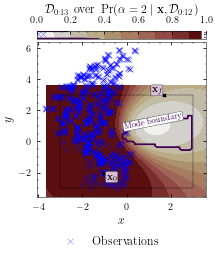

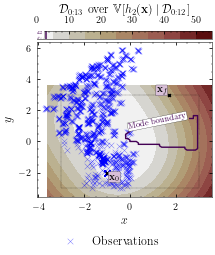

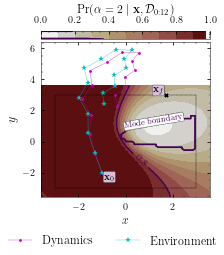

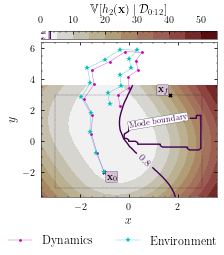

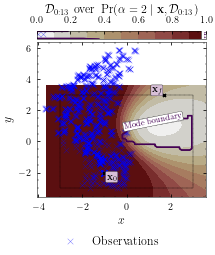

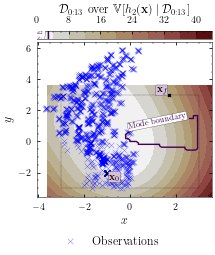

Optimisation result:
     fun: 130.75835991436185
     jac: array([-30.84825274,   8.48241821, -30.71338788,   8.51702585,
       -30.70905511,   8.70059018, -29.81492766,   8.74611925,
       -30.01290436,   9.07391717, -29.20825771,   8.91363462,
       -28.78979118,   9.30956331, -28.42544871,   9.01510065,
       -28.00498275,   9.03088742, -26.26675238,   9.11592305,
       -26.82988593,   9.2154322 , -15.54795466,   6.0971217 ,
       -16.1933701 ,   6.16889315,  -6.49002453,   2.19727831,
        -6.8158598 ,   2.21463994])
 message: 'Optimization terminated successfully'
    nfev: 70
     nit: 28
    njev: 28
  status: 0
 success: True
       x: array([-1.20217726,  6.5868385 , -0.84201481,  6.76043542,  0.06580402,
        6.52998312, -1.06769985,  6.03833821,  1.52190486,  5.55661593,
       -0.38047975,  5.34324818,  3.01808023,  3.64709251,  2.68028316,
        4.20285634,  2.87789046,  1.42023227, -1.29139411, -0.5778601 ,
        0.22031095, -0.85527519, -2.02789945, -0.1

2022-04-22 13:32:43.942839: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 13:32:43.942855: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


3/3 [==============================] - 2s 868ms/step - loss: -1052.7315 - val_loss: -926.7851


2022-04-22 13:32:45.118895: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 13:32:45.126479: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 13:32:45.132424: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_32_45

2022-04-22 13:32:45.136777: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_32_45/dr-robots-mbp.local.trace.json.gz
2022-04-22 13:32:45.152142: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_32_45

2022-04-22 13:32:45.152309: I tensorflow/core/profiler/rpc/client/s

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_14_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 21ms/step - loss: -1062.9404 - val_loss: -1001.3537
Epoch 3/20000
3/3 [==============================] - 0s 22ms/step - loss: -1078.1916 - val_loss: -1025.3984
Epoch 4/20000
3/3 [==============================] - 0s 23ms/step - loss: -1056.1701 - val_loss: -904.1568
Epoch 5/20000
3/3 [==============================] - 0s 22ms/step - loss: -1057.0811 - val_loss: -1012.1749
Epoch 6/20000
3/3 [==============================] - 0s 21ms/step - loss: -1090.8077 - val_loss: -1006.6596
Epoch 7/20000
3/3 [==============================] - 0s 21ms/step - loss: -1091.3758 - val_loss: -976.5333
Epoch 8/20000
3/3 [==============================] - 0s 22ms/step - loss: -1095.8585 - val_loss: -859.9835
Epoch 9/20000
3/3 [==============================] - 0s 22ms/step - loss: -1046.2445 - val_loss: -877.6854
Epoch 10/20000
3/3 [==============================] - 0s 22ms/step - loss: -1088.9828 - val_loss: -953.0797
Epoch 11/20000
3/3 [============

Epoch 76/20000
3/3 [==============================] - 0s 22ms/step - loss: -1077.1899 - val_loss: -1002.6902
Epoch 77/20000
3/3 [==============================] - 0s 23ms/step - loss: -1040.3371 - val_loss: -810.3995
Epoch 78/20000
3/3 [==============================] - 0s 22ms/step - loss: -999.4205 - val_loss: -943.9386
Epoch 79/20000
3/3 [==============================] - 0s 22ms/step - loss: -952.8908 - val_loss: -1009.5081
Epoch 80/20000
3/3 [==============================] - 0s 23ms/step - loss: -1073.3396 - val_loss: -1027.0679
Epoch 81/20000
3/3 [==============================] - 0s 21ms/step - loss: -1077.1566 - val_loss: -1001.0198
Epoch 82/20000
3/3 [==============================] - 0s 21ms/step - loss: -1083.2021 - val_loss: -986.0928
Epoch 83/20000
3/3 [==============================] - 0s 21ms/step - loss: -1101.9344 - val_loss: -968.3851
Epoch 84/20000
3/3 [==============================] - 0s 22ms/step - loss: -1075.9475 - val_loss: -954.1163
Epoch 85/20000
3/3 [======

3/3 [==============================] - 0s 25ms/step - loss: -952.1011 - val_loss: -968.1257
Epoch 152/20000
3/3 [==============================] - 0s 25ms/step - loss: -707.0739 - val_loss: -924.9023
Epoch 153/20000
3/3 [==============================] - 0s 26ms/step - loss: -860.5809 - val_loss: -951.2646
Epoch 154/20000
3/3 [==============================] - 0s 26ms/step - loss: -1005.6649 - val_loss: -776.0086
Epoch 155/20000
3/3 [==============================] - 0s 25ms/step - loss: -849.2453 - val_loss: -790.8192
Epoch 156/20000
3/3 [==============================] - 0s 25ms/step - loss: -1007.8376 - val_loss: -971.1791
Epoch 157/20000
3/3 [==============================] - 0s 26ms/step - loss: -785.5911 - val_loss: -631.8833
Epoch 158/20000
3/3 [==============================] - 0s 25ms/step - loss: -953.4184 - val_loss: -953.0036
Epoch 159/20000
3/3 [==============================] - 0s 26ms/step - loss: -806.6901 - val_loss: -902.3526
Epoch 160/20000
3/3 [=====================

3/3 [==============================] - 0s 25ms/step - loss: -953.3606 - val_loss: -892.9590
Epoch 227/20000
3/3 [==============================] - 0s 25ms/step - loss: -986.0186 - val_loss: -742.8049
Epoch 228/20000
3/3 [==============================] - 0s 25ms/step - loss: -1016.2697 - val_loss: -50.6188
Epoch 229/20000
3/3 [==============================] - 0s 25ms/step - loss: -750.9560 - val_loss: -808.0947
Epoch 230/20000
3/3 [==============================] - 0s 24ms/step - loss: -687.9161 - val_loss: -893.5166
Epoch 231/20000
3/3 [==============================] - 0s 25ms/step - loss: -901.8175 - val_loss: -425.0194
Epoch 232/20000
3/3 [==============================] - 0s 25ms/step - loss: -505.9081 - val_loss: -955.3555
Epoch 233/20000
3/3 [==============================] - 0s 26ms/step - loss: -977.7158 - val_loss: -973.5715
Epoch 234/20000
3/3 [==============================] - 0s 25ms/step - loss: -1012.6067 - val_loss: -390.2612
Epoch 235/20000
3/3 [======================

Epoch 302/20000
3/3 [==============================] - 0s 28ms/step - loss: -940.5666 - val_loss: -924.4588
Epoch 303/20000
3/3 [==============================] - 0s 27ms/step - loss: -926.4983 - val_loss: -884.3711
Epoch 304/20000
3/3 [==============================] - 0s 27ms/step - loss: -944.8316 - val_loss: -736.2465
Epoch 305/20000
3/3 [==============================] - 0s 27ms/step - loss: -841.2293 - val_loss: -975.1375
Epoch 306/20000
3/3 [==============================] - 0s 27ms/step - loss: -950.9907 - val_loss: -966.5098
Epoch 307/20000
3/3 [==============================] - 0s 28ms/step - loss: -914.4622 - val_loss: 66.8481
Epoch 308/20000
3/3 [==============================] - 0s 29ms/step - loss: -886.0632 - val_loss: 38.8445
Epoch 309/20000
3/3 [==============================] - 0s 27ms/step - loss: -932.4185 - val_loss: -106.3137
Epoch 310/20000
3/3 [==============================] - 0s 28ms/step - loss: -963.5049 - val_loss: -540.6543
Epoch 311/20000
3/3 [===========

3/3 [==============================] - 0s 26ms/step - loss: -857.9679 - val_loss: -1019.9822
Epoch 378/20000
3/3 [==============================] - 0s 26ms/step - loss: -948.3335 - val_loss: -922.5092
Epoch 379/20000
3/3 [==============================] - 0s 26ms/step - loss: -907.5406 - val_loss: -1014.4085
Epoch 380/20000
3/3 [==============================] - 0s 26ms/step - loss: -926.1344 - val_loss: -902.3879
Epoch 381/20000
3/3 [==============================] - 0s 26ms/step - loss: -832.0599 - val_loss: -927.4800
Epoch 382/20000
3/3 [==============================] - 0s 26ms/step - loss: -992.9610 - val_loss: -968.3357
Epoch 383/20000
3/3 [==============================] - 0s 28ms/step - loss: -336.4430 - val_loss: -934.8602
Epoch 384/20000
3/3 [==============================] - 0s 28ms/step - loss: -827.6662 - val_loss: 1150.9829
Epoch 385/20000
3/3 [==============================] - 0s 27ms/step - loss: -808.2190 - val_loss: 353.5342
Epoch 386/20000
3/3 [======================

3/3 [==============================] - 0s 36ms/step - loss: -661.7410 - val_loss: 671.0818
Epoch 453/20000
3/3 [==============================] - 0s 26ms/step - loss: -457.5516 - val_loss: -835.1111
Epoch 454/20000
3/3 [==============================] - 0s 26ms/step - loss: -718.1290 - val_loss: -322.3156
Epoch 455/20000
3/3 [==============================] - 0s 26ms/step - loss: -652.6829 - val_loss: -660.6015
Epoch 456/20000
3/3 [==============================] - 0s 26ms/step - loss: -751.0660 - val_loss: 44.4253
Epoch 457/20000
3/3 [==============================] - 0s 26ms/step - loss: -725.1574 - val_loss: -883.4078
Epoch 458/20000
3/3 [==============================] - 0s 26ms/step - loss: -674.7572 - val_loss: -766.0859
Epoch 459/20000
3/3 [==============================] - 0s 26ms/step - loss: -888.9867 - val_loss: -167.1353
Epoch 460/20000
3/3 [==============================] - 0s 26ms/step - loss: -939.9666 - val_loss: -338.3163
Epoch 461/20000
3/3 [==========================

3/3 [==============================] - 0s 26ms/step - loss: -1031.0006 - val_loss: -779.9850
Epoch 528/20000
3/3 [==============================] - 0s 26ms/step - loss: -1030.9575 - val_loss: -1000.8671
Epoch 529/20000
3/3 [==============================] - 0s 26ms/step - loss: -1024.7400 - val_loss: -984.1980
Epoch 530/20000
3/3 [==============================] - 0s 26ms/step - loss: -902.0194 - val_loss: -925.2168
Epoch 531/20000
3/3 [==============================] - 0s 26ms/step - loss: -940.2568 - val_loss: -914.7261
Epoch 532/20000
3/3 [==============================] - 0s 26ms/step - loss: -943.9307 - val_loss: -837.2320
Epoch 533/20000
3/3 [==============================] - 0s 26ms/step - loss: -923.8183 - val_loss: -981.9508
Epoch 534/20000
3/3 [==============================] - 0s 26ms/step - loss: -933.9943 - val_loss: -967.2511
Epoch 535/20000
3/3 [==============================] - 0s 26ms/step - loss: -992.0880 - val_loss: -820.4342
Epoch 536/20000
3/3 [===================

Epoch 603/20000
3/3 [==============================] - 0s 26ms/step - loss: -920.5367 - val_loss: -982.6298
Epoch 604/20000
3/3 [==============================] - 0s 26ms/step - loss: -1011.6130 - val_loss: -901.7853
Epoch 605/20000
3/3 [==============================] - 0s 25ms/step - loss: -991.9630 - val_loss: -922.2963
Epoch 606/20000
3/3 [==============================] - 0s 26ms/step - loss: -1020.7623 - val_loss: -925.7984
Epoch 607/20000
3/3 [==============================] - 0s 27ms/step - loss: -1014.4529 - val_loss: -870.5294
Epoch 608/20000
3/3 [==============================] - 0s 25ms/step - loss: -1031.5348 - val_loss: -990.1364
Epoch 609/20000
3/3 [==============================] - 0s 25ms/step - loss: -998.3671 - val_loss: -972.7288
Epoch 610/20000
3/3 [==============================] - 0s 26ms/step - loss: -1030.8105 - val_loss: -998.3955
Epoch 611/20000
3/3 [==============================] - 0s 27ms/step - loss: -1044.8576 - val_loss: -995.3100
Epoch 612/20000
3/3 [=

3/3 [==============================] - 0s 28ms/step - loss: -1026.3962 - val_loss: -937.5226
Epoch 679/20000
3/3 [==============================] - 0s 29ms/step - loss: -1019.1751 - val_loss: -982.4917
Epoch 680/20000
3/3 [==============================] - 0s 30ms/step - loss: -1077.6378 - val_loss: -985.1834
Epoch 681/20000
3/3 [==============================] - 0s 29ms/step - loss: -1046.2712 - val_loss: -915.2386
Epoch 682/20000
3/3 [==============================] - 0s 28ms/step - loss: -974.5802 - val_loss: -964.6226
Epoch 683/20000
3/3 [==============================] - 0s 29ms/step - loss: -1045.6947 - val_loss: -937.7453
Epoch 684/20000
3/3 [==============================] - 0s 29ms/step - loss: -1039.8997 - val_loss: -944.9695
Epoch 685/20000
3/3 [==============================] - 0s 28ms/step - loss: -1075.3912 - val_loss: -850.2273
Epoch 686/20000
3/3 [==============================] - 0s 28ms/step - loss: -1034.6581 - val_loss: -927.2035
Epoch 687/20000
3/3 [===============

3/3 [==============================] - 0s 27ms/step - loss: -813.9246 - val_loss: -605.7949
Epoch 754/20000
3/3 [==============================] - 0s 27ms/step - loss: -485.6564 - val_loss: -790.4707
Epoch 755/20000
3/3 [==============================] - 0s 27ms/step - loss: -764.7507 - val_loss: -893.6803
Epoch 756/20000
3/3 [==============================] - 0s 27ms/step - loss: -508.0063 - val_loss: -294.2200
Epoch 757/20000
3/3 [==============================] - 0s 27ms/step - loss: -865.4590 - val_loss: -893.8170
Epoch 758/20000
3/3 [==============================] - 0s 27ms/step - loss: -904.3838 - val_loss: -930.7663
Epoch 759/20000
3/3 [==============================] - 0s 27ms/step - loss: -902.7065 - val_loss: -1007.0263
Epoch 760/20000
3/3 [==============================] - 0s 27ms/step - loss: -1021.0964 - val_loss: -991.9132
Epoch 761/20000
3/3 [==============================] - 0s 27ms/step - loss: -929.1929 - val_loss: -953.0630
Epoch 762/20000
3/3 [=====================

3/3 [==============================] - 0s 28ms/step - loss: -1066.1040 - val_loss: -432.2939
Epoch 829/20000
3/3 [==============================] - 0s 29ms/step - loss: -974.6389 - val_loss: -1002.5294
Epoch 830/20000
3/3 [==============================] - 0s 29ms/step - loss: -1089.3937 - val_loss: -1009.6685
Epoch 831/20000
3/3 [==============================] - 0s 28ms/step - loss: -1067.5738 - val_loss: -1032.3704
Epoch 832/20000
3/3 [==============================] - 0s 28ms/step - loss: -1061.1727 - val_loss: -1033.6626
Epoch 833/20000
3/3 [==============================] - 0s 28ms/step - loss: -1022.0112 - val_loss: -1040.9220
Epoch 834/20000
3/3 [==============================] - 0s 28ms/step - loss: -1031.8892 - val_loss: -1029.6155
Epoch 835/20000
3/3 [==============================] - 0s 28ms/step - loss: -1027.3132 - val_loss: -1040.0070
Epoch 836/20000
3/3 [==============================] - 0s 29ms/step - loss: -1036.7322 - val_loss: -955.5118
Epoch 837/20000
3/3 [========

3/3 [==============================] - 0s 29ms/step - loss: -807.9470 - val_loss: 344.5779
Epoch 904/20000
3/3 [==============================] - 0s 29ms/step - loss: -488.4166 - val_loss: -762.6043
Epoch 905/20000
3/3 [==============================] - 0s 29ms/step - loss: -959.2686 - val_loss: -786.3357
Epoch 906/20000
3/3 [==============================] - 0s 29ms/step - loss: -961.0331 - val_loss: -921.3921
Epoch 907/20000
3/3 [==============================] - 0s 30ms/step - loss: -973.7700 - val_loss: -879.4651
Epoch 908/20000
3/3 [==============================] - 0s 29ms/step - loss: -974.9827 - val_loss: -949.2936
Epoch 909/20000
3/3 [==============================] - 0s 32ms/step - loss: -982.6876 - val_loss: -911.6514
Epoch 910/20000
3/3 [==============================] - 0s 32ms/step - loss: -973.1789 - val_loss: -775.3040
Epoch 911/20000
3/3 [==============================] - 0s 31ms/step - loss: -958.4868 - val_loss: -849.2741
Epoch 912/20000
3/3 [========================

3/3 [==============================] - 0s 30ms/step - loss: -1062.4673 - val_loss: -898.6973
Epoch 979/20000
3/3 [==============================] - 0s 29ms/step - loss: -1083.4656 - val_loss: -765.5797
Epoch 980/20000
3/3 [==============================] - 0s 30ms/step - loss: -1034.3374 - val_loss: -857.1499
Epoch 981/20000
3/3 [==============================] - 0s 29ms/step - loss: -1090.3533 - val_loss: -675.5997
Epoch 982/20000
3/3 [==============================] - 0s 30ms/step - loss: -977.5671 - val_loss: -1032.4323
Epoch 983/20000
3/3 [==============================] - 0s 30ms/step - loss: -1049.2658 - val_loss: -966.9750
Epoch 984/20000
3/3 [==============================] - 0s 32ms/step - loss: -968.8863 - val_loss: -1024.1301
Epoch 985/20000
3/3 [==============================] - 0s 31ms/step - loss: -1027.1810 - val_loss: -1009.8833
Epoch 986/20000
3/3 [==============================] - 0s 30ms/step - loss: -1107.0139 - val_loss: -1014.1369
Epoch 987/20000
3/3 [============

3/3 [==============================] - 0s 30ms/step - loss: -1032.9546 - val_loss: -1020.9355
Epoch 1053/20000
3/3 [==============================] - 0s 29ms/step - loss: -1063.4479 - val_loss: -714.4238
Epoch 1054/20000
3/3 [==============================] - 0s 29ms/step - loss: -1083.9229 - val_loss: -1050.4960
Epoch 1055/20000
3/3 [==============================] - 0s 30ms/step - loss: -856.6609 - val_loss: -932.3054
Epoch 1056/20000
3/3 [==============================] - 0s 29ms/step - loss: -1006.7123 - val_loss: -965.4320
Epoch 1057/20000
3/3 [==============================] - 0s 29ms/step - loss: -1052.7280 - val_loss: -638.6940
Epoch 1058/20000
3/3 [==============================] - 0s 29ms/step - loss: -771.5859 - val_loss: -928.9897
Epoch 1059/20000
3/3 [==============================] - 0s 29ms/step - loss: -1007.2675 - val_loss: -924.3498
Epoch 1060/20000
3/3 [==============================] - 0s 29ms/step - loss: -1059.1843 - val_loss: -961.7028
Epoch 1061/20000
3/3 [=====

3/3 [==============================] - 0s 27ms/step - loss: -1067.6732 - val_loss: -1036.7944
Epoch 1127/20000
3/3 [==============================] - 0s 27ms/step - loss: -1105.2641 - val_loss: -1005.1774
Epoch 1128/20000
3/3 [==============================] - 0s 28ms/step - loss: -1091.5086 - val_loss: -1003.8819
Epoch 1129/20000
3/3 [==============================] - 0s 28ms/step - loss: -1082.1562 - val_loss: -1032.1548
Epoch 1130/20000
3/3 [==============================] - 0s 26ms/step - loss: -1100.7713 - val_loss: -1023.1294
Epoch 1131/20000
3/3 [==============================] - 0s 27ms/step - loss: -1055.6525 - val_loss: -976.1197
Epoch 1132/20000
3/3 [==============================] - 0s 27ms/step - loss: -1071.5884 - val_loss: -882.9607
Epoch 1133/20000
3/3 [==============================] - 0s 27ms/step - loss: -820.3049 - val_loss: -1016.1941
Epoch 1134/20000
3/3 [==============================] - 0s 29ms/step - loss: -1024.5468 - val_loss: -1025.0592
Epoch 1135/20000
3/3 

Epoch 1201/20000
3/3 [==============================] - 0s 27ms/step - loss: -1007.3236 - val_loss: -978.4301
Epoch 1202/20000
3/3 [==============================] - 0s 26ms/step - loss: -1040.4863 - val_loss: -952.0551
Epoch 1203/20000
3/3 [==============================] - 0s 26ms/step - loss: -1047.3848 - val_loss: -993.0393
Epoch 1204/20000
3/3 [==============================] - 0s 26ms/step - loss: -1055.1191 - val_loss: -960.2041
Epoch 1205/20000
3/3 [==============================] - 0s 26ms/step - loss: -1066.9896 - val_loss: -982.0477
Epoch 1206/20000
3/3 [==============================] - 0s 29ms/step - loss: -1058.1423 - val_loss: -1013.3391
Epoch 1207/20000
3/3 [==============================] - 0s 29ms/step - loss: -1066.1088 - val_loss: -971.7539
Epoch 1208/20000
3/3 [==============================] - 0s 28ms/step - loss: -1083.2037 - val_loss: -1013.8961
Epoch 1209/20000
3/3 [==============================] - 0s 28ms/step - loss: -1086.8290 - val_loss: -961.1534
Epoch 12

3/3 [==============================] - 0s 26ms/step - loss: -1095.8248 - val_loss: -1042.4859
Epoch 1276/20000
3/3 [==============================] - 0s 26ms/step - loss: -1102.5968 - val_loss: -1018.7109
Epoch 1277/20000
3/3 [==============================] - 0s 26ms/step - loss: -1077.4929 - val_loss: -978.9077
Epoch 1278/20000
3/3 [==============================] - 0s 26ms/step - loss: -1075.7636 - val_loss: -935.9448
Epoch 1279/20000
3/3 [==============================] - 0s 26ms/step - loss: -1090.4285 - val_loss: -860.6877
Epoch 1280/20000
3/3 [==============================] - 0s 26ms/step - loss: -880.4226 - val_loss: -987.6468
Epoch 1281/20000
3/3 [==============================] - 0s 26ms/step - loss: -1093.0879 - val_loss: -958.9150
Epoch 1282/20000
3/3 [==============================] - 0s 26ms/step - loss: -790.3359 - val_loss: -963.4504
Epoch 1283/20000
3/3 [==============================] - 0s 27ms/step - loss: -975.8853 - val_loss: -885.0469
Epoch 1284/20000
3/3 [======

3/3 [==============================] - 0s 26ms/step - loss: -1027.2487 - val_loss: -805.0380
Epoch 1350/20000
3/3 [==============================] - 0s 26ms/step - loss: -978.4631 - val_loss: -964.5213
Epoch 1351/20000
3/3 [==============================] - 0s 29ms/step - loss: -922.7202 - val_loss: -932.2331
Epoch 1352/20000
3/3 [==============================] - 0s 31ms/step - loss: -1042.9392 - val_loss: -845.6704
Epoch 1353/20000
3/3 [==============================] - 0s 28ms/step - loss: -999.6195 - val_loss: -999.1053
Epoch 1354/20000
3/3 [==============================] - 0s 27ms/step - loss: -1046.1810 - val_loss: -928.2460
Epoch 1355/20000
3/3 [==============================] - 0s 28ms/step - loss: -892.3678 - val_loss: -847.2637
Epoch 1356/20000
3/3 [==============================] - 0s 28ms/step - loss: -888.4079 - val_loss: -753.4754
Epoch 1357/20000
3/3 [==============================] - 0s 28ms/step - loss: -1040.3004 - val_loss: -872.8998
Epoch 1358/20000
3/3 [==========

3/3 [==============================] - 0s 29ms/step - loss: -1055.1108 - val_loss: -994.2464
Epoch 1424/20000
3/3 [==============================] - 0s 27ms/step - loss: -1048.1279 - val_loss: -741.7779
Epoch 1425/20000
3/3 [==============================] - 0s 27ms/step - loss: -935.8804 - val_loss: -872.4404
Epoch 1426/20000
3/3 [==============================] - 0s 27ms/step - loss: -940.6297 - val_loss: -745.8906
Epoch 1427/20000
3/3 [==============================] - 0s 27ms/step - loss: -1074.1077 - val_loss: -799.3603
Epoch 1428/20000
3/3 [==============================] - 0s 28ms/step - loss: -1076.5892 - val_loss: -99.5133
Epoch 1429/20000
3/3 [==============================] - 0s 27ms/step - loss: -1052.3138 - val_loss: -892.1553
Epoch 1430/20000
3/3 [==============================] - 0s 27ms/step - loss: -940.8427 - val_loss: -810.7364
Epoch 1431/20000
3/3 [==============================] - 0s 27ms/step - loss: -902.7489 - val_loss: -1001.0189
Epoch 1432/20000
3/3 [=========

3/3 [==============================] - 0s 27ms/step - loss: -1115.1044 - val_loss: -978.6353
Epoch 1498/20000
3/3 [==============================] - 0s 26ms/step - loss: -1085.1939 - val_loss: -1034.8024
Epoch 1499/20000
3/3 [==============================] - 0s 27ms/step - loss: -1126.7146 - val_loss: -1048.3822
Epoch 1500/20000
3/3 [==============================] - 0s 26ms/step - loss: -1051.9407 - val_loss: -974.9541
Epoch 1501/20000
3/3 [==============================] - 0s 26ms/step - loss: -1086.8115 - val_loss: -941.3109
Epoch 1502/20000
3/3 [==============================] - 0s 26ms/step - loss: -1074.1953 - val_loss: -995.5955
Epoch 1503/20000
3/3 [==============================] - 0s 27ms/step - loss: -1080.2621 - val_loss: -1028.3149
Epoch 1504/20000
3/3 [==============================] - 0s 27ms/step - loss: -1059.1114 - val_loss: -968.6128
Epoch 1505/20000
3/3 [==============================] - 0s 27ms/step - loss: -1070.6831 - val_loss: -716.3549
Epoch 1506/20000
3/3 [==

3/3 [==============================] - 0s 26ms/step - loss: 420.2867 - val_loss: 2063.3468
Epoch 1573/20000
3/3 [==============================] - 0s 26ms/step - loss: 1167.4064 - val_loss: 1993.6339
Epoch 1574/20000
3/3 [==============================] - 0s 26ms/step - loss: 1051.9876 - val_loss: 1694.6855
Epoch 1575/20000
3/3 [==============================] - 0s 26ms/step - loss: 517.5645 - val_loss: -452.6113
Epoch 1576/20000
3/3 [==============================] - 0s 27ms/step - loss: 570.3118 - val_loss: 6.9566
Epoch 1577/20000
3/3 [==============================] - 0s 26ms/step - loss: -332.5082 - val_loss: -285.5066
Epoch 1578/20000
3/3 [==============================] - 0s 26ms/step - loss: -452.5784 - val_loss: 85.4168
Epoch 1579/20000
3/3 [==============================] - 0s 26ms/step - loss: -561.8888 - val_loss: -692.9042
Epoch 1580/20000
3/3 [==============================] - 0s 27ms/step - loss: -684.3000 - val_loss: -759.3960
Epoch 1581/20000
3/3 [======================

Epoch 1647/20000
3/3 [==============================] - 0s 26ms/step - loss: -1004.4819 - val_loss: -1021.8399
Epoch 1648/20000
3/3 [==============================] - 0s 26ms/step - loss: -1010.6881 - val_loss: -864.2104
Epoch 1649/20000
3/3 [==============================] - 0s 26ms/step - loss: -931.9335 - val_loss: -912.0023
Epoch 1650/20000
3/3 [==============================] - 0s 26ms/step - loss: -1002.1150 - val_loss: -961.8245
Epoch 1651/20000
3/3 [==============================] - 0s 26ms/step - loss: -999.1216 - val_loss: -914.6580
Epoch 1652/20000
3/3 [==============================] - 0s 25ms/step - loss: -992.4388 - val_loss: -971.3506
Epoch 1653/20000
3/3 [==============================] - 0s 26ms/step - loss: -1009.3892 - val_loss: -985.4016
Epoch 1654/20000
3/3 [==============================] - 0s 26ms/step - loss: -980.3192 - val_loss: -965.2147
Epoch 1655/20000
3/3 [==============================] - 0s 26ms/step - loss: -1049.5398 - val_loss: -948.7085
Epoch 1656/20

3/3 [==============================] - 0s 27ms/step - loss: -1026.3252 - val_loss: -883.6503
Epoch 1722/20000
3/3 [==============================] - 0s 27ms/step - loss: -993.8482 - val_loss: -750.8995
Epoch 1723/20000
3/3 [==============================] - 0s 26ms/step - loss: -901.7737 - val_loss: -1037.4772
Epoch 1724/20000
3/3 [==============================] - 0s 26ms/step - loss: -1048.4855 - val_loss: -985.6381
Epoch 1725/20000
3/3 [==============================] - 0s 27ms/step - loss: -922.7453 - val_loss: -1028.4311
Epoch 1726/20000
3/3 [==============================] - 0s 27ms/step - loss: -892.5655 - val_loss: -934.9327
Epoch 1727/20000
3/3 [==============================] - 0s 26ms/step - loss: -981.9056 - val_loss: -1023.3874
Epoch 1728/20000
3/3 [==============================] - 0s 27ms/step - loss: -1036.1227 - val_loss: -1015.7728
Epoch 1729/20000
3/3 [==============================] - 0s 27ms/step - loss: -1071.7037 - val_loss: -1031.3016
Epoch 1730/20000
3/3 [=====

3/3 [==============================] - 0s 28ms/step - loss: -1092.6440 - val_loss: -1042.0508
Epoch 1796/20000
3/3 [==============================] - 0s 27ms/step - loss: -1095.7810 - val_loss: -1017.8106
Epoch 1797/20000
3/3 [==============================] - 0s 28ms/step - loss: -1086.6795 - val_loss: -1004.4709
Epoch 1798/20000
3/3 [==============================] - 0s 29ms/step - loss: -1088.6708 - val_loss: -923.6030
Epoch 1799/20000
3/3 [==============================] - 0s 26ms/step - loss: -1084.8834 - val_loss: -1007.8288
Epoch 1800/20000
3/3 [==============================] - 0s 27ms/step - loss: -1094.4985 - val_loss: -1038.7514
Epoch 1801/20000
3/3 [==============================] - 0s 26ms/step - loss: -1078.3213 - val_loss: -1053.5887
Epoch 1802/20000
3/3 [==============================] - 0s 26ms/step - loss: -1113.7670 - val_loss: -867.6437
Epoch 1803/20000
3/3 [==============================] - 0s 26ms/step - loss: -1048.8538 - val_loss: -1043.4941
Epoch 1804/20000
3/3

3/3 [==============================] - 0s 25ms/step - loss: -954.2753 - val_loss: -991.1124
Epoch 1870/20000
3/3 [==============================] - 0s 26ms/step - loss: -943.9930 - val_loss: -1038.2573
Epoch 1871/20000
3/3 [==============================] - 0s 26ms/step - loss: -1004.9140 - val_loss: -1052.1607
Epoch 1872/20000
3/3 [==============================] - 0s 26ms/step - loss: -1030.2810 - val_loss: -1004.4114
Epoch 1873/20000
3/3 [==============================] - 0s 27ms/step - loss: -1116.6343 - val_loss: -987.2296
Epoch 1874/20000
3/3 [==============================] - 0s 25ms/step - loss: -1059.7953 - val_loss: -1048.9858
Epoch 1875/20000
3/3 [==============================] - 0s 25ms/step - loss: -1074.8959 - val_loss: -1058.8309
Epoch 1876/20000
3/3 [==============================] - 0s 25ms/step - loss: -1102.0382 - val_loss: -1013.8905
Epoch 1877/20000
3/3 [==============================] - 0s 25ms/step - loss: -1044.1936 - val_loss: -1022.9374
Epoch 1878/20000
3/3 [

3/3 [==============================] - 0s 29ms/step - loss: -1128.7456 - val_loss: -1000.5731
Epoch 1944/20000
3/3 [==============================] - 0s 26ms/step - loss: -1071.8204 - val_loss: -1077.0250
Epoch 1945/20000
3/3 [==============================] - 0s 25ms/step - loss: -1096.3723 - val_loss: -1052.7377
Epoch 1946/20000
3/3 [==============================] - 0s 25ms/step - loss: -1091.8018 - val_loss: -1023.2821
Epoch 1947/20000
3/3 [==============================] - 0s 25ms/step - loss: -1132.5223 - val_loss: -1032.4784
Epoch 1948/20000
3/3 [==============================] - 0s 25ms/step - loss: -1097.3186 - val_loss: -1072.4465
Epoch 1949/20000
3/3 [==============================] - 0s 25ms/step - loss: -1107.5703 - val_loss: -1039.3230
Epoch 1950/20000
3/3 [==============================] - 0s 25ms/step - loss: -1126.4360 - val_loss: -1073.8257
Epoch 1951/20000
3/3 [==============================] - 0s 25ms/step - loss: -1058.2788 - val_loss: -981.3846
Epoch 1952/20000
3/

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_14_epoch_2000/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2002/20000
3/3 [==============================] - 0s 22ms/step - loss: -1078.8946 - val_loss: -1000.2873
Epoch 2003/20000
3/3 [==============================] - 0s 22ms/step - loss: -1049.8351 - val_loss: -974.9599
Epoch 2004/20000
3/3 [==============================] - 0s 22ms/step - loss: -1066.3227 - val_loss: -976.0536
Epoch 2005/20000
3/3 [==============================] - 0s 22ms/step - loss: -1043.0342 - val_loss: -951.0546
Epoch 2006/20000
3/3 [==============================] - 0s 21ms/step - loss: -971.5803 - val_loss: -943.5973
Epoch 2007/20000
3/3 [==============================] - 0s 22ms/step - loss: -977.9815 - val_loss: -804.3052
Epoch 2008/20000
3/3 [==============================] - 0s 21ms/step - loss: -992.5299 - val_loss: -843.3423
Epoch 2009/20000
3/3 [==============================] - 0s 22ms/step - loss: -964.5711 - val_loss: -795.1622
Epoch 2010/20000
3/3 [==============================] - 0s 22ms/step - loss: -519.2272 - val_loss: -1037.6374
Epoch 2011/20

3/3 [==============================] - 0s 23ms/step - loss: -1071.1721 - val_loss: -977.4878
Epoch 2077/20000
3/3 [==============================] - 0s 23ms/step - loss: 68.3359 - val_loss: -372.9535
Epoch 2078/20000
3/3 [==============================] - 0s 23ms/step - loss: -441.9194 - val_loss: -843.4148
Epoch 2079/20000
3/3 [==============================] - 0s 24ms/step - loss: -686.0674 - val_loss: -68.2725
Epoch 2080/20000
3/3 [==============================] - 0s 24ms/step - loss: -899.5062 - val_loss: -993.4969
Epoch 2081/20000
3/3 [==============================] - 0s 23ms/step - loss: -875.2861 - val_loss: -960.8136
Epoch 2082/20000
3/3 [==============================] - 0s 24ms/step - loss: -869.8926 - val_loss: -831.7692
Epoch 2083/20000
3/3 [==============================] - 0s 23ms/step - loss: -797.3537 - val_loss: -387.3988
Epoch 2084/20000
3/3 [==============================] - 0s 23ms/step - loss: -677.0000 - val_loss: -489.0768
Epoch 2085/20000
3/3 [================

3/3 [==============================] - 0s 27ms/step - loss: -756.8543 - val_loss: -764.2930
Epoch 2152/20000
3/3 [==============================] - 0s 26ms/step - loss: -805.0970 - val_loss: -816.5174
Epoch 2153/20000
3/3 [==============================] - 0s 26ms/step - loss: -868.5607 - val_loss: -747.2459
Epoch 2154/20000
3/3 [==============================] - 0s 26ms/step - loss: -857.8862 - val_loss: -855.0102
Epoch 2155/20000
3/3 [==============================] - 0s 26ms/step - loss: -835.7485 - val_loss: -732.7241
Epoch 2156/20000
3/3 [==============================] - 0s 26ms/step - loss: -896.1317 - val_loss: -799.4162
Epoch 2157/20000
3/3 [==============================] - 0s 25ms/step - loss: -885.2953 - val_loss: -878.3713
Epoch 2158/20000
3/3 [==============================] - 0s 25ms/step - loss: -919.5004 - val_loss: -890.7738
Epoch 2159/20000
3/3 [==============================] - 0s 25ms/step - loss: -926.2553 - val_loss: -892.8210
Epoch 2160/20000
3/3 [==============

3/3 [==============================] - 0s 26ms/step - loss: -1014.5001 - val_loss: -931.3749
Epoch 2226/20000
3/3 [==============================] - 0s 26ms/step - loss: -966.2492 - val_loss: -1044.3482
Epoch 2227/20000
3/3 [==============================] - 0s 26ms/step - loss: -1022.0441 - val_loss: -991.9703
Epoch 2228/20000
3/3 [==============================] - 0s 26ms/step - loss: -1011.2762 - val_loss: -970.0510
Epoch 2229/20000
3/3 [==============================] - 0s 26ms/step - loss: -1039.0822 - val_loss: -919.2640
Epoch 2230/20000
3/3 [==============================] - 0s 26ms/step - loss: -1002.3475 - val_loss: -941.3230
Epoch 2231/20000
3/3 [==============================] - 0s 26ms/step - loss: -1048.8561 - val_loss: -917.5360
Epoch 2232/20000
3/3 [==============================] - 0s 26ms/step - loss: -1042.7060 - val_loss: -1003.1030
Epoch 2233/20000
3/3 [==============================] - 0s 27ms/step - loss: -1052.3596 - val_loss: -960.6209
Epoch 2234/20000
3/3 [====

3/3 [==============================] - 0s 26ms/step - loss: -1046.1073 - val_loss: -990.2014
Epoch 2300/20000
3/3 [==============================] - 0s 26ms/step - loss: -1051.4944 - val_loss: -999.0235
Epoch 2301/20000
3/3 [==============================] - 0s 26ms/step - loss: -1062.8494 - val_loss: -1016.5918
Epoch 2302/20000
3/3 [==============================] - 0s 26ms/step - loss: -1064.1251 - val_loss: -1009.4048
Epoch 2303/20000
3/3 [==============================] - 0s 26ms/step - loss: -1073.7498 - val_loss: -996.2656
Epoch 2304/20000
3/3 [==============================] - 0s 27ms/step - loss: -1061.5645 - val_loss: -1027.8075
Epoch 2305/20000
3/3 [==============================] - 0s 26ms/step - loss: -1077.3880 - val_loss: -992.2072
Epoch 2306/20000
3/3 [==============================] - 0s 26ms/step - loss: -1083.1925 - val_loss: -1021.3259
Epoch 2307/20000
3/3 [==============================] - 0s 26ms/step - loss: -1085.6745 - val_loss: -1008.4965
Epoch 2308/20000
3/3 [

3/3 [==============================] - 0s 27ms/step - loss: -1106.9765 - val_loss: -898.0960
Epoch 2374/20000
3/3 [==============================] - 0s 26ms/step - loss: -1066.4750 - val_loss: -1058.6896
Epoch 2375/20000
3/3 [==============================] - 0s 29ms/step - loss: -1107.7378 - val_loss: -1013.8235
Epoch 2376/20000
3/3 [==============================] - 0s 27ms/step - loss: -1109.5239 - val_loss: -837.1369
Epoch 2377/20000
3/3 [==============================] - 0s 27ms/step - loss: -1134.1474 - val_loss: -986.2587
Epoch 2378/20000
3/3 [==============================] - 0s 28ms/step - loss: -1068.9691 - val_loss: -1012.0153
Epoch 2379/20000
3/3 [==============================] - 0s 26ms/step - loss: -1132.0030 - val_loss: -1054.0322
Epoch 2380/20000
3/3 [==============================] - 0s 27ms/step - loss: -1104.1231 - val_loss: -1009.0969
Epoch 2381/20000
3/3 [==============================] - 0s 29ms/step - loss: -1099.5395 - val_loss: -1060.0607
Epoch 2382/20000
3/3 

3/3 [==============================] - 0s 27ms/step - loss: -1104.3688 - val_loss: -999.9197
Epoch 2448/20000
3/3 [==============================] - 0s 26ms/step - loss: -1118.0993 - val_loss: -1021.2823
Epoch 2449/20000
3/3 [==============================] - 0s 26ms/step - loss: -1127.2079 - val_loss: -950.5987
Epoch 2450/20000
3/3 [==============================] - 0s 26ms/step - loss: -1129.9461 - val_loss: -1031.6673
Epoch 2451/20000
3/3 [==============================] - 0s 26ms/step - loss: -1076.9914 - val_loss: -1001.7841
Epoch 2452/20000
3/3 [==============================] - 0s 27ms/step - loss: -1139.2650 - val_loss: -1074.7787
Epoch 2453/20000
3/3 [==============================] - 0s 26ms/step - loss: -1095.4368 - val_loss: -1051.4973
Epoch 2454/20000
3/3 [==============================] - 0s 26ms/step - loss: -1104.2572 - val_loss: -1045.9069
Epoch 2455/20000
3/3 [==============================] - 0s 25ms/step - loss: -1117.3001 - val_loss: -872.9661
Epoch 2456/20000
3/3 

Epoch 2522/20000
3/3 [==============================] - 0s 27ms/step - loss: -999.4201 - val_loss: -943.7281
Epoch 2523/20000
3/3 [==============================] - 0s 26ms/step - loss: -1021.1065 - val_loss: -955.3004
Epoch 2524/20000
3/3 [==============================] - 0s 27ms/step - loss: -1029.6620 - val_loss: -967.8625
Epoch 2525/20000
3/3 [==============================] - 0s 28ms/step - loss: -1016.1659 - val_loss: -908.0468
Epoch 2526/20000
3/3 [==============================] - 0s 27ms/step - loss: -1037.1626 - val_loss: -831.6794
Epoch 2527/20000
3/3 [==============================] - 0s 27ms/step - loss: -981.7426 - val_loss: -990.3638
Epoch 2528/20000
3/3 [==============================] - 0s 26ms/step - loss: -1049.5262 - val_loss: -968.5693
Epoch 2529/20000
3/3 [==============================] - 0s 28ms/step - loss: -1040.9009 - val_loss: -993.3176
Epoch 2530/20000
3/3 [==============================] - 0s 27ms/step - loss: -1023.1440 - val_loss: -984.5621
Epoch 2531/2

3/3 [==============================] - 0s 26ms/step - loss: -1112.9387 - val_loss: -1033.6828
Epoch 2597/20000
3/3 [==============================] - 0s 26ms/step - loss: -1139.5961 - val_loss: -1073.8176
Epoch 2598/20000
3/3 [==============================] - 0s 27ms/step - loss: -1135.9339 - val_loss: -1046.4115
Epoch 2599/20000
3/3 [==============================] - 0s 26ms/step - loss: -1124.6055 - val_loss: -1006.7759
Epoch 2600/20000
3/3 [==============================] - 0s 25ms/step - loss: -1118.1666 - val_loss: -1076.5955
Epoch 2601/20000
3/3 [==============================] - 0s 26ms/step - loss: -1125.9477 - val_loss: -1055.8671
Epoch 2602/20000
3/3 [==============================] - 0s 26ms/step - loss: -1109.2221 - val_loss: -1007.1030
Epoch 2603/20000
3/3 [==============================] - 0s 26ms/step - loss: -1120.6742 - val_loss: -1040.7832
Epoch 2604/20000
3/3 [==============================] - 0s 26ms/step - loss: -1126.1955 - val_loss: -772.2080
Epoch 2605/20000
3/

Epoch 2671/20000
3/3 [==============================] - 0s 27ms/step - loss: -1001.1367 - val_loss: -841.3536
Epoch 2672/20000
3/3 [==============================] - 0s 27ms/step - loss: -892.7439 - val_loss: -735.3722
Epoch 2673/20000
3/3 [==============================] - 0s 26ms/step - loss: -1013.0708 - val_loss: -908.9270
Epoch 2674/20000
3/3 [==============================] - 0s 26ms/step - loss: -910.4447 - val_loss: -852.6127
Epoch 2675/20000
3/3 [==============================] - 0s 26ms/step - loss: -1007.4880 - val_loss: -844.3096
Epoch 2676/20000
3/3 [==============================] - 0s 26ms/step - loss: -1019.0586 - val_loss: -807.1248
Epoch 2677/20000
3/3 [==============================] - 0s 26ms/step - loss: -1021.2863 - val_loss: -825.7344
Epoch 2678/20000
3/3 [==============================] - 0s 26ms/step - loss: -1029.1172 - val_loss: -927.5219
Epoch 2679/20000
3/3 [==============================] - 0s 26ms/step - loss: -953.2326 - val_loss: -796.3660
Epoch 2680/20

Epoch 2746/20000
3/3 [==============================] - 0s 26ms/step - loss: -1022.3403 - val_loss: -947.2329
Epoch 2747/20000
3/3 [==============================] - 0s 27ms/step - loss: -1035.5044 - val_loss: -882.5273
Epoch 2748/20000
3/3 [==============================] - 0s 27ms/step - loss: -1047.7207 - val_loss: -909.7033
Epoch 2749/20000
3/3 [==============================] - 0s 26ms/step - loss: -1049.1795 - val_loss: -937.5800
Epoch 2750/20000
3/3 [==============================] - 0s 25ms/step - loss: -1052.3893 - val_loss: -917.9575
Epoch 2751/20000
3/3 [==============================] - 0s 26ms/step - loss: -1040.0248 - val_loss: -951.7718
Epoch 2752/20000
3/3 [==============================] - 0s 26ms/step - loss: -1052.8550 - val_loss: -944.3087
Epoch 2753/20000
3/3 [==============================] - 0s 28ms/step - loss: -1061.9886 - val_loss: -968.6079
Epoch 2754/20000
3/3 [==============================] - 0s 28ms/step - loss: -1041.6431 - val_loss: -968.0124
Epoch 2755

3/3 [==============================] - 0s 28ms/step - loss: -924.9644 - val_loss: -903.3082
Epoch 2821/20000
3/3 [==============================] - 0s 28ms/step - loss: -992.6311 - val_loss: -896.5633
Epoch 2822/20000
3/3 [==============================] - 0s 28ms/step - loss: -1010.8123 - val_loss: -839.5687
Epoch 2823/20000
3/3 [==============================] - 0s 29ms/step - loss: -1047.6443 - val_loss: -905.1483
Epoch 2824/20000
3/3 [==============================] - 0s 29ms/step - loss: -945.2343 - val_loss: -934.6763
Epoch 2825/20000
3/3 [==============================] - 0s 27ms/step - loss: -937.6274 - val_loss: -958.6864
Epoch 2826/20000
3/3 [==============================] - 0s 29ms/step - loss: -1030.7532 - val_loss: -946.0174
Epoch 2827/20000
3/3 [==============================] - 0s 28ms/step - loss: -1035.3387 - val_loss: -953.0763
Epoch 2828/20000
3/3 [==============================] - 0s 27ms/step - loss: -1037.9610 - val_loss: -879.7357
Epoch 2829/20000
3/3 [=========

Epoch 2896/20000
3/3 [==============================] - 0s 30ms/step - loss: -284.5131 - val_loss: -726.5878
Epoch 2897/20000
3/3 [==============================] - 0s 28ms/step - loss: -646.6963 - val_loss: -621.7867
Epoch 2898/20000
3/3 [==============================] - 0s 30ms/step - loss: -588.8810 - val_loss: -551.2314
Epoch 2899/20000
3/3 [==============================] - 0s 29ms/step - loss: -685.4571 - val_loss: 5.5453
Epoch 2900/20000
3/3 [==============================] - 0s 28ms/step - loss: -621.3866 - val_loss: 11.6637
Epoch 2901/20000
3/3 [==============================] - 0s 29ms/step - loss: -772.6464 - val_loss: -726.7979
Epoch 2902/20000
3/3 [==============================] - 0s 29ms/step - loss: -661.0435 - val_loss: -794.0732
Epoch 2903/20000
3/3 [==============================] - 0s 33ms/step - loss: -593.5392 - val_loss: -42.9896
Epoch 2904/20000
3/3 [==============================] - 0s 31ms/step - loss: -781.6515 - val_loss: -129.7337
Epoch 2905/20000
3/3 [===

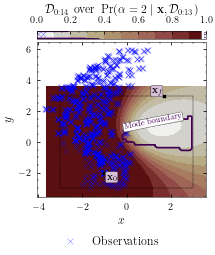

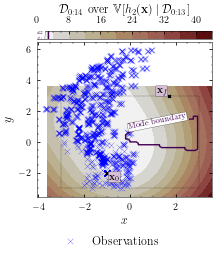

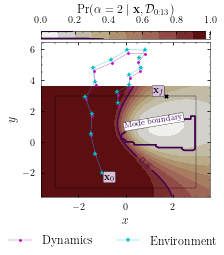

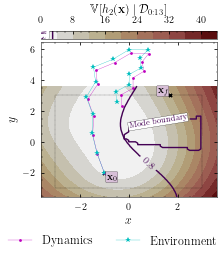

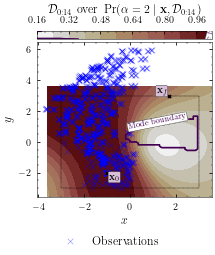

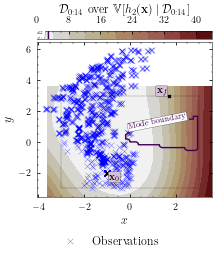

Optimisation result:
     fun: 230.74421974094258
     jac: array([-44.85445767,  14.66474312, -44.69572544,  15.0313318 ,
       -42.16745543,  14.93159069, -41.45131552,  15.33866924,
       -42.67878573,  16.17668178, -41.86085841,  15.96274379,
       -40.81608341,  15.89794779, -39.70828021,  16.14378305,
       -38.56928034,  16.30161176, -29.73168382,  15.38901189,
       -29.75140329,  15.78542286, -13.80415874,   6.64608366,
       -14.13958213,   6.783947  ,  -5.62935596,   2.33132558,
        -5.88679109,   2.36364409])
 message: 'Optimization terminated successfully'
    nfev: 65
     nit: 35
    njev: 35
  status: 0
 success: True
       x: array([-0.08187938,  6.89759366,  0.95452244,  6.55493355, -1.22726431,
        6.09004445, -1.26287187,  5.64140658,  2.03854371,  5.04240463,
        2.24028677,  5.04185902,  2.43330407,  4.59474166,  2.83155708,
        3.00002687,  1.91242156,  0.39839038, -1.72574683, -0.01741599,
       -0.96942188, -0.82141252, -2.00057971,  0.6

2022-04-22 13:37:54.045947: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 13:37:54.045962: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


3/3 [==============================] - 2s 859ms/step - loss: -486.4195 - val_loss: 435.1936


2022-04-22 13:37:55.198919: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 13:37:55.207335: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 13:37:55.213386: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_37_55

2022-04-22 13:37:55.218361: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_37_55/dr-robots-mbp.local.trace.json.gz
2022-04-22 13:37:55.236125: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_37_55

2022-04-22 13:37:55.236352: I tensorflow/core/profiler/rpc/client/s

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_15_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 22ms/step - loss: -525.6063 - val_loss: -865.5913
Epoch 3/20000
3/3 [==============================] - 0s 23ms/step - loss: -821.0142 - val_loss: 745.6119
Epoch 4/20000
3/3 [==============================] - 0s 22ms/step - loss: -738.0844 - val_loss: 550.6017
Epoch 5/20000
3/3 [==============================] - 0s 23ms/step - loss: -514.2691 - val_loss: 287.3996
Epoch 6/20000
3/3 [==============================] - 0s 22ms/step - loss: -592.7310 - val_loss: 49.3388
Epoch 7/20000
3/3 [==============================] - 0s 22ms/step - loss: -342.9535 - val_loss: 630.6450
Epoch 8/20000
3/3 [==============================] - 0s 30ms/step - loss: -708.5196 - val_loss: -297.9466
Epoch 9/20000
3/3 [==============================] - 0s 22ms/step - loss: -579.6087 - val_loss: -167.7096
Epoch 10/20000
3/3 [==============================] - 0s 22ms/step - loss: -650.1101 - val_loss: -354.5141
Epoch 11/20000
3/3 [==============================]

3/3 [==============================] - 0s 22ms/step - loss: -886.3300 - val_loss: -663.4152
Epoch 77/20000
3/3 [==============================] - 0s 22ms/step - loss: -876.4813 - val_loss: 82.8239
Epoch 78/20000
3/3 [==============================] - 0s 22ms/step - loss: -676.4854 - val_loss: -934.5920
Epoch 79/20000
3/3 [==============================] - 0s 22ms/step - loss: -899.7149 - val_loss: -501.3393
Epoch 80/20000
3/3 [==============================] - 0s 22ms/step - loss: -811.6267 - val_loss: -129.0716
Epoch 81/20000
3/3 [==============================] - 0s 23ms/step - loss: -607.8245 - val_loss: 972.7815
Epoch 82/20000
3/3 [==============================] - 0s 22ms/step - loss: -878.1220 - val_loss: -123.7675
Epoch 83/20000
3/3 [==============================] - 0s 22ms/step - loss: -188.2450 - val_loss: -355.2225
Epoch 84/20000
3/3 [==============================] - 0s 23ms/step - loss: -766.3656 - val_loss: 232.7636
Epoch 85/20000
3/3 [==============================] - 0s

3/3 [==============================] - 0s 25ms/step - loss: -783.2925 - val_loss: -656.9127
Epoch 153/20000
3/3 [==============================] - 0s 26ms/step - loss: -928.8740 - val_loss: -906.6595
Epoch 154/20000
3/3 [==============================] - 0s 25ms/step - loss: -767.0222 - val_loss: -817.2024
Epoch 155/20000
3/3 [==============================] - 0s 26ms/step - loss: -872.2015 - val_loss: -622.8996
Epoch 156/20000
3/3 [==============================] - 0s 26ms/step - loss: -933.4866 - val_loss: -742.2639
Epoch 157/20000
3/3 [==============================] - 0s 26ms/step - loss: -947.9448 - val_loss: -671.1945
Epoch 158/20000
3/3 [==============================] - 0s 26ms/step - loss: -770.2257 - val_loss: 112.5875
Epoch 159/20000
3/3 [==============================] - 0s 32ms/step - loss: -823.8544 - val_loss: -900.5759
Epoch 160/20000
3/3 [==============================] - 0s 27ms/step - loss: -930.4549 - val_loss: -914.6888
Epoch 161/20000
3/3 [========================

3/3 [==============================] - 0s 27ms/step - loss: -862.2579 - val_loss: -629.2302
Epoch 229/20000
3/3 [==============================] - 0s 26ms/step - loss: -758.8023 - val_loss: -407.1705
Epoch 230/20000
3/3 [==============================] - 0s 27ms/step - loss: -831.6546 - val_loss: -767.8192
Epoch 231/20000
3/3 [==============================] - 0s 28ms/step - loss: -837.6518 - val_loss: -725.2525
Epoch 232/20000
3/3 [==============================] - 0s 27ms/step - loss: -838.2343 - val_loss: -642.7520
Epoch 233/20000
3/3 [==============================] - 0s 27ms/step - loss: -857.3561 - val_loss: -829.8893
Epoch 234/20000
3/3 [==============================] - 0s 27ms/step - loss: -899.6092 - val_loss: -232.6204
Epoch 235/20000
3/3 [==============================] - 0s 26ms/step - loss: -833.2739 - val_loss: -838.1199
Epoch 236/20000
3/3 [==============================] - 0s 27ms/step - loss: -849.0094 - val_loss: -753.3655
Epoch 237/20000
3/3 [=======================

3/3 [==============================] - 0s 28ms/step - loss: -879.8853 - val_loss: -770.8862
Epoch 305/20000
3/3 [==============================] - 0s 26ms/step - loss: -885.0120 - val_loss: -552.9297
Epoch 306/20000
3/3 [==============================] - 0s 27ms/step - loss: -780.8421 - val_loss: -562.8946
Epoch 307/20000
3/3 [==============================] - 0s 27ms/step - loss: -912.1611 - val_loss: 543.4444
Epoch 308/20000
3/3 [==============================] - 0s 27ms/step - loss: -744.6413 - val_loss: -515.1509
Epoch 309/20000
3/3 [==============================] - 0s 27ms/step - loss: -833.8336 - val_loss: -844.3513
Epoch 310/20000
3/3 [==============================] - 0s 27ms/step - loss: -922.2384 - val_loss: -696.8883
Epoch 311/20000
3/3 [==============================] - 0s 27ms/step - loss: -933.4086 - val_loss: -774.0247
Epoch 312/20000
3/3 [==============================] - 0s 27ms/step - loss: -877.4720 - val_loss: -621.8081
Epoch 313/20000
3/3 [========================

3/3 [==============================] - 0s 26ms/step - loss: -757.3426 - val_loss: -417.9879
Epoch 381/20000
3/3 [==============================] - 0s 26ms/step - loss: -784.7943 - val_loss: -434.8378
Epoch 382/20000
3/3 [==============================] - 0s 27ms/step - loss: -656.9432 - val_loss: -541.6267
Epoch 383/20000
3/3 [==============================] - 0s 27ms/step - loss: -862.6279 - val_loss: -707.4250
Epoch 384/20000
3/3 [==============================] - 0s 27ms/step - loss: -886.3194 - val_loss: -851.6197
Epoch 385/20000
3/3 [==============================] - 0s 26ms/step - loss: -865.6800 - val_loss: -849.5345
Epoch 386/20000
3/3 [==============================] - 0s 26ms/step - loss: -845.5062 - val_loss: -838.6779
Epoch 387/20000
3/3 [==============================] - 0s 27ms/step - loss: -909.2981 - val_loss: 81.7085
Epoch 388/20000
3/3 [==============================] - 0s 27ms/step - loss: -785.3976 - val_loss: -797.3567
Epoch 389/20000
3/3 [=========================

3/3 [==============================] - 0s 27ms/step - loss: -888.3001 - val_loss: -878.1437
Epoch 457/20000
3/3 [==============================] - 0s 27ms/step - loss: -866.3863 - val_loss: -271.2018
Epoch 458/20000
3/3 [==============================] - 0s 27ms/step - loss: -835.1666 - val_loss: -784.1259
Epoch 459/20000
3/3 [==============================] - 0s 28ms/step - loss: -892.3126 - val_loss: -405.2754
Epoch 460/20000
3/3 [==============================] - 0s 27ms/step - loss: -898.1455 - val_loss: -874.8515
Epoch 461/20000
3/3 [==============================] - 0s 31ms/step - loss: -854.3737 - val_loss: -631.4546
Epoch 462/20000
3/3 [==============================] - 0s 30ms/step - loss: -851.1466 - val_loss: -717.5995
Epoch 463/20000
3/3 [==============================] - 0s 29ms/step - loss: -909.4565 - val_loss: -872.4775
Epoch 464/20000
3/3 [==============================] - 0s 31ms/step - loss: -620.5582 - val_loss: -385.6891
Epoch 465/20000
3/3 [=======================

3/3 [==============================] - 0s 27ms/step - loss: -944.4233 - val_loss: -668.5306
Epoch 533/20000
3/3 [==============================] - 0s 28ms/step - loss: -926.5288 - val_loss: -839.8436
Epoch 534/20000
3/3 [==============================] - 0s 28ms/step - loss: -955.2520 - val_loss: -829.6710
Epoch 535/20000
3/3 [==============================] - 0s 28ms/step - loss: -931.0786 - val_loss: -467.9195
Epoch 536/20000
3/3 [==============================] - 0s 28ms/step - loss: -971.8905 - val_loss: -446.8752
Epoch 537/20000
3/3 [==============================] - 0s 28ms/step - loss: -891.3062 - val_loss: -717.7247
Epoch 538/20000
3/3 [==============================] - 0s 27ms/step - loss: -885.8629 - val_loss: -883.7546
Epoch 539/20000
3/3 [==============================] - 0s 27ms/step - loss: -966.6420 - val_loss: -532.3605
Epoch 540/20000
3/3 [==============================] - 0s 28ms/step - loss: -944.3774 - val_loss: -759.6522
Epoch 541/20000
3/3 [=======================

3/3 [==============================] - 0s 28ms/step - loss: -856.1092 - val_loss: -205.5978
Epoch 609/20000
3/3 [==============================] - 0s 28ms/step - loss: -591.0217 - val_loss: -367.7225
Epoch 610/20000
3/3 [==============================] - 0s 28ms/step - loss: -894.8146 - val_loss: -701.1534
Epoch 611/20000
3/3 [==============================] - 0s 27ms/step - loss: -893.5905 - val_loss: -747.1946
Epoch 612/20000
3/3 [==============================] - 0s 28ms/step - loss: -780.2111 - val_loss: -764.3451
Epoch 613/20000
3/3 [==============================] - 0s 27ms/step - loss: -903.4907 - val_loss: -725.9618
Epoch 614/20000
3/3 [==============================] - 0s 28ms/step - loss: -880.0208 - val_loss: -633.9449
Epoch 615/20000
3/3 [==============================] - 0s 27ms/step - loss: -899.3730 - val_loss: -614.6888
Epoch 616/20000
3/3 [==============================] - 0s 28ms/step - loss: -902.0446 - val_loss: -639.7974
Epoch 617/20000
3/3 [=======================

3/3 [==============================] - 0s 28ms/step - loss: -940.3724 - val_loss: -477.9658
Epoch 685/20000
3/3 [==============================] - 0s 30ms/step - loss: -950.9617 - val_loss: -0.7510
Epoch 686/20000
3/3 [==============================] - 0s 29ms/step - loss: -926.0713 - val_loss: -777.7300
Epoch 687/20000
3/3 [==============================] - 0s 28ms/step - loss: -820.6139 - val_loss: -888.8909
Epoch 688/20000
3/3 [==============================] - 0s 28ms/step - loss: -981.4725 - val_loss: -552.4389
Epoch 689/20000
3/3 [==============================] - 0s 29ms/step - loss: -695.4006 - val_loss: -834.5820
Epoch 690/20000
3/3 [==============================] - 0s 28ms/step - loss: -823.4912 - val_loss: -733.4247
Epoch 691/20000
3/3 [==============================] - 0s 28ms/step - loss: -864.5577 - val_loss: -645.0829
Epoch 692/20000
3/3 [==============================] - 0s 29ms/step - loss: -789.4689 - val_loss: -818.8579
Epoch 693/20000
3/3 [=========================

3/3 [==============================] - 0s 30ms/step - loss: -1006.4678 - val_loss: -783.4507
Epoch 761/20000
3/3 [==============================] - 0s 30ms/step - loss: -963.7388 - val_loss: -518.3218
Epoch 762/20000
3/3 [==============================] - 0s 30ms/step - loss: -974.4520 - val_loss: -693.1249
Epoch 763/20000
3/3 [==============================] - 0s 30ms/step - loss: -1024.6722 - val_loss: -900.4788
Epoch 764/20000
3/3 [==============================] - 0s 29ms/step - loss: -979.8099 - val_loss: -838.5942
Epoch 765/20000
3/3 [==============================] - 0s 29ms/step - loss: -981.3264 - val_loss: -503.9646
Epoch 766/20000
3/3 [==============================] - 0s 29ms/step - loss: -1036.5957 - val_loss: -787.3179
Epoch 767/20000
3/3 [==============================] - 0s 30ms/step - loss: -1036.2497 - val_loss: -369.1396
Epoch 768/20000
3/3 [==============================] - 0s 29ms/step - loss: -964.6359 - val_loss: -958.7036
Epoch 769/20000
3/3 [===================

Epoch 836/20000
3/3 [==============================] - 0s 30ms/step - loss: -976.4563 - val_loss: -832.9636
Epoch 837/20000
3/3 [==============================] - 0s 32ms/step - loss: -888.0304 - val_loss: -457.6537
Epoch 838/20000
3/3 [==============================] - 0s 30ms/step - loss: -1004.2905 - val_loss: -812.8986
Epoch 839/20000
3/3 [==============================] - 0s 31ms/step - loss: -977.1797 - val_loss: -843.1337
Epoch 840/20000
3/3 [==============================] - 0s 32ms/step - loss: -983.4380 - val_loss: -846.4086
Epoch 841/20000
3/3 [==============================] - 0s 28ms/step - loss: -1012.2688 - val_loss: -270.4576
Epoch 842/20000
3/3 [==============================] - 0s 28ms/step - loss: -1004.6843 - val_loss: -900.2479
Epoch 843/20000
3/3 [==============================] - 0s 29ms/step - loss: -953.0910 - val_loss: -490.6127
Epoch 844/20000
3/3 [==============================] - 0s 28ms/step - loss: -980.5141 - val_loss: -885.4097
Epoch 845/20000
3/3 [====

Epoch 912/20000
3/3 [==============================] - 0s 28ms/step - loss: -954.9034 - val_loss: -279.6519
Epoch 913/20000
3/3 [==============================] - 0s 27ms/step - loss: -983.0727 - val_loss: -693.6879
Epoch 914/20000
3/3 [==============================] - 0s 28ms/step - loss: -990.1995 - val_loss: -575.9779
Epoch 915/20000
3/3 [==============================] - 0s 28ms/step - loss: -1008.9741 - val_loss: -847.1688
Epoch 916/20000
3/3 [==============================] - 0s 27ms/step - loss: -994.5955 - val_loss: -516.3421
Epoch 917/20000
3/3 [==============================] - 0s 27ms/step - loss: -1011.8704 - val_loss: -628.9548
Epoch 918/20000
3/3 [==============================] - 0s 28ms/step - loss: -991.3696 - val_loss: -894.7200
Epoch 919/20000
3/3 [==============================] - 0s 27ms/step - loss: -988.4699 - val_loss: -683.8939
Epoch 920/20000
3/3 [==============================] - 0s 28ms/step - loss: -1023.9274 - val_loss: -503.1644
Epoch 921/20000
3/3 [====

Epoch 988/20000
3/3 [==============================] - 0s 26ms/step - loss: -904.9360 - val_loss: 145.1530
Epoch 989/20000
3/3 [==============================] - 0s 27ms/step - loss: -555.9974 - val_loss: -554.4827
Epoch 990/20000
3/3 [==============================] - 0s 27ms/step - loss: -764.1798 - val_loss: -730.6049
Epoch 991/20000
3/3 [==============================] - 0s 27ms/step - loss: -791.7445 - val_loss: -502.6086
Epoch 992/20000
3/3 [==============================] - 0s 29ms/step - loss: -614.5971 - val_loss: -789.0938
Epoch 993/20000
3/3 [==============================] - 0s 30ms/step - loss: -833.3734 - val_loss: -348.1018
Epoch 994/20000
3/3 [==============================] - 0s 30ms/step - loss: -920.0683 - val_loss: -647.2620
Epoch 995/20000
3/3 [==============================] - 0s 28ms/step - loss: -603.1297 - val_loss: -454.6283
Epoch 996/20000
3/3 [==============================] - 0s 29ms/step - loss: -646.5306 - val_loss: -616.8808
Epoch 997/20000
3/3 [========

3/3 [==============================] - 0s 27ms/step - loss: -964.8359 - val_loss: -577.7440
Epoch 1064/20000
3/3 [==============================] - 0s 26ms/step - loss: -1014.2187 - val_loss: -710.1685
Epoch 1065/20000
3/3 [==============================] - 0s 26ms/step - loss: -680.3091 - val_loss: -799.6644
Epoch 1066/20000
3/3 [==============================] - 0s 27ms/step - loss: -953.4512 - val_loss: -921.6237
Epoch 1067/20000
3/3 [==============================] - 0s 27ms/step - loss: -695.7290 - val_loss: -855.1113
Epoch 1068/20000
3/3 [==============================] - 0s 27ms/step - loss: -492.7609 - val_loss: -801.4975
Epoch 1069/20000
3/3 [==============================] - 0s 26ms/step - loss: -906.0958 - val_loss: -762.9444
Epoch 1070/20000
3/3 [==============================] - 0s 26ms/step - loss: -842.2322 - val_loss: 465.2011
Epoch 1071/20000
3/3 [==============================] - 0s 26ms/step - loss: 303.1766 - val_loss: -605.3985
Epoch 1072/20000
3/3 [===============

3/3 [==============================] - 0s 28ms/step - loss: -1000.6527 - val_loss: -761.5054
Epoch 1139/20000
3/3 [==============================] - 0s 27ms/step - loss: -749.2925 - val_loss: -647.4095
Epoch 1140/20000
3/3 [==============================] - 0s 26ms/step - loss: -705.9993 - val_loss: -780.5911
Epoch 1141/20000
3/3 [==============================] - 0s 26ms/step - loss: -997.8741 - val_loss: -511.4101
Epoch 1142/20000
3/3 [==============================] - 0s 26ms/step - loss: -741.5154 - val_loss: -481.2324
Epoch 1143/20000
3/3 [==============================] - 0s 27ms/step - loss: -929.5490 - val_loss: -502.3261
Epoch 1144/20000
3/3 [==============================] - 0s 27ms/step - loss: -931.0855 - val_loss: 51.8169
Epoch 1145/20000
3/3 [==============================] - 0s 26ms/step - loss: -743.2238 - val_loss: -595.0615
Epoch 1146/20000
3/3 [==============================] - 0s 26ms/step - loss: -515.9450 - val_loss: -804.7351
Epoch 1147/20000
3/3 [===============

3/3 [==============================] - 0s 26ms/step - loss: -912.4165 - val_loss: -844.7397
Epoch 1214/20000
3/3 [==============================] - 0s 26ms/step - loss: -981.0976 - val_loss: -770.5605
Epoch 1215/20000
3/3 [==============================] - 0s 26ms/step - loss: -956.2159 - val_loss: -665.3037
Epoch 1216/20000
3/3 [==============================] - 0s 26ms/step - loss: -835.5346 - val_loss: -538.4353
Epoch 1217/20000
3/3 [==============================] - 0s 26ms/step - loss: -963.3547 - val_loss: -949.6930
Epoch 1218/20000
3/3 [==============================] - 0s 27ms/step - loss: -455.1492 - val_loss: -748.3098
Epoch 1219/20000
3/3 [==============================] - 0s 27ms/step - loss: -855.4368 - val_loss: -323.2140
Epoch 1220/20000
3/3 [==============================] - 0s 28ms/step - loss: -909.3773 - val_loss: -831.3810
Epoch 1221/20000
3/3 [==============================] - 0s 26ms/step - loss: -430.1169 - val_loss: -777.2396
Epoch 1222/20000
3/3 [==============

3/3 [==============================] - 0s 26ms/step - loss: -1003.5781 - val_loss: -668.6216
Epoch 1289/20000
3/3 [==============================] - 0s 27ms/step - loss: -593.3454 - val_loss: -814.9070
Epoch 1290/20000
3/3 [==============================] - 0s 26ms/step - loss: -974.4959 - val_loss: -957.4314
Epoch 1291/20000
3/3 [==============================] - 0s 26ms/step - loss: -808.3967 - val_loss: -720.3030
Epoch 1292/20000
3/3 [==============================] - 0s 26ms/step - loss: -438.1766 - val_loss: -237.8284
Epoch 1293/20000
3/3 [==============================] - 0s 27ms/step - loss: -646.6326 - val_loss: 6.3117
Epoch 1294/20000
3/3 [==============================] - 0s 26ms/step - loss: -717.7741 - val_loss: -203.0368
Epoch 1295/20000
3/3 [==============================] - 0s 28ms/step - loss: -738.0680 - val_loss: -335.9039
Epoch 1296/20000
3/3 [==============================] - 0s 29ms/step - loss: -776.4297 - val_loss: -730.2930
Epoch 1297/20000
3/3 [================

3/3 [==============================] - 0s 28ms/step - loss: -1036.0188 - val_loss: -914.5682
Epoch 1364/20000
3/3 [==============================] - 0s 30ms/step - loss: -1074.1486 - val_loss: -847.6787
Epoch 1365/20000
3/3 [==============================] - 0s 29ms/step - loss: -1082.4880 - val_loss: -609.3522
Epoch 1366/20000
3/3 [==============================] - 0s 28ms/step - loss: -1088.2532 - val_loss: -875.0583
Epoch 1367/20000
3/3 [==============================] - 0s 28ms/step - loss: -1020.3355 - val_loss: -807.1871
Epoch 1368/20000
3/3 [==============================] - 0s 29ms/step - loss: -1107.2387 - val_loss: -845.2090
Epoch 1369/20000
3/3 [==============================] - 0s 29ms/step - loss: -1056.7709 - val_loss: -974.3156
Epoch 1370/20000
3/3 [==============================] - 0s 32ms/step - loss: -1088.1231 - val_loss: -522.0939
Epoch 1371/20000
3/3 [==============================] - 0s 29ms/step - loss: -1055.0080 - val_loss: -613.4062
Epoch 1372/20000
3/3 [=====

3/3 [==============================] - 0s 26ms/step - loss: -957.9543 - val_loss: -514.9101
Epoch 1439/20000
3/3 [==============================] - 0s 26ms/step - loss: -868.5300 - val_loss: -193.6058
Epoch 1440/20000
3/3 [==============================] - 0s 26ms/step - loss: -730.5216 - val_loss: -704.7936
Epoch 1441/20000
3/3 [==============================] - 0s 27ms/step - loss: -1018.2926 - val_loss: -602.0114
Epoch 1442/20000
3/3 [==============================] - 0s 27ms/step - loss: -766.2750 - val_loss: -955.2232
Epoch 1443/20000
3/3 [==============================] - 0s 26ms/step - loss: -997.0284 - val_loss: -763.8801
Epoch 1444/20000
3/3 [==============================] - 0s 28ms/step - loss: -954.4611 - val_loss: -784.6840
Epoch 1445/20000
3/3 [==============================] - 0s 27ms/step - loss: -886.1201 - val_loss: -878.5712
Epoch 1446/20000
3/3 [==============================] - 0s 26ms/step - loss: -858.6803 - val_loss: -695.6146
Epoch 1447/20000
3/3 [=============

3/3 [==============================] - 0s 26ms/step - loss: -801.9681 - val_loss: -934.7917
Epoch 1514/20000
3/3 [==============================] - 0s 27ms/step - loss: -897.9395 - val_loss: -1004.5031
Epoch 1515/20000
3/3 [==============================] - 0s 27ms/step - loss: -952.2022 - val_loss: -649.8962
Epoch 1516/20000
3/3 [==============================] - 0s 26ms/step - loss: -736.4322 - val_loss: -928.6234
Epoch 1517/20000
3/3 [==============================] - 0s 26ms/step - loss: -857.7615 - val_loss: -300.7840
Epoch 1518/20000
3/3 [==============================] - 0s 26ms/step - loss: -737.6101 - val_loss: -759.1494
Epoch 1519/20000
3/3 [==============================] - 0s 27ms/step - loss: -1034.5253 - val_loss: -899.2305
Epoch 1520/20000
3/3 [==============================] - 0s 27ms/step - loss: -764.4379 - val_loss: -799.7120
Epoch 1521/20000
3/3 [==============================] - 0s 27ms/step - loss: -892.5752 - val_loss: -809.9496
Epoch 1522/20000
3/3 [============

3/3 [==============================] - 0s 36ms/step - loss: -1057.8620 - val_loss: -919.5180
Epoch 1589/20000
3/3 [==============================] - 0s 28ms/step - loss: -1063.9248 - val_loss: -761.7760
Epoch 1590/20000
3/3 [==============================] - 0s 27ms/step - loss: -1059.0401 - val_loss: -789.4698
Epoch 1591/20000
3/3 [==============================] - 0s 26ms/step - loss: -1017.5804 - val_loss: -985.7800
Epoch 1592/20000
3/3 [==============================] - 0s 27ms/step - loss: -1055.7671 - val_loss: -411.9480
Epoch 1593/20000
3/3 [==============================] - 0s 26ms/step - loss: -1080.0237 - val_loss: -751.5424
Epoch 1594/20000
3/3 [==============================] - 0s 27ms/step - loss: -1049.3007 - val_loss: -640.7095
Epoch 1595/20000
3/3 [==============================] - 0s 27ms/step - loss: -1044.6296 - val_loss: -744.9856
Epoch 1596/20000
3/3 [==============================] - 0s 26ms/step - loss: -1025.2246 - val_loss: -601.9701
Epoch 1597/20000
3/3 [=====

3/3 [==============================] - 0s 30ms/step - loss: -997.5561 - val_loss: -752.1939
Epoch 1664/20000
3/3 [==============================] - 0s 28ms/step - loss: -1040.7562 - val_loss: -874.8646
Epoch 1665/20000
3/3 [==============================] - 0s 27ms/step - loss: -1061.4572 - val_loss: -825.5418
Epoch 1666/20000
3/3 [==============================] - 0s 28ms/step - loss: -1007.9983 - val_loss: -738.9493
Epoch 1667/20000
3/3 [==============================] - 0s 28ms/step - loss: -1039.0214 - val_loss: -948.4651
Epoch 1668/20000
3/3 [==============================] - 0s 28ms/step - loss: -1027.8448 - val_loss: -660.9429
Epoch 1669/20000
3/3 [==============================] - 0s 28ms/step - loss: -1021.2866 - val_loss: -891.7651
Epoch 1670/20000
3/3 [==============================] - 0s 27ms/step - loss: -1055.8766 - val_loss: -899.2297
Epoch 1671/20000
3/3 [==============================] - 0s 28ms/step - loss: -1040.3774 - val_loss: -943.9970
Epoch 1672/20000
3/3 [======

Epoch 1738/20000
3/3 [==============================] - 0s 28ms/step - loss: -958.7923 - val_loss: -823.7534
Epoch 1739/20000
3/3 [==============================] - 0s 30ms/step - loss: -974.7888 - val_loss: -892.7207
Epoch 1740/20000
3/3 [==============================] - 0s 32ms/step - loss: -1011.2503 - val_loss: -961.9633
Epoch 1741/20000
3/3 [==============================] - 0s 29ms/step - loss: -1023.9958 - val_loss: -876.6373
Epoch 1742/20000
3/3 [==============================] - 0s 28ms/step - loss: -1001.2720 - val_loss: -934.8056
Epoch 1743/20000
3/3 [==============================] - 0s 28ms/step - loss: -1016.1615 - val_loss: -922.8665
Epoch 1744/20000
3/3 [==============================] - 0s 28ms/step - loss: -998.8227 - val_loss: -817.0907
Epoch 1745/20000
3/3 [==============================] - 0s 28ms/step - loss: -1032.6330 - val_loss: -915.9451
Epoch 1746/20000
3/3 [==============================] - 0s 28ms/step - loss: -1041.1275 - val_loss: -574.3500
Epoch 1747/20

Epoch 1813/20000
3/3 [==============================] - 0s 27ms/step - loss: -1025.2045 - val_loss: -934.6110
Epoch 1814/20000
3/3 [==============================] - 0s 28ms/step - loss: -967.1809 - val_loss: -938.2196
Epoch 1815/20000
3/3 [==============================] - 0s 28ms/step - loss: -1003.7983 - val_loss: -865.6393
Epoch 1816/20000
3/3 [==============================] - 0s 27ms/step - loss: -1029.3389 - val_loss: -847.7431
Epoch 1817/20000
3/3 [==============================] - 0s 28ms/step - loss: -1028.6219 - val_loss: -963.4553
Epoch 1818/20000
3/3 [==============================] - 0s 27ms/step - loss: -1038.3544 - val_loss: -945.8181
Epoch 1819/20000
3/3 [==============================] - 0s 28ms/step - loss: -1031.7093 - val_loss: -865.2053
Epoch 1820/20000
3/3 [==============================] - 0s 27ms/step - loss: -1023.5539 - val_loss: -892.3647
Epoch 1821/20000
3/3 [==============================] - 0s 27ms/step - loss: -1048.3790 - val_loss: -853.9393
Epoch 1822/

Epoch 1888/20000
3/3 [==============================] - 0s 26ms/step - loss: -1032.3357 - val_loss: -894.1489
Epoch 1889/20000
3/3 [==============================] - 0s 26ms/step - loss: -1071.6742 - val_loss: -1025.6879
Epoch 1890/20000
3/3 [==============================] - 0s 27ms/step - loss: -1066.2630 - val_loss: -805.4955
Epoch 1891/20000
3/3 [==============================] - 0s 27ms/step - loss: -974.6029 - val_loss: -950.6241
Epoch 1892/20000
3/3 [==============================] - 0s 27ms/step - loss: -933.9539 - val_loss: -438.3375
Epoch 1893/20000
3/3 [==============================] - 0s 28ms/step - loss: -1006.3677 - val_loss: -799.5060
Epoch 1894/20000
3/3 [==============================] - 0s 27ms/step - loss: -1055.6417 - val_loss: -889.7367
Epoch 1895/20000
3/3 [==============================] - 0s 27ms/step - loss: -967.2445 - val_loss: -630.9413
Epoch 1896/20000
3/3 [==============================] - 0s 27ms/step - loss: -1033.7814 - val_loss: -990.4461
Epoch 1897/2

3/3 [==============================] - 0s 28ms/step - loss: -946.3614 - val_loss: -932.5629
Epoch 1963/20000
3/3 [==============================] - 0s 27ms/step - loss: -881.5778 - val_loss: -955.6428
Epoch 1964/20000
3/3 [==============================] - 0s 27ms/step - loss: -1068.2883 - val_loss: -744.7122
Epoch 1965/20000
3/3 [==============================] - 0s 27ms/step - loss: -998.8643 - val_loss: -630.7736
Epoch 1966/20000
3/3 [==============================] - 0s 27ms/step - loss: -871.1854 - val_loss: -582.4474
Epoch 1967/20000
3/3 [==============================] - 0s 29ms/step - loss: -987.8055 - val_loss: -722.5233
Epoch 1968/20000
3/3 [==============================] - 0s 27ms/step - loss: -836.8405 - val_loss: -462.7658
Epoch 1969/20000
3/3 [==============================] - 0s 27ms/step - loss: -964.0615 - val_loss: -775.7677
Epoch 1970/20000
3/3 [==============================] - 0s 28ms/step - loss: -692.8494 - val_loss: -734.3671
Epoch 1971/20000
3/3 [=============

/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2002/20000
3/3 [==============================] - 0s 23ms/step - loss: -988.7430 - val_loss: -338.6381
Epoch 2003/20000
3/3 [==============================] - 0s 23ms/step - loss: -983.7984 - val_loss: -897.1146
Epoch 2004/20000
3/3 [==============================] - 0s 22ms/step - loss: -1007.7326 - val_loss: -631.0467
Epoch 2005/20000
3/3 [==============================] - 0s 22ms/step - loss: -1059.3347 - val_loss: -773.1642
Epoch 2006/20000
3/3 [==============================] - 0s 22ms/step - loss: -992.1436 - val_loss: -931.1680
Epoch 2007/20000
3/3 [==============================] - 0s 22ms/step - loss: -1028.6021 - val_loss: -632.3249
Epoch 2008/20000
3/3 [==============================] - 0s 22ms/step - loss: -1056.7454 - val_loss: -888.1022
Epoch 2009/20000
3/3 [==============================] - 0s 22ms/step - loss: -957.6013 - val_loss: -952.8196
Epoch 2010/20000
3/3 [==============================] - 0s 22ms/step - loss: -1031.1881 - val_loss: -886.6557
Epoch 2011/200

Epoch 2077/20000
3/3 [==============================] - 0s 24ms/step - loss: -1006.7089 - val_loss: -942.6183
Epoch 2078/20000
3/3 [==============================] - 0s 24ms/step - loss: -1056.1394 - val_loss: -727.7978
Epoch 2079/20000
3/3 [==============================] - 0s 24ms/step - loss: -1054.0226 - val_loss: -999.3985
Epoch 2080/20000
3/3 [==============================] - 0s 24ms/step - loss: -1069.4218 - val_loss: -941.7323
Epoch 2081/20000
3/3 [==============================] - 0s 24ms/step - loss: -1077.9924 - val_loss: -894.7992
Epoch 2082/20000
3/3 [==============================] - 0s 25ms/step - loss: -1027.3315 - val_loss: -914.6358
Epoch 2083/20000
3/3 [==============================] - 0s 24ms/step - loss: -1076.3501 - val_loss: -648.2486
Epoch 2084/20000
3/3 [==============================] - 0s 24ms/step - loss: -1075.8099 - val_loss: -688.7863
Epoch 2085/20000
3/3 [==============================] - 0s 25ms/step - loss: -1019.1776 - val_loss: -726.0529
Epoch 2086

3/3 [==============================] - 0s 28ms/step - loss: -1079.5554 - val_loss: -958.2476
Epoch 2152/20000
3/3 [==============================] - 0s 27ms/step - loss: -1072.2511 - val_loss: -695.9877
Epoch 2153/20000
3/3 [==============================] - 0s 27ms/step - loss: -1135.1599 - val_loss: -777.1385
Epoch 2154/20000
3/3 [==============================] - 0s 27ms/step - loss: -1094.2275 - val_loss: -993.2685
Epoch 2155/20000
3/3 [==============================] - 0s 27ms/step - loss: -1080.7400 - val_loss: -841.6976
Epoch 2156/20000
3/3 [==============================] - 0s 27ms/step - loss: -1115.8848 - val_loss: -889.7159
Epoch 2157/20000
3/3 [==============================] - 0s 26ms/step - loss: -1041.8324 - val_loss: -745.6178
Epoch 2158/20000
3/3 [==============================] - 0s 27ms/step - loss: -1096.8377 - val_loss: -649.7728
Epoch 2159/20000
3/3 [==============================] - 0s 26ms/step - loss: -999.1655 - val_loss: -957.3169
Epoch 2160/20000
3/3 [======

Epoch 2226/20000
3/3 [==============================] - 0s 28ms/step - loss: -901.1780 - val_loss: -840.7283
Epoch 2227/20000
3/3 [==============================] - 0s 26ms/step - loss: 411.8285 - val_loss: 784.8565
Epoch 2228/20000
3/3 [==============================] - 0s 27ms/step - loss: -607.5899 - val_loss: -835.6695
Epoch 2229/20000
3/3 [==============================] - 0s 28ms/step - loss: -462.4067 - val_loss: -310.4644
Epoch 2230/20000
3/3 [==============================] - 0s 26ms/step - loss: -53.1826 - val_loss: -455.3255
Epoch 2231/20000
3/3 [==============================] - 0s 27ms/step - loss: -793.5181 - val_loss: -682.4402
Epoch 2232/20000
3/3 [==============================] - 0s 27ms/step - loss: -783.9451 - val_loss: -615.0448
Epoch 2233/20000
3/3 [==============================] - 0s 27ms/step - loss: -498.8411 - val_loss: -857.1237
Epoch 2234/20000
3/3 [==============================] - 0s 26ms/step - loss: -840.4928 - val_loss: -917.4622
Epoch 2235/20000
3/3 [

Epoch 2301/20000
3/3 [==============================] - 0s 28ms/step - loss: -958.6333 - val_loss: -916.1816
Epoch 2302/20000
3/3 [==============================] - 0s 27ms/step - loss: -171.8295 - val_loss: -841.3399
Epoch 2303/20000
3/3 [==============================] - 0s 29ms/step - loss: -840.8803 - val_loss: -690.5486
Epoch 2304/20000
3/3 [==============================] - 0s 28ms/step - loss: -53.0382 - val_loss: -830.0180
Epoch 2305/20000
3/3 [==============================] - 0s 27ms/step - loss: -846.4884 - val_loss: -477.7062
Epoch 2306/20000
3/3 [==============================] - 0s 29ms/step - loss: -524.5295 - val_loss: -216.7785
Epoch 2307/20000
3/3 [==============================] - 0s 27ms/step - loss: -620.3145 - val_loss: -903.1233
Epoch 2308/20000
3/3 [==============================] - 0s 28ms/step - loss: -925.4648 - val_loss: -595.4562
Epoch 2309/20000
3/3 [==============================] - 0s 30ms/step - loss: -513.6687 - val_loss: -493.7575
Epoch 2310/20000
3/3

3/3 [==============================] - 0s 26ms/step - loss: -1118.8923 - val_loss: -947.6531
Epoch 2376/20000
3/3 [==============================] - 0s 27ms/step - loss: -1122.8800 - val_loss: -989.3575
Epoch 2377/20000
3/3 [==============================] - 0s 26ms/step - loss: -1122.5465 - val_loss: -995.6671
Epoch 2378/20000
3/3 [==============================] - 0s 26ms/step - loss: -1110.6494 - val_loss: -780.3057
Epoch 2379/20000
3/3 [==============================] - 0s 26ms/step - loss: -1113.8198 - val_loss: -1003.8247
Epoch 2380/20000
3/3 [==============================] - 0s 26ms/step - loss: -1127.4201 - val_loss: -1021.4109
Epoch 2381/20000
3/3 [==============================] - 0s 26ms/step - loss: -1098.3332 - val_loss: -946.7403
Epoch 2382/20000
3/3 [==============================] - 0s 26ms/step - loss: -1100.2614 - val_loss: -834.6715
Epoch 2383/20000
3/3 [==============================] - 0s 27ms/step - loss: -1112.7980 - val_loss: -376.8559
Epoch 2384/20000
3/3 [===

3/3 [==============================] - 0s 27ms/step - loss: -1069.3988 - val_loss: -904.9704
Epoch 2451/20000
3/3 [==============================] - 0s 26ms/step - loss: -1082.2488 - val_loss: -936.0242
Epoch 2452/20000
3/3 [==============================] - 0s 27ms/step - loss: -1061.7632 - val_loss: -850.2565
Epoch 2453/20000
3/3 [==============================] - 0s 27ms/step - loss: -1045.0412 - val_loss: -918.2253
Epoch 2454/20000
3/3 [==============================] - 0s 27ms/step - loss: -1077.3629 - val_loss: -973.2892
Epoch 2455/20000
3/3 [==============================] - 0s 27ms/step - loss: -888.5890 - val_loss: -890.5109
Epoch 2456/20000
3/3 [==============================] - 0s 27ms/step - loss: -987.0574 - val_loss: -605.3845
Epoch 2457/20000
3/3 [==============================] - 0s 27ms/step - loss: -991.8622 - val_loss: -804.5881
Epoch 2458/20000
3/3 [==============================] - 0s 27ms/step - loss: -1000.1042 - val_loss: -449.0244
Epoch 2459/20000
3/3 [========

Epoch 2525/20000
3/3 [==============================] - 0s 27ms/step - loss: -1007.6365 - val_loss: -878.3131
Epoch 2526/20000
3/3 [==============================] - 0s 28ms/step - loss: -1035.8235 - val_loss: -924.3876
Epoch 2527/20000
3/3 [==============================] - 0s 28ms/step - loss: -1088.0733 - val_loss: -659.4529
Epoch 2528/20000
3/3 [==============================] - 0s 28ms/step - loss: -1078.1526 - val_loss: -901.1223
Epoch 2529/20000
3/3 [==============================] - 0s 27ms/step - loss: -1061.7563 - val_loss: -711.3252
Epoch 2530/20000
3/3 [==============================] - 0s 28ms/step - loss: -1034.5613 - val_loss: -770.0480
Epoch 2531/20000
3/3 [==============================] - 0s 28ms/step - loss: -1073.7414 - val_loss: -803.7774
Epoch 2532/20000
3/3 [==============================] - 0s 27ms/step - loss: -878.9983 - val_loss: -1009.7398
Epoch 2533/20000
3/3 [==============================] - 0s 27ms/step - loss: -1089.1779 - val_loss: -988.6573
Epoch 2534

3/3 [==============================] - 0s 28ms/step - loss: -1041.6759 - val_loss: -793.4358
Epoch 2600/20000
3/3 [==============================] - 0s 28ms/step - loss: -1041.4262 - val_loss: -1022.8767
Epoch 2601/20000
3/3 [==============================] - 0s 28ms/step - loss: -997.6282 - val_loss: -1000.9382
Epoch 2602/20000
3/3 [==============================] - 0s 28ms/step - loss: -1049.6278 - val_loss: -965.2474
Epoch 2603/20000
3/3 [==============================] - 0s 27ms/step - loss: -1057.6432 - val_loss: -978.6911
Epoch 2604/20000
3/3 [==============================] - 0s 29ms/step - loss: -1004.1568 - val_loss: -832.7506
Epoch 2605/20000
3/3 [==============================] - 0s 28ms/step - loss: -1051.8724 - val_loss: -785.0382
Epoch 2606/20000
3/3 [==============================] - 0s 27ms/step - loss: -958.4799 - val_loss: -976.2244
Epoch 2607/20000
3/3 [==============================] - 0s 28ms/step - loss: -896.6631 - val_loss: -899.7129
Epoch 2608/20000
3/3 [======

3/3 [==============================] - 0s 31ms/step - loss: -1042.5056 - val_loss: -718.3804
Epoch 2674/20000
3/3 [==============================] - 0s 28ms/step - loss: -1054.8612 - val_loss: -997.5955
Epoch 2675/20000
3/3 [==============================] - 0s 29ms/step - loss: -1084.5009 - val_loss: -892.0819
Epoch 2676/20000
3/3 [==============================] - 0s 31ms/step - loss: -983.4674 - val_loss: -950.6708
Epoch 2677/20000
3/3 [==============================] - 0s 28ms/step - loss: -1102.3813 - val_loss: -1024.5769
Epoch 2678/20000
3/3 [==============================] - 0s 30ms/step - loss: -1032.0753 - val_loss: -993.2336
Epoch 2679/20000
3/3 [==============================] - 0s 29ms/step - loss: -1063.2310 - val_loss: -1020.4739
Epoch 2680/20000
3/3 [==============================] - 0s 28ms/step - loss: -917.9539 - val_loss: -969.3955
Epoch 2681/20000
3/3 [==============================] - 0s 30ms/step - loss: -695.8418 - val_loss: -671.9126
Epoch 2682/20000
3/3 [======

Epoch 2748/20000
3/3 [==============================] - 0s 27ms/step - loss: -935.0774 - val_loss: -840.8779
Epoch 2749/20000
3/3 [==============================] - 0s 26ms/step - loss: -907.5333 - val_loss: -874.6138
Epoch 2750/20000
3/3 [==============================] - 0s 27ms/step - loss: -888.7974 - val_loss: -875.3747
Epoch 2751/20000
3/3 [==============================] - 0s 26ms/step - loss: -949.1232 - val_loss: -760.2133
Epoch 2752/20000
3/3 [==============================] - 0s 26ms/step - loss: -965.1870 - val_loss: -795.8906
Epoch 2753/20000
3/3 [==============================] - 0s 26ms/step - loss: -970.3430 - val_loss: -929.5446
Epoch 2754/20000
3/3 [==============================] - 0s 27ms/step - loss: -995.2245 - val_loss: -913.7084
Epoch 2755/20000
3/3 [==============================] - 0s 27ms/step - loss: -988.5700 - val_loss: -917.0369
Epoch 2756/20000
3/3 [==============================] - 0s 27ms/step - loss: -995.9458 - val_loss: -933.8072
Epoch 2757/20000
3/

3/3 [==============================] - 0s 27ms/step - loss: -986.2369 - val_loss: -998.0599
Epoch 2823/20000
3/3 [==============================] - 0s 26ms/step - loss: -965.1458 - val_loss: -1037.5957
Epoch 2824/20000
3/3 [==============================] - 0s 27ms/step - loss: -861.0762 - val_loss: -976.4997
Epoch 2825/20000
3/3 [==============================] - 0s 26ms/step - loss: -781.4129 - val_loss: -862.7088
Epoch 2826/20000
3/3 [==============================] - 0s 27ms/step - loss: -572.0770 - val_loss: -838.4972
Epoch 2827/20000
3/3 [==============================] - 0s 27ms/step - loss: -759.9410 - val_loss: -411.3173
Epoch 2828/20000
3/3 [==============================] - 0s 26ms/step - loss: -396.6002 - val_loss: -957.1365
Epoch 2829/20000
3/3 [==============================] - 0s 26ms/step - loss: -727.2613 - val_loss: -396.6631
Epoch 2830/20000
3/3 [==============================] - 0s 27ms/step - loss: -685.7951 - val_loss: -448.1934
Epoch 2831/20000
3/3 [=============

Epoch 2897/20000
3/3 [==============================] - 0s 27ms/step - loss: -943.9112 - val_loss: -932.8609
Epoch 2898/20000
3/3 [==============================] - 0s 26ms/step - loss: -1000.5548 - val_loss: 150.0136
Epoch 2899/20000
3/3 [==============================] - 0s 27ms/step - loss: 56.4626 - val_loss: -274.5045
Epoch 2900/20000
3/3 [==============================] - 0s 27ms/step - loss: -697.4010 - val_loss: -314.2402
Epoch 2901/20000
3/3 [==============================] - 0s 26ms/step - loss: -874.8872 - val_loss: -1000.4237
Epoch 2902/20000
3/3 [==============================] - 0s 27ms/step - loss: -806.0305 - val_loss: -889.9152
Epoch 2903/20000
3/3 [==============================] - 0s 27ms/step - loss: -1023.4506 - val_loss: -797.0425
Epoch 2904/20000
3/3 [==============================] - 0s 27ms/step - loss: -896.9249 - val_loss: -709.9860
Epoch 2905/20000
3/3 [==============================] - 0s 27ms/step - loss: -901.7297 - val_loss: -600.7821
Epoch 2906/20000
3/

Epoch 2972/20000
3/3 [==============================] - 0s 28ms/step - loss: -925.9236 - val_loss: -856.9203
Epoch 2973/20000
3/3 [==============================] - 0s 27ms/step - loss: -914.5904 - val_loss: -799.9247
Epoch 2974/20000
3/3 [==============================] - 0s 28ms/step - loss: -974.5696 - val_loss: -641.0285
Epoch 2975/20000
3/3 [==============================] - 0s 29ms/step - loss: -918.9726 - val_loss: -900.4883
Epoch 2976/20000
3/3 [==============================] - 0s 28ms/step - loss: -972.5614 - val_loss: -902.8359
Epoch 2977/20000
3/3 [==============================] - 0s 28ms/step - loss: -997.4868 - val_loss: -939.1772
Epoch 2978/20000
3/3 [==============================] - 0s 27ms/step - loss: -977.3898 - val_loss: -928.2038
Epoch 2979/20000
3/3 [==============================] - 0s 29ms/step - loss: -957.0315 - val_loss: -944.2749
Epoch 2980/20000
3/3 [==============================] - 0s 29ms/step - loss: -1011.6823 - val_loss: -870.2938
Epoch 2981/20000
3

3/3 [==============================] - 0s 28ms/step - loss: -1046.6876 - val_loss: -357.5482
Epoch 3047/20000
3/3 [==============================] - 0s 28ms/step - loss: -1116.6250 - val_loss: -809.9772
Epoch 3048/20000
3/3 [==============================] - 0s 29ms/step - loss: -1057.3396 - val_loss: -852.2835
Epoch 3049/20000
3/3 [==============================] - 0s 32ms/step - loss: -992.2730 - val_loss: -1007.8053
Epoch 3050/20000
3/3 [==============================] - 0s 29ms/step - loss: -1037.5716 - val_loss: -990.8360
Epoch 3051/20000
3/3 [==============================] - 0s 31ms/step - loss: -996.5239 - val_loss: -974.7811
Epoch 3052/20000
3/3 [==============================] - 0s 30ms/step - loss: -992.7653 - val_loss: -839.0126
Epoch 3053/20000
3/3 [==============================] - 0s 29ms/step - loss: -1049.1838 - val_loss: -991.6086
Epoch 3054/20000
3/3 [==============================] - 0s 30ms/step - loss: -1096.2963 - val_loss: -797.6482
Epoch 3055/20000
3/3 [=======

Epoch 3121/20000
3/3 [==============================] - 0s 27ms/step - loss: -1078.4609 - val_loss: -940.8539
Epoch 3122/20000
3/3 [==============================] - 0s 27ms/step - loss: -1045.6749 - val_loss: -928.8070
Epoch 3123/20000
3/3 [==============================] - 0s 29ms/step - loss: -1085.3296 - val_loss: -987.5520
Epoch 3124/20000
3/3 [==============================] - 0s 28ms/step - loss: -1080.2182 - val_loss: -904.4646
Epoch 3125/20000
3/3 [==============================] - 0s 28ms/step - loss: -997.9951 - val_loss: -885.3219
Epoch 3126/20000
3/3 [==============================] - 0s 28ms/step - loss: -1104.7802 - val_loss: -990.9802
Epoch 3127/20000
3/3 [==============================] - 0s 27ms/step - loss: -972.7084 - val_loss: -918.7876
Epoch 3128/20000
3/3 [==============================] - 0s 28ms/step - loss: -1038.5719 - val_loss: -410.0374
Epoch 3129/20000
3/3 [==============================] - 0s 27ms/step - loss: -848.5573 - val_loss: -825.9465
Epoch 3130/20

3/3 [==============================] - 0s 28ms/step - loss: -1115.9499 - val_loss: -982.6188
Epoch 3196/20000
3/3 [==============================] - 0s 28ms/step - loss: -1131.5855 - val_loss: -1029.1587
Epoch 3197/20000
3/3 [==============================] - 0s 27ms/step - loss: -1116.5956 - val_loss: -1015.8654
Epoch 3198/20000
3/3 [==============================] - 0s 28ms/step - loss: -1118.8311 - val_loss: -927.7883
Epoch 3199/20000
3/3 [==============================] - 0s 27ms/step - loss: -1136.2875 - val_loss: -860.7162
Epoch 3200/20000
3/3 [==============================] - 0s 28ms/step - loss: -1104.3544 - val_loss: -941.9673
Epoch 3201/20000
3/3 [==============================] - 0s 27ms/step - loss: -1118.3728 - val_loss: -980.1804
Epoch 3202/20000
3/3 [==============================] - 0s 27ms/step - loss: -1110.5739 - val_loss: -980.2409
Epoch 3203/20000
3/3 [==============================] - 0s 27ms/step - loss: -1116.5101 - val_loss: -958.5632
Epoch 3204/20000
3/3 [===

Epoch 3270/20000
3/3 [==============================] - 0s 27ms/step - loss: -1103.1722 - val_loss: -1007.9299
Epoch 3271/20000
3/3 [==============================] - 0s 27ms/step - loss: -1113.4534 - val_loss: -1009.6586
Epoch 3272/20000
3/3 [==============================] - 0s 28ms/step - loss: -1117.9880 - val_loss: -663.0139
Epoch 3273/20000
3/3 [==============================] - 0s 27ms/step - loss: -1117.9872 - val_loss: -922.7234
Epoch 3274/20000
3/3 [==============================] - 0s 27ms/step - loss: -1105.1655 - val_loss: -1011.4365
Epoch 3275/20000
3/3 [==============================] - 0s 28ms/step - loss: -1090.5510 - val_loss: -1019.0252
Epoch 3276/20000
3/3 [==============================] - 0s 28ms/step - loss: -1102.8863 - val_loss: -1054.1738
Epoch 3277/20000
3/3 [==============================] - 0s 28ms/step - loss: -1043.6109 - val_loss: -608.9549
Epoch 3278/20000
3/3 [==============================] - 0s 27ms/step - loss: -1003.7759 - val_loss: -955.9646
Epoch

3/3 [==============================] - 0s 28ms/step - loss: -855.2107 - val_loss: -710.3821
Epoch 3345/20000
3/3 [==============================] - 0s 29ms/step - loss: -617.8806 - val_loss: -824.0832
Epoch 3346/20000
3/3 [==============================] - 0s 28ms/step - loss: -1020.7618 - val_loss: -894.6632
Epoch 3347/20000
3/3 [==============================] - 0s 28ms/step - loss: -922.1434 - val_loss: -887.3983
Epoch 3348/20000
3/3 [==============================] - 0s 27ms/step - loss: -885.8888 - val_loss: -871.9447
Epoch 3349/20000
3/3 [==============================] - 0s 28ms/step - loss: -980.9397 - val_loss: -957.1125
Epoch 3350/20000
3/3 [==============================] - 0s 28ms/step - loss: -1033.9035 - val_loss: -869.9714
Epoch 3351/20000
3/3 [==============================] - 0s 27ms/step - loss: -940.7867 - val_loss: -878.0546
Epoch 3352/20000
3/3 [==============================] - 0s 28ms/step - loss: -898.9052 - val_loss: -880.7657
Epoch 3353/20000
3/3 [============

Epoch 3419/20000
3/3 [==============================] - 0s 29ms/step - loss: -1067.5834 - val_loss: -982.3845
Epoch 3420/20000
3/3 [==============================] - 0s 29ms/step - loss: -1079.7185 - val_loss: -933.4509
Epoch 3421/20000
3/3 [==============================] - 0s 28ms/step - loss: -1083.7001 - val_loss: -948.4560
Epoch 3422/20000
3/3 [==============================] - 0s 30ms/step - loss: -1086.1295 - val_loss: -1005.0531
Epoch 3423/20000
3/3 [==============================] - 0s 30ms/step - loss: -1094.8265 - val_loss: -1005.4560
Epoch 3424/20000
3/3 [==============================] - 0s 30ms/step - loss: -1099.5071 - val_loss: -969.7198
Epoch 3425/20000
3/3 [==============================] - 0s 30ms/step - loss: -1101.6448 - val_loss: -910.7801
Epoch 3426/20000
3/3 [==============================] - 0s 31ms/step - loss: -1119.6684 - val_loss: -979.9718
Epoch 3427/20000
3/3 [==============================] - 0s 31ms/step - loss: -1096.8895 - val_loss: -950.7780
Epoch 34

3/3 [==============================] - 0s 28ms/step - loss: -990.9748 - val_loss: -911.8857
Epoch 3494/20000
3/3 [==============================] - 0s 27ms/step - loss: -1000.1395 - val_loss: -908.1627
Epoch 3495/20000
3/3 [==============================] - 0s 27ms/step - loss: -1015.3305 - val_loss: -908.1389
Epoch 3496/20000
3/3 [==============================] - 0s 28ms/step - loss: -1020.3623 - val_loss: -928.2934
Epoch 3497/20000
3/3 [==============================] - 0s 29ms/step - loss: -1046.8286 - val_loss: -933.6375
Epoch 3498/20000
3/3 [==============================] - 0s 31ms/step - loss: -1034.3960 - val_loss: -940.4668
Epoch 3499/20000
3/3 [==============================] - 0s 29ms/step - loss: -1018.2238 - val_loss: -887.0585
Epoch 3500/20000
3/3 [==============================] - 0s 30ms/step - loss: -1045.9051 - val_loss: -729.2557
Epoch 3501/20000
3/3 [==============================] - 0s 30ms/step - loss: -1056.1111 - val_loss: -924.3763
Epoch 3502/20000
3/3 [======

3/3 [==============================] - 0s 29ms/step - loss: -1009.9769 - val_loss: -986.6626
Epoch 3568/20000
3/3 [==============================] - 0s 28ms/step - loss: -1020.1215 - val_loss: -1005.2322
Epoch 3569/20000
3/3 [==============================] - 0s 28ms/step - loss: -1046.4015 - val_loss: -943.6391
Epoch 3570/20000
3/3 [==============================] - 0s 28ms/step - loss: -1062.0608 - val_loss: -944.9885
Epoch 3571/20000
3/3 [==============================] - 0s 28ms/step - loss: -1095.7809 - val_loss: -994.5484
Epoch 3572/20000
3/3 [==============================] - 0s 28ms/step - loss: -1026.4191 - val_loss: -961.9290
Epoch 3573/20000
3/3 [==============================] - 0s 28ms/step - loss: -1046.3824 - val_loss: -998.6382
Epoch 3574/20000
3/3 [==============================] - 0s 27ms/step - loss: -1061.8985 - val_loss: -903.4576
Epoch 3575/20000
3/3 [==============================] - 0s 28ms/step - loss: -1048.6127 - val_loss: -932.7459
Epoch 3576/20000
3/3 [====

3/3 [==============================] - 0s 28ms/step - loss: -1088.5290 - val_loss: -975.0356
Epoch 3642/20000
3/3 [==============================] - 0s 27ms/step - loss: -1111.0147 - val_loss: -989.1081
Epoch 3643/20000
3/3 [==============================] - 0s 28ms/step - loss: -1090.1840 - val_loss: -975.8353
Epoch 3644/20000
3/3 [==============================] - 0s 27ms/step - loss: -1100.3852 - val_loss: -887.0564
Epoch 3645/20000
3/3 [==============================] - 0s 28ms/step - loss: -1054.8041 - val_loss: -942.9519
Epoch 3646/20000
3/3 [==============================] - 0s 28ms/step - loss: -1075.6793 - val_loss: -1019.0960
Epoch 3647/20000
3/3 [==============================] - 0s 28ms/step - loss: -1093.2437 - val_loss: -996.7850
Epoch 3648/20000
3/3 [==============================] - 0s 27ms/step - loss: -1060.1620 - val_loss: -963.8146
Epoch 3649/20000
3/3 [==============================] - 0s 28ms/step - loss: -1082.9942 - val_loss: -981.6840
Epoch 3650/20000
3/3 [====

3/3 [==============================] - 0s 28ms/step - loss: -1035.5944 - val_loss: -1037.3902
Epoch 3716/20000
3/3 [==============================] - 0s 27ms/step - loss: -998.9885 - val_loss: -1014.7599
Epoch 3717/20000
3/3 [==============================] - 0s 28ms/step - loss: -1086.2450 - val_loss: -1000.7420
Epoch 3718/20000
3/3 [==============================] - 0s 27ms/step - loss: -1025.2193 - val_loss: -740.8414
Epoch 3719/20000
3/3 [==============================] - 0s 27ms/step - loss: -1056.1978 - val_loss: -818.8019
Epoch 3720/20000
3/3 [==============================] - 0s 27ms/step - loss: -1094.2816 - val_loss: -1025.7849
Epoch 3721/20000
3/3 [==============================] - 0s 27ms/step - loss: -1096.0640 - val_loss: -990.7780
Epoch 3722/20000
3/3 [==============================] - 0s 28ms/step - loss: -1047.6009 - val_loss: -998.5005
Epoch 3723/20000
3/3 [==============================] - 0s 28ms/step - loss: -1112.0063 - val_loss: -873.3325
Epoch 3724/20000
3/3 [==

Epoch 3790/20000
3/3 [==============================] - 0s 28ms/step - loss: -955.5719 - val_loss: -921.5351
Epoch 3791/20000
3/3 [==============================] - 0s 29ms/step - loss: -1004.6160 - val_loss: -941.1635
Epoch 3792/20000
3/3 [==============================] - 0s 29ms/step - loss: -1030.2475 - val_loss: -977.5399
Epoch 3793/20000
3/3 [==============================] - 0s 29ms/step - loss: -995.7274 - val_loss: -960.1874
Epoch 3794/20000
3/3 [==============================] - 0s 30ms/step - loss: -996.5519 - val_loss: -885.2170
Epoch 3795/20000
3/3 [==============================] - 0s 27ms/step - loss: -1027.1208 - val_loss: -959.4478
Epoch 3796/20000
3/3 [==============================] - 0s 29ms/step - loss: -1011.3440 - val_loss: -945.6963
Epoch 3797/20000
3/3 [==============================] - 0s 26ms/step - loss: -1058.7750 - val_loss: -938.1503
Epoch 3798/20000
3/3 [==============================] - 0s 27ms/step - loss: -1015.1565 - val_loss: -940.3649
Epoch 3799/20

3/3 [==============================] - 0s 28ms/step - loss: -1046.0034 - val_loss: -750.3639
Epoch 3865/20000
3/3 [==============================] - 0s 29ms/step - loss: -1039.1328 - val_loss: -781.6642
Epoch 3866/20000
3/3 [==============================] - 0s 28ms/step - loss: -1031.4797 - val_loss: -928.5685
Epoch 3867/20000
3/3 [==============================] - 0s 33ms/step - loss: -1038.9816 - val_loss: -908.3697
Epoch 3868/20000
3/3 [==============================] - 0s 30ms/step - loss: -1064.3975 - val_loss: -928.8813
Epoch 3869/20000
3/3 [==============================] - 0s 29ms/step - loss: -1071.1882 - val_loss: -963.2484
Epoch 3870/20000
3/3 [==============================] - 0s 29ms/step - loss: -1045.4632 - val_loss: -903.6052
Epoch 3871/20000
3/3 [==============================] - 0s 28ms/step - loss: -1097.3076 - val_loss: -1002.2526
Epoch 3872/20000
3/3 [==============================] - 0s 28ms/step - loss: -1100.5426 - val_loss: -964.7200
Epoch 3873/20000
3/3 [====

Epoch 3939/20000
3/3 [==============================] - 0s 26ms/step - loss: -963.4047 - val_loss: -926.0567
Epoch 3940/20000
3/3 [==============================] - 0s 26ms/step - loss: -993.5203 - val_loss: -837.3120
Epoch 3941/20000
3/3 [==============================] - 0s 27ms/step - loss: -956.1385 - val_loss: -822.6957
Epoch 3942/20000
3/3 [==============================] - 0s 26ms/step - loss: -1015.8082 - val_loss: -920.4382
Epoch 3943/20000
3/3 [==============================] - 0s 26ms/step - loss: -949.1589 - val_loss: -949.8416
Epoch 3944/20000
3/3 [==============================] - 0s 26ms/step - loss: -1026.4833 - val_loss: -896.8860
Epoch 3945/20000
3/3 [==============================] - 0s 26ms/step - loss: -1025.8245 - val_loss: -950.1322
Epoch 3946/20000
3/3 [==============================] - 0s 26ms/step - loss: -1020.5889 - val_loss: -944.5308
Epoch 3947/20000
3/3 [==============================] - 0s 26ms/step - loss: -1033.4106 - val_loss: -907.9582
Epoch 3948/200

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_15_epoch_4000/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 4002/20000
3/3 [==============================] - 0s 23ms/step - loss: -1038.0971 - val_loss: -859.9257
Epoch 4003/20000
3/3 [==============================] - 0s 22ms/step - loss: -996.1999 - val_loss: -859.9161
Epoch 4004/20000
3/3 [==============================] - 0s 22ms/step - loss: -977.1924 - val_loss: -879.4137
Epoch 4005/20000
3/3 [==============================] - 0s 23ms/step - loss: -989.7522 - val_loss: -967.2318
Epoch 4006/20000
3/3 [==============================] - 0s 22ms/step - loss: -1036.9514 - val_loss: -883.8942
Epoch 4007/20000
3/3 [==============================] - 0s 22ms/step - loss: -1039.5153 - val_loss: -936.5295
Epoch 4008/20000
3/3 [==============================] - 0s 23ms/step - loss: -1015.5657 - val_loss: -926.5097
Epoch 4009/20000
3/3 [==============================] - 0s 22ms/step - loss: -1026.0990 - val_loss: -964.6512
Epoch 4010/20000
3/3 [==============================] - 0s 22ms/step - loss: -1058.6206 - val_loss: -983.1352
Epoch 4011/20

3/3 [==============================] - 0s 25ms/step - loss: -879.2558 - val_loss: 113.6731
Epoch 4077/20000
3/3 [==============================] - 0s 24ms/step - loss: -683.2640 - val_loss: -798.8662
Epoch 4078/20000
3/3 [==============================] - 0s 24ms/step - loss: -993.7095 - val_loss: -880.3237
Epoch 4079/20000
3/3 [==============================] - 0s 24ms/step - loss: -812.9936 - val_loss: -423.9977
Epoch 4080/20000
3/3 [==============================] - 0s 23ms/step - loss: -908.0333 - val_loss: -824.0629
Epoch 4081/20000
3/3 [==============================] - 0s 25ms/step - loss: -600.9054 - val_loss: -780.8991
Epoch 4082/20000
3/3 [==============================] - 0s 24ms/step - loss: -1037.3301 - val_loss: -758.9981
Epoch 4083/20000
3/3 [==============================] - 0s 23ms/step - loss: -973.1213 - val_loss: -917.2064
Epoch 4084/20000
3/3 [==============================] - 0s 24ms/step - loss: -979.4799 - val_loss: -915.2915
Epoch 4085/20000
3/3 [==============

Epoch 4151/20000
3/3 [==============================] - 0s 26ms/step - loss: -906.4733 - val_loss: -954.4115
Epoch 4152/20000
3/3 [==============================] - 0s 26ms/step - loss: -950.8803 - val_loss: -853.0653
Epoch 4153/20000
3/3 [==============================] - 0s 26ms/step - loss: -904.9160 - val_loss: -927.4199
Epoch 4154/20000
3/3 [==============================] - 0s 27ms/step - loss: -987.3408 - val_loss: -886.7732
Epoch 4155/20000
3/3 [==============================] - 0s 29ms/step - loss: -1010.6072 - val_loss: -962.0984
Epoch 4156/20000
3/3 [==============================] - 0s 28ms/step - loss: -858.2824 - val_loss: -879.5002
Epoch 4157/20000
3/3 [==============================] - 0s 29ms/step - loss: -1035.0464 - val_loss: -880.2474
Epoch 4158/20000
3/3 [==============================] - 0s 29ms/step - loss: -989.6940 - val_loss: -861.6562
Epoch 4159/20000
3/3 [==============================] - 0s 28ms/step - loss: -1008.8695 - val_loss: -951.5039
Epoch 4160/20000

3/3 [==============================] - 0s 27ms/step - loss: -887.3487 - val_loss: -804.0268
Epoch 4226/20000
3/3 [==============================] - 0s 27ms/step - loss: -874.3316 - val_loss: -797.8845
Epoch 4227/20000
3/3 [==============================] - 0s 27ms/step - loss: -937.2985 - val_loss: -808.3845
Epoch 4228/20000
3/3 [==============================] - 0s 28ms/step - loss: -949.4134 - val_loss: -796.9619
Epoch 4229/20000
3/3 [==============================] - 0s 28ms/step - loss: -943.7351 - val_loss: -798.5684
Epoch 4230/20000
3/3 [==============================] - 0s 28ms/step - loss: -940.0280 - val_loss: -824.0637
Epoch 4231/20000
3/3 [==============================] - 0s 27ms/step - loss: -949.3485 - val_loss: -803.4328
Epoch 4232/20000
3/3 [==============================] - 0s 28ms/step - loss: -961.4713 - val_loss: -858.5309
Epoch 4233/20000
3/3 [==============================] - 0s 28ms/step - loss: -973.9790 - val_loss: -806.0218
Epoch 4234/20000
3/3 [==============

Epoch 4300/20000
3/3 [==============================] - 0s 27ms/step - loss: -1089.0696 - val_loss: -928.7864
Epoch 4301/20000
3/3 [==============================] - 0s 27ms/step - loss: -976.4980 - val_loss: -903.0421
Epoch 4302/20000
3/3 [==============================] - 0s 27ms/step - loss: -1095.0940 - val_loss: -761.2533
Epoch 4303/20000
3/3 [==============================] - 0s 28ms/step - loss: -1058.3259 - val_loss: -879.8036
Epoch 4304/20000
3/3 [==============================] - 0s 27ms/step - loss: -1099.3943 - val_loss: -940.3465
Epoch 4305/20000
3/3 [==============================] - 0s 28ms/step - loss: -1092.0330 - val_loss: -931.0488
Epoch 4306/20000
3/3 [==============================] - 0s 28ms/step - loss: -1051.3942 - val_loss: -794.6604
Epoch 4307/20000
3/3 [==============================] - 0s 28ms/step - loss: -1049.3414 - val_loss: -998.4160
Epoch 4308/20000
3/3 [==============================] - 0s 28ms/step - loss: -1081.1908 - val_loss: -883.6824
Epoch 4309/

3/3 [==============================] - 0s 27ms/step - loss: -1022.6970 - val_loss: -852.5218
Epoch 4375/20000
3/3 [==============================] - 0s 26ms/step - loss: -1031.2448 - val_loss: -923.5187
Epoch 4376/20000
3/3 [==============================] - 0s 27ms/step - loss: -1062.3122 - val_loss: -917.8692
Epoch 4377/20000
3/3 [==============================] - 0s 27ms/step - loss: -1052.8648 - val_loss: -904.2143
Epoch 4378/20000
3/3 [==============================] - 0s 26ms/step - loss: -1047.0923 - val_loss: -979.7969
Epoch 4379/20000
3/3 [==============================] - 0s 27ms/step - loss: -1076.4822 - val_loss: -908.6029
Epoch 4380/20000
3/3 [==============================] - 0s 28ms/step - loss: -1053.0599 - val_loss: -977.6600
Epoch 4381/20000
3/3 [==============================] - 0s 27ms/step - loss: -1070.6590 - val_loss: -941.2318
Epoch 4382/20000
3/3 [==============================] - 0s 27ms/step - loss: -1080.8545 - val_loss: -946.5049
Epoch 4383/20000
3/3 [=====

3/3 [==============================] - 0s 27ms/step - loss: -951.9672 - val_loss: -848.2496
Epoch 4449/20000
3/3 [==============================] - 0s 26ms/step - loss: -612.4070 - val_loss: -870.2633
Epoch 4450/20000
3/3 [==============================] - 0s 27ms/step - loss: -429.4471 - val_loss: -859.0970
Epoch 4451/20000
3/3 [==============================] - 0s 26ms/step - loss: -859.7873 - val_loss: -846.0461
Epoch 4452/20000
3/3 [==============================] - 0s 27ms/step - loss: -832.6593 - val_loss: -763.4916
Epoch 4453/20000
3/3 [==============================] - 0s 27ms/step - loss: -802.1598 - val_loss: -897.7502
Epoch 4454/20000
3/3 [==============================] - 0s 27ms/step - loss: -946.2044 - val_loss: -914.2848
Epoch 4455/20000
3/3 [==============================] - 0s 26ms/step - loss: -900.0119 - val_loss: -794.1059
Epoch 4456/20000
3/3 [==============================] - 0s 27ms/step - loss: -884.7329 - val_loss: -904.3094
Epoch 4457/20000
3/3 [==============

Epoch 4523/20000
3/3 [==============================] - 0s 30ms/step - loss: -1012.6309 - val_loss: -971.1421
Epoch 4524/20000
3/3 [==============================] - 0s 29ms/step - loss: -1079.1190 - val_loss: -907.5836
Epoch 4525/20000
3/3 [==============================] - 0s 30ms/step - loss: -1013.3501 - val_loss: -1021.6145
Epoch 4526/20000
3/3 [==============================] - 0s 31ms/step - loss: -996.9924 - val_loss: -838.8644
Epoch 4527/20000
3/3 [==============================] - 0s 31ms/step - loss: -1029.5318 - val_loss: -984.6145
Epoch 4528/20000
3/3 [==============================] - 0s 29ms/step - loss: -1061.1023 - val_loss: -845.5617
Epoch 4529/20000
3/3 [==============================] - 0s 28ms/step - loss: -893.7668 - val_loss: -959.0322
Epoch 4530/20000
3/3 [==============================] - 0s 30ms/step - loss: -1080.5465 - val_loss: -895.8502
Epoch 4531/20000
3/3 [==============================] - 0s 30ms/step - loss: -919.2542 - val_loss: -254.5113
Epoch 4532/2

3/3 [==============================] - 0s 28ms/step - loss: -1103.2680 - val_loss: -981.6754
Epoch 4598/20000
3/3 [==============================] - 0s 28ms/step - loss: -1077.3091 - val_loss: -975.7561
Epoch 4599/20000
3/3 [==============================] - 0s 29ms/step - loss: -1056.8760 - val_loss: -928.2243
Epoch 4600/20000
3/3 [==============================] - 0s 29ms/step - loss: -1099.3169 - val_loss: -987.5586
Epoch 4601/20000
3/3 [==============================] - 0s 29ms/step - loss: -1040.5756 - val_loss: -965.7704
Epoch 4602/20000
3/3 [==============================] - 0s 29ms/step - loss: -1075.5223 - val_loss: -994.5198
Epoch 4603/20000
3/3 [==============================] - 0s 28ms/step - loss: -1078.3724 - val_loss: -913.3825
Epoch 4604/20000
3/3 [==============================] - 0s 28ms/step - loss: -1011.7159 - val_loss: -818.1190
Epoch 4605/20000
3/3 [==============================] - 0s 28ms/step - loss: -1061.1949 - val_loss: -854.9823
Epoch 4606/20000
3/3 [=====

3/3 [==============================] - 0s 28ms/step - loss: -919.9523 - val_loss: -1007.2566
Epoch 4672/20000
3/3 [==============================] - 0s 28ms/step - loss: -979.0726 - val_loss: -1043.0557
Epoch 4673/20000
3/3 [==============================] - 0s 27ms/step - loss: -1091.9551 - val_loss: -1008.6824
Epoch 4674/20000
3/3 [==============================] - 0s 28ms/step - loss: -839.5763 - val_loss: -747.2623
Epoch 4675/20000
3/3 [==============================] - 0s 27ms/step - loss: -1052.0626 - val_loss: -858.3112
Epoch 4676/20000
3/3 [==============================] - 0s 28ms/step - loss: -1049.3839 - val_loss: -969.5548
Epoch 4677/20000
3/3 [==============================] - 0s 27ms/step - loss: -1045.9417 - val_loss: -1014.0452
Epoch 4678/20000
3/3 [==============================] - 0s 27ms/step - loss: -633.7852 - val_loss: -903.5351
Epoch 4679/20000
3/3 [==============================] - 0s 26ms/step - loss: -1055.6778 - val_loss: -948.1800
Epoch 4680/20000
3/3 [=====

3/3 [==============================] - 0s 29ms/step - loss: -1058.8036 - val_loss: -915.2196
Epoch 4746/20000
3/3 [==============================] - 0s 27ms/step - loss: -1041.9493 - val_loss: -946.9448
Epoch 4747/20000
3/3 [==============================] - 0s 27ms/step - loss: -979.8389 - val_loss: -992.1664
Epoch 4748/20000
3/3 [==============================] - 0s 27ms/step - loss: -1055.2053 - val_loss: -1001.8214
Epoch 4749/20000
3/3 [==============================] - 0s 28ms/step - loss: -1035.4417 - val_loss: -941.3905
Epoch 4750/20000
3/3 [==============================] - 0s 28ms/step - loss: -1060.4740 - val_loss: -919.4443
Epoch 4751/20000
3/3 [==============================] - 0s 28ms/step - loss: -1096.7397 - val_loss: -928.8116
Epoch 4752/20000
3/3 [==============================] - 0s 28ms/step - loss: -1011.1272 - val_loss: -884.8191
Epoch 4753/20000
3/3 [==============================] - 0s 27ms/step - loss: -1053.6368 - val_loss: -877.6379
Epoch 4754/20000
3/3 [=====

3/3 [==============================] - 0s 28ms/step - loss: -1035.0006 - val_loss: -936.2576
Epoch 4820/20000
3/3 [==============================] - 0s 29ms/step - loss: -1038.0505 - val_loss: -916.8771
Epoch 4821/20000
3/3 [==============================] - 0s 28ms/step - loss: -1012.9899 - val_loss: -914.1491
Epoch 4822/20000
3/3 [==============================] - 0s 28ms/step - loss: -1057.5764 - val_loss: -958.5466
Epoch 4823/20000
3/3 [==============================] - 0s 28ms/step - loss: -1054.3279 - val_loss: -949.0500
Epoch 4824/20000
3/3 [==============================] - 0s 27ms/step - loss: -1062.3251 - val_loss: -951.6859
Epoch 4825/20000
3/3 [==============================] - 0s 27ms/step - loss: -1065.5826 - val_loss: -979.0052
Epoch 4826/20000
3/3 [==============================] - 0s 27ms/step - loss: -1067.9336 - val_loss: -972.1609
Epoch 4827/20000
3/3 [==============================] - 0s 27ms/step - loss: -1067.2193 - val_loss: -973.7729
Epoch 4828/20000
3/3 [=====

Epoch 4894/20000
3/3 [==============================] - 0s 29ms/step - loss: -1077.0868 - val_loss: -965.4210
Epoch 4895/20000
3/3 [==============================] - 0s 30ms/step - loss: -1073.2810 - val_loss: -985.6062
Epoch 4896/20000
3/3 [==============================] - 0s 29ms/step - loss: -1024.0342 - val_loss: -964.4875
Epoch 4897/20000
3/3 [==============================] - 0s 29ms/step - loss: -673.0484 - val_loss: -308.9236
Epoch 4898/20000
3/3 [==============================] - 0s 30ms/step - loss: -208.5869 - val_loss: -697.7976
Epoch 4899/20000
3/3 [==============================] - 0s 29ms/step - loss: -260.8088 - val_loss: -861.8933
Epoch 4900/20000
3/3 [==============================] - 0s 30ms/step - loss: 144.6548 - val_loss: -179.6508
Epoch 4901/20000
3/3 [==============================] - 0s 30ms/step - loss: -449.6745 - val_loss: 122.8325
Epoch 4902/20000
3/3 [==============================] - 0s 29ms/step - loss: -822.7978 - val_loss: -838.5421
Epoch 4903/20000
3

3/3 [==============================] - 0s 28ms/step - loss: -933.2860 - val_loss: -1017.0275
Epoch 4969/20000
3/3 [==============================] - 0s 26ms/step - loss: -1074.0224 - val_loss: -913.6317
Epoch 4970/20000
3/3 [==============================] - 0s 28ms/step - loss: -639.1786 - val_loss: -139.1494
Epoch 4971/20000
3/3 [==============================] - 0s 29ms/step - loss: -826.2927 - val_loss: -763.5099
Epoch 4972/20000
3/3 [==============================] - 0s 28ms/step - loss: -945.3890 - val_loss: -367.9085
Epoch 4973/20000
3/3 [==============================] - 0s 28ms/step - loss: -817.9606 - val_loss: -831.6064
Epoch 4974/20000
3/3 [==============================] - 0s 28ms/step - loss: -897.5067 - val_loss: -683.4259
Epoch 4975/20000
3/3 [==============================] - 0s 27ms/step - loss: -1047.5063 - val_loss: -915.4954
Epoch 4976/20000
3/3 [==============================] - 0s 27ms/step - loss: -1019.9162 - val_loss: -911.9731
Epoch 4977/20000
3/3 [==========

Epoch 5043/20000
3/3 [==============================] - 0s 26ms/step - loss: -947.4956 - val_loss: -968.6712
Epoch 5044/20000
3/3 [==============================] - 0s 27ms/step - loss: -1049.8109 - val_loss: -884.2016
Epoch 5045/20000
3/3 [==============================] - 0s 27ms/step - loss: -983.9036 - val_loss: -1003.6485
Epoch 5046/20000
3/3 [==============================] - 0s 26ms/step - loss: -1064.8714 - val_loss: -961.5028
Epoch 5047/20000
3/3 [==============================] - 0s 27ms/step - loss: -1063.3045 - val_loss: -960.9530
Epoch 5048/20000
3/3 [==============================] - 0s 26ms/step - loss: -1058.5243 - val_loss: -954.0282
Epoch 5049/20000
3/3 [==============================] - 0s 26ms/step - loss: -1044.7993 - val_loss: -967.7672
Epoch 5050/20000
3/3 [==============================] - 0s 27ms/step - loss: -1061.8530 - val_loss: -958.9958
Epoch 5051/20000
3/3 [==============================] - 0s 27ms/step - loss: -1035.7262 - val_loss: -936.8783
Epoch 5052/

3/3 [==============================] - 0s 27ms/step - loss: -1124.9539 - val_loss: -985.6771
Epoch 5118/20000
3/3 [==============================] - 0s 27ms/step - loss: -1141.4491 - val_loss: -1051.6338
Epoch 5119/20000
3/3 [==============================] - 0s 26ms/step - loss: -1121.7487 - val_loss: -1020.2787
Epoch 5120/20000
3/3 [==============================] - 0s 27ms/step - loss: -1128.3141 - val_loss: -1051.1865
Epoch 5121/20000
3/3 [==============================] - 0s 27ms/step - loss: -1063.4424 - val_loss: -1025.4664
Epoch 5122/20000
3/3 [==============================] - 0s 27ms/step - loss: -1126.9330 - val_loss: -726.6555
Epoch 5123/20000
3/3 [==============================] - 0s 27ms/step - loss: -1112.6375 - val_loss: -981.3693
Epoch 5124/20000
3/3 [==============================] - 0s 27ms/step - loss: -1133.1418 - val_loss: -1003.1610
Epoch 5125/20000
3/3 [==============================] - 0s 27ms/step - loss: -1067.1754 - val_loss: -1021.8545
Epoch 5126/20000
3/3 

Epoch 5192/20000
3/3 [==============================] - 0s 27ms/step - loss: -950.9266 - val_loss: -906.2245
Epoch 5193/20000
3/3 [==============================] - 0s 27ms/step - loss: -904.3106 - val_loss: -911.7425
Epoch 5194/20000
3/3 [==============================] - 0s 26ms/step - loss: -1003.3759 - val_loss: -947.4133
Epoch 5195/20000
3/3 [==============================] - 0s 27ms/step - loss: -946.4149 - val_loss: -966.6528
Epoch 5196/20000
3/3 [==============================] - 0s 27ms/step - loss: -958.4233 - val_loss: -949.3751
Epoch 5197/20000
3/3 [==============================] - 0s 27ms/step - loss: -986.3857 - val_loss: -926.4372
Epoch 5198/20000
3/3 [==============================] - 0s 27ms/step - loss: -1008.2229 - val_loss: -969.1726
Epoch 5199/20000
3/3 [==============================] - 0s 26ms/step - loss: -1036.2918 - val_loss: -948.7968
Epoch 5200/20000
3/3 [==============================] - 0s 27ms/step - loss: -1048.5108 - val_loss: -946.2561
Epoch 5201/2000

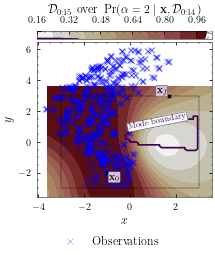

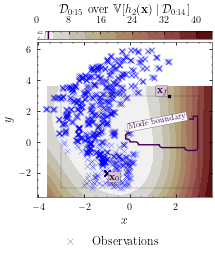

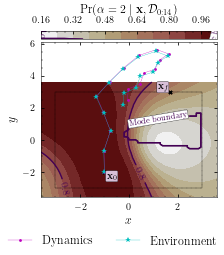

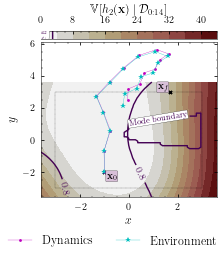

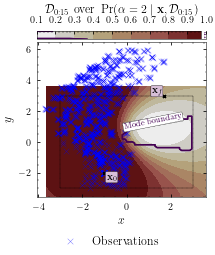

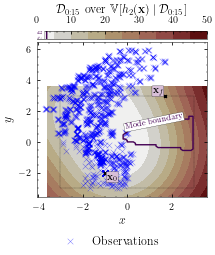

Optimisation result:
     fun: 4.056568265580893
     jac: array([-27.69042649,  10.99528454, -27.44299487,  10.97528991,
       -27.19224606,  11.0857062 , -26.94331499,  11.36417872,
       -25.9635444 ,  11.18256132, -26.09399234,  11.4558483 ,
       -25.47691625,  11.14805447, -24.96416487,  11.52872347,
       -24.66801794,  11.11920608, -23.9950885 ,  11.30795534,
       -23.88254791,  11.10920369, -17.73979127,   9.93114368,
       -17.91825505,  10.03016299,  -7.75293982,   4.73745123,
        -7.97211952,   4.78435835])
 message: 'Optimization terminated successfully'
    nfev: 57
     nit: 38
    njev: 38
  status: 0
 success: True
       x: array([-0.87101912,  6.1345259 , -0.54048094,  6.36548223, -0.17782891,
        6.07115695,  1.42823839,  5.22986242, -1.55552454,  4.75865038,
        1.75922258,  4.55326637, -0.39146158,  4.9464461 ,  2.83596603,
        3.04698649,  1.35178934,  4.5006317 ,  2.94357332,  1.37112676,
        1.77564572, -0.02696178, -1.78374191, -0.32

2022-04-22 13:46:20.701183: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 13:46:20.701200: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


3/3 [==============================] - 2s 873ms/step - loss: -991.6392 - val_loss: -954.0679


2022-04-22 13:46:21.876165: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 13:46:21.884179: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 13:46:21.890059: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_46_21

2022-04-22 13:46:21.895064: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_46_21/dr-robots-mbp.local.trace.json.gz
2022-04-22 13:46:21.912898: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_46_21

2022-04-22 13:46:21.913110: I tensorflow/core/profiler/rpc/client/s

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_16_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 22ms/step - loss: -979.3429 - val_loss: -886.7583
Epoch 3/20000
3/3 [==============================] - 0s 23ms/step - loss: -970.6143 - val_loss: -840.3648
Epoch 4/20000
3/3 [==============================] - 0s 22ms/step - loss: -884.3512 - val_loss: -910.5596
Epoch 5/20000
3/3 [==============================] - 0s 23ms/step - loss: -969.0863 - val_loss: -788.5183
Epoch 6/20000
3/3 [==============================] - 0s 26ms/step - loss: -985.1623 - val_loss: -966.5222
Epoch 7/20000
3/3 [==============================] - 0s 23ms/step - loss: -1057.8748 - val_loss: -720.5793
Epoch 8/20000
3/3 [==============================] - 0s 23ms/step - loss: -1056.7138 - val_loss: -566.8852
Epoch 9/20000
3/3 [==============================] - 0s 24ms/step - loss: -832.7172 - val_loss: 813.2532
Epoch 10/20000
3/3 [==============================] - 0s 23ms/step - loss: -281.7874 - val_loss: 2382.8857
Epoch 11/20000
3/3 [========================

Epoch 77/20000
3/3 [==============================] - 0s 22ms/step - loss: -693.3462 - val_loss: -718.1064
Epoch 78/20000
3/3 [==============================] - 0s 22ms/step - loss: -764.6597 - val_loss: -72.0803
Epoch 79/20000
3/3 [==============================] - 0s 22ms/step - loss: -742.5270 - val_loss: 354.2033
Epoch 80/20000
3/3 [==============================] - 0s 22ms/step - loss: -527.3866 - val_loss: -432.1762
Epoch 81/20000
3/3 [==============================] - 0s 22ms/step - loss: -848.7066 - val_loss: 1067.2337
Epoch 82/20000
3/3 [==============================] - 0s 22ms/step - loss: -566.7075 - val_loss: 361.6887
Epoch 83/20000
3/3 [==============================] - 0s 22ms/step - loss: -773.3236 - val_loss: -744.7995
Epoch 84/20000
3/3 [==============================] - 0s 22ms/step - loss: -755.0222 - val_loss: -752.5778
Epoch 85/20000
3/3 [==============================] - 0s 22ms/step - loss: -838.8156 - val_loss: -322.8567
Epoch 86/20000
3/3 [====================

3/3 [==============================] - 0s 28ms/step - loss: -836.3941 - val_loss: -744.4168
Epoch 154/20000
3/3 [==============================] - 0s 27ms/step - loss: -679.1386 - val_loss: -111.7442
Epoch 155/20000
3/3 [==============================] - 0s 28ms/step - loss: -853.7933 - val_loss: 212.3446
Epoch 156/20000
3/3 [==============================] - 0s 28ms/step - loss: -618.5628 - val_loss: -434.6413
Epoch 157/20000
3/3 [==============================] - 0s 28ms/step - loss: -825.6682 - val_loss: -269.6693
Epoch 158/20000
3/3 [==============================] - 0s 28ms/step - loss: -819.0901 - val_loss: -720.6154
Epoch 159/20000
3/3 [==============================] - 0s 29ms/step - loss: -843.4861 - val_loss: -698.7065
Epoch 160/20000
3/3 [==============================] - 0s 27ms/step - loss: -856.2653 - val_loss: 147.4713
Epoch 161/20000
3/3 [==============================] - 0s 29ms/step - loss: -850.4274 - val_loss: 150.5328
Epoch 162/20000
3/3 [==========================

3/3 [==============================] - 0s 28ms/step - loss: -847.5779 - val_loss: -777.5476
Epoch 230/20000
3/3 [==============================] - 0s 28ms/step - loss: -947.1669 - val_loss: -844.9348
Epoch 231/20000
3/3 [==============================] - 0s 27ms/step - loss: -929.6941 - val_loss: 519.8613
Epoch 232/20000
3/3 [==============================] - 0s 27ms/step - loss: -845.3041 - val_loss: -847.0698
Epoch 233/20000
3/3 [==============================] - 0s 28ms/step - loss: -708.5279 - val_loss: -559.8573
Epoch 234/20000
3/3 [==============================] - 0s 28ms/step - loss: -532.7572 - val_loss: 276.1467
Epoch 235/20000
3/3 [==============================] - 0s 28ms/step - loss: -334.0365 - val_loss: 268.6645
Epoch 236/20000
3/3 [==============================] - 0s 27ms/step - loss: -148.6902 - val_loss: 177.2871
Epoch 237/20000
3/3 [==============================] - 0s 28ms/step - loss: -560.3490 - val_loss: -135.5153
Epoch 238/20000
3/3 [===========================

3/3 [==============================] - 0s 26ms/step - loss: -910.9445 - val_loss: -453.8490
Epoch 306/20000
3/3 [==============================] - 0s 26ms/step - loss: -869.2279 - val_loss: -739.0593
Epoch 307/20000
3/3 [==============================] - 0s 26ms/step - loss: -892.1690 - val_loss: -819.6874
Epoch 308/20000
3/3 [==============================] - 0s 26ms/step - loss: -936.1364 - val_loss: -661.6949
Epoch 309/20000
3/3 [==============================] - 0s 26ms/step - loss: -914.2025 - val_loss: -45.8736
Epoch 310/20000
3/3 [==============================] - 0s 26ms/step - loss: -913.9156 - val_loss: -376.3305
Epoch 311/20000
3/3 [==============================] - 0s 26ms/step - loss: -927.0544 - val_loss: -897.3299
Epoch 312/20000
3/3 [==============================] - 0s 26ms/step - loss: -938.2923 - val_loss: -509.6597
Epoch 313/20000
3/3 [==============================] - 0s 27ms/step - loss: -932.3977 - val_loss: 79.8255
Epoch 314/20000
3/3 [==========================

3/3 [==============================] - 0s 28ms/step - loss: -964.1553 - val_loss: -861.7642
Epoch 382/20000
3/3 [==============================] - 0s 27ms/step - loss: -952.2883 - val_loss: -856.2320
Epoch 383/20000
3/3 [==============================] - 0s 27ms/step - loss: -982.0071 - val_loss: -908.5716
Epoch 384/20000
3/3 [==============================] - 0s 27ms/step - loss: -911.9393 - val_loss: 257.8479
Epoch 385/20000
3/3 [==============================] - 0s 28ms/step - loss: -798.4057 - val_loss: 854.7601
Epoch 386/20000
3/3 [==============================] - 0s 29ms/step - loss: -821.4522 - val_loss: -645.7394
Epoch 387/20000
3/3 [==============================] - 0s 30ms/step - loss: -892.4719 - val_loss: -684.6344
Epoch 388/20000
3/3 [==============================] - 0s 28ms/step - loss: -850.8904 - val_loss: -200.0582
Epoch 389/20000
3/3 [==============================] - 0s 28ms/step - loss: -963.5144 - val_loss: -811.2371
Epoch 390/20000
3/3 [=========================

3/3 [==============================] - 0s 27ms/step - loss: -985.0123 - val_loss: 233.2607
Epoch 458/20000
3/3 [==============================] - 0s 27ms/step - loss: -972.3365 - val_loss: -282.4980
Epoch 459/20000
3/3 [==============================] - 0s 27ms/step - loss: -915.1306 - val_loss: 341.4355
Epoch 460/20000
3/3 [==============================] - 0s 27ms/step - loss: -991.3381 - val_loss: -726.7944
Epoch 461/20000
3/3 [==============================] - 0s 28ms/step - loss: -948.7381 - val_loss: -663.1162
Epoch 462/20000
3/3 [==============================] - 0s 27ms/step - loss: -915.1446 - val_loss: -508.3613
Epoch 463/20000
3/3 [==============================] - 0s 27ms/step - loss: -1008.2737 - val_loss: -840.8706
Epoch 464/20000
3/3 [==============================] - 0s 26ms/step - loss: -968.7387 - val_loss: -471.5330
Epoch 465/20000
3/3 [==============================] - 0s 26ms/step - loss: -952.9367 - val_loss: -919.1228
Epoch 466/20000
3/3 [========================

3/3 [==============================] - 0s 29ms/step - loss: -934.7931 - val_loss: -853.7764
Epoch 534/20000
3/3 [==============================] - 0s 29ms/step - loss: -884.7363 - val_loss: -582.4096
Epoch 535/20000
3/3 [==============================] - 0s 28ms/step - loss: -911.9355 - val_loss: -881.5606
Epoch 536/20000
3/3 [==============================] - 0s 28ms/step - loss: -918.6360 - val_loss: -461.3684
Epoch 537/20000
3/3 [==============================] - 0s 28ms/step - loss: -711.5363 - val_loss: -673.6572
Epoch 538/20000
3/3 [==============================] - 0s 28ms/step - loss: -601.0769 - val_loss: -467.3929
Epoch 539/20000
3/3 [==============================] - 0s 29ms/step - loss: -767.8148 - val_loss: -742.6954
Epoch 540/20000
3/3 [==============================] - 0s 29ms/step - loss: -809.2773 - val_loss: -829.9587
Epoch 541/20000
3/3 [==============================] - 0s 29ms/step - loss: -728.8121 - val_loss: -874.2859
Epoch 542/20000
3/3 [=======================

3/3 [==============================] - 0s 29ms/step - loss: -849.5235 - val_loss: -663.8624
Epoch 610/20000
3/3 [==============================] - 0s 28ms/step - loss: -902.6728 - val_loss: -541.5078
Epoch 611/20000
3/3 [==============================] - 0s 28ms/step - loss: -984.0435 - val_loss: -491.7307
Epoch 612/20000
3/3 [==============================] - 0s 28ms/step - loss: -751.4833 - val_loss: -928.9689
Epoch 613/20000
3/3 [==============================] - 0s 27ms/step - loss: -863.8375 - val_loss: 717.3997
Epoch 614/20000
3/3 [==============================] - 0s 28ms/step - loss: -889.2119 - val_loss: -514.6672
Epoch 615/20000
3/3 [==============================] - 0s 28ms/step - loss: -895.6926 - val_loss: 168.0351
Epoch 616/20000
3/3 [==============================] - 0s 28ms/step - loss: -957.4558 - val_loss: -963.2081
Epoch 617/20000
3/3 [==============================] - 0s 28ms/step - loss: -829.2558 - val_loss: -5.6185
Epoch 618/20000
3/3 [===========================

3/3 [==============================] - 0s 32ms/step - loss: -838.2787 - val_loss: 1054.6535
Epoch 686/20000
3/3 [==============================] - 0s 30ms/step - loss: -766.5093 - val_loss: -920.8103
Epoch 687/20000
3/3 [==============================] - 0s 30ms/step - loss: -880.2475 - val_loss: 1014.4350
Epoch 688/20000
3/3 [==============================] - 0s 31ms/step - loss: -907.5987 - val_loss: -383.2199
Epoch 689/20000
3/3 [==============================] - 0s 30ms/step - loss: -976.3678 - val_loss: -1017.9258
Epoch 690/20000
3/3 [==============================] - 0s 29ms/step - loss: -945.6551 - val_loss: -807.2855
Epoch 691/20000
3/3 [==============================] - 0s 30ms/step - loss: -881.2404 - val_loss: -892.4846
Epoch 692/20000
3/3 [==============================] - 0s 31ms/step - loss: -829.7575 - val_loss: 886.4676
Epoch 693/20000
3/3 [==============================] - 0s 30ms/step - loss: -717.4996 - val_loss: -732.0681
Epoch 694/20000
3/3 [=======================

Epoch 761/20000
3/3 [==============================] - 0s 29ms/step - loss: -1047.4322 - val_loss: -27.7186
Epoch 762/20000
3/3 [==============================] - 0s 29ms/step - loss: -1071.9337 - val_loss: -719.0089
Epoch 763/20000
3/3 [==============================] - 0s 32ms/step - loss: -1070.7916 - val_loss: -757.1994
Epoch 764/20000
3/3 [==============================] - 0s 29ms/step - loss: -1044.5752 - val_loss: -806.1174
Epoch 765/20000
3/3 [==============================] - 0s 30ms/step - loss: -1029.4696 - val_loss: 180.7547
Epoch 766/20000
3/3 [==============================] - 0s 29ms/step - loss: -989.9279 - val_loss: 27.9835
Epoch 767/20000
3/3 [==============================] - 0s 29ms/step - loss: -1037.3702 - val_loss: -780.6590
Epoch 768/20000
3/3 [==============================] - 0s 30ms/step - loss: -1052.2393 - val_loss: 859.2218
Epoch 769/20000
3/3 [==============================] - 0s 28ms/step - loss: -941.8326 - val_loss: -982.5170
Epoch 770/20000
3/3 [=====

Epoch 837/20000
3/3 [==============================] - 0s 27ms/step - loss: -927.1221 - val_loss: -716.5123
Epoch 838/20000
3/3 [==============================] - 0s 28ms/step - loss: -1017.5478 - val_loss: -465.2942
Epoch 839/20000
3/3 [==============================] - 0s 27ms/step - loss: -1030.4992 - val_loss: -145.3483
Epoch 840/20000
3/3 [==============================] - 0s 27ms/step - loss: -1011.0927 - val_loss: -901.7830
Epoch 841/20000
3/3 [==============================] - 0s 27ms/step - loss: -1030.9246 - val_loss: -204.9941
Epoch 842/20000
3/3 [==============================] - 0s 27ms/step - loss: -1016.9645 - val_loss: -711.5439
Epoch 843/20000
3/3 [==============================] - 0s 27ms/step - loss: -1054.2278 - val_loss: -817.7237
Epoch 844/20000
3/3 [==============================] - 0s 27ms/step - loss: -1033.6881 - val_loss: -975.8150
Epoch 845/20000
3/3 [==============================] - 0s 27ms/step - loss: -1046.9770 - val_loss: -310.6998
Epoch 846/20000
3/3 

Epoch 913/20000
3/3 [==============================] - 0s 28ms/step - loss: -1004.2783 - val_loss: -881.9026
Epoch 914/20000
3/3 [==============================] - 0s 28ms/step - loss: -869.4082 - val_loss: -270.5544
Epoch 915/20000
3/3 [==============================] - 0s 29ms/step - loss: -971.5669 - val_loss: -480.8210
Epoch 916/20000
3/3 [==============================] - 0s 28ms/step - loss: -981.4008 - val_loss: -36.9470
Epoch 917/20000
3/3 [==============================] - 0s 27ms/step - loss: -1002.4032 - val_loss: -701.8156
Epoch 918/20000
3/3 [==============================] - 0s 28ms/step - loss: -1019.2479 - val_loss: -234.1623
Epoch 919/20000
3/3 [==============================] - 0s 28ms/step - loss: -924.6942 - val_loss: 231.1179
Epoch 920/20000
3/3 [==============================] - 0s 29ms/step - loss: -1005.4817 - val_loss: -915.4453
Epoch 921/20000
3/3 [==============================] - 0s 30ms/step - loss: -976.5488 - val_loss: -984.5891
Epoch 922/20000
3/3 [=====

3/3 [==============================] - 0s 27ms/step - loss: -954.5400 - val_loss: -215.0864
Epoch 989/20000
3/3 [==============================] - 0s 27ms/step - loss: -1017.4381 - val_loss: -701.6865
Epoch 990/20000
3/3 [==============================] - 0s 27ms/step - loss: -960.2363 - val_loss: -682.5580
Epoch 991/20000
3/3 [==============================] - 0s 27ms/step - loss: -963.8765 - val_loss: -765.3405
Epoch 992/20000
3/3 [==============================] - 0s 29ms/step - loss: -1034.6552 - val_loss: -810.1726
Epoch 993/20000
3/3 [==============================] - 0s 28ms/step - loss: -962.2202 - val_loss: -743.2965
Epoch 994/20000
3/3 [==============================] - 0s 29ms/step - loss: -1014.5846 - val_loss: -107.9778
Epoch 995/20000
3/3 [==============================] - 0s 28ms/step - loss: -932.5829 - val_loss: -557.7597
Epoch 996/20000
3/3 [==============================] - 0s 27ms/step - loss: -836.2866 - val_loss: -863.5724
Epoch 997/20000
3/3 [====================

3/3 [==============================] - 0s 27ms/step - loss: -1019.5136 - val_loss: 139.0363
Epoch 1064/20000
3/3 [==============================] - 0s 27ms/step - loss: -1068.4874 - val_loss: -959.3346
Epoch 1065/20000
3/3 [==============================] - 0s 27ms/step - loss: -945.0979 - val_loss: -351.7901
Epoch 1066/20000
3/3 [==============================] - 0s 27ms/step - loss: -978.1441 - val_loss: -734.7616
Epoch 1067/20000
3/3 [==============================] - 0s 27ms/step - loss: -909.1980 - val_loss: -232.0124
Epoch 1068/20000
3/3 [==============================] - 0s 26ms/step - loss: -1002.4581 - val_loss: -605.0620
Epoch 1069/20000
3/3 [==============================] - 0s 27ms/step - loss: -1017.9796 - val_loss: 82.6135
Epoch 1070/20000
3/3 [==============================] - 0s 27ms/step - loss: -926.9255 - val_loss: -998.0923
Epoch 1071/20000
3/3 [==============================] - 0s 28ms/step - loss: -758.6893 - val_loss: -963.0450
Epoch 1072/20000
3/3 [=============

3/3 [==============================] - 0s 28ms/step - loss: -1074.0563 - val_loss: -880.8774
Epoch 1139/20000
3/3 [==============================] - 0s 29ms/step - loss: -1051.7379 - val_loss: 111.6116
Epoch 1140/20000
3/3 [==============================] - 0s 28ms/step - loss: -1081.2844 - val_loss: -286.2224
Epoch 1141/20000
3/3 [==============================] - 0s 28ms/step - loss: -1053.0691 - val_loss: 419.6588
Epoch 1142/20000
3/3 [==============================] - 0s 28ms/step - loss: -1078.2845 - val_loss: -885.8088
Epoch 1143/20000
3/3 [==============================] - 0s 27ms/step - loss: -1088.1875 - val_loss: -468.4024
Epoch 1144/20000
3/3 [==============================] - 0s 27ms/step - loss: -937.2957 - val_loss: -1006.9781
Epoch 1145/20000
3/3 [==============================] - 0s 28ms/step - loss: -1061.7188 - val_loss: -944.9607
Epoch 1146/20000
3/3 [==============================] - 0s 28ms/step - loss: -993.2789 - val_loss: -917.2692
Epoch 1147/20000
3/3 [========

3/3 [==============================] - 0s 37ms/step - loss: -1045.2766 - val_loss: -730.6031
Epoch 1214/20000
3/3 [==============================] - 0s 31ms/step - loss: -1038.3060 - val_loss: -902.7594
Epoch 1215/20000
3/3 [==============================] - 0s 31ms/step - loss: -992.1742 - val_loss: -273.5442
Epoch 1216/20000
3/3 [==============================] - 0s 33ms/step - loss: -868.4533 - val_loss: -1005.2160
Epoch 1217/20000
3/3 [==============================] - 0s 30ms/step - loss: -1039.0646 - val_loss: -1013.9322
Epoch 1218/20000
3/3 [==============================] - 0s 30ms/step - loss: -911.9672 - val_loss: -933.8136
Epoch 1219/20000
3/3 [==============================] - 0s 30ms/step - loss: -972.4909 - val_loss: -902.8848
Epoch 1220/20000
3/3 [==============================] - 0s 31ms/step - loss: -937.9096 - val_loss: -659.6680
Epoch 1221/20000
3/3 [==============================] - 0s 30ms/step - loss: -1047.6036 - val_loss: -661.1790
Epoch 1222/20000
3/3 [========

3/3 [==============================] - 0s 28ms/step - loss: -940.2045 - val_loss: -656.2624
Epoch 1289/20000
3/3 [==============================] - 0s 29ms/step - loss: -751.3758 - val_loss: -198.1271
Epoch 1290/20000
3/3 [==============================] - 0s 29ms/step - loss: -901.4091 - val_loss: -972.1594
Epoch 1291/20000
3/3 [==============================] - 0s 29ms/step - loss: -834.3245 - val_loss: -954.9831
Epoch 1292/20000
3/3 [==============================] - 0s 29ms/step - loss: -771.6533 - val_loss: -706.6162
Epoch 1293/20000
3/3 [==============================] - 0s 29ms/step - loss: -350.6513 - val_loss: -480.2214
Epoch 1294/20000
3/3 [==============================] - 0s 29ms/step - loss: -924.4128 - val_loss: -704.1581
Epoch 1295/20000
3/3 [==============================] - 0s 29ms/step - loss: -849.8630 - val_loss: -211.6106
Epoch 1296/20000
3/3 [==============================] - 0s 29ms/step - loss: -340.4994 - val_loss: -764.5213
Epoch 1297/20000
3/3 [==============

Epoch 1363/20000
3/3 [==============================] - 0s 26ms/step - loss: -887.1920 - val_loss: -675.1410
Epoch 1364/20000
3/3 [==============================] - 0s 27ms/step - loss: -1041.6052 - val_loss: -797.9791
Epoch 1365/20000
3/3 [==============================] - 0s 28ms/step - loss: -811.4496 - val_loss: -580.2105
Epoch 1366/20000
3/3 [==============================] - 0s 28ms/step - loss: -364.7846 - val_loss: 251.1320
Epoch 1367/20000
3/3 [==============================] - 0s 27ms/step - loss: -953.5822 - val_loss: -788.2354
Epoch 1368/20000
3/3 [==============================] - 0s 26ms/step - loss: -818.0820 - val_loss: -976.3466
Epoch 1369/20000
3/3 [==============================] - 0s 27ms/step - loss: -817.4491 - val_loss: -748.7309
Epoch 1370/20000
3/3 [==============================] - 0s 27ms/step - loss: -951.8890 - val_loss: -93.0947
Epoch 1371/20000
3/3 [==============================] - 0s 28ms/step - loss: -921.9913 - val_loss: 172.5807
Epoch 1372/20000
3/3 

3/3 [==============================] - 0s 26ms/step - loss: -1040.6943 - val_loss: -1001.8261
Epoch 1439/20000
3/3 [==============================] - 0s 26ms/step - loss: -901.2088 - val_loss: -927.7700
Epoch 1440/20000
3/3 [==============================] - 0s 26ms/step - loss: -1017.1172 - val_loss: -969.5834
Epoch 1441/20000
3/3 [==============================] - 0s 27ms/step - loss: -1061.2607 - val_loss: -955.4661
Epoch 1442/20000
3/3 [==============================] - 0s 26ms/step - loss: -1022.2061 - val_loss: -703.0209
Epoch 1443/20000
3/3 [==============================] - 0s 27ms/step - loss: -1001.9409 - val_loss: -930.7055
Epoch 1444/20000
3/3 [==============================] - 0s 27ms/step - loss: -1003.1043 - val_loss: -331.0126
Epoch 1445/20000
3/3 [==============================] - 0s 26ms/step - loss: -1057.6535 - val_loss: -970.7030
Epoch 1446/20000
3/3 [==============================] - 0s 26ms/step - loss: -1032.9388 - val_loss: -833.5697
Epoch 1447/20000
3/3 [=====

Epoch 1513/20000
3/3 [==============================] - 0s 27ms/step - loss: -938.3764 - val_loss: -962.7380
Epoch 1514/20000
3/3 [==============================] - 0s 27ms/step - loss: -897.9567 - val_loss: -701.2320
Epoch 1515/20000
3/3 [==============================] - 0s 27ms/step - loss: -949.9778 - val_loss: -1046.5025
Epoch 1516/20000
3/3 [==============================] - 0s 27ms/step - loss: -1086.0683 - val_loss: -1045.3811
Epoch 1517/20000
3/3 [==============================] - 0s 27ms/step - loss: -1045.2083 - val_loss: -908.8109
Epoch 1518/20000
3/3 [==============================] - 0s 27ms/step - loss: -1026.0304 - val_loss: -599.3875
Epoch 1519/20000
3/3 [==============================] - 0s 27ms/step - loss: -1004.7117 - val_loss: -948.8133
Epoch 1520/20000
3/3 [==============================] - 0s 27ms/step - loss: -975.6146 - val_loss: -931.8867
Epoch 1521/20000
3/3 [==============================] - 0s 27ms/step - loss: -1005.5434 - val_loss: -717.4660
Epoch 1522/2

Epoch 1588/20000
3/3 [==============================] - 0s 30ms/step - loss: -1106.6153 - val_loss: -1036.7066
Epoch 1589/20000
3/3 [==============================] - 0s 30ms/step - loss: -1076.4234 - val_loss: -827.6108
Epoch 1590/20000
3/3 [==============================] - 0s 29ms/step - loss: -1079.4106 - val_loss: -306.0872
Epoch 1591/20000
3/3 [==============================] - 0s 30ms/step - loss: -1117.2445 - val_loss: -937.3862
Epoch 1592/20000
3/3 [==============================] - 0s 30ms/step - loss: -1101.1994 - val_loss: -886.0744
Epoch 1593/20000
3/3 [==============================] - 0s 30ms/step - loss: -1091.3317 - val_loss: -845.4078
Epoch 1594/20000
3/3 [==============================] - 0s 30ms/step - loss: -1091.7202 - val_loss: -830.8972
Epoch 1595/20000
3/3 [==============================] - 0s 30ms/step - loss: -1109.1711 - val_loss: -937.0793
Epoch 1596/20000
3/3 [==============================] - 0s 29ms/step - loss: -1095.1910 - val_loss: -512.9719
Epoch 159

Epoch 1663/20000
3/3 [==============================] - 0s 29ms/step - loss: -1014.9432 - val_loss: -955.9350
Epoch 1664/20000
3/3 [==============================] - 0s 29ms/step - loss: -947.4667 - val_loss: -402.4842
Epoch 1665/20000
3/3 [==============================] - 0s 29ms/step - loss: -1022.5267 - val_loss: -862.5107
Epoch 1666/20000
3/3 [==============================] - 0s 29ms/step - loss: -987.3109 - val_loss: -719.8694
Epoch 1667/20000
3/3 [==============================] - 0s 28ms/step - loss: -1023.6748 - val_loss: -709.0710
Epoch 1668/20000
3/3 [==============================] - 0s 29ms/step - loss: -1013.2462 - val_loss: -813.3402
Epoch 1669/20000
3/3 [==============================] - 0s 29ms/step - loss: -996.8051 - val_loss: -887.1632
Epoch 1670/20000
3/3 [==============================] - 0s 29ms/step - loss: -1010.8161 - val_loss: -904.9768
Epoch 1671/20000
3/3 [==============================] - 0s 28ms/step - loss: -1008.1177 - val_loss: -1008.0517
Epoch 1672/2

3/3 [==============================] - 0s 28ms/step - loss: -719.2802 - val_loss: -748.8678
Epoch 1738/20000
3/3 [==============================] - 0s 28ms/step - loss: -941.4146 - val_loss: -888.9146
Epoch 1739/20000
3/3 [==============================] - 0s 29ms/step - loss: -880.2888 - val_loss: -521.9889
Epoch 1740/20000
3/3 [==============================] - 0s 28ms/step - loss: -891.1255 - val_loss: -1018.0044
Epoch 1741/20000
3/3 [==============================] - 0s 29ms/step - loss: -990.5338 - val_loss: -896.0910
Epoch 1742/20000
3/3 [==============================] - 0s 28ms/step - loss: -876.6841 - val_loss: -223.3137
Epoch 1743/20000
3/3 [==============================] - 0s 28ms/step - loss: -949.2407 - val_loss: -958.2434
Epoch 1744/20000
3/3 [==============================] - 0s 28ms/step - loss: -814.7005 - val_loss: -776.7081
Epoch 1745/20000
3/3 [==============================] - 0s 28ms/step - loss: -747.7571 - val_loss: -970.9034
Epoch 1746/20000
3/3 [=============

3/3 [==============================] - 0s 29ms/step - loss: -974.0995 - val_loss: -836.8437
Epoch 1812/20000
3/3 [==============================] - 0s 30ms/step - loss: -963.7408 - val_loss: -1016.5719
Epoch 1813/20000
3/3 [==============================] - 0s 28ms/step - loss: -990.1416 - val_loss: -976.7177
Epoch 1814/20000
3/3 [==============================] - 0s 28ms/step - loss: -882.8342 - val_loss: -1050.6061
Epoch 1815/20000
3/3 [==============================] - 0s 30ms/step - loss: -1041.0148 - val_loss: -74.1637
Epoch 1816/20000
3/3 [==============================] - 0s 27ms/step - loss: -506.2558 - val_loss: -496.9424
Epoch 1817/20000
3/3 [==============================] - 0s 29ms/step - loss: -939.1823 - val_loss: -959.2023
Epoch 1818/20000
3/3 [==============================] - 0s 29ms/step - loss: -854.4628 - val_loss: -780.9845
Epoch 1819/20000
3/3 [==============================] - 0s 28ms/step - loss: -719.0340 - val_loss: -342.4056
Epoch 1820/20000
3/3 [============

Epoch 1886/20000
3/3 [==============================] - 0s 28ms/step - loss: -1047.9082 - val_loss: -922.9517
Epoch 1887/20000
3/3 [==============================] - 0s 28ms/step - loss: -1019.0708 - val_loss: -909.3783
Epoch 1888/20000
3/3 [==============================] - 0s 27ms/step - loss: -1010.2557 - val_loss: -558.3211
Epoch 1889/20000
3/3 [==============================] - 0s 28ms/step - loss: -916.7521 - val_loss: -918.3880
Epoch 1890/20000
3/3 [==============================] - 0s 27ms/step - loss: -1030.6017 - val_loss: -706.8418
Epoch 1891/20000
3/3 [==============================] - 0s 28ms/step - loss: -1065.8833 - val_loss: -636.4791
Epoch 1892/20000
3/3 [==============================] - 0s 28ms/step - loss: -1055.1988 - val_loss: -904.7739
Epoch 1893/20000
3/3 [==============================] - 0s 27ms/step - loss: -983.0465 - val_loss: -973.0884
Epoch 1894/20000
3/3 [==============================] - 0s 28ms/step - loss: -1008.9520 - val_loss: -874.0302
Epoch 1895/2

3/3 [==============================] - 0s 28ms/step - loss: -1005.6545 - val_loss: -1060.6933
Epoch 1961/20000
3/3 [==============================] - 0s 28ms/step - loss: -1027.5871 - val_loss: -964.3262
Epoch 1962/20000
3/3 [==============================] - 0s 28ms/step - loss: -1045.5467 - val_loss: -1029.1374
Epoch 1963/20000
3/3 [==============================] - 0s 28ms/step - loss: -1028.8385 - val_loss: -992.6532
Epoch 1964/20000
3/3 [==============================] - 0s 27ms/step - loss: -1081.2260 - val_loss: -955.2660
Epoch 1965/20000
3/3 [==============================] - 0s 28ms/step - loss: -1058.1230 - val_loss: -997.5275
Epoch 1966/20000
3/3 [==============================] - 0s 28ms/step - loss: -1057.2316 - val_loss: -997.5750
Epoch 1967/20000
3/3 [==============================] - 0s 28ms/step - loss: -1006.1325 - val_loss: -1034.9355
Epoch 1968/20000
3/3 [==============================] - 0s 28ms/step - loss: -1050.4446 - val_loss: -623.3379
Epoch 1969/20000
3/3 [==

/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2002/20000
3/3 [==============================] - 0s 22ms/step - loss: -974.3436 - val_loss: -932.6858
Epoch 2003/20000
3/3 [==============================] - 0s 22ms/step - loss: -1061.8111 - val_loss: -379.0556
Epoch 2004/20000
3/3 [==============================] - 0s 23ms/step - loss: -1045.4379 - val_loss: -741.1589
Epoch 2005/20000
3/3 [==============================] - 0s 22ms/step - loss: -1015.2674 - val_loss: -766.4225
Epoch 2006/20000
3/3 [==============================] - 0s 23ms/step - loss: -1065.4716 - val_loss: -882.0054
Epoch 2007/20000
3/3 [==============================] - 0s 22ms/step - loss: -1043.4871 - val_loss: -832.8146
Epoch 2008/20000
3/3 [==============================] - 0s 22ms/step - loss: -992.2154 - val_loss: -867.0771
Epoch 2009/20000
3/3 [==============================] - 0s 22ms/step - loss: -934.2159 - val_loss: -401.9720
Epoch 2010/20000
3/3 [==============================] - 0s 22ms/step - loss: -484.9712 - val_loss: -554.5893
Epoch 2011/200

3/3 [==============================] - 0s 25ms/step - loss: -1113.8264 - val_loss: -926.8014
Epoch 2077/20000
3/3 [==============================] - 0s 24ms/step - loss: -1080.4718 - val_loss: -1015.8440
Epoch 2078/20000
3/3 [==============================] - 0s 24ms/step - loss: -1091.1797 - val_loss: -1070.0334
Epoch 2079/20000
3/3 [==============================] - 0s 25ms/step - loss: -1082.4964 - val_loss: -1004.6155
Epoch 2080/20000
3/3 [==============================] - 0s 24ms/step - loss: -1108.0850 - val_loss: -906.2555
Epoch 2081/20000
3/3 [==============================] - 0s 24ms/step - loss: -1098.1435 - val_loss: -981.4944
Epoch 2082/20000
3/3 [==============================] - 0s 22ms/step - loss: -1084.7542 - val_loss: -806.4739
Epoch 2083/20000
3/3 [==============================] - 0s 22ms/step - loss: -1029.6243 - val_loss: -944.5718
Epoch 2084/20000
3/3 [==============================] - 0s 22ms/step - loss: -1084.0719 - val_loss: -867.6807
Epoch 2085/20000
3/3 [==

Epoch 2151/20000
3/3 [==============================] - 0s 26ms/step - loss: -1076.0686 - val_loss: -1064.2295
Epoch 2152/20000
3/3 [==============================] - 0s 27ms/step - loss: -1085.8747 - val_loss: -1035.0684
Epoch 2153/20000
3/3 [==============================] - 0s 26ms/step - loss: -1099.9711 - val_loss: -910.7579
Epoch 2154/20000
3/3 [==============================] - 0s 25ms/step - loss: -1096.2558 - val_loss: -810.8000
Epoch 2155/20000
3/3 [==============================] - 0s 25ms/step - loss: -1101.6343 - val_loss: -998.1563
Epoch 2156/20000
3/3 [==============================] - 0s 25ms/step - loss: -1100.3869 - val_loss: -1074.9357
Epoch 2157/20000
3/3 [==============================] - 0s 25ms/step - loss: -1107.0988 - val_loss: -1034.2982
Epoch 2158/20000
3/3 [==============================] - 0s 25ms/step - loss: -1114.3412 - val_loss: -1060.5511
Epoch 2159/20000
3/3 [==============================] - 0s 26ms/step - loss: -1103.5337 - val_loss: -1051.1030
Epoc

3/3 [==============================] - 0s 27ms/step - loss: -862.4317 - val_loss: -517.7118
Epoch 2226/20000
3/3 [==============================] - 0s 27ms/step - loss: -985.1445 - val_loss: -1026.0356
Epoch 2227/20000
3/3 [==============================] - 0s 27ms/step - loss: -972.4912 - val_loss: -91.4105
Epoch 2228/20000
3/3 [==============================] - 0s 26ms/step - loss: -882.0033 - val_loss: -957.6893
Epoch 2229/20000
3/3 [==============================] - 0s 26ms/step - loss: -854.8255 - val_loss: -1034.0096
Epoch 2230/20000
3/3 [==============================] - 0s 26ms/step - loss: -970.6747 - val_loss: -947.9060
Epoch 2231/20000
3/3 [==============================] - 0s 26ms/step - loss: -921.3927 - val_loss: -955.8127
Epoch 2232/20000
3/3 [==============================] - 0s 26ms/step - loss: -979.9611 - val_loss: -507.8461
Epoch 2233/20000
3/3 [==============================] - 0s 26ms/step - loss: -1044.6898 - val_loss: -1045.8917
Epoch 2234/20000
3/3 [===========

3/3 [==============================] - 0s 27ms/step - loss: -1044.3293 - val_loss: -1003.8818
Epoch 2300/20000
3/3 [==============================] - 0s 27ms/step - loss: -1099.3070 - val_loss: -900.6330
Epoch 2301/20000
3/3 [==============================] - 0s 27ms/step - loss: -1071.8388 - val_loss: -1008.3822
Epoch 2302/20000
3/3 [==============================] - 0s 26ms/step - loss: -1100.9184 - val_loss: -1031.3778
Epoch 2303/20000
3/3 [==============================] - 0s 27ms/step - loss: -1081.2005 - val_loss: -756.9385
Epoch 2304/20000
3/3 [==============================] - 0s 26ms/step - loss: -1042.6956 - val_loss: -975.8515
Epoch 2305/20000
3/3 [==============================] - 0s 26ms/step - loss: -1094.6016 - val_loss: -1074.4473
Epoch 2306/20000
3/3 [==============================] - 0s 27ms/step - loss: -1107.1271 - val_loss: -1038.2657
Epoch 2307/20000
3/3 [==============================] - 0s 27ms/step - loss: -1109.9989 - val_loss: -1053.3879
Epoch 2308/20000
3/3 

3/3 [==============================] - 0s 26ms/step - loss: -1087.2134 - val_loss: -1005.5141
Epoch 2374/20000
3/3 [==============================] - 0s 26ms/step - loss: -1083.1169 - val_loss: -971.7687
Epoch 2375/20000
3/3 [==============================] - 0s 27ms/step - loss: -1078.2814 - val_loss: -1074.2328
Epoch 2376/20000
3/3 [==============================] - 0s 26ms/step - loss: -1098.6588 - val_loss: -1072.0809
Epoch 2377/20000
3/3 [==============================] - 0s 26ms/step - loss: -1112.6641 - val_loss: -1031.1901
Epoch 2378/20000
3/3 [==============================] - 0s 27ms/step - loss: -1109.0680 - val_loss: -1020.9347
Epoch 2379/20000
3/3 [==============================] - 0s 26ms/step - loss: -1018.6550 - val_loss: -1090.4576
Epoch 2380/20000
3/3 [==============================] - 0s 27ms/step - loss: -1094.7022 - val_loss: -1074.8991
Epoch 2381/20000
3/3 [==============================] - 0s 26ms/step - loss: -1038.9476 - val_loss: -1054.4601
Epoch 2382/20000
3/

3/3 [==============================] - 0s 30ms/step - loss: -419.2720 - val_loss: -646.9027
Epoch 2448/20000
3/3 [==============================] - 0s 30ms/step - loss: -1043.1955 - val_loss: -1002.3556
Epoch 2449/20000
3/3 [==============================] - 0s 30ms/step - loss: -1071.0442 - val_loss: 124.5958
Epoch 2450/20000
3/3 [==============================] - 0s 30ms/step - loss: -818.6315 - val_loss: -1006.7669
Epoch 2451/20000
3/3 [==============================] - 0s 29ms/step - loss: -915.1538 - val_loss: -869.4400
Epoch 2452/20000
3/3 [==============================] - 0s 30ms/step - loss: -684.5625 - val_loss: -205.4792
Epoch 2453/20000
3/3 [==============================] - 0s 30ms/step - loss: -269.6881 - val_loss: -740.4773
Epoch 2454/20000
3/3 [==============================] - 0s 30ms/step - loss: -704.0710 - val_loss: -371.4776
Epoch 2455/20000
3/3 [==============================] - 0s 28ms/step - loss: -123.4159 - val_loss: -712.4271
Epoch 2456/20000
3/3 [===========

3/3 [==============================] - 0s 27ms/step - loss: -1129.5058 - val_loss: -1023.2525
Epoch 2522/20000
3/3 [==============================] - 0s 27ms/step - loss: -1078.7971 - val_loss: -1046.8678
Epoch 2523/20000
3/3 [==============================] - 0s 27ms/step - loss: -1099.6056 - val_loss: -878.0877
Epoch 2524/20000
3/3 [==============================] - 0s 28ms/step - loss: -1090.3224 - val_loss: -985.7767
Epoch 2525/20000
3/3 [==============================] - 0s 27ms/step - loss: -1137.6650 - val_loss: -879.2862
Epoch 2526/20000
3/3 [==============================] - 0s 27ms/step - loss: -888.3256 - val_loss: -533.2651
Epoch 2527/20000
3/3 [==============================] - 0s 27ms/step - loss: -879.0654 - val_loss: -911.8628
Epoch 2528/20000
3/3 [==============================] - 0s 27ms/step - loss: -1013.7723 - val_loss: -650.0185
Epoch 2529/20000
3/3 [==============================] - 0s 27ms/step - loss: -677.4198 - val_loss: -981.7297
Epoch 2530/20000
3/3 [======

Epoch 2596/20000
3/3 [==============================] - 0s 28ms/step - loss: -1094.3366 - val_loss: -1022.4722
Epoch 2597/20000
3/3 [==============================] - 0s 27ms/step - loss: -1100.8470 - val_loss: -864.4479
Epoch 2598/20000
3/3 [==============================] - 0s 27ms/step - loss: -1091.6498 - val_loss: -986.1400
Epoch 2599/20000
3/3 [==============================] - 0s 27ms/step - loss: -1099.5288 - val_loss: -1055.7421
Epoch 2600/20000
3/3 [==============================] - 0s 28ms/step - loss: -1117.7141 - val_loss: -962.4815
Epoch 2601/20000
3/3 [==============================] - 0s 29ms/step - loss: -1083.9880 - val_loss: -827.5748
Epoch 2602/20000
3/3 [==============================] - 0s 28ms/step - loss: -1117.8258 - val_loss: -995.2392
Epoch 2603/20000
3/3 [==============================] - 0s 27ms/step - loss: -1109.1678 - val_loss: -1027.9037
Epoch 2604/20000
3/3 [==============================] - 0s 28ms/step - loss: -1118.0451 - val_loss: -999.3528
Epoch 2

3/3 [==============================] - 0s 29ms/step - loss: -1081.1848 - val_loss: -847.6455
Epoch 2671/20000
3/3 [==============================] - 0s 30ms/step - loss: -1000.5361 - val_loss: -962.1734
Epoch 2672/20000
3/3 [==============================] - 0s 29ms/step - loss: -1003.4005 - val_loss: -927.9921
Epoch 2673/20000
3/3 [==============================] - 0s 30ms/step - loss: -966.3611 - val_loss: -823.1538
Epoch 2674/20000
3/3 [==============================] - 0s 30ms/step - loss: -1012.7056 - val_loss: -1041.3489
Epoch 2675/20000
3/3 [==============================] - 0s 31ms/step - loss: -993.7854 - val_loss: -1013.5263
Epoch 2676/20000
3/3 [==============================] - 0s 30ms/step - loss: -1048.4359 - val_loss: -1006.5036
Epoch 2677/20000
3/3 [==============================] - 0s 29ms/step - loss: -1038.0196 - val_loss: -906.4236
Epoch 2678/20000
3/3 [==============================] - 0s 29ms/step - loss: -970.9095 - val_loss: -1020.4708
Epoch 2679/20000
3/3 [====

3/3 [==============================] - 0s 28ms/step - loss: -1052.0258 - val_loss: -983.9554
Epoch 2745/20000
3/3 [==============================] - 0s 28ms/step - loss: -1021.0583 - val_loss: -1003.8695
Epoch 2746/20000
3/3 [==============================] - 0s 29ms/step - loss: -1072.6091 - val_loss: -991.2573
Epoch 2747/20000
3/3 [==============================] - 0s 28ms/step - loss: -1063.2676 - val_loss: -972.8436
Epoch 2748/20000
3/3 [==============================] - 0s 28ms/step - loss: -1052.3931 - val_loss: -782.8421
Epoch 2749/20000
3/3 [==============================] - 0s 28ms/step - loss: -1059.2216 - val_loss: -976.2972
Epoch 2750/20000
3/3 [==============================] - 0s 28ms/step - loss: -1083.8896 - val_loss: -963.8748
Epoch 2751/20000
3/3 [==============================] - 0s 28ms/step - loss: -1067.5187 - val_loss: -1006.9211
Epoch 2752/20000
3/3 [==============================] - 0s 27ms/step - loss: -1095.1062 - val_loss: -1011.3027
Epoch 2753/20000
3/3 [==

Epoch 2819/20000
3/3 [==============================] - 0s 28ms/step - loss: -1085.3605 - val_loss: -1033.7412
Epoch 2820/20000
3/3 [==============================] - 0s 28ms/step - loss: -1097.7448 - val_loss: -1048.5071
Epoch 2821/20000
3/3 [==============================] - 0s 28ms/step - loss: -1102.3070 - val_loss: -968.2771
Epoch 2822/20000
3/3 [==============================] - 0s 29ms/step - loss: -1053.1260 - val_loss: -796.5178
Epoch 2823/20000
3/3 [==============================] - 0s 28ms/step - loss: -975.9690 - val_loss: -945.1516
Epoch 2824/20000
3/3 [==============================] - 0s 29ms/step - loss: -1049.8551 - val_loss: -725.6226
Epoch 2825/20000
3/3 [==============================] - 0s 28ms/step - loss: -987.6931 - val_loss: -1000.2866
Epoch 2826/20000
3/3 [==============================] - 0s 29ms/step - loss: -1036.1962 - val_loss: -796.8749
Epoch 2827/20000
3/3 [==============================] - 0s 28ms/step - loss: -1083.7000 - val_loss: -1047.8662
Epoch 28

3/3 [==============================] - 0s 28ms/step - loss: -1004.5126 - val_loss: -786.5162
Epoch 2894/20000
3/3 [==============================] - 0s 28ms/step - loss: -1013.2273 - val_loss: -910.6273
Epoch 2895/20000
3/3 [==============================] - 0s 28ms/step - loss: -1035.7616 - val_loss: -897.2330
Epoch 2896/20000
3/3 [==============================] - 0s 28ms/step - loss: -1032.0674 - val_loss: -985.7551
Epoch 2897/20000
3/3 [==============================] - 0s 28ms/step - loss: -1041.4582 - val_loss: -906.9345
Epoch 2898/20000
3/3 [==============================] - 0s 28ms/step - loss: -1049.7938 - val_loss: -933.9642
Epoch 2899/20000
3/3 [==============================] - 0s 28ms/step - loss: -1050.8501 - val_loss: -992.6558
Epoch 2900/20000
3/3 [==============================] - 0s 30ms/step - loss: -1052.4254 - val_loss: -946.0426
Epoch 2901/20000
3/3 [==============================] - 0s 28ms/step - loss: -1061.5767 - val_loss: -1007.4582
Epoch 2902/20000
3/3 [====

3/3 [==============================] - 0s 32ms/step - loss: -1110.8394 - val_loss: -1014.3310
Epoch 2968/20000
3/3 [==============================] - 0s 31ms/step - loss: -1078.8410 - val_loss: -998.0224
Epoch 2969/20000
3/3 [==============================] - 0s 31ms/step - loss: -1126.4675 - val_loss: -1034.0242
Epoch 2970/20000
3/3 [==============================] - 0s 30ms/step - loss: -1108.3980 - val_loss: -960.1689
Epoch 2971/20000
3/3 [==============================] - 0s 32ms/step - loss: -1136.4422 - val_loss: -983.7941
Epoch 2972/20000
3/3 [==============================] - 0s 30ms/step - loss: -1107.6263 - val_loss: -1014.3573
Epoch 2973/20000
3/3 [==============================] - 0s 30ms/step - loss: -1121.3701 - val_loss: -1065.8683
Epoch 2974/20000
3/3 [==============================] - 0s 30ms/step - loss: -1118.9015 - val_loss: -1047.8404
Epoch 2975/20000
3/3 [==============================] - 0s 31ms/step - loss: -1129.7417 - val_loss: -895.7416
Epoch 2976/20000
3/3 [

Epoch 3042/20000
3/3 [==============================] - 0s 30ms/step - loss: -856.3171 - val_loss: 85.9233
Epoch 3043/20000
3/3 [==============================] - 0s 28ms/step - loss: -806.0763 - val_loss: -304.1340
Epoch 3044/20000
3/3 [==============================] - 0s 28ms/step - loss: -768.9136 - val_loss: -793.2774
Epoch 3045/20000
3/3 [==============================] - 0s 28ms/step - loss: -798.4390 - val_loss: 329.1307
Epoch 3046/20000
3/3 [==============================] - 0s 28ms/step - loss: -571.0236 - val_loss: -165.7206
Epoch 3047/20000
3/3 [==============================] - 0s 28ms/step - loss: -633.3767 - val_loss: -636.4041
Epoch 3048/20000
3/3 [==============================] - 0s 28ms/step - loss: -861.1994 - val_loss: 1154.4522
Epoch 3049/20000
3/3 [==============================] - 0s 29ms/step - loss: -595.4268 - val_loss: -280.2380
Epoch 3050/20000
3/3 [==============================] - 0s 28ms/step - loss: -775.0099 - val_loss: 729.2024
Epoch 3051/20000
3/3 [=

3/3 [==============================] - 0s 28ms/step - loss: -1022.5712 - val_loss: -761.9161
Epoch 3118/20000
3/3 [==============================] - 0s 28ms/step - loss: -986.0930 - val_loss: -996.5295
Epoch 3119/20000
3/3 [==============================] - 0s 28ms/step - loss: -1018.6967 - val_loss: 559.7500
Epoch 3120/20000
3/3 [==============================] - 0s 28ms/step - loss: -1029.9655 - val_loss: -974.8362
Epoch 3121/20000
3/3 [==============================] - 0s 28ms/step - loss: -937.1087 - val_loss: -964.3652
Epoch 3122/20000
3/3 [==============================] - 0s 28ms/step - loss: -966.6338 - val_loss: -868.4143
Epoch 3123/20000
3/3 [==============================] - 0s 28ms/step - loss: -978.5811 - val_loss: -585.2657
Epoch 3124/20000
3/3 [==============================] - 0s 28ms/step - loss: -953.0215 - val_loss: 211.0661
Epoch 3125/20000
3/3 [==============================] - 0s 28ms/step - loss: -1032.1211 - val_loss: -973.5321
Epoch 3126/20000
3/3 [============

3/3 [==============================] - 0s 29ms/step - loss: -974.6453 - val_loss: 77.2637
Epoch 3193/20000
3/3 [==============================] - 0s 31ms/step - loss: -736.3238 - val_loss: -245.8548
Epoch 3194/20000
3/3 [==============================] - 0s 31ms/step - loss: -882.4397 - val_loss: -766.4176
Epoch 3195/20000
3/3 [==============================] - 0s 29ms/step - loss: -999.3256 - val_loss: -232.1706
Epoch 3196/20000
3/3 [==============================] - 0s 31ms/step - loss: -854.1144 - val_loss: -776.0543
Epoch 3197/20000
3/3 [==============================] - 0s 29ms/step - loss: -968.5836 - val_loss: -867.2550
Epoch 3198/20000
3/3 [==============================] - 0s 29ms/step - loss: -958.0116 - val_loss: -30.8028
Epoch 3199/20000
3/3 [==============================] - 0s 30ms/step - loss: -999.1611 - val_loss: -923.4089
Epoch 3200/20000
3/3 [==============================] - 0s 29ms/step - loss: -937.8675 - val_loss: -903.2200
Epoch 3201/20000
3/3 [=================

3/3 [==============================] - 0s 29ms/step - loss: -910.9075 - val_loss: -655.2801
Epoch 3268/20000
3/3 [==============================] - 0s 28ms/step - loss: -942.3466 - val_loss: -823.6777
Epoch 3269/20000
3/3 [==============================] - 0s 29ms/step - loss: -906.0618 - val_loss: -441.7456
Epoch 3270/20000
3/3 [==============================] - 0s 29ms/step - loss: -1063.9859 - val_loss: -408.3531
Epoch 3271/20000
3/3 [==============================] - 0s 28ms/step - loss: -988.1924 - val_loss: -0.5152
Epoch 3272/20000
3/3 [==============================] - 0s 28ms/step - loss: -905.0607 - val_loss: -99.3647
Epoch 3273/20000
3/3 [==============================] - 0s 28ms/step - loss: -934.3354 - val_loss: -662.8982
Epoch 3274/20000
3/3 [==============================] - 0s 28ms/step - loss: -907.5325 - val_loss: -923.6426
Epoch 3275/20000
3/3 [==============================] - 0s 29ms/step - loss: -1027.6790 - val_loss: 145.4230
Epoch 3276/20000
3/3 [================

3/3 [==============================] - 0s 28ms/step - loss: -1038.5535 - val_loss: -715.5312
Epoch 3343/20000
3/3 [==============================] - 0s 27ms/step - loss: -722.7679 - val_loss: -930.4151
Epoch 3344/20000
3/3 [==============================] - 0s 28ms/step - loss: -1066.3026 - val_loss: -539.2070
Epoch 3345/20000
3/3 [==============================] - 0s 27ms/step - loss: -937.1125 - val_loss: -697.0772
Epoch 3346/20000
3/3 [==============================] - 0s 27ms/step - loss: -1018.0709 - val_loss: 358.8015
Epoch 3347/20000
3/3 [==============================] - 0s 27ms/step - loss: -320.2365 - val_loss: -769.7435
Epoch 3348/20000
3/3 [==============================] - 0s 28ms/step - loss: -41.8429 - val_loss: -948.0870
Epoch 3349/20000
3/3 [==============================] - 0s 28ms/step - loss: -828.8068 - val_loss: -679.3723
Epoch 3350/20000
3/3 [==============================] - 0s 27ms/step - loss: -880.2253 - val_loss: 213.7875
Epoch 3351/20000
3/3 [==============

Epoch 3417/20000
3/3 [==============================] - 0s 28ms/step - loss: -1102.1590 - val_loss: -998.8039
Epoch 3418/20000
3/3 [==============================] - 0s 27ms/step - loss: -1096.9446 - val_loss: -993.0357
Epoch 3419/20000
3/3 [==============================] - 0s 28ms/step - loss: -1087.4332 - val_loss: -1076.6011
Epoch 3420/20000
3/3 [==============================] - 0s 28ms/step - loss: -1095.7792 - val_loss: -829.1742
Epoch 3421/20000
3/3 [==============================] - 0s 27ms/step - loss: -1088.9684 - val_loss: -993.4895
Epoch 3422/20000
3/3 [==============================] - 0s 27ms/step - loss: -1116.2960 - val_loss: -673.3876
Epoch 3423/20000
3/3 [==============================] - 0s 28ms/step - loss: -1110.6384 - val_loss: -926.7329
Epoch 3424/20000
3/3 [==============================] - 0s 28ms/step - loss: -1091.3396 - val_loss: -667.2538
Epoch 3425/20000
3/3 [==============================] - 0s 28ms/step - loss: -1031.9543 - val_loss: -927.5148
Epoch 342

3/3 [==============================] - 0s 27ms/step - loss: -917.9519 - val_loss: -1011.8650
Epoch 3492/20000
3/3 [==============================] - 0s 28ms/step - loss: -882.0239 - val_loss: -943.3404
Epoch 3493/20000
3/3 [==============================] - 0s 30ms/step - loss: -951.3044 - val_loss: 503.5652
Epoch 3494/20000
3/3 [==============================] - 0s 32ms/step - loss: -909.5578 - val_loss: -962.3470
Epoch 3495/20000
3/3 [==============================] - 0s 30ms/step - loss: -928.5615 - val_loss: -824.7383
Epoch 3496/20000
3/3 [==============================] - 0s 29ms/step - loss: -752.5487 - val_loss: -727.5761
Epoch 3497/20000
3/3 [==============================] - 0s 31ms/step - loss: -917.0670 - val_loss: -928.8113
Epoch 3498/20000
3/3 [==============================] - 0s 29ms/step - loss: -959.2821 - val_loss: -699.2990
Epoch 3499/20000
3/3 [==============================] - 0s 28ms/step - loss: -993.1752 - val_loss: -960.0459
Epoch 3500/20000
3/3 [==============

3/3 [==============================] - 0s 29ms/step - loss: -1125.7959 - val_loss: -1056.9246
Epoch 3566/20000
3/3 [==============================] - 0s 28ms/step - loss: -1052.5871 - val_loss: -1043.1636
Epoch 3567/20000
3/3 [==============================] - 0s 30ms/step - loss: -1042.5291 - val_loss: -750.9763
Epoch 3568/20000
3/3 [==============================] - 0s 29ms/step - loss: -1133.5067 - val_loss: -843.1163
Epoch 3569/20000
3/3 [==============================] - 0s 29ms/step - loss: -1132.5267 - val_loss: -1011.0068
Epoch 3570/20000
3/3 [==============================] - 0s 30ms/step - loss: -1058.5860 - val_loss: -1003.8134
Epoch 3571/20000
3/3 [==============================] - 0s 29ms/step - loss: -1118.2559 - val_loss: -1085.8902
Epoch 3572/20000
3/3 [==============================] - 0s 28ms/step - loss: -1111.2600 - val_loss: -1012.4117
Epoch 3573/20000
3/3 [==============================] - 0s 28ms/step - loss: -1138.6000 - val_loss: -1044.4879
Epoch 3574/20000
3/3

3/3 [==============================] - 0s 28ms/step - loss: -1058.6830 - val_loss: -1051.0240
Epoch 3640/20000
3/3 [==============================] - 0s 28ms/step - loss: -1081.9430 - val_loss: -1044.0570
Epoch 3641/20000
3/3 [==============================] - 0s 28ms/step - loss: -1085.5255 - val_loss: -920.9314
Epoch 3642/20000
3/3 [==============================] - 0s 29ms/step - loss: -1071.9315 - val_loss: -1007.1098
Epoch 3643/20000
3/3 [==============================] - 0s 28ms/step - loss: -1093.4789 - val_loss: -1042.5617
Epoch 3644/20000
3/3 [==============================] - 0s 29ms/step - loss: -1089.0150 - val_loss: -793.9533
Epoch 3645/20000
3/3 [==============================] - 0s 30ms/step - loss: -1088.7699 - val_loss: -633.7766
Epoch 3646/20000
3/3 [==============================] - 0s 28ms/step - loss: -1017.9558 - val_loss: -1007.0968
Epoch 3647/20000
3/3 [==============================] - 0s 27ms/step - loss: -972.5554 - val_loss: -1044.7005
Epoch 3648/20000
3/3 [

Epoch 3714/20000
3/3 [==============================] - 0s 28ms/step - loss: -931.4472 - val_loss: -855.3546


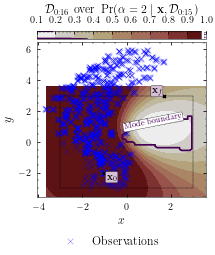

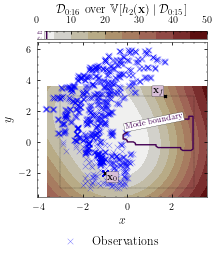

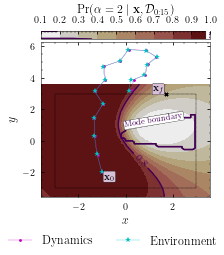

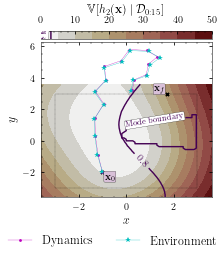

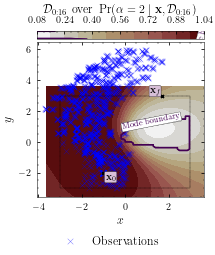

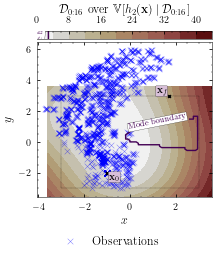

Optimisation result:
     fun: 25.36513871922085
     jac: array([-24.35824147,  12.91189   , -24.37302546,  12.90572685,
       -24.31657203,  13.04583261, -24.19339884,  13.2840148 ,
       -23.13310726,  13.16249842, -23.72987226,  13.44808471,
       -23.16836963,  13.18663967, -23.00720373,  13.62586642,
       -22.94372407,  13.23637394, -22.48235447,  13.46978349,
       -22.65746265,  13.27947553, -17.72770679,  12.02201985,
       -18.31307521,  12.13185136,  -8.44600457,   6.04052875,
        -8.88076539,   6.10024513])
 message: 'Optimization terminated successfully'
    nfev: 34
     nit: 19
    njev: 19
  status: 0
 success: True
       x: array([-0.76011883,  6.17666718, -0.15283262,  6.40622358,  0.40608151,
        6.07417212,  1.39774847,  5.27401478, -1.58874001,  4.75564134,
        1.70354746,  4.59293548, -0.47723952,  4.93434795,  2.86741179,
        3.09360147,  1.49074623,  4.48248627,  3.04262345,  1.35609523,
        1.81811324, -0.19550638, -1.96141577, -0.21

2022-04-22 13:52:33.279149: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 13:52:33.279166: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


3/3 [==============================] - 2s 849ms/step - loss: -1000.2450 - val_loss: -951.4232


2022-04-22 13:52:34.413502: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 13:52:34.422236: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 13:52:34.428916: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_52_34

2022-04-22 13:52:34.433601: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_52_34/dr-robots-mbp.local.trace.json.gz
2022-04-22 13:52:34.450677: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_52_34

2022-04-22 13:52:34.450856: I tensorflow/core/profiler/rpc/client/s

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_17_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 23ms/step - loss: -1001.8666 - val_loss: -994.2149
Epoch 3/20000
3/3 [==============================] - 0s 23ms/step - loss: -950.9566 - val_loss: -866.2111
Epoch 4/20000
3/3 [==============================] - 0s 23ms/step - loss: -934.0750 - val_loss: -971.5030
Epoch 5/20000
3/3 [==============================] - 0s 23ms/step - loss: -1029.2276 - val_loss: -988.4145
Epoch 6/20000
3/3 [==============================] - 0s 22ms/step - loss: -1000.0315 - val_loss: -1011.5833
Epoch 7/20000
3/3 [==============================] - 0s 23ms/step - loss: -1088.6763 - val_loss: -972.4272
Epoch 8/20000
3/3 [==============================] - 0s 23ms/step - loss: -1052.1315 - val_loss: -964.2994
Epoch 9/20000
3/3 [==============================] - 0s 23ms/step - loss: -1071.5809 - val_loss: -985.9000
Epoch 10/20000
3/3 [==============================] - 0s 23ms/step - loss: -1046.9050 - val_loss: -991.8032
Epoch 11/20000
3/3 [=================

Epoch 76/20000
3/3 [==============================] - 0s 25ms/step - loss: -896.7195 - val_loss: -941.7020
Epoch 77/20000
3/3 [==============================] - 0s 26ms/step - loss: -989.8319 - val_loss: -907.6015
Epoch 78/20000
3/3 [==============================] - 0s 25ms/step - loss: -985.9473 - val_loss: -906.1378
Epoch 79/20000
3/3 [==============================] - 0s 25ms/step - loss: -984.7525 - val_loss: -867.2640
Epoch 80/20000
3/3 [==============================] - 0s 26ms/step - loss: -1029.5617 - val_loss: -985.3422
Epoch 81/20000
3/3 [==============================] - 0s 25ms/step - loss: -1035.6044 - val_loss: -959.9383
Epoch 82/20000
3/3 [==============================] - 0s 24ms/step - loss: -1033.2034 - val_loss: -890.1460
Epoch 83/20000
3/3 [==============================] - 0s 25ms/step - loss: -1044.1330 - val_loss: -1010.1781
Epoch 84/20000
3/3 [==============================] - 0s 25ms/step - loss: -1046.8151 - val_loss: -995.5826
Epoch 85/20000
3/3 [===========

3/3 [==============================] - 0s 27ms/step - loss: -614.8586 - val_loss: -875.9009
Epoch 152/20000
3/3 [==============================] - 0s 26ms/step - loss: -895.7134 - val_loss: -379.2528
Epoch 153/20000
3/3 [==============================] - 0s 31ms/step - loss: -841.6415 - val_loss: -774.0223
Epoch 154/20000
3/3 [==============================] - 0s 26ms/step - loss: -893.0112 - val_loss: -348.3307
Epoch 155/20000
3/3 [==============================] - 0s 26ms/step - loss: -773.0437 - val_loss: -833.1098
Epoch 156/20000
3/3 [==============================] - 0s 27ms/step - loss: -928.2579 - val_loss: -829.0895
Epoch 157/20000
3/3 [==============================] - 0s 27ms/step - loss: -942.8010 - val_loss: -890.7874
Epoch 158/20000
3/3 [==============================] - 0s 27ms/step - loss: -939.7155 - val_loss: -894.1279
Epoch 159/20000
3/3 [==============================] - 0s 27ms/step - loss: -952.8340 - val_loss: -862.5301
Epoch 160/20000
3/3 [=======================

3/3 [==============================] - 0s 28ms/step - loss: -1075.1569 - val_loss: -1069.4739
Epoch 227/20000
3/3 [==============================] - 0s 28ms/step - loss: -1104.7191 - val_loss: -1055.1752
Epoch 228/20000
3/3 [==============================] - 0s 28ms/step - loss: -1116.1839 - val_loss: -1045.9902
Epoch 229/20000
3/3 [==============================] - 0s 28ms/step - loss: -1048.0433 - val_loss: -1067.9772
Epoch 230/20000
3/3 [==============================] - 0s 29ms/step - loss: -1068.1262 - val_loss: -1013.7905
Epoch 231/20000
3/3 [==============================] - 0s 28ms/step - loss: -1085.2218 - val_loss: -557.7396
Epoch 232/20000
3/3 [==============================] - 0s 27ms/step - loss: -1066.7206 - val_loss: -50.1061
Epoch 233/20000
3/3 [==============================] - 0s 28ms/step - loss: -1009.0606 - val_loss: -1031.2497
Epoch 234/20000
3/3 [==============================] - 0s 28ms/step - loss: -1075.0648 - val_loss: -1083.9967
Epoch 235/20000
3/3 [========

3/3 [==============================] - 0s 29ms/step - loss: -1112.5253 - val_loss: -1076.4610
Epoch 302/20000
3/3 [==============================] - 0s 29ms/step - loss: -1119.7388 - val_loss: -1089.1784
Epoch 303/20000
3/3 [==============================] - 0s 30ms/step - loss: -1132.7062 - val_loss: -1085.2604
Epoch 304/20000
3/3 [==============================] - 0s 30ms/step - loss: -1101.2585 - val_loss: -1050.4105
Epoch 305/20000
3/3 [==============================] - 0s 29ms/step - loss: -1138.3322 - val_loss: -1062.3310
Epoch 306/20000
3/3 [==============================] - 0s 29ms/step - loss: -1128.2489 - val_loss: -959.1779
Epoch 307/20000
3/3 [==============================] - 0s 29ms/step - loss: -1116.2967 - val_loss: -1056.8691
Epoch 308/20000
3/3 [==============================] - 0s 30ms/step - loss: -1146.5756 - val_loss: -1027.0242
Epoch 309/20000
3/3 [==============================] - 0s 30ms/step - loss: -1129.3756 - val_loss: -974.3183
Epoch 310/20000
3/3 [=======

3/3 [==============================] - 0s 28ms/step - loss: -1113.3160 - val_loss: -1042.9755
Epoch 377/20000
3/3 [==============================] - 0s 29ms/step - loss: -1113.9921 - val_loss: -1059.8983
Epoch 378/20000
3/3 [==============================] - 0s 29ms/step - loss: -1114.6894 - val_loss: -1037.8095
Epoch 379/20000
3/3 [==============================] - 0s 29ms/step - loss: -1130.7854 - val_loss: -1063.4507
Epoch 380/20000
3/3 [==============================] - 0s 29ms/step - loss: -1124.0137 - val_loss: -1026.3746
Epoch 381/20000
3/3 [==============================] - 0s 29ms/step - loss: -1118.7961 - val_loss: -985.0425
Epoch 382/20000
3/3 [==============================] - 0s 30ms/step - loss: -1113.7418 - val_loss: -1070.6124
Epoch 383/20000
3/3 [==============================] - 0s 30ms/step - loss: -1120.8926 - val_loss: -1065.9019
Epoch 384/20000
3/3 [==============================] - 0s 28ms/step - loss: -1124.5641 - val_loss: -1019.8822
Epoch 385/20000
3/3 [======

3/3 [==============================] - 0s 28ms/step - loss: -410.0367 - val_loss: 662.2335
Epoch 452/20000
3/3 [==============================] - 0s 28ms/step - loss: -644.3463 - val_loss: -181.4444
Epoch 453/20000
3/3 [==============================] - 0s 27ms/step - loss: -530.0202 - val_loss: 746.3821
Epoch 454/20000
3/3 [==============================] - 0s 29ms/step - loss: -738.8529 - val_loss: -699.0641
Epoch 455/20000
3/3 [==============================] - 0s 27ms/step - loss: -649.0410 - val_loss: 148.7937
Epoch 456/20000
3/3 [==============================] - 0s 27ms/step - loss: -698.4098 - val_loss: -253.1693
Epoch 457/20000
3/3 [==============================] - 0s 27ms/step - loss: -688.3065 - val_loss: -282.7372
Epoch 458/20000
3/3 [==============================] - 0s 28ms/step - loss: -561.6556 - val_loss: 57.1353
Epoch 459/20000
3/3 [==============================] - 0s 28ms/step - loss: -769.8688 - val_loss: 966.9165
Epoch 460/20000
3/3 [=============================

3/3 [==============================] - 0s 29ms/step - loss: -967.8690 - val_loss: -798.9816
Epoch 528/20000
3/3 [==============================] - 0s 29ms/step - loss: -930.0240 - val_loss: -944.8104
Epoch 529/20000
3/3 [==============================] - 0s 29ms/step - loss: -979.8897 - val_loss: -946.6505
Epoch 530/20000
3/3 [==============================] - 0s 29ms/step - loss: -955.3752 - val_loss: -472.1143
Epoch 531/20000
3/3 [==============================] - 0s 28ms/step - loss: -973.8802 - val_loss: -579.2853
Epoch 532/20000
3/3 [==============================] - 0s 29ms/step - loss: -1001.5966 - val_loss: -407.8452
Epoch 533/20000
3/3 [==============================] - 0s 28ms/step - loss: -1016.2015 - val_loss: -979.8989
Epoch 534/20000
3/3 [==============================] - 0s 29ms/step - loss: -999.7990 - val_loss: -376.8641
Epoch 535/20000
3/3 [==============================] - 0s 30ms/step - loss: -1025.0972 - val_loss: 3.9829
Epoch 536/20000
3/3 [=======================

3/3 [==============================] - 0s 31ms/step - loss: -977.3689 - val_loss: -832.4343
Epoch 604/20000
3/3 [==============================] - 0s 33ms/step - loss: -978.4965 - val_loss: -634.4481
Epoch 605/20000
3/3 [==============================] - 0s 30ms/step - loss: -981.2615 - val_loss: -933.5648
Epoch 606/20000
3/3 [==============================] - 0s 30ms/step - loss: -951.0310 - val_loss: -414.3396
Epoch 607/20000
3/3 [==============================] - 0s 29ms/step - loss: -965.7013 - val_loss: -938.2325
Epoch 608/20000
3/3 [==============================] - 0s 30ms/step - loss: -953.9640 - val_loss: -984.6266
Epoch 609/20000
3/3 [==============================] - 0s 31ms/step - loss: -987.8326 - val_loss: -1013.3261
Epoch 610/20000
3/3 [==============================] - 0s 31ms/step - loss: -981.9943 - val_loss: -366.7488
Epoch 611/20000
3/3 [==============================] - 0s 30ms/step - loss: -976.0366 - val_loss: -981.5742
Epoch 612/20000
3/3 [======================

Epoch 679/20000
3/3 [==============================] - 0s 29ms/step - loss: -462.7193 - val_loss: -831.9206
Epoch 680/20000
3/3 [==============================] - 0s 29ms/step - loss: -974.5222 - val_loss: -814.6014
Epoch 681/20000
3/3 [==============================] - 0s 29ms/step - loss: -908.0779 - val_loss: 100.2438
Epoch 682/20000
3/3 [==============================] - 0s 30ms/step - loss: -830.5494 - val_loss: 497.4352
Epoch 683/20000
3/3 [==============================] - 0s 29ms/step - loss: -613.1452 - val_loss: -939.9400
Epoch 684/20000
3/3 [==============================] - 0s 29ms/step - loss: -686.9243 - val_loss: -551.9253
Epoch 685/20000
3/3 [==============================] - 0s 30ms/step - loss: -862.5423 - val_loss: -925.9230
Epoch 686/20000
3/3 [==============================] - 0s 29ms/step - loss: -772.5141 - val_loss: -871.5560
Epoch 687/20000
3/3 [==============================] - 0s 30ms/step - loss: -851.4663 - val_loss: -716.3169
Epoch 688/20000
3/3 [=========

3/3 [==============================] - 0s 29ms/step - loss: -1051.5492 - val_loss: -1016.6904
Epoch 755/20000
3/3 [==============================] - 0s 29ms/step - loss: -1041.3628 - val_loss: -209.9736
Epoch 756/20000
3/3 [==============================] - 0s 29ms/step - loss: -1076.3579 - val_loss: -1021.0411
Epoch 757/20000
3/3 [==============================] - 0s 29ms/step - loss: -1017.6627 - val_loss: -769.4810
Epoch 758/20000
3/3 [==============================] - 0s 29ms/step - loss: -1037.3615 - val_loss: -809.8326
Epoch 759/20000
3/3 [==============================] - 0s 28ms/step - loss: -1065.5611 - val_loss: -184.6416
Epoch 760/20000
3/3 [==============================] - 0s 28ms/step - loss: -1075.2783 - val_loss: -1040.3317
Epoch 761/20000
3/3 [==============================] - 0s 28ms/step - loss: -1021.5989 - val_loss: -710.0743
Epoch 762/20000
3/3 [==============================] - 0s 29ms/step - loss: -1036.0375 - val_loss: -182.7466
Epoch 763/20000
3/3 [===========

3/3 [==============================] - 0s 29ms/step - loss: -1017.4853 - val_loss: -844.6940
Epoch 830/20000
3/3 [==============================] - 0s 30ms/step - loss: -1047.6048 - val_loss: -1025.0816
Epoch 831/20000
3/3 [==============================] - 0s 29ms/step - loss: -1020.4259 - val_loss: -920.7145
Epoch 832/20000
3/3 [==============================] - 0s 29ms/step - loss: -1010.0368 - val_loss: -1012.5269
Epoch 833/20000
3/3 [==============================] - 0s 30ms/step - loss: -982.2129 - val_loss: -946.0212
Epoch 834/20000
3/3 [==============================] - 0s 31ms/step - loss: -1005.3232 - val_loss: -1004.4418
Epoch 835/20000
3/3 [==============================] - 0s 29ms/step - loss: -1048.0528 - val_loss: -882.7195
Epoch 836/20000
3/3 [==============================] - 0s 30ms/step - loss: -1043.1704 - val_loss: -679.6703
Epoch 837/20000
3/3 [==============================] - 0s 31ms/step - loss: -1050.9056 - val_loss: -896.1626
Epoch 838/20000
3/3 [============

3/3 [==============================] - 0s 30ms/step - loss: -1005.7629 - val_loss: -940.1102
Epoch 905/20000
3/3 [==============================] - 0s 30ms/step - loss: -802.5531 - val_loss: -850.1594
Epoch 906/20000
3/3 [==============================] - 0s 30ms/step - loss: -890.3697 - val_loss: -911.7691
Epoch 907/20000
3/3 [==============================] - 0s 30ms/step - loss: -980.8978 - val_loss: -978.0294
Epoch 908/20000
3/3 [==============================] - 0s 30ms/step - loss: -917.3502 - val_loss: -1014.2285
Epoch 909/20000
3/3 [==============================] - 0s 30ms/step - loss: -989.5763 - val_loss: -940.2995
Epoch 910/20000
3/3 [==============================] - 0s 29ms/step - loss: -970.3032 - val_loss: -795.9871
Epoch 911/20000
3/3 [==============================] - 0s 30ms/step - loss: -946.7565 - val_loss: -922.5491
Epoch 912/20000
3/3 [==============================] - 0s 30ms/step - loss: -783.4926 - val_loss: -917.5710
Epoch 913/20000
3/3 [=====================

3/3 [==============================] - 0s 32ms/step - loss: -936.5881 - val_loss: -984.5888
Epoch 980/20000
3/3 [==============================] - 0s 33ms/step - loss: -1043.7577 - val_loss: -883.9396
Epoch 981/20000
3/3 [==============================] - 0s 31ms/step - loss: -968.5256 - val_loss: -1044.3532
Epoch 982/20000
3/3 [==============================] - 0s 32ms/step - loss: -1021.3961 - val_loss: -1043.9862
Epoch 983/20000
3/3 [==============================] - 0s 32ms/step - loss: -1041.5435 - val_loss: -991.1599
Epoch 984/20000
3/3 [==============================] - 0s 32ms/step - loss: -1048.0292 - val_loss: -885.4632
Epoch 985/20000
3/3 [==============================] - 0s 32ms/step - loss: -936.6063 - val_loss: -1032.2743
Epoch 986/20000
3/3 [==============================] - 0s 31ms/step - loss: -995.4572 - val_loss: -1062.3966
Epoch 987/20000
3/3 [==============================] - 0s 30ms/step - loss: -1023.8834 - val_loss: -1034.0328
Epoch 988/20000
3/3 [=============

Epoch 1054/20000
3/3 [==============================] - 0s 29ms/step - loss: -1060.4100 - val_loss: -929.6829
Epoch 1055/20000
3/3 [==============================] - 0s 30ms/step - loss: -1055.5818 - val_loss: -1059.1990
Epoch 1056/20000
3/3 [==============================] - 0s 29ms/step - loss: -1061.5664 - val_loss: -1037.4053
Epoch 1057/20000
3/3 [==============================] - 0s 30ms/step - loss: -962.3784 - val_loss: -879.5697
Epoch 1058/20000
3/3 [==============================] - 0s 30ms/step - loss: -1035.2062 - val_loss: -1022.3938
Epoch 1059/20000
3/3 [==============================] - 0s 30ms/step - loss: -1044.5533 - val_loss: -729.7208
Epoch 1060/20000
3/3 [==============================] - 0s 29ms/step - loss: -991.8330 - val_loss: -981.2565
Epoch 1061/20000
3/3 [==============================] - 0s 29ms/step - loss: -999.9952 - val_loss: -782.7450
Epoch 1062/20000
3/3 [==============================] - 0s 30ms/step - loss: -1057.8799 - val_loss: -990.2728
Epoch 1063

3/3 [==============================] - 0s 30ms/step - loss: -1091.4857 - val_loss: -1041.8138
Epoch 1129/20000
3/3 [==============================] - 0s 30ms/step - loss: -1104.1427 - val_loss: -1025.7361
Epoch 1130/20000
3/3 [==============================] - 0s 31ms/step - loss: -1120.3886 - val_loss: -1086.5895
Epoch 1131/20000
3/3 [==============================] - 0s 31ms/step - loss: -1120.1971 - val_loss: -1100.4255
Epoch 1132/20000
3/3 [==============================] - 0s 30ms/step - loss: -1116.1878 - val_loss: -1095.1214
Epoch 1133/20000
3/3 [==============================] - 0s 31ms/step - loss: -1130.2595 - val_loss: -1031.0440
Epoch 1134/20000
3/3 [==============================] - 0s 30ms/step - loss: -1128.3475 - val_loss: -882.0108
Epoch 1135/20000
3/3 [==============================] - 0s 29ms/step - loss: -1083.8633 - val_loss: -1011.4941
Epoch 1136/20000
3/3 [==============================] - 0s 31ms/step - loss: -1088.1264 - val_loss: -1097.0277
Epoch 1137/20000
3/

Epoch 1203/20000
3/3 [==============================] - 0s 28ms/step - loss: -952.9546 - val_loss: -834.4288
Epoch 1204/20000
3/3 [==============================] - 0s 29ms/step - loss: -907.5373 - val_loss: -896.8788
Epoch 1205/20000
3/3 [==============================] - 0s 30ms/step - loss: -1002.7612 - val_loss: -299.7308
Epoch 1206/20000
3/3 [==============================] - 0s 29ms/step - loss: -999.6514 - val_loss: -982.8234
Epoch 1207/20000
3/3 [==============================] - 0s 28ms/step - loss: -1014.2444 - val_loss: -735.9745
Epoch 1208/20000
3/3 [==============================] - 0s 29ms/step - loss: -1014.1576 - val_loss: -895.0128
Epoch 1209/20000
3/3 [==============================] - 0s 28ms/step - loss: -1021.7124 - val_loss: -915.9215
Epoch 1210/20000
3/3 [==============================] - 0s 28ms/step - loss: -1007.1243 - val_loss: -902.0071
Epoch 1211/20000
3/3 [==============================] - 0s 29ms/step - loss: -924.5216 - val_loss: -937.2242
Epoch 1212/200

3/3 [==============================] - 0s 30ms/step - loss: -1052.7206 - val_loss: -942.1721
Epoch 1278/20000
3/3 [==============================] - 0s 29ms/step - loss: -1039.1600 - val_loss: -994.8156
Epoch 1279/20000
3/3 [==============================] - 0s 30ms/step - loss: -996.0472 - val_loss: -987.3394
Epoch 1280/20000
3/3 [==============================] - 0s 30ms/step - loss: -1039.7122 - val_loss: -701.9796
Epoch 1281/20000
3/3 [==============================] - 0s 29ms/step - loss: -1070.4322 - val_loss: -978.8757
Epoch 1282/20000
3/3 [==============================] - 0s 29ms/step - loss: -1055.4099 - val_loss: -1037.5963
Epoch 1283/20000
3/3 [==============================] - 0s 29ms/step - loss: -1030.9514 - val_loss: -1050.2532
Epoch 1284/20000
3/3 [==============================] - 0s 31ms/step - loss: -1078.2521 - val_loss: -978.5257
Epoch 1285/20000
3/3 [==============================] - 0s 31ms/step - loss: -1033.9541 - val_loss: -976.2004
Epoch 1286/20000
3/3 [====

3/3 [==============================] - 0s 28ms/step - loss: -922.4408 - val_loss: -903.7967
Epoch 1352/20000
3/3 [==============================] - 0s 29ms/step - loss: -942.6975 - val_loss: -858.3488
Epoch 1353/20000
3/3 [==============================] - 0s 28ms/step - loss: -904.9992 - val_loss: -1009.4621
Epoch 1354/20000
3/3 [==============================] - 0s 28ms/step - loss: -1044.6040 - val_loss: -953.8481
Epoch 1355/20000
3/3 [==============================] - 0s 28ms/step - loss: -976.7589 - val_loss: -981.4762
Epoch 1356/20000
3/3 [==============================] - 0s 28ms/step - loss: -1022.9020 - val_loss: -958.2510
Epoch 1357/20000
3/3 [==============================] - 0s 28ms/step - loss: -1025.3200 - val_loss: -971.2772
Epoch 1358/20000
3/3 [==============================] - 0s 28ms/step - loss: -1017.1092 - val_loss: -1019.5632
Epoch 1359/20000
3/3 [==============================] - 0s 28ms/step - loss: -1037.3371 - val_loss: -1014.4688
Epoch 1360/20000
3/3 [======

3/3 [==============================] - 0s 28ms/step - loss: -1048.3539 - val_loss: -1009.0456
Epoch 1426/20000
3/3 [==============================] - 0s 29ms/step - loss: -1087.5624 - val_loss: -966.9600
Epoch 1427/20000
3/3 [==============================] - 0s 28ms/step - loss: -1045.4233 - val_loss: -1034.5661
Epoch 1428/20000
3/3 [==============================] - 0s 28ms/step - loss: -1096.2265 - val_loss: -1038.6095
Epoch 1429/20000
3/3 [==============================] - 0s 28ms/step - loss: -1095.9654 - val_loss: -1072.5824
Epoch 1430/20000
3/3 [==============================] - 0s 28ms/step - loss: -1016.1506 - val_loss: -1040.3968
Epoch 1431/20000
3/3 [==============================] - 0s 28ms/step - loss: -1062.5531 - val_loss: -1077.5613
Epoch 1432/20000
3/3 [==============================] - 0s 29ms/step - loss: -1093.7849 - val_loss: -1077.9415
Epoch 1433/20000
3/3 [==============================] - 0s 28ms/step - loss: -1070.8860 - val_loss: -1067.9381
Epoch 1434/20000
3/

3/3 [==============================] - 0s 29ms/step - loss: -635.9390 - val_loss: 575.2414
Epoch 1500/20000
3/3 [==============================] - 0s 29ms/step - loss: -389.2356 - val_loss: -729.2048
Epoch 1501/20000
3/3 [==============================] - 0s 31ms/step - loss: -527.4795 - val_loss: -913.4573
Epoch 1502/20000
3/3 [==============================] - 0s 29ms/step - loss: -610.5730 - val_loss: 209.2067
Epoch 1503/20000
3/3 [==============================] - 0s 29ms/step - loss: -824.3313 - val_loss: 1706.1501
Epoch 1504/20000
3/3 [==============================] - 0s 29ms/step - loss: -780.2026 - val_loss: -208.9071
Epoch 1505/20000
3/3 [==============================] - 0s 30ms/step - loss: -865.1522 - val_loss: -241.5804
Epoch 1506/20000
3/3 [==============================] - 0s 29ms/step - loss: -679.0478 - val_loss: 662.7452
Epoch 1507/20000
3/3 [==============================] - 0s 30ms/step - loss: -777.4779 - val_loss: -563.9321
Epoch 1508/20000
3/3 [=================

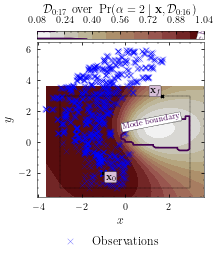

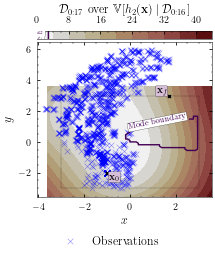

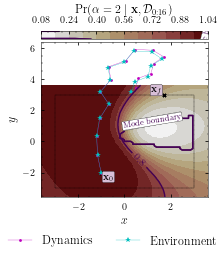

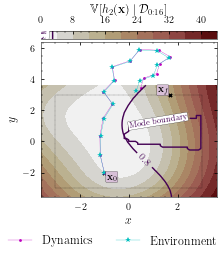

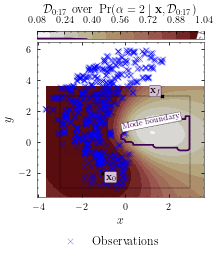

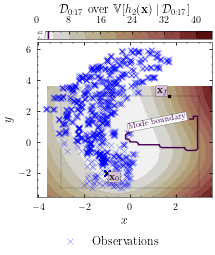

Optimisation result:
     fun: 107.33999490677434
     jac: array([-22.93275247,  12.33867777, -23.19577901,  12.44610915,
       -23.13760671,  12.59246131, -23.26120845,  12.95620238,
       -22.60682709,  12.82408767, -22.90410775,  13.19036575,
       -22.72474391,  12.87517933, -22.27633206,  13.29054797,
       -22.26184377,  12.8808004 , -21.7724253 ,  13.04126549,
       -21.92566059,  12.84444718, -16.31130495,  10.68069941,
       -16.75077424,  10.83557984,  -7.00055716,   4.40928993,
        -7.35205517,   4.46186782])
 message: 'Optimization terminated successfully'
    nfev: 39
     nit: 20
    njev: 20
  status: 0
 success: True
       x: array([-1.28617938,  6.71187275, -0.43715391,  6.76741139, -0.38371832,
        6.38714935,  1.5211986 ,  5.52312938, -1.25302933,  5.10352515,
        2.17016234,  4.46898212,  0.21041518,  5.0954579 ,  3.03941975,
        2.56089545,  1.76166107,  4.27831614,  2.95155027,  0.92386335,
        1.48794281, -0.48535342, -2.14583312, -0.0

2022-04-22 13:55:40.349166: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 13:55:40.349183: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


3/3 [==============================] - 2s 877ms/step - loss: -564.0909 - val_loss: -884.2853


2022-04-22 13:55:41.530372: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 13:55:41.539493: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 13:55:41.546292: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_55_41

2022-04-22 13:55:41.551215: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_55_41/dr-robots-mbp.local.trace.json.gz
2022-04-22 13:55:41.569518: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_55_41

2022-04-22 13:55:41.569778: I tensorflow/core/profiler/rpc/client/s

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_18_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 23ms/step - loss: -720.6463 - val_loss: -766.5868
Epoch 3/20000
3/3 [==============================] - 0s 23ms/step - loss: -832.9600 - val_loss: -860.1171
Epoch 4/20000
3/3 [==============================] - 0s 23ms/step - loss: -515.4063 - val_loss: 475.0890
Epoch 5/20000
3/3 [==============================] - 0s 23ms/step - loss: -826.7813 - val_loss: 806.4886
Epoch 6/20000
3/3 [==============================] - 0s 23ms/step - loss: -739.8309 - val_loss: -632.8029
Epoch 7/20000
3/3 [==============================] - 0s 23ms/step - loss: -909.0359 - val_loss: -755.5126
Epoch 8/20000
3/3 [==============================] - 0s 23ms/step - loss: -770.4951 - val_loss: -232.7007
Epoch 9/20000
3/3 [==============================] - 0s 23ms/step - loss: -835.1781 - val_loss: 1093.1969
Epoch 10/20000
3/3 [==============================] - 0s 23ms/step - loss: -751.6166 - val_loss: -787.0903
Epoch 11/20000
3/3 [===========================

3/3 [==============================] - 0s 25ms/step - loss: -1064.4804 - val_loss: -1083.1022
Epoch 77/20000
3/3 [==============================] - 0s 24ms/step - loss: -1066.7115 - val_loss: -1050.4780
Epoch 78/20000
3/3 [==============================] - 0s 23ms/step - loss: -1013.1774 - val_loss: -1007.0847
Epoch 79/20000
3/3 [==============================] - 0s 25ms/step - loss: -1025.7268 - val_loss: -1000.6708
Epoch 80/20000
3/3 [==============================] - 0s 26ms/step - loss: -1042.8233 - val_loss: -695.1863
Epoch 81/20000
3/3 [==============================] - 0s 25ms/step - loss: -1050.7920 - val_loss: -735.0403
Epoch 82/20000
3/3 [==============================] - 0s 25ms/step - loss: -996.7555 - val_loss: -976.0362
Epoch 83/20000
3/3 [==============================] - 0s 24ms/step - loss: -1016.0468 - val_loss: 26.3083
Epoch 84/20000
3/3 [==============================] - 0s 24ms/step - loss: -1089.3295 - val_loss: -753.2908
Epoch 85/20000
3/3 [======================

Epoch 152/20000
3/3 [==============================] - 0s 26ms/step - loss: -1043.3340 - val_loss: -603.3651
Epoch 153/20000
3/3 [==============================] - 0s 28ms/step - loss: -915.5232 - val_loss: -900.4194
Epoch 154/20000
3/3 [==============================] - 0s 26ms/step - loss: -980.1500 - val_loss: -526.4141
Epoch 155/20000
3/3 [==============================] - 0s 27ms/step - loss: -1060.9550 - val_loss: -1010.9947
Epoch 156/20000
3/3 [==============================] - 0s 27ms/step - loss: -974.6957 - val_loss: -1077.2147
Epoch 157/20000
3/3 [==============================] - 0s 27ms/step - loss: -886.2178 - val_loss: -103.9084
Epoch 158/20000
3/3 [==============================] - 0s 27ms/step - loss: -956.9302 - val_loss: -1044.0985
Epoch 159/20000
3/3 [==============================] - 0s 27ms/step - loss: -944.5285 - val_loss: -166.6427
Epoch 160/20000
3/3 [==============================] - 0s 27ms/step - loss: -1053.7343 - val_loss: -824.2900
Epoch 161/20000
3/3 [=

3/3 [==============================] - 0s 33ms/step - loss: -1049.3127 - val_loss: -947.9415
Epoch 228/20000
3/3 [==============================] - 0s 33ms/step - loss: -959.5510 - val_loss: -309.9064
Epoch 229/20000
3/3 [==============================] - 0s 33ms/step - loss: -923.1773 - val_loss: -973.5809
Epoch 230/20000
3/3 [==============================] - 0s 34ms/step - loss: -966.8706 - val_loss: -808.4518
Epoch 231/20000
3/3 [==============================] - 0s 33ms/step - loss: -897.3327 - val_loss: -930.6184
Epoch 232/20000
3/3 [==============================] - 0s 34ms/step - loss: -716.6325 - val_loss: -900.8677
Epoch 233/20000
3/3 [==============================] - 0s 31ms/step - loss: -714.1055 - val_loss: -987.3694
Epoch 234/20000
3/3 [==============================] - 0s 30ms/step - loss: -952.6518 - val_loss: -745.8287
Epoch 235/20000
3/3 [==============================] - 0s 34ms/step - loss: -818.4341 - val_loss: -859.2125
Epoch 236/20000
3/3 [======================

3/3 [==============================] - 0s 29ms/step - loss: -920.2155 - val_loss: -991.7134
Epoch 303/20000
3/3 [==============================] - 0s 28ms/step - loss: -1051.6340 - val_loss: -898.1605
Epoch 304/20000
3/3 [==============================] - 0s 29ms/step - loss: -1065.9522 - val_loss: -823.9041
Epoch 305/20000
3/3 [==============================] - 0s 29ms/step - loss: -773.7223 - val_loss: -1046.4341
Epoch 306/20000
3/3 [==============================] - 0s 29ms/step - loss: -882.4324 - val_loss: -599.6542
Epoch 307/20000
3/3 [==============================] - 0s 29ms/step - loss: -899.8442 - val_loss: -834.3891
Epoch 308/20000
3/3 [==============================] - 0s 29ms/step - loss: -822.5120 - val_loss: -565.7994
Epoch 309/20000
3/3 [==============================] - 0s 29ms/step - loss: -517.4702 - val_loss: -929.2318
Epoch 310/20000
3/3 [==============================] - 0s 29ms/step - loss: -919.0620 - val_loss: -1046.9444
Epoch 311/20000
3/3 [===================

3/3 [==============================] - 0s 29ms/step - loss: -993.2666 - val_loss: -1096.6892
Epoch 378/20000
3/3 [==============================] - 0s 29ms/step - loss: -1102.4842 - val_loss: -656.4528
Epoch 379/20000
3/3 [==============================] - 0s 30ms/step - loss: -1024.8595 - val_loss: -1066.5987
Epoch 380/20000
3/3 [==============================] - 0s 32ms/step - loss: -962.3774 - val_loss: -289.1059
Epoch 381/20000
3/3 [==============================] - 0s 35ms/step - loss: -906.8073 - val_loss: -1105.0941
Epoch 382/20000
3/3 [==============================] - 0s 31ms/step - loss: -865.9607 - val_loss: -938.0867
Epoch 383/20000
3/3 [==============================] - 0s 31ms/step - loss: -914.3903 - val_loss: -1078.8271
Epoch 384/20000
3/3 [==============================] - 0s 34ms/step - loss: -1094.7798 - val_loss: -747.6567
Epoch 385/20000
3/3 [==============================] - 0s 30ms/step - loss: -908.6150 - val_loss: -1022.5770
Epoch 386/20000
3/3 [===============

3/3 [==============================] - 0s 30ms/step - loss: -1095.4976 - val_loss: -1059.4573
Epoch 453/20000
3/3 [==============================] - 0s 31ms/step - loss: -1098.9699 - val_loss: -974.3862
Epoch 454/20000
3/3 [==============================] - 0s 30ms/step - loss: -1078.1519 - val_loss: -1094.2133
Epoch 455/20000
3/3 [==============================] - 0s 30ms/step - loss: -1068.6341 - val_loss: -1025.1994
Epoch 456/20000
3/3 [==============================] - 0s 29ms/step - loss: -1089.4236 - val_loss: -1070.8314
Epoch 457/20000
3/3 [==============================] - 0s 30ms/step - loss: -1110.1681 - val_loss: -1065.8769
Epoch 458/20000
3/3 [==============================] - 0s 30ms/step - loss: -1099.2639 - val_loss: -980.2095
Epoch 459/20000
3/3 [==============================] - 0s 30ms/step - loss: -1103.8844 - val_loss: -823.7894
Epoch 460/20000
3/3 [==============================] - 0s 30ms/step - loss: -1095.2209 - val_loss: -1115.6070
Epoch 461/20000
3/3 [========

3/3 [==============================] - 0s 31ms/step - loss: -1070.4861 - val_loss: -1048.9786
Epoch 528/20000
3/3 [==============================] - 0s 30ms/step - loss: -1079.3947 - val_loss: -1031.0380
Epoch 529/20000
3/3 [==============================] - 0s 29ms/step - loss: -1083.7210 - val_loss: -975.8314
Epoch 530/20000
3/3 [==============================] - 0s 30ms/step - loss: -1078.9496 - val_loss: -942.1593
Epoch 531/20000
3/3 [==============================] - 0s 30ms/step - loss: -1083.8527 - val_loss: -1081.8726
Epoch 532/20000
3/3 [==============================] - 0s 29ms/step - loss: -1065.4783 - val_loss: -1048.8467
Epoch 533/20000
3/3 [==============================] - 0s 30ms/step - loss: -1097.9407 - val_loss: -1066.7480
Epoch 534/20000
3/3 [==============================] - 0s 30ms/step - loss: -1086.0194 - val_loss: -1048.3403
Epoch 535/20000
3/3 [==============================] - 0s 30ms/step - loss: -1086.0373 - val_loss: -1063.5599
Epoch 536/20000
3/3 [=======

3/3 [==============================] - 0s 30ms/step - loss: -1126.0364 - val_loss: -1056.4169
Epoch 602/20000
3/3 [==============================] - 0s 30ms/step - loss: -1103.3067 - val_loss: -1097.8757
Epoch 603/20000
3/3 [==============================] - 0s 29ms/step - loss: -1056.1794 - val_loss: -1112.6754
Epoch 604/20000
3/3 [==============================] - 0s 30ms/step - loss: -1126.5631 - val_loss: -977.5162
Epoch 605/20000
3/3 [==============================] - 0s 30ms/step - loss: -1063.1254 - val_loss: -1090.5082
Epoch 606/20000
3/3 [==============================] - 0s 31ms/step - loss: -1068.7924 - val_loss: -950.6356
Epoch 607/20000
3/3 [==============================] - 0s 30ms/step - loss: -1020.2432 - val_loss: -912.3092
Epoch 608/20000
3/3 [==============================] - 0s 30ms/step - loss: -1057.8200 - val_loss: -1063.9185
Epoch 609/20000
3/3 [==============================] - 0s 30ms/step - loss: -1078.0579 - val_loss: -1008.3412
Epoch 610/20000
3/3 [========

Epoch 676/20000
3/3 [==============================] - 0s 30ms/step - loss: -1117.4162 - val_loss: -1089.2592
Epoch 677/20000
3/3 [==============================] - 0s 30ms/step - loss: -1018.1475 - val_loss: -1086.2095
Epoch 678/20000
3/3 [==============================] - 0s 29ms/step - loss: -1097.0889 - val_loss: -1088.6809
Epoch 679/20000
3/3 [==============================] - 0s 30ms/step - loss: -1014.9848 - val_loss: -1026.2045
Epoch 680/20000
3/3 [==============================] - 0s 30ms/step - loss: -1050.9221 - val_loss: -1026.5978
Epoch 681/20000
3/3 [==============================] - 0s 30ms/step - loss: -1035.2421 - val_loss: -1048.3011
Epoch 682/20000
3/3 [==============================] - 0s 31ms/step - loss: -1105.9768 - val_loss: -1085.1606
Epoch 683/20000
3/3 [==============================] - 0s 30ms/step - loss: -1095.5780 - val_loss: -954.3793
Epoch 684/20000
3/3 [==============================] - 0s 31ms/step - loss: -1100.8805 - val_loss: -1041.0059
Epoch 685/2

3/3 [==============================] - 0s 30ms/step - loss: -1091.2470 - val_loss: -1054.0046
Epoch 752/20000
3/3 [==============================] - 0s 31ms/step - loss: -1077.0215 - val_loss: -1103.2354
Epoch 753/20000
3/3 [==============================] - 0s 30ms/step - loss: -1039.7478 - val_loss: -1048.1158
Epoch 754/20000
3/3 [==============================] - 0s 29ms/step - loss: -1104.7464 - val_loss: -1072.2835
Epoch 755/20000
3/3 [==============================] - 0s 30ms/step - loss: -1057.9356 - val_loss: -876.9130
Epoch 756/20000
3/3 [==============================] - 0s 30ms/step - loss: -971.7801 - val_loss: -994.0149
Epoch 757/20000
3/3 [==============================] - 0s 30ms/step - loss: -1052.2871 - val_loss: -1077.2075
Epoch 758/20000
3/3 [==============================] - 0s 30ms/step - loss: -1044.2052 - val_loss: -1053.0446
Epoch 759/20000
3/3 [==============================] - 0s 31ms/step - loss: -1021.8997 - val_loss: -1030.4208
Epoch 760/20000
3/3 [========

3/3 [==============================] - 0s 28ms/step - loss: -1137.4192 - val_loss: -1064.0771
Epoch 827/20000
3/3 [==============================] - 0s 29ms/step - loss: -1119.5996 - val_loss: -1063.0485
Epoch 828/20000
3/3 [==============================] - 0s 29ms/step - loss: -1139.0850 - val_loss: -1093.7593
Epoch 829/20000
3/3 [==============================] - 0s 29ms/step - loss: -1140.1071 - val_loss: -1038.4596
Epoch 830/20000
3/3 [==============================] - 0s 28ms/step - loss: -1124.9123 - val_loss: -1062.1644
Epoch 831/20000
3/3 [==============================] - 0s 29ms/step - loss: -1151.8726 - val_loss: -1097.9972
Epoch 832/20000
3/3 [==============================] - 0s 29ms/step - loss: -1136.2384 - val_loss: -1095.7371
Epoch 833/20000
3/3 [==============================] - 0s 29ms/step - loss: -1121.6844 - val_loss: -1008.1801
Epoch 834/20000
3/3 [==============================] - 0s 28ms/step - loss: -1128.3909 - val_loss: -1086.8091
Epoch 835/20000
3/3 [=====

3/3 [==============================] - 0s 33ms/step - loss: -1077.0997 - val_loss: -1032.1327
Epoch 902/20000
3/3 [==============================] - 0s 32ms/step - loss: -1073.3701 - val_loss: -1045.9349
Epoch 903/20000
3/3 [==============================] - 0s 32ms/step - loss: -1085.9676 - val_loss: -1019.0041
Epoch 904/20000
3/3 [==============================] - 0s 33ms/step - loss: -1087.6791 - val_loss: -1050.8237
Epoch 905/20000
3/3 [==============================] - 0s 31ms/step - loss: -1085.1036 - val_loss: -1063.4130
Epoch 906/20000
3/3 [==============================] - 0s 31ms/step - loss: -1096.0835 - val_loss: -1049.9666
Epoch 907/20000
3/3 [==============================] - 0s 31ms/step - loss: -1099.9376 - val_loss: -1046.7621
Epoch 908/20000
3/3 [==============================] - 0s 34ms/step - loss: -1111.7871 - val_loss: -1033.0225
Epoch 909/20000
3/3 [==============================] - 0s 32ms/step - loss: -1097.2836 - val_loss: -1048.4998
Epoch 910/20000
3/3 [=====

Epoch 976/20000
3/3 [==============================] - 0s 30ms/step - loss: -1080.1910 - val_loss: -1052.7736
Epoch 977/20000
3/3 [==============================] - 0s 30ms/step - loss: -1083.5218 - val_loss: -1058.7380
Epoch 978/20000
3/3 [==============================] - 0s 30ms/step - loss: -1089.1521 - val_loss: -1069.6012
Epoch 979/20000
3/3 [==============================] - 0s 31ms/step - loss: -1082.6393 - val_loss: -1063.1393
Epoch 980/20000
3/3 [==============================] - 0s 30ms/step - loss: -1091.6406 - val_loss: -1067.2898
Epoch 981/20000
3/3 [==============================] - 0s 30ms/step - loss: -1095.9987 - val_loss: -1007.0875
Epoch 982/20000
3/3 [==============================] - 0s 30ms/step - loss: -1086.7566 - val_loss: -967.7565
Epoch 983/20000
3/3 [==============================] - 0s 30ms/step - loss: -1097.2315 - val_loss: -1041.2503
Epoch 984/20000
3/3 [==============================] - 0s 31ms/step - loss: -1109.5014 - val_loss: -1076.0980
Epoch 985/2

3/3 [==============================] - 0s 30ms/step - loss: -1030.9608 - val_loss: -1015.1637
Epoch 1051/20000
3/3 [==============================] - 0s 29ms/step - loss: -1043.6748 - val_loss: -1006.5389
Epoch 1052/20000
3/3 [==============================] - 0s 28ms/step - loss: -1042.1124 - val_loss: -991.0594
Epoch 1053/20000
3/3 [==============================] - 0s 29ms/step - loss: -1029.5314 - val_loss: -1028.7971
Epoch 1054/20000
3/3 [==============================] - 0s 34ms/step - loss: -1058.3485 - val_loss: -1026.5903
Epoch 1055/20000
3/3 [==============================] - 0s 32ms/step - loss: -1043.4396 - val_loss: -1009.5686
Epoch 1056/20000
3/3 [==============================] - 0s 30ms/step - loss: -1066.4950 - val_loss: -1039.6810
Epoch 1057/20000
3/3 [==============================] - 0s 30ms/step - loss: -1051.8273 - val_loss: -869.5464
Epoch 1058/20000
3/3 [==============================] - 0s 31ms/step - loss: -1059.4785 - val_loss: -1030.5168
Epoch 1059/20000
3/3

3/3 [==============================] - 0s 29ms/step - loss: -1095.4710 - val_loss: -1101.5149
Epoch 1125/20000
3/3 [==============================] - 0s 30ms/step - loss: -763.6532 - val_loss: -986.0458
Epoch 1126/20000
3/3 [==============================] - 0s 28ms/step - loss: -836.9875 - val_loss: -965.7684
Epoch 1127/20000
3/3 [==============================] - 0s 29ms/step - loss: -879.7104 - val_loss: -900.4632
Epoch 1128/20000
3/3 [==============================] - 0s 29ms/step - loss: -791.6406 - val_loss: -842.4907
Epoch 1129/20000
3/3 [==============================] - 0s 28ms/step - loss: -884.3390 - val_loss: -999.3989
Epoch 1130/20000
3/3 [==============================] - 0s 28ms/step - loss: -903.9858 - val_loss: -866.2306
Epoch 1131/20000
3/3 [==============================] - 0s 27ms/step - loss: -765.0647 - val_loss: -841.8038
Epoch 1132/20000
3/3 [==============================] - 0s 29ms/step - loss: -620.2082 - val_loss: -925.3765
Epoch 1133/20000
3/3 [============

3/3 [==============================] - 0s 29ms/step - loss: 278.6662 - val_loss: -940.3888
Epoch 1199/20000
3/3 [==============================] - 0s 28ms/step - loss: -239.8999 - val_loss: -963.4915
Epoch 1200/20000
3/3 [==============================] - 0s 29ms/step - loss: -727.5825 - val_loss: -155.2781
Epoch 1201/20000
3/3 [==============================] - 0s 29ms/step - loss: -662.8519 - val_loss: -734.0792
Epoch 1202/20000
3/3 [==============================] - 0s 29ms/step - loss: -747.1463 - val_loss: -821.1489
Epoch 1203/20000
3/3 [==============================] - 0s 30ms/step - loss: -873.5819 - val_loss: -916.0015
Epoch 1204/20000
3/3 [==============================] - 0s 29ms/step - loss: -888.9027 - val_loss: -909.3578
Epoch 1205/20000
3/3 [==============================] - 0s 28ms/step - loss: -906.7039 - val_loss: -891.2034
Epoch 1206/20000
3/3 [==============================] - 0s 29ms/step - loss: -905.9893 - val_loss: -901.7082
Epoch 1207/20000
3/3 [===============

3/3 [==============================] - 0s 29ms/step - loss: -1099.1920 - val_loss: -964.8547
Epoch 1273/20000
3/3 [==============================] - 0s 29ms/step - loss: -1035.8314 - val_loss: -1084.9635
Epoch 1274/20000
3/3 [==============================] - 0s 30ms/step - loss: -1121.4603 - val_loss: -1095.0112
Epoch 1275/20000
3/3 [==============================] - 0s 29ms/step - loss: -1121.3481 - val_loss: -1069.2383
Epoch 1276/20000
3/3 [==============================] - 0s 31ms/step - loss: -1102.2969 - val_loss: -1093.2104
Epoch 1277/20000
3/3 [==============================] - 0s 30ms/step - loss: -1058.6498 - val_loss: -1005.6624
Epoch 1278/20000
3/3 [==============================] - 0s 29ms/step - loss: -1106.0927 - val_loss: -1064.3083
Epoch 1279/20000
3/3 [==============================] - 0s 29ms/step - loss: -1118.0811 - val_loss: -1013.0062
Epoch 1280/20000
3/3 [==============================] - 0s 29ms/step - loss: -1093.2047 - val_loss: -1043.4828
Epoch 1281/20000
3/

3/3 [==============================] - 0s 31ms/step - loss: -1056.7868 - val_loss: -989.2162
Epoch 1347/20000
3/3 [==============================] - 0s 31ms/step - loss: -1059.4045 - val_loss: -1037.9150
Epoch 1348/20000
3/3 [==============================] - 0s 30ms/step - loss: -1049.9808 - val_loss: -1050.7326
Epoch 1349/20000
3/3 [==============================] - 0s 29ms/step - loss: -1072.7132 - val_loss: -1045.1630
Epoch 1350/20000
3/3 [==============================] - 0s 29ms/step - loss: -1056.2464 - val_loss: -1040.5837
Epoch 1351/20000
3/3 [==============================] - 0s 29ms/step - loss: -1083.6068 - val_loss: -1029.2789
Epoch 1352/20000
3/3 [==============================] - 0s 30ms/step - loss: -1065.7124 - val_loss: -1062.4185
Epoch 1353/20000
3/3 [==============================] - 0s 29ms/step - loss: -1083.4031 - val_loss: -1039.9304
Epoch 1354/20000
3/3 [==============================] - 0s 29ms/step - loss: -1077.5395 - val_loss: -1003.4331
Epoch 1355/20000
3/

3/3 [==============================] - 0s 31ms/step - loss: -1011.6136 - val_loss: -919.4769
Epoch 1421/20000
3/3 [==============================] - 0s 31ms/step - loss: -1048.4446 - val_loss: -991.1779
Epoch 1422/20000
3/3 [==============================] - 0s 31ms/step - loss: -1002.1266 - val_loss: -584.0819
Epoch 1423/20000
3/3 [==============================] - 0s 33ms/step - loss: -966.0203 - val_loss: -993.6491
Epoch 1424/20000
3/3 [==============================] - 0s 31ms/step - loss: -960.2352 - val_loss: -988.4009
Epoch 1425/20000
3/3 [==============================] - 0s 32ms/step - loss: -942.4537 - val_loss: -863.0289
Epoch 1426/20000
3/3 [==============================] - 0s 30ms/step - loss: -921.4779 - val_loss: -961.4849
Epoch 1427/20000
3/3 [==============================] - 0s 30ms/step - loss: -948.4379 - val_loss: -1015.2166
Epoch 1428/20000
3/3 [==============================] - 0s 29ms/step - loss: -1008.6418 - val_loss: -1043.3179
Epoch 1429/20000
3/3 [========

3/3 [==============================] - 0s 29ms/step - loss: -1072.2646 - val_loss: -1024.7787
Epoch 1495/20000
3/3 [==============================] - 0s 29ms/step - loss: -1072.4687 - val_loss: -1027.2514
Epoch 1496/20000
3/3 [==============================] - 0s 29ms/step - loss: -1073.9507 - val_loss: -978.4550
Epoch 1497/20000
3/3 [==============================] - 0s 28ms/step - loss: -1074.0192 - val_loss: -1039.8680
Epoch 1498/20000
3/3 [==============================] - 0s 29ms/step - loss: -1082.4554 - val_loss: -1004.0639
Epoch 1499/20000
3/3 [==============================] - 0s 29ms/step - loss: -1071.2109 - val_loss: -1034.9759
Epoch 1500/20000
3/3 [==============================] - 0s 29ms/step - loss: -1083.7271 - val_loss: -1032.6282
Epoch 1501/20000
3/3 [==============================] - 0s 29ms/step - loss: -1087.8675 - val_loss: -1049.1645
Epoch 1502/20000
3/3 [==============================] - 0s 29ms/step - loss: -1086.9053 - val_loss: -1024.7938
Epoch 1503/20000
3/

3/3 [==============================] - 0s 35ms/step - loss: -1022.7054 - val_loss: -911.6882
Epoch 1569/20000
3/3 [==============================] - 0s 32ms/step - loss: -601.5044 - val_loss: -832.8694
Epoch 1570/20000
3/3 [==============================] - 0s 32ms/step - loss: -938.7003 - val_loss: -995.9864
Epoch 1571/20000
3/3 [==============================] - 0s 34ms/step - loss: -895.5662 - val_loss: -883.4092
Epoch 1572/20000
3/3 [==============================] - 0s 31ms/step - loss: -832.8349 - val_loss: -609.6273
Epoch 1573/20000
3/3 [==============================] - 0s 33ms/step - loss: -527.8390 - val_loss: -965.1730
Epoch 1574/20000
3/3 [==============================] - 0s 31ms/step - loss: -911.8930 - val_loss: -563.2480
Epoch 1575/20000
3/3 [==============================] - 0s 34ms/step - loss: -882.9643 - val_loss: -809.8185
Epoch 1576/20000
3/3 [==============================] - 0s 34ms/step - loss: -840.8306 - val_loss: -972.2133
Epoch 1577/20000
3/3 [=============

3/3 [==============================] - 0s 32ms/step - loss: -992.5960 - val_loss: -823.4562
Epoch 1643/20000
3/3 [==============================] - 0s 32ms/step - loss: -1056.7511 - val_loss: -941.4327
Epoch 1644/20000
3/3 [==============================] - 0s 31ms/step - loss: -968.3452 - val_loss: -1021.0463
Epoch 1645/20000
3/3 [==============================] - 0s 30ms/step - loss: -1039.4908 - val_loss: -1020.2958
Epoch 1646/20000
3/3 [==============================] - 0s 31ms/step - loss: -1073.2788 - val_loss: -960.4790
Epoch 1647/20000
3/3 [==============================] - 0s 31ms/step - loss: -1061.2305 - val_loss: -1052.2535
Epoch 1648/20000
3/3 [==============================] - 0s 31ms/step - loss: -1074.6691 - val_loss: -886.3260
Epoch 1649/20000
3/3 [==============================] - 0s 31ms/step - loss: -1072.1676 - val_loss: -1000.2865
Epoch 1650/20000
3/3 [==============================] - 0s 31ms/step - loss: -925.1601 - val_loss: -1065.9972
Epoch 1651/20000
3/3 [===

3/3 [==============================] - 0s 29ms/step - loss: -930.9263 - val_loss: -1033.8425
Epoch 1717/20000
3/3 [==============================] - 0s 28ms/step - loss: -1027.7230 - val_loss: -1024.4371
Epoch 1718/20000
3/3 [==============================] - 0s 28ms/step - loss: -1040.2463 - val_loss: -990.1422
Epoch 1719/20000
3/3 [==============================] - 0s 29ms/step - loss: -981.8590 - val_loss: -1013.0249
Epoch 1720/20000
3/3 [==============================] - 0s 35ms/step - loss: -1063.8744 - val_loss: -1006.2174
Epoch 1721/20000
3/3 [==============================] - 0s 30ms/step - loss: -1054.0688 - val_loss: -860.0336
Epoch 1722/20000
3/3 [==============================] - 0s 28ms/step - loss: -1049.3084 - val_loss: -994.2139
Epoch 1723/20000
3/3 [==============================] - 0s 29ms/step - loss: -1067.2580 - val_loss: -1024.5097
Epoch 1724/20000
3/3 [==============================] - 0s 28ms/step - loss: -1040.6569 - val_loss: -1043.7970
Epoch 1725/20000
3/3 [=

3/3 [==============================] - 0s 30ms/step - loss: -925.7280 - val_loss: -998.3059
Epoch 1791/20000
3/3 [==============================] - 0s 31ms/step - loss: -990.0167 - val_loss: -875.1873
Epoch 1792/20000
3/3 [==============================] - 0s 30ms/step - loss: -923.5718 - val_loss: -969.8607
Epoch 1793/20000
3/3 [==============================] - 0s 30ms/step - loss: -984.8309 - val_loss: -999.6018
Epoch 1794/20000
3/3 [==============================] - 0s 30ms/step - loss: -994.8258 - val_loss: -958.6118
Epoch 1795/20000
3/3 [==============================] - 0s 30ms/step - loss: -1020.7836 - val_loss: -897.4636
Epoch 1796/20000
3/3 [==============================] - 0s 29ms/step - loss: -919.5097 - val_loss: -998.8598
Epoch 1797/20000
3/3 [==============================] - 0s 30ms/step - loss: -1035.3408 - val_loss: -995.0016
Epoch 1798/20000
3/3 [==============================] - 0s 31ms/step - loss: -1046.2390 - val_loss: -987.5408
Epoch 1799/20000
3/3 [===========

3/3 [==============================] - 0s 28ms/step - loss: -1122.3489 - val_loss: -1045.7279
Epoch 1865/20000
3/3 [==============================] - 0s 29ms/step - loss: -1059.1287 - val_loss: -1052.7615
Epoch 1866/20000
3/3 [==============================] - 0s 29ms/step - loss: -1135.2466 - val_loss: -1026.2266
Epoch 1867/20000
3/3 [==============================] - 0s 29ms/step - loss: -1138.1618 - val_loss: -1018.4171
Epoch 1868/20000
3/3 [==============================] - 0s 30ms/step - loss: -997.3425 - val_loss: -1052.9929
Epoch 1869/20000
3/3 [==============================] - 0s 29ms/step - loss: -1099.0795 - val_loss: -1046.7830
Epoch 1870/20000
3/3 [==============================] - 0s 28ms/step - loss: -1075.1915 - val_loss: -1057.1185
Epoch 1871/20000
3/3 [==============================] - 0s 28ms/step - loss: -963.8255 - val_loss: -864.6654
Epoch 1872/20000
3/3 [==============================] - 0s 29ms/step - loss: -1033.1268 - val_loss: -1068.9870
Epoch 1873/20000
3/3 

3/3 [==============================] - 0s 30ms/step - loss: -1100.6006 - val_loss: -1014.8619
Epoch 1939/20000
3/3 [==============================] - 0s 30ms/step - loss: -1079.3810 - val_loss: -1056.3857
Epoch 1940/20000
3/3 [==============================] - 0s 29ms/step - loss: -1099.9206 - val_loss: -1053.5095
Epoch 1941/20000
3/3 [==============================] - 0s 29ms/step - loss: -1121.5417 - val_loss: -992.4751
Epoch 1942/20000
3/3 [==============================] - 0s 29ms/step - loss: -1113.9721 - val_loss: -1058.9719
Epoch 1943/20000
3/3 [==============================] - 0s 29ms/step - loss: -1126.3449 - val_loss: -1059.9721
Epoch 1944/20000
3/3 [==============================] - 0s 28ms/step - loss: -1120.2168 - val_loss: -1065.3499
Epoch 1945/20000
3/3 [==============================] - 0s 29ms/step - loss: -1109.3436 - val_loss: -1013.9527
Epoch 1946/20000
3/3 [==============================] - 0s 29ms/step - loss: -1086.7467 - val_loss: -1090.7292
Epoch 1947/20000
3/

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_18_epoch_2000/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2002/20000
3/3 [==============================] - 0s 23ms/step - loss: -1050.0977 - val_loss: -1019.9479
Epoch 2003/20000
3/3 [==============================] - 0s 23ms/step - loss: -1077.8949 - val_loss: -1011.3853
Epoch 2004/20000
3/3 [==============================] - 0s 24ms/step - loss: -1033.1951 - val_loss: -1010.5446
Epoch 2005/20000
3/3 [==============================] - 0s 24ms/step - loss: -1070.1368 - val_loss: -1010.4523
Epoch 2006/20000
3/3 [==============================] - 0s 23ms/step - loss: -1085.8808 - val_loss: -1008.8825
Epoch 2007/20000
3/3 [==============================] - 0s 22ms/step - loss: -1072.9174 - val_loss: -1033.0827
Epoch 2008/20000
3/3 [==============================] - 0s 22ms/step - loss: -1057.5999 - val_loss: -1051.4371
Epoch 2009/20000
3/3 [==============================] - 0s 23ms/step - loss: -1097.3383 - val_loss: -1028.1588
Epoch 2010/20000
3/3 [==============================] - 0s 24ms/step - loss: -1091.6560 - val_loss: -1013.7005
E

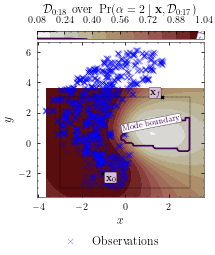

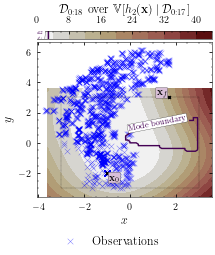

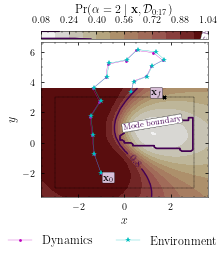

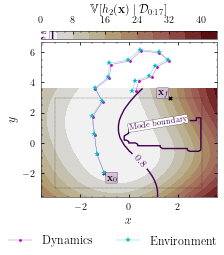

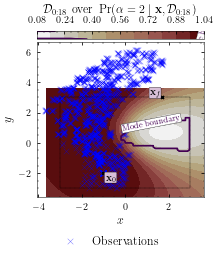

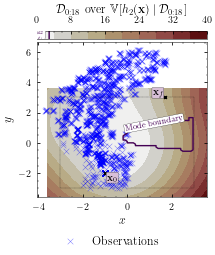

Optimisation result:
     fun: 4.9373317063289335
     jac: array([-19.56255247,  14.06717943, -19.34726434,  14.15067969,
       -17.51220803,  14.44714059, -17.38609002,  14.84295335,
       -14.07662407,  12.65937563, -13.93262084,  12.67632222,
       -13.70799396,  12.77645526, -13.26742534,  13.17903681,
       -13.17614795,  12.89882266, -12.80031269,  13.04006984,
       -12.94107227,  12.85503921, -11.74933714,  12.61343588,
       -12.07167608,  12.77498951,  -6.50745846,   7.53285568,
        -6.80271442,   7.63720584])
 message: 'Optimization terminated successfully'
    nfev: 36
     nit: 20
    njev: 20
  status: 0
 success: True
       x: array([ 1.28331775e+00,  6.57576736e+00,  1.58010254e+00,  6.22157785e+00,
       -4.80178577e-01,  5.93141216e+00,  1.85422564e+00,  4.89319667e+00,
       -8.39389984e-01,  5.10208100e+00, -5.86897733e-03,  5.52396462e+00,
        2.76347097e-01,  5.25321616e+00,  3.17018716e+00,  2.64419168e+00,
        2.13846301e+00,  4.27333938e+0

2022-04-22 13:59:47.095697: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 13:59:47.095713: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


3/3 [==============================] - 2s 865ms/step - loss: -1108.1393 - val_loss: -1033.3296


2022-04-22 13:59:48.271064: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 13:59:48.279999: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 13:59:48.286027: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_59_48

2022-04-22 13:59:48.290062: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_59_48/dr-robots-mbp.local.trace.json.gz
2022-04-22 13:59:48.306108: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_13_59_48

2022-04-22 13:59:48.306286: I tensorflow/core/profiler/rpc/client/s

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_19_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 24ms/step - loss: -1097.7000 - val_loss: -1047.1208
Epoch 3/20000
3/3 [==============================] - 0s 24ms/step - loss: -1090.9478 - val_loss: -1041.4767
Epoch 4/20000
3/3 [==============================] - 0s 23ms/step - loss: -1122.4617 - val_loss: -1016.0450
Epoch 5/20000
3/3 [==============================] - 0s 23ms/step - loss: -1102.1075 - val_loss: -1033.9156
Epoch 6/20000
3/3 [==============================] - 0s 24ms/step - loss: -1109.5117 - val_loss: -1022.9769
Epoch 7/20000
3/3 [==============================] - 0s 23ms/step - loss: -1121.9399 - val_loss: -1029.1027
Epoch 8/20000
3/3 [==============================] - 0s 23ms/step - loss: -1109.9665 - val_loss: -1051.7698
Epoch 9/20000
3/3 [==============================] - 0s 24ms/step - loss: -1085.3086 - val_loss: -1076.9124
Epoch 10/20000
3/3 [==============================] - 0s 23ms/step - loss: -1121.7299 - val_loss: -1017.9227
Epoch 11/20000
3/3 [=======

3/3 [==============================] - 0s 23ms/step - loss: -1117.7906 - val_loss: -1062.3130
Epoch 76/20000
3/3 [==============================] - 0s 24ms/step - loss: -1071.7756 - val_loss: -1074.1813
Epoch 77/20000
3/3 [==============================] - 0s 23ms/step - loss: -1093.3467 - val_loss: -1062.2122
Epoch 78/20000
3/3 [==============================] - 0s 24ms/step - loss: -1117.9349 - val_loss: -1080.3796
Epoch 79/20000
3/3 [==============================] - 0s 23ms/step - loss: -1097.4446 - val_loss: -1066.6357
Epoch 80/20000
3/3 [==============================] - 0s 24ms/step - loss: -1096.7120 - val_loss: -1040.2803
Epoch 81/20000
3/3 [==============================] - 0s 23ms/step - loss: -1060.8800 - val_loss: -1033.7296
Epoch 82/20000
3/3 [==============================] - 0s 23ms/step - loss: -1109.7445 - val_loss: -993.1015
Epoch 83/20000
3/3 [==============================] - 0s 23ms/step - loss: -1109.5795 - val_loss: -1078.5277
Epoch 84/20000
3/3 [===============

3/3 [==============================] - 0s 28ms/step - loss: -897.5749 - val_loss: 1496.7094
Epoch 151/20000
3/3 [==============================] - 0s 28ms/step - loss: -701.0892 - val_loss: -873.4158
Epoch 152/20000
3/3 [==============================] - 0s 28ms/step - loss: -422.2654 - val_loss: 794.0665
Epoch 153/20000
3/3 [==============================] - 0s 32ms/step - loss: -1022.5031 - val_loss: -146.6935
Epoch 154/20000
3/3 [==============================] - 0s 31ms/step - loss: -1021.5360 - val_loss: -713.9483
Epoch 155/20000
3/3 [==============================] - 0s 31ms/step - loss: -964.4781 - val_loss: -934.1492
Epoch 156/20000
3/3 [==============================] - 0s 30ms/step - loss: -912.8071 - val_loss: -988.4643
Epoch 157/20000
3/3 [==============================] - 0s 33ms/step - loss: -524.7961 - val_loss: -451.6841
Epoch 158/20000
3/3 [==============================] - 0s 33ms/step - loss: -932.9045 - val_loss: -1007.9811
Epoch 159/20000
3/3 [=====================

3/3 [==============================] - 0s 30ms/step - loss: -912.4573 - val_loss: 406.3825
Epoch 227/20000
3/3 [==============================] - 0s 29ms/step - loss: -936.3906 - val_loss: -862.8463
Epoch 228/20000
3/3 [==============================] - 0s 29ms/step - loss: -872.1324 - val_loss: -378.5835
Epoch 229/20000
3/3 [==============================] - 0s 30ms/step - loss: -931.4319 - val_loss: 409.6400
Epoch 230/20000
3/3 [==============================] - 0s 30ms/step - loss: -798.9442 - val_loss: -467.9677
Epoch 231/20000
3/3 [==============================] - 0s 29ms/step - loss: -859.3690 - val_loss: 1141.9498
Epoch 232/20000
3/3 [==============================] - 0s 30ms/step - loss: -753.8955 - val_loss: -738.1287
Epoch 233/20000
3/3 [==============================] - 0s 32ms/step - loss: -809.9678 - val_loss: -770.2767
Epoch 234/20000
3/3 [==============================] - 0s 30ms/step - loss: -757.0403 - val_loss: -956.7552
Epoch 235/20000
3/3 [=========================

Epoch 302/20000
3/3 [==============================] - 0s 29ms/step - loss: -857.9021 - val_loss: -763.0290
Epoch 303/20000
3/3 [==============================] - 0s 30ms/step - loss: -380.5545 - val_loss: -927.3907
Epoch 304/20000
3/3 [==============================] - 0s 29ms/step - loss: -877.3435 - val_loss: -789.0271
Epoch 305/20000
3/3 [==============================] - 0s 29ms/step - loss: -817.2296 - val_loss: -708.0378
Epoch 306/20000
3/3 [==============================] - 0s 30ms/step - loss: -595.2017 - val_loss: -989.1613
Epoch 307/20000
3/3 [==============================] - 0s 30ms/step - loss: -435.4557 - val_loss: -762.5600
Epoch 308/20000
3/3 [==============================] - 0s 28ms/step - loss: -751.8129 - val_loss: -857.6971
Epoch 309/20000
3/3 [==============================] - 0s 29ms/step - loss: -927.5766 - val_loss: -841.9969
Epoch 310/20000
3/3 [==============================] - 0s 30ms/step - loss: -933.0345 - val_loss: -914.6307
Epoch 311/20000
3/3 [=======

3/3 [==============================] - 0s 30ms/step - loss: -1049.9881 - val_loss: -1072.4970
Epoch 378/20000
3/3 [==============================] - 0s 29ms/step - loss: -1017.8160 - val_loss: -1020.6682
Epoch 379/20000
3/3 [==============================] - 0s 29ms/step - loss: -976.8227 - val_loss: -979.9203
Epoch 380/20000
3/3 [==============================] - 0s 30ms/step - loss: -1066.2963 - val_loss: -1065.8321
Epoch 381/20000
3/3 [==============================] - 0s 30ms/step - loss: -1048.0416 - val_loss: -1012.2319
Epoch 382/20000
3/3 [==============================] - 0s 29ms/step - loss: -1048.3925 - val_loss: -974.3552
Epoch 383/20000
3/3 [==============================] - 0s 29ms/step - loss: -1006.0778 - val_loss: -727.3824
Epoch 384/20000
3/3 [==============================] - 0s 29ms/step - loss: -804.2272 - val_loss: -1020.4074
Epoch 385/20000
3/3 [==============================] - 0s 29ms/step - loss: -942.6433 - val_loss: -1026.8076
Epoch 386/20000
3/3 [===========

3/3 [==============================] - 0s 28ms/step - loss: -1022.4702 - val_loss: -1092.7892
Epoch 453/20000
3/3 [==============================] - 0s 30ms/step - loss: -1033.4931 - val_loss: -1095.3075
Epoch 454/20000
3/3 [==============================] - 0s 30ms/step - loss: -1043.2077 - val_loss: -893.5066
Epoch 455/20000
3/3 [==============================] - 0s 29ms/step - loss: -1102.2272 - val_loss: -1023.4909
Epoch 456/20000
3/3 [==============================] - 0s 30ms/step - loss: -1013.5613 - val_loss: -992.1131
Epoch 457/20000
3/3 [==============================] - 0s 29ms/step - loss: -1007.2505 - val_loss: -1007.4719
Epoch 458/20000
3/3 [==============================] - 0s 29ms/step - loss: -1028.1308 - val_loss: -1031.1451
Epoch 459/20000
3/3 [==============================] - 0s 30ms/step - loss: -1039.2613 - val_loss: -1082.2160
Epoch 460/20000
3/3 [==============================] - 0s 29ms/step - loss: -1049.7749 - val_loss: -1028.6538
Epoch 461/20000
3/3 [=======

3/3 [==============================] - 0s 30ms/step - loss: -1013.9901 - val_loss: -1016.3246
Epoch 528/20000
3/3 [==============================] - 0s 31ms/step - loss: -1044.7811 - val_loss: -1027.0863
Epoch 529/20000
3/3 [==============================] - 0s 31ms/step - loss: -1050.5851 - val_loss: -1007.0393
Epoch 530/20000
3/3 [==============================] - 0s 32ms/step - loss: -1060.0564 - val_loss: -970.2233
Epoch 531/20000
3/3 [==============================] - 0s 32ms/step - loss: -1063.3416 - val_loss: -1023.7986
Epoch 532/20000
3/3 [==============================] - 0s 31ms/step - loss: -1075.9149 - val_loss: -995.9255
Epoch 533/20000
3/3 [==============================] - 0s 31ms/step - loss: -1075.5675 - val_loss: -1024.5156
Epoch 534/20000
3/3 [==============================] - 0s 32ms/step - loss: -1070.1336 - val_loss: -1055.4261
Epoch 535/20000
3/3 [==============================] - 0s 33ms/step - loss: -1078.5416 - val_loss: -1029.9695
Epoch 536/20000
3/3 [=======

3/3 [==============================] - 0s 32ms/step - loss: -986.3215 - val_loss: -948.6425
Epoch 603/20000
3/3 [==============================] - 0s 32ms/step - loss: -1018.9201 - val_loss: -984.7661
Epoch 604/20000
3/3 [==============================] - 0s 32ms/step - loss: -1003.2732 - val_loss: -974.5921
Epoch 605/20000
3/3 [==============================] - 0s 31ms/step - loss: -962.8801 - val_loss: -950.1798
Epoch 606/20000
3/3 [==============================] - 0s 32ms/step - loss: -981.4841 - val_loss: -993.5089
Epoch 607/20000
3/3 [==============================] - 0s 32ms/step - loss: -1030.7747 - val_loss: -965.7134
Epoch 608/20000
3/3 [==============================] - 0s 32ms/step - loss: -1014.4625 - val_loss: -993.3717
Epoch 609/20000
3/3 [==============================] - 0s 32ms/step - loss: -1025.1167 - val_loss: -986.6434
Epoch 610/20000
3/3 [==============================] - 0s 32ms/step - loss: -994.5132 - val_loss: -944.5240
Epoch 611/20000
3/3 [==================

3/3 [==============================] - 0s 34ms/step - loss: -887.2191 - val_loss: -956.6109
Epoch 678/20000
3/3 [==============================] - 0s 33ms/step - loss: -787.9268 - val_loss: -992.1219
Epoch 679/20000
3/3 [==============================] - 0s 33ms/step - loss: -938.1882 - val_loss: -971.1889
Epoch 680/20000
3/3 [==============================] - 0s 33ms/step - loss: -777.0035 - val_loss: -972.7571
Epoch 681/20000
3/3 [==============================] - 0s 35ms/step - loss: -966.1776 - val_loss: -987.3581
Epoch 682/20000
3/3 [==============================] - 0s 35ms/step - loss: -943.7953 - val_loss: -1001.7794
Epoch 683/20000
3/3 [==============================] - 0s 33ms/step - loss: -985.1460 - val_loss: -978.6631
Epoch 684/20000
3/3 [==============================] - 0s 32ms/step - loss: -920.2429 - val_loss: -890.9752
Epoch 685/20000
3/3 [==============================] - 0s 31ms/step - loss: -832.6598 - val_loss: -800.4867
Epoch 686/20000
3/3 [======================

3/3 [==============================] - 0s 30ms/step - loss: -1077.8152 - val_loss: -988.0596
Epoch 753/20000
3/3 [==============================] - 0s 30ms/step - loss: -1073.9957 - val_loss: -995.8019
Epoch 754/20000
3/3 [==============================] - 0s 30ms/step - loss: -1096.5634 - val_loss: -1019.2315
Epoch 755/20000
3/3 [==============================] - 0s 30ms/step - loss: -1101.9736 - val_loss: -977.4276
Epoch 756/20000
3/3 [==============================] - 0s 30ms/step - loss: -1085.7003 - val_loss: -964.3877
Epoch 757/20000
3/3 [==============================] - 0s 30ms/step - loss: -1107.2478 - val_loss: -1056.2380
Epoch 758/20000
3/3 [==============================] - 0s 30ms/step - loss: -1073.9573 - val_loss: -1069.9843
Epoch 759/20000
3/3 [==============================] - 0s 30ms/step - loss: -1031.6602 - val_loss: -1036.0933
Epoch 760/20000
3/3 [==============================] - 0s 30ms/step - loss: -1072.7389 - val_loss: -1072.6714
Epoch 761/20000
3/3 [=========

3/3 [==============================] - 0s 35ms/step - loss: -955.3447 - val_loss: -1028.5728
Epoch 828/20000
3/3 [==============================] - 0s 36ms/step - loss: -981.0360 - val_loss: -1068.8061
Epoch 829/20000
3/3 [==============================] - 0s 33ms/step - loss: -967.5644 - val_loss: -993.0192
Epoch 830/20000
3/3 [==============================] - 0s 33ms/step - loss: -754.1010 - val_loss: -981.0541
Epoch 831/20000
3/3 [==============================] - 0s 33ms/step - loss: -808.4364 - val_loss: -750.8194
Epoch 832/20000
3/3 [==============================] - 0s 32ms/step - loss: -803.1360 - val_loss: -817.0297
Epoch 833/20000
3/3 [==============================] - 0s 32ms/step - loss: -898.4362 - val_loss: -963.4307
Epoch 834/20000
3/3 [==============================] - 0s 32ms/step - loss: -789.7976 - val_loss: -1019.1265
Epoch 835/20000
3/3 [==============================] - 0s 32ms/step - loss: -854.1451 - val_loss: -994.5749
Epoch 836/20000
3/3 [====================

3/3 [==============================] - 0s 31ms/step - loss: -1095.7303 - val_loss: -1047.5642
Epoch 903/20000
3/3 [==============================] - 0s 30ms/step - loss: -1114.1687 - val_loss: -1091.3881
Epoch 904/20000
3/3 [==============================] - 0s 31ms/step - loss: -995.3506 - val_loss: -1094.1044
Epoch 905/20000
3/3 [==============================] - 0s 31ms/step - loss: -976.5222 - val_loss: -1066.8136
Epoch 906/20000
3/3 [==============================] - 0s 30ms/step - loss: -1005.3022 - val_loss: -983.1490
Epoch 907/20000
3/3 [==============================] - 0s 31ms/step - loss: -956.9414 - val_loss: -970.9628
Epoch 908/20000
3/3 [==============================] - 0s 30ms/step - loss: -1044.6669 - val_loss: -1024.2597
Epoch 909/20000
3/3 [==============================] - 0s 30ms/step - loss: -1082.5380 - val_loss: -709.6535
Epoch 910/20000
3/3 [==============================] - 0s 31ms/step - loss: -911.2522 - val_loss: -1036.7332
Epoch 911/20000
3/3 [============

3/3 [==============================] - 0s 29ms/step - loss: -1098.2343 - val_loss: -1086.2641
Epoch 978/20000
3/3 [==============================] - 0s 29ms/step - loss: -1126.0897 - val_loss: -1088.6591
Epoch 979/20000
3/3 [==============================] - 0s 29ms/step - loss: -1097.7631 - val_loss: -1089.2254
Epoch 980/20000
3/3 [==============================] - 0s 30ms/step - loss: -1113.5220 - val_loss: -1065.2341
Epoch 981/20000
3/3 [==============================] - 0s 29ms/step - loss: -1124.2637 - val_loss: -1079.3799
Epoch 982/20000
3/3 [==============================] - 0s 29ms/step - loss: -1103.8430 - val_loss: -1084.7383
Epoch 983/20000
3/3 [==============================] - 0s 29ms/step - loss: -1112.0201 - val_loss: -1000.7840
Epoch 984/20000
3/3 [==============================] - 0s 29ms/step - loss: -1137.4128 - val_loss: -1057.1926
Epoch 985/20000
3/3 [==============================] - 0s 30ms/step - loss: -1117.3122 - val_loss: -1022.7325
Epoch 986/20000
3/3 [=====

3/3 [==============================] - 0s 29ms/step - loss: -1124.0326 - val_loss: -1048.6923
Epoch 1052/20000
3/3 [==============================] - 0s 29ms/step - loss: -1122.3413 - val_loss: -1099.2671
Epoch 1053/20000
3/3 [==============================] - 0s 30ms/step - loss: -1127.6500 - val_loss: -976.2533
Epoch 1054/20000
3/3 [==============================] - 0s 29ms/step - loss: -1094.8281 - val_loss: -942.6534
Epoch 1055/20000
3/3 [==============================] - 0s 30ms/step - loss: -1056.3587 - val_loss: -1087.6220
Epoch 1056/20000
3/3 [==============================] - 0s 29ms/step - loss: -1091.2040 - val_loss: -1084.9886
Epoch 1057/20000
3/3 [==============================] - 0s 29ms/step - loss: -1081.2348 - val_loss: -1094.5673
Epoch 1058/20000
3/3 [==============================] - 0s 29ms/step - loss: -1135.4247 - val_loss: -1083.1789
Epoch 1059/20000
3/3 [==============================] - 0s 29ms/step - loss: -1069.0623 - val_loss: -1084.7923
Epoch 1060/20000
3/3

3/3 [==============================] - 0s 29ms/step - loss: -1115.0364 - val_loss: -1034.8456
Epoch 1126/20000
3/3 [==============================] - 0s 29ms/step - loss: -1116.5341 - val_loss: -968.6787
Epoch 1127/20000
3/3 [==============================] - 0s 29ms/step - loss: -1064.0933 - val_loss: -1081.7194
Epoch 1128/20000
3/3 [==============================] - 0s 30ms/step - loss: -1106.6812 - val_loss: -1086.6528
Epoch 1129/20000
3/3 [==============================] - 0s 30ms/step - loss: -1074.1692 - val_loss: -961.4317
Epoch 1130/20000
3/3 [==============================] - 0s 29ms/step - loss: -1062.6621 - val_loss: -1033.4979
Epoch 1131/20000
3/3 [==============================] - 0s 29ms/step - loss: -1075.5981 - val_loss: -1077.2935
Epoch 1132/20000
3/3 [==============================] - 0s 29ms/step - loss: -1091.5937 - val_loss: -1052.5727
Epoch 1133/20000
3/3 [==============================] - 0s 29ms/step - loss: -1114.2652 - val_loss: -1071.1609
Epoch 1134/20000
3/3

3/3 [==============================] - 0s 32ms/step - loss: -1113.0809 - val_loss: -929.3474
Epoch 1200/20000
3/3 [==============================] - 0s 32ms/step - loss: -967.1111 - val_loss: -1031.5253
Epoch 1201/20000
3/3 [==============================] - 0s 32ms/step - loss: -1012.5014 - val_loss: -1042.7580
Epoch 1202/20000
3/3 [==============================] - 0s 32ms/step - loss: -968.0029 - val_loss: -904.6977
Epoch 1203/20000
3/3 [==============================] - 0s 31ms/step - loss: -1043.6658 - val_loss: -1050.9659
Epoch 1204/20000
3/3 [==============================] - 0s 32ms/step - loss: -964.2234 - val_loss: -919.9354
Epoch 1205/20000
3/3 [==============================] - 0s 31ms/step - loss: -854.4760 - val_loss: -837.8527
Epoch 1206/20000
3/3 [==============================] - 0s 31ms/step - loss: -831.4132 - val_loss: -883.4303
Epoch 1207/20000
3/3 [==============================] - 0s 32ms/step - loss: -810.1788 - val_loss: -958.8530
Epoch 1208/20000
3/3 [========

3/3 [==============================] - 0s 32ms/step - loss: -1058.7724 - val_loss: -994.4400
Epoch 1274/20000
3/3 [==============================] - 0s 31ms/step - loss: -1029.1293 - val_loss: -1005.8283
Epoch 1275/20000
3/3 [==============================] - 0s 30ms/step - loss: -938.9024 - val_loss: -935.0987
Epoch 1276/20000
3/3 [==============================] - 0s 30ms/step - loss: -1038.6320 - val_loss: -928.9739
Epoch 1277/20000
3/3 [==============================] - 0s 29ms/step - loss: -1074.0291 - val_loss: -986.2650
Epoch 1278/20000
3/3 [==============================] - 0s 29ms/step - loss: -1082.0715 - val_loss: -1031.7115
Epoch 1279/20000
3/3 [==============================] - 0s 30ms/step - loss: -1004.8901 - val_loss: -1034.8501
Epoch 1280/20000
3/3 [==============================] - 0s 29ms/step - loss: -513.8328 - val_loss: -339.6403
Epoch 1281/20000
3/3 [==============================] - 0s 29ms/step - loss: -863.5848 - val_loss: -612.6332
Epoch 1282/20000
3/3 [=====

3/3 [==============================] - 0s 35ms/step - loss: -1066.3205 - val_loss: -1067.9342
Epoch 1348/20000
3/3 [==============================] - 0s 31ms/step - loss: -1072.3475 - val_loss: -982.7025
Epoch 1349/20000
3/3 [==============================] - 0s 32ms/step - loss: -863.1206 - val_loss: -881.8381
Epoch 1350/20000
3/3 [==============================] - 0s 30ms/step - loss: -958.5243 - val_loss: -722.9893
Epoch 1351/20000
3/3 [==============================] - 0s 31ms/step - loss: -954.4616 - val_loss: -958.4527
Epoch 1352/20000
3/3 [==============================] - 0s 32ms/step - loss: -1085.9794 - val_loss: -717.1596
Epoch 1353/20000
3/3 [==============================] - 0s 29ms/step - loss: -955.5603 - val_loss: -1069.8344
Epoch 1354/20000
3/3 [==============================] - 0s 31ms/step - loss: -909.4368 - val_loss: -974.3143
Epoch 1355/20000
3/3 [==============================] - 0s 30ms/step - loss: -897.3437 - val_loss: -871.4808
Epoch 1356/20000
3/3 [=========

3/3 [==============================] - 0s 30ms/step - loss: -1026.2980 - val_loss: -954.0161
Epoch 1422/20000
3/3 [==============================] - 0s 30ms/step - loss: -879.2357 - val_loss: -968.5159
Epoch 1423/20000
3/3 [==============================] - 0s 30ms/step - loss: -1062.8411 - val_loss: -1051.4910
Epoch 1424/20000
3/3 [==============================] - 0s 30ms/step - loss: -1089.2812 - val_loss: -1033.5599
Epoch 1425/20000
3/3 [==============================] - 0s 30ms/step - loss: -1067.0260 - val_loss: -1049.5250
Epoch 1426/20000
3/3 [==============================] - 0s 30ms/step - loss: -1075.1554 - val_loss: -1002.1954
Epoch 1427/20000
3/3 [==============================] - 0s 30ms/step - loss: -1077.9673 - val_loss: -1014.4049
Epoch 1428/20000
3/3 [==============================] - 0s 31ms/step - loss: -1099.2430 - val_loss: -978.3933
Epoch 1429/20000
3/3 [==============================] - 0s 31ms/step - loss: -1105.5985 - val_loss: -1055.0447
Epoch 1430/20000
3/3 [

3/3 [==============================] - 0s 33ms/step - loss: -978.7069 - val_loss: -992.1352
Epoch 1496/20000
3/3 [==============================] - 0s 33ms/step - loss: -1016.2103 - val_loss: -964.4989
Epoch 1497/20000
3/3 [==============================] - 0s 33ms/step - loss: -1075.5419 - val_loss: -1035.2366
Epoch 1498/20000
3/3 [==============================] - 0s 33ms/step - loss: -1084.0864 - val_loss: -995.6780
Epoch 1499/20000
3/3 [==============================] - 0s 33ms/step - loss: -1042.8310 - val_loss: -1037.0655
Epoch 1500/20000
3/3 [==============================] - 0s 35ms/step - loss: -1074.6639 - val_loss: -1039.7308
Epoch 1501/20000
3/3 [==============================] - 0s 41ms/step - loss: -1090.4390 - val_loss: -1020.2443
Epoch 1502/20000
3/3 [==============================] - 0s 40ms/step - loss: -1096.2142 - val_loss: -1039.2919
Epoch 1503/20000
3/3 [==============================] - 0s 39ms/step - loss: -1091.9452 - val_loss: -1027.1344
Epoch 1504/20000
3/3 [

3/3 [==============================] - 0s 30ms/step - loss: -1117.8488 - val_loss: -1067.1641
Epoch 1570/20000
3/3 [==============================] - 0s 31ms/step - loss: -1105.7141 - val_loss: -1049.3953
Epoch 1571/20000
3/3 [==============================] - 0s 36ms/step - loss: -1127.6349 - val_loss: -1067.6638
Epoch 1572/20000
3/3 [==============================] - 0s 31ms/step - loss: -1129.2530 - val_loss: -1023.5228
Epoch 1573/20000
3/3 [==============================] - 0s 31ms/step - loss: -1133.3384 - val_loss: -1045.5618
Epoch 1574/20000
3/3 [==============================] - 0s 30ms/step - loss: -1126.1095 - val_loss: -1030.5539
Epoch 1575/20000
3/3 [==============================] - 0s 30ms/step - loss: -1113.2921 - val_loss: -1023.6445
Epoch 1576/20000
3/3 [==============================] - 0s 30ms/step - loss: -1112.9041 - val_loss: -1076.1572
Epoch 1577/20000
3/3 [==============================] - 0s 31ms/step - loss: -1110.4798 - val_loss: -1056.4445
Epoch 1578/20000
3

3/3 [==============================] - 0s 30ms/step - loss: -999.7709 - val_loss: -989.2392
Epoch 1644/20000
3/3 [==============================] - 0s 30ms/step - loss: -1058.2570 - val_loss: -1020.0954
Epoch 1645/20000
3/3 [==============================] - 0s 31ms/step - loss: -1051.6327 - val_loss: -1009.7503
Epoch 1646/20000
3/3 [==============================] - 0s 30ms/step - loss: -1007.0425 - val_loss: -1036.8040
Epoch 1647/20000
3/3 [==============================] - 0s 30ms/step - loss: -950.1977 - val_loss: -968.8813
Epoch 1648/20000
3/3 [==============================] - 0s 29ms/step - loss: -1024.1329 - val_loss: -978.0594
Epoch 1649/20000
3/3 [==============================] - 0s 29ms/step - loss: -1050.9395 - val_loss: -1038.0031
Epoch 1650/20000
3/3 [==============================] - 0s 29ms/step - loss: -1024.1856 - val_loss: -995.3069
Epoch 1651/20000
3/3 [==============================] - 0s 33ms/step - loss: -1026.6664 - val_loss: -1029.5955
Epoch 1652/20000
3/3 [==

3/3 [==============================] - 0s 30ms/step - loss: -991.9903 - val_loss: -932.7842
Epoch 1718/20000
3/3 [==============================] - 0s 31ms/step - loss: -962.0079 - val_loss: -706.0537
Epoch 1719/20000
3/3 [==============================] - 0s 30ms/step - loss: -894.6727 - val_loss: -1050.6718
Epoch 1720/20000
3/3 [==============================] - 0s 30ms/step - loss: -1009.3775 - val_loss: -960.1519
Epoch 1721/20000
3/3 [==============================] - 0s 30ms/step - loss: -965.2867 - val_loss: -1043.4642
Epoch 1722/20000
3/3 [==============================] - 0s 30ms/step - loss: -1067.9836 - val_loss: -1010.8526
Epoch 1723/20000
3/3 [==============================] - 0s 30ms/step - loss: -844.7513 - val_loss: -662.7305
Epoch 1724/20000
3/3 [==============================] - 0s 30ms/step - loss: -796.2751 - val_loss: -914.3651
Epoch 1725/20000
3/3 [==============================] - 0s 30ms/step - loss: -967.2265 - val_loss: -963.4236
Epoch 1726/20000
3/3 [=========

Epoch 1792/20000
3/3 [==============================] - 0s 30ms/step - loss: -1108.6361 - val_loss: -1061.9277
Epoch 1793/20000
3/3 [==============================] - 0s 36ms/step - loss: -1120.9932 - val_loss: -1062.0128
Epoch 1794/20000
3/3 [==============================] - 0s 30ms/step - loss: -1122.3589 - val_loss: -1049.9935
Epoch 1795/20000
3/3 [==============================] - 0s 30ms/step - loss: -1128.2063 - val_loss: -1065.6216
Epoch 1796/20000
3/3 [==============================] - 0s 30ms/step - loss: -1110.3415 - val_loss: -1032.0636
Epoch 1797/20000
3/3 [==============================] - 0s 30ms/step - loss: -1075.9676 - val_loss: -1039.9192
Epoch 1798/20000
3/3 [==============================] - 0s 30ms/step - loss: -1106.7741 - val_loss: -951.8291
Epoch 1799/20000
3/3 [==============================] - 0s 30ms/step - loss: -1088.5428 - val_loss: -1058.5183
Epoch 1800/20000
3/3 [==============================] - 0s 30ms/step - loss: -1123.6178 - val_loss: -1003.7504
Ep

3/3 [==============================] - 0s 30ms/step - loss: -1018.7767 - val_loss: -964.5038
Epoch 1867/20000
3/3 [==============================] - 0s 31ms/step - loss: -933.2815 - val_loss: -1031.0813
Epoch 1868/20000
3/3 [==============================] - 0s 31ms/step - loss: -1061.2067 - val_loss: -964.4392
Epoch 1869/20000
3/3 [==============================] - 0s 31ms/step - loss: -955.6319 - val_loss: -868.6119
Epoch 1870/20000
3/3 [==============================] - 0s 30ms/step - loss: -1028.4177 - val_loss: -1026.6204
Epoch 1871/20000
3/3 [==============================] - 0s 30ms/step - loss: -1010.6329 - val_loss: -953.7789
Epoch 1872/20000
3/3 [==============================] - 0s 31ms/step - loss: -1036.7108 - val_loss: -1007.6432
Epoch 1873/20000
3/3 [==============================] - 0s 30ms/step - loss: -959.0510 - val_loss: -1051.3777
Epoch 1874/20000
3/3 [==============================] - 0s 31ms/step - loss: -932.7004 - val_loss: -1019.7083
Epoch 1875/20000
3/3 [====

3/3 [==============================] - 0s 30ms/step - loss: -1089.1732 - val_loss: -1059.4236
Epoch 1942/20000
3/3 [==============================] - 0s 30ms/step - loss: -1084.3404 - val_loss: -1066.9451
Epoch 1943/20000
3/3 [==============================] - 0s 30ms/step - loss: -1101.5179 - val_loss: -1047.5019
Epoch 1944/20000
3/3 [==============================] - 0s 30ms/step - loss: -1096.8326 - val_loss: -1063.2148
Epoch 1945/20000
3/3 [==============================] - 0s 30ms/step - loss: -1081.4904 - val_loss: -1060.7634
Epoch 1946/20000
3/3 [==============================] - 0s 31ms/step - loss: -1105.9404 - val_loss: -998.7465
Epoch 1947/20000
3/3 [==============================] - 0s 30ms/step - loss: -1096.4386 - val_loss: -1060.0695
Epoch 1948/20000
3/3 [==============================] - 0s 31ms/step - loss: -1109.6337 - val_loss: -1075.5390
Epoch 1949/20000
3/3 [==============================] - 0s 30ms/step - loss: -1096.9114 - val_loss: -1083.6207
Epoch 1950/20000
3/

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_19_epoch_2000/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2002/20000
3/3 [==============================] - 0s 23ms/step - loss: -997.5979 - val_loss: -1025.3144
Epoch 2003/20000
3/3 [==============================] - 0s 24ms/step - loss: -998.4380 - val_loss: -1010.9049
Epoch 2004/20000
3/3 [==============================] - 0s 24ms/step - loss: -1024.9044 - val_loss: -1046.6396
Epoch 2005/20000
3/3 [==============================] - 0s 25ms/step - loss: -980.5444 - val_loss: -880.7558
Epoch 2006/20000
3/3 [==============================] - 0s 24ms/step - loss: -1024.0329 - val_loss: -998.3360
Epoch 2007/20000
3/3 [==============================] - 0s 24ms/step - loss: -1047.3246 - val_loss: -986.7011
Epoch 2008/20000
3/3 [==============================] - 0s 24ms/step - loss: -1068.5920 - val_loss: -1046.6579
Epoch 2009/20000
3/3 [==============================] - 0s 24ms/step - loss: -1028.1256 - val_loss: -1007.9390
Epoch 2010/20000
3/3 [==============================] - 0s 24ms/step - loss: -1073.1195 - val_loss: -1010.7090
Epoch 2

3/3 [==============================] - 0s 24ms/step - loss: -1072.3460 - val_loss: -1066.2076
Epoch 2077/20000
3/3 [==============================] - 0s 24ms/step - loss: -1116.2713 - val_loss: -1013.1262
Epoch 2078/20000
3/3 [==============================] - 0s 24ms/step - loss: -1077.5503 - val_loss: -1061.7102
Epoch 2079/20000
3/3 [==============================] - 0s 24ms/step - loss: -1105.9397 - val_loss: -1047.5732
Epoch 2080/20000
3/3 [==============================] - 0s 23ms/step - loss: -1087.7136 - val_loss: -1041.7449
Epoch 2081/20000
3/3 [==============================] - 0s 24ms/step - loss: -1103.6314 - val_loss: -1043.7102
Epoch 2082/20000
3/3 [==============================] - 0s 24ms/step - loss: -1126.2859 - val_loss: -1015.9183
Epoch 2083/20000
3/3 [==============================] - 0s 23ms/step - loss: -1120.2938 - val_loss: -1076.8135
Epoch 2084/20000
3/3 [==============================] - 0s 24ms/step - loss: -1082.9894 - val_loss: -1011.0713
Epoch 2085/20000
3

3/3 [==============================] - 0s 28ms/step - loss: 851.3266 - val_loss: 1420.4431
Epoch 2151/20000
3/3 [==============================] - 0s 29ms/step - loss: -543.3600 - val_loss: -252.7354
Epoch 2152/20000
3/3 [==============================] - 0s 29ms/step - loss: -226.6237 - val_loss: 1161.1665
Epoch 2153/20000
3/3 [==============================] - 0s 30ms/step - loss: -67.2962 - val_loss: 897.3825
Epoch 2154/20000
3/3 [==============================] - 0s 29ms/step - loss: -121.6026 - val_loss: -290.3060
Epoch 2155/20000
3/3 [==============================] - 0s 28ms/step - loss: -6.6205 - val_loss: -456.5441
Epoch 2156/20000
3/3 [==============================] - 0s 28ms/step - loss: -576.4860 - val_loss: 53.5683
Epoch 2157/20000
3/3 [==============================] - 0s 28ms/step - loss: -547.8089 - val_loss: 901.8443
Epoch 2158/20000
3/3 [==============================] - 0s 28ms/step - loss: -551.0155 - val_loss: -808.9545
Epoch 2159/20000
3/3 [======================

3/3 [==============================] - 0s 29ms/step - loss: -814.7126 - val_loss: 215.7653
Epoch 2226/20000
3/3 [==============================] - 0s 29ms/step - loss: -715.6262 - val_loss: 17.8791
Epoch 2227/20000
3/3 [==============================] - 0s 29ms/step - loss: -798.9008 - val_loss: -891.2415
Epoch 2228/20000
3/3 [==============================] - 0s 29ms/step - loss: -644.7933 - val_loss: -770.6656
Epoch 2229/20000
3/3 [==============================] - 0s 29ms/step - loss: -729.9289 - val_loss: -22.1039
Epoch 2230/20000
3/3 [==============================] - 0s 29ms/step - loss: -700.7088 - val_loss: 325.3457
Epoch 2231/20000
3/3 [==============================] - 0s 29ms/step - loss: -839.9690 - val_loss: -303.0234
Epoch 2232/20000
3/3 [==============================] - 0s 28ms/step - loss: -711.9784 - val_loss: -303.5907
Epoch 2233/20000
3/3 [==============================] - 0s 29ms/step - loss: -649.8113 - val_loss: -43.0605
Epoch 2234/20000
3/3 [====================

3/3 [==============================] - 0s 34ms/step - loss: -823.9271 - val_loss: -637.0219
Epoch 2301/20000
3/3 [==============================] - 0s 33ms/step - loss: -871.4621 - val_loss: 423.4945
Epoch 2302/20000
3/3 [==============================] - 0s 30ms/step - loss: -843.1848 - val_loss: -812.8385
Epoch 2303/20000
3/3 [==============================] - 0s 31ms/step - loss: -711.2908 - val_loss: -901.2329
Epoch 2304/20000
3/3 [==============================] - 0s 31ms/step - loss: -768.7610 - val_loss: 5.1654
Epoch 2305/20000
3/3 [==============================] - 0s 30ms/step - loss: -871.5445 - val_loss: -412.5732
Epoch 2306/20000
3/3 [==============================] - 0s 29ms/step - loss: -801.2606 - val_loss: 282.6043
Epoch 2307/20000
3/3 [==============================] - 0s 30ms/step - loss: -809.6836 - val_loss: -129.9921
Epoch 2308/20000
3/3 [==============================] - 0s 30ms/step - loss: -838.0675 - val_loss: -443.9551
Epoch 2309/20000
3/3 [===================

3/3 [==============================] - 0s 31ms/step - loss: -803.6078 - val_loss: 217.5500
Epoch 2376/20000
3/3 [==============================] - 0s 30ms/step - loss: -661.7916 - val_loss: 573.9943
Epoch 2377/20000
3/3 [==============================] - 0s 30ms/step - loss: -874.4702 - val_loss: -214.1722
Epoch 2378/20000
3/3 [==============================] - 0s 31ms/step - loss: -924.6995 - val_loss: 624.7011
Epoch 2379/20000
3/3 [==============================] - 0s 31ms/step - loss: -742.3837 - val_loss: 234.8720
Epoch 2380/20000
3/3 [==============================] - 0s 30ms/step - loss: -792.4694 - val_loss: -836.9215
Epoch 2381/20000
3/3 [==============================] - 0s 31ms/step - loss: -852.2005 - val_loss: 515.9540
Epoch 2382/20000
3/3 [==============================] - 0s 30ms/step - loss: -844.0687 - val_loss: -801.8619
Epoch 2383/20000
3/3 [==============================] - 0s 31ms/step - loss: -910.7430 - val_loss: -826.7213
Epoch 2384/20000
3/3 [===================

3/3 [==============================] - 0s 35ms/step - loss: -542.9831 - val_loss: 130.7594
Epoch 2451/20000
3/3 [==============================] - 0s 36ms/step - loss: -559.7999 - val_loss: -767.9003
Epoch 2452/20000
3/3 [==============================] - 0s 33ms/step - loss: -516.6329 - val_loss: 178.1326
Epoch 2453/20000
3/3 [==============================] - 0s 34ms/step - loss: -587.1287 - val_loss: -774.2726
Epoch 2454/20000
3/3 [==============================] - 0s 36ms/step - loss: -787.5385 - val_loss: -625.9197
Epoch 2455/20000
3/3 [==============================] - 0s 34ms/step - loss: 112.8069 - val_loss: -329.9131
Epoch 2456/20000
3/3 [==============================] - 0s 34ms/step - loss: -830.3109 - val_loss: -442.9770
Epoch 2457/20000
3/3 [==============================] - 0s 35ms/step - loss: -604.6561 - val_loss: -725.4277
Epoch 2458/20000
3/3 [==============================] - 0s 36ms/step - loss: -860.9168 - val_loss: -820.5059
Epoch 2459/20000
3/3 [=================

3/3 [==============================] - 0s 32ms/step - loss: -784.2138 - val_loss: 280.3440
Epoch 2526/20000
3/3 [==============================] - 0s 31ms/step - loss: -724.6352 - val_loss: 239.5861
Epoch 2527/20000
3/3 [==============================] - 0s 32ms/step - loss: -594.4977 - val_loss: -45.2038
Epoch 2528/20000
3/3 [==============================] - 0s 32ms/step - loss: -627.2798 - val_loss: -477.4882
Epoch 2529/20000
3/3 [==============================] - 0s 32ms/step - loss: -765.1552 - val_loss: -768.7916
Epoch 2530/20000
3/3 [==============================] - 0s 32ms/step - loss: -530.1619 - val_loss: -695.3676
Epoch 2531/20000
3/3 [==============================] - 0s 31ms/step - loss: -852.4917 - val_loss: -774.8436
Epoch 2532/20000
3/3 [==============================] - 0s 32ms/step - loss: -514.5933 - val_loss: -727.8339
Epoch 2533/20000
3/3 [==============================] - 0s 32ms/step - loss: -817.1004 - val_loss: -66.2479
Epoch 2534/20000
3/3 [==================

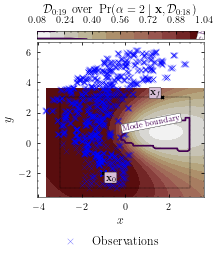

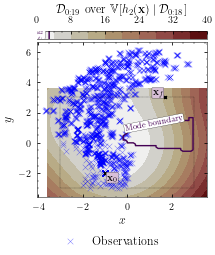

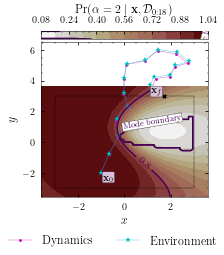

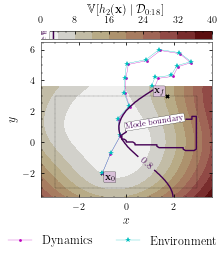

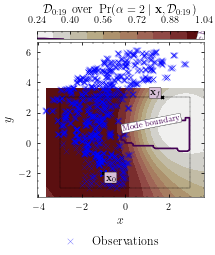

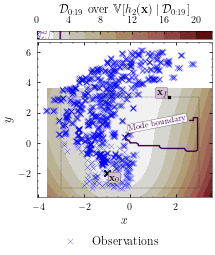

Optimisation result:
     fun: 435.5340579552904
     jac: array([-24.32320895,   8.80431021, -24.25017733,   8.76406725,
       -22.67722578,   8.68620501, -23.55924176,   8.78392542,
       -16.25741683,   8.33820887, -15.6671701 ,   8.4300014 ,
       -16.52788639,   8.33026328, -16.87628603,   8.56271186,
       -17.02860448,   8.32560756, -16.55699779,   8.53162291,
       -16.26482444,   8.45808394, -12.8582481 ,   6.35919367,
       -13.27494076,   6.40702243,  -7.3160426 ,   3.41445475,
        -7.83358549,   3.41967603])
 message: 'Optimization terminated successfully'
    nfev: 45
     nit: 25
    njev: 25
  status: 0
 success: True
       x: array([ 2.24690444,  5.31275164,  2.54515525,  5.06885753, -1.67657025,
        5.06091324,  0.79036928,  5.0698168 , -2.03441934,  4.30854467,
       -3.00607159,  3.48241722, -1.47544975,  4.9756333 ,  2.41830473,
        4.06685333,  0.78825075,  5.325779  ,  3.53206047,  3.23195407,
        4.31738063,  1.37628386, -1.55176533,  1.43

2022-04-22 14:04:53.067413: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 14:04:53.067429: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


3/3 [==============================] - 2s 855ms/step - loss: -814.1268 - val_loss: -179.5819


2022-04-22 14:04:54.209651: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 14:04:54.218394: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 14:04:54.224261: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_04_54

2022-04-22 14:04:54.229144: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_04_54/dr-robots-mbp.local.trace.json.gz
2022-04-22 14:04:54.246978: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_04_54

2022-04-22 14:04:54.247156: I tensorflow/core/profiler/rpc/client/s

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_20_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 24ms/step - loss: -703.7998 - val_loss: -629.4224
Epoch 3/20000
3/3 [==============================] - 0s 25ms/step - loss: -846.5878 - val_loss: -198.8646
Epoch 4/20000
3/3 [==============================] - 0s 25ms/step - loss: -808.9778 - val_loss: -344.4563
Epoch 5/20000
3/3 [==============================] - 0s 24ms/step - loss: -697.0019 - val_loss: -903.8042
Epoch 6/20000
3/3 [==============================] - 0s 25ms/step - loss: -716.6876 - val_loss: -701.8474
Epoch 7/20000
3/3 [==============================] - 0s 25ms/step - loss: -860.5020 - val_loss: -866.3782
Epoch 8/20000
3/3 [==============================] - 0s 26ms/step - loss: -732.8219 - val_loss: -818.1057
Epoch 9/20000
3/3 [==============================] - 0s 25ms/step - loss: -864.2559 - val_loss: -811.0657
Epoch 10/20000
3/3 [==============================] - 0s 25ms/step - loss: -759.1748 - val_loss: -909.4874
Epoch 11/20000
3/3 [=========================

3/3 [==============================] - 0s 25ms/step - loss: -922.8496 - val_loss: -959.5084
Epoch 77/20000
3/3 [==============================] - 0s 24ms/step - loss: -826.9829 - val_loss: -945.9830
Epoch 78/20000
3/3 [==============================] - 0s 24ms/step - loss: -890.0358 - val_loss: -743.7910
Epoch 79/20000
3/3 [==============================] - 0s 24ms/step - loss: -948.0332 - val_loss: -122.9004
Epoch 80/20000
3/3 [==============================] - 0s 24ms/step - loss: -913.6793 - val_loss: -818.3654
Epoch 81/20000
3/3 [==============================] - 0s 24ms/step - loss: -932.1816 - val_loss: -237.1382
Epoch 82/20000
3/3 [==============================] - 0s 24ms/step - loss: -929.8373 - val_loss: -540.6037
Epoch 83/20000
3/3 [==============================] - 0s 24ms/step - loss: -955.3662 - val_loss: -487.8983
Epoch 84/20000
3/3 [==============================] - 0s 24ms/step - loss: -982.0747 - val_loss: -729.4193
Epoch 85/20000
3/3 [==============================] 

3/3 [==============================] - 0s 28ms/step - loss: -829.0639 - val_loss: -933.7326
Epoch 153/20000
3/3 [==============================] - 0s 28ms/step - loss: -900.1654 - val_loss: -593.6400
Epoch 154/20000
3/3 [==============================] - 0s 29ms/step - loss: -869.4788 - val_loss: -937.1144
Epoch 155/20000
3/3 [==============================] - 0s 29ms/step - loss: -693.9888 - val_loss: -688.4755
Epoch 156/20000
3/3 [==============================] - 0s 28ms/step - loss: -897.4069 - val_loss: -845.1001
Epoch 157/20000
3/3 [==============================] - 0s 29ms/step - loss: -769.5022 - val_loss: -811.2132
Epoch 158/20000
3/3 [==============================] - 0s 29ms/step - loss: -558.9458 - val_loss: -927.9151
Epoch 159/20000
3/3 [==============================] - 0s 29ms/step - loss: -720.2661 - val_loss: -551.8087
Epoch 160/20000
3/3 [==============================] - 0s 29ms/step - loss: -872.2402 - val_loss: -880.8393
Epoch 161/20000
3/3 [=======================

3/3 [==============================] - 0s 28ms/step - loss: -1009.3557 - val_loss: -958.9150
Epoch 229/20000
3/3 [==============================] - 0s 28ms/step - loss: -939.4755 - val_loss: 25.1153
Epoch 230/20000
3/3 [==============================] - 0s 28ms/step - loss: -883.0833 - val_loss: -897.0272
Epoch 231/20000
3/3 [==============================] - 0s 28ms/step - loss: -980.0204 - val_loss: -933.8712
Epoch 232/20000
3/3 [==============================] - 0s 29ms/step - loss: -895.6694 - val_loss: -816.9199
Epoch 233/20000
3/3 [==============================] - 0s 28ms/step - loss: -941.9321 - val_loss: -942.0587
Epoch 234/20000
3/3 [==============================] - 0s 29ms/step - loss: -707.2260 - val_loss: -893.0024
Epoch 235/20000
3/3 [==============================] - 0s 28ms/step - loss: -823.2561 - val_loss: -721.6682
Epoch 236/20000
3/3 [==============================] - 0s 28ms/step - loss: -930.8343 - val_loss: -930.6055
Epoch 237/20000
3/3 [========================

3/3 [==============================] - 0s 29ms/step - loss: -935.5791 - val_loss: -684.1553
Epoch 305/20000
3/3 [==============================] - 0s 30ms/step - loss: -973.3802 - val_loss: -760.5813
Epoch 306/20000
3/3 [==============================] - 0s 30ms/step - loss: -995.7933 - val_loss: -988.1813
Epoch 307/20000
3/3 [==============================] - 0s 29ms/step - loss: -1008.0961 - val_loss: -896.0564
Epoch 308/20000
3/3 [==============================] - 0s 29ms/step - loss: -870.7258 - val_loss: -995.6188
Epoch 309/20000
3/3 [==============================] - 0s 30ms/step - loss: -944.5612 - val_loss: 110.3580
Epoch 310/20000
3/3 [==============================] - 0s 29ms/step - loss: -948.2331 - val_loss: -992.6663
Epoch 311/20000
3/3 [==============================] - 0s 29ms/step - loss: -1010.0358 - val_loss: -999.0585
Epoch 312/20000
3/3 [==============================] - 0s 30ms/step - loss: -999.2153 - val_loss: -789.1257
Epoch 313/20000
3/3 [======================

Epoch 380/20000
3/3 [==============================] - 0s 30ms/step - loss: -727.8658 - val_loss: -896.8227
Epoch 381/20000
3/3 [==============================] - 0s 29ms/step - loss: -711.0943 - val_loss: -793.2075
Epoch 382/20000
3/3 [==============================] - 0s 30ms/step - loss: -554.7370 - val_loss: -522.8480
Epoch 383/20000
3/3 [==============================] - 0s 31ms/step - loss: -667.7064 - val_loss: -950.9424
Epoch 384/20000
3/3 [==============================] - 0s 29ms/step - loss: -794.3946 - val_loss: -224.2984
Epoch 385/20000
3/3 [==============================] - 0s 29ms/step - loss: -708.3644 - val_loss: -489.7097
Epoch 386/20000
3/3 [==============================] - 0s 29ms/step - loss: -797.6144 - val_loss: -710.5004
Epoch 387/20000
3/3 [==============================] - 0s 29ms/step - loss: -839.0140 - val_loss: -399.7003
Epoch 388/20000
3/3 [==============================] - 0s 28ms/step - loss: -834.6716 - val_loss: -903.4197
Epoch 389/20000
3/3 [=======

3/3 [==============================] - 0s 32ms/step - loss: -942.3264 - val_loss: -973.4733
Epoch 456/20000
3/3 [==============================] - 0s 31ms/step - loss: -892.1519 - val_loss: -798.1614
Epoch 457/20000
3/3 [==============================] - 0s 33ms/step - loss: -991.2416 - val_loss: -996.0994
Epoch 458/20000
3/3 [==============================] - 0s 32ms/step - loss: -931.3632 - val_loss: -981.4205
Epoch 459/20000
3/3 [==============================] - 0s 32ms/step - loss: -869.4390 - val_loss: -891.3685
Epoch 460/20000
3/3 [==============================] - 0s 32ms/step - loss: -994.0118 - val_loss: -720.2079
Epoch 461/20000
3/3 [==============================] - 0s 33ms/step - loss: -1017.1448 - val_loss: -1050.9817
Epoch 462/20000
3/3 [==============================] - 0s 33ms/step - loss: -999.3864 - val_loss: -920.0740
Epoch 463/20000
3/3 [==============================] - 0s 32ms/step - loss: -960.1832 - val_loss: -721.4051
Epoch 464/20000
3/3 [=====================

Epoch 531/20000
3/3 [==============================] - 0s 30ms/step - loss: -915.2024 - val_loss: -935.2699
Epoch 532/20000
3/3 [==============================] - 0s 30ms/step - loss: -931.9868 - val_loss: -934.2744
Epoch 533/20000
3/3 [==============================] - 0s 30ms/step - loss: -825.7196 - val_loss: -807.7993
Epoch 534/20000
3/3 [==============================] - 0s 30ms/step - loss: -958.0209 - val_loss: -967.4287
Epoch 535/20000
3/3 [==============================] - 0s 36ms/step - loss: -1000.9391 - val_loss: -980.9659
Epoch 536/20000
3/3 [==============================] - 0s 31ms/step - loss: -872.5086 - val_loss: -909.9493
Epoch 537/20000
3/3 [==============================] - 0s 31ms/step - loss: -941.0007 - val_loss: -1003.5349
Epoch 538/20000
3/3 [==============================] - 0s 30ms/step - loss: -936.0772 - val_loss: -962.2326
Epoch 539/20000
3/3 [==============================] - 0s 30ms/step - loss: -980.8696 - val_loss: -984.3963
Epoch 540/20000
3/3 [=====

3/3 [==============================] - 0s 32ms/step - loss: -807.5609 - val_loss: -375.0141
Epoch 607/20000
3/3 [==============================] - 0s 33ms/step - loss: -1001.2948 - val_loss: -1058.8529
Epoch 608/20000
3/3 [==============================] - 0s 34ms/step - loss: -873.1612 - val_loss: -588.3695
Epoch 609/20000
3/3 [==============================] - 0s 33ms/step - loss: -931.9052 - val_loss: -876.2941
Epoch 610/20000
3/3 [==============================] - 0s 35ms/step - loss: -993.5743 - val_loss: -1034.5517
Epoch 611/20000
3/3 [==============================] - 0s 36ms/step - loss: -1036.8382 - val_loss: -934.2402
Epoch 612/20000
3/3 [==============================] - 0s 34ms/step - loss: -939.7102 - val_loss: -1027.1846
Epoch 613/20000
3/3 [==============================] - 0s 34ms/step - loss: -1028.2601 - val_loss: -1019.4678
Epoch 614/20000
3/3 [==============================] - 0s 35ms/step - loss: -1010.2681 - val_loss: -1035.7179
Epoch 615/20000
3/3 [==============

3/3 [==============================] - 0s 31ms/step - loss: -949.0656 - val_loss: -1056.4818
Epoch 682/20000
3/3 [==============================] - 0s 32ms/step - loss: -628.0433 - val_loss: -593.4187
Epoch 683/20000
3/3 [==============================] - 0s 32ms/step - loss: -472.4506 - val_loss: -968.8140
Epoch 684/20000
3/3 [==============================] - 0s 32ms/step - loss: -879.0327 - val_loss: -854.8613
Epoch 685/20000
3/3 [==============================] - 0s 32ms/step - loss: 61.8536 - val_loss: -870.5691
Epoch 686/20000
3/3 [==============================] - 0s 32ms/step - loss: -939.5109 - val_loss: -956.5765
Epoch 687/20000
3/3 [==============================] - 0s 31ms/step - loss: -933.9150 - val_loss: -686.4569
Epoch 688/20000
3/3 [==============================] - 0s 32ms/step - loss: -703.6695 - val_loss: -847.4181
Epoch 689/20000
3/3 [==============================] - 0s 32ms/step - loss: -780.2839 - val_loss: -763.0833
Epoch 690/20000
3/3 [========================

Epoch 757/20000
3/3 [==============================] - 0s 30ms/step - loss: -968.2995 - val_loss: -1025.9856
Epoch 758/20000
3/3 [==============================] - 0s 31ms/step - loss: -961.2118 - val_loss: -1041.8642
Epoch 759/20000
3/3 [==============================] - 0s 30ms/step - loss: -943.0209 - val_loss: -921.3240
Epoch 760/20000
3/3 [==============================] - 0s 30ms/step - loss: -1047.2587 - val_loss: -921.3915
Epoch 761/20000
3/3 [==============================] - 0s 32ms/step - loss: -965.6181 - val_loss: -874.2070
Epoch 762/20000
3/3 [==============================] - 0s 36ms/step - loss: -912.2368 - val_loss: -756.3226
Epoch 763/20000
3/3 [==============================] - 0s 31ms/step - loss: -1025.1384 - val_loss: -749.8289
Epoch 764/20000
3/3 [==============================] - 0s 32ms/step - loss: -1043.8953 - val_loss: -1010.2517
Epoch 765/20000
3/3 [==============================] - 0s 34ms/step - loss: -1035.3928 - val_loss: -916.8251
Epoch 766/20000
3/3 [

3/3 [==============================] - 0s 31ms/step - loss: -865.3821 - val_loss: -896.9582
Epoch 833/20000
3/3 [==============================] - 0s 32ms/step - loss: -831.8162 - val_loss: -951.5524
Epoch 834/20000
3/3 [==============================] - 0s 31ms/step - loss: -877.9537 - val_loss: -530.4829
Epoch 835/20000
3/3 [==============================] - 0s 31ms/step - loss: -908.8325 - val_loss: -947.9896
Epoch 836/20000
3/3 [==============================] - 0s 31ms/step - loss: -784.0490 - val_loss: -870.9342
Epoch 837/20000
3/3 [==============================] - 0s 31ms/step - loss: -894.9075 - val_loss: -786.2984
Epoch 838/20000
3/3 [==============================] - 0s 32ms/step - loss: -947.4523 - val_loss: -937.9495
Epoch 839/20000
3/3 [==============================] - 0s 31ms/step - loss: -886.1995 - val_loss: -948.9896
Epoch 840/20000
3/3 [==============================] - 0s 31ms/step - loss: -829.7854 - val_loss: -791.8416
Epoch 841/20000
3/3 [=======================

3/3 [==============================] - 0s 30ms/step - loss: -1024.3962 - val_loss: -983.2155
Epoch 908/20000
3/3 [==============================] - 0s 31ms/step - loss: -1018.7211 - val_loss: -1070.3215
Epoch 909/20000
3/3 [==============================] - 0s 30ms/step - loss: -974.6906 - val_loss: -1102.6978
Epoch 910/20000
3/3 [==============================] - 0s 31ms/step - loss: -955.4141 - val_loss: -1090.1668
Epoch 911/20000
3/3 [==============================] - 0s 30ms/step - loss: -1029.8824 - val_loss: -1008.4333
Epoch 912/20000
3/3 [==============================] - 0s 30ms/step - loss: -985.7185 - val_loss: -1009.9853
Epoch 913/20000
3/3 [==============================] - 0s 30ms/step - loss: -904.8261 - val_loss: -941.0928
Epoch 914/20000
3/3 [==============================] - 0s 31ms/step - loss: -987.9556 - val_loss: -1019.0738
Epoch 915/20000
3/3 [==============================] - 0s 30ms/step - loss: -1008.3253 - val_loss: -879.6051
Epoch 916/20000
3/3 [=============

3/3 [==============================] - 0s 30ms/step - loss: -1053.4950 - val_loss: -1081.5192
Epoch 983/20000
3/3 [==============================] - 0s 31ms/step - loss: -1068.0847 - val_loss: -1032.5209
Epoch 984/20000
3/3 [==============================] - 0s 30ms/step - loss: -963.3039 - val_loss: -953.4923
Epoch 985/20000
3/3 [==============================] - 0s 30ms/step - loss: -1074.5434 - val_loss: -901.9595
Epoch 986/20000
3/3 [==============================] - 0s 30ms/step - loss: -1018.6587 - val_loss: -1057.2973
Epoch 987/20000
3/3 [==============================] - 0s 30ms/step - loss: -1060.7055 - val_loss: -1059.5504
Epoch 988/20000
3/3 [==============================] - 0s 30ms/step - loss: -1076.7789 - val_loss: -1032.1145
Epoch 989/20000
3/3 [==============================] - 0s 30ms/step - loss: -1057.8784 - val_loss: -1000.4473
Epoch 990/20000
3/3 [==============================] - 0s 30ms/step - loss: -931.3670 - val_loss: -883.1995
Epoch 991/20000
3/3 [==========

3/3 [==============================] - 0s 31ms/step - loss: -963.5191 - val_loss: -958.0437
Epoch 1058/20000
3/3 [==============================] - 0s 31ms/step - loss: -949.8122 - val_loss: -917.6862
Epoch 1059/20000
3/3 [==============================] - 0s 31ms/step - loss: -940.6699 - val_loss: -898.5841
Epoch 1060/20000
3/3 [==============================] - 0s 31ms/step - loss: -972.9968 - val_loss: -972.8876
Epoch 1061/20000
3/3 [==============================] - 0s 31ms/step - loss: -981.5970 - val_loss: -973.3929
Epoch 1062/20000
3/3 [==============================] - 0s 32ms/step - loss: -960.2510 - val_loss: -970.4616
Epoch 1063/20000
3/3 [==============================] - 0s 32ms/step - loss: -980.9616 - val_loss: -943.7231
Epoch 1064/20000
3/3 [==============================] - 0s 31ms/step - loss: -984.4669 - val_loss: -1007.8814
Epoch 1065/20000
3/3 [==============================] - 0s 31ms/step - loss: -984.0016 - val_loss: -900.2485
Epoch 1066/20000
3/3 [=============

3/3 [==============================] - 0s 31ms/step - loss: -823.2717 - val_loss: -884.9825
Epoch 1132/20000
3/3 [==============================] - 0s 32ms/step - loss: -869.1558 - val_loss: -962.9941
Epoch 1133/20000
3/3 [==============================] - 0s 33ms/step - loss: -892.2528 - val_loss: -806.4444
Epoch 1134/20000
3/3 [==============================] - 0s 31ms/step - loss: -777.8480 - val_loss: -899.5533
Epoch 1135/20000
3/3 [==============================] - 0s 31ms/step - loss: -964.9844 - val_loss: -1005.9719
Epoch 1136/20000
3/3 [==============================] - 0s 31ms/step - loss: -939.3486 - val_loss: -990.2596
Epoch 1137/20000
3/3 [==============================] - 0s 32ms/step - loss: -964.9645 - val_loss: -945.1619
Epoch 1138/20000
3/3 [==============================] - 0s 31ms/step - loss: -982.3212 - val_loss: -1023.7482
Epoch 1139/20000
3/3 [==============================] - 0s 32ms/step - loss: -961.1849 - val_loss: -1020.6262
Epoch 1140/20000
3/3 [===========

3/3 [==============================] - 0s 33ms/step - loss: -1031.2606 - val_loss: -1003.4189
Epoch 1206/20000
3/3 [==============================] - 0s 33ms/step - loss: -868.1764 - val_loss: -1051.3955
Epoch 1207/20000
3/3 [==============================] - 0s 31ms/step - loss: -843.5116 - val_loss: -587.5536
Epoch 1208/20000
3/3 [==============================] - 0s 33ms/step - loss: -878.8035 - val_loss: -1025.8642
Epoch 1209/20000
3/3 [==============================] - 0s 32ms/step - loss: -1008.5420 - val_loss: -882.0725
Epoch 1210/20000
3/3 [==============================] - 0s 32ms/step - loss: -952.0897 - val_loss: -1012.2992
Epoch 1211/20000
3/3 [==============================] - 0s 31ms/step - loss: -774.8016 - val_loss: -661.6144
Epoch 1212/20000
3/3 [==============================] - 0s 32ms/step - loss: -905.6200 - val_loss: -447.1825
Epoch 1213/20000
3/3 [==============================] - 0s 31ms/step - loss: -836.0729 - val_loss: -936.0486
Epoch 1214/20000
3/3 [========

3/3 [==============================] - 0s 31ms/step - loss: -1097.4187 - val_loss: -1021.8196
Epoch 1280/20000
3/3 [==============================] - 0s 32ms/step - loss: -1066.1451 - val_loss: -997.8102
Epoch 1281/20000
3/3 [==============================] - 0s 30ms/step - loss: -1079.4281 - val_loss: -1034.8597
Epoch 1282/20000
3/3 [==============================] - 0s 30ms/step - loss: -942.7519 - val_loss: -1004.7573
Epoch 1283/20000
3/3 [==============================] - 0s 30ms/step - loss: -817.5500 - val_loss: -876.9804
Epoch 1284/20000
3/3 [==============================] - 0s 30ms/step - loss: -763.4675 - val_loss: -1020.4188
Epoch 1285/20000
3/3 [==============================] - 0s 30ms/step - loss: -323.9544 - val_loss: -933.5609
Epoch 1286/20000
3/3 [==============================] - 0s 30ms/step - loss: -1011.2608 - val_loss: -996.7770
Epoch 1287/20000
3/3 [==============================] - 0s 30ms/step - loss: -852.7061 - val_loss: 212.3728
Epoch 1288/20000
3/3 [=======

3/3 [==============================] - 0s 30ms/step - loss: -882.3190 - val_loss: -1114.1480
Epoch 1354/20000
3/3 [==============================] - 0s 30ms/step - loss: -1014.8939 - val_loss: -928.2768
Epoch 1355/20000
3/3 [==============================] - 0s 30ms/step - loss: -1042.9463 - val_loss: -1030.7875
Epoch 1356/20000
3/3 [==============================] - 0s 31ms/step - loss: -1035.0329 - val_loss: -1065.7122
Epoch 1357/20000
3/3 [==============================] - 0s 30ms/step - loss: -1065.7058 - val_loss: -1000.1168
Epoch 1358/20000
3/3 [==============================] - 0s 29ms/step - loss: -1029.9578 - val_loss: -1096.4012
Epoch 1359/20000
3/3 [==============================] - 0s 30ms/step - loss: -984.1796 - val_loss: -1065.4336
Epoch 1360/20000
3/3 [==============================] - 0s 30ms/step - loss: -1076.0436 - val_loss: -1079.5395
Epoch 1361/20000
3/3 [==============================] - 0s 30ms/step - loss: -1014.0760 - val_loss: -1120.6363
Epoch 1362/20000
3/3 

3/3 [==============================] - 0s 33ms/step - loss: -1035.6362 - val_loss: -902.9022
Epoch 1428/20000
3/3 [==============================] - 0s 32ms/step - loss: -1019.2920 - val_loss: -1075.9743
Epoch 1429/20000
3/3 [==============================] - 0s 32ms/step - loss: -1029.8378 - val_loss: -1072.3293
Epoch 1430/20000
3/3 [==============================] - 0s 34ms/step - loss: -1017.7737 - val_loss: -733.1964
Epoch 1431/20000
3/3 [==============================] - 0s 30ms/step - loss: -1051.0229 - val_loss: -1023.5510
Epoch 1432/20000
3/3 [==============================] - 0s 32ms/step - loss: -1015.8005 - val_loss: -1021.5250
Epoch 1433/20000
3/3 [==============================] - 0s 30ms/step - loss: -1008.1169 - val_loss: -1045.7590
Epoch 1434/20000
3/3 [==============================] - 0s 31ms/step - loss: -1080.8318 - val_loss: -1067.2954
Epoch 1435/20000
3/3 [==============================] - 0s 31ms/step - loss: -1058.8702 - val_loss: -1002.7371
Epoch 1436/20000
3/3

3/3 [==============================] - 0s 34ms/step - loss: -1010.7720 - val_loss: -984.4038
Epoch 1502/20000
3/3 [==============================] - 0s 31ms/step - loss: -1012.2755 - val_loss: -1004.0097
Epoch 1503/20000
3/3 [==============================] - 0s 34ms/step - loss: -1040.7631 - val_loss: -898.3877
Epoch 1504/20000
3/3 [==============================] - 0s 31ms/step - loss: -921.8975 - val_loss: -652.2995
Epoch 1505/20000
3/3 [==============================] - 0s 40ms/step - loss: -991.7167 - val_loss: -1011.6078
Epoch 1506/20000
3/3 [==============================] - 0s 34ms/step - loss: -887.0027 - val_loss: -1012.6900
Epoch 1507/20000
3/3 [==============================] - 0s 31ms/step - loss: -981.0309 - val_loss: -1047.9278
Epoch 1508/20000
3/3 [==============================] - 0s 33ms/step - loss: -1063.1201 - val_loss: -968.9890
Epoch 1509/20000
3/3 [==============================] - 0s 32ms/step - loss: -949.4573 - val_loss: -968.6752
Epoch 1510/20000
3/3 [======

3/3 [==============================] - 0s 34ms/step - loss: -782.5206 - val_loss: -470.3109
Epoch 1577/20000
3/3 [==============================] - 0s 35ms/step - loss: -740.1717 - val_loss: -499.1874
Epoch 1578/20000
3/3 [==============================] - 0s 35ms/step - loss: -651.7018 - val_loss: -144.5282
Epoch 1579/20000
3/3 [==============================] - 0s 35ms/step - loss: -907.4535 - val_loss: 347.8265
Epoch 1580/20000
3/3 [==============================] - 0s 35ms/step - loss: -710.4927 - val_loss: -477.6454
Epoch 1581/20000
3/3 [==============================] - 0s 34ms/step - loss: -825.8649 - val_loss: -809.0233
Epoch 1582/20000
3/3 [==============================] - 0s 34ms/step - loss: -898.2842 - val_loss: -895.9859
Epoch 1583/20000
3/3 [==============================] - 0s 34ms/step - loss: -890.5875 - val_loss: -857.1010
Epoch 1584/20000
3/3 [==============================] - 0s 34ms/step - loss: -909.6989 - val_loss: 532.2013
Epoch 1585/20000
3/3 [================

3/3 [==============================] - 0s 42ms/step - loss: -833.0996 - val_loss: -839.5657
Epoch 1652/20000
3/3 [==============================] - 0s 36ms/step - loss: -735.4786 - val_loss: -789.0613
Epoch 1653/20000
3/3 [==============================] - 0s 35ms/step - loss: -868.5244 - val_loss: -823.5066
Epoch 1654/20000
3/3 [==============================] - 0s 35ms/step - loss: -972.6537 - val_loss: -918.0675
Epoch 1655/20000
3/3 [==============================] - 0s 40ms/step - loss: -916.7469 - val_loss: 142.4954
Epoch 1656/20000
3/3 [==============================] - 0s 45ms/step - loss: -945.3207 - val_loss: -823.8317
Epoch 1657/20000
3/3 [==============================] - 0s 53ms/step - loss: -960.7598 - val_loss: -924.5579
Epoch 1658/20000
3/3 [==============================] - 0s 54ms/step - loss: -933.5696 - val_loss: -949.8051
Epoch 1659/20000
3/3 [==============================] - 0s 53ms/step - loss: -990.0351 - val_loss: -970.8603
Epoch 1660/20000
3/3 [===============

3/3 [==============================] - 0s 38ms/step - loss: -835.1926 - val_loss: -262.5095
Epoch 1727/20000
3/3 [==============================] - 0s 38ms/step - loss: -861.3657 - val_loss: -579.2152
Epoch 1728/20000
3/3 [==============================] - 0s 38ms/step - loss: -952.3320 - val_loss: -861.4367
Epoch 1729/20000
3/3 [==============================] - 0s 39ms/step - loss: -871.7741 - val_loss: -468.9421
Epoch 1730/20000
3/3 [==============================] - 0s 39ms/step - loss: -934.5527 - val_loss: -313.8639
Epoch 1731/20000
3/3 [==============================] - 0s 43ms/step - loss: -806.3807 - val_loss: -597.7065
Epoch 1732/20000
3/3 [==============================] - 0s 39ms/step - loss: -882.4491 - val_loss: -816.2620
Epoch 1733/20000
3/3 [==============================] - 0s 38ms/step - loss: -933.8361 - val_loss: -950.0976
Epoch 1734/20000
3/3 [==============================] - 0s 37ms/step - loss: -911.4792 - val_loss: -876.7715
Epoch 1735/20000
3/3 [==============

3/3 [==============================] - 0s 38ms/step - loss: -945.0296 - val_loss: -1027.7041
Epoch 1802/20000
3/3 [==============================] - 0s 37ms/step - loss: -926.7018 - val_loss: -829.5711
Epoch 1803/20000
3/3 [==============================] - 0s 41ms/step - loss: -877.3701 - val_loss: -480.6800
Epoch 1804/20000
3/3 [==============================] - 0s 40ms/step - loss: -756.9521 - val_loss: -851.6402
Epoch 1805/20000
3/3 [==============================] - 0s 40ms/step - loss: -944.9335 - val_loss: -912.6065
Epoch 1806/20000
3/3 [==============================] - 0s 37ms/step - loss: -868.2310 - val_loss: -657.2430
Epoch 1807/20000
3/3 [==============================] - 0s 41ms/step - loss: -917.0663 - val_loss: -817.1175
Epoch 1808/20000
3/3 [==============================] - 0s 41ms/step - loss: -907.4077 - val_loss: -1010.9711
Epoch 1809/20000
3/3 [==============================] - 0s 42ms/step - loss: -756.3095 - val_loss: -994.1790
Epoch 1810/20000
3/3 [============

3/3 [==============================] - 0s 37ms/step - loss: -956.1475 - val_loss: -841.4100
Epoch 1877/20000
3/3 [==============================] - 0s 39ms/step - loss: -912.5155 - val_loss: -851.3945
Epoch 1878/20000
3/3 [==============================] - 0s 37ms/step - loss: -931.8849 - val_loss: 668.7847
Epoch 1879/20000
3/3 [==============================] - 0s 38ms/step - loss: -733.2575 - val_loss: -767.5192
Epoch 1880/20000
3/3 [==============================] - 0s 37ms/step - loss: -905.3210 - val_loss: -942.2314
Epoch 1881/20000
3/3 [==============================] - 0s 37ms/step - loss: -871.1255 - val_loss: -918.8599
Epoch 1882/20000
3/3 [==============================] - 0s 37ms/step - loss: -937.9299 - val_loss: -644.9788
Epoch 1883/20000
3/3 [==============================] - 0s 38ms/step - loss: -840.9028 - val_loss: -926.1429
Epoch 1884/20000
3/3 [==============================] - 0s 38ms/step - loss: -810.5830 - val_loss: -646.8960
Epoch 1885/20000
3/3 [===============

3/3 [==============================] - 0s 41ms/step - loss: -985.0138 - val_loss: -903.0030
Epoch 1952/20000
3/3 [==============================] - 0s 56ms/step - loss: -1041.3099 - val_loss: -303.7534
Epoch 1953/20000
3/3 [==============================] - 0s 46ms/step - loss: -966.1393 - val_loss: -475.7264
Epoch 1954/20000
3/3 [==============================] - 0s 43ms/step - loss: -1002.2602 - val_loss: -523.9889
Epoch 1955/20000
3/3 [==============================] - 0s 44ms/step - loss: -973.1678 - val_loss: -999.3546
Epoch 1956/20000
3/3 [==============================] - 0s 44ms/step - loss: -1004.5479 - val_loss: -766.0569
Epoch 1957/20000
3/3 [==============================] - 0s 53ms/step - loss: -982.9625 - val_loss: 98.9267
Epoch 1958/20000
3/3 [==============================] - 0s 46ms/step - loss: -1019.3841 - val_loss: -665.9936
Epoch 1959/20000
3/3 [==============================] - 0s 42ms/step - loss: -1004.7895 - val_loss: -673.5644
Epoch 1960/20000
3/3 [===========

/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_20_epoch_2000/assets
Epoch 2002/20000
3/3 [==============================] - 0s 24ms/step - loss: -856.0347 - val_loss: -582.0880
Epoch 2003/20000
3/3 [==============================] - 0s 26ms/step - loss: -770.6223 - val_loss: -910.1617
Epoch 2004/20000
3/3 [==============================] - 0s 27ms/step - loss: -905.0809 - val_loss: -765.4315
Epoch 2005/20000
3/3 [==============================] - 0s 25ms/step - loss: -983.5004 - val_loss: -709.5144
Epoch 2006/20000
3/3 [==============================] - 0s 25ms/step - loss: -918.3456 - val_loss: -451.3185
Epoch 2007/20000
3/3 [==============================] - 0s 25ms/step - loss: -910.0218 - val_loss: -941.2599
Epoch 2008/20000
3/3 [==============================] - 0s 25ms/step - loss: -824.9532 - val_loss: -922.1828
Epoch 2009/20000
3/3 [==============================] - 0s 25ms/step - loss: -925.4874 - val_loss: -672.9

Epoch 2076/20000
3/3 [==============================] - 0s 29ms/step - loss: -980.1187 - val_loss: -1028.2432
Epoch 2077/20000
3/3 [==============================] - 0s 28ms/step - loss: -994.8748 - val_loss: -511.4829
Epoch 2078/20000
3/3 [==============================] - 0s 28ms/step - loss: -853.9514 - val_loss: -1025.4589
Epoch 2079/20000
3/3 [==============================] - 0s 30ms/step - loss: -948.0932 - val_loss: -922.0898
Epoch 2080/20000
3/3 [==============================] - 0s 29ms/step - loss: -1003.6390 - val_loss: -611.2343
Epoch 2081/20000
3/3 [==============================] - 0s 29ms/step - loss: -837.9574 - val_loss: -888.6065
Epoch 2082/20000
3/3 [==============================] - 0s 29ms/step - loss: -765.1153 - val_loss: -839.7354
Epoch 2083/20000
3/3 [==============================] - 0s 30ms/step - loss: -580.9247 - val_loss: -399.2288
Epoch 2084/20000
3/3 [==============================] - 0s 28ms/step - loss: -971.6307 - val_loss: -111.2119
Epoch 2085/20000

3/3 [==============================] - 0s 30ms/step - loss: -956.4426 - val_loss: -191.1030
Epoch 2152/20000
3/3 [==============================] - 0s 30ms/step - loss: -832.3922 - val_loss: -838.5721
Epoch 2153/20000
3/3 [==============================] - 0s 30ms/step - loss: -1021.8519 - val_loss: -411.8166
Epoch 2154/20000
3/3 [==============================] - 0s 30ms/step - loss: -898.3686 - val_loss: -977.8593
Epoch 2155/20000
3/3 [==============================] - 0s 30ms/step - loss: -970.5041 - val_loss: -937.1777
Epoch 2156/20000
3/3 [==============================] - 0s 29ms/step - loss: -905.8594 - val_loss: -342.1057
Epoch 2157/20000
3/3 [==============================] - 0s 29ms/step - loss: -918.5486 - val_loss: -163.6195
Epoch 2158/20000
3/3 [==============================] - 0s 30ms/step - loss: -924.0523 - val_loss: -352.3397
Epoch 2159/20000
3/3 [==============================] - 0s 29ms/step - loss: -998.5655 - val_loss: -997.8705
Epoch 2160/20000
3/3 [=============

3/3 [==============================] - 0s 31ms/step - loss: -954.8457 - val_loss: -574.9583
Epoch 2227/20000
3/3 [==============================] - 0s 30ms/step - loss: -850.9057 - val_loss: -987.6029
Epoch 2228/20000
3/3 [==============================] - 0s 30ms/step - loss: -991.4066 - val_loss: -1011.1138
Epoch 2229/20000
3/3 [==============================] - 0s 29ms/step - loss: -936.4782 - val_loss: -778.2264
Epoch 2230/20000
3/3 [==============================] - 0s 30ms/step - loss: -919.0983 - val_loss: -1043.0149
Epoch 2231/20000
3/3 [==============================] - 0s 29ms/step - loss: -951.4664 - val_loss: -941.9763
Epoch 2232/20000
3/3 [==============================] - 0s 30ms/step - loss: -1013.8229 - val_loss: -631.5940
Epoch 2233/20000
3/3 [==============================] - 0s 28ms/step - loss: -873.3908 - val_loss: -1021.6150
Epoch 2234/20000
3/3 [==============================] - 0s 30ms/step - loss: -967.7388 - val_loss: -882.7737
Epoch 2235/20000
3/3 [==========

3/3 [==============================] - 0s 29ms/step - loss: -798.5339 - val_loss: -28.3134
Epoch 2302/20000
3/3 [==============================] - 0s 29ms/step - loss: -867.6326 - val_loss: -892.0484
Epoch 2303/20000
3/3 [==============================] - 0s 29ms/step - loss: -922.8217 - val_loss: -887.8951
Epoch 2304/20000
3/3 [==============================] - 0s 30ms/step - loss: -672.0305 - val_loss: -902.5347
Epoch 2305/20000
3/3 [==============================] - 0s 30ms/step - loss: -938.9852 - val_loss: -656.3924
Epoch 2306/20000
3/3 [==============================] - 0s 29ms/step - loss: -772.0541 - val_loss: -653.8100
Epoch 2307/20000
3/3 [==============================] - 0s 30ms/step - loss: -861.0854 - val_loss: -933.3006
Epoch 2308/20000
3/3 [==============================] - 0s 30ms/step - loss: -812.8622 - val_loss: -954.7705
Epoch 2309/20000
3/3 [==============================] - 0s 30ms/step - loss: -885.2127 - val_loss: -926.5055
Epoch 2310/20000
3/3 [===============

3/3 [==============================] - 0s 30ms/step - loss: -633.7187 - val_loss: -796.0556
Epoch 2377/20000
3/3 [==============================] - 0s 31ms/step - loss: -850.5075 - val_loss: -801.5313
Epoch 2378/20000
3/3 [==============================] - 0s 31ms/step - loss: -915.7154 - val_loss: -822.5563
Epoch 2379/20000
3/3 [==============================] - 0s 30ms/step - loss: -838.6998 - val_loss: -661.9501
Epoch 2380/20000
3/3 [==============================] - 0s 30ms/step - loss: -740.1502 - val_loss: -899.2554
Epoch 2381/20000
3/3 [==============================] - 0s 32ms/step - loss: -757.5119 - val_loss: -857.8345
Epoch 2382/20000
3/3 [==============================] - 0s 33ms/step - loss: -831.0593 - val_loss: -927.1513
Epoch 2383/20000
3/3 [==============================] - 0s 34ms/step - loss: -846.5790 - val_loss: -811.2098
Epoch 2384/20000
3/3 [==============================] - 0s 31ms/step - loss: -811.6908 - val_loss: -809.7306
Epoch 2385/20000
3/3 [==============

3/3 [==============================] - 0s 32ms/step - loss: -956.5859 - val_loss: -159.7688
Epoch 2452/20000
3/3 [==============================] - 0s 33ms/step - loss: -1021.7389 - val_loss: -854.0111
Epoch 2453/20000
3/3 [==============================] - 0s 33ms/step - loss: -958.0270 - val_loss: -1059.7976
Epoch 2454/20000
3/3 [==============================] - 0s 32ms/step - loss: -1023.7252 - val_loss: -764.3004
Epoch 2455/20000
3/3 [==============================] - 0s 32ms/step - loss: -1018.2712 - val_loss: -798.1852
Epoch 2456/20000
3/3 [==============================] - 0s 33ms/step - loss: -1032.8850 - val_loss: -1032.6711
Epoch 2457/20000
3/3 [==============================] - 0s 32ms/step - loss: -948.7024 - val_loss: -727.5973
Epoch 2458/20000
3/3 [==============================] - 0s 34ms/step - loss: -1014.5269 - val_loss: -1068.2719
Epoch 2459/20000
3/3 [==============================] - 0s 33ms/step - loss: -1021.8234 - val_loss: -978.9178
Epoch 2460/20000
3/3 [=====

3/3 [==============================] - 0s 37ms/step - loss: -999.1028 - val_loss: -625.3182
Epoch 2527/20000
3/3 [==============================] - 0s 40ms/step - loss: -1033.6529 - val_loss: -1047.3902
Epoch 2528/20000
3/3 [==============================] - 0s 36ms/step - loss: -959.1113 - val_loss: -1010.9114
Epoch 2529/20000
3/3 [==============================] - 0s 38ms/step - loss: -1010.8692 - val_loss: -860.5465
Epoch 2530/20000
3/3 [==============================] - 0s 35ms/step - loss: -1010.9169 - val_loss: -405.9525
Epoch 2531/20000
3/3 [==============================] - 0s 35ms/step - loss: -956.3824 - val_loss: -195.1077
Epoch 2532/20000
3/3 [==============================] - 0s 34ms/step - loss: -946.1187 - val_loss: -692.5753
Epoch 2533/20000
3/3 [==============================] - 0s 35ms/step - loss: -1010.8970 - val_loss: -1014.0791
Epoch 2534/20000
3/3 [==============================] - 0s 35ms/step - loss: -989.5548 - val_loss: -1001.5275
Epoch 2535/20000
3/3 [======

Epoch 2601/20000
3/3 [==============================] - 0s 34ms/step - loss: -913.9445 - val_loss: -875.0985
Epoch 2602/20000
3/3 [==============================] - 0s 34ms/step - loss: -972.3446 - val_loss: -1002.9152
Epoch 2603/20000
3/3 [==============================] - 0s 35ms/step - loss: -968.0297 - val_loss: -978.6063
Epoch 2604/20000
3/3 [==============================] - 0s 34ms/step - loss: -930.1375 - val_loss: -872.8189
Epoch 2605/20000
3/3 [==============================] - 0s 35ms/step - loss: -964.1601 - val_loss: -961.3838
Epoch 2606/20000
3/3 [==============================] - 0s 36ms/step - loss: -994.3093 - val_loss: -951.9203
Epoch 2607/20000
3/3 [==============================] - 0s 34ms/step - loss: -968.9526 - val_loss: -892.3152
Epoch 2608/20000
3/3 [==============================] - 0s 34ms/step - loss: -858.8975 - val_loss: -993.6849
Epoch 2609/20000
3/3 [==============================] - 0s 35ms/step - loss: -944.6577 - val_loss: -406.9796
Epoch 2610/20000
3

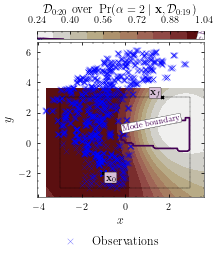

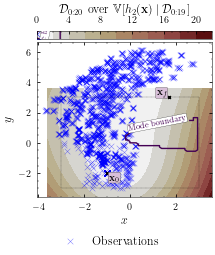

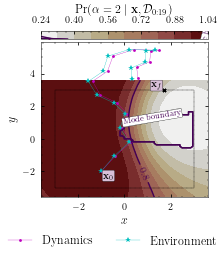

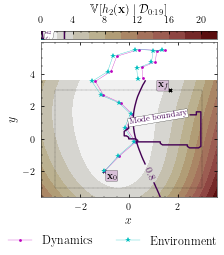

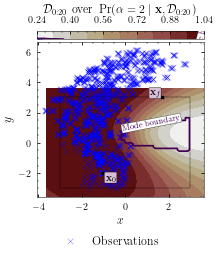

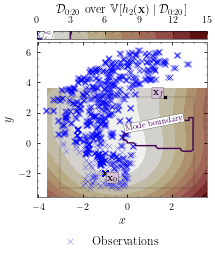

Optimisation result:
     fun: 205.5113846090207
     jac: array([-14.54109756,   9.85952396, -14.56623885,   9.87648544,
       -11.62409448,  10.60598252, -11.77221377,  10.76420175,
        -8.17779597,   9.01126967,  -8.38119379,   9.07434551,
        -8.03401932,   9.03257327,  -8.22222405,   9.17526769,
        -8.14187929,   9.05075973,  -8.03954457,   9.29749918,
        -8.0103855 ,   9.15827829,  -8.13511531,   9.12315857,
        -8.1593981 ,   9.0665997 ,  -6.24322901,   7.63112674,
        -6.56913758,   7.72627687])
 message: 'Optimization terminated successfully'
    nfev: 47
     nit: 26
    njev: 26
  status: 0
 success: True
       x: array([ 2.75343608,  5.76201499,  2.38483765,  5.30209257, -0.91845329,
        5.52347131,  1.34071457,  5.14062576, -1.60898475,  4.36793019,
        1.30188057,  4.71462134, -1.60275238,  4.37792288,  2.13383716,
        4.2167475 ,  0.70675011,  4.80888828,  3.22868381,  1.52050106,
        2.82713297,  3.03740259,  1.73801914, -1.07

2022-04-22 14:10:43.715914: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 14:10:43.715939: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


3/3 [==============================] - 2s 1s/step - loss: -1000.0122 - val_loss: -797.1920


2022-04-22 14:10:45.099827: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 14:10:45.111127: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 14:10:45.119312: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_10_45

2022-04-22 14:10:45.125399: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_10_45/dr-robots-mbp.local.trace.json.gz
2022-04-22 14:10:45.148222: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_10_45

2022-04-22 14:10:45.148455: I tensorflow/core/profiler/rpc/client/s

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_21_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 25ms/step - loss: -950.7495 - val_loss: -942.3410
Epoch 3/20000
3/3 [==============================] - 0s 25ms/step - loss: -991.7082 - val_loss: -604.4744
Epoch 4/20000
3/3 [==============================] - 0s 25ms/step - loss: -1002.2712 - val_loss: -818.1579
Epoch 5/20000
3/3 [==============================] - 0s 25ms/step - loss: -981.1390 - val_loss: -836.8261
Epoch 6/20000
3/3 [==============================] - 0s 27ms/step - loss: -995.0815 - val_loss: -862.6594
Epoch 7/20000
3/3 [==============================] - 0s 25ms/step - loss: -997.0536 - val_loss: -934.9574
Epoch 8/20000
3/3 [==============================] - 0s 25ms/step - loss: -1030.0558 - val_loss: -957.6482
Epoch 9/20000
3/3 [==============================] - 0s 25ms/step - loss: -1021.2983 - val_loss: -957.2988
Epoch 10/20000
3/3 [==============================] - 0s 24ms/step - loss: -1012.5830 - val_loss: -754.8346
Epoch 11/20000
3/3 [=====================

3/3 [==============================] - 0s 32ms/step - loss: -885.9390 - val_loss: -524.8926
Epoch 77/20000
3/3 [==============================] - 0s 35ms/step - loss: -867.8131 - val_loss: -844.4763
Epoch 78/20000
3/3 [==============================] - 0s 33ms/step - loss: -887.1500 - val_loss: -561.1215
Epoch 79/20000
3/3 [==============================] - 0s 35ms/step - loss: -955.9755 - val_loss: -615.7677
Epoch 80/20000
3/3 [==============================] - 0s 33ms/step - loss: -869.9145 - val_loss: -645.5760
Epoch 81/20000
3/3 [==============================] - 0s 34ms/step - loss: -939.5592 - val_loss: -852.6134
Epoch 82/20000
3/3 [==============================] - 0s 33ms/step - loss: -950.9899 - val_loss: -671.1997
Epoch 83/20000
3/3 [==============================] - 0s 33ms/step - loss: -802.9075 - val_loss: -476.7407
Epoch 84/20000
3/3 [==============================] - 0s 33ms/step - loss: -807.4728 - val_loss: -885.7987
Epoch 85/20000
3/3 [==============================] 

Epoch 152/20000
3/3 [==============================] - 0s 30ms/step - loss: -961.4101 - val_loss: -976.7947
Epoch 153/20000
3/3 [==============================] - 0s 31ms/step - loss: -888.4258 - val_loss: -872.0742
Epoch 154/20000
3/3 [==============================] - 0s 31ms/step - loss: -782.5288 - val_loss: -722.9549
Epoch 155/20000
3/3 [==============================] - 0s 31ms/step - loss: -933.9985 - val_loss: -755.5785
Epoch 156/20000
3/3 [==============================] - 0s 31ms/step - loss: -728.5761 - val_loss: -495.2112
Epoch 157/20000
3/3 [==============================] - 0s 31ms/step - loss: -884.3665 - val_loss: -463.6998
Epoch 158/20000
3/3 [==============================] - 0s 30ms/step - loss: -1010.5599 - val_loss: -843.9534
Epoch 159/20000
3/3 [==============================] - 0s 33ms/step - loss: -981.0947 - val_loss: -936.5691
Epoch 160/20000
3/3 [==============================] - 0s 31ms/step - loss: -985.6244 - val_loss: -974.8255
Epoch 161/20000
3/3 [======

3/3 [==============================] - 0s 35ms/step - loss: -947.9177 - val_loss: -926.2323
Epoch 228/20000
3/3 [==============================] - 0s 35ms/step - loss: -906.1268 - val_loss: -826.2312
Epoch 229/20000
3/3 [==============================] - 0s 34ms/step - loss: -737.7167 - val_loss: -653.2460
Epoch 230/20000
3/3 [==============================] - 0s 35ms/step - loss: -929.9081 - val_loss: -502.8217
Epoch 231/20000
3/3 [==============================] - 0s 37ms/step - loss: -844.3230 - val_loss: -885.4685
Epoch 232/20000
3/3 [==============================] - 0s 35ms/step - loss: -918.6336 - val_loss: -909.0770
Epoch 233/20000
3/3 [==============================] - 0s 36ms/step - loss: -947.2426 - val_loss: -886.6374
Epoch 234/20000
3/3 [==============================] - 0s 39ms/step - loss: -926.6431 - val_loss: -818.3034
Epoch 235/20000
3/3 [==============================] - 0s 36ms/step - loss: -857.2181 - val_loss: -890.5475
Epoch 236/20000
3/3 [=======================

Epoch 303/20000
3/3 [==============================] - 0s 32ms/step - loss: -829.4237 - val_loss: -553.5582
Epoch 304/20000
3/3 [==============================] - 0s 31ms/step - loss: -937.4466 - val_loss: -859.6346
Epoch 305/20000
3/3 [==============================] - 0s 33ms/step - loss: -775.2133 - val_loss: -834.8149
Epoch 306/20000
3/3 [==============================] - 0s 32ms/step - loss: -940.8291 - val_loss: -855.2514
Epoch 307/20000
3/3 [==============================] - 0s 33ms/step - loss: -919.5369 - val_loss: -787.8724
Epoch 308/20000
3/3 [==============================] - 0s 36ms/step - loss: -922.7624 - val_loss: -697.4694
Epoch 309/20000
3/3 [==============================] - 0s 32ms/step - loss: -955.3558 - val_loss: -878.9121
Epoch 310/20000
3/3 [==============================] - 0s 32ms/step - loss: -915.5205 - val_loss: -850.8988
Epoch 311/20000
3/3 [==============================] - 0s 32ms/step - loss: -940.7525 - val_loss: -875.9207
Epoch 312/20000
3/3 [=======

3/3 [==============================] - 0s 32ms/step - loss: -955.7612 - val_loss: -638.1507
Epoch 379/20000
3/3 [==============================] - 0s 35ms/step - loss: -935.8485 - val_loss: -946.4605
Epoch 380/20000
3/3 [==============================] - 0s 37ms/step - loss: -971.6732 - val_loss: -973.6673
Epoch 381/20000
3/3 [==============================] - 0s 37ms/step - loss: -931.2029 - val_loss: -736.2652
Epoch 382/20000
3/3 [==============================] - 0s 34ms/step - loss: -1020.5756 - val_loss: -747.4524
Epoch 383/20000
3/3 [==============================] - 0s 38ms/step - loss: -955.4055 - val_loss: -677.4111
Epoch 384/20000
3/3 [==============================] - 0s 35ms/step - loss: -1003.1831 - val_loss: -760.2114
Epoch 385/20000
3/3 [==============================] - 0s 36ms/step - loss: -986.4486 - val_loss: -933.7855
Epoch 386/20000
3/3 [==============================] - 0s 38ms/step - loss: -1030.8680 - val_loss: -967.9129
Epoch 387/20000
3/3 [====================

Epoch 454/20000
3/3 [==============================] - 0s 36ms/step - loss: -748.3606 - val_loss: -918.2507
Epoch 455/20000
3/3 [==============================] - 0s 37ms/step - loss: -796.9563 - val_loss: -618.5159
Epoch 456/20000
3/3 [==============================] - 0s 35ms/step - loss: -905.5201 - val_loss: -775.3828
Epoch 457/20000
3/3 [==============================] - 0s 35ms/step - loss: -803.3231 - val_loss: -906.0193
Epoch 458/20000
3/3 [==============================] - 0s 34ms/step - loss: -837.4580 - val_loss: -963.1314
Epoch 459/20000
3/3 [==============================] - 0s 36ms/step - loss: -906.5516 - val_loss: -870.4309
Epoch 460/20000
3/3 [==============================] - 0s 34ms/step - loss: -985.7109 - val_loss: -532.0205
Epoch 461/20000
3/3 [==============================] - 0s 35ms/step - loss: -843.9885 - val_loss: -869.2851
Epoch 462/20000
3/3 [==============================] - 0s 35ms/step - loss: -993.4433 - val_loss: -714.6400
Epoch 463/20000
3/3 [=======

3/3 [==============================] - 0s 39ms/step - loss: -1037.7935 - val_loss: -901.7977
Epoch 530/20000
3/3 [==============================] - 0s 39ms/step - loss: -946.8337 - val_loss: -662.9825
Epoch 531/20000
3/3 [==============================] - 0s 34ms/step - loss: -874.4701 - val_loss: -544.0421
Epoch 532/20000
3/3 [==============================] - 0s 40ms/step - loss: -868.9919 - val_loss: -728.7614
Epoch 533/20000
3/3 [==============================] - 0s 39ms/step - loss: -743.9591 - val_loss: -907.5086
Epoch 534/20000
3/3 [==============================] - 0s 36ms/step - loss: -923.8676 - val_loss: -924.4082
Epoch 535/20000
3/3 [==============================] - 0s 38ms/step - loss: -887.4580 - val_loss: -435.6411
Epoch 536/20000
3/3 [==============================] - 0s 37ms/step - loss: 47.1831 - val_loss: -869.4609
Epoch 537/20000
3/3 [==============================] - 0s 34ms/step - loss: -436.4198 - val_loss: 662.3400
Epoch 538/20000
3/3 [=========================

3/3 [==============================] - 0s 37ms/step - loss: -1013.0132 - val_loss: -407.1540
Epoch 606/20000
3/3 [==============================] - 0s 34ms/step - loss: -908.7826 - val_loss: -867.8628
Epoch 607/20000
3/3 [==============================] - 0s 34ms/step - loss: -885.2729 - val_loss: -891.4765
Epoch 608/20000
3/3 [==============================] - 0s 35ms/step - loss: -941.9408 - val_loss: -941.4234
Epoch 609/20000
3/3 [==============================] - 0s 35ms/step - loss: -977.7705 - val_loss: -789.5335
Epoch 610/20000
3/3 [==============================] - 0s 37ms/step - loss: -984.7450 - val_loss: -558.2409
Epoch 611/20000
3/3 [==============================] - 0s 35ms/step - loss: -988.2870 - val_loss: -864.3666
Epoch 612/20000
3/3 [==============================] - 0s 36ms/step - loss: -924.0547 - val_loss: -713.7800
Epoch 613/20000
3/3 [==============================] - 0s 36ms/step - loss: -984.7090 - val_loss: -796.8918
Epoch 614/20000
3/3 [======================

Epoch 681/20000
3/3 [==============================] - 0s 39ms/step - loss: -1062.7181 - val_loss: -841.2894
Epoch 682/20000
3/3 [==============================] - 0s 36ms/step - loss: -1070.3921 - val_loss: -954.7381
Epoch 683/20000
3/3 [==============================] - 0s 39ms/step - loss: -1064.5631 - val_loss: -938.2101
Epoch 684/20000
3/3 [==============================] - 0s 39ms/step - loss: -1056.9540 - val_loss: -885.5368
Epoch 685/20000
3/3 [==============================] - 0s 39ms/step - loss: -1070.9742 - val_loss: -937.2887
Epoch 686/20000
3/3 [==============================] - 0s 39ms/step - loss: -1038.2175 - val_loss: -885.1967
Epoch 687/20000
3/3 [==============================] - 0s 38ms/step - loss: -1049.1770 - val_loss: -958.2232
Epoch 688/20000
3/3 [==============================] - 0s 38ms/step - loss: -1015.9049 - val_loss: -971.0396
Epoch 689/20000
3/3 [==============================] - 0s 39ms/step - loss: -1067.0405 - val_loss: -923.6518
Epoch 690/20000
3/3

3/3 [==============================] - 0s 34ms/step - loss: -1038.8376 - val_loss: -951.8503
Epoch 757/20000
3/3 [==============================] - 0s 34ms/step - loss: -1055.5191 - val_loss: -935.6446
Epoch 758/20000
3/3 [==============================] - 0s 35ms/step - loss: -1055.1747 - val_loss: -910.4750
Epoch 759/20000
3/3 [==============================] - 0s 34ms/step - loss: -1048.6063 - val_loss: -922.8448
Epoch 760/20000
3/3 [==============================] - 0s 35ms/step - loss: -1082.9221 - val_loss: -883.3799
Epoch 761/20000
3/3 [==============================] - 0s 33ms/step - loss: -1048.4840 - val_loss: -854.6073
Epoch 762/20000
3/3 [==============================] - 0s 35ms/step - loss: -1055.2025 - val_loss: -798.5297
Epoch 763/20000
3/3 [==============================] - 0s 33ms/step - loss: -1050.2230 - val_loss: -938.2013
Epoch 764/20000
3/3 [==============================] - 0s 35ms/step - loss: -1066.4396 - val_loss: -909.2185
Epoch 765/20000
3/3 [==============

3/3 [==============================] - 0s 42ms/step - loss: -671.9783 - val_loss: -339.2181
Epoch 832/20000
3/3 [==============================] - 0s 41ms/step - loss: -1039.8775 - val_loss: -805.4916
Epoch 833/20000
3/3 [==============================] - 0s 42ms/step - loss: -799.1944 - val_loss: -563.5503
Epoch 834/20000
3/3 [==============================] - 0s 51ms/step - loss: -864.8305 - val_loss: -711.7324
Epoch 835/20000
3/3 [==============================] - 0s 39ms/step - loss: -932.6667 - val_loss: -682.8488
Epoch 836/20000
3/3 [==============================] - 0s 40ms/step - loss: -917.1432 - val_loss: -666.1194
Epoch 837/20000
3/3 [==============================] - 0s 38ms/step - loss: -704.7661 - val_loss: -821.7869
Epoch 838/20000
3/3 [==============================] - 0s 43ms/step - loss: -909.9475 - val_loss: -699.2022
Epoch 839/20000
3/3 [==============================] - 0s 38ms/step - loss: -819.3065 - val_loss: -670.3624
Epoch 840/20000
3/3 [======================

3/3 [==============================] - 0s 35ms/step - loss: -1051.1998 - val_loss: -859.3761
Epoch 907/20000
3/3 [==============================] - 0s 35ms/step - loss: -947.1768 - val_loss: -940.9385
Epoch 908/20000
3/3 [==============================] - 0s 34ms/step - loss: -1051.2508 - val_loss: -952.3177
Epoch 909/20000
3/3 [==============================] - 0s 36ms/step - loss: -826.2688 - val_loss: -950.1937
Epoch 910/20000
3/3 [==============================] - 0s 35ms/step - loss: -1041.5734 - val_loss: -870.7826
Epoch 911/20000
3/3 [==============================] - 0s 34ms/step - loss: -466.1233 - val_loss: -809.2963
Epoch 912/20000
3/3 [==============================] - 0s 35ms/step - loss: -983.7069 - val_loss: -820.0530
Epoch 913/20000
3/3 [==============================] - 0s 34ms/step - loss: -1005.7975 - val_loss: -836.9449
Epoch 914/20000
3/3 [==============================] - 0s 34ms/step - loss: -651.1127 - val_loss: -583.1091
Epoch 915/20000
3/3 [===================

Epoch 982/20000
3/3 [==============================] - 0s 45ms/step - loss: -1071.9513 - val_loss: -924.8398
Epoch 983/20000
3/3 [==============================] - 0s 42ms/step - loss: -1082.3766 - val_loss: -898.5301
Epoch 984/20000
3/3 [==============================] - 0s 42ms/step - loss: -1070.3091 - val_loss: -858.9966
Epoch 985/20000
3/3 [==============================] - 0s 42ms/step - loss: -1080.7047 - val_loss: -923.0272
Epoch 986/20000
3/3 [==============================] - 0s 43ms/step - loss: -1097.7875 - val_loss: -913.0407
Epoch 987/20000
3/3 [==============================] - 0s 50ms/step - loss: -1079.6808 - val_loss: -946.4238
Epoch 988/20000
3/3 [==============================] - 0s 41ms/step - loss: -1096.9506 - val_loss: -903.8127
Epoch 989/20000
3/3 [==============================] - 0s 40ms/step - loss: -1101.8494 - val_loss: -914.2308
Epoch 990/20000
3/3 [==============================] - 0s 41ms/step - loss: -1097.9810 - val_loss: -906.7911
Epoch 991/20000
3/3

Epoch 1057/20000
3/3 [==============================] - 0s 35ms/step - loss: -999.2565 - val_loss: -892.7449
Epoch 1058/20000
3/3 [==============================] - 0s 35ms/step - loss: -997.4238 - val_loss: -897.1738
Epoch 1059/20000
3/3 [==============================] - 0s 36ms/step - loss: -1032.9640 - val_loss: -889.5598
Epoch 1060/20000
3/3 [==============================] - 0s 36ms/step - loss: -1038.1261 - val_loss: -888.6092
Epoch 1061/20000
3/3 [==============================] - 0s 41ms/step - loss: -1012.5589 - val_loss: -890.0802
Epoch 1062/20000
3/3 [==============================] - 0s 36ms/step - loss: -1046.9530 - val_loss: -896.6601
Epoch 1063/20000
3/3 [==============================] - 0s 37ms/step - loss: -1035.8394 - val_loss: -880.1536
Epoch 1064/20000
3/3 [==============================] - 0s 37ms/step - loss: -1041.2019 - val_loss: -840.5229
Epoch 1065/20000
3/3 [==============================] - 0s 38ms/step - loss: -1050.5353 - val_loss: -869.1707
Epoch 1066/2

Epoch 1132/20000
3/3 [==============================] - 0s 35ms/step - loss: -1029.5144 - val_loss: -859.6874
Epoch 1133/20000
3/3 [==============================] - 0s 35ms/step - loss: -1029.0629 - val_loss: -906.3384
Epoch 1134/20000
3/3 [==============================] - 0s 34ms/step - loss: -1035.8596 - val_loss: -893.3992
Epoch 1135/20000
3/3 [==============================] - 0s 36ms/step - loss: -1045.8725 - val_loss: -914.7876
Epoch 1136/20000
3/3 [==============================] - 0s 35ms/step - loss: -1043.1408 - val_loss: -875.3384
Epoch 1137/20000
3/3 [==============================] - 0s 39ms/step - loss: -1032.6055 - val_loss: -911.1231
Epoch 1138/20000
3/3 [==============================] - 0s 34ms/step - loss: -1046.9113 - val_loss: -910.7069
Epoch 1139/20000
3/3 [==============================] - 0s 35ms/step - loss: -1056.2750 - val_loss: -891.3406
Epoch 1140/20000
3/3 [==============================] - 0s 37ms/step - loss: -1059.4842 - val_loss: -904.0974
Epoch 1141

3/3 [==============================] - 0s 35ms/step - loss: -803.4791 - val_loss: -769.1203
Epoch 1207/20000
3/3 [==============================] - 0s 32ms/step - loss: -678.6313 - val_loss: -624.5587
Epoch 1208/20000
3/3 [==============================] - 0s 35ms/step - loss: -906.7159 - val_loss: -828.5001
Epoch 1209/20000
3/3 [==============================] - 0s 35ms/step - loss: -943.4758 - val_loss: -892.3465
Epoch 1210/20000
3/3 [==============================] - 0s 36ms/step - loss: -943.1747 - val_loss: -140.7954
Epoch 1211/20000
3/3 [==============================] - 0s 35ms/step - loss: -711.9059 - val_loss: -789.1526
Epoch 1212/20000
3/3 [==============================] - 0s 34ms/step - loss: -818.0644 - val_loss: -898.1085
Epoch 1213/20000
3/3 [==============================] - 0s 34ms/step - loss: -996.7845 - val_loss: -885.2468
Epoch 1214/20000
3/3 [==============================] - 0s 35ms/step - loss: -861.5536 - val_loss: -372.9718
Epoch 1215/20000
3/3 [==============

3/3 [==============================] - 0s 34ms/step - loss: -941.7711 - val_loss: -891.5441
Epoch 1282/20000
3/3 [==============================] - 0s 35ms/step - loss: -904.0715 - val_loss: -867.1944
Epoch 1283/20000
3/3 [==============================] - 0s 35ms/step - loss: -886.0177 - val_loss: -737.7811
Epoch 1284/20000
3/3 [==============================] - 0s 35ms/step - loss: -908.6277 - val_loss: -797.5223
Epoch 1285/20000
3/3 [==============================] - 0s 35ms/step - loss: -889.0305 - val_loss: -805.4144
Epoch 1286/20000
3/3 [==============================] - 0s 38ms/step - loss: -897.3064 - val_loss: -828.5322
Epoch 1287/20000
3/3 [==============================] - 0s 35ms/step - loss: -956.2103 - val_loss: -822.7282
Epoch 1288/20000
3/3 [==============================] - 0s 37ms/step - loss: -955.4270 - val_loss: -896.3310
Epoch 1289/20000
3/3 [==============================] - 0s 39ms/step - loss: -929.6524 - val_loss: -839.2177
Epoch 1290/20000
3/3 [==============

3/3 [==============================] - 0s 36ms/step - loss: -130.4980 - val_loss: -767.5701
Epoch 1356/20000
3/3 [==============================] - 0s 37ms/step - loss: -595.9850 - val_loss: -939.3513
Epoch 1357/20000
3/3 [==============================] - 0s 39ms/step - loss: -985.6965 - val_loss: -957.3009
Epoch 1358/20000
3/3 [==============================] - 0s 36ms/step - loss: -987.4330 - val_loss: -764.5282
Epoch 1359/20000
3/3 [==============================] - 0s 36ms/step - loss: -376.9092 - val_loss: -934.7508
Epoch 1360/20000
3/3 [==============================] - 0s 35ms/step - loss: 67.6441 - val_loss: -407.4122
Epoch 1361/20000
3/3 [==============================] - 0s 38ms/step - loss: -903.0338 - val_loss: -681.9739
Epoch 1362/20000
3/3 [==============================] - 0s 37ms/step - loss: -848.1737 - val_loss: -423.1177
Epoch 1363/20000
3/3 [==============================] - 0s 37ms/step - loss: -762.5277 - val_loss: -8.5151
Epoch 1364/20000
3/3 [==================

3/3 [==============================] - 0s 36ms/step - loss: -1004.6181 - val_loss: -1008.2539
Epoch 1431/20000
3/3 [==============================] - 0s 35ms/step - loss: -1068.7674 - val_loss: -903.5699
Epoch 1432/20000
3/3 [==============================] - 0s 35ms/step - loss: -948.9243 - val_loss: -910.7527
Epoch 1433/20000
3/3 [==============================] - 0s 35ms/step - loss: -1016.2531 - val_loss: -858.4735
Epoch 1434/20000
3/3 [==============================] - 0s 36ms/step - loss: -999.1394 - val_loss: -829.6140
Epoch 1435/20000
3/3 [==============================] - 0s 36ms/step - loss: -916.7284 - val_loss: -905.5259
Epoch 1436/20000
3/3 [==============================] - 0s 37ms/step - loss: -1027.5503 - val_loss: -613.6528
Epoch 1437/20000
3/3 [==============================] - 0s 36ms/step - loss: -826.2147 - val_loss: -928.0237
Epoch 1438/20000
3/3 [==============================] - 0s 36ms/step - loss: -931.0228 - val_loss: -908.0488
Epoch 1439/20000
3/3 [=========

3/3 [==============================] - 0s 35ms/step - loss: -253.9732 - val_loss: -796.6300
Epoch 1506/20000
3/3 [==============================] - 0s 36ms/step - loss: -607.8757 - val_loss: -677.9740
Epoch 1507/20000
3/3 [==============================] - 0s 34ms/step - loss: -805.8119 - val_loss: -666.2584
Epoch 1508/20000
3/3 [==============================] - 0s 34ms/step - loss: -748.6849 - val_loss: -789.5858
Epoch 1509/20000
3/3 [==============================] - 0s 34ms/step - loss: -722.4143 - val_loss: -766.5057
Epoch 1510/20000
3/3 [==============================] - 0s 36ms/step - loss: -774.7549 - val_loss: -744.1219
Epoch 1511/20000
3/3 [==============================] - 0s 34ms/step - loss: -799.5214 - val_loss: -558.3273
Epoch 1512/20000
3/3 [==============================] - 0s 35ms/step - loss: -744.1666 - val_loss: -794.2286
Epoch 1513/20000
3/3 [==============================] - 0s 34ms/step - loss: -816.5754 - val_loss: -605.8910
Epoch 1514/20000
3/3 [==============

3/3 [==============================] - 0s 32ms/step - loss: -1054.9256 - val_loss: -985.6388
Epoch 1581/20000
3/3 [==============================] - 0s 33ms/step - loss: -1049.0346 - val_loss: -1016.1596
Epoch 1582/20000
3/3 [==============================] - 0s 32ms/step - loss: -1061.9436 - val_loss: -986.5617
Epoch 1583/20000
3/3 [==============================] - 0s 35ms/step - loss: -1013.9136 - val_loss: -970.9588
Epoch 1584/20000
3/3 [==============================] - 0s 33ms/step - loss: -1066.8488 - val_loss: -938.0138
Epoch 1585/20000
3/3 [==============================] - 0s 33ms/step - loss: -1045.1959 - val_loss: -1019.8953
Epoch 1586/20000
3/3 [==============================] - 0s 33ms/step - loss: -1057.6542 - val_loss: -1058.5846
Epoch 1587/20000
3/3 [==============================] - 0s 34ms/step - loss: -1041.9369 - val_loss: -965.6076
Epoch 1588/20000
3/3 [==============================] - 0s 33ms/step - loss: -1058.5774 - val_loss: -874.0914
Epoch 1589/20000
3/3 [==

Epoch 1655/20000
3/3 [==============================] - 0s 33ms/step - loss: -1058.9212 - val_loss: -1022.0664
Epoch 1656/20000
3/3 [==============================] - 0s 33ms/step - loss: -1067.0242 - val_loss: -968.7021
Epoch 1657/20000
3/3 [==============================] - 0s 34ms/step - loss: -1063.5095 - val_loss: -1000.1993
Epoch 1658/20000
3/3 [==============================] - 0s 34ms/step - loss: -1038.5286 - val_loss: -894.0538
Epoch 1659/20000
3/3 [==============================] - 0s 33ms/step - loss: -1066.1682 - val_loss: -1046.0776
Epoch 1660/20000
3/3 [==============================] - 0s 34ms/step - loss: -1075.5058 - val_loss: -1022.6344
Epoch 1661/20000
3/3 [==============================] - 0s 34ms/step - loss: -1075.6836 - val_loss: -1017.3455
Epoch 1662/20000
3/3 [==============================] - 0s 33ms/step - loss: -1086.4913 - val_loss: -995.9831
Epoch 1663/20000
3/3 [==============================] - 0s 33ms/step - loss: -1072.4035 - val_loss: -1004.0447
Epoc

3/3 [==============================] - 0s 32ms/step - loss: -516.5428 - val_loss: -836.7990
Epoch 1730/20000
3/3 [==============================] - 0s 32ms/step - loss: -902.6032 - val_loss: -860.4127
Epoch 1731/20000
3/3 [==============================] - 0s 32ms/step - loss: -882.0204 - val_loss: -853.3052
Epoch 1732/20000
3/3 [==============================] - 0s 31ms/step - loss: -929.4685 - val_loss: -923.5337
Epoch 1733/20000
3/3 [==============================] - 0s 31ms/step - loss: -838.9805 - val_loss: -962.8416
Epoch 1734/20000
3/3 [==============================] - 0s 32ms/step - loss: -857.2286 - val_loss: -951.6559
Epoch 1735/20000
3/3 [==============================] - 0s 33ms/step - loss: -963.0776 - val_loss: -907.6616
Epoch 1736/20000
3/3 [==============================] - 0s 33ms/step - loss: -937.6149 - val_loss: -905.4702
Epoch 1737/20000
3/3 [==============================] - 0s 32ms/step - loss: -954.6156 - val_loss: -917.9889
Epoch 1738/20000
3/3 [==============

3/3 [==============================] - 0s 33ms/step - loss: -1003.6551 - val_loss: -913.7952
Epoch 1804/20000
3/3 [==============================] - 0s 33ms/step - loss: -1018.0667 - val_loss: -929.9773
Epoch 1805/20000
3/3 [==============================] - 0s 33ms/step - loss: -1006.4966 - val_loss: -993.9615
Epoch 1806/20000
3/3 [==============================] - 0s 37ms/step - loss: -880.9522 - val_loss: -893.0540
Epoch 1807/20000
3/3 [==============================] - 0s 38ms/step - loss: -987.1000 - val_loss: -820.9871
Epoch 1808/20000
3/3 [==============================] - 0s 35ms/step - loss: -677.9386 - val_loss: -893.2218
Epoch 1809/20000
3/3 [==============================] - 0s 33ms/step - loss: -916.2091 - val_loss: -984.3272
Epoch 1810/20000
3/3 [==============================] - 0s 34ms/step - loss: -720.9014 - val_loss: -223.0483
Epoch 1811/20000
3/3 [==============================] - 0s 33ms/step - loss: -436.7215 - val_loss: -196.1735
Epoch 1812/20000
3/3 [===========

3/3 [==============================] - 0s 35ms/step - loss: -1027.7967 - val_loss: -1059.0891
Epoch 1878/20000
3/3 [==============================] - 0s 34ms/step - loss: -1092.5986 - val_loss: -1035.6657
Epoch 1879/20000
3/3 [==============================] - 0s 33ms/step - loss: -1089.1758 - val_loss: -877.8160
Epoch 1880/20000
3/3 [==============================] - 0s 34ms/step - loss: -926.0503 - val_loss: -982.1657
Epoch 1881/20000
3/3 [==============================] - 0s 34ms/step - loss: -1046.0185 - val_loss: -943.0388
Epoch 1882/20000
3/3 [==============================] - 0s 33ms/step - loss: -997.7439 - val_loss: -1034.3226
Epoch 1883/20000
3/3 [==============================] - 0s 34ms/step - loss: -1071.2747 - val_loss: -1031.4643
Epoch 1884/20000
3/3 [==============================] - 0s 34ms/step - loss: -1016.9293 - val_loss: -324.2020
Epoch 1885/20000
3/3 [==============================] - 0s 33ms/step - loss: -838.7842 - val_loss: -950.0866
Epoch 1886/20000
3/3 [====

Epoch 1952/20000
3/3 [==============================] - 0s 34ms/step - loss: -907.1226 - val_loss: -406.5888
Epoch 1953/20000
3/3 [==============================] - 0s 32ms/step - loss: -955.9357 - val_loss: -206.4047
Epoch 1954/20000
3/3 [==============================] - 0s 34ms/step - loss: -892.7730 - val_loss: -944.6625
Epoch 1955/20000
3/3 [==============================] - 0s 33ms/step - loss: -944.8897 - val_loss: -410.9783
Epoch 1956/20000
3/3 [==============================] - 0s 40ms/step - loss: -928.8529 - val_loss: -906.6958
Epoch 1957/20000
3/3 [==============================] - 0s 34ms/step - loss: -961.7584 - val_loss: -821.5755
Epoch 1958/20000
3/3 [==============================] - 0s 33ms/step - loss: -929.8535 - val_loss: -789.9321
Epoch 1959/20000
3/3 [==============================] - 0s 33ms/step - loss: -976.4202 - val_loss: -906.3546
Epoch 1960/20000
3/3 [==============================] - 0s 33ms/step - loss: -969.6348 - val_loss: -674.9285
Epoch 1961/20000
3/

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_21_epoch_2000/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2002/20000
3/3 [==============================] - 0s 29ms/step - loss: -328.5029 - val_loss: -798.2141
Epoch 2003/20000
3/3 [==============================] - 0s 27ms/step - loss: -1028.9679 - val_loss: -720.7761
Epoch 2004/20000
3/3 [==============================] - 0s 27ms/step - loss: -900.2276 - val_loss: -1005.4078
Epoch 2005/20000
3/3 [==============================] - 0s 27ms/step - loss: -884.2834 - val_loss: -973.7335
Epoch 2006/20000
3/3 [==============================] - 0s 25ms/step - loss: -562.9733 - val_loss: -328.5590
Epoch 2007/20000
3/3 [==============================] - 0s 26ms/step - loss: -790.4506 - val_loss: -1016.9484
Epoch 2008/20000
3/3 [==============================] - 0s 26ms/step - loss: -987.4566 - val_loss: -948.7231
Epoch 2009/20000
3/3 [==============================] - 0s 27ms/step - loss: -718.8596 - val_loss: -715.0739
Epoch 2010/20000
3/3 [==============================] - 0s 28ms/step - loss: -337.6185 - val_loss: -964.9742
Epoch 2011/20000

Epoch 2077/20000
3/3 [==============================] - 0s 34ms/step - loss: -945.4421 - val_loss: -955.3645
Epoch 2078/20000
3/3 [==============================] - 0s 33ms/step - loss: -961.7564 - val_loss: -869.6190
Epoch 2079/20000
3/3 [==============================] - 0s 37ms/step - loss: -738.7070 - val_loss: -749.1331
Epoch 2080/20000
3/3 [==============================] - 0s 32ms/step - loss: -884.0309 - val_loss: -972.3034
Epoch 2081/20000
3/3 [==============================] - 0s 32ms/step - loss: -928.1877 - val_loss: -998.0676
Epoch 2082/20000
3/3 [==============================] - 0s 31ms/step - loss: -914.0991 - val_loss: -833.1346
Epoch 2083/20000
3/3 [==============================] - 0s 31ms/step - loss: -960.4700 - val_loss: -990.4211
Epoch 2084/20000
3/3 [==============================] - 0s 31ms/step - loss: -1015.2502 - val_loss: -910.5621
Epoch 2085/20000
3/3 [==============================] - 0s 31ms/step - loss: -850.9683 - val_loss: -1023.0723
Epoch 2086/20000


3/3 [==============================] - 0s 32ms/step - loss: -1108.8615 - val_loss: -1089.7240
Epoch 2152/20000
3/3 [==============================] - 0s 31ms/step - loss: -1042.7484 - val_loss: -876.8566
Epoch 2153/20000
3/3 [==============================] - 0s 34ms/step - loss: -979.5730 - val_loss: -1012.5605
Epoch 2154/20000
3/3 [==============================] - 0s 32ms/step - loss: -1051.8747 - val_loss: -977.5390
Epoch 2155/20000
3/3 [==============================] - 0s 33ms/step - loss: -851.7550 - val_loss: -967.8135
Epoch 2156/20000
3/3 [==============================] - 0s 32ms/step - loss: -1006.4393 - val_loss: -755.3374
Epoch 2157/20000
3/3 [==============================] - 0s 34ms/step - loss: -739.0863 - val_loss: -87.6703
Epoch 2158/20000
3/3 [==============================] - 0s 32ms/step - loss: -747.8872 - val_loss: -640.7111
Epoch 2159/20000
3/3 [==============================] - 0s 35ms/step - loss: 850.7767 - val_loss: 433.0102
Epoch 2160/20000
3/3 [===========

3/3 [==============================] - 0s 32ms/step - loss: -1076.2258 - val_loss: -952.8795
Epoch 2227/20000
3/3 [==============================] - 0s 33ms/step - loss: -1083.1180 - val_loss: -998.5510
Epoch 2228/20000
3/3 [==============================] - 0s 32ms/step - loss: -1045.5097 - val_loss: -992.0114
Epoch 2229/20000
3/3 [==============================] - 0s 32ms/step - loss: -1062.9771 - val_loss: -958.0107
Epoch 2230/20000
3/3 [==============================] - 0s 32ms/step - loss: -1085.6673 - val_loss: -1029.1350
Epoch 2231/20000
3/3 [==============================] - 0s 32ms/step - loss: -1067.5716 - val_loss: -1001.3973
Epoch 2232/20000
3/3 [==============================] - 0s 32ms/step - loss: -1083.9736 - val_loss: -958.2025
Epoch 2233/20000
3/3 [==============================] - 0s 33ms/step - loss: -1065.0055 - val_loss: -1012.9476
Epoch 2234/20000
3/3 [==============================] - 0s 32ms/step - loss: -1096.7278 - val_loss: -1035.3500
Epoch 2235/20000
3/3 [=

3/3 [==============================] - 0s 33ms/step - loss: -918.3655 - val_loss: -795.0513
Epoch 2301/20000
3/3 [==============================] - 0s 33ms/step - loss: -804.7291 - val_loss: -803.3325
Epoch 2302/20000
3/3 [==============================] - 0s 32ms/step - loss: -930.1983 - val_loss: -924.7706
Epoch 2303/20000
3/3 [==============================] - 0s 33ms/step - loss: -947.7589 - val_loss: -869.3408
Epoch 2304/20000
3/3 [==============================] - 0s 33ms/step - loss: -942.8128 - val_loss: -885.3946
Epoch 2305/20000
3/3 [==============================] - 0s 34ms/step - loss: -977.8728 - val_loss: -861.0965
Epoch 2306/20000
3/3 [==============================] - 0s 34ms/step - loss: -962.5710 - val_loss: -935.4349
Epoch 2307/20000
3/3 [==============================] - 0s 34ms/step - loss: -972.4860 - val_loss: -947.7192
Epoch 2308/20000
3/3 [==============================] - 0s 34ms/step - loss: -971.9024 - val_loss: -932.6743
Epoch 2309/20000
3/3 [==============

3/3 [==============================] - 0s 34ms/step - loss: -847.2294 - val_loss: -941.5215
Epoch 2375/20000
3/3 [==============================] - 0s 35ms/step - loss: -974.3898 - val_loss: -983.2737
Epoch 2376/20000
3/3 [==============================] - 0s 34ms/step - loss: -981.6830 - val_loss: -594.2333
Epoch 2377/20000
3/3 [==============================] - 0s 33ms/step - loss: -698.4184 - val_loss: -1032.2997
Epoch 2378/20000
3/3 [==============================] - 0s 34ms/step - loss: -947.8477 - val_loss: -1034.7516
Epoch 2379/20000
3/3 [==============================] - 0s 33ms/step - loss: -906.7945 - val_loss: -543.6577
Epoch 2380/20000
3/3 [==============================] - 0s 33ms/step - loss: -965.2023 - val_loss: -790.9088
Epoch 2381/20000
3/3 [==============================] - 0s 34ms/step - loss: -1041.2420 - val_loss: -983.5128
Epoch 2382/20000
3/3 [==============================] - 0s 35ms/step - loss: -1018.5735 - val_loss: -967.1290
Epoch 2383/20000
3/3 [==========

Epoch 2449/20000
3/3 [==============================] - 0s 34ms/step - loss: -1085.4485 - val_loss: -926.4880
Epoch 2450/20000
3/3 [==============================] - 0s 35ms/step - loss: -1097.8819 - val_loss: -1049.2070
Epoch 2451/20000
3/3 [==============================] - 0s 36ms/step - loss: -1102.1339 - val_loss: -965.0391
Epoch 2452/20000
3/3 [==============================] - 0s 34ms/step - loss: -1087.5291 - val_loss: -1039.8535
Epoch 2453/20000
3/3 [==============================] - 0s 35ms/step - loss: -1086.8948 - val_loss: -1020.2478
Epoch 2454/20000
3/3 [==============================] - 0s 34ms/step - loss: -1100.2665 - val_loss: -1008.8109
Epoch 2455/20000
3/3 [==============================] - 0s 35ms/step - loss: -1088.0907 - val_loss: -1017.4809
Epoch 2456/20000
3/3 [==============================] - 0s 35ms/step - loss: -1096.5715 - val_loss: -1055.0527
Epoch 2457/20000
3/3 [==============================] - 0s 35ms/step - loss: -1111.6168 - val_loss: -1034.8277
Epo

3/3 [==============================] - 0s 35ms/step - loss: -1007.2674 - val_loss: -990.1804
Epoch 2524/20000
3/3 [==============================] - 0s 35ms/step - loss: -1045.4119 - val_loss: -960.4639
Epoch 2525/20000
3/3 [==============================] - 0s 34ms/step - loss: -1039.0469 - val_loss: -952.4577
Epoch 2526/20000
3/3 [==============================] - 0s 34ms/step - loss: -1051.9570 - val_loss: -1014.7709
Epoch 2527/20000
3/3 [==============================] - 0s 34ms/step - loss: -1013.9364 - val_loss: -1025.5702
Epoch 2528/20000
3/3 [==============================] - 0s 35ms/step - loss: -1061.0904 - val_loss: -1021.2890
Epoch 2529/20000
3/3 [==============================] - 0s 35ms/step - loss: -1065.0922 - val_loss: -960.4733
Epoch 2530/20000
3/3 [==============================] - 0s 35ms/step - loss: -1058.3363 - val_loss: -1019.9264
Epoch 2531/20000
3/3 [==============================] - 0s 34ms/step - loss: -1026.4933 - val_loss: -998.0799
Epoch 2532/20000
3/3 [=

3/3 [==============================] - 0s 35ms/step - loss: -1057.2217 - val_loss: -1051.5648
Epoch 2598/20000
3/3 [==============================] - 0s 35ms/step - loss: -1011.6566 - val_loss: -1037.0804
Epoch 2599/20000
3/3 [==============================] - 0s 35ms/step - loss: -1060.6328 - val_loss: -907.7051
Epoch 2600/20000
3/3 [==============================] - 0s 34ms/step - loss: -1008.0733 - val_loss: -915.1517
Epoch 2601/20000
3/3 [==============================] - 0s 35ms/step - loss: -902.6510 - val_loss: -932.6005
Epoch 2602/20000
3/3 [==============================] - 0s 35ms/step - loss: -1034.0965 - val_loss: -975.6324
Epoch 2603/20000
3/3 [==============================] - 0s 39ms/step - loss: -841.9974 - val_loss: -710.9469
Epoch 2604/20000
3/3 [==============================] - 0s 34ms/step - loss: -960.6701 - val_loss: -1023.2676
Epoch 2605/20000
3/3 [==============================] - 0s 36ms/step - loss: -1096.9380 - val_loss: -817.4569
Epoch 2606/20000
3/3 [=====

3/3 [==============================] - 0s 34ms/step - loss: -795.7533 - val_loss: -790.0415
Epoch 2673/20000
3/3 [==============================] - 0s 34ms/step - loss: -797.4845 - val_loss: -608.7157
Epoch 2674/20000
3/3 [==============================] - 0s 37ms/step - loss: -571.9079 - val_loss: 134.2249
Epoch 2675/20000
3/3 [==============================] - 0s 34ms/step - loss: -696.9259 - val_loss: -741.7333
Epoch 2676/20000
3/3 [==============================] - 0s 35ms/step - loss: -756.4407 - val_loss: 15.9571
Epoch 2677/20000
3/3 [==============================] - 0s 35ms/step - loss: -661.1328 - val_loss: -804.1073
Epoch 2678/20000
3/3 [==============================] - 0s 36ms/step - loss: -778.0015 - val_loss: -702.5302
Epoch 2679/20000
3/3 [==============================] - 0s 35ms/step - loss: -796.8928 - val_loss: -768.9057
Epoch 2680/20000
3/3 [==============================] - 0s 36ms/step - loss: -838.9101 - val_loss: -68.9804
Epoch 2681/20000
3/3 [==================

3/3 [==============================] - 0s 37ms/step - loss: -936.2199 - val_loss: -640.4133
Epoch 2748/20000
3/3 [==============================] - 0s 37ms/step - loss: -686.2035 - val_loss: -104.0079
Epoch 2749/20000
3/3 [==============================] - 0s 36ms/step - loss: -841.3187 - val_loss: -872.1195
Epoch 2750/20000
3/3 [==============================] - 0s 37ms/step - loss: -863.8259 - val_loss: -656.6806
Epoch 2751/20000
3/3 [==============================] - 0s 37ms/step - loss: -852.1633 - val_loss: -641.4914
Epoch 2752/20000
3/3 [==============================] - 0s 36ms/step - loss: -741.2663 - val_loss: -316.0571
Epoch 2753/20000
3/3 [==============================] - 0s 37ms/step - loss: -632.6125 - val_loss: -380.9228
Epoch 2754/20000
3/3 [==============================] - 0s 36ms/step - loss: -903.8500 - val_loss: -546.8263
Epoch 2755/20000
3/3 [==============================] - 0s 35ms/step - loss: -603.1035 - val_loss: 455.2708
Epoch 2756/20000
3/3 [===============

3/3 [==============================] - 0s 35ms/step - loss: -745.9245 - val_loss: 104.8781
Epoch 2823/20000
3/3 [==============================] - 0s 36ms/step - loss: -901.5411 - val_loss: -606.3049
Epoch 2824/20000
3/3 [==============================] - 0s 36ms/step - loss: -920.9803 - val_loss: -904.0616
Epoch 2825/20000
3/3 [==============================] - 0s 36ms/step - loss: -924.1346 - val_loss: -523.9769
Epoch 2826/20000
3/3 [==============================] - 0s 35ms/step - loss: -911.4104 - val_loss: -900.7211
Epoch 2827/20000
3/3 [==============================] - 0s 37ms/step - loss: -748.6086 - val_loss: 2.6888
Epoch 2828/20000
3/3 [==============================] - 0s 36ms/step - loss: -933.1645 - val_loss: -777.3890
Epoch 2829/20000
3/3 [==============================] - 0s 36ms/step - loss: -874.3206 - val_loss: -908.0681
Epoch 2830/20000
3/3 [==============================] - 0s 35ms/step - loss: -962.9441 - val_loss: -846.6291
Epoch 2831/20000
3/3 [==================

3/3 [==============================] - 0s 35ms/step - loss: -909.8239 - val_loss: -848.2119
Epoch 2898/20000
3/3 [==============================] - 0s 47ms/step - loss: -802.3300 - val_loss: -878.9972
Epoch 2899/20000
3/3 [==============================] - 0s 55ms/step - loss: -945.1851 - val_loss: -368.5236
Epoch 2900/20000
3/3 [==============================] - 0s 36ms/step - loss: -980.4593 - val_loss: -935.5989
Epoch 2901/20000
3/3 [==============================] - 0s 38ms/step - loss: -893.9934 - val_loss: -914.2732
Epoch 2902/20000
3/3 [==============================] - 0s 34ms/step - loss: -835.8841 - val_loss: -793.7224
Epoch 2903/20000
3/3 [==============================] - 0s 34ms/step - loss: -912.5385 - val_loss: -285.4751
Epoch 2904/20000
3/3 [==============================] - 0s 36ms/step - loss: -903.0119 - val_loss: -759.5953
Epoch 2905/20000
3/3 [==============================] - 0s 36ms/step - loss: -867.2042 - val_loss: -621.7790
Epoch 2906/20000
3/3 [==============

3/3 [==============================] - 0s 36ms/step - loss: -957.1078 - val_loss: -837.5501
Epoch 2973/20000
3/3 [==============================] - 0s 35ms/step - loss: -856.8914 - val_loss: -805.8424
Epoch 2974/20000
3/3 [==============================] - 0s 35ms/step - loss: -931.7258 - val_loss: -829.9315
Epoch 2975/20000
3/3 [==============================] - 0s 35ms/step - loss: -990.8844 - val_loss: -787.1663
Epoch 2976/20000
3/3 [==============================] - 0s 35ms/step - loss: -922.1202 - val_loss: -249.8945
Epoch 2977/20000
3/3 [==============================] - 0s 35ms/step - loss: -837.3986 - val_loss: -339.9462
Epoch 2978/20000
3/3 [==============================] - 0s 38ms/step - loss: -884.4276 - val_loss: -385.6012
Epoch 2979/20000
3/3 [==============================] - 0s 38ms/step - loss: -873.4978 - val_loss: -898.3995
Epoch 2980/20000
3/3 [==============================] - 0s 36ms/step - loss: -923.9633 - val_loss: -809.4330
Epoch 2981/20000
3/3 [==============

3/3 [==============================] - 0s 35ms/step - loss: -698.9817 - val_loss: -801.6444
Epoch 3048/20000
3/3 [==============================] - 0s 35ms/step - loss: -943.8817 - val_loss: -791.0565
Epoch 3049/20000
3/3 [==============================] - 0s 35ms/step - loss: -888.7733 - val_loss: -777.1064
Epoch 3050/20000
3/3 [==============================] - 0s 34ms/step - loss: -901.6803 - val_loss: -642.7004
Epoch 3051/20000
3/3 [==============================] - 0s 36ms/step - loss: -943.9296 - val_loss: -908.1386
Epoch 3052/20000
3/3 [==============================] - 0s 36ms/step - loss: -942.4015 - val_loss: -707.7254
Epoch 3053/20000
3/3 [==============================] - 0s 35ms/step - loss: -910.9088 - val_loss: -720.4006
Epoch 3054/20000
3/3 [==============================] - 0s 35ms/step - loss: -827.5648 - val_loss: -782.9336
Epoch 3055/20000
3/3 [==============================] - 0s 36ms/step - loss: -855.8484 - val_loss: -555.2329
Epoch 3056/20000
3/3 [==============

3/3 [==============================] - 0s 34ms/step - loss: -919.5018 - val_loss: -866.6546
Epoch 3123/20000
3/3 [==============================] - 0s 35ms/step - loss: -1000.5831 - val_loss: -513.2907
Epoch 3124/20000
3/3 [==============================] - 0s 36ms/step - loss: -913.2537 - val_loss: -806.5077
Epoch 3125/20000
3/3 [==============================] - 0s 38ms/step - loss: -877.5367 - val_loss: -470.1298
Epoch 3126/20000
3/3 [==============================] - 0s 37ms/step - loss: -844.0900 - val_loss: -639.4989
Epoch 3127/20000
3/3 [==============================] - 0s 38ms/step - loss: -923.3584 - val_loss: -565.2113
Epoch 3128/20000
3/3 [==============================] - 0s 37ms/step - loss: -992.0276 - val_loss: -857.0560
Epoch 3129/20000
3/3 [==============================] - 0s 40ms/step - loss: -906.5062 - val_loss: -697.3045
Epoch 3130/20000
3/3 [==============================] - 0s 37ms/step - loss: -815.5563 - val_loss: -832.2852
Epoch 3131/20000
3/3 [=============

3/3 [==============================] - 0s 35ms/step - loss: -915.7152 - val_loss: -839.5028
Epoch 3198/20000
3/3 [==============================] - 0s 37ms/step - loss: -1006.2099 - val_loss: -691.5100
Epoch 3199/20000
3/3 [==============================] - 0s 36ms/step - loss: -769.3453 - val_loss: -278.2620
Epoch 3200/20000
3/3 [==============================] - 0s 37ms/step - loss: -941.5252 - val_loss: -360.1780
Epoch 3201/20000
3/3 [==============================] - 0s 36ms/step - loss: -1031.8130 - val_loss: -847.6247
Epoch 3202/20000
3/3 [==============================] - 0s 41ms/step - loss: -791.6892 - val_loss: -431.3362
Epoch 3203/20000
3/3 [==============================] - 0s 36ms/step - loss: -969.2385 - val_loss: -868.5922
Epoch 3204/20000
3/3 [==============================] - 0s 35ms/step - loss: -441.5575 - val_loss: -449.4695
Epoch 3205/20000
3/3 [==============================] - 0s 78ms/step - loss: -977.1623 - val_loss: 1765.7181
Epoch 3206/20000
3/3 [============

3/3 [==============================] - 0s 39ms/step - loss: -892.8842 - val_loss: -766.4446
Epoch 3273/20000
3/3 [==============================] - 0s 41ms/step - loss: -980.1226 - val_loss: -837.2034
Epoch 3274/20000
3/3 [==============================] - 0s 38ms/step - loss: -952.2227 - val_loss: -665.4844
Epoch 3275/20000
3/3 [==============================] - 0s 41ms/step - loss: -858.2539 - val_loss: -905.1657
Epoch 3276/20000
3/3 [==============================] - 0s 47ms/step - loss: -987.2091 - val_loss: -918.0552
Epoch 3277/20000
3/3 [==============================] - 0s 39ms/step - loss: -934.9008 - val_loss: -856.9765
Epoch 3278/20000
3/3 [==============================] - 0s 42ms/step - loss: -950.0470 - val_loss: -932.1735
Epoch 3279/20000
3/3 [==============================] - 0s 39ms/step - loss: -884.7251 - val_loss: -855.3311
Epoch 3280/20000
3/3 [==============================] - 0s 39ms/step - loss: -965.8131 - val_loss: -865.9329
Epoch 3281/20000
3/3 [==============

3/3 [==============================] - 0s 34ms/step - loss: -276.9594 - val_loss: -47.8775
Epoch 3348/20000
3/3 [==============================] - 0s 34ms/step - loss: -533.0714 - val_loss: -72.9385
Epoch 3349/20000
3/3 [==============================] - 0s 35ms/step - loss: -216.5314 - val_loss: -513.6488
Epoch 3350/20000
3/3 [==============================] - 0s 34ms/step - loss: -712.9660 - val_loss: -474.3175
Epoch 3351/20000
3/3 [==============================] - 0s 34ms/step - loss: -687.7021 - val_loss: -834.6353
Epoch 3352/20000
3/3 [==============================] - 0s 36ms/step - loss: -571.8725 - val_loss: -676.1683
Epoch 3353/20000
3/3 [==============================] - 0s 36ms/step - loss: -648.5796 - val_loss: -791.3732
Epoch 3354/20000
3/3 [==============================] - 0s 35ms/step - loss: -790.2672 - val_loss: -869.3259
Epoch 3355/20000
3/3 [==============================] - 0s 37ms/step - loss: -812.6894 - val_loss: -747.0636
Epoch 3356/20000
3/3 [================

3/3 [==============================] - 0s 40ms/step - loss: -893.3591 - val_loss: -942.5120
Epoch 3423/20000
3/3 [==============================] - 0s 37ms/step - loss: -874.9950 - val_loss: -896.3156
Epoch 3424/20000
3/3 [==============================] - 0s 39ms/step - loss: -976.2543 - val_loss: -974.7509
Epoch 3425/20000
3/3 [==============================] - 0s 41ms/step - loss: -931.3238 - val_loss: -390.6364
Epoch 3426/20000
3/3 [==============================] - 0s 41ms/step - loss: -709.9623 - val_loss: -474.8419
Epoch 3427/20000
3/3 [==============================] - 0s 35ms/step - loss: -739.7384 - val_loss: -166.1386
Epoch 3428/20000
3/3 [==============================] - 0s 36ms/step - loss: -624.6004 - val_loss: -964.8933
Epoch 3429/20000
3/3 [==============================] - 0s 40ms/step - loss: -997.3182 - val_loss: -789.5997
Epoch 3430/20000
3/3 [==============================] - 0s 38ms/step - loss: -943.5309 - val_loss: -422.3203
Epoch 3431/20000
3/3 [==============

3/3 [==============================] - 0s 44ms/step - loss: -991.7716 - val_loss: -884.4273
Epoch 3498/20000
3/3 [==============================] - 0s 47ms/step - loss: -974.9540 - val_loss: -872.3641
Epoch 3499/20000
3/3 [==============================] - 0s 38ms/step - loss: -940.5331 - val_loss: -751.7006
Epoch 3500/20000
3/3 [==============================] - 0s 35ms/step - loss: -999.6506 - val_loss: -794.5998
Epoch 3501/20000
3/3 [==============================] - 0s 37ms/step - loss: -972.5358 - val_loss: -828.7142
Epoch 3502/20000
3/3 [==============================] - 0s 39ms/step - loss: -964.6659 - val_loss: -909.2106
Epoch 3503/20000
3/3 [==============================] - 0s 37ms/step - loss: -982.9115 - val_loss: -901.5902
Epoch 3504/20000
3/3 [==============================] - 0s 38ms/step - loss: -936.1816 - val_loss: -963.8001
Epoch 3505/20000
3/3 [==============================] - 0s 41ms/step - loss: -788.4194 - val_loss: -694.5932
Epoch 3506/20000
3/3 [==============

3/3 [==============================] - 0s 37ms/step - loss: -542.8127 - val_loss: -970.3589
Epoch 3573/20000
3/3 [==============================] - 0s 36ms/step - loss: -908.5697 - val_loss: -586.8414
Epoch 3574/20000
3/3 [==============================] - 0s 36ms/step - loss: -924.9507 - val_loss: -834.6157
Epoch 3575/20000
3/3 [==============================] - 0s 36ms/step - loss: -693.2462 - val_loss: -848.5127
Epoch 3576/20000
3/3 [==============================] - 0s 36ms/step - loss: -841.1180 - val_loss: -785.9228
Epoch 3577/20000
3/3 [==============================] - 0s 37ms/step - loss: -20.9358 - val_loss: -11.2562
Epoch 3578/20000
3/3 [==============================] - 0s 39ms/step - loss: -769.4987 - val_loss: -921.0292
Epoch 3579/20000
3/3 [==============================] - 0s 36ms/step - loss: -931.2766 - val_loss: -909.2178
Epoch 3580/20000
3/3 [==============================] - 0s 37ms/step - loss: -949.2943 - val_loss: -912.3351
Epoch 3581/20000
3/3 [================

Epoch 3647/20000
3/3 [==============================] - 0s 38ms/step - loss: -1079.9360 - val_loss: -1009.8658
Epoch 3648/20000
3/3 [==============================] - 0s 36ms/step - loss: -1074.0708 - val_loss: -1016.6126
Epoch 3649/20000
3/3 [==============================] - 0s 42ms/step - loss: -1057.5158 - val_loss: -804.4591
Epoch 3650/20000
3/3 [==============================] - 0s 37ms/step - loss: -1069.8960 - val_loss: -958.6255
Epoch 3651/20000
3/3 [==============================] - 0s 36ms/step - loss: -1064.3283 - val_loss: -935.7932
Epoch 3652/20000
3/3 [==============================] - 0s 37ms/step - loss: -1053.1770 - val_loss: -865.4619
Epoch 3653/20000
3/3 [==============================] - 0s 36ms/step - loss: -1016.9504 - val_loss: -930.1467
Epoch 3654/20000
3/3 [==============================] - 0s 37ms/step - loss: -911.6267 - val_loss: -770.3138
Epoch 3655/20000
3/3 [==============================] - 0s 36ms/step - loss: -1013.2748 - val_loss: -879.7411
Epoch 365

Epoch 3722/20000
3/3 [==============================] - 0s 38ms/step - loss: -922.1574 - val_loss: -1004.6623
Epoch 3723/20000
3/3 [==============================] - 0s 37ms/step - loss: -962.6315 - val_loss: -785.5233
Epoch 3724/20000
3/3 [==============================] - 0s 38ms/step - loss: -889.6478 - val_loss: -998.5389
Epoch 3725/20000
3/3 [==============================] - 0s 35ms/step - loss: -1039.5769 - val_loss: -940.4190
Epoch 3726/20000
3/3 [==============================] - 0s 37ms/step - loss: -974.9028 - val_loss: -926.8146
Epoch 3727/20000
3/3 [==============================] - 0s 36ms/step - loss: -765.2995 - val_loss: -956.1617
Epoch 3728/20000
3/3 [==============================] - 0s 37ms/step - loss: -986.4251 - val_loss: -929.9800
Epoch 3729/20000
3/3 [==============================] - 0s 37ms/step - loss: -877.1576 - val_loss: -916.3954
Epoch 3730/20000
3/3 [==============================] - 0s 36ms/step - loss: -993.0639 - val_loss: -856.2666
Epoch 3731/20000


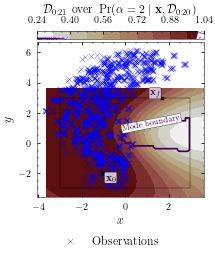

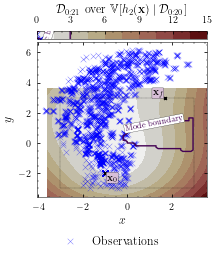

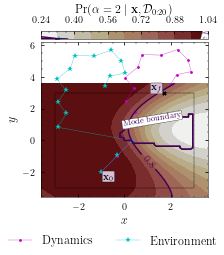

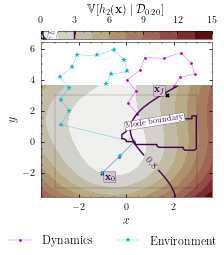

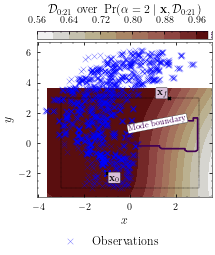

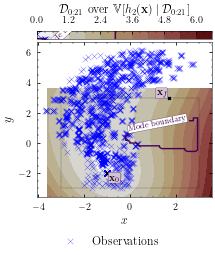

Optimisation result:
     fun: 416.52490450174275
     jac: array([-12.30215255,   4.15900739, -12.25802024,   4.17515495,
       -11.92049288,   4.0626752 , -12.26396728,   4.12100874,
       -11.71632682,   4.08846091, -12.1893027 ,   4.16540046,
       -11.97350515,   4.11321445, -11.92471508,   4.24997615,
       -11.84492703,   4.23424057, -12.0564634 ,   4.18170367,
       -11.89031017,   4.18968565, -11.9452678 ,   4.15426084,
        -6.55306206,   2.08546581,  -4.80028616,   1.46424694,
        -5.06918161,   1.4541152 ])
 message: 'Optimization terminated successfully'
    nfev: 34
     nit: 18
    njev: 18
  status: 0
 success: True
       x: array([ 1.8138611 ,  5.69244803,  2.25707319,  5.46517502, -1.61983036,
        5.31984712,  0.93208477,  5.47457351, -2.11876254,  4.69215734,
        1.50933867,  4.91433595, -0.78455602,  4.83009557,  3.13048835,
        2.97230866,  3.37506166,  1.68697006,  0.95187415, -1.30974746,
        2.84191547,  0.94322302,  1.97950365,  0.0

2022-04-22 14:18:50.038073: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 14:18:50.038093: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


3/3 [==============================] - 2s 1s/step - loss: -974.6231 - val_loss: -844.0958


2022-04-22 14:18:51.519042: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 14:18:51.531274: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 14:18:51.539583: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_18_51

2022-04-22 14:18:51.545946: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_18_51/dr-robots-mbp.local.trace.json.gz
2022-04-22 14:18:51.569832: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_18_51

2022-04-22 14:18:51.570051: I tensorflow/core/profiler/rpc/client/s

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_22_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 29ms/step - loss: -986.1625 - val_loss: -530.1843
Epoch 3/20000
3/3 [==============================] - 0s 30ms/step - loss: -835.0428 - val_loss: -922.7618
Epoch 4/20000
3/3 [==============================] - 0s 28ms/step - loss: -987.8462 - val_loss: -850.5640
Epoch 5/20000
3/3 [==============================] - 0s 28ms/step - loss: -973.4646 - val_loss: -927.0830
Epoch 6/20000
3/3 [==============================] - 0s 28ms/step - loss: -999.6692 - val_loss: -701.2414
Epoch 7/20000
3/3 [==============================] - 0s 36ms/step - loss: -1017.1028 - val_loss: -961.9900
Epoch 8/20000
3/3 [==============================] - 0s 28ms/step - loss: -1016.4032 - val_loss: -902.3072
Epoch 9/20000
3/3 [==============================] - 0s 29ms/step - loss: -1052.1891 - val_loss: -948.4521
Epoch 10/20000
3/3 [==============================] - 0s 28ms/step - loss: -1025.0730 - val_loss: -894.0134
Epoch 11/20000
3/3 [=====================

Epoch 76/20000
3/3 [==============================] - 0s 40ms/step - loss: -1023.7171 - val_loss: -954.1599
Epoch 77/20000
3/3 [==============================] - 0s 37ms/step - loss: -1057.7172 - val_loss: -824.6337
Epoch 78/20000
3/3 [==============================] - 0s 33ms/step - loss: -1083.8761 - val_loss: -979.6716
Epoch 79/20000
3/3 [==============================] - 0s 41ms/step - loss: -1095.6163 - val_loss: -908.6565
Epoch 80/20000
3/3 [==============================] - 0s 36ms/step - loss: -1046.8779 - val_loss: -944.3014
Epoch 81/20000
3/3 [==============================] - 0s 36ms/step - loss: -938.6931 - val_loss: -844.5409
Epoch 82/20000
3/3 [==============================] - 0s 38ms/step - loss: -1062.7804 - val_loss: -968.6717
Epoch 83/20000
3/3 [==============================] - 0s 35ms/step - loss: -1080.6251 - val_loss: -991.6669
Epoch 84/20000
3/3 [==============================] - 0s 32ms/step - loss: -738.5625 - val_loss: -1009.2962
Epoch 85/20000
3/3 [=========

Epoch 152/20000
3/3 [==============================] - 0s 36ms/step - loss: -1053.3886 - val_loss: -744.1662
Epoch 153/20000
3/3 [==============================] - 0s 35ms/step - loss: -1074.3024 - val_loss: -943.4879
Epoch 154/20000
3/3 [==============================] - 0s 35ms/step - loss: -1066.1142 - val_loss: -997.5527
Epoch 155/20000
3/3 [==============================] - 0s 36ms/step - loss: -1073.1802 - val_loss: -964.3256
Epoch 156/20000
3/3 [==============================] - 0s 38ms/step - loss: -1054.8369 - val_loss: -949.5785
Epoch 157/20000
3/3 [==============================] - 0s 40ms/step - loss: -1054.8170 - val_loss: -956.6978
Epoch 158/20000
3/3 [==============================] - 0s 36ms/step - loss: -1084.3334 - val_loss: -991.3051
Epoch 159/20000
3/3 [==============================] - 0s 35ms/step - loss: -1058.1452 - val_loss: -978.6310
Epoch 160/20000
3/3 [==============================] - 0s 38ms/step - loss: -1072.7861 - val_loss: -808.4410
Epoch 161/20000
3/3

3/3 [==============================] - 0s 39ms/step - loss: -1076.6204 - val_loss: -947.9634
Epoch 228/20000
3/3 [==============================] - 0s 41ms/step - loss: -1069.9009 - val_loss: -994.1315
Epoch 229/20000
3/3 [==============================] - 0s 43ms/step - loss: -1034.5747 - val_loss: -761.6871
Epoch 230/20000
3/3 [==============================] - 0s 37ms/step - loss: -1057.6268 - val_loss: -1020.3181
Epoch 231/20000
3/3 [==============================] - 0s 37ms/step - loss: -1074.9758 - val_loss: -1001.7209
Epoch 232/20000
3/3 [==============================] - 0s 36ms/step - loss: -1045.5307 - val_loss: -902.2173
Epoch 233/20000
3/3 [==============================] - 0s 37ms/step - loss: -1086.7032 - val_loss: -937.0772
Epoch 234/20000
3/3 [==============================] - 0s 41ms/step - loss: -1026.5859 - val_loss: -983.2951
Epoch 235/20000
3/3 [==============================] - 0s 40ms/step - loss: -1064.1063 - val_loss: -949.2953
Epoch 236/20000
3/3 [============

3/3 [==============================] - 0s 37ms/step - loss: -1014.9972 - val_loss: -852.3059
Epoch 303/20000
3/3 [==============================] - 0s 35ms/step - loss: -963.7452 - val_loss: -883.9491
Epoch 304/20000
3/3 [==============================] - 0s 36ms/step - loss: -977.6055 - val_loss: -961.7716
Epoch 305/20000
3/3 [==============================] - 0s 37ms/step - loss: -990.3183 - val_loss: -857.5999
Epoch 306/20000
3/3 [==============================] - 0s 38ms/step - loss: -976.6003 - val_loss: -789.5730
Epoch 307/20000
3/3 [==============================] - 0s 36ms/step - loss: -1032.9840 - val_loss: -956.5733
Epoch 308/20000
3/3 [==============================] - 0s 35ms/step - loss: -1049.8491 - val_loss: -957.3587
Epoch 309/20000
3/3 [==============================] - 0s 36ms/step - loss: -1041.8929 - val_loss: -977.0110
Epoch 310/20000
3/3 [==============================] - 0s 38ms/step - loss: -971.2281 - val_loss: -920.2497
Epoch 311/20000
3/3 [===================

3/3 [==============================] - 0s 61ms/step - loss: -787.9327 - val_loss: -1015.3778
Epoch 378/20000
3/3 [==============================] - 0s 50ms/step - loss: -1071.9524 - val_loss: -953.6913
Epoch 379/20000
3/3 [==============================] - 0s 60ms/step - loss: -836.4901 - val_loss: -998.9897
Epoch 380/20000
3/3 [==============================] - 0s 55ms/step - loss: -947.9297 - val_loss: -804.1781
Epoch 381/20000
3/3 [==============================] - 0s 61ms/step - loss: -538.7476 - val_loss: -952.6640
Epoch 382/20000
3/3 [==============================] - 0s 56ms/step - loss: -904.3272 - val_loss: 43.2698
Epoch 383/20000
3/3 [==============================] - 0s 57ms/step - loss: -805.6595 - val_loss: -290.8979
Epoch 384/20000
3/3 [==============================] - 0s 52ms/step - loss: -737.4972 - val_loss: -895.0450
Epoch 385/20000
3/3 [==============================] - 0s 52ms/step - loss: -782.9395 - val_loss: -815.5316
Epoch 386/20000
3/3 [=======================

3/3 [==============================] - 0s 62ms/step - loss: -929.9021 - val_loss: -844.1908
Epoch 453/20000
3/3 [==============================] - 0s 48ms/step - loss: -889.6278 - val_loss: -965.8735
Epoch 454/20000
3/3 [==============================] - 0s 43ms/step - loss: -1003.8832 - val_loss: -971.5269
Epoch 455/20000
3/3 [==============================] - 0s 43ms/step - loss: -976.5193 - val_loss: -1011.2985
Epoch 456/20000
3/3 [==============================] - 0s 43ms/step - loss: -1075.0744 - val_loss: -926.3932
Epoch 457/20000
3/3 [==============================] - 0s 44ms/step - loss: -1082.4472 - val_loss: -973.6816
Epoch 458/20000
3/3 [==============================] - 0s 44ms/step - loss: -1014.0451 - val_loss: -899.6759
Epoch 459/20000
3/3 [==============================] - 0s 46ms/step - loss: -1046.2532 - val_loss: -993.0533
Epoch 460/20000
3/3 [==============================] - 0s 49ms/step - loss: -1043.2648 - val_loss: -893.2768
Epoch 461/20000
3/3 [================

3/3 [==============================] - 0s 67ms/step - loss: -1092.6286 - val_loss: -1047.3342
Epoch 528/20000
3/3 [==============================] - 0s 57ms/step - loss: -1071.1028 - val_loss: -978.8250
Epoch 529/20000
3/3 [==============================] - 0s 55ms/step - loss: -1102.5324 - val_loss: -969.2110
Epoch 530/20000
3/3 [==============================] - 0s 56ms/step - loss: -1109.8960 - val_loss: -1018.8448
Epoch 531/20000
3/3 [==============================] - 0s 56ms/step - loss: -1101.5106 - val_loss: -948.4708
Epoch 532/20000
3/3 [==============================] - 0s 56ms/step - loss: -1116.0190 - val_loss: -941.9166
Epoch 533/20000
3/3 [==============================] - 0s 62ms/step - loss: -1080.9938 - val_loss: -1012.8571
Epoch 534/20000
3/3 [==============================] - 0s 62ms/step - loss: -1100.1636 - val_loss: -1062.9006
Epoch 535/20000
3/3 [==============================] - 0s 74ms/step - loss: -1093.7284 - val_loss: -966.9934
Epoch 536/20000
3/3 [==========

3/3 [==============================] - 0s 46ms/step - loss: -1024.8244 - val_loss: -968.2356
Epoch 603/20000
3/3 [==============================] - 0s 47ms/step - loss: -1015.6755 - val_loss: -942.2492
Epoch 604/20000
3/3 [==============================] - 0s 48ms/step - loss: -1020.2567 - val_loss: -950.6575
Epoch 605/20000
3/3 [==============================] - 0s 50ms/step - loss: -1024.7861 - val_loss: -937.5363
Epoch 606/20000
3/3 [==============================] - 0s 60ms/step - loss: -1042.4366 - val_loss: -960.8385
Epoch 607/20000
3/3 [==============================] - 0s 50ms/step - loss: -1027.2999 - val_loss: -979.5893
Epoch 608/20000
3/3 [==============================] - 0s 53ms/step - loss: -1027.5230 - val_loss: -908.3209
Epoch 609/20000
3/3 [==============================] - 0s 56ms/step - loss: -1032.1949 - val_loss: -974.6385
Epoch 610/20000
3/3 [==============================] - 0s 49ms/step - loss: -1040.8783 - val_loss: -995.2732
Epoch 611/20000
3/3 [==============

3/3 [==============================] - 0s 47ms/step - loss: -884.8822 - val_loss: -609.3746
Epoch 678/20000
3/3 [==============================] - 0s 47ms/step - loss: -972.9650 - val_loss: -842.5504
Epoch 679/20000
3/3 [==============================] - 0s 47ms/step - loss: -966.2421 - val_loss: -881.6783
Epoch 680/20000
3/3 [==============================] - 0s 50ms/step - loss: -913.1474 - val_loss: -965.1646
Epoch 681/20000
3/3 [==============================] - 0s 51ms/step - loss: -975.0523 - val_loss: -963.5953
Epoch 682/20000
3/3 [==============================] - 0s 45ms/step - loss: -982.1780 - val_loss: -953.1879
Epoch 683/20000
3/3 [==============================] - 0s 47ms/step - loss: -1036.1243 - val_loss: -855.1421
Epoch 684/20000
3/3 [==============================] - 0s 47ms/step - loss: -1044.1615 - val_loss: -955.3838
Epoch 685/20000
3/3 [==============================] - 0s 49ms/step - loss: -1012.2250 - val_loss: -941.7449
Epoch 686/20000
3/3 [====================

3/3 [==============================] - 0s 46ms/step - loss: -625.9821 - val_loss: -856.9059
Epoch 753/20000
3/3 [==============================] - 0s 57ms/step - loss: -850.0455 - val_loss: -866.5660
Epoch 754/20000
3/3 [==============================] - 0s 60ms/step - loss: -670.1217 - val_loss: -818.5695
Epoch 755/20000
3/3 [==============================] - 0s 55ms/step - loss: -829.6213 - val_loss: -859.0548
Epoch 756/20000
3/3 [==============================] - 0s 53ms/step - loss: -927.7013 - val_loss: -589.0138
Epoch 757/20000
3/3 [==============================] - 0s 53ms/step - loss: -914.6561 - val_loss: -813.4002
Epoch 758/20000
3/3 [==============================] - 0s 61ms/step - loss: -443.6351 - val_loss: -747.4030
Epoch 759/20000
3/3 [==============================] - 0s 55ms/step - loss: -786.7746 - val_loss: -873.9584
Epoch 760/20000
3/3 [==============================] - 0s 54ms/step - loss: -961.6303 - val_loss: -934.5421
Epoch 761/20000
3/3 [=======================

3/3 [==============================] - 0s 44ms/step - loss: -1055.0938 - val_loss: -890.5106
Epoch 828/20000
3/3 [==============================] - 0s 45ms/step - loss: -1084.6117 - val_loss: -900.3923
Epoch 829/20000
3/3 [==============================] - 0s 41ms/step - loss: -1070.9127 - val_loss: -1004.1965
Epoch 830/20000
3/3 [==============================] - 0s 42ms/step - loss: -1098.6425 - val_loss: -898.9762
Epoch 831/20000
3/3 [==============================] - 0s 42ms/step - loss: -1081.4215 - val_loss: -1016.0875
Epoch 832/20000
3/3 [==============================] - 0s 44ms/step - loss: -1082.4930 - val_loss: -926.5074
Epoch 833/20000
3/3 [==============================] - 0s 46ms/step - loss: -1004.1151 - val_loss: -985.0734
Epoch 834/20000
3/3 [==============================] - 0s 42ms/step - loss: -1088.0877 - val_loss: -963.7182
Epoch 835/20000
3/3 [==============================] - 0s 40ms/step - loss: -1084.7449 - val_loss: -951.1348
Epoch 836/20000
3/3 [============

3/3 [==============================] - 0s 69ms/step - loss: -1088.1208 - val_loss: -977.4680
Epoch 903/20000
3/3 [==============================] - 0s 68ms/step - loss: -963.1846 - val_loss: -1008.8996
Epoch 904/20000
3/3 [==============================] - 0s 65ms/step - loss: -1091.7716 - val_loss: -1001.4425
Epoch 905/20000
3/3 [==============================] - 0s 68ms/step - loss: -1047.8669 - val_loss: -994.5212
Epoch 906/20000
3/3 [==============================] - 0s 66ms/step - loss: -794.2321 - val_loss: -880.8372
Epoch 907/20000
3/3 [==============================] - 0s 56ms/step - loss: -1055.9436 - val_loss: -854.8323
Epoch 908/20000
3/3 [==============================] - 0s 50ms/step - loss: -729.3761 - val_loss: -780.7367
Epoch 909/20000
3/3 [==============================] - 0s 58ms/step - loss: 548.5405 - val_loss: -898.6653
Epoch 910/20000
3/3 [==============================] - 0s 62ms/step - loss: -971.7395 - val_loss: -799.8599
Epoch 911/20000
3/3 [==================

3/3 [==============================] - 0s 47ms/step - loss: -1099.2749 - val_loss: -953.8117
Epoch 978/20000
3/3 [==============================] - 0s 45ms/step - loss: -1058.8039 - val_loss: -977.9301
Epoch 979/20000
3/3 [==============================] - 0s 43ms/step - loss: -1072.3103 - val_loss: -983.4802
Epoch 980/20000
3/3 [==============================] - 0s 44ms/step - loss: -1105.9278 - val_loss: -965.4560
Epoch 981/20000
3/3 [==============================] - 0s 43ms/step - loss: -1083.5310 - val_loss: -1027.9994
Epoch 982/20000
3/3 [==============================] - 0s 44ms/step - loss: -1121.1786 - val_loss: -1009.8967
Epoch 983/20000
3/3 [==============================] - 0s 45ms/step - loss: -1102.1343 - val_loss: -856.9139
Epoch 984/20000
3/3 [==============================] - 0s 45ms/step - loss: -1094.6702 - val_loss: -989.1518
Epoch 985/20000
3/3 [==============================] - 0s 50ms/step - loss: -1109.8911 - val_loss: -902.3298
Epoch 986/20000
3/3 [============

3/3 [==============================] - 0s 48ms/step - loss: -970.8359 - val_loss: -924.4184
Epoch 1053/20000
3/3 [==============================] - 0s 54ms/step - loss: -983.3550 - val_loss: -936.4721
Epoch 1054/20000
3/3 [==============================] - 0s 49ms/step - loss: -1014.8685 - val_loss: -963.4827
Epoch 1055/20000
3/3 [==============================] - 0s 52ms/step - loss: -1045.1016 - val_loss: -846.5941
Epoch 1056/20000
3/3 [==============================] - 0s 46ms/step - loss: -1034.3619 - val_loss: -975.8759
Epoch 1057/20000
3/3 [==============================] - 0s 54ms/step - loss: -1033.7498 - val_loss: -959.7203
Epoch 1058/20000
3/3 [==============================] - 0s 104ms/step - loss: -1053.4280 - val_loss: -978.1067
Epoch 1059/20000
3/3 [==============================] - 0s 47ms/step - loss: -1051.5694 - val_loss: -923.0629
Epoch 1060/20000
3/3 [==============================] - 0s 44ms/step - loss: -1055.9894 - val_loss: -998.7563
Epoch 1061/20000
3/3 [======

3/3 [==============================] - 0s 38ms/step - loss: -666.5494 - val_loss: -858.4421
Epoch 1127/20000
3/3 [==============================] - 0s 39ms/step - loss: -757.0490 - val_loss: -685.3822
Epoch 1128/20000
3/3 [==============================] - 0s 40ms/step - loss: -489.0191 - val_loss: -951.1468
Epoch 1129/20000
3/3 [==============================] - 0s 43ms/step - loss: -1005.8043 - val_loss: -930.6530
Epoch 1130/20000
3/3 [==============================] - 0s 45ms/step - loss: -975.0756 - val_loss: -858.7841
Epoch 1131/20000
3/3 [==============================] - 0s 38ms/step - loss: -1030.3146 - val_loss: -778.7273
Epoch 1132/20000
3/3 [==============================] - 0s 37ms/step - loss: -779.7992 - val_loss: -892.2883
Epoch 1133/20000
3/3 [==============================] - 0s 37ms/step - loss: -868.0281 - val_loss: -959.3139
Epoch 1134/20000
3/3 [==============================] - 0s 37ms/step - loss: -947.8478 - val_loss: -664.9510
Epoch 1135/20000
3/3 [============

Epoch 1201/20000
3/3 [==============================] - 0s 42ms/step - loss: -733.7924 - val_loss: -464.7624
Epoch 1202/20000
3/3 [==============================] - 0s 40ms/step - loss: -801.2423 - val_loss: -819.2403
Epoch 1203/20000
3/3 [==============================] - 0s 40ms/step - loss: -957.3610 - val_loss: -970.4658
Epoch 1204/20000
3/3 [==============================] - 0s 38ms/step - loss: -1066.2038 - val_loss: -864.9872
Epoch 1205/20000
3/3 [==============================] - 0s 41ms/step - loss: -921.6715 - val_loss: -916.4394
Epoch 1206/20000
3/3 [==============================] - 0s 39ms/step - loss: -957.2495 - val_loss: -878.3612
Epoch 1207/20000
3/3 [==============================] - 0s 42ms/step - loss: -1057.1778 - val_loss: -848.7876
Epoch 1208/20000
3/3 [==============================] - 0s 45ms/step - loss: -1038.8561 - val_loss: -908.2549
Epoch 1209/20000
3/3 [==============================] - 0s 39ms/step - loss: -1066.7700 - val_loss: -880.5792
Epoch 1210/2000

3/3 [==============================] - 0s 37ms/step - loss: -1024.9518 - val_loss: -506.1334
Epoch 1276/20000
3/3 [==============================] - 0s 37ms/step - loss: -658.9472 - val_loss: -896.4614
Epoch 1277/20000
3/3 [==============================] - 0s 37ms/step - loss: -857.5287 - val_loss: -961.3465
Epoch 1278/20000
3/3 [==============================] - 0s 39ms/step - loss: -949.9361 - val_loss: -696.4410
Epoch 1279/20000
3/3 [==============================] - 0s 51ms/step - loss: -643.9669 - val_loss: -995.2623
Epoch 1280/20000
3/3 [==============================] - 0s 44ms/step - loss: -1005.0585 - val_loss: -428.9653
Epoch 1281/20000
3/3 [==============================] - 0s 41ms/step - loss: -763.9550 - val_loss: -955.3902
Epoch 1282/20000
3/3 [==============================] - 0s 38ms/step - loss: -1015.4004 - val_loss: -668.7832
Epoch 1283/20000
3/3 [==============================] - 0s 36ms/step - loss: -868.8179 - val_loss: -950.6814
Epoch 1284/20000
3/3 [===========

3/3 [==============================] - 0s 38ms/step - loss: -1120.5267 - val_loss: -1043.3725
Epoch 1350/20000
3/3 [==============================] - 0s 36ms/step - loss: -1067.2191 - val_loss: -1018.4264
Epoch 1351/20000
3/3 [==============================] - 0s 35ms/step - loss: -1126.9630 - val_loss: -963.9465
Epoch 1352/20000
3/3 [==============================] - 0s 36ms/step - loss: -1064.7808 - val_loss: -653.5166
Epoch 1353/20000
3/3 [==============================] - 0s 38ms/step - loss: -772.4046 - val_loss: -984.9086
Epoch 1354/20000
3/3 [==============================] - 0s 41ms/step - loss: -813.1199 - val_loss: -528.5883
Epoch 1355/20000
3/3 [==============================] - 0s 39ms/step - loss: -1031.4683 - val_loss: -703.3264
Epoch 1356/20000
3/3 [==============================] - 0s 37ms/step - loss: -723.7335 - val_loss: 2113.4908
Epoch 1357/20000
3/3 [==============================] - 0s 37ms/step - loss: -678.1047 - val_loss: -513.0289
Epoch 1358/20000
3/3 [=======

Epoch 1424/20000
3/3 [==============================] - 0s 36ms/step - loss: -1088.7442 - val_loss: -1006.4566
Epoch 1425/20000
3/3 [==============================] - 0s 39ms/step - loss: -1091.3229 - val_loss: -1049.6591
Epoch 1426/20000
3/3 [==============================] - 0s 39ms/step - loss: -1077.9334 - val_loss: -1000.4896
Epoch 1427/20000
3/3 [==============================] - 0s 38ms/step - loss: -1104.1393 - val_loss: -990.2159
Epoch 1428/20000
3/3 [==============================] - 0s 39ms/step - loss: -1045.7561 - val_loss: -1029.5258
Epoch 1429/20000
3/3 [==============================] - 0s 40ms/step - loss: -1031.6079 - val_loss: -963.3134
Epoch 1430/20000
3/3 [==============================] - 0s 39ms/step - loss: -931.7243 - val_loss: -961.8384
Epoch 1431/20000
3/3 [==============================] - 0s 40ms/step - loss: -1034.9414 - val_loss: -860.9060
Epoch 1432/20000
3/3 [==============================] - 0s 38ms/step - loss: -1021.9095 - val_loss: -1010.1566
Epoch 

3/3 [==============================] - 0s 37ms/step - loss: -1100.1617 - val_loss: -966.2025
Epoch 1499/20000
3/3 [==============================] - 0s 38ms/step - loss: -1052.2099 - val_loss: -1027.3542
Epoch 1500/20000
3/3 [==============================] - 0s 37ms/step - loss: -1117.4631 - val_loss: -1023.0131
Epoch 1501/20000
3/3 [==============================] - 0s 37ms/step - loss: -1104.2900 - val_loss: -856.2297
Epoch 1502/20000
3/3 [==============================] - 0s 37ms/step - loss: -1098.4044 - val_loss: -1046.1229
Epoch 1503/20000
3/3 [==============================] - 0s 38ms/step - loss: -1077.2531 - val_loss: -985.1900
Epoch 1504/20000
3/3 [==============================] - 0s 37ms/step - loss: -1114.8952 - val_loss: -1010.6495
Epoch 1505/20000
3/3 [==============================] - 0s 45ms/step - loss: -1118.7596 - val_loss: -1026.6232
Epoch 1506/20000
3/3 [==============================] - 0s 37ms/step - loss: -1090.1896 - val_loss: -1029.0291
Epoch 1507/20000
3/3 

3/3 [==============================] - 0s 36ms/step - loss: -1128.6278 - val_loss: -852.7744
Epoch 1573/20000
3/3 [==============================] - 0s 37ms/step - loss: -1126.0829 - val_loss: -1027.9038
Epoch 1574/20000
3/3 [==============================] - 0s 37ms/step - loss: -1139.6162 - val_loss: -990.5315
Epoch 1575/20000
3/3 [==============================] - 0s 38ms/step - loss: -1085.4083 - val_loss: -1044.2306
Epoch 1576/20000
3/3 [==============================] - 0s 38ms/step - loss: -1114.8447 - val_loss: -989.0160
Epoch 1577/20000
3/3 [==============================] - 0s 44ms/step - loss: -1109.8752 - val_loss: -1026.5096
Epoch 1578/20000
3/3 [==============================] - 0s 44ms/step - loss: -1123.3503 - val_loss: -847.5323
Epoch 1579/20000
3/3 [==============================] - 0s 43ms/step - loss: -1059.5472 - val_loss: -963.5538
Epoch 1580/20000
3/3 [==============================] - 0s 54ms/step - loss: -1078.0432 - val_loss: -996.4402
Epoch 1581/20000
3/3 [==

Epoch 1647/20000
3/3 [==============================] - 0s 38ms/step - loss: -1058.6701 - val_loss: -985.4436
Epoch 1648/20000
3/3 [==============================] - 0s 37ms/step - loss: -1086.6913 - val_loss: -956.8963
Epoch 1649/20000
3/3 [==============================] - 0s 40ms/step - loss: -1024.7588 - val_loss: -1011.4700
Epoch 1650/20000
3/3 [==============================] - 0s 37ms/step - loss: -1015.2976 - val_loss: -975.0764
Epoch 1651/20000
3/3 [==============================] - 0s 38ms/step - loss: -1080.0246 - val_loss: -966.7483
Epoch 1652/20000
3/3 [==============================] - 0s 38ms/step - loss: -1042.5574 - val_loss: -1019.2358
Epoch 1653/20000
3/3 [==============================] - 0s 37ms/step - loss: -1059.7174 - val_loss: -1022.6637
Epoch 1654/20000
3/3 [==============================] - 0s 37ms/step - loss: -1053.1965 - val_loss: -998.8712
Epoch 1655/20000
3/3 [==============================] - 0s 37ms/step - loss: -943.5653 - val_loss: -433.1853
Epoch 16

3/3 [==============================] - 0s 38ms/step - loss: -1105.9466 - val_loss: -970.6376
Epoch 1722/20000
3/3 [==============================] - 0s 42ms/step - loss: -921.6763 - val_loss: 337.3375
Epoch 1723/20000
3/3 [==============================] - 0s 47ms/step - loss: -998.5272 - val_loss: -1005.5773
Epoch 1724/20000
3/3 [==============================] - 0s 46ms/step - loss: -1054.0599 - val_loss: -1000.6996
Epoch 1725/20000
3/3 [==============================] - 0s 45ms/step - loss: -1021.6956 - val_loss: -932.6259
Epoch 1726/20000
3/3 [==============================] - 0s 45ms/step - loss: -1084.1238 - val_loss: -1004.5979
Epoch 1727/20000
3/3 [==============================] - 0s 48ms/step - loss: -949.5238 - val_loss: -936.0174
Epoch 1728/20000
3/3 [==============================] - 0s 47ms/step - loss: -964.7952 - val_loss: -940.5277
Epoch 1729/20000
3/3 [==============================] - 0s 46ms/step - loss: -1090.4363 - val_loss: -997.9625
Epoch 1730/20000
3/3 [=======

3/3 [==============================] - 0s 44ms/step - loss: -1021.5895 - val_loss: -936.4796
Epoch 1796/20000
3/3 [==============================] - 0s 79ms/step - loss: -1035.1049 - val_loss: -958.5071
Epoch 1797/20000
3/3 [==============================] - 0s 73ms/step - loss: -892.6225 - val_loss: -958.3358
Epoch 1798/20000
3/3 [==============================] - 0s 65ms/step - loss: -994.8094 - val_loss: -998.7037
Epoch 1799/20000
3/3 [==============================] - 0s 57ms/step - loss: -1054.1145 - val_loss: -963.7255
Epoch 1800/20000
3/3 [==============================] - 0s 53ms/step - loss: -1057.9478 - val_loss: -422.5029
Epoch 1801/20000
3/3 [==============================] - 0s 50ms/step - loss: -950.3907 - val_loss: -925.7632
Epoch 1802/20000
3/3 [==============================] - 0s 49ms/step - loss: -965.6765 - val_loss: -986.9796
Epoch 1803/20000
3/3 [==============================] - 0s 54ms/step - loss: -1077.4597 - val_loss: -935.9155
Epoch 1804/20000
3/3 [=========

3/3 [==============================] - 0s 47ms/step - loss: -1111.9961 - val_loss: -983.9527
Epoch 1870/20000
3/3 [==============================] - 0s 51ms/step - loss: -1079.1997 - val_loss: -1023.6867
Epoch 1871/20000
3/3 [==============================] - 0s 54ms/step - loss: -1110.9182 - val_loss: -983.7291
Epoch 1872/20000
3/3 [==============================] - 0s 52ms/step - loss: -1074.5615 - val_loss: -1028.0914
Epoch 1873/20000
3/3 [==============================] - 0s 52ms/step - loss: -1013.7261 - val_loss: -996.4288
Epoch 1874/20000
3/3 [==============================] - 0s 49ms/step - loss: -1045.2348 - val_loss: -924.6985
Epoch 1875/20000
3/3 [==============================] - 0s 47ms/step - loss: -1002.5718 - val_loss: -856.2086
Epoch 1876/20000
3/3 [==============================] - 0s 48ms/step - loss: -1064.9006 - val_loss: -940.5795
Epoch 1877/20000
3/3 [==============================] - 0s 50ms/step - loss: -209.0438 - val_loss: -991.4055
Epoch 1878/20000
3/3 [====

3/3 [==============================] - 0s 49ms/step - loss: -894.5290 - val_loss: -542.5649
Epoch 1945/20000
3/3 [==============================] - 0s 45ms/step - loss: -969.0659 - val_loss: -136.0149
Epoch 1946/20000
3/3 [==============================] - 0s 49ms/step - loss: -1021.1757 - val_loss: -925.6049
Epoch 1947/20000
3/3 [==============================] - 0s 49ms/step - loss: -954.2176 - val_loss: -710.7288
Epoch 1948/20000
3/3 [==============================] - 0s 56ms/step - loss: -989.6477 - val_loss: -942.5182
Epoch 1949/20000
3/3 [==============================] - 0s 46ms/step - loss: -979.7157 - val_loss: -552.7627
Epoch 1950/20000
3/3 [==============================] - 0s 48ms/step - loss: -992.9112 - val_loss: -946.7177
Epoch 1951/20000
3/3 [==============================] - 0s 49ms/step - loss: -975.5360 - val_loss: -882.4973
Epoch 1952/20000
3/3 [==============================] - 0s 51ms/step - loss: -1024.9601 - val_loss: -901.5135
Epoch 1953/20000
3/3 [============

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_22_epoch_2000/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2002/20000
3/3 [==============================] - 0s 41ms/step - loss: -810.2123 - val_loss: -965.2571
Epoch 2003/20000
3/3 [==============================] - 0s 35ms/step - loss: -956.1194 - val_loss: -966.1057
Epoch 2004/20000
3/3 [==============================] - 0s 37ms/step - loss: -998.5868 - val_loss: -955.8509
Epoch 2005/20000
3/3 [==============================] - 0s 38ms/step - loss: -924.3058 - val_loss: -901.0956
Epoch 2006/20000
3/3 [==============================] - 0s 38ms/step - loss: -1048.3780 - val_loss: -461.6916
Epoch 2007/20000
3/3 [==============================] - 0s 39ms/step - loss: -782.0281 - val_loss: 668.4541
Epoch 2008/20000
3/3 [==============================] - 0s 36ms/step - loss: -779.8892 - val_loss: -274.5932
Epoch 2009/20000
3/3 [==============================] - 0s 39ms/step - loss: -882.8973 - val_loss: -897.1825
Epoch 2010/20000
3/3 [==============================] - 0s 37ms/step - loss: -1025.2653 - val_loss: -950.5301
Epoch 2011/20000
3

Epoch 2077/20000
3/3 [==============================] - 0s 41ms/step - loss: -1076.8670 - val_loss: -949.3691
Epoch 2078/20000
3/3 [==============================] - 0s 46ms/step - loss: -1043.3188 - val_loss: -980.7430
Epoch 2079/20000
3/3 [==============================] - 0s 47ms/step - loss: -1063.3918 - val_loss: -1001.1308
Epoch 2080/20000
3/3 [==============================] - 0s 44ms/step - loss: -1066.8531 - val_loss: -931.1483
Epoch 2081/20000
3/3 [==============================] - 0s 43ms/step - loss: -1061.9031 - val_loss: -946.0127
Epoch 2082/20000
3/3 [==============================] - 0s 52ms/step - loss: -1043.7598 - val_loss: -931.4593
Epoch 2083/20000
3/3 [==============================] - 0s 48ms/step - loss: -1065.4937 - val_loss: -929.6314
Epoch 2084/20000
3/3 [==============================] - 0s 42ms/step - loss: -1054.9169 - val_loss: -934.0112
Epoch 2085/20000
3/3 [==============================] - 0s 43ms/step - loss: -1074.7217 - val_loss: -965.1315
Epoch 208

3/3 [==============================] - 0s 43ms/step - loss: -1066.2354 - val_loss: -950.4915
Epoch 2152/20000
3/3 [==============================] - 0s 43ms/step - loss: -1028.0026 - val_loss: -964.4147
Epoch 2153/20000
3/3 [==============================] - 0s 43ms/step - loss: -1062.5428 - val_loss: -974.4570
Epoch 2154/20000
3/3 [==============================] - 0s 43ms/step - loss: -1094.3563 - val_loss: -993.0766
Epoch 2155/20000
3/3 [==============================] - 0s 45ms/step - loss: -1052.3267 - val_loss: -997.4232
Epoch 2156/20000
3/3 [==============================] - 0s 43ms/step - loss: -1094.3080 - val_loss: -957.9327
Epoch 2157/20000
3/3 [==============================] - 0s 44ms/step - loss: -911.0493 - val_loss: -951.9903
Epoch 2158/20000
3/3 [==============================] - 0s 44ms/step - loss: -1009.9443 - val_loss: -970.6379
Epoch 2159/20000
3/3 [==============================] - 0s 42ms/step - loss: -1099.7454 - val_loss: -988.5582
Epoch 2160/20000
3/3 [======

3/3 [==============================] - 0s 51ms/step - loss: -1090.2311 - val_loss: -982.6314
Epoch 2226/20000
3/3 [==============================] - 0s 46ms/step - loss: -980.2853 - val_loss: -959.9247
Epoch 2227/20000
3/3 [==============================] - 0s 48ms/step - loss: -1026.0116 - val_loss: -1003.3887
Epoch 2228/20000
3/3 [==============================] - 0s 49ms/step - loss: -901.9634 - val_loss: -996.0798
Epoch 2229/20000
3/3 [==============================] - 0s 45ms/step - loss: -1055.1445 - val_loss: -922.4727
Epoch 2230/20000
3/3 [==============================] - 0s 48ms/step - loss: -988.6317 - val_loss: -891.4593
Epoch 2231/20000
3/3 [==============================] - 0s 49ms/step - loss: -910.3377 - val_loss: -981.2678
Epoch 2232/20000
3/3 [==============================] - 0s 50ms/step - loss: -1043.8495 - val_loss: -965.1547
Epoch 2233/20000
3/3 [==============================] - 0s 51ms/step - loss: -938.3682 - val_loss: -987.4680
Epoch 2234/20000
3/3 [=========

Epoch 2300/20000
3/3 [==============================] - 0s 79ms/step - loss: -1006.4936 - val_loss: -929.1431
Epoch 2301/20000
3/3 [==============================] - 0s 56ms/step - loss: -1031.8616 - val_loss: -916.6532
Epoch 2302/20000
3/3 [==============================] - 0s 60ms/step - loss: -941.0412 - val_loss: -911.2297
Epoch 2303/20000
3/3 [==============================] - 0s 55ms/step - loss: -1021.0482 - val_loss: -876.7646
Epoch 2304/20000
3/3 [==============================] - 0s 63ms/step - loss: -996.2900 - val_loss: -892.0323
Epoch 2305/20000
3/3 [==============================] - 0s 52ms/step - loss: -1055.2658 - val_loss: -912.7372
Epoch 2306/20000
3/3 [==============================] - 0s 65ms/step - loss: -974.3288 - val_loss: -917.8858
Epoch 2307/20000
3/3 [==============================] - 0s 56ms/step - loss: -1040.1762 - val_loss: -965.7585
Epoch 2308/20000
3/3 [==============================] - 0s 60ms/step - loss: -1027.6466 - val_loss: -922.0984
Epoch 2309/20

3/3 [==============================] - 0s 52ms/step - loss: -1046.0230 - val_loss: -745.1964
Epoch 2375/20000
3/3 [==============================] - 0s 58ms/step - loss: -876.8794 - val_loss: -830.1174
Epoch 2376/20000
3/3 [==============================] - 0s 56ms/step - loss: -1013.0412 - val_loss: -813.2536
Epoch 2377/20000
3/3 [==============================] - 0s 53ms/step - loss: -969.5793 - val_loss: -945.5837
Epoch 2378/20000
3/3 [==============================] - 0s 52ms/step - loss: -879.2388 - val_loss: -954.1913
Epoch 2379/20000
3/3 [==============================] - 0s 56ms/step - loss: -864.2052 - val_loss: -963.4148
Epoch 2380/20000
3/3 [==============================] - 0s 52ms/step - loss: -1045.6073 - val_loss: -917.5317
Epoch 2381/20000
3/3 [==============================] - 0s 55ms/step - loss: -858.9085 - val_loss: -910.0726
Epoch 2382/20000
3/3 [==============================] - 0s 55ms/step - loss: -962.1133 - val_loss: -924.3082
Epoch 2383/20000
3/3 [===========

Epoch 2449/20000
3/3 [==============================] - 0s 56ms/step - loss: -989.9605 - val_loss: -915.0606
Epoch 2450/20000
3/3 [==============================] - 0s 51ms/step - loss: -1014.8181 - val_loss: -745.3747
Epoch 2451/20000
3/3 [==============================] - 0s 61ms/step - loss: -1019.4607 - val_loss: -937.0744
Epoch 2452/20000
3/3 [==============================] - 0s 57ms/step - loss: -1014.5076 - val_loss: -905.2068
Epoch 2453/20000
3/3 [==============================] - 0s 55ms/step - loss: -1040.6706 - val_loss: -915.6039
Epoch 2454/20000
3/3 [==============================] - 0s 53ms/step - loss: -1055.1592 - val_loss: -951.0412
Epoch 2455/20000
3/3 [==============================] - 0s 53ms/step - loss: -1054.8369 - val_loss: -940.0052
Epoch 2456/20000
3/3 [==============================] - 0s 53ms/step - loss: -1052.6610 - val_loss: -861.8501
Epoch 2457/20000
3/3 [==============================] - 0s 55ms/step - loss: -1073.5787 - val_loss: -929.9366
Epoch 2458/

3/3 [==============================] - 0s 58ms/step - loss: -732.8815 - val_loss: -874.8007
Epoch 2524/20000
3/3 [==============================] - 0s 51ms/step - loss: -1024.3315 - val_loss: -964.1364
Epoch 2525/20000
3/3 [==============================] - 0s 52ms/step - loss: -1081.6253 - val_loss: -695.5494
Epoch 2526/20000
3/3 [==============================] - 0s 50ms/step - loss: -1019.6781 - val_loss: -951.4288
Epoch 2527/20000
3/3 [==============================] - 0s 51ms/step - loss: -1009.5354 - val_loss: -854.5314
Epoch 2528/20000
3/3 [==============================] - 0s 61ms/step - loss: -1042.0017 - val_loss: -822.0063
Epoch 2529/20000
3/3 [==============================] - 0s 59ms/step - loss: -925.9469 - val_loss: -837.6268
Epoch 2530/20000
3/3 [==============================] - 0s 57ms/step - loss: -1073.3866 - val_loss: -824.3646
Epoch 2531/20000
3/3 [==============================] - 0s 56ms/step - loss: -1012.2214 - val_loss: -1013.1491
Epoch 2532/20000
3/3 [======

3/3 [==============================] - 0s 48ms/step - loss: -1118.2581 - val_loss: -994.9832
Epoch 2598/20000
3/3 [==============================] - 0s 48ms/step - loss: -1080.5365 - val_loss: -911.6521
Epoch 2599/20000
3/3 [==============================] - 0s 47ms/step - loss: -1015.7843 - val_loss: -996.0432
Epoch 2600/20000
3/3 [==============================] - 0s 45ms/step - loss: -924.8550 - val_loss: -1006.0444
Epoch 2601/20000
3/3 [==============================] - 0s 48ms/step - loss: -1037.2896 - val_loss: -951.4551
Epoch 2602/20000
3/3 [==============================] - 0s 48ms/step - loss: -1052.6990 - val_loss: -996.0316
Epoch 2603/20000
3/3 [==============================] - 0s 48ms/step - loss: -933.0854 - val_loss: -198.1342
Epoch 2604/20000
3/3 [==============================] - 0s 49ms/step - loss: -845.0758 - val_loss: -951.9444
Epoch 2605/20000
3/3 [==============================] - 0s 47ms/step - loss: -1067.7961 - val_loss: -934.6855
Epoch 2606/20000
3/3 [=======

Epoch 2672/20000
3/3 [==============================] - 0s 48ms/step - loss: -1067.2263 - val_loss: -925.9091
Epoch 2673/20000
3/3 [==============================] - 0s 47ms/step - loss: -1049.9434 - val_loss: -944.5642
Epoch 2674/20000
3/3 [==============================] - 0s 46ms/step - loss: -1074.0217 - val_loss: -944.7324
Epoch 2675/20000
3/3 [==============================] - 0s 45ms/step - loss: -1087.4896 - val_loss: -925.0793
Epoch 2676/20000
3/3 [==============================] - 0s 53ms/step - loss: -1049.5008 - val_loss: -930.5795
Epoch 2677/20000
3/3 [==============================] - 0s 43ms/step - loss: -1077.9312 - val_loss: -959.4625
Epoch 2678/20000
3/3 [==============================] - 0s 45ms/step - loss: -1090.3208 - val_loss: -920.0933
Epoch 2679/20000
3/3 [==============================] - 0s 44ms/step - loss: -1081.2309 - val_loss: -939.7190
Epoch 2680/20000
3/3 [==============================] - 0s 47ms/step - loss: -1071.6789 - val_loss: -943.2943
Epoch 2681

3/3 [==============================] - 0s 43ms/step - loss: -1022.3712 - val_loss: -915.6585
Epoch 2747/20000
3/3 [==============================] - 0s 43ms/step - loss: -1023.1774 - val_loss: -917.6375
Epoch 2748/20000
3/3 [==============================] - 0s 43ms/step - loss: -1067.7904 - val_loss: -883.2385
Epoch 2749/20000
3/3 [==============================] - 0s 42ms/step - loss: -1032.5695 - val_loss: -910.3762
Epoch 2750/20000
3/3 [==============================] - 0s 45ms/step - loss: -1066.3876 - val_loss: -906.6339
Epoch 2751/20000
3/3 [==============================] - 0s 44ms/step - loss: -1063.3846 - val_loss: -894.7415
Epoch 2752/20000
3/3 [==============================] - 0s 42ms/step - loss: -1047.8829 - val_loss: -918.3350
Epoch 2753/20000
3/3 [==============================] - 0s 42ms/step - loss: -1052.2169 - val_loss: -909.8762
Epoch 2754/20000
3/3 [==============================] - 0s 44ms/step - loss: -1026.1285 - val_loss: -904.5878
Epoch 2755/20000
3/3 [=====

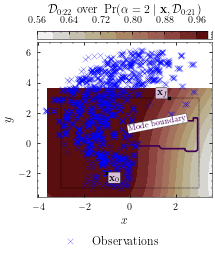

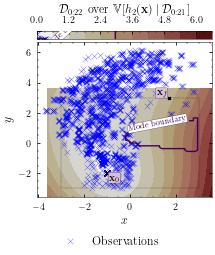

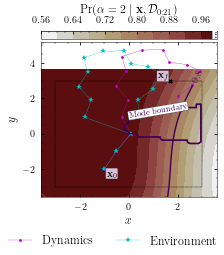

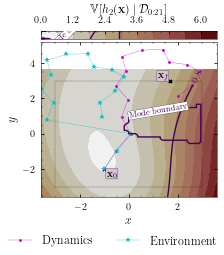

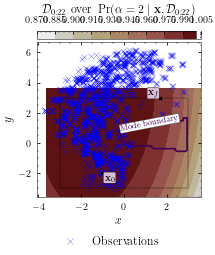

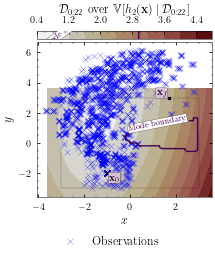

Optimisation result:
     fun: 645.8986463473717
     jac: array([-1.84494096e-04, -7.36399338e-05,  4.29932537e-05,  3.49982360e-04,
       -4.93079418e-04, -2.21074645e-04,  1.96625304e-04,  4.24920630e-04,
        5.33436108e-04,  4.98013495e-05,  2.02496774e-05,  7.32321355e-04,
       -6.68416429e-05,  2.29078503e-04, -1.24370351e-04,  9.55777318e-04,
       -4.92450112e-04,  6.46043820e-04,  1.67599462e-04,  1.00037980e-04,
       -7.06340237e-04, -5.95603233e-06, -1.17211850e-03, -1.15378563e-04,
        3.81924963e-05, -1.11712254e-04, -1.59778475e-04, -4.12815395e-05,
       -4.40833249e-05,  1.76126985e-05])
 message: 'Optimization terminated successfully'
    nfev: 31
     nit: 15
    njev: 15
  status: 0
 success: True
       x: array([ 1.14181481,  5.74433109,  3.00042719,  4.99340216, -0.73854189,
        5.65612573,  1.85462696,  4.73113336, -2.90292059,  4.89957817,
        2.23445197,  3.90180723,  0.77268707,  4.85260331,  3.46288268,
        1.48064142,  3.29825674, 

/Users/aidanscannell/Developer/python-projects/ModeOpt/modeopt/plotting/contour_plotter.py:248: UserWarning: No contour levels were found within the data range.
  CS = ax.tricontour(
/Users/aidanscannell/Developer/python-projects/ModeOpt/modeopt/plotting/contour_plotter.py:248: UserWarning: No contour levels were found within the data range.
  CS = ax.tricontour(
/Users/aidanscannell/Developer/python-projects/ModeOpt/modeopt/plotting/contour_plotter.py:248: UserWarning: No contour levels were found within the data range.
  CS = ax.tricontour(


Epoch 1/20000
2/3 [===================>..........] - ETA: 1s - loss: -1019.6066

2022-04-22 14:27:40.526371: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 14:27:40.526394: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


3/3 [==============================] - ETA: 0s - loss: -944.5516 

2022-04-22 14:27:42.401639: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 14:27:42.426522: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 14:27:42.442153: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_27_42

2022-04-22 14:27:42.450593: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_27_42/dr-robots-mbp.local.trace.json.gz
2022-04-22 14:27:42.489428: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_27_42

2022-04-22 14:27:42.489777: I tensorflow/core/profiler/rpc/client/s

3/3 [==============================] - 3s 2s/step - loss: -944.5516 - val_loss: -933.0238
INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_23_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 42ms/step - loss: -1037.0721 - val_loss: -783.9538
Epoch 3/20000
3/3 [==============================] - 0s 44ms/step - loss: -964.0812 - val_loss: -873.6211
Epoch 4/20000
3/3 [==============================] - 0s 43ms/step - loss: -1035.6787 - val_loss: -816.8311
Epoch 5/20000
3/3 [==============================] - 0s 49ms/step - loss: -1089.7144 - val_loss: -898.4617
Epoch 6/20000
3/3 [==============================] - 0s 44ms/step - loss: -497.0016 - val_loss: -801.4810
Epoch 7/20000
3/3 [==============================] - 0s 41ms/step - loss: -930.1352 - val_loss: -252.9132
Epoch 8/20000
3/3 [==============================] - 0s 47ms/step - loss: -868.7070 - val_loss: -904.2528
Epoch 9/20000
3/3 [==============================] - 0s 42ms/step - loss: -1030.4120 - val_loss: -762.1476
Epoch 10/20000
3/3 [==============================] - 0s 41ms/step - loss: -726.0980 - val_loss: -529.4044
Epoch 11/20000
3/3 [=====================

Epoch 76/20000
3/3 [==============================] - 0s 43ms/step - loss: -1055.1205 - val_loss: -903.5914
Epoch 77/20000
3/3 [==============================] - 0s 40ms/step - loss: -1031.8722 - val_loss: -876.3474
Epoch 78/20000
3/3 [==============================] - 0s 43ms/step - loss: -1071.9032 - val_loss: -870.9305
Epoch 79/20000
3/3 [==============================] - 0s 43ms/step - loss: -1069.9437 - val_loss: -912.5114
Epoch 80/20000
3/3 [==============================] - 0s 42ms/step - loss: -1077.6353 - val_loss: -917.9550
Epoch 81/20000
3/3 [==============================] - 0s 46ms/step - loss: -1073.1979 - val_loss: -914.4864
Epoch 82/20000
3/3 [==============================] - 0s 43ms/step - loss: -1095.4523 - val_loss: -878.8980
Epoch 83/20000
3/3 [==============================] - 0s 42ms/step - loss: -1058.1521 - val_loss: -925.2301
Epoch 84/20000
3/3 [==============================] - 0s 40ms/step - loss: -1085.6490 - val_loss: -885.1674
Epoch 85/20000
3/3 [========

3/3 [==============================] - 0s 40ms/step - loss: -906.3481 - val_loss: -510.9620
Epoch 153/20000
3/3 [==============================] - 0s 42ms/step - loss: -805.9926 - val_loss: -745.4427
Epoch 154/20000
3/3 [==============================] - 0s 42ms/step - loss: -708.3689 - val_loss: 844.4068
Epoch 155/20000
3/3 [==============================] - 0s 41ms/step - loss: -820.3348 - val_loss: 288.9770
Epoch 156/20000
3/3 [==============================] - 0s 42ms/step - loss: -846.7805 - val_loss: 622.4992
Epoch 157/20000
3/3 [==============================] - 0s 42ms/step - loss: -656.9511 - val_loss: -577.4958
Epoch 158/20000
3/3 [==============================] - 0s 41ms/step - loss: -697.6307 - val_loss: -709.7152
Epoch 159/20000
3/3 [==============================] - 0s 41ms/step - loss: -869.6378 - val_loss: -683.7872
Epoch 160/20000
3/3 [==============================] - 0s 43ms/step - loss: -387.6939 - val_loss: -790.1127
Epoch 161/20000
3/3 [==========================

3/3 [==============================] - 0s 54ms/step - loss: -602.8446 - val_loss: -620.3347
Epoch 229/20000
3/3 [==============================] - 0s 53ms/step - loss: -733.5912 - val_loss: -701.4362
Epoch 230/20000
3/3 [==============================] - 0s 54ms/step - loss: -835.4101 - val_loss: -579.4513
Epoch 231/20000
3/3 [==============================] - 0s 53ms/step - loss: -883.7004 - val_loss: -753.7262
Epoch 232/20000
3/3 [==============================] - 0s 49ms/step - loss: -296.2577 - val_loss: -655.2485
Epoch 233/20000
3/3 [==============================] - 0s 47ms/step - loss: -618.0993 - val_loss: -380.8078
Epoch 234/20000
3/3 [==============================] - 0s 49ms/step - loss: -697.5710 - val_loss: 42.0783
Epoch 235/20000
3/3 [==============================] - 0s 48ms/step - loss: -871.7303 - val_loss: -574.3084
Epoch 236/20000
3/3 [==============================] - 0s 53ms/step - loss: -859.3568 - val_loss: -632.4675
Epoch 237/20000
3/3 [=========================

3/3 [==============================] - 0s 47ms/step - loss: -819.5841 - val_loss: -591.9014
Epoch 305/20000
3/3 [==============================] - 0s 49ms/step - loss: -953.0173 - val_loss: -303.8216
Epoch 306/20000
3/3 [==============================] - 0s 48ms/step - loss: -894.2230 - val_loss: -386.5629
Epoch 307/20000
3/3 [==============================] - 0s 49ms/step - loss: -927.3306 - val_loss: -789.8712
Epoch 308/20000
3/3 [==============================] - 0s 47ms/step - loss: -828.8883 - val_loss: -759.9474
Epoch 309/20000
3/3 [==============================] - 0s 48ms/step - loss: -853.1775 - val_loss: -351.4807
Epoch 310/20000
3/3 [==============================] - 0s 51ms/step - loss: -942.8454 - val_loss: -659.0772
Epoch 311/20000
3/3 [==============================] - 0s 48ms/step - loss: -954.8971 - val_loss: -665.6223
Epoch 312/20000
3/3 [==============================] - 0s 48ms/step - loss: -912.5585 - val_loss: -360.7325
Epoch 313/20000
3/3 [=======================

3/3 [==============================] - 0s 49ms/step - loss: -963.4363 - val_loss: -858.1531
Epoch 381/20000
3/3 [==============================] - 0s 71ms/step - loss: -932.8675 - val_loss: -610.7502
Epoch 382/20000
3/3 [==============================] - 0s 58ms/step - loss: -972.3247 - val_loss: -831.8597
Epoch 383/20000
3/3 [==============================] - 0s 65ms/step - loss: -930.0198 - val_loss: -292.9070
Epoch 384/20000
3/3 [==============================] - 0s 57ms/step - loss: -1006.5542 - val_loss: -613.4087
Epoch 385/20000
3/3 [==============================] - 0s 56ms/step - loss: -927.8836 - val_loss: -802.9176
Epoch 386/20000
3/3 [==============================] - 0s 68ms/step - loss: -964.3681 - val_loss: -806.1659
Epoch 387/20000
3/3 [==============================] - 0s 54ms/step - loss: -975.0053 - val_loss: -138.9879
Epoch 388/20000
3/3 [==============================] - 0s 51ms/step - loss: -981.1459 - val_loss: -560.9536
Epoch 389/20000
3/3 [======================

Epoch 456/20000
3/3 [==============================] - 0s 58ms/step - loss: -957.2486 - val_loss: -487.9770
Epoch 457/20000
3/3 [==============================] - 0s 56ms/step - loss: -930.6551 - val_loss: -604.4524
Epoch 458/20000
3/3 [==============================] - 0s 68ms/step - loss: -910.3565 - val_loss: -293.0296
Epoch 459/20000
3/3 [==============================] - 0s 86ms/step - loss: -905.7137 - val_loss: -711.2534
Epoch 460/20000
3/3 [==============================] - 0s 61ms/step - loss: -918.5957 - val_loss: -291.2453
Epoch 461/20000
3/3 [==============================] - 0s 61ms/step - loss: -865.8801 - val_loss: -571.6459
Epoch 462/20000
3/3 [==============================] - 0s 54ms/step - loss: -887.6570 - val_loss: -524.6354
Epoch 463/20000
3/3 [==============================] - 0s 61ms/step - loss: -881.1002 - val_loss: -269.7985
Epoch 464/20000
3/3 [==============================] - 0s 56ms/step - loss: -898.6064 - val_loss: -420.6026
Epoch 465/20000
3/3 [=======

Epoch 532/20000
3/3 [==============================] - 0s 60ms/step - loss: -906.1110 - val_loss: -614.6013
Epoch 533/20000
3/3 [==============================] - 0s 50ms/step - loss: -897.4762 - val_loss: -393.1635
Epoch 534/20000
3/3 [==============================] - 0s 50ms/step - loss: -894.3809 - val_loss: -526.2021
Epoch 535/20000
3/3 [==============================] - 0s 48ms/step - loss: -923.6274 - val_loss: -7.2391
Epoch 536/20000
3/3 [==============================] - 0s 53ms/step - loss: -907.5145 - val_loss: -913.4086
Epoch 537/20000
3/3 [==============================] - 0s 47ms/step - loss: -885.4929 - val_loss: -871.4499
Epoch 538/20000
3/3 [==============================] - 0s 51ms/step - loss: -873.6618 - val_loss: -844.0132
Epoch 539/20000
3/3 [==============================] - 0s 49ms/step - loss: -867.8086 - val_loss: -504.8556
Epoch 540/20000
3/3 [==============================] - 0s 50ms/step - loss: -811.6668 - val_loss: -182.4259
Epoch 541/20000
3/3 [=========

Epoch 608/20000
3/3 [==============================] - 0s 71ms/step - loss: -916.1691 - val_loss: -786.0775
Epoch 609/20000
3/3 [==============================] - 0s 78ms/step - loss: -867.2719 - val_loss: -419.1152
Epoch 610/20000
3/3 [==============================] - 0s 67ms/step - loss: -794.9944 - val_loss: -658.7578
Epoch 611/20000
3/3 [==============================] - 0s 66ms/step - loss: -857.8227 - val_loss: -406.8918
Epoch 612/20000
3/3 [==============================] - 0s 79ms/step - loss: -783.9966 - val_loss: 136.6590
Epoch 613/20000
3/3 [==============================] - 0s 65ms/step - loss: -744.8224 - val_loss: -431.0210
Epoch 614/20000
3/3 [==============================] - 0s 60ms/step - loss: -884.0578 - val_loss: -669.6603
Epoch 615/20000
3/3 [==============================] - 0s 62ms/step - loss: -907.4011 - val_loss: -896.6493
Epoch 616/20000
3/3 [==============================] - 0s 63ms/step - loss: -953.0888 - val_loss: -824.4853
Epoch 617/20000
3/3 [========

Epoch 684/20000
3/3 [==============================] - 0s 60ms/step - loss: -797.5108 - val_loss: -972.3549
Epoch 685/20000
3/3 [==============================] - 0s 58ms/step - loss: -971.9504 - val_loss: -223.7323
Epoch 686/20000
3/3 [==============================] - 0s 72ms/step - loss: -566.0867 - val_loss: -775.2618
Epoch 687/20000
3/3 [==============================] - 0s 71ms/step - loss: -991.9097 - val_loss: -401.7571
Epoch 688/20000
3/3 [==============================] - 0s 59ms/step - loss: -937.7019 - val_loss: -545.9994
Epoch 689/20000
3/3 [==============================] - 0s 56ms/step - loss: -517.1572 - val_loss: -769.4737
Epoch 690/20000
3/3 [==============================] - 0s 62ms/step - loss: -686.5572 - val_loss: 829.6223
Epoch 691/20000
3/3 [==============================] - 0s 62ms/step - loss: -233.7807 - val_loss: -808.5741
Epoch 692/20000
3/3 [==============================] - 0s 72ms/step - loss: -421.6658 - val_loss: -824.0426
Epoch 693/20000
3/3 [========

Epoch 760/20000
3/3 [==============================] - 0s 82ms/step - loss: -902.9337 - val_loss: -595.6600
Epoch 761/20000
3/3 [==============================] - 0s 82ms/step - loss: -858.7936 - val_loss: -770.9213
Epoch 762/20000
3/3 [==============================] - 0s 84ms/step - loss: -981.5191 - val_loss: -916.6287
Epoch 763/20000
3/3 [==============================] - 0s 84ms/step - loss: -1017.5798 - val_loss: -419.6928
Epoch 764/20000
3/3 [==============================] - 0s 88ms/step - loss: -917.4322 - val_loss: -723.2695
Epoch 765/20000
3/3 [==============================] - 0s 86ms/step - loss: -993.3512 - val_loss: -471.8122
Epoch 766/20000
3/3 [==============================] - 0s 77ms/step - loss: -984.4869 - val_loss: -709.4625
Epoch 767/20000
3/3 [==============================] - 0s 82ms/step - loss: -886.6470 - val_loss: -14.3371
Epoch 768/20000
3/3 [==============================] - 0s 94ms/step - loss: -902.9637 - val_loss: -635.1901
Epoch 769/20000
3/3 [=======

3/3 [==============================] - 0s 70ms/step - loss: -907.8129 - val_loss: -612.2333
Epoch 836/20000
3/3 [==============================] - 0s 83ms/step - loss: -922.9078 - val_loss: -669.3553
Epoch 837/20000
3/3 [==============================] - 0s 69ms/step - loss: -1017.4768 - val_loss: -868.0439
Epoch 838/20000
3/3 [==============================] - 0s 75ms/step - loss: -777.5687 - val_loss: -950.0946
Epoch 839/20000
3/3 [==============================] - 0s 74ms/step - loss: -994.8171 - val_loss: -713.4540
Epoch 840/20000
3/3 [==============================] - 0s 66ms/step - loss: -842.7392 - val_loss: -531.1887
Epoch 841/20000
3/3 [==============================] - 0s 63ms/step - loss: -871.3231 - val_loss: -920.3215
Epoch 842/20000
3/3 [==============================] - 0s 63ms/step - loss: -957.6784 - val_loss: -865.5061
Epoch 843/20000
3/3 [==============================] - 0s 66ms/step - loss: -943.8889 - val_loss: -677.1115
Epoch 844/20000
3/3 [======================

3/3 [==============================] - 0s 76ms/step - loss: -1013.8023 - val_loss: -88.3944
Epoch 911/20000
3/3 [==============================] - 0s 75ms/step - loss: -913.9882 - val_loss: -839.7450
Epoch 912/20000
3/3 [==============================] - 0s 66ms/step - loss: -1033.7925 - val_loss: -418.6239
Epoch 913/20000
3/3 [==============================] - 0s 60ms/step - loss: -1002.5527 - val_loss: -596.9852
Epoch 914/20000
3/3 [==============================] - 0s 73ms/step - loss: -949.7665 - val_loss: -843.1228
Epoch 915/20000
3/3 [==============================] - 0s 68ms/step - loss: -831.8817 - val_loss: -586.7927
Epoch 916/20000
3/3 [==============================] - 0s 64ms/step - loss: -846.1731 - val_loss: -754.9707
Epoch 917/20000
3/3 [==============================] - 0s 64ms/step - loss: -782.9672 - val_loss: -684.8627
Epoch 918/20000
3/3 [==============================] - 0s 69ms/step - loss: -812.5834 - val_loss: -817.1675
Epoch 919/20000
3/3 [=====================

Epoch 986/20000
3/3 [==============================] - 0s 49ms/step - loss: -1016.4978 - val_loss: -941.3227
Epoch 987/20000
3/3 [==============================] - 0s 51ms/step - loss: -995.7359 - val_loss: -715.4167
Epoch 988/20000
3/3 [==============================] - 0s 54ms/step - loss: -892.4390 - val_loss: -822.1475
Epoch 989/20000
3/3 [==============================] - 0s 51ms/step - loss: -914.9999 - val_loss: -792.6240
Epoch 990/20000
3/3 [==============================] - 0s 50ms/step - loss: -1014.3458 - val_loss: -948.6884
Epoch 991/20000
3/3 [==============================] - 0s 49ms/step - loss: -1047.1234 - val_loss: -825.4027
Epoch 992/20000
3/3 [==============================] - 0s 50ms/step - loss: -999.4377 - val_loss: -593.9205
Epoch 993/20000
3/3 [==============================] - 0s 65ms/step - loss: -1052.9442 - val_loss: -572.1530
Epoch 994/20000
3/3 [==============================] - 0s 54ms/step - loss: -992.6328 - val_loss: -920.4877
Epoch 995/20000
3/3 [===

Epoch 1061/20000
3/3 [==============================] - 0s 46ms/step - loss: -984.2054 - val_loss: -800.0838
Epoch 1062/20000
3/3 [==============================] - 0s 57ms/step - loss: -984.1158 - val_loss: -742.5628
Epoch 1063/20000
3/3 [==============================] - 0s 52ms/step - loss: -894.1753 - val_loss: -839.4075
Epoch 1064/20000
3/3 [==============================] - 0s 53ms/step - loss: -914.4421 - val_loss: -397.5007
Epoch 1065/20000
3/3 [==============================] - 0s 55ms/step - loss: -968.2556 - val_loss: -515.5969
Epoch 1066/20000
3/3 [==============================] - 0s 56ms/step - loss: -871.3346 - val_loss: -162.8191
Epoch 1067/20000
3/3 [==============================] - 0s 65ms/step - loss: -962.5239 - val_loss: -807.1865
Epoch 1068/20000
3/3 [==============================] - 0s 47ms/step - loss: -759.9385 - val_loss: -352.5728
Epoch 1069/20000
3/3 [==============================] - 0s 45ms/step - loss: -818.1111 - val_loss: 743.3173
Epoch 1070/20000
3/3

3/3 [==============================] - 0s 42ms/step - loss: -988.6174 - val_loss: -673.0862
Epoch 1137/20000
3/3 [==============================] - 0s 44ms/step - loss: -979.6208 - val_loss: -884.2525
Epoch 1138/20000
3/3 [==============================] - 0s 45ms/step - loss: -974.4359 - val_loss: -765.0592
Epoch 1139/20000
3/3 [==============================] - 0s 46ms/step - loss: -994.5847 - val_loss: -794.0147
Epoch 1140/20000
3/3 [==============================] - 0s 49ms/step - loss: -971.5932 - val_loss: -901.1839
Epoch 1141/20000
3/3 [==============================] - 0s 42ms/step - loss: -1013.4209 - val_loss: -849.3367
Epoch 1142/20000
3/3 [==============================] - 0s 42ms/step - loss: -1024.7640 - val_loss: -824.5921
Epoch 1143/20000
3/3 [==============================] - 0s 72ms/step - loss: -1019.9516 - val_loss: -820.7950
Epoch 1144/20000
3/3 [==============================] - 0s 47ms/step - loss: -1006.1154 - val_loss: -774.1387
Epoch 1145/20000
3/3 [==========

Epoch 1211/20000
3/3 [==============================] - 0s 49ms/step - loss: -964.6924 - val_loss: -703.7531
Epoch 1212/20000
3/3 [==============================] - 0s 50ms/step - loss: -970.3356 - val_loss: -850.9678
Epoch 1213/20000
3/3 [==============================] - 0s 45ms/step - loss: -987.5882 - val_loss: -686.9342
Epoch 1214/20000
3/3 [==============================] - 0s 48ms/step - loss: -976.0096 - val_loss: -794.8406
Epoch 1215/20000
3/3 [==============================] - 0s 48ms/step - loss: -998.0567 - val_loss: -904.9312
Epoch 1216/20000
3/3 [==============================] - 0s 51ms/step - loss: -1011.1528 - val_loss: -939.4072
Epoch 1217/20000
3/3 [==============================] - 0s 57ms/step - loss: -1026.3319 - val_loss: -874.4113
Epoch 1218/20000
3/3 [==============================] - 0s 52ms/step - loss: -1046.2298 - val_loss: -852.7702
Epoch 1219/20000
3/3 [==============================] - 0s 49ms/step - loss: -1033.0915 - val_loss: -759.7541
Epoch 1220/2000

Epoch 1286/20000
3/3 [==============================] - 0s 57ms/step - loss: -758.7450 - val_loss: -858.1978
Epoch 1287/20000
3/3 [==============================] - 0s 67ms/step - loss: -924.4355 - val_loss: -893.6078
Epoch 1288/20000
3/3 [==============================] - 0s 58ms/step - loss: -923.0337 - val_loss: -830.3287
Epoch 1289/20000
3/3 [==============================] - 0s 61ms/step - loss: -979.0018 - val_loss: -565.0203
Epoch 1290/20000
3/3 [==============================] - 0s 56ms/step - loss: -1010.0026 - val_loss: -249.8600
Epoch 1291/20000
3/3 [==============================] - 0s 54ms/step - loss: -954.2239 - val_loss: -330.6171
Epoch 1292/20000
3/3 [==============================] - 0s 54ms/step - loss: -1004.4836 - val_loss: -897.4289
Epoch 1293/20000
3/3 [==============================] - 0s 57ms/step - loss: -1030.8006 - val_loss: -881.7031
Epoch 1294/20000
3/3 [==============================] - 0s 62ms/step - loss: -1029.3219 - val_loss: -664.2056
Epoch 1295/2000

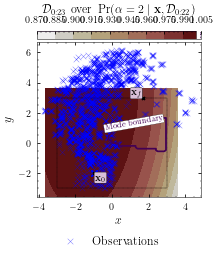

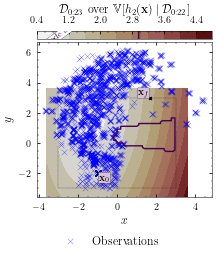

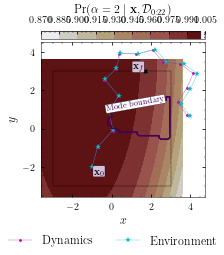

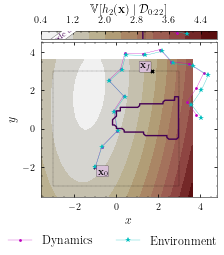

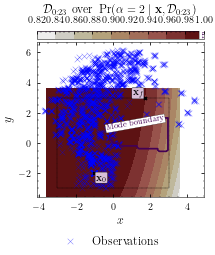

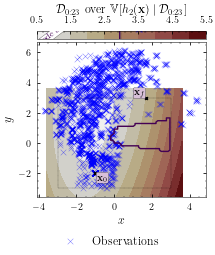

Optimisation result:
     fun: 577.1956831637685
     jac: array([-1.27933986e-04, -3.05220701e-05,  1.21358196e-04,  3.88211762e-04,
        1.19964325e-04,  2.53353997e-04, -4.70056871e-04,  3.96735035e-04,
       -4.50687504e-04, -2.39944322e-04,  2.46873386e-04,  8.34941987e-05,
       -1.03883468e-04,  4.02665027e-04, -3.83427940e-04, -5.47018733e-05,
       -3.51605167e-04,  9.94583773e-05,  2.50861200e-04,  1.32828318e-04,
        6.98241709e-05, -1.14242889e-05, -3.50392027e-05,  3.89541773e-04,
       -4.92300862e-04,  4.01702794e-04, -1.99599682e-04,  2.13292922e-04,
       -1.56641402e-04,  3.66497501e-04])
 message: 'Optimization terminated successfully'
    nfev: 25
     nit: 12
    njev: 12
  status: 0
 success: True
       x: array([ 0.87140445,  5.81930949,  2.98143316,  4.92868007, -0.68902525,
        5.68190898,  1.90728974,  4.63516326, -3.08825874,  5.03059169,
        2.22785546,  3.84211536,  0.91440355,  4.88135262,  3.32116337,
        1.35039966,  3.1512098 , 

/Users/aidanscannell/Developer/python-projects/ModeOpt/modeopt/plotting/contour_plotter.py:248: UserWarning: No contour levels were found within the data range.
  CS = ax.tricontour(
/Users/aidanscannell/Developer/python-projects/ModeOpt/modeopt/plotting/contour_plotter.py:248: UserWarning: No contour levels were found within the data range.
  CS = ax.tricontour(


Epoch 1/20000
2/3 [===================>..........] - ETA: 1s - loss: -1035.0253

2022-04-22 14:33:42.027253: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 14:33:42.027283: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


3/3 [==============================] - ETA: 0s - loss: -1046.3959

2022-04-22 14:33:44.300519: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 14:33:44.333615: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 14:33:44.350104: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_33_44

2022-04-22 14:33:44.362109: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_33_44/dr-robots-mbp.local.trace.json.gz
2022-04-22 14:33:44.405367: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_33_44

2022-04-22 14:33:44.405747: I tensorflow/core/profiler/rpc/client/s

3/3 [==============================] - 4s 2s/step - loss: -1046.3959 - val_loss: -920.5401
INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_24_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 42ms/step - loss: -993.7449 - val_loss: -720.7716
Epoch 3/20000
3/3 [==============================] - 0s 36ms/step - loss: -983.6143 - val_loss: -962.8848
Epoch 4/20000
3/3 [==============================] - 0s 41ms/step - loss: -1039.7418 - val_loss: -888.2122
Epoch 5/20000
3/3 [==============================] - 0s 37ms/step - loss: -1053.7211 - val_loss: -859.5042
Epoch 6/20000
3/3 [==============================] - 0s 41ms/step - loss: -1039.1571 - val_loss: -966.0404
Epoch 7/20000
3/3 [==============================] - 0s 40ms/step - loss: -1026.4258 - val_loss: -959.0477
Epoch 8/20000
3/3 [==============================] - 0s 41ms/step - loss: -1033.7653 - val_loss: -809.9491
Epoch 9/20000
3/3 [==============================] - 0s 38ms/step - loss: -1050.6987 - val_loss: -805.1613
Epoch 10/20000
3/3 [==============================] - 0s 40ms/step - loss: -1034.8034 - val_loss: -879.3157
Epoch 11/20000
3/3 [==================

Epoch 76/20000
3/3 [==============================] - 0s 43ms/step - loss: -1094.7648 - val_loss: -1032.9068
Epoch 77/20000
3/3 [==============================] - 0s 41ms/step - loss: -1066.8907 - val_loss: -933.4994
Epoch 78/20000
3/3 [==============================] - 0s 41ms/step - loss: -1101.1023 - val_loss: -899.6496
Epoch 79/20000
3/3 [==============================] - 0s 39ms/step - loss: -1100.5560 - val_loss: -996.0943
Epoch 80/20000
3/3 [==============================] - 0s 41ms/step - loss: -1093.2166 - val_loss: -954.7686
Epoch 81/20000
3/3 [==============================] - 0s 47ms/step - loss: -1085.7060 - val_loss: -1035.7310
Epoch 82/20000
3/3 [==============================] - 0s 41ms/step - loss: -1046.1807 - val_loss: -916.5547
Epoch 83/20000
3/3 [==============================] - 0s 41ms/step - loss: -1113.2385 - val_loss: -875.6872
Epoch 84/20000
3/3 [==============================] - 0s 49ms/step - loss: -1061.0159 - val_loss: -906.0278
Epoch 85/20000
3/3 [======

Epoch 152/20000
3/3 [==============================] - 0s 44ms/step - loss: -885.7704 - val_loss: -820.1798
Epoch 153/20000
3/3 [==============================] - 0s 47ms/step - loss: -955.8502 - val_loss: -776.5124
Epoch 154/20000
3/3 [==============================] - 0s 45ms/step - loss: -912.9512 - val_loss: -791.8324
Epoch 155/20000
3/3 [==============================] - 0s 45ms/step - loss: -932.4834 - val_loss: -803.3582
Epoch 156/20000
3/3 [==============================] - 0s 41ms/step - loss: -949.1844 - val_loss: -876.1829
Epoch 157/20000
3/3 [==============================] - 0s 41ms/step - loss: -970.9883 - val_loss: -813.4949
Epoch 158/20000
3/3 [==============================] - 0s 41ms/step - loss: -990.8117 - val_loss: -910.7680
Epoch 159/20000
3/3 [==============================] - 0s 42ms/step - loss: -981.6657 - val_loss: -881.0113
Epoch 160/20000
3/3 [==============================] - 0s 42ms/step - loss: -989.2967 - val_loss: -882.4437
Epoch 161/20000
3/3 [=======

3/3 [==============================] - 0s 51ms/step - loss: -1097.3916 - val_loss: -992.1864
Epoch 228/20000
3/3 [==============================] - 0s 49ms/step - loss: -1079.8814 - val_loss: -1030.1243
Epoch 229/20000
3/3 [==============================] - 0s 47ms/step - loss: -1071.1161 - val_loss: -938.3525
Epoch 230/20000
3/3 [==============================] - 0s 49ms/step - loss: -1058.7081 - val_loss: -854.1387
Epoch 231/20000
3/3 [==============================] - 0s 48ms/step - loss: -991.2590 - val_loss: -918.4686
Epoch 232/20000
3/3 [==============================] - 0s 50ms/step - loss: -957.1361 - val_loss: -1011.3327
Epoch 233/20000
3/3 [==============================] - 0s 48ms/step - loss: -1022.1554 - val_loss: -932.9951
Epoch 234/20000
3/3 [==============================] - 0s 44ms/step - loss: -948.4043 - val_loss: -993.6670
Epoch 235/20000
3/3 [==============================] - 0s 44ms/step - loss: -1064.0944 - val_loss: -936.5839
Epoch 236/20000
3/3 [===============

3/3 [==============================] - 0s 72ms/step - loss: -938.6169 - val_loss: -859.1350
Epoch 303/20000
3/3 [==============================] - 0s 65ms/step - loss: -968.6091 - val_loss: -846.4848
Epoch 304/20000
3/3 [==============================] - 0s 66ms/step - loss: -980.1998 - val_loss: -904.8896
Epoch 305/20000
3/3 [==============================] - 0s 64ms/step - loss: -1018.5445 - val_loss: -922.5539
Epoch 306/20000
3/3 [==============================] - 0s 66ms/step - loss: -1000.0359 - val_loss: -875.2442
Epoch 307/20000
3/3 [==============================] - 0s 67ms/step - loss: -1029.5640 - val_loss: -941.4756
Epoch 308/20000
3/3 [==============================] - 0s 68ms/step - loss: -1012.0013 - val_loss: -934.3821
Epoch 309/20000
3/3 [==============================] - 0s 61ms/step - loss: -1003.1886 - val_loss: -927.1551
Epoch 310/20000
3/3 [==============================] - 0s 62ms/step - loss: -999.5371 - val_loss: -912.3054
Epoch 311/20000
3/3 [==================

3/3 [==============================] - 0s 64ms/step - loss: -1007.7248 - val_loss: -933.3965
Epoch 378/20000
3/3 [==============================] - 0s 60ms/step - loss: -1004.5062 - val_loss: -952.9017
Epoch 379/20000
3/3 [==============================] - 0s 60ms/step - loss: -1006.2749 - val_loss: -869.2186
Epoch 380/20000
3/3 [==============================] - 0s 57ms/step - loss: -977.9626 - val_loss: -856.1199
Epoch 381/20000
3/3 [==============================] - 0s 61ms/step - loss: -1035.7182 - val_loss: -966.6996
Epoch 382/20000
3/3 [==============================] - 0s 59ms/step - loss: -1033.7633 - val_loss: -884.3290
Epoch 383/20000
3/3 [==============================] - 0s 57ms/step - loss: -943.1738 - val_loss: -775.5647
Epoch 384/20000
3/3 [==============================] - 0s 60ms/step - loss: -1085.9535 - val_loss: -979.8662
Epoch 385/20000
3/3 [==============================] - 0s 57ms/step - loss: -1050.7132 - val_loss: -977.8520
Epoch 386/20000
3/3 [================

3/3 [==============================] - 0s 50ms/step - loss: -1089.0760 - val_loss: -981.9806
Epoch 453/20000
3/3 [==============================] - 0s 50ms/step - loss: -1046.3914 - val_loss: -880.6923
Epoch 454/20000
3/3 [==============================] - 0s 49ms/step - loss: -1064.0599 - val_loss: -958.4325
Epoch 455/20000
3/3 [==============================] - 0s 49ms/step - loss: -1040.3560 - val_loss: -973.7369
Epoch 456/20000
3/3 [==============================] - 0s 50ms/step - loss: -1101.7490 - val_loss: -1012.9719
Epoch 457/20000
3/3 [==============================] - 0s 48ms/step - loss: -1025.6866 - val_loss: -928.2637
Epoch 458/20000
3/3 [==============================] - 0s 50ms/step - loss: -1108.8426 - val_loss: -1005.2245
Epoch 459/20000
3/3 [==============================] - 0s 50ms/step - loss: -1096.7393 - val_loss: -964.9292
Epoch 460/20000
3/3 [==============================] - 0s 49ms/step - loss: -1089.3725 - val_loss: -954.5858
Epoch 461/20000
3/3 [============

3/3 [==============================] - 0s 50ms/step - loss: -1097.6494 - val_loss: -978.9916
Epoch 528/20000
3/3 [==============================] - 0s 46ms/step - loss: -1079.0317 - val_loss: -900.8133
Epoch 529/20000
3/3 [==============================] - 0s 46ms/step - loss: -1106.3975 - val_loss: -958.9377
Epoch 530/20000
3/3 [==============================] - 0s 45ms/step - loss: -1108.6063 - val_loss: -892.1576
Epoch 531/20000
3/3 [==============================] - 0s 45ms/step - loss: -1076.0588 - val_loss: -990.7042
Epoch 532/20000
3/3 [==============================] - 0s 44ms/step - loss: -1092.2784 - val_loss: -944.2495
Epoch 533/20000
3/3 [==============================] - 0s 43ms/step - loss: -1103.1089 - val_loss: -940.2563
Epoch 534/20000
3/3 [==============================] - 0s 45ms/step - loss: -1077.1414 - val_loss: -952.9784
Epoch 535/20000
3/3 [==============================] - 0s 45ms/step - loss: -1114.5088 - val_loss: -940.1373
Epoch 536/20000
3/3 [==============

3/3 [==============================] - 0s 44ms/step - loss: -1035.6146 - val_loss: -963.3580
Epoch 603/20000
3/3 [==============================] - 0s 43ms/step - loss: -1053.4728 - val_loss: -953.5658
Epoch 604/20000
3/3 [==============================] - 0s 48ms/step - loss: -1074.1984 - val_loss: -973.5939
Epoch 605/20000
3/3 [==============================] - 0s 44ms/step - loss: -1080.5891 - val_loss: -965.4064
Epoch 606/20000
3/3 [==============================] - 0s 46ms/step - loss: -1063.5868 - val_loss: -944.2956
Epoch 607/20000
3/3 [==============================] - 0s 46ms/step - loss: -1066.8318 - val_loss: -985.5513
Epoch 608/20000
3/3 [==============================] - 0s 41ms/step - loss: -1078.0373 - val_loss: -965.6512
Epoch 609/20000
3/3 [==============================] - 0s 43ms/step - loss: -1076.8052 - val_loss: -961.1422
Epoch 610/20000
3/3 [==============================] - 0s 41ms/step - loss: -1110.9182 - val_loss: -968.4946
Epoch 611/20000
3/3 [==============

3/3 [==============================] - 0s 44ms/step - loss: -1089.1357 - val_loss: -900.1902
Epoch 678/20000
3/3 [==============================] - 0s 43ms/step - loss: -1053.9306 - val_loss: -977.0023
Epoch 679/20000
3/3 [==============================] - 0s 43ms/step - loss: -1119.1631 - val_loss: -981.2640
Epoch 680/20000
3/3 [==============================] - 0s 41ms/step - loss: -1112.6504 - val_loss: -947.8403
Epoch 681/20000
3/3 [==============================] - 0s 41ms/step - loss: -1038.5660 - val_loss: -988.5154
Epoch 682/20000
3/3 [==============================] - 0s 41ms/step - loss: -1107.8374 - val_loss: -970.2444
Epoch 683/20000
3/3 [==============================] - 0s 40ms/step - loss: -1080.6939 - val_loss: -993.2334
Epoch 684/20000
3/3 [==============================] - 0s 42ms/step - loss: -1088.8417 - val_loss: -972.8941
Epoch 685/20000
3/3 [==============================] - 0s 40ms/step - loss: -1123.5409 - val_loss: -999.9827
Epoch 686/20000
3/3 [==============

3/3 [==============================] - 0s 40ms/step - loss: -995.9844 - val_loss: -881.5240
Epoch 753/20000
3/3 [==============================] - 0s 41ms/step - loss: -1055.1162 - val_loss: -949.8185
Epoch 754/20000
3/3 [==============================] - 0s 42ms/step - loss: -1075.9090 - val_loss: -920.0425
Epoch 755/20000
3/3 [==============================] - 0s 41ms/step - loss: -1010.4829 - val_loss: -965.9054
Epoch 756/20000
3/3 [==============================] - 0s 42ms/step - loss: -1066.7844 - val_loss: -920.6185
Epoch 757/20000
3/3 [==============================] - 0s 41ms/step - loss: -1084.2839 - val_loss: -897.7341
Epoch 758/20000
3/3 [==============================] - 0s 44ms/step - loss: -1096.1480 - val_loss: -973.4407
Epoch 759/20000
3/3 [==============================] - 0s 42ms/step - loss: -1072.8667 - val_loss: -987.1435
Epoch 760/20000
3/3 [==============================] - 0s 42ms/step - loss: -995.8768 - val_loss: -884.3679
Epoch 761/20000
3/3 [================

3/3 [==============================] - 0s 42ms/step - loss: -1052.1959 - val_loss: -951.3726
Epoch 828/20000
3/3 [==============================] - 0s 44ms/step - loss: -1092.6887 - val_loss: -967.5980
Epoch 829/20000
3/3 [==============================] - 0s 41ms/step - loss: -1060.3281 - val_loss: -975.9608
Epoch 830/20000
3/3 [==============================] - 0s 43ms/step - loss: -1114.2156 - val_loss: -894.4615
Epoch 831/20000
3/3 [==============================] - 0s 42ms/step - loss: -1097.3069 - val_loss: -940.0043
Epoch 832/20000
3/3 [==============================] - 0s 41ms/step - loss: -1096.3459 - val_loss: -754.1264
Epoch 833/20000
3/3 [==============================] - 0s 41ms/step - loss: -1052.8424 - val_loss: -880.9603
Epoch 834/20000
3/3 [==============================] - 0s 39ms/step - loss: -1011.8659 - val_loss: -837.1029
Epoch 835/20000
3/3 [==============================] - 0s 44ms/step - loss: -1070.8935 - val_loss: -903.5531
Epoch 836/20000
3/3 [==============

3/3 [==============================] - 0s 42ms/step - loss: -1128.2770 - val_loss: -969.1097
Epoch 903/20000
3/3 [==============================] - 0s 43ms/step - loss: -1107.4208 - val_loss: -933.7305
Epoch 904/20000
3/3 [==============================] - 0s 42ms/step - loss: -1127.4443 - val_loss: -995.6771
Epoch 905/20000
3/3 [==============================] - 0s 44ms/step - loss: -1134.5803 - val_loss: -960.9757
Epoch 906/20000
3/3 [==============================] - 0s 42ms/step - loss: -1131.3659 - val_loss: -966.5461
Epoch 907/20000
3/3 [==============================] - 0s 42ms/step - loss: -1140.3630 - val_loss: -962.6200
Epoch 908/20000
3/3 [==============================] - 0s 43ms/step - loss: -1122.5836 - val_loss: -977.9468
Epoch 909/20000
3/3 [==============================] - 0s 40ms/step - loss: -1110.7243 - val_loss: -1010.1610
Epoch 910/20000
3/3 [==============================] - 0s 39ms/step - loss: -1127.7291 - val_loss: -954.6153
Epoch 911/20000
3/3 [=============

3/3 [==============================] - 0s 38ms/step - loss: -1111.5171 - val_loss: -870.1114
Epoch 978/20000
3/3 [==============================] - 0s 40ms/step - loss: -1032.5001 - val_loss: -922.9118
Epoch 979/20000
3/3 [==============================] - 0s 40ms/step - loss: -950.7224 - val_loss: -765.9446
Epoch 980/20000
3/3 [==============================] - 0s 38ms/step - loss: -1070.3163 - val_loss: -927.0439
Epoch 981/20000
3/3 [==============================] - 0s 39ms/step - loss: -1006.3133 - val_loss: -919.7163
Epoch 982/20000
3/3 [==============================] - 0s 38ms/step - loss: -1034.9973 - val_loss: -923.8092
Epoch 983/20000
3/3 [==============================] - 0s 40ms/step - loss: -1065.8909 - val_loss: -799.4205
Epoch 984/20000
3/3 [==============================] - 0s 39ms/step - loss: -997.6674 - val_loss: -943.5604
Epoch 985/20000
3/3 [==============================] - 0s 41ms/step - loss: -1089.3892 - val_loss: -969.8024
Epoch 986/20000
3/3 [================

3/3 [==============================] - 0s 45ms/step - loss: -1064.6076 - val_loss: -949.9019
Epoch 1053/20000
3/3 [==============================] - 0s 43ms/step - loss: -1066.5882 - val_loss: -946.0428
Epoch 1054/20000
3/3 [==============================] - 0s 42ms/step - loss: -1069.8352 - val_loss: -879.2775
Epoch 1055/20000
3/3 [==============================] - 0s 40ms/step - loss: -1083.0929 - val_loss: -985.0238
Epoch 1056/20000
3/3 [==============================] - 0s 40ms/step - loss: -1073.1483 - val_loss: -975.7710
Epoch 1057/20000
3/3 [==============================] - 0s 38ms/step - loss: -1106.4066 - val_loss: -956.8103
Epoch 1058/20000
3/3 [==============================] - 0s 38ms/step - loss: -1086.5959 - val_loss: -968.7897
Epoch 1059/20000
3/3 [==============================] - 0s 40ms/step - loss: -1123.1177 - val_loss: -957.1705
Epoch 1060/20000
3/3 [==============================] - 0s 40ms/step - loss: -1096.5432 - val_loss: -967.0565
Epoch 1061/20000
3/3 [=====

Epoch 1127/20000
3/3 [==============================] - 0s 42ms/step - loss: -968.0046 - val_loss: -904.0131
Epoch 1128/20000
3/3 [==============================] - 0s 42ms/step - loss: -1074.7726 - val_loss: -879.5413
Epoch 1129/20000
3/3 [==============================] - 0s 42ms/step - loss: -1052.7196 - val_loss: -916.5003
Epoch 1130/20000
3/3 [==============================] - 0s 42ms/step - loss: -941.0997 - val_loss: -934.9601
Epoch 1131/20000
3/3 [==============================] - 0s 41ms/step - loss: -1055.0113 - val_loss: -817.2389
Epoch 1132/20000
3/3 [==============================] - 0s 42ms/step - loss: -927.1395 - val_loss: -928.5285
Epoch 1133/20000
3/3 [==============================] - 0s 43ms/step - loss: -1079.8239 - val_loss: -923.1342
Epoch 1134/20000
3/3 [==============================] - 0s 42ms/step - loss: -1077.4371 - val_loss: -923.4579
Epoch 1135/20000
3/3 [==============================] - 0s 40ms/step - loss: -1059.1186 - val_loss: -914.7070
Epoch 1136/20

3/3 [==============================] - 0s 43ms/step - loss: -1037.4829 - val_loss: -906.5897
Epoch 1202/20000
3/3 [==============================] - 0s 43ms/step - loss: -1067.4446 - val_loss: -797.1422
Epoch 1203/20000
3/3 [==============================] - 0s 42ms/step - loss: -1030.0171 - val_loss: -789.9156
Epoch 1204/20000
3/3 [==============================] - 0s 43ms/step - loss: -859.7744 - val_loss: -881.7421
Epoch 1205/20000
3/3 [==============================] - 0s 41ms/step - loss: -1031.3149 - val_loss: -786.4116
Epoch 1206/20000
3/3 [==============================] - 0s 41ms/step - loss: -1010.0545 - val_loss: -781.0405
Epoch 1207/20000
3/3 [==============================] - 0s 42ms/step - loss: -1052.9160 - val_loss: -882.6819
Epoch 1208/20000
3/3 [==============================] - 0s 43ms/step - loss: -1007.7999 - val_loss: -889.8846
Epoch 1209/20000
3/3 [==============================] - 0s 42ms/step - loss: -1077.2146 - val_loss: -888.8012
Epoch 1210/20000
3/3 [======

3/3 [==============================] - 0s 44ms/step - loss: -1043.3452 - val_loss: -875.0400
Epoch 1277/20000
3/3 [==============================] - 0s 43ms/step - loss: -1041.8012 - val_loss: -873.2611
Epoch 1278/20000
3/3 [==============================] - 0s 44ms/step - loss: -1046.9110 - val_loss: -891.5290
Epoch 1279/20000
3/3 [==============================] - 0s 46ms/step - loss: -1059.2228 - val_loss: -892.0479
Epoch 1280/20000
3/3 [==============================] - 0s 39ms/step - loss: -1052.8786 - val_loss: -903.9244
Epoch 1281/20000
3/3 [==============================] - 0s 40ms/step - loss: -1066.6363 - val_loss: -898.0618
Epoch 1282/20000
3/3 [==============================] - 0s 41ms/step - loss: -1072.4600 - val_loss: -905.6905
Epoch 1283/20000
3/3 [==============================] - 0s 40ms/step - loss: -1073.8687 - val_loss: -878.3893
Epoch 1284/20000
3/3 [==============================] - 0s 43ms/step - loss: -1083.0212 - val_loss: -861.0373
Epoch 1285/20000
3/3 [=====

Epoch 1351/20000
3/3 [==============================] - 0s 42ms/step - loss: -1095.9869 - val_loss: -828.1262
Epoch 1352/20000
3/3 [==============================] - 0s 42ms/step - loss: -1089.2902 - val_loss: -915.6303
Epoch 1353/20000
3/3 [==============================] - 0s 40ms/step - loss: -1116.9733 - val_loss: -912.8912
Epoch 1354/20000
3/3 [==============================] - 0s 42ms/step - loss: -1082.7582 - val_loss: -934.1539
Epoch 1355/20000
3/3 [==============================] - 0s 41ms/step - loss: -1117.6604 - val_loss: -931.0494
Epoch 1356/20000
3/3 [==============================] - 0s 42ms/step - loss: -1117.5789 - val_loss: -949.6923
Epoch 1357/20000
3/3 [==============================] - 0s 41ms/step - loss: -1097.7568 - val_loss: -923.3942
Epoch 1358/20000
3/3 [==============================] - 0s 43ms/step - loss: -1100.6024 - val_loss: -931.4524
Epoch 1359/20000
3/3 [==============================] - 0s 42ms/step - loss: -1119.2403 - val_loss: -944.3350
Epoch 1360

Epoch 1426/20000
3/3 [==============================] - 0s 42ms/step - loss: -944.9515 - val_loss: -823.3332
Epoch 1427/20000
3/3 [==============================] - 0s 45ms/step - loss: -973.6171 - val_loss: -793.4881
Epoch 1428/20000
3/3 [==============================] - 0s 41ms/step - loss: -965.2756 - val_loss: -862.1364
Epoch 1429/20000
3/3 [==============================] - 0s 42ms/step - loss: -937.2533 - val_loss: -860.0340
Epoch 1430/20000
3/3 [==============================] - 0s 42ms/step - loss: -1006.8792 - val_loss: -841.6878
Epoch 1431/20000
3/3 [==============================] - 0s 44ms/step - loss: -1007.7696 - val_loss: -864.5555
Epoch 1432/20000
3/3 [==============================] - 0s 41ms/step - loss: -957.6131 - val_loss: -846.5908
Epoch 1433/20000
3/3 [==============================] - 0s 42ms/step - loss: -1006.7110 - val_loss: -886.1199
Epoch 1434/20000
3/3 [==============================] - 0s 44ms/step - loss: -976.8098 - val_loss: -898.6148
Epoch 1435/20000

3/3 [==============================] - 0s 43ms/step - loss: -1048.5358 - val_loss: -857.1597
Epoch 1501/20000
3/3 [==============================] - 0s 41ms/step - loss: -995.5010 - val_loss: -859.0489
Epoch 1502/20000
3/3 [==============================] - 0s 45ms/step - loss: -1038.5629 - val_loss: -496.9138
Epoch 1503/20000
3/3 [==============================] - 0s 42ms/step - loss: -929.5518 - val_loss: -811.2164
Epoch 1504/20000
3/3 [==============================] - 0s 43ms/step - loss: -1032.1568 - val_loss: -911.4938
Epoch 1505/20000
3/3 [==============================] - 0s 44ms/step - loss: -1112.1583 - val_loss: -834.9938
Epoch 1506/20000
3/3 [==============================] - 0s 43ms/step - loss: -934.7685 - val_loss: -716.8399
Epoch 1507/20000
3/3 [==============================] - 0s 44ms/step - loss: -1036.4524 - val_loss: -879.9697
Epoch 1508/20000
3/3 [==============================] - 0s 40ms/step - loss: -920.0031 - val_loss: -942.9772
Epoch 1509/20000
3/3 [=========

3/3 [==============================] - 0s 40ms/step - loss: -1105.8772 - val_loss: -994.6966
Epoch 1576/20000
3/3 [==============================] - 0s 47ms/step - loss: -1114.1233 - val_loss: -1008.5512
Epoch 1577/20000
3/3 [==============================] - 0s 41ms/step - loss: -1115.3414 - val_loss: -996.9571
Epoch 1578/20000
3/3 [==============================] - 0s 41ms/step - loss: -1081.0856 - val_loss: -989.1457
Epoch 1579/20000
3/3 [==============================] - 0s 40ms/step - loss: -1099.5413 - val_loss: -995.3253
Epoch 1580/20000
3/3 [==============================] - 0s 40ms/step - loss: -1098.4032 - val_loss: -975.9891
Epoch 1581/20000
3/3 [==============================] - 0s 41ms/step - loss: -1127.3430 - val_loss: -1012.4507
Epoch 1582/20000
3/3 [==============================] - 0s 41ms/step - loss: -1122.6790 - val_loss: -959.8685
Epoch 1583/20000
3/3 [==============================] - 0s 38ms/step - loss: -1120.9211 - val_loss: -1014.2253
Epoch 1584/20000
3/3 [==

3/3 [==============================] - 0s 47ms/step - loss: -818.6904 - val_loss: -839.2596
Epoch 1650/20000
3/3 [==============================] - 0s 45ms/step - loss: -953.6874 - val_loss: -923.6162
Epoch 1651/20000
3/3 [==============================] - 0s 43ms/step - loss: -826.6930 - val_loss: -712.6445
Epoch 1652/20000
3/3 [==============================] - 0s 46ms/step - loss: -823.2376 - val_loss: -914.6204
Epoch 1653/20000
3/3 [==============================] - 0s 44ms/step - loss: -971.8956 - val_loss: -914.9147
Epoch 1654/20000
3/3 [==============================] - 0s 44ms/step - loss: -942.4801 - val_loss: -913.6386
Epoch 1655/20000
3/3 [==============================] - 0s 45ms/step - loss: -1024.4992 - val_loss: -896.8551
Epoch 1656/20000
3/3 [==============================] - 0s 46ms/step - loss: -988.6903 - val_loss: -894.5930
Epoch 1657/20000
3/3 [==============================] - 0s 51ms/step - loss: -964.5039 - val_loss: -880.7718
Epoch 1658/20000
3/3 [=============

Epoch 1724/20000
3/3 [==============================] - 0s 51ms/step - loss: -1010.5627 - val_loss: -851.6884
Epoch 1725/20000
3/3 [==============================] - 0s 48ms/step - loss: -1019.3482 - val_loss: -933.4214
Epoch 1726/20000
3/3 [==============================] - 0s 48ms/step - loss: -917.0973 - val_loss: -888.5891
Epoch 1727/20000
3/3 [==============================] - 0s 50ms/step - loss: -931.3598 - val_loss: -844.7893
Epoch 1728/20000
3/3 [==============================] - 0s 48ms/step - loss: -911.6971 - val_loss: -890.1972
Epoch 1729/20000
3/3 [==============================] - 0s 45ms/step - loss: -999.8302 - val_loss: -908.4366
Epoch 1730/20000
3/3 [==============================] - 0s 44ms/step - loss: -1008.0561 - val_loss: -903.1637
Epoch 1731/20000
3/3 [==============================] - 0s 46ms/step - loss: -1035.7799 - val_loss: -943.3903
Epoch 1732/20000
3/3 [==============================] - 0s 49ms/step - loss: -1062.7772 - val_loss: -954.6007
Epoch 1733/200

3/3 [==============================] - 0s 45ms/step - loss: -1031.7158 - val_loss: -979.9722
Epoch 1799/20000
3/3 [==============================] - 0s 45ms/step - loss: -960.4368 - val_loss: -508.2107
Epoch 1800/20000
3/3 [==============================] - 0s 44ms/step - loss: -942.0170 - val_loss: -823.6143
Epoch 1801/20000
3/3 [==============================] - 0s 47ms/step - loss: -952.8886 - val_loss: -853.3023
Epoch 1802/20000
3/3 [==============================] - 0s 45ms/step - loss: -870.7055 - val_loss: -405.3977
Epoch 1803/20000
3/3 [==============================] - 0s 45ms/step - loss: -655.2363 - val_loss: -867.0017
Epoch 1804/20000
3/3 [==============================] - 0s 49ms/step - loss: -888.4213 - val_loss: -957.3719
Epoch 1805/20000
3/3 [==============================] - 0s 45ms/step - loss: -1052.7744 - val_loss: -919.1964
Epoch 1806/20000
3/3 [==============================] - 0s 45ms/step - loss: -956.1500 - val_loss: -843.1402
Epoch 1807/20000
3/3 [============

3/3 [==============================] - 0s 42ms/step - loss: -1072.1316 - val_loss: -801.7199
Epoch 1873/20000
3/3 [==============================] - 0s 44ms/step - loss: -1001.5985 - val_loss: -757.2789
Epoch 1874/20000
3/3 [==============================] - 0s 43ms/step - loss: -1072.4503 - val_loss: -908.9757
Epoch 1875/20000
3/3 [==============================] - 0s 45ms/step - loss: -1058.3789 - val_loss: -970.7297
Epoch 1876/20000
3/3 [==============================] - 0s 45ms/step - loss: -1038.3865 - val_loss: -917.5084
Epoch 1877/20000
3/3 [==============================] - 0s 47ms/step - loss: -1064.1950 - val_loss: -833.5122
Epoch 1878/20000
3/3 [==============================] - 0s 45ms/step - loss: -858.6397 - val_loss: -953.2693
Epoch 1879/20000
3/3 [==============================] - 0s 42ms/step - loss: -1042.8072 - val_loss: -484.7644
Epoch 1880/20000
3/3 [==============================] - 0s 45ms/step - loss: -973.6711 - val_loss: -322.7067
Epoch 1881/20000
3/3 [=======

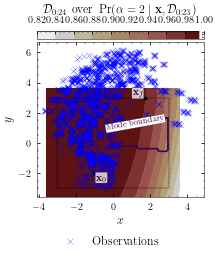

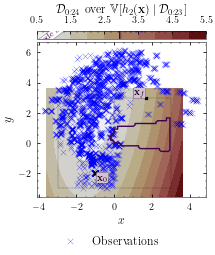

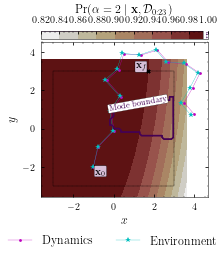

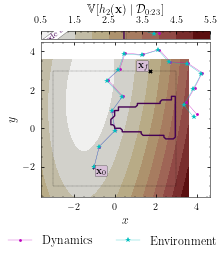

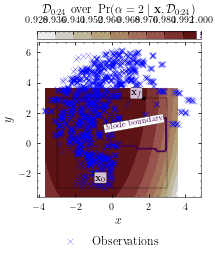

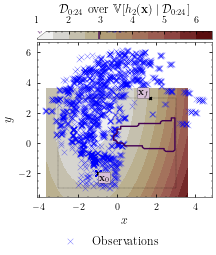

Optimisation result:
     fun: 602.8169633137193
     jac: array([ 3.53549176e-04, -1.82061159e-04, -5.82689324e-05,  6.28396052e-05,
        2.46033012e-05,  2.83914315e-04, -4.99106779e-05,  1.02794711e-04,
       -3.28176611e-05, -1.88022432e-04,  1.32574711e-04,  1.60960242e-04,
        1.84507636e-04,  9.86937294e-05, -7.28002708e-07,  1.41370724e-04,
       -1.17089013e-04,  2.12539876e-04,  2.18970044e-05,  5.33254173e-05,
       -5.68118821e-05, -2.66568946e-04,  1.51904047e-04, -1.06452350e-04,
        2.41587761e-05, -4.26067134e-06,  2.53373893e-04, -7.92519017e-05,
       -1.06411825e-04, -1.43486384e-05])
 message: 'Optimization terminated successfully'
    nfev: 28
     nit: 14
    njev: 14
  status: 0
 success: True
       x: array([ 1.06172236,  5.81975624,  2.95698861,  5.00394294, -0.7730181 ,
        5.68552765,  1.74329831,  4.72901604, -2.89444815,  4.88125458,
        2.1506527 ,  3.83642632,  0.70363407,  4.75619826,  3.26171706,
        1.38007366,  3.09230081, 

/Users/aidanscannell/Developer/python-projects/ModeOpt/modeopt/plotting/contour_plotter.py:248: UserWarning: No contour levels were found within the data range.
  CS = ax.tricontour(
/Users/aidanscannell/Developer/python-projects/ModeOpt/modeopt/plotting/contour_plotter.py:248: UserWarning: No contour levels were found within the data range.
  CS = ax.tricontour(
/Users/aidanscannell/Developer/python-projects/ModeOpt/modeopt/plotting/contour_plotter.py:248: UserWarning: No contour levels were found within the data range.
  CS = ax.tricontour(


Epoch 1/20000
2/3 [===================>..........] - ETA: 0s - loss: -1044.3572

2022-04-22 14:39:39.986999: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 14:39:39.987017: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


3/3 [==============================] - ETA: 0s - loss: -886.0142 

2022-04-22 14:39:41.605082: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 14:39:41.629013: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 14:39:41.642922: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_39_41

2022-04-22 14:39:41.651404: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_39_41/dr-robots-mbp.local.trace.json.gz
2022-04-22 14:39:41.677291: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_39_41

2022-04-22 14:39:41.677536: I tensorflow/core/profiler/rpc/client/s

3/3 [==============================] - 3s 2s/step - loss: -886.0142 - val_loss: -607.6682


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_25_epoch_0/assets
Epoch 2/20000
3/3 [==============================] - 0s 30ms/step - loss: -924.4745 - val_loss: -834.3476
Epoch 3/20000
3/3 [==============================] - 0s 30ms/step - loss: -943.3851 - val_loss: -610.2356
Epoch 4/20000
3/3 [==============================] - 0s 28ms/step - loss: -977.5567 - val_loss: -883.8012
Epoch 5/20000
3/3 [==============================] - 0s 32ms/step - loss: -963.1395 - val_loss: -899.4688
Epoch 6/20000
3/3 [==============================] - 0s 33ms/step - loss: -1007.6154 - val_loss: -759.7145
Epoch 7/20000
3/3 [==============================] - 0s 30ms/step - loss: -742.7870 - val_loss: -738.9712
Epoch 8/20000
3/3 [==============================] - 0s 34ms/step - loss: -910.9021 - val_loss: -895.1754
Epoch 9/20000
3/3 [==============================] - 0s 32ms/step - loss: -1034.7836 - val_loss: -850.8388
Epoch 10/20000
3/3 [=

Epoch 75/20000
3/3 [==============================] - 0s 36ms/step - loss: -3.7944 - val_loss: -57.8788
Epoch 76/20000
3/3 [==============================] - 0s 36ms/step - loss: -631.5145 - val_loss: -695.9076
Epoch 77/20000
3/3 [==============================] - 0s 34ms/step - loss: -852.5306 - val_loss: -753.0874
Epoch 78/20000
3/3 [==============================] - 0s 33ms/step - loss: -815.0254 - val_loss: -686.1023
Epoch 79/20000
3/3 [==============================] - 0s 35ms/step - loss: -780.8949 - val_loss: -667.1397
Epoch 80/20000
3/3 [==============================] - 0s 35ms/step - loss: -795.0787 - val_loss: -724.9582
Epoch 81/20000
3/3 [==============================] - 0s 35ms/step - loss: -540.9771 - val_loss: -700.7837
Epoch 82/20000
3/3 [==============================] - 0s 36ms/step - loss: -755.3931 - val_loss: -447.2810
Epoch 83/20000
3/3 [==============================] - 0s 35ms/step - loss: -327.7273 - val_loss: -638.9917
Epoch 84/20000
3/3 [====================

Epoch 151/20000
3/3 [==============================] - 0s 37ms/step - loss: -1053.7808 - val_loss: -948.0270
Epoch 152/20000
3/3 [==============================] - 0s 42ms/step - loss: -1035.8649 - val_loss: -936.0697
Epoch 153/20000
3/3 [==============================] - 0s 37ms/step - loss: -1029.8306 - val_loss: -983.1411
Epoch 154/20000
3/3 [==============================] - 0s 38ms/step - loss: -1066.9413 - val_loss: -969.9376
Epoch 155/20000
3/3 [==============================] - 0s 40ms/step - loss: -1072.6502 - val_loss: -983.1416
Epoch 156/20000
3/3 [==============================] - 0s 41ms/step - loss: -1093.7548 - val_loss: -944.8356
Epoch 157/20000
3/3 [==============================] - 0s 41ms/step - loss: -1074.3535 - val_loss: -966.9441
Epoch 158/20000
3/3 [==============================] - 0s 40ms/step - loss: -1104.9060 - val_loss: -877.5807
Epoch 159/20000
3/3 [==============================] - 0s 40ms/step - loss: -1110.5290 - val_loss: -927.7979
Epoch 160/20000
3/3

3/3 [==============================] - 0s 40ms/step - loss: -508.5717 - val_loss: 458.3557
Epoch 227/20000
3/3 [==============================] - 0s 39ms/step - loss: -400.8811 - val_loss: 555.7852
Epoch 228/20000
3/3 [==============================] - 0s 38ms/step - loss: -660.9584 - val_loss: 475.4792
Epoch 229/20000
3/3 [==============================] - 0s 38ms/step - loss: -420.6586 - val_loss: 581.5085
Epoch 230/20000
3/3 [==============================] - 0s 37ms/step - loss: -570.8182 - val_loss: 550.8081
Epoch 231/20000
3/3 [==============================] - 0s 51ms/step - loss: -474.0753 - val_loss: -191.6993
Epoch 232/20000
3/3 [==============================] - 0s 41ms/step - loss: -466.5659 - val_loss: 351.8398
Epoch 233/20000
3/3 [==============================] - 0s 37ms/step - loss: -446.1340 - val_loss: 150.1819
Epoch 234/20000
3/3 [==============================] - 0s 37ms/step - loss: -480.1316 - val_loss: -353.8830
Epoch 235/20000
3/3 [==============================

3/3 [==============================] - 0s 44ms/step - loss: -822.3569 - val_loss: -170.8503
Epoch 303/20000
3/3 [==============================] - 0s 45ms/step - loss: -802.1626 - val_loss: -589.6284
Epoch 304/20000
3/3 [==============================] - 0s 46ms/step - loss: -626.9503 - val_loss: -625.3559
Epoch 305/20000
3/3 [==============================] - 0s 44ms/step - loss: -858.4358 - val_loss: 123.1697
Epoch 306/20000
3/3 [==============================] - 0s 44ms/step - loss: -857.9309 - val_loss: -312.4614
Epoch 307/20000
3/3 [==============================] - 0s 50ms/step - loss: -826.3894 - val_loss: 135.0254
Epoch 308/20000
3/3 [==============================] - 0s 44ms/step - loss: -737.4906 - val_loss: -129.4288
Epoch 309/20000
3/3 [==============================] - 0s 44ms/step - loss: -899.8351 - val_loss: -103.5224
Epoch 310/20000
3/3 [==============================] - 0s 48ms/step - loss: -922.1548 - val_loss: -92.5725
Epoch 311/20000
3/3 [==========================

3/3 [==============================] - 0s 46ms/step - loss: -959.0443 - val_loss: -455.9245
Epoch 379/20000
3/3 [==============================] - 0s 49ms/step - loss: -821.9670 - val_loss: -770.1056
Epoch 380/20000
3/3 [==============================] - 0s 50ms/step - loss: -886.3562 - val_loss: -693.5103
Epoch 381/20000
3/3 [==============================] - 0s 51ms/step - loss: -932.8917 - val_loss: -699.4688
Epoch 382/20000
3/3 [==============================] - 0s 53ms/step - loss: -903.6682 - val_loss: -813.7294
Epoch 383/20000
3/3 [==============================] - 0s 50ms/step - loss: -947.8488 - val_loss: -785.4078
Epoch 384/20000
3/3 [==============================] - 0s 50ms/step - loss: -989.1070 - val_loss: -443.5714
Epoch 385/20000
3/3 [==============================] - 0s 48ms/step - loss: -967.8965 - val_loss: -388.7691
Epoch 386/20000
3/3 [==============================] - 0s 51ms/step - loss: -1000.3129 - val_loss: -202.4455
Epoch 387/20000
3/3 [======================

3/3 [==============================] - 0s 44ms/step - loss: -912.3318 - val_loss: -385.4938
Epoch 455/20000
3/3 [==============================] - 0s 44ms/step - loss: -919.5239 - val_loss: -419.7714
Epoch 456/20000
3/3 [==============================] - 0s 45ms/step - loss: -903.7616 - val_loss: -563.1066
Epoch 457/20000
3/3 [==============================] - 0s 45ms/step - loss: -941.7338 - val_loss: -374.0099
Epoch 458/20000
3/3 [==============================] - 0s 45ms/step - loss: -942.8785 - val_loss: -669.2806
Epoch 459/20000
3/3 [==============================] - 0s 46ms/step - loss: -934.1348 - val_loss: -615.0490
Epoch 460/20000
3/3 [==============================] - 0s 47ms/step - loss: -939.6814 - val_loss: -749.1965
Epoch 461/20000
3/3 [==============================] - 0s 47ms/step - loss: -958.9223 - val_loss: -767.0801
Epoch 462/20000
3/3 [==============================] - 0s 45ms/step - loss: -947.2553 - val_loss: -847.3335
Epoch 463/20000
3/3 [=======================

Epoch 530/20000
3/3 [==============================] - 0s 45ms/step - loss: -967.5455 - val_loss: -678.3538
Epoch 531/20000
3/3 [==============================] - 0s 45ms/step - loss: -935.3095 - val_loss: -789.4430
Epoch 532/20000
3/3 [==============================] - 0s 47ms/step - loss: -933.1046 - val_loss: -724.9565
Epoch 533/20000
3/3 [==============================] - 0s 46ms/step - loss: -999.7198 - val_loss: -476.1503
Epoch 534/20000
3/3 [==============================] - 0s 47ms/step - loss: -964.7685 - val_loss: -887.0518
Epoch 535/20000
3/3 [==============================] - 0s 46ms/step - loss: -985.8756 - val_loss: -610.3977
Epoch 536/20000
3/3 [==============================] - 0s 46ms/step - loss: -993.9572 - val_loss: -702.6800
Epoch 537/20000
3/3 [==============================] - 0s 46ms/step - loss: -1008.8905 - val_loss: -818.8797
Epoch 538/20000
3/3 [==============================] - 0s 48ms/step - loss: -1004.9249 - val_loss: -901.1396
Epoch 539/20000
3/3 [=====

3/3 [==============================] - 0s 45ms/step - loss: -985.7946 - val_loss: -757.9493
Epoch 606/20000
3/3 [==============================] - 0s 44ms/step - loss: -1010.9691 - val_loss: -945.6636
Epoch 607/20000
3/3 [==============================] - 0s 50ms/step - loss: -1000.3745 - val_loss: -600.4517
Epoch 608/20000
3/3 [==============================] - 0s 51ms/step - loss: -915.7083 - val_loss: -761.3517
Epoch 609/20000
3/3 [==============================] - 0s 51ms/step - loss: -980.4197 - val_loss: -948.6470
Epoch 610/20000
3/3 [==============================] - 0s 48ms/step - loss: -1005.2679 - val_loss: -981.3645
Epoch 611/20000
3/3 [==============================] - 0s 45ms/step - loss: -882.3676 - val_loss: -617.0286
Epoch 612/20000
3/3 [==============================] - 0s 48ms/step - loss: -1008.2928 - val_loss: -861.4130
Epoch 613/20000
3/3 [==============================] - 0s 42ms/step - loss: -967.5891 - val_loss: -963.5979
Epoch 614/20000
3/3 [===================

Epoch 681/20000
3/3 [==============================] - 0s 40ms/step - loss: -1034.3803 - val_loss: -962.5048
Epoch 682/20000
3/3 [==============================] - 0s 41ms/step - loss: -1078.5220 - val_loss: -575.1647
Epoch 683/20000
3/3 [==============================] - 0s 42ms/step - loss: -1059.3260 - val_loss: -896.6932
Epoch 684/20000
3/3 [==============================] - 0s 40ms/step - loss: -1082.6101 - val_loss: -976.3083
Epoch 685/20000
3/3 [==============================] - 0s 39ms/step - loss: -1069.6565 - val_loss: -995.4486
Epoch 686/20000
3/3 [==============================] - 0s 40ms/step - loss: -1065.5343 - val_loss: -760.5370
Epoch 687/20000
3/3 [==============================] - 0s 39ms/step - loss: -1062.9184 - val_loss: -949.2025
Epoch 688/20000
3/3 [==============================] - 0s 42ms/step - loss: -1049.2971 - val_loss: -836.9412
Epoch 689/20000
3/3 [==============================] - 0s 41ms/step - loss: -1063.5826 - val_loss: -1005.3279
Epoch 690/20000
3/

3/3 [==============================] - 0s 40ms/step - loss: -1043.9594 - val_loss: -966.3119
Epoch 757/20000
3/3 [==============================] - 0s 38ms/step - loss: -964.4004 - val_loss: -863.5635
Epoch 758/20000
3/3 [==============================] - 0s 38ms/step - loss: -981.0593 - val_loss: -858.2695
Epoch 759/20000
3/3 [==============================] - 0s 38ms/step - loss: -984.8597 - val_loss: -854.4753
Epoch 760/20000
3/3 [==============================] - 0s 39ms/step - loss: -991.0650 - val_loss: -905.1986
Epoch 761/20000
3/3 [==============================] - 0s 42ms/step - loss: -1032.2913 - val_loss: -975.3541
Epoch 762/20000
3/3 [==============================] - 0s 42ms/step - loss: -952.1194 - val_loss: -865.5250
Epoch 763/20000
3/3 [==============================] - 0s 40ms/step - loss: -1002.1154 - val_loss: -911.9989
Epoch 764/20000
3/3 [==============================] - 0s 40ms/step - loss: -1052.4053 - val_loss: -881.7949
Epoch 765/20000
3/3 [===================

3/3 [==============================] - 0s 38ms/step - loss: -1075.9072 - val_loss: -820.5881
Epoch 832/20000
3/3 [==============================] - 0s 37ms/step - loss: -1062.8735 - val_loss: -941.9740
Epoch 833/20000
3/3 [==============================] - 0s 38ms/step - loss: -1083.7190 - val_loss: -906.3588
Epoch 834/20000
3/3 [==============================] - 0s 38ms/step - loss: -1063.1528 - val_loss: -948.8531
Epoch 835/20000
3/3 [==============================] - 0s 38ms/step - loss: -1054.3506 - val_loss: -875.8644
Epoch 836/20000
3/3 [==============================] - 0s 38ms/step - loss: -1068.3218 - val_loss: -666.1193
Epoch 837/20000
3/3 [==============================] - 0s 35ms/step - loss: -1012.0916 - val_loss: -947.5962
Epoch 838/20000
3/3 [==============================] - 0s 36ms/step - loss: -1065.7181 - val_loss: -997.0681
Epoch 839/20000
3/3 [==============================] - 0s 35ms/step - loss: -1045.8561 - val_loss: -1000.3353
Epoch 840/20000
3/3 [=============

3/3 [==============================] - 0s 37ms/step - loss: -999.3543 - val_loss: -802.5704
Epoch 907/20000
3/3 [==============================] - 0s 39ms/step - loss: -1076.7302 - val_loss: -901.3028
Epoch 908/20000
3/3 [==============================] - 0s 39ms/step - loss: -1088.2823 - val_loss: -953.5854
Epoch 909/20000
3/3 [==============================] - 0s 39ms/step - loss: -1004.8714 - val_loss: -800.7187
Epoch 910/20000
3/3 [==============================] - 0s 41ms/step - loss: -947.2222 - val_loss: -1024.6318
Epoch 911/20000
3/3 [==============================] - 0s 43ms/step - loss: -983.0535 - val_loss: -1013.2801
Epoch 912/20000
3/3 [==============================] - 0s 39ms/step - loss: -1087.8635 - val_loss: -693.9346
Epoch 913/20000
3/3 [==============================] - 0s 40ms/step - loss: -1104.2599 - val_loss: -970.7667
Epoch 914/20000
3/3 [==============================] - 0s 39ms/step - loss: -1003.6096 - val_loss: -867.7253
Epoch 915/20000
3/3 [===============

3/3 [==============================] - 0s 40ms/step - loss: 327.4868 - val_loss: 1884.5481
Epoch 982/20000
3/3 [==============================] - 0s 42ms/step - loss: 352.7063 - val_loss: 209.1005
Epoch 983/20000
3/3 [==============================] - 0s 41ms/step - loss: -850.5322 - val_loss: 900.6381
Epoch 984/20000
3/3 [==============================] - 0s 40ms/step - loss: -819.7731 - val_loss: -265.6522
Epoch 985/20000
3/3 [==============================] - 0s 42ms/step - loss: -806.3524 - val_loss: -518.6078
Epoch 986/20000
3/3 [==============================] - 0s 43ms/step - loss: -692.4458 - val_loss: -404.7626
Epoch 987/20000
3/3 [==============================] - 0s 40ms/step - loss: -664.6497 - val_loss: -853.3372
Epoch 988/20000
3/3 [==============================] - 0s 44ms/step - loss: -1012.2716 - val_loss: -863.8964
Epoch 989/20000
3/3 [==============================] - 0s 40ms/step - loss: -364.8222 - val_loss: -217.2140
Epoch 990/20000
3/3 [==========================

3/3 [==============================] - 0s 37ms/step - loss: -1039.7212 - val_loss: -917.0850
Epoch 1057/20000
3/3 [==============================] - 0s 37ms/step - loss: -1062.7844 - val_loss: -922.9011
Epoch 1058/20000
3/3 [==============================] - 0s 37ms/step - loss: -1034.8862 - val_loss: -1007.7014
Epoch 1059/20000
3/3 [==============================] - 0s 40ms/step - loss: -1057.7225 - val_loss: -946.9263
Epoch 1060/20000
3/3 [==============================] - 0s 37ms/step - loss: -1067.4771 - val_loss: -966.6726
Epoch 1061/20000
3/3 [==============================] - 0s 38ms/step - loss: -1059.5834 - val_loss: -734.1903
Epoch 1062/20000
3/3 [==============================] - 0s 41ms/step - loss: -1026.4751 - val_loss: -869.1805
Epoch 1063/20000
3/3 [==============================] - 0s 40ms/step - loss: -1001.4012 - val_loss: -978.9089
Epoch 1064/20000
3/3 [==============================] - 0s 37ms/step - loss: -1055.0393 - val_loss: -902.1320
Epoch 1065/20000
3/3 [====

Epoch 1131/20000
3/3 [==============================] - 0s 43ms/step - loss: -1047.9655 - val_loss: -879.4446
Epoch 1132/20000
3/3 [==============================] - 0s 43ms/step - loss: -1039.1478 - val_loss: -993.1256
Epoch 1133/20000
3/3 [==============================] - 0s 40ms/step - loss: -1066.2499 - val_loss: -946.0877
Epoch 1134/20000
3/3 [==============================] - 0s 40ms/step - loss: -1083.6460 - val_loss: -1015.1834
Epoch 1135/20000
3/3 [==============================] - 0s 39ms/step - loss: -1062.3190 - val_loss: -975.5521
Epoch 1136/20000
3/3 [==============================] - 0s 41ms/step - loss: -1063.6443 - val_loss: -889.5819
Epoch 1137/20000
3/3 [==============================] - 0s 41ms/step - loss: -1095.9322 - val_loss: -914.1237
Epoch 1138/20000
3/3 [==============================] - 0s 38ms/step - loss: -1041.2695 - val_loss: -749.3050
Epoch 1139/20000
3/3 [==============================] - 0s 41ms/step - loss: -1050.7806 - val_loss: -1008.7542
Epoch 11

3/3 [==============================] - 0s 40ms/step - loss: -1093.9356 - val_loss: -970.5903
Epoch 1206/20000
3/3 [==============================] - 0s 39ms/step - loss: -1067.5682 - val_loss: -976.0076
Epoch 1207/20000
3/3 [==============================] - 0s 38ms/step - loss: -1029.3818 - val_loss: -862.7072
Epoch 1208/20000
3/3 [==============================] - 0s 39ms/step - loss: -1073.2788 - val_loss: -1000.0237
Epoch 1209/20000
3/3 [==============================] - 0s 40ms/step - loss: -1071.5218 - val_loss: -566.1527
Epoch 1210/20000
3/3 [==============================] - 0s 38ms/step - loss: -1007.1976 - val_loss: -974.1461
Epoch 1211/20000
3/3 [==============================] - 0s 37ms/step - loss: -1109.3326 - val_loss: -991.9490
Epoch 1212/20000
3/3 [==============================] - 0s 41ms/step - loss: -1106.3948 - val_loss: -1020.5169
Epoch 1213/20000
3/3 [==============================] - 0s 39ms/step - loss: -1073.7700 - val_loss: -949.7664
Epoch 1214/20000
3/3 [===

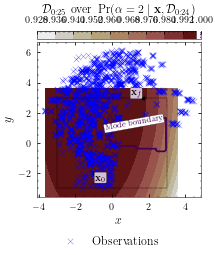

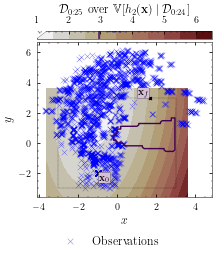

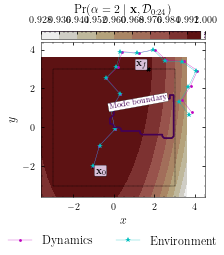

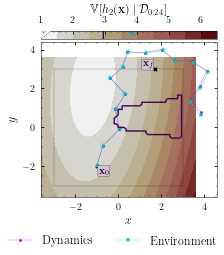

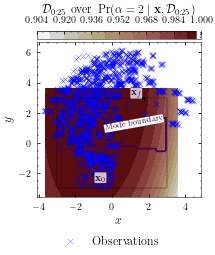

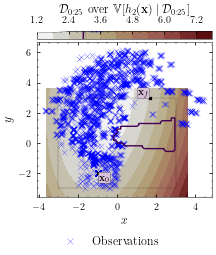

Optimisation result:
     fun: 507.3267442215615
     jac: array([-1.28592509e-04, -3.26766096e-05,  2.50686854e-04,  7.42838059e-04,
        1.01000398e-04,  2.32906762e-04,  4.97678320e-04,  2.01822124e-04,
       -4.68239742e-04, -9.10077592e-05,  2.77771961e-04, -4.51237615e-05,
        3.47864254e-04,  8.03043048e-04, -9.41196436e-05,  6.34429964e-05,
       -9.39967177e-05,  3.25539997e-04,  4.34681858e-04,  2.19485938e-04,
       -1.73890084e-05,  2.51070181e-04, -1.42906779e-04,  1.31034999e-05,
       -2.61377545e-04,  4.93579503e-04, -3.07806804e-05,  3.25544885e-04,
        2.30274143e-05,  2.93084031e-04])
 message: 'Optimization terminated successfully'
    nfev: 25
     nit: 12
    njev: 12
  status: 0
 success: True
       x: array([ 0.90196109,  5.77850654,  2.98471773,  4.94015553, -0.70128427,
        5.66985282,  1.92195251,  4.65181785, -3.10156192,  4.98162175,
        2.25335388,  3.8706027 ,  0.88713032,  4.91644003,  3.44924649,
        1.41641387,  3.29223162, 

/Users/aidanscannell/Developer/python-projects/ModeOpt/modeopt/plotting/contour_plotter.py:248: UserWarning: No contour levels were found within the data range.
  CS = ax.tricontour(
/Users/aidanscannell/Developer/python-projects/ModeOpt/modeopt/plotting/contour_plotter.py:248: UserWarning: No contour levels were found within the data range.
  CS = ax.tricontour(
/Users/aidanscannell/Developer/python-projects/ModeOpt/modeopt/plotting/contour_plotter.py:248: UserWarning: No contour levels were found within the data range.
  CS = ax.tricontour(


Epoch 1/20000
2/3 [===================>..........] - ETA: 0s - loss: -1076.7909

2022-04-22 14:43:34.003047: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 14:43:34.003065: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


3/3 [==============================] - ETA: 0s - loss: -1085.3923

2022-04-22 14:43:35.384751: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 14:43:35.402491: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 14:43:35.410747: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_43_35

2022-04-22 14:43:35.419158: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_43_35/dr-robots-mbp.local.trace.json.gz
2022-04-22 14:43:35.442549: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_43_35

2022-04-22 14:43:35.442776: I tensorflow/core/profiler/rpc/client/s

3/3 [==============================] - 2s 1s/step - loss: -1085.3923 - val_loss: -1006.4775
INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_26_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 28ms/step - loss: -1096.9486 - val_loss: -944.1607
Epoch 3/20000
3/3 [==============================] - 0s 32ms/step - loss: -1070.8763 - val_loss: -1044.1292
Epoch 4/20000
3/3 [==============================] - 0s 28ms/step - loss: -1098.1450 - val_loss: -860.9977
Epoch 5/20000
3/3 [==============================] - 0s 29ms/step - loss: -1082.8840 - val_loss: -926.0458
Epoch 6/20000
3/3 [==============================] - 0s 29ms/step - loss: -1047.2159 - val_loss: -814.1947
Epoch 7/20000
3/3 [==============================] - 0s 27ms/step - loss: -1078.7862 - val_loss: -1007.9535
Epoch 8/20000
3/3 [==============================] - 0s 26ms/step - loss: -1108.3602 - val_loss: -992.3520
Epoch 9/20000
3/3 [==============================] - 0s 27ms/step - loss: -963.5193 - val_loss: -991.2369
Epoch 10/20000
3/3 [==============================] - 0s 29ms/step - loss: -1031.0486 - val_loss: -830.7293
Epoch 11/20000
3/3 [===============

Epoch 76/20000
3/3 [==============================] - 0s 39ms/step - loss: -1098.2586 - val_loss: -1049.3497
Epoch 77/20000
3/3 [==============================] - 0s 37ms/step - loss: -1124.1311 - val_loss: -1057.1559
Epoch 78/20000
3/3 [==============================] - 0s 36ms/step - loss: -1114.6338 - val_loss: -994.6052
Epoch 79/20000
3/3 [==============================] - 0s 39ms/step - loss: -1120.2880 - val_loss: -1028.5672
Epoch 80/20000
3/3 [==============================] - 0s 40ms/step - loss: -1127.6014 - val_loss: -1056.8133
Epoch 81/20000
3/3 [==============================] - 0s 38ms/step - loss: -1133.3106 - val_loss: -1018.3505
Epoch 82/20000
3/3 [==============================] - 0s 41ms/step - loss: -1114.0529 - val_loss: -1041.3250
Epoch 83/20000
3/3 [==============================] - 0s 39ms/step - loss: -1124.3966 - val_loss: -1036.5986
Epoch 84/20000
3/3 [==============================] - 0s 41ms/step - loss: -1124.8233 - val_loss: -1030.5352
Epoch 85/20000
3/3 [

3/3 [==============================] - 0s 35ms/step - loss: -1116.6693 - val_loss: -989.4461
Epoch 152/20000
3/3 [==============================] - 0s 36ms/step - loss: -1039.0545 - val_loss: -1041.7926
Epoch 153/20000
3/3 [==============================] - 0s 50ms/step - loss: -1129.0011 - val_loss: -1023.9534
Epoch 154/20000
3/3 [==============================] - 0s 38ms/step - loss: -1104.3921 - val_loss: -974.8287
Epoch 155/20000
3/3 [==============================] - 0s 41ms/step - loss: -1099.9673 - val_loss: -1038.7568
Epoch 156/20000
3/3 [==============================] - 0s 41ms/step - loss: -997.7011 - val_loss: -966.4490
Epoch 157/20000
3/3 [==============================] - 0s 42ms/step - loss: -1049.6291 - val_loss: -947.6887
Epoch 158/20000
3/3 [==============================] - 0s 40ms/step - loss: -1080.4673 - val_loss: -838.4458
Epoch 159/20000
3/3 [==============================] - 0s 38ms/step - loss: -1043.4037 - val_loss: -866.6198
Epoch 160/20000
3/3 [============

3/3 [==============================] - 0s 40ms/step - loss: -983.8840 - val_loss: -1018.2144
Epoch 227/20000
3/3 [==============================] - 0s 40ms/step - loss: -980.1601 - val_loss: -964.9095
Epoch 228/20000
3/3 [==============================] - 0s 44ms/step - loss: -1066.3269 - val_loss: -998.9869
Epoch 229/20000
3/3 [==============================] - 0s 41ms/step - loss: -1049.9335 - val_loss: -1008.9349
Epoch 230/20000
3/3 [==============================] - 0s 41ms/step - loss: -945.2061 - val_loss: -1028.1054
Epoch 231/20000
3/3 [==============================] - 0s 41ms/step - loss: -1088.7599 - val_loss: -963.2513
Epoch 232/20000
3/3 [==============================] - 0s 41ms/step - loss: -1029.1432 - val_loss: -973.8302
Epoch 233/20000
3/3 [==============================] - 0s 41ms/step - loss: -1078.1361 - val_loss: -967.1778
Epoch 234/20000
3/3 [==============================] - 0s 40ms/step - loss: -1037.7015 - val_loss: -984.8995
Epoch 235/20000
3/3 [==============

3/3 [==============================] - 0s 43ms/step - loss: -1039.9179 - val_loss: -981.7909
Epoch 302/20000
3/3 [==============================] - 0s 41ms/step - loss: -1022.9873 - val_loss: -951.9231
Epoch 303/20000
3/3 [==============================] - 0s 41ms/step - loss: -1058.4093 - val_loss: -997.9180
Epoch 304/20000
3/3 [==============================] - 0s 43ms/step - loss: -1073.0974 - val_loss: -887.3071
Epoch 305/20000
3/3 [==============================] - 0s 41ms/step - loss: -1071.1533 - val_loss: -945.0630
Epoch 306/20000
3/3 [==============================] - 0s 46ms/step - loss: -1087.0671 - val_loss: -983.7503
Epoch 307/20000
3/3 [==============================] - 0s 40ms/step - loss: -1081.6425 - val_loss: -1006.4968
Epoch 308/20000
3/3 [==============================] - 0s 42ms/step - loss: -1075.3792 - val_loss: -1010.2224
Epoch 309/20000
3/3 [==============================] - 0s 43ms/step - loss: -1086.9944 - val_loss: -1001.1545
Epoch 310/20000
3/3 [===========

3/3 [==============================] - 0s 43ms/step - loss: -1048.8760 - val_loss: -767.6262
Epoch 377/20000
3/3 [==============================] - 0s 43ms/step - loss: -1038.2388 - val_loss: -961.3063
Epoch 378/20000
3/3 [==============================] - 0s 43ms/step - loss: -1048.5783 - val_loss: -1014.6435
Epoch 379/20000
3/3 [==============================] - 0s 43ms/step - loss: -1070.3081 - val_loss: -1026.8038
Epoch 380/20000
3/3 [==============================] - 0s 43ms/step - loss: -1055.5337 - val_loss: -1019.7611
Epoch 381/20000
3/3 [==============================] - 0s 61ms/step - loss: -988.2838 - val_loss: -908.1392
Epoch 382/20000
3/3 [==============================] - 0s 46ms/step - loss: -1005.6956 - val_loss: -1016.5279
Epoch 383/20000
3/3 [==============================] - 0s 47ms/step - loss: -1024.5629 - val_loss: -1002.2645
Epoch 384/20000
3/3 [==============================] - 0s 43ms/step - loss: -1032.0079 - val_loss: -1003.7480
Epoch 385/20000
3/3 [=========

3/3 [==============================] - 0s 62ms/step - loss: -1089.8593 - val_loss: -1021.9800
Epoch 452/20000
3/3 [==============================] - 0s 54ms/step - loss: -1061.9005 - val_loss: -1013.3675
Epoch 453/20000
3/3 [==============================] - 0s 50ms/step - loss: -1101.8592 - val_loss: -1014.0361
Epoch 454/20000
3/3 [==============================] - 0s 52ms/step - loss: -1096.5547 - val_loss: -1009.8977
Epoch 455/20000
3/3 [==============================] - 0s 51ms/step - loss: -1084.1178 - val_loss: -1011.6163
Epoch 456/20000
3/3 [==============================] - 0s 55ms/step - loss: -1104.1013 - val_loss: -1014.8359
Epoch 457/20000
3/3 [==============================] - 0s 49ms/step - loss: -1083.8513 - val_loss: -1048.1599
Epoch 458/20000
3/3 [==============================] - 0s 55ms/step - loss: -1103.8745 - val_loss: -1010.7185
Epoch 459/20000
3/3 [==============================] - 0s 52ms/step - loss: -1115.6668 - val_loss: -1058.6449
Epoch 460/20000
3/3 [=====

3/3 [==============================] - 0s 55ms/step - loss: -983.0967 - val_loss: -953.4081
Epoch 527/20000
3/3 [==============================] - 0s 75ms/step - loss: -1018.0578 - val_loss: -888.7117
Epoch 528/20000
3/3 [==============================] - 0s 77ms/step - loss: -1028.8471 - val_loss: -474.2766
Epoch 529/20000
3/3 [==============================] - 0s 60ms/step - loss: -979.9810 - val_loss: -427.3270
Epoch 530/20000
3/3 [==============================] - 0s 87ms/step - loss: -920.9617 - val_loss: -955.5136
Epoch 531/20000
3/3 [==============================] - 0s 83ms/step - loss: -1001.5093 - val_loss: -799.5323
Epoch 532/20000
3/3 [==============================] - 0s 81ms/step - loss: -948.3803 - val_loss: -915.3310
Epoch 533/20000
3/3 [==============================] - 0s 65ms/step - loss: -1008.1403 - val_loss: -946.9748
Epoch 534/20000
3/3 [==============================] - 0s 60ms/step - loss: -1028.1957 - val_loss: -976.6938
Epoch 535/20000
3/3 [==================

3/3 [==============================] - 0s 53ms/step - loss: -1017.0596 - val_loss: -693.1549
Epoch 602/20000
3/3 [==============================] - 0s 52ms/step - loss: -981.9593 - val_loss: -776.9917
Epoch 603/20000
3/3 [==============================] - 0s 54ms/step - loss: -477.9004 - val_loss: -692.9257
Epoch 604/20000
3/3 [==============================] - 0s 51ms/step - loss: -1018.9143 - val_loss: -598.6516
Epoch 605/20000
3/3 [==============================] - 0s 51ms/step - loss: -949.4682 - val_loss: -921.9220
Epoch 606/20000
3/3 [==============================] - 0s 72ms/step - loss: -992.2840 - val_loss: -961.9234
Epoch 607/20000
3/3 [==============================] - 0s 65ms/step - loss: -962.8965 - val_loss: -848.1589
Epoch 608/20000
3/3 [==============================] - 0s 57ms/step - loss: -1029.0308 - val_loss: -899.1184
Epoch 609/20000
3/3 [==============================] - 0s 53ms/step - loss: -1005.5900 - val_loss: -966.1938
Epoch 610/20000
3/3 [===================

3/3 [==============================] - 0s 58ms/step - loss: -1071.2348 - val_loss: -1032.2346
Epoch 677/20000
3/3 [==============================] - 0s 59ms/step - loss: -1070.3344 - val_loss: -1021.1795
Epoch 678/20000
3/3 [==============================] - 0s 49ms/step - loss: -1120.7507 - val_loss: -1043.6922
Epoch 679/20000
3/3 [==============================] - 0s 51ms/step - loss: -1080.7165 - val_loss: -1008.9046
Epoch 680/20000
3/3 [==============================] - 0s 51ms/step - loss: -1063.3244 - val_loss: -1054.1981
Epoch 681/20000
3/3 [==============================] - 0s 49ms/step - loss: -1082.2282 - val_loss: -1007.4924
Epoch 682/20000
3/3 [==============================] - 0s 62ms/step - loss: -1082.4185 - val_loss: -886.5633
Epoch 683/20000
3/3 [==============================] - 0s 55ms/step - loss: -1066.4012 - val_loss: -955.3584
Epoch 684/20000
3/3 [==============================] - 0s 52ms/step - loss: -1071.1685 - val_loss: -1039.1203
Epoch 685/20000
3/3 [=======

3/3 [==============================] - 0s 44ms/step - loss: -1131.4093 - val_loss: -1022.5595
Epoch 752/20000
3/3 [==============================] - 0s 48ms/step - loss: -1109.6025 - val_loss: -1009.7788
Epoch 753/20000
3/3 [==============================] - 0s 47ms/step - loss: -1091.0260 - val_loss: -1016.6154
Epoch 754/20000
3/3 [==============================] - 0s 45ms/step - loss: -1094.1378 - val_loss: -996.2046
Epoch 755/20000
3/3 [==============================] - 0s 45ms/step - loss: -1118.7462 - val_loss: -1011.3708
Epoch 756/20000
3/3 [==============================] - 0s 46ms/step - loss: -1115.6569 - val_loss: -1018.3734
Epoch 757/20000
3/3 [==============================] - 0s 45ms/step - loss: -1119.9053 - val_loss: -1013.3065
Epoch 758/20000
3/3 [==============================] - 0s 46ms/step - loss: -1093.9051 - val_loss: -975.8069
Epoch 759/20000
3/3 [==============================] - 0s 49ms/step - loss: -1080.5801 - val_loss: -986.5915
Epoch 760/20000
3/3 [========

3/3 [==============================] - 0s 45ms/step - loss: -971.1783 - val_loss: -832.6977
Epoch 827/20000
3/3 [==============================] - 0s 44ms/step - loss: -885.7491 - val_loss: -971.7507
Epoch 828/20000
3/3 [==============================] - 0s 47ms/step - loss: -1002.6871 - val_loss: -857.4319
Epoch 829/20000
3/3 [==============================] - 0s 47ms/step - loss: -1061.9527 - val_loss: -234.8868
Epoch 830/20000
3/3 [==============================] - 0s 46ms/step - loss: -922.0715 - val_loss: -891.3050
Epoch 831/20000
3/3 [==============================] - 0s 53ms/step - loss: -928.2993 - val_loss: -921.9159
Epoch 832/20000
3/3 [==============================] - 0s 45ms/step - loss: -928.2557 - val_loss: -955.5250
Epoch 833/20000
3/3 [==============================] - 0s 47ms/step - loss: -1042.9481 - val_loss: -867.3950
Epoch 834/20000
3/3 [==============================] - 0s 47ms/step - loss: -999.5943 - val_loss: -952.6666
Epoch 835/20000
3/3 [====================

3/3 [==============================] - 0s 41ms/step - loss: -1027.8046 - val_loss: -969.4564
Epoch 902/20000
3/3 [==============================] - 0s 41ms/step - loss: -967.3300 - val_loss: -983.9128
Epoch 903/20000
3/3 [==============================] - 0s 40ms/step - loss: -1074.8187 - val_loss: -1002.7615
Epoch 904/20000
3/3 [==============================] - 0s 41ms/step - loss: -1054.9853 - val_loss: -929.5645
Epoch 905/20000
3/3 [==============================] - 0s 41ms/step - loss: -1056.1626 - val_loss: -934.5522
Epoch 906/20000
3/3 [==============================] - 0s 39ms/step - loss: -970.4654 - val_loss: -881.1868
Epoch 907/20000
3/3 [==============================] - 0s 41ms/step - loss: -1004.3460 - val_loss: -1006.2138
Epoch 908/20000
3/3 [==============================] - 0s 40ms/step - loss: -1047.2621 - val_loss: -982.0210
Epoch 909/20000
3/3 [==============================] - 0s 41ms/step - loss: -799.9760 - val_loss: -982.5913
Epoch 910/20000
3/3 [===============

3/3 [==============================] - 0s 38ms/step - loss: -776.0723 - val_loss: -693.2473
Epoch 977/20000
3/3 [==============================] - 0s 43ms/step - loss: -990.8628 - val_loss: -890.0123
Epoch 978/20000
3/3 [==============================] - 0s 38ms/step - loss: -1038.6240 - val_loss: -959.0967
Epoch 979/20000
3/3 [==============================] - 0s 40ms/step - loss: -529.9583 - val_loss: -996.5139
Epoch 980/20000
3/3 [==============================] - 0s 37ms/step - loss: -1033.5231 - val_loss: -814.7769
Epoch 981/20000
3/3 [==============================] - 0s 37ms/step - loss: -408.5545 - val_loss: -930.9992
Epoch 982/20000
3/3 [==============================] - 0s 38ms/step - loss: -766.8397 - val_loss: -696.1125
Epoch 983/20000
3/3 [==============================] - 0s 38ms/step - loss: -885.4745 - val_loss: -811.2311
Epoch 984/20000
3/3 [==============================] - 0s 39ms/step - loss: -724.6739 - val_loss: -895.5428
Epoch 985/20000
3/3 [=====================

3/3 [==============================] - 0s 40ms/step - loss: -887.1010 - val_loss: -884.0248
Epoch 1052/20000
3/3 [==============================] - 0s 40ms/step - loss: -883.1412 - val_loss: -837.5555
Epoch 1053/20000
3/3 [==============================] - 0s 40ms/step - loss: -880.9426 - val_loss: -892.0321
Epoch 1054/20000
3/3 [==============================] - 0s 41ms/step - loss: -974.4798 - val_loss: -883.4109
Epoch 1055/20000
3/3 [==============================] - 0s 40ms/step - loss: -942.2328 - val_loss: -795.4827
Epoch 1056/20000
3/3 [==============================] - 0s 40ms/step - loss: -928.0864 - val_loss: -896.7066
Epoch 1057/20000
3/3 [==============================] - 0s 39ms/step - loss: -990.9552 - val_loss: -916.7735
Epoch 1058/20000
3/3 [==============================] - 0s 40ms/step - loss: -975.0449 - val_loss: -826.1434
Epoch 1059/20000
3/3 [==============================] - 0s 43ms/step - loss: -1004.9264 - val_loss: -925.5357
Epoch 1060/20000
3/3 [=============

3/3 [==============================] - 0s 44ms/step - loss: -845.7031 - val_loss: 1109.3775
Epoch 1126/20000
3/3 [==============================] - 0s 43ms/step - loss: -148.0717 - val_loss: 46.9907
Epoch 1127/20000
3/3 [==============================] - 0s 44ms/step - loss: -395.1592 - val_loss: -365.0491
Epoch 1128/20000
3/3 [==============================] - 0s 43ms/step - loss: -707.7197 - val_loss: -672.6857
Epoch 1129/20000
3/3 [==============================] - 0s 46ms/step - loss: -261.3578 - val_loss: -786.5205
Epoch 1130/20000
3/3 [==============================] - 0s 43ms/step - loss: -728.1277 - val_loss: -913.8641
Epoch 1131/20000
3/3 [==============================] - 0s 47ms/step - loss: -945.4795 - val_loss: -743.9284
Epoch 1132/20000
3/3 [==============================] - 0s 59ms/step - loss: -562.3868 - val_loss: -866.2325
Epoch 1133/20000
3/3 [==============================] - 0s 47ms/step - loss: -915.8201 - val_loss: -828.3727
Epoch 1134/20000
3/3 [================

Epoch 1200/20000
3/3 [==============================] - 0s 42ms/step - loss: -978.8000 - val_loss: -992.5042
Epoch 1201/20000
3/3 [==============================] - 0s 43ms/step - loss: -896.4676 - val_loss: -878.5192
Epoch 1202/20000
3/3 [==============================] - 0s 42ms/step - loss: -1008.6343 - val_loss: -887.6918
Epoch 1203/20000
3/3 [==============================] - 0s 45ms/step - loss: -1027.5247 - val_loss: -979.7659
Epoch 1204/20000
3/3 [==============================] - 0s 43ms/step - loss: -1041.8267 - val_loss: -937.3568
Epoch 1205/20000
3/3 [==============================] - 0s 42ms/step - loss: -985.6722 - val_loss: -915.2210
Epoch 1206/20000
3/3 [==============================] - 0s 46ms/step - loss: -1010.1621 - val_loss: -682.1558
Epoch 1207/20000
3/3 [==============================] - 0s 42ms/step - loss: -1057.9244 - val_loss: -936.4321
Epoch 1208/20000
3/3 [==============================] - 0s 42ms/step - loss: -1066.6613 - val_loss: -1004.2751
Epoch 1209/2

3/3 [==============================] - 0s 47ms/step - loss: -1095.9670 - val_loss: -960.1559
Epoch 1275/20000
3/3 [==============================] - 0s 47ms/step - loss: -1074.0885 - val_loss: -1005.6741
Epoch 1276/20000
3/3 [==============================] - 0s 48ms/step - loss: -1118.5281 - val_loss: -1002.8456
Epoch 1277/20000
3/3 [==============================] - 0s 45ms/step - loss: -1087.5620 - val_loss: -997.0296
Epoch 1278/20000
3/3 [==============================] - 0s 43ms/step - loss: -1114.7818 - val_loss: -1000.6271
Epoch 1279/20000
3/3 [==============================] - 0s 43ms/step - loss: -1108.0940 - val_loss: -960.2671
Epoch 1280/20000
3/3 [==============================] - 0s 44ms/step - loss: -1105.3243 - val_loss: -1038.7483
Epoch 1281/20000
3/3 [==============================] - 0s 44ms/step - loss: -1123.9671 - val_loss: -985.6123
Epoch 1282/20000
3/3 [==============================] - 0s 43ms/step - loss: -1115.5148 - val_loss: -1006.3641
Epoch 1283/20000
3/3 [

3/3 [==============================] - 0s 44ms/step - loss: -1064.8199 - val_loss: -1011.0645
Epoch 1349/20000
3/3 [==============================] - 0s 45ms/step - loss: -1085.8136 - val_loss: -994.9854
Epoch 1350/20000
3/3 [==============================] - 0s 45ms/step - loss: -1079.9563 - val_loss: -995.0501
Epoch 1351/20000
3/3 [==============================] - 0s 45ms/step - loss: -1082.6488 - val_loss: -935.9652
Epoch 1352/20000
3/3 [==============================] - 0s 46ms/step - loss: -1046.5268 - val_loss: -1040.2407
Epoch 1353/20000
3/3 [==============================] - 0s 44ms/step - loss: -1007.6523 - val_loss: -921.6350
Epoch 1354/20000
3/3 [==============================] - 0s 44ms/step - loss: -1055.0027 - val_loss: -992.7565
Epoch 1355/20000
3/3 [==============================] - 0s 44ms/step - loss: -1068.2198 - val_loss: -930.1523
Epoch 1356/20000
3/3 [==============================] - 0s 43ms/step - loss: -1078.2872 - val_loss: -1033.5391
Epoch 1357/20000
3/3 [==

3/3 [==============================] - 0s 44ms/step - loss: -772.0288 - val_loss: 451.7532
Epoch 1424/20000
3/3 [==============================] - 0s 42ms/step - loss: -846.7095 - val_loss: -377.3582
Epoch 1425/20000
3/3 [==============================] - 0s 42ms/step - loss: -682.9778 - val_loss: -656.4587
Epoch 1426/20000
3/3 [==============================] - 0s 44ms/step - loss: -789.6651 - val_loss: 477.2406
Epoch 1427/20000
3/3 [==============================] - 0s 42ms/step - loss: -761.4610 - val_loss: -744.3288
Epoch 1428/20000
3/3 [==============================] - 0s 44ms/step - loss: -872.4472 - val_loss: -746.7772
Epoch 1429/20000
3/3 [==============================] - 0s 43ms/step - loss: -835.1989 - val_loss: 492.4639
Epoch 1430/20000
3/3 [==============================] - 0s 40ms/step - loss: -784.7981 - val_loss: 308.0279
Epoch 1431/20000
3/3 [==============================] - 0s 42ms/step - loss: -884.2428 - val_loss: -323.3121
Epoch 1432/20000
3/3 [==================

3/3 [==============================] - 0s 40ms/step - loss: -984.0935 - val_loss: -1004.7386
Epoch 1499/20000
3/3 [==============================] - 0s 40ms/step - loss: -1026.7717 - val_loss: -974.9955
Epoch 1500/20000
3/3 [==============================] - 0s 43ms/step - loss: -1025.7010 - val_loss: -931.1032
Epoch 1501/20000
3/3 [==============================] - 0s 42ms/step - loss: -993.1763 - val_loss: -828.5473
Epoch 1502/20000
3/3 [==============================] - 0s 41ms/step - loss: -985.9042 - val_loss: -801.9589
Epoch 1503/20000
3/3 [==============================] - 0s 43ms/step - loss: -991.4226 - val_loss: -971.9149
Epoch 1504/20000
3/3 [==============================] - 0s 37ms/step - loss: -907.1669 - val_loss: -968.1148
Epoch 1505/20000
3/3 [==============================] - 0s 39ms/step - loss: -965.8864 - val_loss: -934.7515
Epoch 1506/20000
3/3 [==============================] - 0s 41ms/step - loss: -1025.8958 - val_loss: 0.1815
Epoch 1507/20000
3/3 [=============

Epoch 1573/20000
3/3 [==============================] - 0s 37ms/step - loss: -522.3464 - val_loss: -836.3571
Epoch 1574/20000
3/3 [==============================] - 0s 37ms/step - loss: -352.6816 - val_loss: 85.2484
Epoch 1575/20000
3/3 [==============================] - 0s 39ms/step - loss: -588.5518 - val_loss: -704.1807
Epoch 1576/20000
3/3 [==============================] - 0s 39ms/step - loss: -948.4733 - val_loss: -919.7459
Epoch 1577/20000
3/3 [==============================] - 0s 37ms/step - loss: -878.8086 - val_loss: -887.7870
Epoch 1578/20000
3/3 [==============================] - 0s 37ms/step - loss: -978.2665 - val_loss: -642.2813
Epoch 1579/20000
3/3 [==============================] - 0s 37ms/step - loss: -721.9713 - val_loss: -815.6844
Epoch 1580/20000
3/3 [==============================] - 0s 39ms/step - loss: -969.5685 - val_loss: -793.8815
Epoch 1581/20000
3/3 [==============================] - 0s 40ms/step - loss: -810.7439 - val_loss: -802.8557
Epoch 1582/20000
3/3 

Epoch 1648/20000
3/3 [==============================] - 0s 40ms/step - loss: -1009.3585 - val_loss: -1045.4092
Epoch 1649/20000
3/3 [==============================] - 0s 40ms/step - loss: -1099.9181 - val_loss: -909.0657
Epoch 1650/20000
3/3 [==============================] - 0s 40ms/step - loss: -1082.4282 - val_loss: -1019.3148
Epoch 1651/20000
3/3 [==============================] - 0s 38ms/step - loss: -1069.3508 - val_loss: -1027.2486
Epoch 1652/20000
3/3 [==============================] - 0s 36ms/step - loss: -1071.8665 - val_loss: -962.6230
Epoch 1653/20000
3/3 [==============================] - 0s 38ms/step - loss: -1038.5931 - val_loss: -934.7125
Epoch 1654/20000
3/3 [==============================] - 0s 37ms/step - loss: -1069.5236 - val_loss: -987.2948
Epoch 1655/20000
3/3 [==============================] - 0s 36ms/step - loss: -1054.6019 - val_loss: -1006.8344
Epoch 1656/20000
3/3 [==============================] - 0s 36ms/step - loss: -1062.4872 - val_loss: -980.1005
Epoch 

3/3 [==============================] - 0s 38ms/step - loss: -993.1098 - val_loss: -1033.8474
Epoch 1723/20000
3/3 [==============================] - 0s 39ms/step - loss: -1034.4438 - val_loss: -1016.6163
Epoch 1724/20000
3/3 [==============================] - 0s 40ms/step - loss: -1069.0355 - val_loss: -955.7373
Epoch 1725/20000
3/3 [==============================] - 0s 38ms/step - loss: -1032.0671 - val_loss: -996.8510
Epoch 1726/20000
3/3 [==============================] - 0s 38ms/step - loss: -1038.6406 - val_loss: -1039.0781
Epoch 1727/20000
3/3 [==============================] - 0s 38ms/step - loss: -1095.8859 - val_loss: -1028.0376
Epoch 1728/20000
3/3 [==============================] - 0s 38ms/step - loss: -1075.6355 - val_loss: -1015.3147
Epoch 1729/20000
3/3 [==============================] - 0s 39ms/step - loss: -1094.0259 - val_loss: -1027.8628
Epoch 1730/20000
3/3 [==============================] - 0s 40ms/step - loss: -1106.8697 - val_loss: -993.6293
Epoch 1731/20000
3/3 [

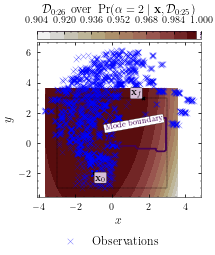

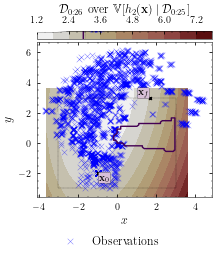

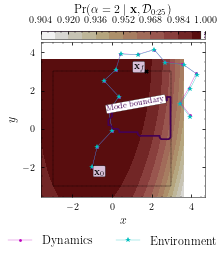

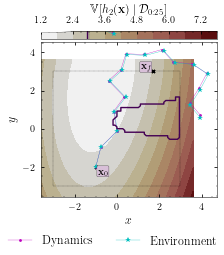

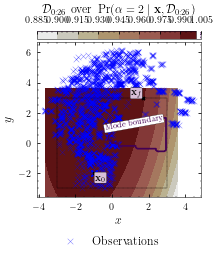

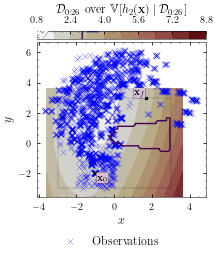

Optimisation result:
     fun: 516.220631271046
     jac: array([-3.53087804e-04,  1.85947384e-04,  1.27107200e-04,  2.09110554e-04,
       -6.10094522e-05,  6.82343733e-05,  2.49596369e-04, -2.62083053e-05,
        2.72005301e-04,  9.23901596e-05, -4.39416467e-06,  1.66359958e-04,
        6.32528840e-04, -1.53532379e-05,  9.53010079e-05, -9.06969833e-05,
        7.99986164e-05,  2.00872241e-05, -8.64605059e-05,  5.84416908e-05,
       -2.55165962e-05, -2.65704613e-04, -1.94827329e-04,  9.33200974e-05,
       -1.82201676e-04, -1.02046153e-06, -8.06228551e-05, -2.73034925e-04,
       -6.90768959e-05,  2.84660961e-04])
 message: 'Optimization terminated successfully'
    nfev: 22
     nit: 10
    njev: 10
  status: 0
 success: True
       x: array([ 0.88929928,  5.79266823,  2.96813246,  4.94913442, -0.71638813,
        5.68940072,  1.90413427,  4.66232157, -3.10630371,  4.99903223,
        2.24683042,  3.87088197,  0.88646795,  4.92278359,  3.42733199,
        1.41926821,  3.27724862,  

/Users/aidanscannell/Developer/python-projects/ModeOpt/modeopt/plotting/contour_plotter.py:248: UserWarning: No contour levels were found within the data range.
  CS = ax.tricontour(
/Users/aidanscannell/Developer/python-projects/ModeOpt/modeopt/plotting/contour_plotter.py:248: UserWarning: No contour levels were found within the data range.
  CS = ax.tricontour(


Epoch 1/20000
2/3 [===================>..........] - ETA: 0s - loss: -1080.1946

2022-04-22 14:49:07.135208: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 14:49:07.135226: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.
2022-04-22 14:49:08.514629: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 14:49:08.533319: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 14:49:08.547849: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_49_08

2022-04-22 14:49:08.699494: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_49_08/dr-robots-mbp.local.trace.json.gz


3/3 [==============================] - 2s 1s/step - loss: -1089.4975 - val_loss: -1005.2518


2022-04-22 14:49:08.724003: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_49_08

2022-04-22 14:49:08.724257: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_49_08/dr-robots-mbp.local.memory_profile.json.gz
2022-04-22 14:49:08.754504: I tensorflow/core/profiler/rpc/client/capture_profile.cc:251] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_49_08
Dumped tool data for xplane.pb to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_49_08/dr-robots-mbp.local.xplane.pb
Dumped tool data for overview_page.pb to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_27_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 30ms/step - loss: -1093.5842 - val_loss: -1035.6629
Epoch 3/20000
3/3 [==============================] - 0s 29ms/step - loss: -1103.5562 - val_loss: -1013.9816
Epoch 4/20000
3/3 [==============================] - 0s 30ms/step - loss: -1078.8013 - val_loss: -1012.5375
Epoch 5/20000
3/3 [==============================] - 0s 31ms/step - loss: -1061.2587 - val_loss: -1014.5263
Epoch 6/20000
3/3 [==============================] - 0s 29ms/step - loss: -1118.1151 - val_loss: -970.8405
Epoch 7/20000
3/3 [==============================] - 0s 30ms/step - loss: -985.8636 - val_loss: -985.4152
Epoch 8/20000
3/3 [==============================] - 0s 29ms/step - loss: -996.3177 - val_loss: -949.6282
Epoch 9/20000
3/3 [==============================] - 0s 29ms/step - loss: -1000.0895 - val_loss: -1030.3925
Epoch 10/20000
3/3 [==============================] - 0s 29ms/step - loss: -1036.3146 - val_loss: -1028.6460
Epoch 11/20000
3/3 [============

3/3 [==============================] - 0s 41ms/step - loss: -1107.6880 - val_loss: -1042.2138
Epoch 76/20000
3/3 [==============================] - 0s 39ms/step - loss: -1089.8867 - val_loss: -951.9300
Epoch 77/20000
3/3 [==============================] - 0s 42ms/step - loss: -1095.8080 - val_loss: -1004.0630
Epoch 78/20000
3/3 [==============================] - 0s 39ms/step - loss: -1067.2931 - val_loss: -1041.4270
Epoch 79/20000
3/3 [==============================] - 0s 41ms/step - loss: -1129.3763 - val_loss: -948.3603
Epoch 80/20000
3/3 [==============================] - 0s 40ms/step - loss: -1058.1810 - val_loss: -853.8063
Epoch 81/20000
3/3 [==============================] - 0s 41ms/step - loss: -1053.9160 - val_loss: -1093.9640
Epoch 82/20000
3/3 [==============================] - 0s 42ms/step - loss: -1120.8661 - val_loss: -963.1065
Epoch 83/20000
3/3 [==============================] - 0s 41ms/step - loss: -1029.2118 - val_loss: -976.7824
Epoch 84/20000
3/3 [===================

3/3 [==============================] - 0s 41ms/step - loss: -973.3315 - val_loss: -945.0455
Epoch 151/20000
3/3 [==============================] - 0s 43ms/step - loss: -968.3656 - val_loss: -952.1537
Epoch 152/20000
3/3 [==============================] - 0s 42ms/step - loss: -982.3329 - val_loss: -834.6954
Epoch 153/20000
3/3 [==============================] - 0s 41ms/step - loss: -989.9960 - val_loss: -910.2954
Epoch 154/20000
3/3 [==============================] - 0s 41ms/step - loss: -995.1726 - val_loss: -923.9645
Epoch 155/20000
3/3 [==============================] - 0s 42ms/step - loss: -978.3309 - val_loss: -968.0619
Epoch 156/20000
3/3 [==============================] - 0s 41ms/step - loss: -999.3172 - val_loss: -772.9109
Epoch 157/20000
3/3 [==============================] - 0s 41ms/step - loss: -992.4095 - val_loss: -966.6989
Epoch 158/20000
3/3 [==============================] - 0s 43ms/step - loss: -1008.1079 - val_loss: -901.0681
Epoch 159/20000
3/3 [======================

3/3 [==============================] - 0s 42ms/step - loss: -1042.5666 - val_loss: -1027.6146
Epoch 226/20000
3/3 [==============================] - 0s 43ms/step - loss: -1069.2146 - val_loss: -947.3029
Epoch 227/20000
3/3 [==============================] - 0s 43ms/step - loss: -1086.0070 - val_loss: -940.9952
Epoch 228/20000
3/3 [==============================] - 0s 41ms/step - loss: -1058.7831 - val_loss: -972.8399
Epoch 229/20000
3/3 [==============================] - 0s 43ms/step - loss: -1086.4119 - val_loss: -987.6639
Epoch 230/20000
3/3 [==============================] - 0s 42ms/step - loss: -1064.1936 - val_loss: -1042.0395
Epoch 231/20000
3/3 [==============================] - 0s 41ms/step - loss: -1086.3304 - val_loss: -1029.9362
Epoch 232/20000
3/3 [==============================] - 0s 43ms/step - loss: -1078.9471 - val_loss: -1023.6932
Epoch 233/20000
3/3 [==============================] - 0s 42ms/step - loss: -1092.7388 - val_loss: -1006.7075
Epoch 234/20000
3/3 [=========

3/3 [==============================] - 0s 49ms/step - loss: -1044.8828 - val_loss: -938.3031
Epoch 301/20000
3/3 [==============================] - 0s 48ms/step - loss: -1019.5507 - val_loss: -987.3900
Epoch 302/20000
3/3 [==============================] - 0s 52ms/step - loss: -1052.4231 - val_loss: -978.3555
Epoch 303/20000
3/3 [==============================] - 0s 51ms/step - loss: -1048.4274 - val_loss: -853.4231
Epoch 304/20000
3/3 [==============================] - 0s 49ms/step - loss: -1035.7759 - val_loss: -1014.3553
Epoch 305/20000
3/3 [==============================] - 0s 53ms/step - loss: -1060.4141 - val_loss: -964.6473
Epoch 306/20000
3/3 [==============================] - 0s 47ms/step - loss: -1070.2452 - val_loss: -1033.8146
Epoch 307/20000
3/3 [==============================] - 0s 50ms/step - loss: -1070.6202 - val_loss: -1020.7230
Epoch 308/20000
3/3 [==============================] - 0s 51ms/step - loss: -1067.1813 - val_loss: -938.1936
Epoch 309/20000
3/3 [===========

3/3 [==============================] - 0s 45ms/step - loss: -1026.9615 - val_loss: -1005.8937
Epoch 376/20000
3/3 [==============================] - 0s 48ms/step - loss: -1071.4328 - val_loss: -1051.4293
Epoch 377/20000
3/3 [==============================] - 0s 46ms/step - loss: -1087.0020 - val_loss: -822.8335
Epoch 378/20000
3/3 [==============================] - 0s 45ms/step - loss: -1059.6583 - val_loss: -1058.7393
Epoch 379/20000
3/3 [==============================] - 0s 47ms/step - loss: -1098.4809 - val_loss: -928.7896
Epoch 380/20000
3/3 [==============================] - 0s 45ms/step - loss: -1086.5272 - val_loss: -1074.8305
Epoch 381/20000
3/3 [==============================] - 0s 46ms/step - loss: -1064.4677 - val_loss: -986.2993
Epoch 382/20000
3/3 [==============================] - 0s 46ms/step - loss: -1094.8000 - val_loss: -989.4152
Epoch 383/20000
3/3 [==============================] - 0s 45ms/step - loss: -1069.6274 - val_loss: -1050.8300
Epoch 384/20000
3/3 [=========

3/3 [==============================] - 0s 44ms/step - loss: -863.3687 - val_loss: -282.1102
Epoch 451/20000
3/3 [==============================] - 0s 44ms/step - loss: -353.9989 - val_loss: -831.7975
Epoch 452/20000
3/3 [==============================] - 0s 43ms/step - loss: -909.6395 - val_loss: -861.1074
Epoch 453/20000
3/3 [==============================] - 0s 43ms/step - loss: -785.6137 - val_loss: -723.1240
Epoch 454/20000
3/3 [==============================] - 0s 43ms/step - loss: -769.0054 - val_loss: -972.6165
Epoch 455/20000
3/3 [==============================] - 0s 46ms/step - loss: -819.6107 - val_loss: -848.6036
Epoch 456/20000
3/3 [==============================] - 0s 44ms/step - loss: -941.1192 - val_loss: -927.2215
Epoch 457/20000
3/3 [==============================] - 0s 45ms/step - loss: -950.7421 - val_loss: -884.6347
Epoch 458/20000
3/3 [==============================] - 0s 45ms/step - loss: -876.0850 - val_loss: -918.6642
Epoch 459/20000
3/3 [=======================

3/3 [==============================] - 0s 46ms/step - loss: -1058.1575 - val_loss: -987.9430
Epoch 526/20000
3/3 [==============================] - 0s 48ms/step - loss: -1021.0589 - val_loss: -983.8522
Epoch 527/20000
3/3 [==============================] - 0s 48ms/step - loss: -1071.0294 - val_loss: -999.6472
Epoch 528/20000
3/3 [==============================] - 0s 48ms/step - loss: -1008.8096 - val_loss: -1054.8647
Epoch 529/20000
3/3 [==============================] - 0s 51ms/step - loss: -1078.2398 - val_loss: -968.9481
Epoch 530/20000
3/3 [==============================] - 0s 49ms/step - loss: -1029.4826 - val_loss: -1027.2956
Epoch 531/20000
3/3 [==============================] - 0s 51ms/step - loss: -1052.5477 - val_loss: -1053.7968
Epoch 532/20000
3/3 [==============================] - 0s 55ms/step - loss: -1079.8868 - val_loss: -998.2931
Epoch 533/20000
3/3 [==============================] - 0s 49ms/step - loss: -1068.8044 - val_loss: -1029.5019
Epoch 534/20000
3/3 [==========

3/3 [==============================] - 0s 44ms/step - loss: -1054.0472 - val_loss: -1003.0166
Epoch 601/20000
3/3 [==============================] - 0s 45ms/step - loss: -1062.3432 - val_loss: -977.0117
Epoch 602/20000
3/3 [==============================] - 0s 45ms/step - loss: -1083.6795 - val_loss: -969.8326
Epoch 603/20000
3/3 [==============================] - 0s 43ms/step - loss: -1041.3282 - val_loss: -1037.7685
Epoch 604/20000
3/3 [==============================] - 0s 43ms/step - loss: -1070.4968 - val_loss: -1002.5192
Epoch 605/20000
3/3 [==============================] - 0s 42ms/step - loss: -1056.8856 - val_loss: -906.6739
Epoch 606/20000
3/3 [==============================] - 0s 44ms/step - loss: -1037.5267 - val_loss: -1031.2978
Epoch 607/20000
3/3 [==============================] - 0s 43ms/step - loss: -1105.8175 - val_loss: -1044.1009
Epoch 608/20000
3/3 [==============================] - 0s 45ms/step - loss: -1105.2552 - val_loss: -1050.3209
Epoch 609/20000
3/3 [========

3/3 [==============================] - 0s 45ms/step - loss: -1062.8243 - val_loss: -1002.4948
Epoch 676/20000
3/3 [==============================] - 0s 46ms/step - loss: -1064.5483 - val_loss: -846.6719
Epoch 677/20000
3/3 [==============================] - 0s 44ms/step - loss: -979.5715 - val_loss: -1050.2765
Epoch 678/20000
3/3 [==============================] - 0s 44ms/step - loss: -1088.5529 - val_loss: -1024.4717
Epoch 679/20000
3/3 [==============================] - 0s 45ms/step - loss: -1087.6541 - val_loss: -894.9808
Epoch 680/20000
3/3 [==============================] - 0s 50ms/step - loss: -1033.0165 - val_loss: -1049.3080
Epoch 681/20000
3/3 [==============================] - 0s 51ms/step - loss: -1088.8155 - val_loss: -874.6680
Epoch 682/20000
3/3 [==============================] - 0s 55ms/step - loss: -1083.4065 - val_loss: -1019.1963
Epoch 683/20000
3/3 [==============================] - 0s 44ms/step - loss: -1030.4556 - val_loss: -1000.3053
Epoch 684/20000
3/3 [=========

3/3 [==============================] - 0s 111ms/step - loss: -1118.2548 - val_loss: -1079.7844
Epoch 751/20000
3/3 [==============================] - 0s 61ms/step - loss: -1118.2437 - val_loss: -1045.9856
Epoch 752/20000
3/3 [==============================] - 0s 55ms/step - loss: -1142.3238 - val_loss: -1074.9592
Epoch 753/20000
3/3 [==============================] - 0s 46ms/step - loss: -1089.3761 - val_loss: -971.8382
Epoch 754/20000
3/3 [==============================] - 0s 49ms/step - loss: -1109.0680 - val_loss: -1021.0478
Epoch 755/20000
3/3 [==============================] - 0s 45ms/step - loss: -1019.1259 - val_loss: -1063.0227
Epoch 756/20000
3/3 [==============================] - 0s 48ms/step - loss: -1104.0775 - val_loss: -1059.3616
Epoch 757/20000
3/3 [==============================] - 0s 53ms/step - loss: -1004.2657 - val_loss: -1057.8905
Epoch 758/20000
3/3 [==============================] - 0s 47ms/step - loss: -1093.1525 - val_loss: -894.6350
Epoch 759/20000
3/3 [======

3/3 [==============================] - 0s 45ms/step - loss: -1089.4370 - val_loss: -1018.4757
Epoch 826/20000
3/3 [==============================] - 0s 45ms/step - loss: -1103.5921 - val_loss: -982.8599
Epoch 827/20000
3/3 [==============================] - 0s 43ms/step - loss: -1109.3086 - val_loss: -1052.8270
Epoch 828/20000
3/3 [==============================] - 0s 45ms/step - loss: -1107.6100 - val_loss: -1046.1768
Epoch 829/20000
3/3 [==============================] - 0s 49ms/step - loss: -1102.3726 - val_loss: -1026.2354
Epoch 830/20000
3/3 [==============================] - 0s 48ms/step - loss: -1090.7847 - val_loss: -1049.5856
Epoch 831/20000
3/3 [==============================] - 0s 47ms/step - loss: -1093.3731 - val_loss: -1047.7229
Epoch 832/20000
3/3 [==============================] - 0s 48ms/step - loss: -1103.3154 - val_loss: -1025.7304
Epoch 833/20000
3/3 [==============================] - 0s 46ms/step - loss: -1116.3064 - val_loss: -1041.1724
Epoch 834/20000
3/3 [======

3/3 [==============================] - 0s 49ms/step - loss: -1062.7865 - val_loss: -1017.7759
Epoch 901/20000
3/3 [==============================] - 0s 49ms/step - loss: -1072.7893 - val_loss: -958.6867
Epoch 902/20000
3/3 [==============================] - 0s 48ms/step - loss: -1067.4245 - val_loss: -1002.0942
Epoch 903/20000
3/3 [==============================] - 0s 47ms/step - loss: -1085.0901 - val_loss: -1041.3273
Epoch 904/20000
3/3 [==============================] - 0s 49ms/step - loss: -1084.6996 - val_loss: -1051.7227
Epoch 905/20000
3/3 [==============================] - 0s 56ms/step - loss: -1072.1241 - val_loss: -1027.3627
Epoch 906/20000
3/3 [==============================] - 0s 78ms/step - loss: -1075.2042 - val_loss: -1025.1463
Epoch 907/20000
3/3 [==============================] - 0s 49ms/step - loss: -1084.1202 - val_loss: -1053.2526
Epoch 908/20000
3/3 [==============================] - 0s 48ms/step - loss: -1096.2938 - val_loss: -1029.6879
Epoch 909/20000
3/3 [======

3/3 [==============================] - 0s 55ms/step - loss: -1008.0700 - val_loss: -858.3272
Epoch 976/20000
3/3 [==============================] - 0s 63ms/step - loss: -927.8136 - val_loss: -923.1513
Epoch 977/20000
3/3 [==============================] - 0s 62ms/step - loss: -1067.4686 - val_loss: -942.8257
Epoch 978/20000
3/3 [==============================] - 0s 64ms/step - loss: -1049.2093 - val_loss: -778.3489
Epoch 979/20000
3/3 [==============================] - 0s 71ms/step - loss: -1013.3200 - val_loss: -1036.1577
Epoch 980/20000
3/3 [==============================] - 0s 56ms/step - loss: -1007.1244 - val_loss: -1011.0521
Epoch 981/20000
3/3 [==============================] - 0s 58ms/step - loss: -1000.1206 - val_loss: -1035.9244
Epoch 982/20000
3/3 [==============================] - 0s 69ms/step - loss: -996.4760 - val_loss: -1051.6521
Epoch 983/20000
3/3 [==============================] - 0s 67ms/step - loss: -1081.9571 - val_loss: -1019.7170
Epoch 984/20000
3/3 [===========

Epoch 1050/20000
3/3 [==============================] - 0s 50ms/step - loss: -787.3833 - val_loss: -956.4439
Epoch 1051/20000
3/3 [==============================] - 0s 52ms/step - loss: -748.0564 - val_loss: -898.7610
Epoch 1052/20000
3/3 [==============================] - 0s 48ms/step - loss: -886.4572 - val_loss: -831.2414
Epoch 1053/20000
3/3 [==============================] - 0s 50ms/step - loss: -786.9054 - val_loss: -950.9267
Epoch 1054/20000
3/3 [==============================] - 0s 51ms/step - loss: -561.2934 - val_loss: -606.5380
Epoch 1055/20000
3/3 [==============================] - 0s 49ms/step - loss: -870.8356 - val_loss: -893.8503
Epoch 1056/20000
3/3 [==============================] - 0s 49ms/step - loss: -926.3149 - val_loss: -916.8300
Epoch 1057/20000
3/3 [==============================] - 0s 48ms/step - loss: -922.3837 - val_loss: -878.7854
Epoch 1058/20000
3/3 [==============================] - 0s 51ms/step - loss: -907.5856 - val_loss: -927.3579
Epoch 1059/20000
3/

3/3 [==============================] - 0s 44ms/step - loss: -1093.6529 - val_loss: -1053.6111
Epoch 1125/20000
3/3 [==============================] - 0s 44ms/step - loss: -1079.0752 - val_loss: -948.2486
Epoch 1126/20000
3/3 [==============================] - 0s 43ms/step - loss: -1108.4536 - val_loss: -888.5157
Epoch 1127/20000
3/3 [==============================] - 0s 43ms/step - loss: -1026.5390 - val_loss: -975.8826
Epoch 1128/20000
3/3 [==============================] - 0s 44ms/step - loss: -1078.7995 - val_loss: -853.6752
Epoch 1129/20000
3/3 [==============================] - 0s 43ms/step - loss: -783.1865 - val_loss: -1037.6882
Epoch 1130/20000
3/3 [==============================] - 0s 45ms/step - loss: -1074.4012 - val_loss: -839.8582
Epoch 1131/20000
3/3 [==============================] - 0s 43ms/step - loss: -1069.4248 - val_loss: -801.9649
Epoch 1132/20000
3/3 [==============================] - 0s 44ms/step - loss: -1030.3352 - val_loss: -942.3950
Epoch 1133/20000
3/3 [====

3/3 [==============================] - 0s 44ms/step - loss: -1081.3369 - val_loss: -877.4007
Epoch 1199/20000
3/3 [==============================] - 0s 43ms/step - loss: -912.9452 - val_loss: -845.4318
Epoch 1200/20000
3/3 [==============================] - 0s 52ms/step - loss: -972.7359 - val_loss: -955.4746
Epoch 1201/20000
3/3 [==============================] - 0s 56ms/step - loss: -880.8892 - val_loss: -927.1851
Epoch 1202/20000
3/3 [==============================] - 0s 46ms/step - loss: -753.3000 - val_loss: -848.3411
Epoch 1203/20000
3/3 [==============================] - 0s 44ms/step - loss: -995.2953 - val_loss: -900.1023
Epoch 1204/20000
3/3 [==============================] - 0s 43ms/step - loss: -984.5443 - val_loss: -972.8224
Epoch 1205/20000
3/3 [==============================] - 0s 46ms/step - loss: -1071.6336 - val_loss: -1001.1912
Epoch 1206/20000
3/3 [==============================] - 0s 44ms/step - loss: -1011.7987 - val_loss: -860.6138
Epoch 1207/20000
3/3 [==========

Epoch 1273/20000
3/3 [==============================] - 0s 43ms/step - loss: -1050.9339 - val_loss: -891.9609
Epoch 1274/20000
3/3 [==============================] - 0s 44ms/step - loss: -1041.1079 - val_loss: -875.2009
Epoch 1275/20000
3/3 [==============================] - 0s 41ms/step - loss: -1031.3638 - val_loss: -982.1431
Epoch 1276/20000
3/3 [==============================] - 0s 40ms/step - loss: -1025.4531 - val_loss: -924.6552
Epoch 1277/20000
3/3 [==============================] - 0s 42ms/step - loss: -1040.8422 - val_loss: -956.4489
Epoch 1278/20000
3/3 [==============================] - 0s 41ms/step - loss: -1052.0590 - val_loss: -998.8721
Epoch 1279/20000
3/3 [==============================] - 0s 42ms/step - loss: -1042.8681 - val_loss: -1012.7593
Epoch 1280/20000
3/3 [==============================] - 0s 43ms/step - loss: -1062.9105 - val_loss: -988.1162
Epoch 1281/20000
3/3 [==============================] - 0s 43ms/step - loss: -1072.2243 - val_loss: -954.5824
Epoch 128

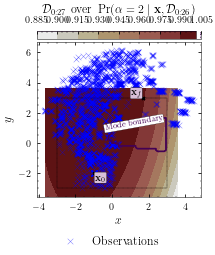

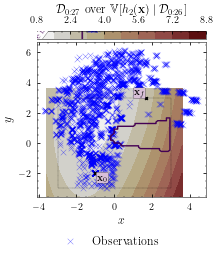

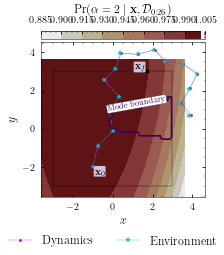

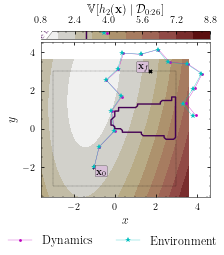

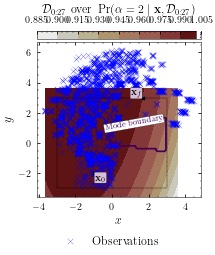

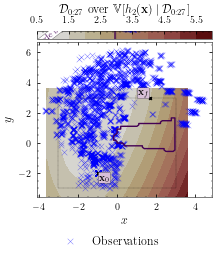

Optimisation result:
     fun: 657.6158165039988
     jac: array([-1.84548979e-06, -8.67538497e-04, -2.93287475e-04,  4.07725659e-04,
        1.19500772e-04,  2.82544247e-04,  3.84488625e-04, -3.63364918e-04,
        6.03205809e-04, -1.08057523e-03, -1.29894918e-04, -2.17605646e-04,
       -3.13156876e-04, -6.17635446e-04,  7.04204132e-04,  8.05628688e-05,
        7.74896363e-04,  9.65443721e-05,  6.20924212e-04,  4.51034628e-04,
       -3.61013727e-04,  3.48685467e-04, -1.42324545e-04, -6.69071122e-04,
        7.99711391e-04, -9.38708200e-05, -7.27374215e-04, -1.21694398e-03,
        3.18724370e-04, -7.82105702e-04])
 message: 'Optimization terminated successfully'
    nfev: 57
     nit: 38
    njev: 38
  status: 0
 success: True
       x: array([ 1.44276808,  5.88562237,  3.02171615,  4.93411689, -0.42542928,
        5.89191737, -1.99339814,  5.21886668, -1.42594574,  5.00886255,
        2.89503651,  3.55296942,  2.94030738,  3.55490565,  2.36332967,
       -0.29346394,  2.75123141, 

/Users/aidanscannell/Developer/python-projects/ModeOpt/modeopt/plotting/contour_plotter.py:248: UserWarning: No contour levels were found within the data range.
  CS = ax.tricontour(
/Users/aidanscannell/Developer/python-projects/ModeOpt/modeopt/plotting/contour_plotter.py:248: UserWarning: No contour levels were found within the data range.
  CS = ax.tricontour(
/Users/aidanscannell/Developer/python-projects/ModeOpt/modeopt/plotting/contour_plotter.py:248: UserWarning: No contour levels were found within the data range.
  CS = ax.tricontour(


Epoch 1/20000
2/3 [===================>..........] - ETA: 0s - loss: -1123.5959

2022-04-22 14:53:46.336099: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 14:53:46.336118: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


3/3 [==============================] - 3s 1s/step - loss: -1086.5293 - val_loss: -982.6917


2022-04-22 14:53:47.929600: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 14:53:47.942608: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 14:53:47.951845: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_53_47

2022-04-22 14:53:48.002767: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_53_47/dr-robots-mbp.local.trace.json.gz
2022-04-22 14:53:48.029824: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_53_47

2022-04-22 14:53:48.030118: I tensorflow/core/profiler/rpc/client/s

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_28_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 39ms/step - loss: -1071.6460 - val_loss: -969.6141
Epoch 3/20000
3/3 [==============================] - 0s 48ms/step - loss: -1045.6036 - val_loss: -1039.9513
Epoch 4/20000
3/3 [==============================] - 0s 46ms/step - loss: -1089.8186 - val_loss: -1001.4817
Epoch 5/20000
3/3 [==============================] - 0s 50ms/step - loss: -1078.7487 - val_loss: -1051.1933
Epoch 6/20000
3/3 [==============================] - 0s 44ms/step - loss: -1096.5110 - val_loss: -1000.6665
Epoch 7/20000
3/3 [==============================] - 0s 41ms/step - loss: -1125.1735 - val_loss: -983.3720
Epoch 8/20000
3/3 [==============================] - 0s 45ms/step - loss: -1023.6967 - val_loss: -1024.8374
Epoch 9/20000
3/3 [==============================] - 0s 47ms/step - loss: -1042.8265 - val_loss: -985.9683
Epoch 10/20000
3/3 [==============================] - 0s 39ms/step - loss: -1082.7029 - val_loss: -1038.3416
Epoch 11/20000
3/3 [==========

3/3 [==============================] - 0s 46ms/step - loss: -1113.9310 - val_loss: -998.8749
Epoch 76/20000
3/3 [==============================] - 0s 45ms/step - loss: -1101.7623 - val_loss: -1071.3820
Epoch 77/20000
3/3 [==============================] - 0s 58ms/step - loss: -1128.2497 - val_loss: -1056.4054
Epoch 78/20000
3/3 [==============================] - 0s 47ms/step - loss: -1114.8008 - val_loss: -1055.1728
Epoch 79/20000
3/3 [==============================] - 0s 45ms/step - loss: -1119.7326 - val_loss: -1065.4005
Epoch 80/20000
3/3 [==============================] - 0s 44ms/step - loss: -1112.7944 - val_loss: -993.1625
Epoch 81/20000
3/3 [==============================] - 0s 43ms/step - loss: -1134.8240 - val_loss: -954.1146
Epoch 82/20000
3/3 [==============================] - 0s 46ms/step - loss: -1125.0137 - val_loss: -980.9894
Epoch 83/20000
3/3 [==============================] - 0s 43ms/step - loss: -1109.6531 - val_loss: -1078.0714
Epoch 84/20000
3/3 [==================

3/3 [==============================] - 0s 44ms/step - loss: -1002.1509 - val_loss: -926.7880
Epoch 151/20000
3/3 [==============================] - 0s 43ms/step - loss: -922.0694 - val_loss: -971.2028
Epoch 152/20000
3/3 [==============================] - 0s 43ms/step - loss: -980.8735 - val_loss: -1000.5166
Epoch 153/20000
3/3 [==============================] - 0s 44ms/step - loss: -1020.2009 - val_loss: -943.0779
Epoch 154/20000
3/3 [==============================] - 0s 44ms/step - loss: -1033.4717 - val_loss: -860.0767
Epoch 155/20000
3/3 [==============================] - 0s 45ms/step - loss: -995.4048 - val_loss: -998.0280
Epoch 156/20000
3/3 [==============================] - 0s 44ms/step - loss: -1026.0168 - val_loss: -1000.7429
Epoch 157/20000
3/3 [==============================] - 0s 47ms/step - loss: -1041.8219 - val_loss: -1004.2722
Epoch 158/20000
3/3 [==============================] - 0s 44ms/step - loss: -1058.0569 - val_loss: -1006.6540
Epoch 159/20000
3/3 [=============

3/3 [==============================] - 0s 44ms/step - loss: -969.1356 - val_loss: -1000.3598
Epoch 226/20000
3/3 [==============================] - 0s 46ms/step - loss: -1051.8158 - val_loss: -943.2246
Epoch 227/20000
3/3 [==============================] - 0s 49ms/step - loss: -989.5368 - val_loss: -971.2939
Epoch 228/20000
3/3 [==============================] - 0s 46ms/step - loss: -1026.1809 - val_loss: -987.6492
Epoch 229/20000
3/3 [==============================] - 0s 48ms/step - loss: -950.0438 - val_loss: -992.0010
Epoch 230/20000
3/3 [==============================] - 0s 44ms/step - loss: -1031.7326 - val_loss: -1026.3553
Epoch 231/20000
3/3 [==============================] - 0s 45ms/step - loss: -1058.4360 - val_loss: -1017.8832
Epoch 232/20000
3/3 [==============================] - 0s 47ms/step - loss: -1037.1542 - val_loss: -1023.5311
Epoch 233/20000
3/3 [==============================] - 0s 46ms/step - loss: -1025.5406 - val_loss: -962.0980
Epoch 234/20000
3/3 [=============

Epoch 300/20000
3/3 [==============================] - 0s 46ms/step - loss: -1098.8764 - val_loss: -892.2017
Epoch 301/20000
3/3 [==============================] - 0s 57ms/step - loss: -1022.4763 - val_loss: -1042.6809
Epoch 302/20000
3/3 [==============================] - 0s 48ms/step - loss: -955.6278 - val_loss: -1062.9279
Epoch 303/20000
3/3 [==============================] - 0s 45ms/step - loss: -1014.8662 - val_loss: -517.2081
Epoch 304/20000
3/3 [==============================] - 0s 46ms/step - loss: -844.9969 - val_loss: -937.9419
Epoch 305/20000
3/3 [==============================] - 0s 46ms/step - loss: -884.7067 - val_loss: -549.7232
Epoch 306/20000
3/3 [==============================] - 0s 45ms/step - loss: -954.4656 - val_loss: -698.4580
Epoch 307/20000
3/3 [==============================] - 0s 45ms/step - loss: -791.5925 - val_loss: -995.4915
Epoch 308/20000
3/3 [==============================] - 0s 47ms/step - loss: -858.3144 - val_loss: -896.5878
Epoch 309/20000
3/3 [==

Epoch 375/20000
3/3 [==============================] - 0s 46ms/step - loss: -1096.1585 - val_loss: -1039.6316
Epoch 376/20000
3/3 [==============================] - 0s 49ms/step - loss: -1088.8257 - val_loss: -1086.3553
Epoch 377/20000
3/3 [==============================] - 0s 48ms/step - loss: -1094.6468 - val_loss: -921.5808
Epoch 378/20000
3/3 [==============================] - 0s 49ms/step - loss: -999.8759 - val_loss: -966.9817
Epoch 379/20000
3/3 [==============================] - 0s 48ms/step - loss: -1063.8036 - val_loss: -954.6649
Epoch 380/20000
3/3 [==============================] - 0s 49ms/step - loss: -1005.3005 - val_loss: -1010.4834
Epoch 381/20000
3/3 [==============================] - 0s 49ms/step - loss: -944.8641 - val_loss: -1010.5858
Epoch 382/20000
3/3 [==============================] - 0s 49ms/step - loss: -830.2331 - val_loss: -1071.5513
Epoch 383/20000
3/3 [==============================] - 0s 48ms/step - loss: -1027.6014 - val_loss: -947.2376
Epoch 384/20000
3

3/3 [==============================] - 0s 55ms/step - loss: -1004.8748 - val_loss: -972.1905
Epoch 451/20000
3/3 [==============================] - 0s 51ms/step - loss: -985.9580 - val_loss: -951.7563
Epoch 452/20000
3/3 [==============================] - 0s 48ms/step - loss: -1032.4543 - val_loss: -979.1281
Epoch 453/20000
3/3 [==============================] - 0s 51ms/step - loss: -1031.1417 - val_loss: -988.6152
Epoch 454/20000
3/3 [==============================] - 0s 48ms/step - loss: -1021.4000 - val_loss: -1005.6990
Epoch 455/20000
3/3 [==============================] - 0s 49ms/step - loss: -1042.1489 - val_loss: -979.4881
Epoch 456/20000
3/3 [==============================] - 0s 48ms/step - loss: -1040.1559 - val_loss: -996.4920
Epoch 457/20000
3/3 [==============================] - 0s 50ms/step - loss: -1042.5522 - val_loss: -1010.5237
Epoch 458/20000
3/3 [==============================] - 0s 48ms/step - loss: -1064.2614 - val_loss: -1022.5966
Epoch 459/20000
3/3 [============

3/3 [==============================] - 0s 48ms/step - loss: -1066.9564 - val_loss: -1009.0488
Epoch 526/20000
3/3 [==============================] - 0s 49ms/step - loss: -985.2100 - val_loss: -1001.4192
Epoch 527/20000
3/3 [==============================] - 0s 48ms/step - loss: -1044.1985 - val_loss: -1018.0055
Epoch 528/20000
3/3 [==============================] - 0s 49ms/step - loss: -1067.8223 - val_loss: -1022.0060
Epoch 529/20000
3/3 [==============================] - 0s 49ms/step - loss: -1055.2363 - val_loss: -1017.3559
Epoch 530/20000
3/3 [==============================] - 0s 47ms/step - loss: -1064.5151 - val_loss: -1029.7563
Epoch 531/20000
3/3 [==============================] - 0s 48ms/step - loss: -1056.4276 - val_loss: -1018.2215
Epoch 532/20000
3/3 [==============================] - 0s 51ms/step - loss: -1075.9990 - val_loss: -1008.1689
Epoch 533/20000
3/3 [==============================] - 0s 49ms/step - loss: -1096.4735 - val_loss: -1019.4122
Epoch 534/20000
3/3 [======

3/3 [==============================] - 0s 50ms/step - loss: -293.8407 - val_loss: -821.2900
Epoch 601/20000
3/3 [==============================] - 0s 50ms/step - loss: -628.0127 - val_loss: -931.9470
Epoch 602/20000
3/3 [==============================] - 0s 49ms/step - loss: -742.6447 - val_loss: -720.6210
Epoch 603/20000
3/3 [==============================] - 0s 50ms/step - loss: -800.1394 - val_loss: -815.2240
Epoch 604/20000
3/3 [==============================] - 0s 55ms/step - loss: -842.2351 - val_loss: -878.0325
Epoch 605/20000
3/3 [==============================] - 0s 50ms/step - loss: -962.0001 - val_loss: -992.8950
Epoch 606/20000
3/3 [==============================] - 0s 48ms/step - loss: -908.6823 - val_loss: -845.8262
Epoch 607/20000
3/3 [==============================] - 0s 50ms/step - loss: -958.7064 - val_loss: -929.2466
Epoch 608/20000
3/3 [==============================] - 0s 51ms/step - loss: -956.3454 - val_loss: -924.3195
Epoch 609/20000
3/3 [=======================

3/3 [==============================] - 0s 44ms/step - loss: -636.4557 - val_loss: -790.9128
Epoch 676/20000
3/3 [==============================] - 0s 46ms/step - loss: -866.7317 - val_loss: -701.3846
Epoch 677/20000
3/3 [==============================] - 0s 45ms/step - loss: -853.1410 - val_loss: -797.4703
Epoch 678/20000
3/3 [==============================] - 0s 45ms/step - loss: -697.1282 - val_loss: -694.7339
Epoch 679/20000
3/3 [==============================] - 0s 46ms/step - loss: -293.8184 - val_loss: -853.5555
Epoch 680/20000
3/3 [==============================] - 0s 44ms/step - loss: -352.8426 - val_loss: -644.6358
Epoch 681/20000
3/3 [==============================] - 0s 43ms/step - loss: -582.3431 - val_loss: -304.2322
Epoch 682/20000
3/3 [==============================] - 0s 43ms/step - loss: -528.5245 - val_loss: -663.8545
Epoch 683/20000
3/3 [==============================] - 0s 45ms/step - loss: -844.6825 - val_loss: -684.2488
Epoch 684/20000
3/3 [=======================

Epoch 751/20000
3/3 [==============================] - 0s 48ms/step - loss: -1028.5452 - val_loss: -949.4871
Epoch 752/20000
3/3 [==============================] - 0s 42ms/step - loss: -1057.9091 - val_loss: -972.4076
Epoch 753/20000
3/3 [==============================] - 0s 43ms/step - loss: -1061.1433 - val_loss: -871.1563
Epoch 754/20000
3/3 [==============================] - 0s 45ms/step - loss: -1042.3290 - val_loss: -886.7089
Epoch 755/20000
3/3 [==============================] - 0s 43ms/step - loss: -1029.1507 - val_loss: -902.5748
Epoch 756/20000
3/3 [==============================] - 0s 44ms/step - loss: -1071.0368 - val_loss: -971.0470
Epoch 757/20000
3/3 [==============================] - 0s 45ms/step - loss: -1073.3016 - val_loss: -980.8004
Epoch 758/20000
3/3 [==============================] - 0s 48ms/step - loss: -1010.9083 - val_loss: -989.7802
Epoch 759/20000
3/3 [==============================] - 0s 44ms/step - loss: -1020.1142 - val_loss: -918.6326
Epoch 760/20000
3/3

3/3 [==============================] - 0s 48ms/step - loss: -957.7783 - val_loss: -869.3842
Epoch 827/20000
3/3 [==============================] - 0s 49ms/step - loss: -1055.2557 - val_loss: -970.9071
Epoch 828/20000
3/3 [==============================] - 0s 46ms/step - loss: -1006.4193 - val_loss: -807.9445
Epoch 829/20000
3/3 [==============================] - 0s 48ms/step - loss: -1068.5073 - val_loss: -938.4044
Epoch 830/20000
3/3 [==============================] - 0s 50ms/step - loss: -1032.7918 - val_loss: -990.3498
Epoch 831/20000
3/3 [==============================] - 0s 50ms/step - loss: -1060.6949 - val_loss: -938.6710
Epoch 832/20000
3/3 [==============================] - 0s 50ms/step - loss: -1062.6546 - val_loss: -966.4907
Epoch 833/20000
3/3 [==============================] - 0s 49ms/step - loss: -1052.9653 - val_loss: -1001.9705
Epoch 834/20000
3/3 [==============================] - 0s 49ms/step - loss: -1075.7449 - val_loss: -973.3586
Epoch 835/20000
3/3 [==============

3/3 [==============================] - 0s 43ms/step - loss: -922.5786 - val_loss: -732.1946
Epoch 902/20000
3/3 [==============================] - 0s 44ms/step - loss: -621.3633 - val_loss: -745.7711
Epoch 903/20000
3/3 [==============================] - 0s 45ms/step - loss: -796.3829 - val_loss: -954.6409
Epoch 904/20000
3/3 [==============================] - 0s 43ms/step - loss: -1001.9116 - val_loss: -817.8906
Epoch 905/20000
3/3 [==============================] - 0s 43ms/step - loss: -912.4591 - val_loss: -780.5409
Epoch 906/20000
3/3 [==============================] - 0s 45ms/step - loss: -623.5724 - val_loss: -558.7169
Epoch 907/20000
3/3 [==============================] - 0s 48ms/step - loss: -968.3582 - val_loss: -893.2201
Epoch 908/20000
3/3 [==============================] - 0s 46ms/step - loss: -1024.0016 - val_loss: -958.0239
Epoch 909/20000
3/3 [==============================] - 0s 44ms/step - loss: -1031.6902 - val_loss: -911.5299
Epoch 910/20000
3/3 [====================

3/3 [==============================] - 0s 56ms/step - loss: -880.7212 - val_loss: -795.6577
Epoch 977/20000
3/3 [==============================] - 0s 47ms/step - loss: 732.5803 - val_loss: 1323.0502
Epoch 978/20000
3/3 [==============================] - 0s 53ms/step - loss: -91.3602 - val_loss: 107.8380
Epoch 979/20000
3/3 [==============================] - 0s 50ms/step - loss: 321.9072 - val_loss: 958.2208
Epoch 980/20000
3/3 [==============================] - 0s 57ms/step - loss: 209.2353 - val_loss: -698.1845
Epoch 981/20000
3/3 [==============================] - 0s 55ms/step - loss: -791.0151 - val_loss: -839.2303
Epoch 982/20000
3/3 [==============================] - 0s 55ms/step - loss: -850.3020 - val_loss: -903.3043
Epoch 983/20000
3/3 [==============================] - 0s 51ms/step - loss: -810.2057 - val_loss: -785.2233
Epoch 984/20000
3/3 [==============================] - 0s 52ms/step - loss: -715.2831 - val_loss: -779.2759
Epoch 985/20000
3/3 [=============================

Epoch 1051/20000
3/3 [==============================] - 0s 58ms/step - loss: -1085.4902 - val_loss: -961.8690
Epoch 1052/20000
3/3 [==============================] - 0s 60ms/step - loss: -1057.9177 - val_loss: -794.7177
Epoch 1053/20000
3/3 [==============================] - 0s 58ms/step - loss: -773.1849 - val_loss: -768.4367
Epoch 1054/20000
3/3 [==============================] - 0s 59ms/step - loss: -846.0060 - val_loss: -633.9335
Epoch 1055/20000
3/3 [==============================] - 0s 58ms/step - loss: -923.3008 - val_loss: -134.3524
Epoch 1056/20000
3/3 [==============================] - 0s 59ms/step - loss: -407.0896 - val_loss: -854.3113
Epoch 1057/20000
3/3 [==============================] - 0s 71ms/step - loss: -898.7581 - val_loss: -542.0910
Epoch 1058/20000
3/3 [==============================] - 0s 56ms/step - loss: -743.2892 - val_loss: -959.6717
Epoch 1059/20000
3/3 [==============================] - 0s 54ms/step - loss: -915.0564 - val_loss: -800.1585
Epoch 1060/20000


3/3 [==============================] - 0s 53ms/step - loss: -986.3800 - val_loss: -755.8040
Epoch 1126/20000
3/3 [==============================] - 0s 53ms/step - loss: -905.0394 - val_loss: -1028.3069
Epoch 1127/20000
3/3 [==============================] - 0s 51ms/step - loss: -956.1677 - val_loss: -1011.6515
Epoch 1128/20000
3/3 [==============================] - 0s 52ms/step - loss: -970.4715 - val_loss: -878.7212
Epoch 1129/20000
3/3 [==============================] - 0s 51ms/step - loss: -920.7685 - val_loss: -1031.2666
Epoch 1130/20000
3/3 [==============================] - 0s 52ms/step - loss: -1044.7246 - val_loss: -907.3476
Epoch 1131/20000
3/3 [==============================] - 0s 54ms/step - loss: -1040.1837 - val_loss: -947.1718
Epoch 1132/20000
3/3 [==============================] - 0s 52ms/step - loss: -1091.3685 - val_loss: -932.4393
Epoch 1133/20000
3/3 [==============================] - 0s 53ms/step - loss: -1031.9715 - val_loss: -952.2257
Epoch 1134/20000
3/3 [=======

3/3 [==============================] - 0s 50ms/step - loss: -745.8435 - val_loss: -753.4220
Epoch 1200/20000
3/3 [==============================] - 0s 51ms/step - loss: -684.5676 - val_loss: -994.3501
Epoch 1201/20000
3/3 [==============================] - 0s 49ms/step - loss: -948.7451 - val_loss: -614.5587
Epoch 1202/20000
3/3 [==============================] - 0s 51ms/step - loss: -797.6879 - val_loss: -951.3792
Epoch 1203/20000
3/3 [==============================] - 0s 51ms/step - loss: -863.2074 - val_loss: -265.1671
Epoch 1204/20000
3/3 [==============================] - 0s 51ms/step - loss: -635.6034 - val_loss: -940.8358
Epoch 1205/20000
3/3 [==============================] - 0s 72ms/step - loss: -963.6808 - val_loss: -1000.0533
Epoch 1206/20000
3/3 [==============================] - 0s 51ms/step - loss: -989.2377 - val_loss: -734.1540
Epoch 1207/20000
3/3 [==============================] - 0s 50ms/step - loss: -873.6584 - val_loss: -826.0546
Epoch 1208/20000
3/3 [=============

Epoch 1274/20000
3/3 [==============================] - 0s 49ms/step - loss: -1085.6308 - val_loss: -999.3948
Epoch 1275/20000
3/3 [==============================] - 0s 77ms/step - loss: -1037.6749 - val_loss: -1044.6153
Epoch 1276/20000
3/3 [==============================] - 0s 66ms/step - loss: -1049.3522 - val_loss: -960.6721
Epoch 1277/20000
3/3 [==============================] - 0s 60ms/step - loss: -1038.0189 - val_loss: -968.4703
Epoch 1278/20000
3/3 [==============================] - 0s 53ms/step - loss: -1068.0317 - val_loss: -944.9480
Epoch 1279/20000
3/3 [==============================] - 0s 55ms/step - loss: -1017.8038 - val_loss: -963.1741
Epoch 1280/20000
3/3 [==============================] - 0s 47ms/step - loss: -1058.9598 - val_loss: -949.5620
Epoch 1281/20000
3/3 [==============================] - 0s 48ms/step - loss: -1000.6406 - val_loss: -1035.6823
Epoch 1282/20000
3/3 [==============================] - 0s 53ms/step - loss: -1047.2359 - val_loss: -998.4874
Epoch 12

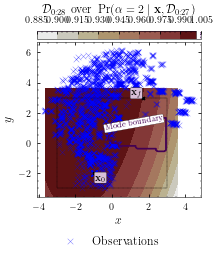

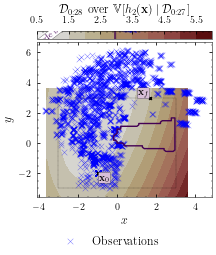

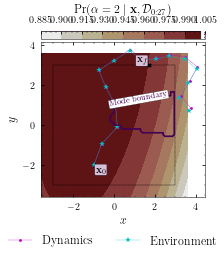

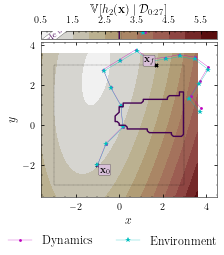

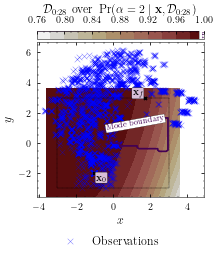

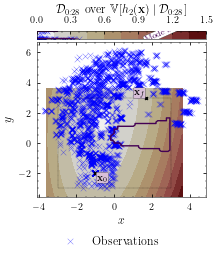

Optimisation result:
     fun: 923.0985752019947
     jac: array([-6.09229045e-05,  3.81462309e-04,  6.48200848e-05,  7.84710475e-04,
        3.64848010e-04,  1.13426051e-04,  5.24363591e-04, -2.24982822e-04,
        1.36999777e-04, -9.11814917e-05,  3.90263722e-04, -6.03883050e-04,
        7.77924032e-04,  6.08152068e-04,  1.11485757e-04, -6.06841066e-04,
        1.73118066e-04, -1.27392255e-04, -7.09659386e-05, -8.97994190e-05,
        4.43226415e-04, -1.21894078e-04, -4.76283731e-04,  1.95008553e-04,
        2.28397337e-05, -5.66486173e-04,  1.06456732e-04,  5.18093435e-05,
       -2.01085629e-04,  2.18693338e-04])
 message: 'Optimization terminated successfully'
    nfev: 37
     nit: 25
    njev: 25
  status: 0
 success: True
       x: array([ 0.91054186,  6.15341817,  3.12273198,  5.02434796,  1.25487665,
        5.76389229, -2.13254919,  4.9366388 , -1.5212556 ,  5.01872489,
        2.80513261,  3.74412888,  2.81239087,  3.67439132,  2.41489246,
        0.05598258,  2.47489051, 

2022-04-22 14:58:32.887175: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2022-04-22 14:58:32.887194: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


3/3 [==============================] - 2s 1s/step - loss: -1082.1621 - val_loss: -994.1378


2022-04-22 14:58:34.394982: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2022-04-22 14:58:34.414251: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2022-04-22 14:58:34.425198: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_58_34

2022-04-22 14:58:34.433217: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_58_34/dr-robots-mbp.local.trace.json.gz
2022-04-22 14:58:34.462594: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/train/plugins/profile/2022_04_22_14_58_34

2022-04-22 14:58:34.462891: I tensorflow/core/profiler/rpc/client/s

INFO:tensorflow:Assets written to: ./experiments/mvn-full-cov/explorative-prob-0.8/2022-04-22-12-25/ckpts/step_29_epoch_0/assets


/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.Categorical_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "
/Users/aidanscannell/Library/Caches/pypoetry/virtualenvs/modeopt-KAfqa0eY-py3.8/lib/python3.8/site-packages/tensorflow/python/saved_model/nested_structure_coder.py:558: UserWarning: Encoding a StructuredValue with type tfp.distributions.MultivariateNormalDiag_ACTTypeSpec; loading this StructuredValue will require that this type be imported and registered.
  warnings.warn("Encoding a StructuredValue with type %s; loading this "


Epoch 2/20000
3/3 [==============================] - 0s 29ms/step - loss: -1092.6354 - val_loss: -944.3453
Epoch 3/20000
3/3 [==============================] - 0s 31ms/step - loss: -1092.0453 - val_loss: -1004.8639
Epoch 4/20000
3/3 [==============================] - 0s 29ms/step - loss: -1082.0841 - val_loss: -978.3514
Epoch 5/20000
3/3 [==============================] - 0s 29ms/step - loss: -1096.6662 - val_loss: -1026.8748
Epoch 6/20000
3/3 [==============================] - 0s 29ms/step - loss: -1103.0743 - val_loss: -1000.1588
Epoch 7/20000
3/3 [==============================] - 0s 29ms/step - loss: -1088.7258 - val_loss: -990.4251
Epoch 8/20000
3/3 [==============================] - 0s 29ms/step - loss: -1094.5278 - val_loss: -1024.3586
Epoch 9/20000
3/3 [==============================] - 0s 30ms/step - loss: -1104.0839 - val_loss: -1014.7178
Epoch 10/20000
3/3 [==============================] - 0s 30ms/step - loss: -1105.5392 - val_loss: -974.1306
Epoch 11/20000
3/3 [===========

3/3 [==============================] - 0s 41ms/step - loss: -1121.5479 - val_loss: -1028.9123
Epoch 76/20000
3/3 [==============================] - 0s 41ms/step - loss: -1114.9476 - val_loss: -1012.8804
Epoch 77/20000
3/3 [==============================] - 0s 40ms/step - loss: -1128.2705 - val_loss: -993.0003
Epoch 78/20000
3/3 [==============================] - 0s 40ms/step - loss: -1069.9510 - val_loss: -973.2928
Epoch 79/20000
3/3 [==============================] - 0s 38ms/step - loss: -1084.6828 - val_loss: -1038.6060
Epoch 80/20000
3/3 [==============================] - 0s 38ms/step - loss: -1040.6992 - val_loss: -1015.0757
Epoch 81/20000
3/3 [==============================] - 0s 37ms/step - loss: -1099.9456 - val_loss: -1020.9057
Epoch 82/20000
3/3 [==============================] - 0s 37ms/step - loss: -1082.9748 - val_loss: -997.6660
Epoch 83/20000
3/3 [==============================] - 0s 39ms/step - loss: -1097.5843 - val_loss: -918.9066
Epoch 84/20000
3/3 [==================

3/3 [==============================] - 0s 46ms/step - loss: -1054.4799 - val_loss: -981.7914
Epoch 151/20000
3/3 [==============================] - 0s 43ms/step - loss: -1050.4273 - val_loss: -980.6126
Epoch 152/20000
3/3 [==============================] - 0s 45ms/step - loss: -1047.1031 - val_loss: -1002.0052
Epoch 153/20000
3/3 [==============================] - 0s 48ms/step - loss: -1076.3719 - val_loss: -978.1186
Epoch 154/20000
3/3 [==============================] - 0s 46ms/step - loss: -1073.4145 - val_loss: -1006.1437
Epoch 155/20000
3/3 [==============================] - 0s 46ms/step - loss: -1089.4399 - val_loss: -982.3610
Epoch 156/20000
3/3 [==============================] - 0s 42ms/step - loss: -1070.4407 - val_loss: -1002.1510
Epoch 157/20000
3/3 [==============================] - 0s 43ms/step - loss: -1068.8902 - val_loss: -985.1614
Epoch 158/20000
3/3 [==============================] - 0s 48ms/step - loss: -1027.8999 - val_loss: -978.8497
Epoch 159/20000
3/3 [===========

3/3 [==============================] - 0s 47ms/step - loss: -1058.0196 - val_loss: -977.4234
Epoch 226/20000
3/3 [==============================] - 0s 45ms/step - loss: -1061.3554 - val_loss: -968.7212
Epoch 227/20000
3/3 [==============================] - 0s 44ms/step - loss: -1060.1145 - val_loss: -1004.8504
Epoch 228/20000
3/3 [==============================] - 0s 43ms/step - loss: -980.3033 - val_loss: -984.1866
Epoch 229/20000
3/3 [==============================] - 0s 44ms/step - loss: -989.0163 - val_loss: -969.2532
Epoch 230/20000
3/3 [==============================] - 0s 44ms/step - loss: -1001.4403 - val_loss: -993.1444
Epoch 231/20000
3/3 [==============================] - 0s 45ms/step - loss: -933.3205 - val_loss: -927.4999
Epoch 232/20000
3/3 [==============================] - 0s 42ms/step - loss: -1052.4995 - val_loss: -945.8382
Epoch 233/20000
3/3 [==============================] - 0s 44ms/step - loss: -1019.8358 - val_loss: -992.0193
Epoch 234/20000
3/3 [================

3/3 [==============================] - 0s 44ms/step - loss: -931.0189 - val_loss: -27.4877
Epoch 302/20000
3/3 [==============================] - 0s 45ms/step - loss: -811.8620 - val_loss: -86.6724
Epoch 303/20000
3/3 [==============================] - 0s 43ms/step - loss: -929.9732 - val_loss: -769.7701
Epoch 304/20000
3/3 [==============================] - 0s 45ms/step - loss: -875.5705 - val_loss: -674.8903
Epoch 305/20000
3/3 [==============================] - 0s 45ms/step - loss: -916.9064 - val_loss: -83.7249
Epoch 306/20000
3/3 [==============================] - 0s 45ms/step - loss: -879.1520 - val_loss: -698.9787
Epoch 307/20000
3/3 [==============================] - 0s 45ms/step - loss: -976.6013 - val_loss: -803.0467
Epoch 308/20000
3/3 [==============================] - 0s 44ms/step - loss: -941.9574 - val_loss: -694.3196
Epoch 309/20000
3/3 [==============================] - 0s 43ms/step - loss: -937.2020 - val_loss: -401.5044
Epoch 310/20000
3/3 [==========================

Epoch 377/20000
3/3 [==============================] - 0s 49ms/step - loss: -1036.3517 - val_loss: -968.7545
Epoch 378/20000
3/3 [==============================] - 0s 44ms/step - loss: -960.3012 - val_loss: -968.4604
Epoch 379/20000
3/3 [==============================] - 0s 47ms/step - loss: -1025.8721 - val_loss: -961.9677
Epoch 380/20000
3/3 [==============================] - 0s 48ms/step - loss: -1033.0144 - val_loss: -895.0285
Epoch 381/20000
3/3 [==============================] - 0s 49ms/step - loss: -817.8180 - val_loss: -1031.7054
Epoch 382/20000
3/3 [==============================] - 0s 50ms/step - loss: -1039.9868 - val_loss: -813.4757
Epoch 383/20000
3/3 [==============================] - 0s 47ms/step - loss: -1034.0878 - val_loss: -884.9302
Epoch 384/20000
3/3 [==============================] - 0s 47ms/step - loss: -1021.8947 - val_loss: -964.6756
Epoch 385/20000
3/3 [==============================] - 0s 48ms/step - loss: -1035.5248 - val_loss: -1038.2824
Epoch 386/20000
3/3

3/3 [==============================] - 0s 56ms/step - loss: -1080.7098 - val_loss: -1028.6821
Epoch 453/20000
3/3 [==============================] - 0s 57ms/step - loss: -1081.2061 - val_loss: -1049.5243
Epoch 454/20000
3/3 [==============================] - 0s 51ms/step - loss: -1074.2981 - val_loss: -958.5758
Epoch 455/20000
3/3 [==============================] - 0s 52ms/step - loss: -1087.6789 - val_loss: -1016.9507
Epoch 456/20000
3/3 [==============================] - 0s 51ms/step - loss: -1100.1978 - val_loss: -954.2607
Epoch 457/20000
3/3 [==============================] - 0s 50ms/step - loss: -1074.6095 - val_loss: -1029.7041
Epoch 458/20000
3/3 [==============================] - 0s 49ms/step - loss: -1082.7039 - val_loss: -1016.6195
Epoch 459/20000
3/3 [==============================] - 0s 49ms/step - loss: -1104.0629 - val_loss: -1030.4275
Epoch 460/20000
3/3 [==============================] - 0s 49ms/step - loss: -1079.2602 - val_loss: -1030.1224
Epoch 461/20000
3/3 [=======

3/3 [==============================] - 0s 49ms/step - loss: -1042.2104 - val_loss: -1020.6744
Epoch 528/20000
3/3 [==============================] - 0s 49ms/step - loss: -1071.5374 - val_loss: -1025.5449
Epoch 529/20000
3/3 [==============================] - 0s 48ms/step - loss: -1055.7306 - val_loss: -994.3924
Epoch 530/20000
3/3 [==============================] - 0s 48ms/step - loss: -1084.2408 - val_loss: -1037.5050
Epoch 531/20000
3/3 [==============================] - 0s 48ms/step - loss: -1062.7724 - val_loss: -1004.1763
Epoch 532/20000
3/3 [==============================] - 0s 47ms/step - loss: -1083.2183 - val_loss: -1018.5390
Epoch 533/20000
3/3 [==============================] - 0s 49ms/step - loss: -1051.1223 - val_loss: -949.7698
Epoch 534/20000
3/3 [==============================] - 0s 48ms/step - loss: -1048.7614 - val_loss: -1046.1198
Epoch 535/20000
3/3 [==============================] - 0s 49ms/step - loss: -1071.5769 - val_loss: -961.0266
Epoch 536/20000
3/3 [========

3/3 [==============================] - 0s 51ms/step - loss: -752.5449 - val_loss: -636.5562
Epoch 603/20000
3/3 [==============================] - 0s 51ms/step - loss: -969.7400 - val_loss: -956.4337
Epoch 604/20000
3/3 [==============================] - 0s 51ms/step - loss: -832.3034 - val_loss: -883.6113
Epoch 605/20000
3/3 [==============================] - 0s 51ms/step - loss: -836.8539 - val_loss: -956.5723
Epoch 606/20000
3/3 [==============================] - 0s 50ms/step - loss: -803.0745 - val_loss: -230.3466
Epoch 607/20000
3/3 [==============================] - 0s 49ms/step - loss: -893.8085 - val_loss: -884.2649
Epoch 608/20000
3/3 [==============================] - 0s 53ms/step - loss: -895.1555 - val_loss: -888.4591
Epoch 609/20000
3/3 [==============================] - 0s 48ms/step - loss: -970.5976 - val_loss: -479.8892
Epoch 610/20000
3/3 [==============================] - 0s 51ms/step - loss: -975.0426 - val_loss: -837.4213
Epoch 611/20000
3/3 [=======================

3/3 [==============================] - 0s 49ms/step - loss: -1102.9122 - val_loss: -870.3294
Epoch 678/20000
3/3 [==============================] - 0s 50ms/step - loss: -1042.8775 - val_loss: -959.8809
Epoch 679/20000
3/3 [==============================] - 0s 50ms/step - loss: -1037.4290 - val_loss: -920.7350
Epoch 680/20000
3/3 [==============================] - 0s 50ms/step - loss: -1069.9987 - val_loss: -1020.4551
Epoch 681/20000
3/3 [==============================] - 0s 48ms/step - loss: -1056.7266 - val_loss: -1016.7734
Epoch 682/20000
3/3 [==============================] - 0s 50ms/step - loss: -1063.1187 - val_loss: -989.4949
Epoch 683/20000
3/3 [==============================] - 0s 50ms/step - loss: -765.9113 - val_loss: -1024.1745
Epoch 684/20000
3/3 [==============================] - 0s 50ms/step - loss: -964.4070 - val_loss: -898.8333
Epoch 685/20000
3/3 [==============================] - 0s 48ms/step - loss: -1042.3066 - val_loss: 481.7100
Epoch 686/20000
3/3 [==============

Epoch 752/20000
3/3 [==============================] - 0s 46ms/step - loss: -793.3194 - val_loss: -809.2294
Epoch 753/20000
3/3 [==============================] - 0s 48ms/step - loss: -984.8802 - val_loss: -854.6841
Epoch 754/20000
3/3 [==============================] - 0s 49ms/step - loss: -856.7614 - val_loss: -977.8295
Epoch 755/20000
3/3 [==============================] - 0s 46ms/step - loss: -755.9840 - val_loss: -907.6223
Epoch 756/20000
3/3 [==============================] - 0s 49ms/step - loss: -928.4728 - val_loss: -969.1922
Epoch 757/20000
3/3 [==============================] - 0s 48ms/step - loss: -935.4381 - val_loss: -860.8420
Epoch 758/20000
3/3 [==============================] - 0s 57ms/step - loss: -1008.5998 - val_loss: -1001.0262
Epoch 759/20000
3/3 [==============================] - 0s 58ms/step - loss: -1037.4735 - val_loss: -992.7281
Epoch 760/20000
3/3 [==============================] - 0s 51ms/step - loss: -995.8503 - val_loss: -965.0517
Epoch 761/20000
3/3 [====

3/3 [==============================] - 0s 73ms/step - loss: -1051.1995 - val_loss: -911.8578
Epoch 828/20000
3/3 [==============================] - 0s 59ms/step - loss: -1065.2873 - val_loss: -1009.3285
Epoch 829/20000
3/3 [==============================] - 0s 60ms/step - loss: -1056.2139 - val_loss: -995.8941
Epoch 830/20000
3/3 [==============================] - 0s 63ms/step - loss: -1091.8698 - val_loss: -987.2330
Epoch 831/20000
3/3 [==============================] - 0s 60ms/step - loss: -1093.1074 - val_loss: -1006.4573
Epoch 832/20000
3/3 [==============================] - 0s 61ms/step - loss: -1091.3190 - val_loss: -927.9965
Epoch 833/20000
3/3 [==============================] - 0s 64ms/step - loss: -1104.9212 - val_loss: -984.3915
Epoch 834/20000
3/3 [==============================] - 0s 69ms/step - loss: -1091.9605 - val_loss: -1005.7531
Epoch 835/20000
3/3 [==============================] - 0s 66ms/step - loss: -1085.9227 - val_loss: -1015.1167
Epoch 836/20000
3/3 [==========

3/3 [==============================] - 0s 58ms/step - loss: -1109.7236 - val_loss: -1045.7614
Epoch 903/20000
3/3 [==============================] - 0s 55ms/step - loss: -1123.9809 - val_loss: -1042.7426
Epoch 904/20000
3/3 [==============================] - 0s 59ms/step - loss: -1120.7696 - val_loss: -991.5101
Epoch 905/20000
3/3 [==============================] - 0s 61ms/step - loss: -1072.7132 - val_loss: -1031.2445
Epoch 906/20000
3/3 [==============================] - 0s 59ms/step - loss: -1126.0724 - val_loss: -1035.0910
Epoch 907/20000
3/3 [==============================] - 0s 57ms/step - loss: -1106.8353 - val_loss: -1028.0913
Epoch 908/20000
3/3 [==============================] - 0s 58ms/step - loss: -1111.2961 - val_loss: -1041.3609
Epoch 909/20000
3/3 [==============================] - 0s 59ms/step - loss: -1113.6935 - val_loss: -1054.1625
Epoch 910/20000
3/3 [==============================] - 0s 57ms/step - loss: -1102.2355 - val_loss: -1047.8471
Epoch 911/20000
3/3 [======

3/3 [==============================] - 0s 73ms/step - loss: -953.5136 - val_loss: -739.4304
Epoch 978/20000
3/3 [==============================] - 0s 64ms/step - loss: -944.6093 - val_loss: -906.1582
Epoch 979/20000
3/3 [==============================] - 0s 59ms/step - loss: -893.0325 - val_loss: -872.8948
Epoch 980/20000
3/3 [==============================] - 0s 59ms/step - loss: -973.7662 - val_loss: -908.1525
Epoch 981/20000
3/3 [==============================] - 0s 51ms/step - loss: -970.3427 - val_loss: -901.3127
Epoch 982/20000
3/3 [==============================] - 0s 51ms/step - loss: -984.8313 - val_loss: -943.2024
Epoch 983/20000
3/3 [==============================] - 0s 51ms/step - loss: -985.5199 - val_loss: -937.8396
Epoch 984/20000
3/3 [==============================] - 0s 55ms/step - loss: -993.7119 - val_loss: -933.5642
Epoch 985/20000
3/3 [==============================] - 0s 65ms/step - loss: -999.7535 - val_loss: -967.1880
Epoch 986/20000
3/3 [=======================

3/3 [==============================] - 0s 49ms/step - loss: -1080.0399 - val_loss: -1002.1156
Epoch 1052/20000
3/3 [==============================] - 0s 51ms/step - loss: -1054.7807 - val_loss: -880.3329
Epoch 1053/20000
3/3 [==============================] - 0s 49ms/step - loss: -904.5010 - val_loss: -855.9367
Epoch 1054/20000
3/3 [==============================] - 0s 47ms/step - loss: -1060.9492 - val_loss: -991.9157
Epoch 1055/20000
3/3 [==============================] - 0s 47ms/step - loss: -950.1452 - val_loss: -1015.0691
Epoch 1056/20000
3/3 [==============================] - 0s 47ms/step - loss: -1006.6762 - val_loss: -891.0636
Epoch 1057/20000
3/3 [==============================] - 0s 45ms/step - loss: -980.2991 - val_loss: -722.1373
Epoch 1058/20000
3/3 [==============================] - 0s 47ms/step - loss: -1007.9312 - val_loss: -961.7762
Epoch 1059/20000
3/3 [==============================] - 0s 47ms/step - loss: -1010.7181 - val_loss: -983.8331
Epoch 1060/20000
3/3 [======

Epoch 1126/20000
3/3 [==============================] - 0s 43ms/step - loss: -718.6562 - val_loss: -1005.2601
Epoch 1127/20000
3/3 [==============================] - 0s 56ms/step - loss: -493.3347 - val_loss: -822.2096
Epoch 1128/20000
3/3 [==============================] - 0s 48ms/step - loss: -1029.3641 - val_loss: -986.7752
Epoch 1129/20000
3/3 [==============================] - 0s 44ms/step - loss: -1062.8385 - val_loss: -888.1115
Epoch 1130/20000
3/3 [==============================] - 0s 44ms/step - loss: -1010.0061 - val_loss: -975.7870
Epoch 1131/20000
3/3 [==============================] - 0s 43ms/step - loss: -870.1465 - val_loss: -874.6912
Epoch 1132/20000
3/3 [==============================] - 0s 53ms/step - loss: -941.2406 - val_loss: -879.5823
Epoch 1133/20000
3/3 [==============================] - 0s 44ms/step - loss: -1013.4490 - val_loss: -965.7167
Epoch 1134/20000
3/3 [==============================] - 0s 42ms/step - loss: -1036.2668 - val_loss: -932.5517
Epoch 1135/20

3/3 [==============================] - 0s 45ms/step - loss: -1107.4211 - val_loss: -1035.2535
Epoch 1201/20000
3/3 [==============================] - 0s 45ms/step - loss: -1100.6742 - val_loss: -1010.1851
Epoch 1202/20000
3/3 [==============================] - 0s 47ms/step - loss: -1057.5874 - val_loss: -873.9555
Epoch 1203/20000
3/3 [==============================] - 0s 46ms/step - loss: -1033.0078 - val_loss: -983.2312
Epoch 1204/20000
3/3 [==============================] - 0s 44ms/step - loss: -1061.3091 - val_loss: -995.4423
Epoch 1205/20000
3/3 [==============================] - 0s 45ms/step - loss: -1072.7516 - val_loss: -979.0492
Epoch 1206/20000
3/3 [==============================] - 0s 44ms/step - loss: -1060.7683 - val_loss: -872.9796
Epoch 1207/20000
3/3 [==============================] - 0s 46ms/step - loss: -936.0784 - val_loss: -884.9700
Epoch 1208/20000
3/3 [==============================] - 0s 46ms/step - loss: -1002.5210 - val_loss: -1009.6547
Epoch 1209/20000
3/3 [===

Epoch 1275/20000
3/3 [==============================] - 0s 48ms/step - loss: -638.1500 - val_loss: -464.7027
Epoch 1276/20000
3/3 [==============================] - 0s 49ms/step - loss: -283.6275 - val_loss: 1040.9453
Epoch 1277/20000
3/3 [==============================] - 0s 69ms/step - loss: -308.0363 - val_loss: -625.9957
Epoch 1278/20000
3/3 [==============================] - 0s 46ms/step - loss: -355.7392 - val_loss: -708.0780
Epoch 1279/20000
3/3 [==============================] - 0s 77ms/step - loss: -583.9454 - val_loss: -663.3980
Epoch 1280/20000
3/3 [==============================] - 0s 71ms/step - loss: -783.6017 - val_loss: -824.5855
Epoch 1281/20000
3/3 [==============================] - 0s 45ms/step - loss: -800.2060 - val_loss: -709.3921
Epoch 1282/20000
3/3 [==============================] - 0s 44ms/step - loss: -595.2312 - val_loss: -828.7254
Epoch 1283/20000
3/3 [==============================] - 0s 49ms/step - loss: -784.3185 - val_loss: -881.2494
Epoch 1284/20000
3/

3/3 [==============================] - 0s 72ms/step - loss: -1080.0609 - val_loss: -938.5129
Epoch 1350/20000
3/3 [==============================] - 0s 87ms/step - loss: -1081.2297 - val_loss: -1035.7908
Epoch 1351/20000
3/3 [==============================] - 0s 71ms/step - loss: -1073.4768 - val_loss: -1019.3405
Epoch 1352/20000
3/3 [==============================] - 0s 74ms/step - loss: -1097.6970 - val_loss: -1004.2792
Epoch 1353/20000
3/3 [==============================] - 0s 78ms/step - loss: -1106.2172 - val_loss: -1006.0520
Epoch 1354/20000
3/3 [==============================] - 0s 51ms/step - loss: -1085.1180 - val_loss: -1031.1025
Epoch 1355/20000
3/3 [==============================] - 0s 56ms/step - loss: -1091.5075 - val_loss: -1004.6536
Epoch 1356/20000
3/3 [==============================] - 0s 53ms/step - loss: -1094.6146 - val_loss: -1026.0494
Epoch 1357/20000
3/3 [==============================] - 0s 52ms/step - loss: -1094.2840 - val_loss: -974.8469
Epoch 1358/20000
3/3


KeyboardInterrupt



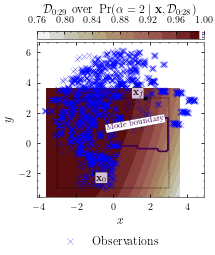

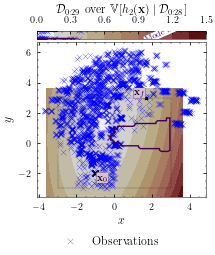

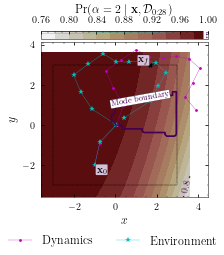

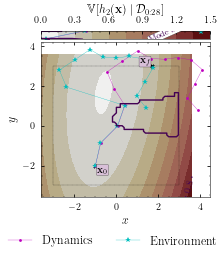

In [26]:
mode_optimiser.save()
for step in range(1, num_steps):
    new_dataset = mode_optimiser.explore_env()
    mode_optimiser.update_dataset(new_dataset)
    mode_optimiser.save()
    plot_data_over_gating_network_and_save(step=step, epoch=0, save=True)
#     mode_optimiser.dynamics_fit_kwargs.update({"batch_size": int(mode_optimiser.dataset[0].shape[0]/3)})
    mode_optimiser.dynamics_fit_kwargs.update({"batch_size": mode_optimiser.dataset[0].shape[0]})
    print("Data set size: {}".format(mode_optimiser.dataset[0].shape))
#     plot_data_over_gating_network_and_save(step=step, epoch=0, save=False)
    plot_trajectories_over_gating_network_and_save(step=step, save=True)
    mode_optimiser.optimise_dynamics()
    plot_data_over_gating_network_and_save(step=step, epoch="last", save=True)
    plt.show()

In [ ]:
# for step in range(num_steps, num_steps*2):
#     new_dataset = mode_optimiser.explore_env()
#     mode_optimiser.update_dataset(new_dataset)
#     batch_size = mode_optimiser.dataset[0].shape[0]
#     mode_optimiser.dynamics_fit_kwargs.update({"batch_size": int(mode_optimiser.dataset[0].shape[0]/1)})
#     print("Data set size: {}".format(mode_optimiser.dataset[0].shape))
#     plot_data_over_gating_network_and_save(step=step, epoch="last", save=True)
#     plot_trajectories_over_gating_network_and_save(step=step, save=True)
#     plt.show()
#     mode_optimiser.optimise_dynamics()

In [ ]:
gpf.utilities.print_summary(mode_optimiser.dynamics.mosvgpe, fmt="notebook")